### Bidirectional LSTM

We tried to achieve the considerable results in sentence classification with simple Convolutional Neural Networks (CNN). Long Short-Term Memory (LSTM) stores historical information by constructing a memory unit, each temporal state saves the previous input information, which can effectively alleviate the long-distance dependence problem of Recurrent Neural Networks (RNN). However, LSTM ignores future information. The BiLSTM contributes to the solution of obtaining both historical information and future information by using the bidirectional propagation mechanism, which helps to achieve better performance in such tasks.

***

Most of the code remains same as that in 1-D CNN Sentiment ANalysis code 

***



In [1]:
import numpy as np
import pandas as pd
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import Dense, Dropout, Embedding, LSTM, Bidirectional
import keras
# Tokenizing the data
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
import numpy as np
from keras.optimizers import RMSprop
#

import os
import pickle as pk
import pandas as pd

Using TensorFlow backend.


In [2]:
tokenizer_path = 'C:/Ankit/Python/Sentiment Analysis/Tokenizer'
imdb_dir = 'C:/Ankit/Python/Sentiment Analysis/aclImdb/aclImdb'

### We are using multiple datasets to train the Sentiment Analysis Classifier.
1. IMDB dataset taken from Kaggle <a href="https://www.kaggle.com/lakshmi25npathi/imdb-dataset-of-50k-movie-reviews" target="_blank">Kaggle IMDB Dataset</a>

2. Yelp reviews dataset

3. Amazon product reviews

4. Random list of positive comments

5. Random list of negative comments

In [3]:
#importing IMDB dataset
imdb_data=pd.read_csv('C:/Ankit/Python/Sentiment Analysis/IMDB Dataset.csv/IMDB Dataset.csv')
print(imdb_data.shape)
imdb_data.head(10)

labels = list()
texts = list()
for index, row in imdb_data.iterrows():
            texts.append(row[0])
            if row[1] == 'negative':
                labels.append(0)
            else:
                labels.append(1)



#importing amazon reviews
with open('C:/Ankit/Python/Sentiment Analysis/amazon.txt', 'r') as in_file:
    stripped = (line.strip() for line in in_file)
    lines = (line.split('\t') for line in stripped if line)
    
    for row in lines:
            texts.append(row[0])
            if row[1] == '0':
                labels.append(0)
            else:
                labels.append(1)

#importing yelp reviews
with open('C:/Ankit/Python/Sentiment Analysis/yelp.txt', 'r') as in_file:
    stripped = (line.strip() for line in in_file)
    lines = (line.split('\t') for line in stripped if line)
    
    for row in lines:
            texts.append(row[0])
            if row[1] == '0':
                labels.append(0)
            else:
                labels.append(1)

#importing positive reviews reviews
with open('C:/Ankit/Python/Sentiment Analysis/positive_comments.txt', 'r') as in_file:
    stripped = (line.strip() for line in in_file)
    lines = (line.split('\t') for line in stripped if line)
    
    for row in lines:
            texts.append(row[0])
            labels.append(1)

#importing positive reviews reviews
with open('C:/Ankit/Python/Sentiment Analysis/negative_comments.txt', 'r') as in_file:
    stripped = (line.strip() for line in in_file)
    lines = (line.split('\t') for line in stripped if line)
    
    for row in lines:
            texts.append(row[0])
            labels.append(0)


(50000, 2)


In [4]:
len(texts)

62662

In [5]:
# cut off reviews after 500 words
max_len = 500 
# train on 10000 samples
training_samples = 40000
 # validate on 10000 samples 
validation_samples = 10000
# consider only the top 10000 words
max_words = 20000 

# import tokenizer with the consideration for only the top 500 words
tokenizer = Tokenizer(num_words=max_words) 
# fit the tokenizer on the texts
tokenizer.fit_on_texts(texts) 
# convert the texts to sequences
sequences = tokenizer.texts_to_sequences(texts) 

# save the tokenizer
with open(os.path.join(tokenizer_path, 'tokenizer_m1.pickle'), 'wb') as handle:
    pk.dump(tokenizer, handle, protocol=pk.HIGHEST_PROTOCOL)


word_index = tokenizer.word_index
print('Found %s unique tokens. ' % len(word_index))

 # pad the sequence to the required length to ensure uniformity
data = pad_sequences(sequences, maxlen=max_len)
print('Data Shape: {}'.format(data.shape))

labels = np.asarray(labels)
print("Shape of data tensor: ", data.shape)
print("Shape of label tensor: ", labels.shape)

# split the data into training and validation set but before that shuffle it first
indices = np.arange(data.shape[0])
np.random.shuffle(indices)
data = data[indices]
labels = labels[indices]

x_train = data[:training_samples]
y_train = labels[:training_samples]
x_val = data[training_samples:training_samples + validation_samples]
y_val = labels[training_samples:training_samples + validation_samples]

# test_data
x_test = data[training_samples+validation_samples:]
y_test = labels[training_samples+validation_samples:]

Found 126268 unique tokens. 
Data Shape: (62662, 500)
Shape of data tensor:  (62662, 500)
Shape of label tensor:  (62662,)


### Callback Functions

We tend to lose control over how our model trains on the provided dataset the moment we call the fit() or fit_generator() method on our model and this means that with a model not “smart” enough, we can only watch it perform very badly during training or quit the training and start allover again. This process can really be expensive and ineffective therefore in order to avoid that, we would like to develop a model that can self-introspect and dynamically take action that will positively affect training. There are many things one cannot predict during training. For instance, one cannot tell the exact number of epochs that will be needed to achieve an optimal validation loss and accuracy.

Mostly during training, we tend to use an arbitrary number of epochs and if the model overfits before that number of epochs is reached then we reduce the number of epochs and train again otherwise, we increase the number of epochs and this approach is very wasteful. A much better way to handle this during training is to stop training when we realize that the validation loss is no longer improving. This can be achieved using a Keras callback. A callback is an object (a class instance implementing specific methods) that is passed to the model in the call to fit and that is called by the model at various points during training. It has access to all the available data about the state of the model and its performance, and it can take action: interrupt training, save a model, load a different weight set, or otherwise alter the state of the model.
Some ways by which callbacks can be used are:

* Model checkpointing — Saving the current weights of the model at different points during training.
* Early stopping — Interrupting training when the validation loss is no longer improving (and save the best model obtained during training).
* Dynamically adjusting the value of certain parameters during training such as the learning rate optimizer.
* Logging training and validation metrics during training or visualizing representations learned by the model as they’re updated. (The Keras progress bar we always see in our terminal during training!)

The code below shows the callback functions we have used for Keras -

In [6]:
# Sample Call-back code
callback_list = [
    keras.callbacks.EarlyStopping(
        patience=1,
        monitor='accuracy',
    ),
    
    keras.callbacks.TensorBoard(
        log_dir='C:/Ankit/Python/Sentiment Analysis/model/log_dir_m1',
        histogram_freq=1,
        embeddings_freq=1,
    ),

    keras.callbacks.ModelCheckpoint(
        monitor='val_loss',
        save_best_only=True,
        filepath='C:/Ankit/Python/Sentiment Analysis/model/movie_sentiment_m1.h5',
    ),

    keras.callbacks.ReduceLROnPlateau(
        patience=1,
        factor=0.1,
    )
]

C:\Users\ankitagarwal5\AppData\Local\Continuum\anaconda3\lib\site-packages\keras\callbacks\tensorboard_v2.py:102: UserWarning: The TensorBoard callback does not support embeddings display when using TensorFlow 2.0. Embeddings-related arguments are ignored.
  warnings.warn('The TensorBoard callback does not support '


Callbacks are passed to the during via the callback argument in the fit() method which takes a list of callbacks. Any number of callbacks can be passed to it.

The monitor argument in the EarlyStopping callback monitor’s the model’s validation accuracy and the patience argument interrupts training when the parameter passed to the monitor argument stops improving for more than the number (of epochs) passed to it (in this case 1).

* Early Stopping : 
The early stopping method is a cross-validation strategy. The principle is that when the performance of the model on the verification set is no longer good, we stop training. In the Keras architecture, we call the callback function to terminate the training. The callbacks record the output values for each iteration, including the verification loss value, the verification accuracy rate, the training loss value, and the training accuracy rate. There are two important parameters in callbacks: “monitor” and “patience,” where “monitor” is used to supervise changes in the output value.

The filepath argument in the ModelCheckpoint callback saves the current weights after every epoch to the destination model file and the monitor and save_best_only arguments mean we won’t override the model file unless the validation loss (val_loss) has improved. This allows us to keep the best model seen during training.

Also, the ReduceLROnPlateau callback is used to reduce the learning rate when the validation loss has stopped improving. This has proven to be a very effective strategy to get out of local minima during training. The factor argument takes as input a float which is used to divide the learning rate when triggered.

The model structure is mainly divided in four parts.

1. Get the word embedding of the text;

2. Enter the word vector into the BiLSTM to obtain the text representation feature : LSTM is consistent with the typical RNN framework, but it uses different ways to calculate the hidden state, which can solve the problem that Recurrent ANN cannot deal with long-distance dependence. However, the excellent capabilities of LSTM are not learned through algorithms, but the inherent advantages of its model structure. The LSTM model consists of a series of repeated memory units, each of which contains three gates with different function.

3. Introduce Dropout : The dropout operation randomly selects some neurons in the network layer with the dropout parameter and discards their input and output features (set to 0) . The ρ refers to the proportion of features set to zero. If ρ=0.5 is set, the return vector of a layer of output samples is [1.2, 0.8, 0.2, 0.9, 1.9, 2.0]. After dropout, the vector becomes [0, 0.8, 0, 0.9, 0, 2.0.]. The reason why the dropout can reduce over-fitting is that it can capture more randomness. The core idea is to introduce noise into the output value of the network layer, breaking the inconspicuous accidental mode. If there is no noise, the learning mode of the network becomes single, will remember these casual modes.

4. Use sigmoid function in last layer : The sigmoid function takes any range real number and returns the output value which falls in the range of 0 to 1.It's often used in logistic regression for a binary classification and also as activation function in neural networks (like here). The output of the sigmoid function can be interpreted as a probability.



In [7]:

model = Sequential()
model.add(Embedding(max_words, 128, input_length=max_len))
model.add(Bidirectional(LSTM(64)))
model.add(Dropout(0.5))
model.add(Dense(1, activation='sigmoid'))

In [8]:
# try using different optimizers and different optimizer configs
model.compile('adam', 'binary_crossentropy', metrics=['accuracy'])
batch_size = 128

print('Train...')
history = model.fit(x_train, y_train, epochs=10, batch_size=128, callbacks=callback_list,validation_data=(x_val, y_val))

Train...


C:\Users\ankitagarwal5\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


Train on 40000 samples, validate on 10000 samples
Epoch 1/10
40000/40000 [==============================] - 3077s 77ms/step - loss: 0.4426 - accuracy: 0.7872 - val_loss: 0.3276 - val_accuracy: 0.8587
Epoch 2/10
40000/40000 [==============================] - 3067s 77ms/step - loss: 0.2719 - accuracy: 0.8926 - val_loss: 0.3357 - val_accuracy: 0.8616
Epoch 3/10
40000/40000 [==============================] - 3080s 77ms/step - loss: 0.1692 - accuracy: 0.9409 - val_loss: 0.3445 - val_accuracy: 0.8659
Epoch 4/10
40000/40000 [==============================] - 3116s 78ms/step - loss: 0.1535 - accuracy: 0.9474 - val_loss: 0.3517 - val_accuracy: 0.8648
Epoch 5/10
40000/40000 [==============================] - 3084s 77ms/step - loss: 0.1515 - accuracy: 0.9482 - val_loss: 0.3521 - val_accuracy: 0.8645
Epoch 6/10
40000/40000 [==============================] - 3102s 78ms/step - loss: 0.1508 - accuracy: 0.9484 - val_loss: 0.3522 - val_accuracy: 0.8645
Epoch 7/10
40000/40000 [==========================

In [12]:
from keras.models import load_model
import os, pickle
import numpy as np

In [13]:
tokenizer_path = 'C:/Ankit/Python/Sentiment Analysis/Tokenizer'
model_path = 'C:/Ankit/Python/Sentiment Analysis/model'
model_file = os.path.join(model_path, 'movie_sentiment_m1.h5')
tokenizer_file = os.path.join(tokenizer_path, 'tokenizer_m1.pickle')
model = load_model(model_file)

# load tokenizer
with open(tokenizer_file, 'rb') as handle:
    tokenizer = pickle.load(handle)

C:\Users\ankitagarwal5\AppData\Local\Continuum\anaconda3\lib\site-packages\tensorflow_core\python\framework\indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "


In [14]:
def review_rating(score, decoded_review):
    if float(score) >= 0.9:
        print('Review: {}\nSentiment: Strongly Positive\nScore: {}'.format(decoded_review, score))
    elif float(score) >= 0.7 and float(score) < 0.9:
        print('Review: {}\nSentiment: Positive\nScore: {}'.format(decoded_review, score))
    elif float(score) >= 0.5 and float(score) < 0.7:
        print('Review: {}\nSentiment: Okay\nScore: {}'.format(decoded_review, score))
    else:
        print('Review: {}\nSentiment: Negative\nScore: {}'.format(decoded_review, score))
    print('\n\n')

In [15]:
def decode_review(text_list):
    word_index = tokenizer.word_index
    sequences = tokenizer.texts_to_sequences(text_list)
    data = pad_sequences(sequences, maxlen=500)

    # decode the words
    reverse_word_index = dict([(value, key) for (key, value) in word_index.items()])
    decoded_review = ' '.join([reverse_word_index.get(i, '?') for i in sequences[0]])
    return decoded_review, data

In [16]:
def score_review(source=None, file_type=None):
    '''
    source: the text, as either a string or a list of strings
    file_type: (str): indicating whether we expecting a file containing the
    text data or a directory containing a list files holding the text
    options: 'file' or 'dir'
    '''
    text_list = list()
    if isinstance(source, str) and file_type is None:
        text_list.append(source)
        decoded_review, data = decode_review(text_list)
        # make prediction
        score = model.predict(data)[0][0]
        review_rating(score, decoded_review)
    
    if isinstance(source, list) and file_type is None:
        for item in source:
            text_list = list()
            text_list.append(item)
            decoded_review, data = decode_review(text_list)
            score = model.predict(data)[0][0]
            review_rating(score, decoded_review)
    
    if isinstance(source, str) and file_type == 'file':
        file_data = open(source).read()
        text_list.append(file_data)
        decoded_review, data = decode_review(text_list)
        # make prediction
        score = model.predict(data)[0][0]
        review_rating(score, decoded_review)
    
    if isinstance(source, str) and file_type == 'dir':
        file_content_holder = list()
        for fname in os.listdir(source):
            if fname[-4:] == '.txt':
                f = open(os.path.join(source, fname),encoding='utf-8')
                file_content_holder.append(f.read())
                f.close()
        for item in file_content_holder:
            text_list = list()
            text_list.append(item)
            decoded_review, data = decode_review(text_list)
            score = model.predict(data)[0][0]
            review_rating(score, decoded_review)

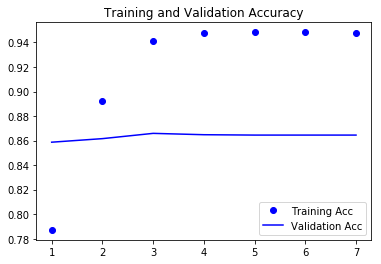

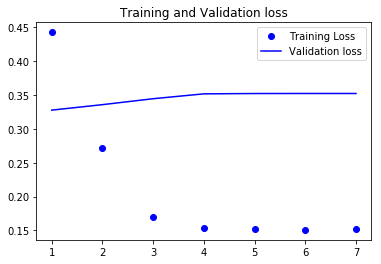

In [22]:
# plotting the results
import matplotlib.pyplot as plt

accuracy = history.history.get('accuracy')
val_acc = history.history.get('val_accuracy')
loss = history.history.get('loss')
val_loss = history.history.get('val_loss')

epochs = range(1, len(accuracy) + 1)
plt.plot(epochs, accuracy, 'bo', label='Training Acc')
plt.plot(epochs, val_acc, 'b', label='Validation Acc')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label="Training Loss")
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and Validation loss')
plt.legend()
plt.show()

We will use discrete set of .TXT files that are housed in a directory * pos * and each of those txt files will be scanned and its sentiment will be predicted by model. This has been done to show how to read each file at a time and use of prediction. Each TXT file is a IMDB movie review.

In [23]:
#imdb_dir = 'C:/Ankit/Python/Sentiment Analysis/aclImdb/aclImdb'
score_review('C:/Ankit/Python/Sentiment Analysis/aclImdb/aclImdb/test/pos', file_type='dir')

Review: i went and saw this movie last night after being to by a few friends of mine i'll admit that i was reluctant to see it because from what i knew of ashton kutcher he was only able to do comedy i was wrong kutcher played the character of jake fischer very well and kevin costner played ben randall with such professionalism the sign of a good movie is that it can toy with our emotions this one did exactly that the entire theater which was sold out was overcome by laughter during the first half of the movie and were moved to tears during the second half while exiting the theater i not only saw many women in tears but many full grown men as well trying desperately not to let anyone see them crying this movie was great and i suggest that you go see it before you judge
Sentiment: Strongly Positive
Score: 0.9711558222770691



Review: actor turned director bill paxton follows up his promising debut the gothic horror frailty with this family friendly sports drama about the 1913 u s open 

Review: i felt this film did have many good qualities the cinematography was certainly different exposing the stage aspect of the set and story the original characters as actors was certainly an achievement and i felt most played quite convincingly of course they are playing themselves but definitely unique the cultural aspects may leave many disappointed as a familiarity with the chinese and oriental culture will answer a lot of questions regarding parent child relationships and the stigma that goes with any drug use i found the story interesting on a down note the story is in beijing and some of the fashion and music of early 90s even though this was made in 2001 so it's really cheesy sometimes the beatles crap etc whatever not a top ten or twenty but if it's on the television check it out
Sentiment: Positive
Score: 0.7355595231056213



Review: this movie is amazing because the fact that the real people portray themselves and their real life experience and do such a good job it's li

Review: i first saw this movie on ifc which is a great network by the way to see underground films i watched this movie and was thinking it was going to be pure drama and a story line that doesn't hold water but it really was a worth while watch the main character is in such rough shape and you hate to see him deny help but no matter what you just can't hate him his devotion to the beatles and john lennon is a great metaphor for his life and the helplessness he feels br br the atmosphere of the film is also great at times you feel like you can see what he sees feel what he feels in some situations this movie does not leave you wanting to know more or disliking a in the plot there are no loopholes in my opinion i have always been a fan of foreign films especially now with movies being made so poorly in america i really enjoy the foreign settings because i feel it can take you on a trip and sometimes understand a different culture this movie did all those things to me and more please wat

Review: i have certainly not seen all of jean films but they mostly seem to be bloody vampire naked women fests which if you like that sort of thing is not bad but this is a major departure and could almost be cronenberg minus the bio mechanical nightmarish stuff except it's in french with subtitles of course a man driving on the road at night comes across a woman that is in her and and picks her up while in the background yet another woman lingers wearing nothing as they drive along it's obvious that there is something not right about the woman in that she forgets things almost as quickly as they happen still though that doesn't prevent the man from having sex with her once they return to paris his apartment the man leaves for work and some strangers show up at his place and take the woman away to this a huge apartment building referred to as the black tower where others of her kind for whom the 'no things seems to be the least of their problems are being held for some reason time and

Review: if you keep rigid historical perspective out of it this film is actually quite entertaining it's got action adventure and romance and one of the premiere casting match ups of the era with errol flynn and olivia de havilland in the lead roles as evident on this board the picture doesn't pass muster with purists who look for one hundred percent accuracy in their story telling to get beyond that one need only put aside the history book and enjoy the story as if it were a work of fiction i know i know that's hard to do when you consider custer's last stand at the little big horn and it's prominence in the history of post civil war america so i guess there's an unresolved with the picture no matter how you look at it br br there's a lot to take in here though for the picture's two hour plus run time custer's arrival at west point is probably the first head riding up as he does in full military the practical joke by sharp arthur kennedy putting him up in the headquarters probably sho

Review: i was fortunate to attend the london premier of this film while i am not at all a fan of british drama i did find myself deeply moved by the characters and the bad choices they made i was in tears by the end of the film every scene was mesmerizing the attention to detail and the excellent acting was quite impressive br br i would have to agree with some of the other comments here which question why all these women were throwing themselves at such a despicable character br br alert i was also hoping that dylan would have been killed by william when he had the chance end spoiler br br keira knightley did a great job and beauty and innocence from the screen but it was sienna miller's performance that was truly oscar worthy br br i am sure this production will be nominated for other awards
Sentiment: Strongly Positive
Score: 0.964796781539917



Review: i blame birth of a nation myself for the long running tradition of hollywood of history of which there can be few greater examples

Review: it's true that they died with their boots on gives a highly fictionalized account of george armstrong custer's errol flynn life and career but a remarkable one especially with regard to the battle of the little big horn because it is not a given that a 1941 movie tries to portray both the us american and native american leader chief crazy horse anthony quinn in a favorable light i'm almost tempted to say that little big man in its anti custer stance seems unbalanced by comparison further one should not be mislead by the title of the picture  this isn't just a movie about the battle of the little big horn it's a movie about that shows the west point the famed civil war hero the indian fighter and last but not least the husband br br the movie begins with custer's time at the west point military academy where his and behavior lead to frequent during a military exercise he meets his future wife elizabeth bacon olivia de havilland who like custer himself is a native of monroe mich

Score: 0.8766703009605408



Review: so keira knightly is in it so automatically we compare this film to aside rom the fact that this film is also wartime and her appearance is these films are totally different br br the actors work well i think one good thing is there is no memorable person they are a team br br if you want a film where things happen then id advise another as the story of this film is about human interaction and their damaged by their experiences and how their lives are intertwined br br this film have genuine interaction perfect pause moments that make you hold your breath no its not exciting but it is gripping if you can empathise with these characters at moments i wondered if this film may have been better as a theatrical play rather than a movie we expect a lot from movies as everything is possible and yet with theatre we allow for interaction and rely on belief br br there are things wrong with it if your looking for a blockbuster if you look for nothing and allo

Score: 0.5117583870887756



Review: i saw this film over christmas and what a great film it was it tells the story of custer played by errol flynn during and after his graduation from although i've heard that the film isn't very historically accurate hollywood never is i still enjoyed it as i knew little of the real events anyway br br i thought errol flynn was brilliant as custer and has since become my favourite actor his acting alongside olivia de havilland was brilliant and the ending was fantastic it brought me close to tears as he and ned sharp arthur kennedy rode to their deaths on little big horn br br i had always known that errol flynn was a brilliant actor as he was my dads favourite actor and i grew up watching his films as a child but it wasn't until i watched this film that i realised how great he actually was br br i'll give this film 10 out of 10
Sentiment: Strongly Positive
Score: 0.9824522733688354



Review: although this film changes reality to make it more heroic 

Review: the custer legend a la warner brothers epic there's no casting against type here with the flamboyant flynn as the flamboyant custer in this rousing tribute not only to custer but to the men of the 7th cavalry the story traces the life of the famed general from his turbulent days at west point to his final fight at the little big horn great liberties are taken with facts here and we are presented with a custer that is much more sympathetic to the plight of the than history relates but this one is done on such a grand scale the battle scenes alone provided employment for every extra in hollywood down beat ending and all this is great fun
Sentiment: Strongly Positive
Score: 0.98102205991745



Review: all in all an excellent movie from that time and source coming from warner brothers as it was in craftsmanship and style just before wwii provided you don't take it at all seriously the movie really makes no claim to being historically accurate and is certainly no more or less accura

Review: nikki finn is the kind of girl i would marry never boring always thinking positively good with animals okay as one reviewer wrote a bit too much lipstick and eyebrows only madonna could get away with that but that's why i love nikki finn she's not your ordinary girl she makes things happen always exciting to be around and always honest sure she steals but she doesn't rob or murder unless you're out to do her in she knows which rules can be broken and which ones should be she knows what to take and what can't be stolen if you need a favor from her she's in 100 bottom line she knows how to enjoy life nikki is always loving which is why she has a way with wild animals and completely dedicated to those she loves and who love her br br who's that girl she's the girl for me
Sentiment: Positive
Score: 0.8651129007339478



Review: when i see a movie i usually seek entertainment but of course if i know what genre the move is then i will seek what it is meant to do for example if it is 

Review: don't listen to what the critics have always said about this cute charming little movie madonna is great in this clever comedy i worked at a video store for several years and suggested this movie to lots of customers no one ever brought it back and screamed at me for telling them to rent it everyone always enjoyed it it's actually a great movie for kids too
Sentiment: Strongly Positive
Score: 0.9777129292488098



Review: i kid you not yes who's that girl has the distinction for being one in a string of madonna's films that bombed but i actually liked this movie more than desperately seeking susan in susan madonna's character is relegated to being second fiddle to rosanna arquette and is not given much to work with no disrespect to rosanna but in madonna plays this zany outrageous character only done in an 80s style while it may seem cheesy today this is actually one of madonna's best and one of her most underrated films br br madonna plays nikki finn an ex con who is sent to t

Review: finding this piece between a stale prequel and a rehashed 80s on a saturday program would be misleading it deserves better and definitely uses its talented best attributes to its maximum advantage bracco and walken team to provide a movie that while perhaps predictable to those familiar with their genre do the streetwise routine that they are so good at portraying for a chance to ride a psychological roller coaster a la training day dive back into the world of early '90s tv movies to find scam
Sentiment: Strongly Positive
Score: 0.9544400572776794



Review: i am a huge fan of and i just knew that i had to see this movie even though i can't say i'm a soccer fan but watching this just filled my heart with joy and i had a great time in the movies watching it br br fast does a tremendous job directing this movie and even though you notice the main characters are new at acting they grow with the movie and makes it what it is even though it is supposed to be a soccer movie there is 

Review: as an asian horror a tale of two sisters is actually a complex character driven psychological drama that the viewer into the problems of a seemingly normal family i was really surprised at the depth of this movie director ji decision to focus more on telling a story rather than providing cheap scares has proved a correct one creating one of the most ingenious new horror movies br br a tale of two sisters the story as it's name suggest of two sisters su mi and the younger su yeon who after spending time in a mental institution return home to their father and apparently abusive stepmother from then on we witness how the sisters deal with their gradually rising aggression and erratic behavior to say what would happen next would be to be spoil the entire experience so i'll just leave it at that br br the plot is very tightly written with the characters nicely fleshed out ji focus on a small cast offers a much more detailed view on them and their relations to one another furthermore

Review: let me just say i love the horror genre to the extent that i see every single one that i can get my hands on regardless except really low quality b movie horrors which i could do without and recently have become a big fan of eastern horrors little did i know that a korean horror would be the one that tops my list beating off such as the japanese ringu or the american ring or even quality us movies such as the sixth sense and the others and the widely acclaimed hong kong horror 'the br br previously 'the had stood as my favourite horror but it seems to me that i prefer the beauty of 'the tale of two any day the story is extraordinary and rather open to interpretation thus allowing repeat viewings although chances are you'll want to watch this again and again just because the movie is so masterfully shot the story is likely one of the best in the genre to date the acting is top notch too from the entire cast and the scares when they come have the potential to you like anything wi

Review: this isn't so much a review of a tale of two sisters as it is a discussion of some of the smaller plot details so i advise you not to read this review if you haven't seen the film because doing so will absolutely ruin a few surprises for you br br in a way a tale of two sisters is far from original at least from a purely superficial aspect some of its is taken straight from ring or dark water while the storyline itself especially what calls the rubber reality aspect of the narrative is reminiscent of films like fight club lead character with someone created in their mind mulholland drive character creates alternate reality in a as well as other minor aspects of lost highway ladder and basically every film under the sun dealing with mental illness plus films the others los memento particularly with regards to the torturous nature of memory et al thankfully all these similarities do not detract from the film's overall emotional impact and i personally found a tale of two sisters 

Score: 0.20288680493831635



Review: i love horror films but i think they work way better when they hide a dramatic impact behind the devil's backbone the exorcist for example this is that kind of film and it's not only eerie and terrifying when it has to be it is also really beautiful a tale of two sisters starts really slow so if you're in a hurry to see ghosts in the first 20 minutes you will be disappointed actually this is not a ghost story there are some it's something more complex and it's done in such a way that it beats ringu and the grudge out of the ring no sweat a is a way more clever film than those huge cultural hits because it really cares for its characters and the direction is flawless every detail in this film will leave you breathless if you're the kind of person who loves to pay attention to details while watching a movie the acting is superb specially from the stepmother and the main girl those two are worth the price of the ticket alone do yourself a favor and wa

Review: this movie was an excellent acted excellent directed and overall had an excellent story ive had real life with a boy like at the football program in my town had a mentally challenged boy every year practice travel and have fun with the football team this movie is really true and i can identify with it 100 a boy like just needs to feel like they belong to something they need to feel like their life is worth living thats how feels and thats why that type of program is set up at my high school this is a very touching movie that im glad has been brought to the big screen my dad and i loved it and i will always remember this for being a movie that tells a riveting story of the goodness and kindness of man
Sentiment: Strongly Positive
Score: 0.9849951863288879



Review: call it manipulative drivel if you will but i fell for it sure there could have been more character development yeah there could have been better cinematography and less of a constant movie of the week score but ed h

Review: cuba gooding jr will win the oscar for best actor in 2003 and ed harris will win for best supporting actor what a beautiful and poignant film it is but be sure to bring along a box of tissues because if this film doesn't get to you then you have ice water in your veins br br it was 1976 the setting was in south carolina and the civil rights act was about ten years old we have a white high school football coach and teacher ed harris then there is a black retarded frightened but pleasant fellow cuba gooding whose greatest possessions including a radio are piled into a shopping cart which is also used as his bicycle br br ed harris takes a keen interest in the fellow for a reason explained much later on in the film he gives cuba the nickname radio and what follows is an riveting engrossing poignant exploration of the human soul br br the movie is nothing short of a masterpiece
Sentiment: Strongly Positive
Score: 0.9776466488838196



Review: inspired by true events radio is one of

Review: can a mentally challenged black youth be a catalyst to unite people in a south carolina town the answer appears to be that in spite of his handicap james kennedy understood much more than what he was given credit for and went to become a in the sports scene also the film is saying how many of us overlook people with problems that can be helped if only we have the patience coach jones showed to the young man because of his own guilt in his heart br br radio directed by michael is a formula film inspired on a true story yet the movie is not a complete failure because of the inspired performances the director was able to get from his wonderful cast br br coach jones is instrumental in getting the young man who is called radio because his passion for collecting them involved in sports a passion he discovers in this retarded man who has had only hard knocks in his young life coming from a poor background radio lives with his mother who is protective of him and questions the intentio

Review: spoilers to understand what really happened first you have to be a warrior to stay alive in real war to think off line critically and not linear otherwise you will come to false conclusions that gray was dumb or unstable person truth is something completely different he was firm hardened veteran and only way he could be killed by capt o'malley is that he wants her to kill him it was his way out he choose it he was not man who will retire if you've never been on a first line you can't understand it he intentionally prepare his own suicide first he seduced mary jane than intentionally acted as a dumb than argue shutting incident before witnesses to protect her later after she done what he wants her to do if it comes to trial than gave her son a bullets to assure he could load her gun later came that night loaded her gun woke her up put her gun in her hands acted as he was attacking her after shot first time he raised knife and cried one kill so she shot him again and before died 

Review: unfortunately due to a sluggish start i can't say that this is one of hitch's best films it very excellent none the less the film stars jimmy stewart and doris day as parents who get caught up in a political assassination plot and must try to get their kidnapped son back they both give excellent performances not surprising of course really however i was most impressed with amazing use of music the climax at the opera house was fantastic and using a live orchestra to create music and suspense at the same time was pure genius absolutely fantastic suspense came out of that scene also the use of doris day singing que sera sera was excellent especially when it is on scenes at the end of the film so this film to me ends up being best use of music that i have seen to date unfortunately it had a slow start or i could have recommend this film a little more highly even then it is still well worth a look 8 out of 10
Sentiment: Strongly Positive
Score: 0.9929497241973877



Review: this is

Review: this film is the one which you fall in love with alfred hitchcock shall always remain over the top of any directors of his time the most influential aspects about his films are sheer simplicity gripping drama the another best thing about hitchcock's films is a definite gripping end br br any thing said about the man who knew too much is less the cinematography acting dialogs camera works are magnificent in this movie the song que sera sera at the end shall remain in our memories for life time the film is so enjoyable from start to end that we never know when it ends rarely would hitchcock include humor in his films this film has comic scenes which fits in to the movie br br this film is absolutely brilliant as good as vertigo
Sentiment: Strongly Positive
Score: 0.982236385345459



Review: am i the only person who believes this american version is far better than the 1934 english film the english version has no suspense looks antique and very low budget and has acting except fo

Review: dr ben mckenna james stewart and jo mckenna doris day travel to morocco for a holiday where they meet a mysterious man named louis bernard daniel on a bus the next day this man is murdered but before he dies he tells ben a secret an assassination will take place in london the crooks kidnap the couple's son hank christopher olsen making sure ben won't reveal their plan to anybody alfred hitchcock's the man who knew too much 1956 is a very intense thriller the acting is superb as it always is in films james stewart is marvelous doris day is a delightful person and actress and she gets to show her singing talents as well the song que sera sera has an important part in the movie this movie is a movie of many classic scenes in the final scenes at the albert hall done without dialogue you can barely blink your eyes this movie is fifty years old now time hasn't its power in any way
Sentiment: Strongly Positive
Score: 0.9773474335670471



Review: hitchcock's remake of his 1934 film co

Review: many reviewers seem to prefer the original version of the man who knew too much which i have not had the opportunity to view by itself the version is a very well done film the run of mid to late fifties hitchcock films including rear window dial m for murder vertigo and to catch a thief as well as this film is one of my favorite periods in his career in the man who knew too much jimmy stewart throws himself into his role as always doris day is very believable in the role of an atypical hitchcock blond i thought there was nothing fake about her performance her character may not have been written as strongly as the original but she's definitely not reduced to the role of a passive yes dear pretty thing on jimmy stewart's arm br br there were some really clever lines written for hank the couple's son who later gets kidnapped in the opening scene on the bus it's too bad christopher olsen read them so it's rare to see a good performance from a child actor in the 50s though most of t

Review: the original the man who knew too much brought alfred hitchcock acclaim for the first time outside of the united kingdom of course part of the reason for the acclaim was that folks how hitchcock on such a skimpy budget as compared to lavish hollywood products was able to provide so much on the screen the original film was shot inside a studio br br for whatever reason he chose this of all his films to remake hitchcock now with an international reputation and a big hollywood studio behind him paramount decided to see what the man who knew too much would be like with a lavish budget this is shot on location in and london and has two big international names for box office this was james stewart's third of four hitchcock films and his only teaming with doris day and her only hitchcock film br br i do wonder why hitchcock never used doris again at first glance she would fit the profile of blond leading ladies that hitchcock favored possibly because her wholesome screen image was at 

Review: i was swept into this series just as surely as the sea would sweep me into its grip although it started out slowly i found that the realism in depicting the ship the variety of characters and lively dialogue keep me watching the protagonist was destined to be challenged grow and change on this voyage and i wanted to be there for it i was not disappointed the series took you from humor to tragedy and everything in between often in the same scene the same breath there was a wealth of emotional interaction and expression relentless and compelling to observe the movement of the ship added an almost fanciful component to the many scenes making the characters ill one moment and adding humor the next br br edmund talbot is a complex character the likes of which we don't see often we may know where the captain stands or mr but they are older men set in their ways talbot was young and arrogant still learning testing himself and being tested he struggled getting along with others and mad

Review: this movie is amazing you will never laugh harder it's a target no i think it's yes it's a boob this movie gets funnier by the second like when jackie chan's character finally dies in his final fight scene this movie is like congrats if you buy or rent this you'll never return it in my opinion i didn't and i haven't found it in a store since i watched this movie once and i was forever in love with kung fu action flicks if you're looking for an amazing film in the realm of great production value good or even mediocre acting and good special effects this is not that movie if you're looking for laughs and timeless pick this up for a dollar and you'll probably never let it go with friends popcorn and drinks it's the perfect evening
Sentiment: Strongly Positive
Score: 0.9559707641601562



Review: the hand of death most definitely rates a ten on a scale of one to due in no small part to john woo's masterful direction coupled with superb cinematography some of the leisurely tracking 

Review: to power in 1933 hitler and his national socialist german workers party which of course we all know as the nazis their grip on the country more and more as the time went by early in their rough of the german people they called any and all artists newspaper men and film makers into their nazi in order that the may be informed of just what the newly declared third reich aka expected of them br br when the master director from the german cinema's silent and expressionist era mr fritz lang was called in to meet with herr he listened and said nothing immediately after leaving the minister of office herr lang went directly to the train station and took a passenger directly to paris not even going back to his residence fritz lang did not return to germany at least not until many years later he remained in france eventually to the united states of america br br mr lang went right to work in america creating a variety of most enjoyable solid and substantially literate upper movies for m

Review: here's another of the 1940's westerns that i watch whenever it comes on tcm or because although it may be flawed historically it is extremely entertaining and well acted plus it's got randolph scott my favorite actor second only to gary cooper well ok fourth behind coop charlton heston and gregory peck but the film itself to me anyway is reasonably historically accurate and as i said before well acted and flows very well i bet i've seen it 50 or 60 times and enjoy each viewing more than the one before i have it on tape from tcm but would buy it in a minute if it ever came out on dvd see it if you haven't i guarantee you'll like it
Sentiment: Strongly Positive
Score: 0.9805655479431152



Review: lang does hawks as well as hawks does in the first part of this extraordinary western before settling down into typical dark and guilt haunted lang for the finale br br this is one of those films that shows its greatness almost instantly but at the same time very subtly vance shaw rando

Review: doe eyed high school student kathleen is found beaten and br br raped in the opening scenes of this made for tv movie the film br br then flashbacks to the few days before the rape as is br br harassed by a stranger br br and scott and her best friend robin and br br dennis quaid are double dating early on anxious parents br br laid back tony bill and shrill blythe danner wait at home br br hands and so on right away the 1970's makes its dated br br entrance as the young couples discuss the romance and love in br br three days of the br br an amateur photographer begins getting threatening notes br br stuffed in her locker at school the film makers wisely give us a br br whole slew of suspects new boyfriend br br boyfriend dad ex boyfriend and what about that br br overly friendly photography class teacher who wants to be a br br little more sexy in her self portraits i knew who the rapist was br br because the video company video box has a picture of br br the attack on the ba

Review: i saw this years ago and it's entertaining but not profound the basic story is of a young man who dreams of midian though he's not sure where it is or even if it really exists br br spoilers follow he finally visits it gets transformed to a nightbreed creature by being bitten by another one then he has to help the other members of the nightbreed because they're being attacked by canadians save for the accents they all act like good ol' boys not much in tune with the canadian psyche eh someone observed for monsters or nightbreed substitute jews and for the canadians humans substitute nazis and you're supposed to get an insight into the struggle by the monsters versus the humans well maybe br br one major objection i had was that while the underground city was interesting it was rather ramshackle and frankly dirty this must be a convention for movies with underground one would think that if the monsters were the good guys some would have at least a little sense of decor br br the

Review: for a movie like this there's always something to follow by in years to come clive barker the man who brought hellraiser makes a horror movie that is part goth part mythology and all horror in between nightbreed are a bunch of mutants who only come out at night and roam the place called midian now a man name boone craig sheffer claims to suffer hallucinations he goes to this shrink dr decker david who helps boone with his problems unaware of this situation decker claims to be a purist which he's only a hate in disguise boone however goes into midian and make the claim that he's one of the mutants there but a mutant named oliver parker sees boone as meat his bite however boone so after he is killed by a of fire arms he's one of them now after being mislead by decker boone does everything in his power to protect lori anne bobby from him lori saves a mutant from the sun and in return helps the others as well i liked the lady mutants one who gives a smoky kiss of death and the woma

Review: i enjoyed this film the way these mutants looked along with the tone of the film is very good plus david cronenberg as philip k decker was great it makes me wonder if his personality is exactly the same in real life except for the killings of course br br i was impressed with the creatures for this film although this movie probably had a somewhat low budget the mutants creatures monsters looked great especially from 1990 this is definitely a unique film and not crap it makes me want to go find a read the novella it's based off of this is an interesting film because it shows how humans can be monsters and the monsters are the one with humanity
Sentiment: Strongly Positive
Score: 0.9818446636199951



Review: i just watched nightbreed for the first time since seeing it in the theater almost 20 years ago and while i remember liking it at the time i don't remember being blown away by it like i was today i really can't complain about anything in this movie craig is excellent as the 

Review: don't ask me why i love this movie so much maybe it came at a time in my life i desperately wanted to fit in maybe it is the amazing monster effects maybe because i enjoyed the novel cabal but it's probably because i love clive barker i think it's fair to warn you the movie and the novel have no true resolve and like me you'll probably have a wtf moment at the end at least two sequels were planned but never came about due to the fact the movie flopped for a few reasons the studio made drastic cuts to the film cutting a good 30 or so minutes out of it and they did a horrible job promoting it the made it look like just another cheap slasher showing mainly the button face mask decker character this is a movie about the monsters about fantasy about a place called midian it's a story where the monsters are the good guys there is truly nothing else out there like it it's not a movie for everybody i suppose but it stands as one of many great works sit back and be prepared to be taken 

Review: i guess those who have been in a one sided relationship of some sort before will be able identify with the lead character tanaka a 50 year old woman who is still in the pink of good health as demonstrated by her daily grinding routine of waking up extremely early in the morning to prepare for her milk delivery work where she has to bottles of in a bag in a route around her town like clockwork to exchange empty bottles for full ones and to collect payment and issue and there's always be that one delivery stop that's right at the top needing to scale a long flight of stairs in order to achieve customer satisfaction br br and peculiar enough that stop happened to be a stop delivering to a man with whom she has been in love with for almost all her teenage to adult life and not having the product appreciated but poured down the sink having gone to the same school we see that they're not talking to each other and in their daily life always seem so close physically but yet so far away

Review: you want a movie that'll take you places well this is a good pick if you were an adolescent in the era portrayed in this film the of or if you want to reach back and see what your parents made so much noise about i suggest you pick up this flick and give it a watch at the risk of sounding cliche you'll laugh you'll cry you'll reminisce and remember you'll go back to a time when school violence was a fist fight you'll recall with fondness your best friends from school it's a feel good movie with an edge of angst and pain and realism losing friends deciding what to do with your life i think everyone regardless of race age standing can pull something from this movie and really enjoy it so take a couple hours out of a lazy day and check out this film there are much worse ways you could spend your time
Sentiment: Strongly Positive
Score: 0.9028831720352173



Review: at the surface cooley high is a snappy ensemble comedy masquerading as a period piece set in the early 60's complete 

Score: 0.9210534691810608



Review: cooley high is considered one of my best all time movies it certainly reminds me of days of my youth growing up in the cities of cleveland and chicago during the early mid and late 1960's what ever happened to brenda and some one to track those two down brenda for her beauty and for his innocent wit they both deserve to be recognized even 31 years after this film was debuted i think a lot of the fans of this movie would like to find out what happened to them as well as others who acted in this fun filled movie i certainly think this movie should be entered into some type of movie hall of fame all of the cast of this movie was great my opinion is of cooley high is turn back the hands of time those were the fun years
Sentiment: Strongly Positive
Score: 0.9877005815505981



Review: cooley high is such a great film that even with the sound track urban landscape wardrobe and slang it still doesn't feel dated the sound track by the way is a timeless clas

Score: 0.9466518759727478



Review: if you need that instant buzz that only late 60s early 70s euro sex movies can give off then look no further for you have just stumbled across the mother subsequent tv director exercise in psychedelic porn of the soft core variety may not generally be considered as a classic of its kind but it knocks many better known titles from the likes of brass jess franco and joe d'amato for a loop sure was hip to this way before anyone else when he picked up this marvelously twisted little number for us distribution through his company gorgeous cinematography compositions may elicit cries of from those who swear by shoddy skin flicks shot in someone's backyard hey as far as i'm concerned it's their loss for this is one thrill ride of a movie with twists so well twisted that you may not even believe them after you have actually witnessed them on screen as the gone to seed landlady from lucio fulci's house by the cemetery has never looked more exquisite than she

Review: a slick production which holds the interest from the very first scene where max is choosing a ring in a shop much of what follows reminds us of shakespeare's a mid summer night's dream in which and fall in love with each other's girl friends here max and lucien both prone to love at first sight get mixed up with lisa and alice and alice things when she calls herself lisa on top of the merry mix up max is inclined to get involved in incidents which bring back memories of two years ago and because max has a lot of these dreamy episodes we are subjected to one flashback after another too many in my opinion because at first viewing of the film i wasn't quite sure if i was in the present or the past there is much running down corridors through into elevators etc i accept all that in a fast paced film but do we have to have so many people with each other after four it ceases to have any impact if you'll excuse the pun high marks for art design the apartment itself is really beautiful

Review: like an earlier i saw it in 1980 and have never been able to shake the memory of the gripping story splendid acting and dramatic musical score it certainly contains some of sam finest work he and the writers depict oppenheimer not simply as an unjustly victimized hero which he was but also as naive fond of alcohol and snobbish a rounded portrait instead of a stereotype
Sentiment: Positive
Score: 0.818241536617279



Review: not all movies should have that predictable ending that we are all so use to and it's great to see movies with really unusual twists however with that said i was really disappointed in ending in my opinion the ending didn't really fit in with the rest of the movie and it basically destroyed the story that was being told br br you spend the whole movie discovering everyone and their feelings but the events in the final 2 minutes of the movie would have impacted on character but the movie ends and leaves it all too wide open br br overall though this movie was

Review: i just saw this film again i believe for the sixth time i will doubtless see it many more times this is one of the most brilliant french films ever made although the film is mysterious even more mysterious is what happened to the writer and director for ten years he has not made another film and this was his only one the story and execution of this ingenious film are perfect and it is clearly paying homage continually to both hitchcock and buster keaton the split second timing of the movements is just as carefully controlled as the scene where the side of a house falls on keaton in bill and he is only not killed by inches in this film people stoop and turn and pass one another and if they had been one second off they would have the storyline thus walks a of chance events to such an intense degree that you cannot take your eyes off the screen for even a or you will miss something crucial the haunting albeit intentionally repetitive music by peter chase is reminiscent of hitchcoc

Review: a wonderful story about the consequences of obsessive love with the beautiful romantic back streets of paris as its location we're transported through time and see the plot develop from the perspectives of the three main characters as the mystery
Sentiment: Strongly Positive
Score: 0.9186223149299622



Review: i watched this film for the second time tonight after about three years and it was as wonderful as before br br there are more than a dozen modern stunning french films from en de to the three colours trilogy and all of them are special this film is one of them a true delight with so many great things going for it from the homage to hitchcock to two beautiful ladies in romane and monica while monica is very beautiful romane is a very sexy lady and steals many of the scenes she inhabits br br i am not sure why people think this film is convoluted as the scenes are such a perfect blend of past and present acting as a counterpoint to the characters' own remarkable journey t

Review: this movie is based mainly on the emotions and interactions of people there are only three locations the school the store and the house that are really used it's primarily at the house however a movie doesn't need special effects or amazing views to be amazing in itself br br four friends who had during their basketball days meet up one is rich important and has no real love outside of money one wants to be mayor again but his competition is turning him sour one wants to be superintendent of the school and take care of his family one is a traveling alcoholic br br first off i love the actors in this film they've all been household names to me they proved their worth here br br one of the most pivotal moments is when tom played by gary blows up on the coach he yells and rants about how the coach cheated in the winning game his blows the whistle and yells back his forgive me father for i have it's amazing to watch with energy that just chills you br br highly recommended to anyon

Review: i saw bandit queen in 2005 over a decade after it was made amidst controversy in india the language the stark treatment and the natural acting by a relatively unknown cast for that time might have been even more shocking at that time for an indian populace more familiar with fantasy cinema the film the cast and shekhar kapoor deserve accolades for the breakthrough effort br br the plot is not very different from a typical revenge drama made in various forms in india in fact there have been several fictional accounts of this particular story itself the reason why this stands out is that it's supposed to be a first person account of someone who actually went through all this and a lot else that doesn't find place on the screen and survived to tell the tale survived long enough to see her story made into a movie at least didn't live very long after being released from prison in 1994 br br the film scores on several counts the cinematography is brilliant the music is apt the cast m

Review: with sam waterston in the title role and with david suchet as teller is an example of the docudrama at its very finest well written well acted by actors who bear a believable resemblance to their historical characters highly informative and very entertaining the set designs and costumes capture the feel of the us during world war 2 and the plotting and dialog make the viewer feel as if he were really present at los and caught up in the excitement of the manhattan project the only downside is that this is a british production and some of the actors lack skill in affecting a convincing american accent the skill of current day australian irish actors taking on non native is amazing the storyline is fully consistent with richard definitive history of the development of the atomic bomb sadly the mini series was shown only a couple of times on pbs at the beginning of the 1980s and then apparently vanished into oblivion br br compares to the more recent man little boy' feature film wi

Review: for those of you who have no idea what bug juice is or was it was a children's reality show about real kids living at summer camp bug juice is the show that inspired me to go to camp it was full of romance friendships fights overcoming your fears and dealing with the struggles of living away from home for 2 months it was an amazing show that is no longer shown on t v regularly but is amazing non the less the show was never dull and always attracted my attention it's really nice for kids who have never been to a summer camp to really see what it's like before going plus disney did a really good job of picking camps to showcase because who wants to see a show that's at a camp for like only a week the length of the camps where perfect for this show and the environment they where in was fantastic they where camps all over the u s that each provided unique activities for the campers it was a truly amazing show
Sentiment: Strongly Positive
Score: 0.9880395531654358



Review: bug jui

Review: summer of my german soldier was one of the many tv movies that became a staple of the small screen in the 1970s others were song sybil and someone's watching me it portrays a jewish girl kristy a german pow bruce in wwii era georgia one of the things that the movie shows is that many of the german soldiers weren't really nazis but were just drafted watching the movie i got a real sense of how things must have been in the south back then i mean can you imagine being a jewish person accused of supporting the enemy br br so i certainly recommend this movie i believe that it's always important to show the things portrayed here occasional overacting keeps the movie from being a full scale masterpiece but they usually do quite well i hope that the movie eventually comes out on dvd also starring esther and michael the my big fat greek wedding patriarch
Sentiment: Strongly Positive
Score: 0.9482019543647766



Review: a touching story told with tenderness awkward young jewish girl in w

Review: a touching movie about a talented woman who struggles with a society and a love that structurally her the issues are subtly addressed and timeless as many of the depicted difficulties between man and woman still exist in dutch society today this movie is a tribute to all modern women without dwelling on feminism not only the story is well told the acting and the scenery are great as well
Sentiment: Strongly Positive
Score: 0.9829258918762207



Review: recovery is an incredibly moving piece of work handling the devastating effects of brain injury on not only the individual but the entire family without resorting to preaching or hollywood sappy endings tony drama presents a family in crisis in a realistic way br br highest praise goes david tennant and sarah for their incredible performances i had presumed before watching the drama that i would see some of their previous on screen relationship in bleed through but it never does neither actor is recognizable from any previous wor

Review: brain of blood starts as amir reed hadley the leader of a country called is close to death because of cancer however if he dies will tear itself apart without anyone to lead them so doctor robert grant williams one of amir's devotees have devised a plan to take amir's dead body to america where mad scientist dr lloyd kent taylor will transplant his brain into a fresh body with a bit of plastic surgery no one will ever know he was even dead things don't go according to plan though as when the time comes to transplant amir's brain freak assistant john bloom brings a dead body of someone that fell from a balcony needed a strong fit living body since there's no more time he decides to use body as a temporary stop gap until another more suitable one can be found unfortunately when amir wakes up in his new body he's not very happy at what he sees i mean would you be if you found out your brain was inside a badly burned freak br br also known as brain damage the brain the the undying 

Review: i liked this movie many people refer to it as sabrina the teenage feminist they do that with a lot of movies that melissa joan hart is in still she really surprised me in this movie because she was great in the part of mary who fights for justice when her roommate is raped you could tell that hart was extremely determined in this movie and it showed i also liked lisa dean ryan as mary's roommate she was very effective in making me feel sorry for her character after she was raped josh hopkins was good as the cocky and egotistical rapist munro convincingly played his character the acting in this movie is better than in most tv movies in my opinion br br the movie was pretty predictable though also i expected more from the ending it was too abrupt the delivery could have been better but the performances and overall plot make up for these problems
Sentiment: Positive
Score: 0.713639497756958



Review: i actually flipped to lifetime channel by mistake just as this movie was beginni

Review: absolutely the best thing i have ever seen on tv it was both entertaining and informative the reason i found this site is an attempt to find out how i can again see it br br in the light of present understanding of history we have to sympathize with gen leslie groves who was responsible for the nuts and bolts of running the manhattan project most certainly he was not as paranoid about security as most have thought in the past br br the casting for the real life people portrayed was outstanding it was the first time that i noticed sam waterston as an actor except for height he looked very much like robert oppenheimer br br the early scene in which oppenheimer is leading a class of graduate students was especially intriguing to me
Sentiment: Strongly Positive
Score: 0.933230996131897



Review: some less than inspired opening string music notwithstanding we somehow know that from the word go this is heading straight for the big fun drawer by the time we observe monica in a truly 

Review: this movie was to me a fairly enjoyable watch i mean it wasn't great but it was one of the better horror movies of late it seems to have been low almost state benefit budget size but it has it's charms like the lovely ladies in it the atmosphere was good also which is what is missing hell of a lot of horror movies these days the acting was your typical 80's low budget affair that being in case you don't know is that it is dud acting but that is what lucio fulci's movies were full of they like this movie had atmosphere what they were lacking in storyline and money etc they more than made up for in the horror gore atmosphere for the movie it's self br br it is just a typical low budget horror movie that is watchable i watched it all the way and i love horror movies i've seen movies where i just turn off within 10 to 20 minutes or sit and fast forward it if it's on video or skip scene's on the dvd this movie didn't make me want to do that i sat and watched it all the way to the en

Review: if you speak french or can put up with sub titles you will really enjoy this movie if on the other hand you just want to see god's most beautiful creatures this is a must see not an ounce of in sight king eat your heart out sophie body is the epitome of perfection and everything i had ever about her part is even in english even the fact that she was nude with john malkovich did not detract for her beauty sophie is a ten if ever there was one and are 9 oh yeah it is a pretty good story several little vignettes are woven together in a sort of six degrees of separation style
Sentiment: Strongly Positive
Score: 0.9255421757698059



Review: this the the final feature film that antonioni directed with the help of wenders and from his short story collection that bowling alley on the beyond the clouds contain 4 short stories with familiar themes that we've come to be accustomed to from his earlier works and sums up those themes in vignettes which are together via directed scenes invol

Review: beyond the clouds is in many ways the weirdest film i have ever seen not for its cult appeal gore or even for its ideas but because of the elements that combine to make this a masterpiece of cinema beyond the clouds was directed by antonioni one of most famous directors however if you gave this film only a quick watch over i mean it would seem one of those melodramatic and often pointless romances this movie deserves great attention to the point of embracing all its cheese by cheese i don't mean a slice but a whole brick of the music seems like it's from some italian porno the story and dialogue like they are from a corny japanese soap and the metaphors are so obvious you want to smack yourself on the head br br but once you get passed all this you are engaged in an existential work of art the cheese feeds into the subtle filming and draws our attention perfectly to what needs to be known the basic plot is of four chapters unrelated and all about love what we learn is that no m


Review: means take up and read which is precisely what i felt like doing after having seen this marvelous film br br von and inspires with this breathtaking and superbly executed adaptation of tobias 1995 new yorker article of the same name the incredible performance by tom is brilliant and provocative and the editing sound design cinematography and directing are truly inspired the nuanced changes and on the original story are subtle clever and make the film cinematically more dynamic it's lyrical pacing is mesmerizing and begs you to watch it again br br watch out for this young director he's going places
Sentiment: Strongly Positive
Score: 0.954706609249115



Review: like a lot of horror fans out there that went looking for the next great scare flick we the asian horror market for whatever we could get our hands on leaving no dark haired ghost lady we had good reason to do so the asian market had spawned such terrifying wonders as ringu dark waters the grudge and a tale of two sist

Review: i can't praise this film enough it had a lot of that hand held first person shaking camera which i love and some hate because it makes them sick like and blair witch project br br it is a long movie for its kind but i didn't even notice because the film was so interesting by just showing the footage from a paranormal work the movie keeps up the pace making it a real time experience for the viewer br br while i would never call this film the scariest horror ever made i'd have to say it's certainly one of the best i've seen the fear factor here is constructed by details in the images camera glitches events linked to one another which lend a very mysterious and haunting tone to the movie the horror is more in what is not shown but left to our imaginations the ending is perfect and be warned that you might have nightmares afterwards a second viewing is highly recommended though br br watch this one alone in the dark don't expect anything and you'll have fun
Sentiment: Strongly Posi

Review: has anyone found a way to purchase copies of this series yet i can see that a lot of people have but i can't tell if any of them have been successful it's hard to believe that a series this good cannot be viewed by people today especially one based on real issues faced by real people during what were both tense and exciting times in our country how can this be true and what can we do to change it as an aside i agree with all the comments other writers have made about this series on this web site this is an excellent story about events that everyone should be aware of and know something about today lots of us saw this series when we were in college or around that time anyway now we want to share it with our children but we can't if that is true what would some good written materials be that would relay the same information
Sentiment: Strongly Positive
Score: 0.9619850516319275



Review: www com petition html an excellent tv series that should be captured on dvd this was a show 

Review: the director delivers the goods with somewhere in the city this hilarious farce i believe is in the tradition of a mel brooks comedy pokes fun at new york society by creating the believable eccentric and tragic characters of one apartment building bringing them to life from the very opening one shots that introduce them peter performance as a gay shakespearean actor is absolutely award worthy and the film in general does a good job at showing the hopelessness and laugh ability of self centered ambition sandra is cast perfectly as the straight self obsessed therapist i really enjoyed sandra's performance immensely especially since i haven't really been a very big fan until now ling and round out an international ensemble par excellence i loved the scene with robert john burke and his gang of idiot criminals who couldn't plan a robbery if their lives depended on it with a cameo appearance by mayor ed and a solid performance by paul anthony stewart the revolutionary boy somewhere 

Score: 0.8557463884353638



Review: i loved this well i loved the romance part with and the girl rachel her name i honestly was only interested in those too i loved them in the movie i want to see more movies like that but please no more sad endings where they cant be it made me cry but the romance between them the plot the trauma everything was great i just was more into and rachel ha ha everything about this movie was thrilling the kind to keep you glued to your seat because i sure was honestly my only personal want would be more focused between the couple and rachel and at least a decent ending i hated the ending a better one could have been more thought out not the fact of forcing to his death and rachel having a son the ending would have killed the movie
Sentiment: Positive
Score: 0.8139724731445312



Review: this has to be one of the best movies we have seen and we highly recommend it for it's exposure of the injustices of bigotry billy is an incomparable actor and truly awesom

Review: the last american virgin 1982 was one of the few teenage comedies that i really enjoyed the subject matter and the acting was well above the usual tripe that hollywood was and still is out these days but for awhile the smaller studios were producing movies about teenagers that wasn't toned or soften for the kiddies the men pulling the strings behind this production were from your friends from cannon br br three teenage buddies are trying to lose their virginity whilst still in high school they'll do anyone or anything to achieve their dream goal the sensitive one of the group andrew monsoon what's to find the right girl while his two best friends will take whatever they can get one day the kid finds his perfect girl diane franklin but fate would play one of their foul tricks his best friend moves on in and sweeps her off of her feet after knocking her up the sensitive kid helps the girl get back on her feet and pays for her abortion he still has feelings for her and tries to wi

Score: 0.9827979207038879



Review: when i watched this movie in my adolescence i attempted for the soundtrack some bands of the soundtrack i still didn't know however during the film i already noticed her quality police quincy jones sensational soundtrack br br in brazil there is a long time this film didn't pass in tv today he passed in cable tv and i remembered to access the site to do the comment br br the end of the film surprised me a lot but it is what happens in the real life not always what thought about being the ideal it is what happens br br the life brings us a lot of surprises
Sentiment: Strongly Positive
Score: 0.9825294017791748



Review: this movie was release when i was 15 and i could easily relate to the themes the film portrayed br br that was over 24 years ago and i haven't seen the movie since this time around i cringed at some of the acting but still appreciate the film for what it is br br life is not always fair and the good guys don't always win in fact i th

Review: what looks like a ho hum porky's rip off turns out to be quite a touching film about being young and in love br br the story concerns three friends gary ricky and david who spend their after school hours looking for sex when a new girl arrives in town gary falls head over heels in love with her br br the film goes from being a sleazy sex film to an examination of teenage insecurities it is funny and sad at the same time it never completely gives into that love story formula that seems prominent in every movie made you know the guy meets girl guy loses girl guy gets girl back in the final frame formula that formula is tossed aside after guy meets girl maybe that is why i liked the film so much br br the soundtrack is especially good and the ending is a definite tear jerker it also might be one of the most realistic endings i've ever seen in a love story br br
Sentiment: Strongly Positive
Score: 0.9831154942512512



Review: i absolutely adore this film about a lady columnist bar

Review: when i was in 10th grade me and my buddy were up late at his house and were flipping around cable and started watching this movie we watched it because it looked kind of funny and because it had boobs but then the ending came and we just sat there completely speechless i think after a minute of watching the credits roll he just sort of oh dude it goes from dumb 80's teen sex comedy to nihilistic realism so quickly that it catches you off guard i have been trying to rent this movie for years and have not been able to find it and nobody has ever seen it except for me and my friend so it seems but now it is available i highly suggest renting it and yourself
Sentiment: Negative
Score: 0.3022102415561676



Review: perhaps this movie was meant to be nothing but funny maybe it was meant to get teenage boys excited at all the nudity in it but what i got out of it was actually something that many people believe in and that is nice guys finish last br br there is a line in angel heart f

Review: this is one of the finest movies i have ever seen the stark scenery the isolation the ignorant bigoted people hiding behind their religion a backdrop for some and sophistication the acting is completely natural but for me as a the best is the actual choosing and preparation of the feast i have spent time in paris and know the well whether or not the cafe really exists i don't know but i do know of similar and babette's menu and choice of wines are authentic and of course the end where despite themselves the perfect meal them back to friendship is the only ending there could be this is a 10 out of 10 film and should be seen by anyone with enough brain and taste to understand it
Sentiment: Strongly Positive
Score: 0.9455417394638062



Review: sometimes it is difficult to watch films with subtitles in this case danish but the watching is worth it as the story progresses the reasoning for the choice of two sisters to take care of their father is questionable but their society is d

Review: in all this dogma please note that this is the danish masterpiece of the 20th century the humour the fate the sorrow is so clean so simple so touching br br this movie is a masterpiece go see it there's nothing more to say
Sentiment: Positive
Score: 0.8818977475166321



Review: the french appears at the modest house of two danish sisters wet cold and alone fleeing revolution in paris she seeks refuge in an obscure religious community on the coast br br unbeknownst to those who so take her in she is a great chef an artist of food babette gives herself to her adopted community through and shared faith she leaves only when she wins the french lottery 10 000 she returns laden with exotic cargo the makings of a single meal the birthday of the sister's father the founder br br this meal looms darkly in the minds of the pleasure denying faithful but its subtleties are translated by an aging military officer who as a young man in paris learned to appreciate the sensory experience unfo

Review: if not the best movie ever made babette's feast is certainly among the most loving this is a wonderful exploration of the meaning of artistry generosity loyalty and grace humor is mixed with tender longing characters are treated with searching honesty but also deep respect there are here on memory fate old age and faithfulness marvellous camera work by cinematographer seldom have faces looked so luminous in the candle light the meal is accompanied by delicious period music mozart and simple folk enjoy this feast for the eyes and the spirit for as the general says mercy and truth have met together and righteousness and bliss shall kiss one another
Sentiment: Strongly Positive
Score: 0.9644861817359924



Review: babette's feast and the mouth are the two most insightful accurate films on what it is to be a real artist the key lines in babette's feast are not as some other commentators here have said an artist is never poor but two lines that come before and after it br br i was a

Review: is the eponymous heroine of this beautifully measured study of a small danish community towards the end of the last century two beautiful and musically talented sisters give up their own prospects of happiness and marriage in order to look after their ageing father one day a french woman babette comes to work for them after some years she wins the lottery and is determined to do something for the sisters who have taken her in her solution is to prepare an exquisite and sumptuous feast which changes the lives of all those invited this is a film about human and cultural interaction reflected in the changing language of the dialogue from danish to french and especially between the dutiful of protestant northern europe and the of the catholic south it is also about human needs and how warmth and kindness can be expressed and through the of the senses a profoundly uplifting film
Sentiment: Strongly Positive
Score: 0.9844978451728821



Review: sublime perfect profound a true lesson 

Review: this film reminds me very much of the later rock hudson film man's favorite sport about a fishing writer who has never and is forced into entering a fishing tournament in this case barbara stanwyck is a martha stewart like writer who can't cook and doesn't really have the perfect family she describes in her articles in fact she has no family at all well like rock she is into performing in this case creating a huge holiday dinner while vacationing in the countryside since there is no family she takes home a veteran and a few friends and tried desperately not to let the cat out of the bag that she can't do any of the things she is known for doing a cute little comedy and a welcome film to the annual holiday film lineup
Sentiment: Strongly Positive
Score: 0.9317266345024109



Review: this is a gripping story that borrows elements from the kennedy assassination and uses them successfully to create an excellent western tale br br the movie has a good music score though it relies on

Review: add this little gem to your list of holiday regulars it is br br sweet funny and endearing
Sentiment: Positive
Score: 0.8903557658195496



Review: br br her madam shabana azmi has worked in countless movies over life time i think best is yet to come br br fire is ok br br but still good days are yet to come br br hopefully in water i will be able see her better br br thanks and regards br br ps india doesn't have a director to make best use of her
Sentiment: Strongly Positive
Score: 0.9203048348426819



Review: thank you the for showing this sleazy soft core sex flick at 1 a m i truly enjoyed it to be honest i expected a lot more from a sexy cast with and of course the talented chloe as rebecca carter br br the production values are truly bad mainly because of the low budget but a little more effort wouldn't harm for example the cinematography makes it look like a hard core porno movie there's absolutely no effort in lightning but let's ignore that fact because let's be hones

Review: this movie will not go over well with some because most of the horror is mental but it does have a little something for almost everyone including a couple of really cool abduction scenes with aliens the film makes extensive use of alien abduction mythology while also showing a bit more intelligence about some facets of abduction myths than you would expect out of a movie is excellent in what had to have been a grueling performance
Sentiment: Strongly Positive
Score: 0.9562861323356628



Review: i put in the dvd expecting camp perversion from the creators of society and re animator and was quite surprised to become involved in an suspenseful tale acting was top notch nice to see in a protagonist role after a long string of villains the storyline involving and the few twists fairly surprising i figured i would fast forward through much of it to get to the abduction scenes but instead watched it through only being let down at the very end br br maybe i'm being too but as i stated

Review: excellent drama very dark i have never seen california photographed in such a way bridget fonda as the deaf wife beaten by her husband is superb the film gripped me from start to finish very understated performance by sutherland the direction was very european amazing to get such a performance from fonda
Sentiment: Strongly Positive
Score: 0.9551559090614319



Review: nothing great here but a nicely acted story about an abused deaf wife fonda of a small time crook who gets involved with one of her husband's plans and his mistress sutherland and weber are cops drawn into what turns out to be a murder investigation and the story just flows along
Sentiment: Okay
Score: 0.646796703338623



Review: i've tried to remember the name of this movie for years and years finally read something today 2005 that mentioned stacy name and it reminded me that i had seen a movie that he was in in 1974 at the atlanta film festival so i did a google search for movies and found the train we were su

Review: this bbc version of an agatha christie book shows the pitfalls of following a book too closely christie's books tend to move at a gentle sometimes even pace and evans is one that certainly does it also has a solid school of red herrings to confuse the plot this version is extremely faithful to the book which results in a very slow involved story as a christie fan i gave it 7 stars but it takes 3 hours to make its way through a relatively action free story i appreciate some of the of plots that the bbc did for its later christie productions much more br br in the end this movie is a leisurely pleasure highlighted by the waif who brings considerable charisma to her role and plays off james warwick very well
Sentiment: Strongly Positive
Score: 0.9514240622520447



Review: christmas in connecticut is an absolute gem and a must see for christmas elizabeth lane a precursor to martha stewart is a magazine columnist and the ne plus ultra of the perfect wife mother and domestic goddess

Review: i saw this at the tribeca film festival in the family section i'm not sure either of my kids really got the movie but i have to say that it was a wonderful short film br br and me' is an interesting short film about the hopes and fears that we all felt growing up in the 1980's which in turn extends to how my kids feel today then we had today we got bush instead of nuclear war we have terrorism br br i really identified with the main character and i myself dated a in high school we all felt like when we were 16 but it's great to see a film where they discover that everything matters br br again i probably wouldn't have put this in the family section there were a few too many curse words for younger children but it was a wonderful and enjoyable film to watch
Sentiment: Strongly Positive
Score: 0.982075035572052



Review: the comments of the previous user are harsh indeed one wonders if they have even seen this beautiful sweet film as for being so nasty about it in front of the w

Review: this is one of my all time favourite films its one of those films where i know every line but can still watch it repeatedly without losing interest i always throw on this film if i'm going on holiday or if i don't want to go to the gym just seeing gorgeous body will give me the motivation i need its an easy to watch film which always keeps me smiling but i know it wont be cup of tea but if like me you love films that are shot beautifully and have comedy romance and an interesting plot you will love it it is filled with great characters and ben and nikki are both gorgeous so anyone can stare at something appealing bottom line you have to give it a try i watched it on tv one day by fluke and loved it that i had to go out and track it down which took some time and i could watch it everyday my father the hero i love you
Sentiment: Strongly Positive
Score: 0.9823645353317261



Review: this is one of the best romantic movies i have ever seen especially girls who can identify with ni

Score: 0.8531873226165771



Review: i watched this series after tipping the velvet for which i gave 10 10 grade i had read user comments on this and i expected an equally good series or if possible even better at this point i must emphasize that this series is good and it definitely captured me throughout it and thus worth watching however i didn't enjoy it as much as tipping the velvet for the following reasons br br 1 less passion love and related sexual content there were surprisingly little emphasis in these elements which i held integral for a love story fingersmith felt like a watered down version of tipping the velvet br br 2 similarly as in tipping the velvet the story had three parts the beginning a shocking second part and the ending the second part should have been the climax of the story as in tipping the velvet but instead it was almost totally skipped perhaps due to inability to make shocking but believable asylum content the series should have been in three parts featur

Review: the chemistry between sally hawkins and elaine cassidy was incredible they were thoroughly convincing and genuinely likable in their roles played the conniving mrs brilliantly despite the fact that she was a dastardly she somehow managed to have you with her in the end rupert evans played the slime ball gentleman with sheer charm and he was a scene stealer the story itself was very unique as was the manner in which it was told the victorian england setting featuring two lesbian lead characters was intriguing and delightful there were some fantastic and unexpected twists and turns that really kept the audience engaged in the story a wonderful cast and excellent story made this film superb
Sentiment: Strongly Positive
Score: 0.9929909706115723



Review: historical drama is one of the areas where the british just can't be beat so while i'm not a huge fan of the genre i can usually be persuaded to watch something lite this if it's british and with decent actors br br i have never 

Review: i'm usually disappointed by what the media lesbian movies these days murderous psychotic murderous lesbians women who experiment with other women but end up with men at the end ridiculously good looking women who only get w each other to turn men on etc br br thankfully fingersmith is on a very high pedestal above this garbage it is a credible love story acted marvelously by every cast member down to the least of the supporting actors aside from having a very engaging central conflict the romance between the heroines is well developed and believable thanks to cassidy and hawkins br br i have also seen tipping the velvet but fingersmith is far superior to the former both in character conflict development and the quality of the acting br br fingersmith is both satisfying and enjoyable to watch offering lesbians everywhere a great follow up act to bound
Sentiment: Strongly Positive
Score: 0.9758008718490601



Review: i had never read any of sarah waters' novels or watched tipping

Score: 0.9591239094734192



Review: haggard the movie is the real life story of ryan dunn and his girlfriend who cheated on him also with the help from his two friend 1 a skate who lives for nothing and 2 a trying to be funny scientist which doesn't really work played by bam margera and br br the film haggard the movie also has a lot of the characters from jackass etc but to say it was written by bam margera and co this is a very weak attempt seems to me like it was written when he was bored or as a project with they did not pay a lot of attention to br br the films also stars girlfriend jennifer who plays ryan's girlfriend who basically cheated on him again very bad acting by jennifer another actor that some people may be interested in is steve a k a played by which his character does not seem to be with the story again bad acting also this character does not really have a lot of lines in this film which basically makes it very boring but worst of all is character the voice sound lik

Review: if your expecting jackass look somewhere else this an actual movie and for the budget well done the acting isnt top neither is the writing but the directing was there and so was the story worth the rent and possibly the buy if you really enjoy it like i did but for the person who just likes jackass rent it first
Sentiment: Okay
Score: 0.572422206401825



Review: this movie is simply awesome it is so hilarious although the skating and other montages are played out the comedy is awesome himself and brandon are hilarious there will be moments when you can't breath you're laughing so hard plus there are scenes that you can watch hundreds of times and still laugh this is one of the funniest comedies i've ever seen
Sentiment: Strongly Positive
Score: 0.983625590801239



Review: i personally found the film to be great i had it on pre order for a month and watched it twice the day i got it in the mail and several time since yes the time lapses may be a bit much but the rest of the mo

Review: for a moment let's put aside the cultural aspects of this movie even if it is a very important side of it and let's look at the simple fact that this is a very nice love story two individuals find themselves in a difficult situation caused by two selfish husbands they have to live through their sad days without any ray of hope if each one of these two women had been alone imagine what kind of life each one would have had to accept they found each other and they fell in love that this love was against all the social religious and cultural laws of their environment is almost irrelevant they loved each other found relief in each other that was sufficient the reaction of the individuals around them is but a small fact that they have to accept suffer even and then they can go on with their lives their life very nice
Sentiment: Strongly Positive
Score: 0.9659489393234253



Review: one word for it hilarious i haven't watched at movie like this in a long time at points in the movie i 

Review: i just finished watching marigold today and i'll begin by saying that i found this dvd on the shelves of blockbuster while around looking for something new and good to watch the picture of ali caught my attention br br after drooling over ali i picked up the cover and continued to glance around the cover from the looks of it i thought the costumes were a bit over the top and then i saw the other indians on the cover and figured this was some kind of spoof film or something like that br br when i flipped over the the synopsis part and saw salman khan i did a double take salman khan in an american film with ali in a dvd at blockbuster because salman khan is to bollywood films like mel gibson is to hollywood films i had very high expectations for this film it had to be good i am very pleased to say that marigold is a phenomenal film it far exceeded any and all of my personal expectations br br i suppose a film like this is what happens when you have a decent script a talented expe

Review: marigold is by far the best take on bollywood i have ever seen i didn't grow up with bollywood but i've seen a few hundred of them now i'd say it leaves mira nair and even merchant and ivory of talkie almost in the dust willard carroll the director really loves bollywood and he has the self confidence to allow us to know it there's humor but no arch ironic no of course i don't really mean this stuff as jerry lee lewis would say he gets it and so he can let us have it too the joy of a bollywood movie experience along with touches that are supplied by a stepping into the story role br br it's a story about a caustic bitchy beautiful american b movie actress she's only been in movies with numbers in their titles like fatal attraction 3 who finds herself in a different bollywood movie from the one she went to india to be in 3 has its while she was en route apparently because its producers are now in jail salman khan in real life a bollywood mega mega star is the dancing master of t

Review: this film is utterly amazing from the performances of huppert and to screenplay and direction there is not a single misstep the film may put some people off with it's hard sexual subject matter and with it's slower pace but it really is a masterful piece of cinema so do not let it's challenging ways keep you away br br powerful and deserving every award it won in cannes
Sentiment: Strongly Positive
Score: 0.9587142467498779



Review: be prepared for the trip to la pianiste the psychological sickness of the main character wonderfully played by huppert goes beyond any limit you could expect the most stunning part of it is that you start feeling compassion for the character erika trash sexuality no scenes though perversion incestuous relations haneke gives us a crude meal heavy to digest sometimes the only way you can escape the of some scenes is to start laughing at it the mise en is maybe not the most appealing part of the movie it has obvious sometimes scandinavian notes stati

Review: first of all i must say that i love this film br br it was the first film that i saw from director micheal haneke and i was impressed that how good the direction was good br br haneke surely knows how to direct actors what i found is also scenario at first you saw a woman who is very straight and seems to be a good piano teacher and very well loved and respected from everybody in her entourage then you realise that she has a mother who is a freak and is too much present in her life now you know that she is deranged that she has emotional problems but you don't know exactly what and then you fall into her dark side but her dark side is only reveal when a student fall in love with her she can't herself anymore br br the roles are very and difficult to play but isabelle huppert is marvellous in her role and she deserves the recognition she had at cannes festival benoit is very solid too but a little bit eclipse by huppert's performance br br there is one thing that i found strange

Score: 0.979902446269989



Review: as with all haneke films make your own decision don't be swayed by what you read and if you are interested in someone using the medium of film for their own unique ends see it yourself isabelle huppert is stunning in this film combined with haneke these two never pull their punches haneke reels us in with the lure of golden boy benoit but this is an anti romance as much as funny games was an anti thriller you'll have to force yourself to watch much of it and the catharsis is much more in the range of sustained anxiety than any kind of emotional release but it's incredibly and thought provoking haneke continues to hold up a mirror to how western civilization is or has become people may turn their noses up at this but it's only taking what did in happiness a few steps further while grounded in reality much of what erika huppert does can be viewed as emotional metaphor i'm not recommending it but i wouldn't you either it definitely divides people but gi

Review: isabelle huppert must be one of the greatest actresses of her or any other generation la pianiste truly confirms it as if that wasn't enough annie plays her mother and annie is one of the greatest actresses of her or any other generation so as you may well imagine those pieces of casting are worth the horror we're put through isabelle and annie play characters we've never seen before on the screen a mother and daughter yes but with such that sometimes i was unable even to blink or to breath personally i don't believe in the director's intentions i don't believe they the intentions that is go beyond the shocking and the ending made me scream with frustration but i was riveted by the story written in the face of the sensational huppert and the of strength i highly recommend it to cinema lovers anywhere and to the collectors of great performances like me you can't afford to miss la pianiste
Sentiment: Strongly Positive
Score: 0.9517235159873962



Review: i saw this film at the 20

Review: have wanted to see this for a while i never thought i'd be watching it in a damp square london with 15 000 other people and all to a new score by the pet shop boys br br quickly that experience specifically a new departure from it seemed to suffer from the same problem the hugo wolf had when he wrote his opera der the long structure was a chain of short ones i e songs produced a more fluid integrated score although it was quite static on its own terms neither could they resist song a setting of the subtitled text worked in this respect a free standing meditation on the action of the odessa steps massacre during the action of that sequence itself was i'd go so far to say overall it was very exciting though which is surely what eisenstein was trying to achieve br br it is a very exciting film with editing taking the place of of tension or action in fact the film though beautifully shot and passionately acted it has a silent film melodrama but not in the excess of the hollywood co

Score: 0.9700725078582764



Review: the photography and editing of the movie is exceptional for the time period eisenstein builds upon each scene of the movie leading to the the revolt and the massacre at the town as much as the movie is a high point in the cinema it is also an example of realism by 1925 the soviet government actively used the arts including film as a means to spread the message of the revolution portrayal of the revolt on the battleship offers the viewer insight into the message of the soviet elite marxist theory and perspectives of class struggle are demonstrated as the sailors who represent the oppressed workers and the officers who represent the elite of society much of the film demonstrates the communist party message and how film was used as a tool of propaganda
Sentiment: Strongly Positive
Score: 0.926443338394165



Review: the movie touches the soul of the audience very much some scene in the movie is ultimate and tears comes out automatically i'm surprised b

Review: the battleship potemkin was said to have been a favourite of charlie chaplin it presents a version of the mutiny that occurred in when the crew of the russian battleship potemkin against their officers of the regime br br the film is a textbook cinema classic and a masterpiece of creative editing especially in the famous odessa steps sequence in which innocent civilians are down in the bloodshed the happenings of a minute are drawn into five by frenzied cross cutting the film contains 1 300 separate shots and in 1948 and 1958 was judged the best film ever made by a panel of international critics the battleship potemkin is in the public domain in some parts of the world
Sentiment: Positive
Score: 0.8901705145835876



Review: it finally hit me watching my vhs of christmas in connecticut what other film this one reminded me of if it weren't for the fact that the other was done 20 years later i'd say it was a remake br br just as rock hudson was a phony fishing expert for who had 

Review: eisenstein created the russian montage theory and this film is his finest example it took years before someone could utilize his ideas and make them work the 1999 nonetheless the baby carriage scene really demonstrates the nature of granted like most movies it gets long in some parts the beauty of the film is amazing one of the best silent films i have ever seen
Sentiment: Strongly Positive
Score: 0.9848004579544067



Review: sergei eisenstein's most famous movie has truly the test of time the story of a mutiny aboard a in does have the feeling of soviet propaganda but does a good job showing the conditions that led to the revolt the scene on the odessa steps should remain into anyone's mind br br okay so the battleship potemkin wasn't actually the first movie to use montage but they did a great job with it here certainly any film history class should show this movie it's a great historical drama although i will admit that i don't know how accurate it is a 10 10 br br oh and w

Review: this movie is a gem an undiscovered gerry anderson classic br br the origins of both ufo and space 1999 are obvious from this movie including the cast list which includes the late ed bishop and george who both went onto ufo br br it is unfortunate that anderson despite his many tv successes did not get a chance to develop his talent on the big screen just think what he could have done with the movie version of thunderbirds which he quite rightly himself from br br i'm sure if you give a fair chance you'll appreciate it's good qualities
Sentiment: Strongly Positive
Score: 0.955325722694397



Review: forget jimmy stewart reliving his life and for this smart comedy of errors instead i suppose only sexism explains why this flick and stanwyck's other great christmas story meet john doe aren't revered with the same level of love as well you know it's name br br stanwyck plays a food writer for a type rag who has been lying for years to her pompous publisher about the setting for her

Review: one of my favourite films whenever it is on although i do admit one time missing it when it was on last year br br despite the age of the film it doesn't look like that and the story even though it'd been done a thousand times before still felt entertaining there were one or two little for me in the story but i looked past them and just enjoyed the film for what it was br br overall i give it a 7 10
Sentiment: Strongly Positive
Score: 0.977323591709137



Review: this lesser known film starring roy thinnes from tv's invaders is actually what i consider a lost gem it was made at a time where the story was more important that the special effects though the effect are fairly good for its time a scientist that there is another world in earth's orbit directly behind the sun since the sun always blocks it from us we can never see it from earth roy thinnes is selected to go on a mission to get to this world i don't want to tell the rest of the plot because it will give the rest of the

Review: in this film the astronauts sent to explore a newly discovered planet must deal with several dilemmas and they do so intelligently the film approaches it's main plot theme in a unique way and unfolds it gradually though it can be guessed beforehand br br the acting is very good though sometimes stiff as some late 60s acting can be it can also be somewhat wordy and even melodramatic especially after the plot theme reveals itself visually it has a scene that resembles one in the previous year's 2001 a space odyssey and that tends to date the movie some of the actors went on to star in the 1970 tv show ufo which is delightfully campy and worth checking out on dvd br br despite these small points the space flight itself is realistic and considering this was 1969 the scenes inside the cockpit of the spacecraft also had a realistic look look for some 1990s video technology in use too one thing i suspect a love scene has been cut but i can't prove it it would have been a distraction a

Review: this is an action packed film that makes me feel very peaceful and relaxed every time i see it the film short of its conclusion demonstrates that in the face of extreme odds it is still possible to prevail br br this film is very refreshing and likely to be banned at any moment get a copy of it before the thought police burn every copy they can find they don't want you to have hope for the future or to think you have a chance br br on the other hand should political correctness fail to it this would be an excellent movie to release on dvd such a release could contain interviews with the writer and director and related goodies i'm sure it would sell some copies and i would be one of the first to buy it br br
Sentiment: Strongly Positive
Score: 0.9529889225959778



Review: excellent plot line makes this movie one of the classic cult ninja flicks of all time the plot being that this woman's soul is possessed by an evil ninja spirit i mean to be honest if i could obtain ninja abil

Review: sam ninja 3 the domination mixes martial arts with the exorcist like horror the horror elements thrown on screen are simply laughable but the film works as a mindless action martial arts flick the fight scenes are well choreographed and exciting and the film is never boring so forget stupid dialogue lame acting and annoying soundtrack grab some beer and check this one out highly recommended
Sentiment: Negative
Score: 0.34667566418647766



Review: canadian film maker ron delivers a solid non stop thrill ride of relentless horror with the superb 1991 sci fi film science crazed a hideous monster takes revenge on his mother a police officer and tenants of an apartment building brilliant practical make up and special effects designs create a truly terrifying monster especially when lurking through the atmospheric shadows and smoke of the gloomy apartment settings the characters are developed beautifully with outstanding and surprisingly touching performances from an ensemble cast p

Review: favela rising is a documentary about the slums of rio the favelas specifically the most violent one according to this film a lot more kids have died violently in favelas over the last decade or so than in israel during the same period a fact astonishing if true which shows how under recognized this social problem is in the rest of the world this is an important topic especially for those who see hope in efforts to marshal the and most at risk through a vibrant cultural program this is a compelling documentary if occasionally marred by a somewhat too personality based version of events and by grainy digital video and film that sometimes may make you think you need to have your eyes examined br br drug lords rule in the favelas and gun toting teenage boys are the main drug dealers like in parts of colombia fernando movie city of god de deus has been accused of celebrating violence de deus is another of many favelas but the early section of favela rising shows that in fact favela 

Score: 0.9754992723464966



Review: i just love this movie and i have my tv to record it when it comes on again on 2nd it is a really nice love story with a twist the song that is played at the end of the movie is one you would not think would be a big hit but it is a song that stays in your head and i am now trying to find that song so i can hear it and play it i really have no style of the shows i see or the songs i like to hear and there for makes me pretty open to seeing things new with an open mind i would like to say there is some parts in this movie that is not meant for the whole family to watch this movie does show skin it is kinda like a lifetime movie for women about women i say watch the movie and you may just like it as much as i did
Sentiment: Positive
Score: 0.7708410620689392



Review: although this was a low budget film and clearly last minute it holds a certain charm that is difficult to pinpoint i tend to believe it is the scriptwriter grant morris see dead dog who

Review: i have seen this film on 3 different occasions on the first occasion i was over by this film it appeared as a very kind film to me i hated this film as a sentimental garbage on my second viewing however my third viewing my belief that it is a good film there is a lot of emotional power in this film especially scenes of emotional confrontation between mr kramer and madam kramer there are some scenes in which meryl streep appears a cruel person despite the fact that she is a beauty in real life dustin hoffman appears as a lost hero unable to with the recent task of his child's custody there was even a controversy on the sets of this film according to the master cameraman there was a shot in which he just escaped getting hurt as the character of mr kramer in order to show the intensity of his anger decides to break a glass hard luckily nothing happened to kramer versus kramer shows the destruction of a family structure it also tells how family must be maintained if there are kids 

Review: good drama movie about a child custody case with great performances by all the actors a good example of what an excellent script can do to propel a simple story to a much higher quality the screenplay was just average though and this is what kept the movie from the list of the all time best dramas still the great acting makes this movie a good one to see if you are a fan of court dramas or a big fan of the lead actors the movie really should have been a tad longer though for more excellence but that would really be
Sentiment: Strongly Positive
Score: 0.9272814393043518



Review: the child actor certainly deserves a lot of credit it was a pretty weak field for best picture that year i think apocalypse now should have taken it but the academy probably felt it was too violent and strange plus vietnam was still too recent meryl streep was tremendous as always playing a very unlikeable character i don't usually compliment directors but i really liked that bit with the elevator door

Review: i've seen many dustin hoffman's movies like straw dogs or rain man and i liked them but his characters are much to often calm or even shy persons i expected him to be in this movie the same as he was in straw dogs but i saw a totally different person he was much more energetic in this film and kinda reminded me of al pacino in the movie was very interesting from beginning to the end i liked the way dustin hoffman's character was ready to do just about everything to stay with his son this movie is also revealing personally i think it shows that people should learn to find a compromise them self without involving other people into issue
Sentiment: Strongly Positive
Score: 0.9311513304710388



Review: kramer vs kramer is the story of a marital breakup and the consequences of same they can be devastating to the partners and even more so to a minor child which in this case is played by justin henry br br what i really did like about kramer vs kramer it's greatest strength as a film

Review: after a decade of turbulent american movies began to switch gears and turn their cameras away from war torn political corruption and general social unease to the more intimate world of family dysfunction the toll the selfish baby boomers began to take on the american family as they grew up and had kids of their own was making itself felt br br kramer vs kramer is one of the first of these dysfunctional family dramas that would continue to be so popular throughout the 1980s and it's one of the best it gets a rather bum rap now because it's known as the film that beat apocalypse now for the 1979 best picture academy award but comparing these two films is like comparing a banana to a chicken breast they're not remotely the same but can't we enjoy them both director writer robert benton doesn't try to do anything fancy with his movie its strength lies in its performances those of dustin hoffman and meryl streep particularly playing a divorced couple fighting and over their son the 

Review: sequels are a lot with most nowhere near the stature of the original sometimes you find a sequel that is considered better than the original some critics such as john charles have stated that project is better than the original i disagree somewhat but this movie is still a worthwhile follow up and fits well in the output of brilliant hong kong action cinema in the 1980s as well as jackie's own oeuvre i do wonder how with such an awesome release of great films that his later films were not as good he only has directed two films in the 1990s and none past that but he has had much in many of the films where he is not officially the director br br earlier in 1987 jackie had brain surgery following a disastrous fall in the filming of armour of god this encouraged him to work on his next film close to home this did not encourage him to stop risking his life and his stunt team for our amusement what resulted is a smash hit at home that the original in box office 31 million hk dollars 

Score: 0.5571780204772949



Review: for those of you looking for the crazy stunts that a harold lloyd silent comedy this is not the film for you what the cat's gives us is an interesting and atypical character for lloyd who was trying to establish himself in sound br br for me the closest movie comparison to lloyd's character is that of peter sellers in being there for all the education that lloyd has received in dealing with the world he might as well have been brought up in isolation as sellers was br br but where he was brought up was as a child in china and i don't know how much christianity he and his family were able to teach the chinese but young harold has learned the wisdom of chinese philosopher lin po whom he quotes constantly like a fortune cookie as it turns out lin po turns out to be one wise dude br br anyway lloyd's father samuel s hinds has decided his son needs some education in the modern world of 20th century america and he sends him back to be the guest of the pas

Review: returning from 20 years in china a young missionary refuses to become the cat's for a gang of hometown hoodlums br br this movie was a bit of a departure from harold lloyd's previous movies comedy derived more from dialogue often rather serious here rather than the elaborate sight gags which powered classics of the past there are some splendid moments however which are pure visual fun as when harold attempts to follow a convertible down a crowded street or when he desperately tries to keep a nightclub stripper from losing her clothes there is also the climactic scene set in a chinatown basement in which harold gleefully jumps unabashedly into the darkest comedy but most of the humor derives from refusal to be the patsy of the criminals who've run his hometown for years br br and it's quite a collection of crooked politicians thugs harold finds himself up against played by a bevy of fine character actors george nat pendleton grant mitchell maxwell alan warren stuttering fuzzy kn

Review: to the eight people who found the previous fierce people comments by me and helpful as well as to any future site visitors who see them before their authors them these negative are not only shorter than the site guidelines but they are entirely bogus incorrect and for instance dad is in a coma not dead maya and finn even visit him in the hospital furthermore it was estate deer not blythe who knocked up the maid etc etc so if you have add which makes you incapable of focusing on the simplest details please keep your condition to yourself by not pretending to be siskel or ebert otherwise include a disclaimer with your comments
Sentiment: Positive
Score: 0.8044477105140686



Review: a brilliant and sensitive movie with interwoven plot lines as a general warning the movie turns quite dark about half way through as sudden as it is this is a change that i found fitting to the themes of the movie particularly the comparison of the to the filthy rich and as is said by finn at the end 

Review: a very interesting documentary certainly a lot more than sideways a pseudo drama where the capitalist conspiracy is revealed in all its greed according to the documentary and confirmed by the recent publication of a biography on parker only two men dictate the nature of wines in the world robert parker of and michel a french wine industry expert based in and also known as a flying the director is clever enough to insert interviews of local wine producers from many different regions of france from sicily to argentina and interviews of the biggest players in the industry such as the family to uncover the wraps on the globalization of wine making and marketing a must see for anyone interested in the dark side of the industry drinking a glass of wine will not be the same political and commercial act after watching this well made
Sentiment: Strongly Positive
Score: 0.9268777370452881



Review: mas oyama was the most successful karate master of the late 20th century he rejected the 

Review: with boundless raw energy and an uncompromising vision talk radio brilliantly explores the public's fondness for reducing private problems into entertainment via the radio br br eric bogosian is sensational as barry a rude in your face talk radio host he's a natural for this kind of role and fine tunes one of the most impressive interesting radio personalities i've ever seen on screen the timing and delivery of his insults to his various callers are strokes of genius br br alec baldwin also shines as barry's boss he demonstrates the same explosive cynicism that he would later display glen ross but the supporting role that truly stands out is the stoned seemingly brain dead teen played by michael you have to see it to believe it br br oliver stone and robert richardson do a great job with the photography which is almost entirely confined to a single broadcasting room the claustrophobic feel of the movie perfectly mirrors its tone after all one of the major points of the film is 

Review: excellent and highly under rated from beginning to end one of best well scripted directed shot acted and soundtrack trivia the music during the end credits vaguely sounds like a late 90's pop hit by band br br eric and cast are brilliant let alone the callers what a whirlwind of emotions it your hair stand on end necks will be broke and whips will crack in a old female southern accent creepy scary than any horror movie br br 10 out of 10 br br em
Sentiment: Strongly Positive
Score: 0.975674569606781



Review: oliver stone always ready to make politically themed movies makes another one here talk radio is loosely based on the career of alan a radio talk show host in denver who was murdered by white in this case the character is barry champlain eric bogosian an talk show host in dallas who loves nothing more than to the people who call in as it is most of the people who call in are a bunch of and things may be up more than anyone realizes br br performance brings a light comical

Review: talk radio is of course probably not the most well known of stone's films but don't let that put you off this film is ripe for discovery i defy anyone not to be entranced by it along with the best performance of 80's cinema by eric bogosian for me along with jfk this remains stone's finest moment stone doesn't seem to comment much on it these days and didn't do a director's commentary on dvd like all his other films stone has nothing to be ashamed of most directors would kill to get a shot a film like this br br the claustrophobia of the studio is intense and the opinions of champlain are still very crucial arguments for today the all drugs speech is powerful and you might find yourself agreeing with him in my opinion the film is about freedom of speech and how sometimes people don't like hearing things they don't agree with the speeches and conversations with the listeners are very compelling even disturbing a chill ran down my spine when a crazed man calls champlain saying he

Review: i tend to be inclined towards movies about people who choose to cross the barriers of censorship and express what they really want to express eric character of barry is like howard stern but much more intelligent the character itself is very fascinating as an oliver stone film i guess i was expecting more the film a bit during the third act plus it's pretty obvious that talk radio is based on a play with its long dialogue scenes but overall the film works bogosian is great in the lead and the fact that he also wrote the play from which the movie was based on probably helped him if you want to check out one of stone's greater films i better suggest you check out jfk or this is not his best work but a good movie nonetheless
Sentiment: Strongly Positive
Score: 0.977490246295929



Review: talk radio is my favorite oliver stone movie though he has made many great ones including jfk natural born killers and platoon but i like the intimacy of talk radio a cinematic of eric searing st

Review: from the offset i knew this was going to be a terrific movie the pace the cinematography personalities indigenous to the dallas area the of characters not to mention the director oliver stone and of course eric the film starts out on a friday occult in the first place and begins with a radio station in dallas that is their number one talk show the barry champlain show based on the talk radio host alan barry eric is the abrasive radio talk show host and his job is such whereby it is to all of the nuances of the radio audience feeding into his show he attempts to with a bunch of societal turned lonely vulnerable obscene phone callers who have the masochistic craving to be publicly barry champlain is effective in coping with this precarious ilk by socially them rather than simply them to mere new serve a purpose for the dallas radio audience and paramount concepts take a backseat to perversion talk about baseball scores and people's pets br br the whole thing is a of drug induced 

Review: many american brains who worship and support the political half truths of like michael moore would do well to sit through this movie more than once and see how hypnotic can scare and lie to an public and get the people they fear or loathe killed and mutilated robespierre in this fine epic kills the opposition by remote control all in a fit of self righteous devotion to his principles we get the impression that robes felt it quite to off his heads even as he sent his minions out to trump up false and misleading charges against the state today the captains of our rotting media institutions are much more sensitive that robes they merely murder your character with innuendo and false charges laid down without foundation or sources witness dan attempts to assassinate character on the eve of the 2004 election or the constant that the 2000 election was stolen although scholars continue to at such irresponsible drivel
Sentiment: Negative
Score: 0.4427420198917389



Review: this film is

Review: this is one of the best movies on the french revolution ever produced being a person well in the the period i was amazed at the level of detail the costumes are spot on even the detailed little day to day items such as ink wells serving plates etc are all perfect as an american living in france who has access to the sites in the movie through his in various historical such as the alliance i can not over state how impressed i was with the visual accuracy of the film br br the dialogue where known is virtual and the where not recorded is in character i was extremely pleased with this movie and am disappointed that it is not out on dvd yet this is how historical drama should be done must see
Sentiment: Strongly Positive
Score: 0.9384605288505554



Review: i saw this film at the 2004 toronto international film festival since i work in the wine business i had been quite eager to see this documentary and i wasn't disappointed reportedly drawn from over 500 hours of footage the good 

Review: i found this dvd in the library and based on the jacket notes it looked like it might possibly be interesting a black comedy set in 1940 france just as the germans are marching in boy that should have them rolling in the but it does this is a clever original suspenseful and funny film i don't recall seeing anything like it before  foreign or u s that the writer director can find humor when we know part of the outcome the germans will occupy france for four years is remarkable that he does it with such charm is part of the delight what starts off as black comedy and fluff even ends up having a couple of serious moments  including a race to spirit out a of heavy water which was part of the research for the a bomb and a quick history 101 intro to the beginnings of the government that would southern france for much of the german occupation but don't let any of that that scare you off the movie itself is funny charming and romantic and races ahead at steady clip br br one of the b

Review: when i went to see bon voyage i expected a good skillful on the order of grand hotel 1932 and les de 1944 it was better than that with few exceptions none of the characters were totally good or totally evil just as in real life the acting was wonderful especially those who played raoul and camille the photography was amazing as it recreated the period perfectly and managed to be shot in around during a time of new public works but managed the look of june 1940 costumes and make up were accurate there is so much in this movie that it's worth a second viewing it's exciting funny and ultimately touching n b be sure to see it in a theatre with good quality projection it's in wide screen and in the theater where i saw it the in the first 30 minutes had the subtitles at the bottom in focus but the actors' faces slightly fuzzy this was ultimately corrected but detracted from the pleasure of the film
Sentiment: Strongly Positive
Score: 0.9421693086624146



Review: on its surface this 

Review: i have noticed that people have asked if anyone has this show i have all 26 episodes that aired in the u s and will be willing to share these with anyone interested all i require is that you supply the vhs tapes or blank dvd's i have them on both and pay for shipping my email is net just send me an email and your request and i will you and we can make the arrangements the quality is very good and they are very enjoyable to watch especially if you have not been able to see them since they aired in the 60's it was one of my favorite shows as a child and hold a very special place in my heart because it brings back a lot of memories of my childhood as well as other shows like and br br peter
Sentiment: Strongly Positive
Score: 0.9838395714759827



Review: i'm doing a thesis on the boundaries the female cross dresser and am using tipping the velvet the book as my main text any comments on gender and sexual identity gender and sexual confusion gender as a performance gender as a fic

Review: this is one of the best lesbian films i have ever seen this series brought joy and sadness of true love being set in the 1800's was an amazing look at lesbian lives and desires of lesbian women the cast was beyond expectation rachael stirling is an amazing actress i have never seen her other works but her portrayal of nan made me connect with her feeling her heartache and pains and love the one thing i feel most important is connecting with the characters in anything i watch if anyone has doubts on seeing this film think twice this is a must see series well done again to bbc we need more lesbian films that portrays real love and hurts like this one living in canada i had this dvd and i am so thrilled to have purchased it
Sentiment: Strongly Positive
Score: 0.9705096483230591



Review: the bbc surpassed themselves with the boundaries they crossed with tipping the velvet in the past they've been with dennis works but this mini series as it was screened in the uk is superb andrew

Review: i love this movie i watched it over and over when i rented it from netflix it had a lot of substance and meaning for me i think many people will enjoy it i have read and seen quite a few lesbian stories over the years and am happy to say they are getting better and better in how they are presented they tend to have a more positive feel for the life style and of gay women its nice to see two women find themselves and be as happy as others in this society i think it is apparent that more and more movies with this theme will grace our theaters and tv screens many producers and directors are realizing that lesbians live very full and wholesome lives and that we have wonderful stories that should and can be seen by individuals as well as families without hesitation
Sentiment: Strongly Positive
Score: 0.9746956825256348



Review: a young woman leaves her provincial life for a new one in the city and there she meets another woman with whom she falls in love with their relationship tu

Score: 0.9825323820114136



Review: it is surprising that a production like this gets made these days especially for television considering the strong sexual themes and explicit lovemaking scenes not to mention lesbianism this has been given superb treatment and direction br br the sets and costumes are flawless the direction is stylish and the characters are likeable there is a fair amount of humor but it has surprisingly dark interludes the protagonist is really a tragic figure but not devoid of happiness also this production avoids the mistake most films shows make when dealing with homosexuality lesbianism the characters are very human it seems that to allow people to be comfortable with watching gays and lesbians on tv and movies most shows fill it full of cliches and make the characters obsessed with being gay not so with this in tipping the velvet the protagonist is hardly aware of what being lesbian means br br the bbc have made some wonderful productions in the past and this 


Review: i found it charming nobody else but can do so little and yet get so much you might think i'm weird but i was so charmed that i couldn't speak during the movie while during other movies i comment a lot the short movie made by him for lumiere et the one with the eggs that one is unbeatable in my heart but this is wonderful too i liked it better than ten is maybe the best director in my opinion because he can see things he doesn't need to use a lot of stuff brought from home to illustrate his images he simply grabs a camera not many can do that maybe i don't know to much about movies but i don't care about complicate stuff all someone has to do is touch my soul does
Sentiment: Positive
Score: 0.8313027620315552



Review: i learned a thing you have to take this film like a funny period comedy if you don't want to be disappointed the film's enjoyable because it's a delicious comedy i think the over hype damaged it the too much glorified monica bellucci appears in few scenes and is

Review: movie about two australian girls debbie nell and sue sue knight and what happens when they become girlfriends of two surfer guys br br i caught this at an art cinema here in america in 1981 technically i was still a teenager i was 19 so i was interested in seeing how australian teens acted script wise there's nothing new here it shows the usual teenage adventures dealing with dating sex suicide etc etc i always knew what was going to happen before it did but i was never bored what i found interesting was despite the accent and a few changes in clothes and hair these teenagers aren't much different than american teens they had many of the same difficulties and hang ups also this was based on a book from a real surfer girl and her true life adventures and i heard it was a faithful adaptation of it the acting was just ok but the actors were attractive and this was well made and pretty interesting so this is no unsung masterpiece but a pretty accurate portrayal of what it's like be

Review: this game has cartoon graphics not much violence and really short levels then why do people say it is so brilliant because it always holds your attention it captivates you and refuses to let go you will try for hours to try and find that damn flight recorder try to work out how to get into the room without the guards etc the levels are short only when you know what to do until that you will spend hours trying to figure out where to find where to find helicopters and so on and you'll have fun all the while you are doing it well worth a rent
Sentiment: Strongly Positive
Score: 0.9155932664871216



Review: in my personal opinion i think this is the greatest video game ever created i first played this game at my friends house years ago the very next day i went out and got my own since that day close to seven years ago i have not stopped playing it i can't help it i just can't get bored of it i've been addicted to other games on other much newer systems but i keep coming back for m

Review: goldeneye is one of the best n64 releases ever br br better than this game well star wars rogue squadron star wars episode i racer and the legend of zelda of time are far better and superior games but i still love goldeneye br br this is the best adaptation from a movie second only to star wars adaptations the story is perfect it's like you are in the movie itself br br the graphics are excellent the movements are extremely realistic the artificial intelligence are the best part in this game i loved playing the stage in which james and break from the base as the goldeneye prepares to burn it escaping without sounding an alarm was very difficult cameras and controlling your fire are great aspects in the gameplay br br it's also the toughest game i've ever played n64 games are usually very very easy goldeneye is the one exception i'm still trying to beat the 00 agent difficult level but winning the easier levels was already a great victory i loved when alec asked for england jame

Review: paul jeffrey family values wrote this tale of a mild mannered school teacher kevin kline who is on the academy awards by a former student turned actor matt dillon the rest of the film deals with the absurdities revolving around this setup the effect on the town his fiancee joan cusack himself and climaxes with an everybody loves everybody finale br br if you're an angry gay rights activist or a naive youth looking for an accurate portrayal of a man's struggle to come out or a depiction of gay life then save yourself the trouble and rent something else maybe beautiful thing or read a book room if you are able to understand that this film was inspired by the of tom speech on the academy awards when he won for philadelphia and pokes fun at hollywood culture and small town ignorance and you have a fondness for '30's screwball comedy bringing up baby holiday the palm beach story then enjoy far from being a biting satire the film tries for the exuberance of a preston sturges farce an

Review: i remember seeing this a long while ago and i knew most of the concept but no detail so i'm glad i watched it again from director frank oz the muppets take manhattan basically new star cameron drake matt dillon has just won the academy award for his latest where he plays a gay soldier and he does the usual thank he even mentions his past school english teacher howard brackett golden globe nominated kevin kline and he outs him as gay howard is determined to clear his name and get out of the media spotlight as a denying gay man especially as his marriage to emily montgomery oscar and golden globe nominated joan cusack is on the way so it comes to the wedding day and when it comes to howard saying yes or no that is when he outs himself and admits to himself and everyone that he is gay this of course gets him fired as a teacher but everyone stands at the graduation day to out themselves in support and cameron even shows up to clear things up so that everyone especially school head 

Review: i watched this again after having not seen it since it first came out in and it still made me laugh out loud it's skillfully written kevin kline and joan cusack are both perfect in their roles and if you can look at bob newhart in this movie and not chuckle you're more of a man than i br br for that matter i think the scenes where tom selleck kisses kevin kline where kevin kline listens to the how to be a man cassette and the post almost wedding scenes w joan cusack are three of the funniest scenes in any movie br br sure the last scene is a bit of an excuse for a happy ending but few movies are perfect
Sentiment: Strongly Positive
Score: 0.9725726246833801



Review: i saw this because my cousin is an extra in one of the wedding scenes i read somewhere that oz and wanted to poke fun at liberal message movies but the climax ends up being right out of one of those movies also some of the humor is a bit on the cloying side joan cusack was too over the top for me and someone has a

Review: i've just seen this movie and it made me cry it's a beautiful drama about two brothers falling in love and i think it's a good idea especially for the closed minded to watch this one i have come to love the short film genre after just having seen a couple because they have to make an impression on you so fast and i have to say that this one definitely sat it's mark it described some things that i haven't ever really thought about that way incest for one br br i have to admit that i did not care too much for the ending just once i would like to watch a gay themed movie without wanting to kill myself after wards they seem to pretty much always end in tragedy it was though how that they had to be together even if it was in death br br i gave it eight stars and i recommend it too everyone cause i think it gives an in the world that this movie make you enter br br thanks for listening enjoy
Sentiment: Strongly Positive
Score: 0.9674725532531738



Review: i've watched many short fil

Review: 8 points for take on probably what really kinda maybe more what it was like back then american indians probably stole more than killed who really knows nice slower odd pursuit means it has a pace and interesting and unique thankfully not another mindless shoot em up i thought this would suck at first i wound up getting wrapped up nice treasure good job i have hopes nobody this film when the entire movie unfolds you have many unique twists impossible to determine what will be next the characters are human and have either honor or not passion or not forgiveness or not wound up loving the white horse the indian sheen even the damned desert all good
Sentiment: Positive
Score: 0.795718252658844



Review: on first viewing this movie seems to be some kind of fairy tale about a beautiful and significantly white horse once seen never forgotten however viewed strictly within the context of the story the implication is that to survive in the immediate post civil war america one had to ha

Review: i watch a lot of vampire movies i know vampire movies hammer films have always been my favorites christopher lee will always be the best dracula br br vampire effect is a fun movie from the beginning to the end the dubbing is not great but i also like godzilla movies so i am used to badly dubbed movies anyway i liked this movie very much the sfx are great even though jackie part in the movie has nothing to do with the plot and seems to be added to sell the movie he is enjoyable in it the work is excellent the acting is not great but this could have something to do with the bad dubbing maybe the actual language would sound better with the movie if i could understand it i am sure the movie gone with the wind sounds worse in another language br br i own this on dvd and would not part with i have it sitting on my next to my hammer films dvds
Sentiment: Positive
Score: 0.8859469294548035



Review: it is by far the most definitive film on the police force which i have seen although 

Review: well don't expect anything deep an meaningful most of the fight scenes are pretty decent the two leading ladies are quite endearing but their lack of hk action background shows at times the ending maybe lacks something but i quite enjoyed it none the less the cheesy humour isn't probably going to appeal to anyone who hasn't watched a bunch of hk films but if your down with that sort of thing and have a couple of hours to fill with something meaningless you could do a lot worse than this ok so you could do better but br br certainly on a par with most of the hollywood blockbuster action drivel br br 7 10
Sentiment: Negative
Score: 0.1714068353176117



Review: with a film starring the twins cheng and edison chen nobody should expect a masterpiece of cinema what you do get however is a fun film which is easy on the eye and the brain there are loads of hollywood style vampires no hopping chinese here cute girls handsome heroes and the occasionally very funny moment and jackie chan

Review: improvisation was used to a groundbreaking degree in this film but it only functions as a novelty no greater truth about the situation is got by asking the actors to improvise the performances are not improved by improvisation because the actors now have twice as much to worry about not only whether they're delivering the line well but whether the line itself is any good so that's why the performances in many robert altman films are often really because the actors aren't really confident saying lines which they've made up and therefore aren't sure are any good br br and quite honestly often its not very good often the dialogue doesn't really follow from one line to another or fit the surroundings br br it with an unpredictable youthful energy but honestly i found it hard to follow and concentrate on it meanders so badly br br nevertheless a fascinating raw piece of film and commendable 100 for taking the power over the green light into the street br br there are some generally 

Review: in the end credits of shadows after we read by john cassavetes' some white letters on the screen can be seen the film you have just seen is improvised they say i am always pursuing the fact that words are so important in movies since filmmakers started using them because basically there's no film without a screenplay and many other reasons br br cassavetes pursued the same goal and he believed in the freedom of words shadows is the perfect example it's a film with no real main characters with no real main plot lines it's mostly people in different situations talking yes some of the situations are connected but cassavetes apparently always in a rush to get to the talking uses a fast forward technique when the characters are going somewhere or escaping from someone and are not speaking br br appearances are everything in this movie for example there's a brilliant score full of jazz influences and a lot of fantastic and there's one character that says he's a jazz musician and play

Review: it ends with the declaration that the film you have just seen was an improvisation at once making you feel like an idiot for thinking an improvisation was an good movie and astounded at cassavetes' genius once again of course cassavetes told some guy it wasn't really an improvisation per se on his deathbed so it's the story about a light skinned black woman who passes for white and her family another passing for white brother named ben and a black black brother named when she falls in love with a white jerk named tony he is surprised when he finds out she's black and from there it goes on about the three main characters' individual aspirations and shortcomings is a jazz singer in the process of becoming a failure still hopelessly depressed over tony and ben is and violent in general in desperate need of something to shock him out of his stale patterns of existence overall i suppose it's really about vs change in human life i suspect that cassavetes had the plot organized enough

Review: this was really a pleasure to see the dialogue was for the most part absolutely outstanding i thought the women's roles were a little better written which is a nice surprise the performances were uniformly very good too frank it a little when he goes into his various cons but this might be his for what i see as weaknesses in how the character is written he's very good otherwise harry does similarly well with a slightly underwritten character tony some of the character's scenes slightly ursula burton is excellent as sister theresa really carrying the film through some of its weaknesses seymour cassel and louise fletcher are a little underused here though i liked their work as always shirley jones malick jill and faye grant are very good also i couldn't help thinking grant reminded me a little of catherine o'hara here cloris leachman rather tears into her role with reasonably good results br br i wish there had been more of a sure hand behind the camera though sometimes the frami

Review: i didn't know much about this movie going in my roommate kind of dragged me into it i was so pleasantly surprised the plot really grabbed my attention and held it and the characters are well drawn and realistic the screenplay is very clever and funny and the cast does great things with it and the best part is that it managed to be entertaining without any explicit sex or violence if this movie comes anywhere into your area you really should go see it stand up for this little film it is worth it
Sentiment: Strongly Positive
Score: 0.9698261022567749



Review: my wife and i struggle to find movies like this that are clean and yet enjoyable for adults if you can't find a cinema that is playing it call your cinema and request it bravo five sisters productions for courage and creative endeavor
Sentiment: Strongly Positive
Score: 0.954502522945404



Review: two things can happen when an ensemble cast is brought together either you are left walking out of the theater asking why ' or

Review: we went to see manna from heaven my husband two friends and i and we all enjoyed the film the characters are funny the story is amusing and so much like real life i think that is what i liked most just seeing something believable no murders no sci fi just good clean fun it is something you could take your children or elderly parents to and not worry how many of those are around anymore
Sentiment: Strongly Positive
Score: 0.9170277118682861



Review: i thoroughly enjoyed gabrielle burton's story of a mysterious gift and how it effects it in the past and present the talented burton family of five film making sisters an author mother and dancing dad offer a charming plot edited for clarity memorably chosen songs and a beautifully filmed piece that made me laugh and cry as the characters' invited me into their there was a farce like attitude about this work with touching undertones of innocent wonder
Sentiment: Strongly Positive
Score: 0.9629261493682861



Review: i would recomme

Review: an apt description by spock of an all powerful into whose clutches fall the crew of the enterprise this was one sector of space our starship should have avoided first kirk simply disappear off the bridge a landing party follows them to the surface of an unknown planet and encounter a seemingly aristocratic man dressed in attire from an earth of many centuries past but he demonstrates abilities of someone or something far beyond human and doesn't register on medical the officers manage to escape back to the ship but like some bad cosmic penny keeps popping up he brings them all back including some female companionship to continue his games the dilemma now takes on elements of 'the most dangerous game' out in space and there's an even infuriating aspect to the crew's utter helplessness before such unbridled power br br what really makes this a great episode is the memorable performance by guest star campbell as the overpowering but not all knowing alien his character is obviously

Review: the sf premise isn't unique although it pretty much was back then but the focus is a completely different one than in other artificial reality films especially during the first part it is an elaborate crime picture that uses the sf premise to tell an unusual crime story in which the forced detective tries to solve a mystery with the obstacle of vanishing characters and witnesses who don't have to lie to be instead of an narrator we have an world br br in part two we follow the main character's struggle for sanity and it turns more into a psychological examination of a character in an extreme situation he knows his very existence is nothing more than electrical impulses how does he deal with this knowledge he knows that there is a world that is more real than his but he is trapped in an artificial world a world where nobody can understand him the problem of thinking of knowing something essential about the world that nobody else knows or wants to believe is a very real one that 

Review: i have watched this movie time and time and time again each time it makes me laugh it makes me think and it makes me cry robin does an incredible job of portraying and i'm kind of glad that kate winslet and that other lady turned down her part its just one of those rolls that you know that no one else could have even compared br br its a beautiful love story of these 2 very different people in crappy situations that team up together they stand beside each other no matter what even if it is in an odd situation and crazy ways br br i'll tell you now its not for everyone out of everyone i've shown it to i'd say the results are 50 50 but if you like it you'll love it and want to share it with others 10 stars all the way
Sentiment: Strongly Positive
Score: 0.9812921285629272



Review: ok so by minute 15 in the film there's still no dialogue br br this film arrived to me in a padded sack from down under with info on the front i am a programmer from a north american fest and mod love

Review: i saw this film via one of the actors' agents and it surely with a great deal that comes out of australia in terms of the overall tone which is rightly dark and moody br br i thought the little boy in the film was excellent mostly kid actors are up and embarrassing but not in this case he was really very good in terms of the surrealism mentioned by well i just think this film is plain ' it's a real weirdo film with weirdo locations storyline weird stuff going on the whole time but weird as opposed to 'bad' br br its hard to think of other movies like it but its not at all like cars ate paris maybe more like a repulsion but actually i think more like a hammer movie from the 60's its certainly has an interesting mind working behind it br br my question is also about the title why modern love anyone also what did you mean by god forsaken when you were talking about australia hmmm just curious
Sentiment: Strongly Positive
Score: 0.9396336674690247



Review: i managed to obtain an 

Review: if you are very sensitive when it comes to extreme racial stereotypes this cartoon is not for you but if you are strongly interested in seeing a rare piece of wartime animation come on in br br in this cartoon popeye is the seas and discovers what looks like a japanese fishing boat the two japanese trick popeye into thinking that they want a peace treaty signed but looks can be the fishing boat turns out to be a japanese navy ship what follows is considered today to be morale propaganda br br be forewarned the of the japanese in the film are done in a mean spirited fashion keep in mind though that there was a war going on at the time but i strongly recommend this cartoon to those who are interested in the wwii era
Sentiment: Okay
Score: 0.6849303841590881



Review: this world war ii popeye cartoon had some very good sight gags in it and its decidedly above average for its genre it was nicely drawn too with some great angles good detail and well lots of interesting sights br br

Review: greta garbo stars in a very early 1930 mgm the first time is a powerful movie but not for everyone the movie is filmed like a stage play short on sets and cinematography long on dialogue and dramatic characterizations eugene who wrote the play is known for his dark work and garbo's character anna christie is a bleak figure with a tortured past br br the sound quality on the dvd was mediocre not helping matters is that george f marion who plays anna's estranged dad chris is verbally hard to understand marion gives a good performance as the old drunken on insanity with his fixation of the evil but his dialogue is written with a very heavy swedish accent this is true to original play marie dialogue as owens is equally hard to understand dressler believably portrays a broken down old drunken women a her dialogue also is true to original play as is charles bickford as the irish matt burke who pursues anna in a troubled relationship garbo is actually the easiest to understand br br t

Review: for greta garbo's first talking picture mgm wisely chose eugene prize winning 1921 play anna christie br br also wisely the producers backed garbo up with not one but two members of the original broadway cast george marion as anna's father chris and james t mack as johnny the priest to johnny the harp for films so as not to offend br br this little change is interesting like too many films accused by those who want movies to be movies and ignore their origins of being little more than filmed stage plays the problem is not the play but the movie makers who wouldn't be more faithful to the property by a great cinematic stage work so it wouldn't offend anyone or opening it up because they could too many lose the very qualities which made the piece worth filming in the first place br br fortunately the respect the studio had for both o'neill and garbo allowed anna christie to survive the normally destructive process admirably in frances generally sensitive screen adaptation wonder 

Review: this is an amazingly well filmed early talkie adaptation of the eugene o'neill play its major drawback is a static camera and as a result it comes off much of the time as the filmed play it is which is a pity for it's a good piece of primitive moviemaking made at a time when sound was posing all kinds of technical problems and as a result most films were experimental whether or not this was their maker's intention garbo is as mysterious and charismatic as she was in her silent films and her entrance is still classic her voice is strangely deep almost boyish which only enhances her already eccentric persona as her boyfriend charles bickford is appropriately he was apparently born and a perfect counterpart to the divine garbo his irish is not bad at all and he seems always a natural man of the sea very o'neill like in his independent brooding nature as garbo's very confused father george marion seems truly from another time he has the sort of face and voice open totally without t

Review: i would rate this film high on my list of ingrid bergman films beauty aside her talent is evident in scene after scene she was sad mean witty br br snobbish flirtatious delightfully funny loving tender distressed happy etc you name it she was all those things and more and so br br convincing ingrid plays a notorious woman who comes back to new br br orleans and falls for a texas gambler gary cooper clint i especially loved the scene where they are sitting at the dining table saying nothing just staring at each other she in an elegant white gown and he in a handsome white cowboy br br outfit sitting there looking at her what chemistry what love
Sentiment: Positive
Score: 0.830876886844635



Review: i grew up in new york city and every afternoon abc would show the 4 30 movie trunk was one of the first movies i remember watching as a kid i loved this movie and it has stayed with me for years i recently watched it again and still thought it was great maybe i am just a romantic but

Review: i thought nick look at the gritty streets of new jersey where car are at an all time high was both thought provoking and entertaining this is just as good as movies like boyz n the hood or menace ii society or above the i thought the actors and the scenarios were suitable it had a gritty realistic feel to it and was very atmospheric whether on purpose or by raw coincidence i liked this movie a lot an underrated gem i found on tv and glad i caught it go watch this movie if you get a shot if they don't have a dvd they should release one well done nick gomez imdb rating 5 9 my rating 9 10
Sentiment: Strongly Positive
Score: 0.9960009455680847



Review: wow i love this movie this is definitely added to my list of ghetto movies br br juice starring 'i don't f ' menace ii society o smoke anybody i just don't f ' new jersey drive hey they steal cars in broad daylight they obviously don't f br br new jersey drive is the best hood movie ever it is at the top of the list menace ii socie

Review: uk born australian helmer alex calls for attention with his strange a meticulous read visually stunning modern love 2006 following the steps of a man incapable of controlling a drastic personality change by the death of a close relative pic offers a fascinating examination of human psychology distributed by accent film australia br br john mark his wife emily victoria hill and their son edward william arrive in a small southern town to take care of his deceased uncle's don barker property while emily and edward check into a local hotel john begins to question the locals about uncle tom's death some say that he committed suicide some are unwilling to talk puzzled john comes up with a theory of his own uncle tom is alive and well hiding in the nearby bushes br br if not for the occasional lines of dialog used to ease its heavy atmospheric tone modern love could have been easily mistaken for a film shot with a 16mm camera its washed out color scheme is strangely evocative of the r

Review: this movie is very good in term of acting and plot the events and the setting i e how chris gets the job work environment the face to face between the two sides etc thereof on the other hand are found to be less than realistic
Sentiment: Positive
Score: 0.7460492849349976



Review: i am not a fan of sean penn but in contrast to my german colleague whose review appears here i think he was perfectly cast as the neurotic character in this film he has every nuance perfected and reminded me of several acquaintances who had similar tastes in chemistry i saw this film but once 10 15 years ago and this is the only part of the film that was etched on my mind i don't say it very often but in this case i will bravo sean penn as for the story line well it's based on fact and as such it is a tragedy that people would sell their country's secrets to the then enemy again penn has shown what you can do if you disagree with the administration use the you have paid for in blood don't break the 

Review: based on the true story about christopher boyce hutton and daulton lee penn and their involvement in selling american secret government documents to the soviets during the 1970s boyce works for the government and his job is to guard these particular documents which ultimately him about his country's affairs and practices he then enlists his drug dealer friend daulton lee who has become a wanted man to be the for these sensitive documents lee the russian embassy in mexico and makes contact with alex suchet and they both begin to play the espionage game br br lee's interest is purely about money whilst boyce is acting out of anger towards the system he is involved in alex believes lee to be the inside man in the american government things start to become array when lee's drug addiction and reckless behaviour in handling the position both alex and boyce lee becomes more paranoid and the initial espionage game becomes more deadly and for everyone involved br br this is a true spy t

Review: i caught this movie at the cinemas at the weekend as part of the kansas international film festival which as usual has provided a thoughtful and eclectic sample of world cinema br br i have been keen on australian film for a number of years so was pleased to learn that this film was included and i was certainly not disappointed br br superbly shot firmly directed it's an eerie tale of one man and his journey to the heart of darkness as it were it reminded me a tad of lynch's wild at heart it has that strange madness in it but i was glued to the movie for other reasons namely that it presents a portrait of australia which is well very believable br br i have to the land down under a number of times once in the 1980's and again about 7 years ago with my wife br br i don't wish to go to great lengths explaining my but the director appears to have a grasp on much that i find so odd and eccentric about australia a country that is responsible for the of say nick cave on one hand and 

Review: excellent drama about 2 alienated spoiled punks who go afoul of the federal government each for his own reasons one a just wants to score some bucks for his next fix but the other has a far more sinister agenda fueled in part by a resentment of his father good performances and a hot script makes this a winner
Sentiment: Positive
Score: 0.7766233086585999



Review: for the 1980s this is a very dark movie at this point filmmakers were beginning to operate under the assumption that all films require smarmy comic relief which of course is taken to the extreme today flashy action scenes even more overdone today or steamy sex scenes br br hutton and penn are stupendous in their roles as childhood friends turned soviet spies penn in particular is brilliant as hapless drug dealer daulton lee br br what you have here is a true thriller drama there is no eye candy to speak of but the story is so compelling and the acting so superb that hopefully most people wouldn't miss it there are a 

Review: this film really used its locations well with some amazing shots dark and disturbing the film moves very slowly but constantly keeps you watching modern love worked well in the gold coast film fantastic program this year offering audiences a glimpse at an australian cinema that is usually neglected most importantly it is refreshing to see australian cinema not taking on the cliché aussie characters and story lines we have seen done to death over the years this film would compliment any festival and will open debate after its screenings the performances and characters are well developed and the cinematography is fantastic an interesting exploration into family relationships and environments
Sentiment: Strongly Positive
Score: 0.9874752163887024



Review: fame i think was the best movie that i have ever seen in ways it was funny and dramatic but that is what makes a movie true it has a few loose ends actually a lot but i still think that it is a terrific movie some of the funny 

Review: film follows a bunch of students in the nyc high school of the performing arts there's coco irene a black singer who will make it to the top despite everything she's helped by bruno lee a white musician then there's doris maureen who wants to be an actress but she's shy and scared she becomes friends with paul purportedly the only gay student in the school and is by raul barry miller then there's leroy gene anthony ray who sadly died in 2003 who's homeless and a great dancer but can't read then there's various teachers albert anne stand out trying to teach the kids br br the songs are great the title tune and out here on my own were nominated for best song fame won the dances are energetic and the young cast shows plenty of ambition and talent but this film misses the boat in the drama department many plot lines are brought up and completely left open ended by the end of the movie why did coco do a porno did doris and raul remain together afterwords did either make it how about

Review: of course this came out right at the beginning of the 1980s of course it did those drama students dancing in the street to irene famous theme song it's an indelible eighties leg style image but there's more to the film than that there's and one man's struggle to learn to read and a struggle with sexuality and an attack on a child and one girl tricked into taking topless photographs and contemplation of suicide in the end though it is also about that song
Sentiment: Strongly Positive
Score: 0.9325790405273438



Review: we see a man move from city to out back and change dramatically his family asks questions but he goes mad br br strange brilliant film for screening here in israel wonderful locations great actors a film which as a thriller but which is more a case study of madness in the lead man br br the film was way above the other films screened as part of the festival here in israel best of luck to the team who arrived at this film it's a grand a little masterpiece of noir 

Score: 0.8451766967773438



Review: i have seen and enjoyed all of the chameleon movies and i must say they keep getting better better with each one bobbie phillips is fantastic and my granddaughter wants to be just like her i'm glad they brought in a brother character for bobbie so we can expect to see more exciting shows bobbie is beautiful sexy and sweet and independent at the same time and everything any female could desire to be
Sentiment: Strongly Positive
Score: 0.9505980014801025



Review: this show was incredible i've seen all three and this is the best this movie has suspense a bit of romance stunts that will blow your mind go bobbie great characters and amazing locations where was this filmed will there be more i really liked the story line with her brother looking forward to chameleon 4 and to see how the world is saved yet again
Sentiment: Strongly Positive
Score: 0.9288486838340759



Review: i was surprised to catch this on tv friday and i enjoyed it between the presen

Review: the story takes place in rural germany on the eve of the second world war a unique setting with a couple of british agents being held by the germans in a farm house since they aren't technically at war yet it seems as if both sides must have realized what was coming both agents bruce lester and ray milland escape into the countryside and split up milland happens upon gypsy woman marlene dietrich one evening as she's alone at her camp preparing dinner their encounter is an amazing and captivating scene not so much for milland but for dietrich who takes sexy to a whole new plane milland disguises himself as a gypsy in order to hide from the germans but he remains committed to his mission to do with the scientist who knows the formula for a new poison gas but who also isn't a committed nazi the hollywood take on gypsy life and customs is predictably portrayed but the underlying knowledge that they would be one of the targets for by the nazis adds a certain tension the film the lin

Review: i was five when the show made its debut in 1958 and at a later point was a regular viewer i remember that i really enjoyed the show along with leave it to beaver my three sons and harriet dick van dyke reruns of i love lucy the real etc i am now enjoying the first season of donna reed on dvd and have watched the first two episodes donna stone is shown to be an intelligent well mannered problem solving serene stay at home mom similar to june and in contrast to lucy ricardo in episode 2 i especially like how ms reed becomes a surrogate dad trading in her dress for and boxing gloves while teaching her son how to defend himself physically against a much larger bully while none of the mothers in the neighborhood i grew up in including my own exactly met the idealistic standards portrayed by ms reed it is refreshing to see good manners and intelligent decision making prevail at the end of the day in contrast to today's accepted standards of vulgarity selfishness and indifference amon

Review: this film is full of interesting ideas some scenes are truly hilarious the dialogs are witty and the tension in the film comes not so much from the plot as from the relationship between the characters the film tells two stories in parallel br br the first story involves the characters played by and is an ageing drifter with a somewhat ridiculous macho toughness who is followed by a naive young man played by with plenty of good natured smiles many good moments in the film come from the contrast between the two characters for example when tries to teach how to be intimidating br br the second story tells how a salesman played by jean gives up his job and his wife to find the murderer of a young friend plays the part with a kind of aggressive irony i wish i could describe this better br br after a while the viewer understands how both stories are connected and they meet indeed in the end in a surprising but also logical ending br br the film is a successful mixture of the witty bu

Review: i've just seen this movie in a preview and i can only recommend to watch it it was about 90 minutes long and when it was over i felt like it could go on for hours the stories of the protagonists are so realistic and you feel really at home the movie basically consists of dialogs but i wasn't bored a minute 18 people of really different characters and each one of them acted out so well i had to laugh felt awkward was sad and still felt happiness all in all it is a movie that shows the different kinds of people in our society the way they communicate and how love has changed and nowadays is handled as an economic thing dating becomes something that is similar to an audition the whole audience loved it so please watch it if there's a possibility you'll love it
Sentiment: Strongly Positive
Score: 0.9553622603416443



Review: when i first heard that this movie was going to be made i was very excited to see it the ideas to make a movie of this caliber as good as it was must have bee

Review: destined to be a classic before it was even this game deserves all the recognition it deserves at a time when first person shooters like iii arena and unreal tournament are all the attention of computer gamers graphic adventures are a dying breed with great pun and humour the curse of monkey island is a game that people of all age groups would enjoy life can only improve after playing the curse of monkey island the sequel escape from monkey island is already destined to be a classic too i guarantee it
Sentiment: Positive
Score: 0.8990000486373901



Review: this was my second experience of the monkey island series the full seven years after i had been shown the first game what was my response oh great we're playing a cartoon i'm glad my brother shut me up then and played on because the jokes caught my attention once again as well as wonderful voice acting of not to mention everyone else done well i still think elaine sounds better than the do well to illustrate something happen

Review: the curse of monkey island has always been my favorite of the series a vibrant visual look an excellent soundtrack and brilliant voice cast all create a memorable and adventure br br graphics wise the game is definitely not a let down though some corners have been cut the over all feel of the game is reminiscent of disney feature length animations the gameplay is simple and even a novice will get the hang of it soon enough the game also offers a little extra for the more experienced players with its mega monkey mode br br the voice cast is one of my favorites dominic sympathetic voice makes complete and alexandra boyd is simply charming as elaine earl makes for a wonderfully sinister yet over the top villain also the game's charm is added by memorable characters like wally neil ross murray denny and one of my personal favorites allan young voice of scrooge my hat also goes off to the late great kay and his memorable secondary role as br br michael tropical and wonderful soundtr

Review: this movie stands for its the funniest movie i have ever seen the lines the acting and the clothes wow talk about 70 s if you ever see this little gem buy it its worth every penny by the way the opening song is if anyone know where i can find it send me an e mail
Sentiment: Strongly Positive
Score: 0.9492257833480835



Review: walter matthau can always improve a mediocre film and this movie proves it he turns in a very realistic performance as a small time horse trainer and single father not sugar coating either role br br he can be by turns soft hearted and doting then iron handed to his boys and we can see the same in his approach to horse training we see that he doesn't want his young prospect racing horse overworked and hurt in small time races but he seems to be willing to risk the life when he gets into the big time br br this is just one of matthau's wonderful performances and one that i highly recommend
Sentiment: Strongly Positive
Score: 0.9570099115371704



Review: 

Review: a study of one of those universally familiar physical and or emotional states isolation i think the film also comments on cultural too br br the film presents the experiences of two turkish men cousins one has money and the comforts that come of having it' with a steady income the other has none and goes in search of work neither are happy expect no celebration of life here this is loneliness warts and all br br the film succeeds in offering a powerfully bleak across the of the human condition brave film making well acted and well shot in my view outdoor shots by the harbour being my own favourites a film that should inspire gratitude in anyone who is not a stranger to happiness and in life not to mention employment everyone else will find a companion in this film a film with all the warmth and pace of an ice expect a bitter pill not a pill '
Sentiment: Strongly Positive
Score: 0.9109906554222107



Review: the only complaint i heard about this film was that it was slow though 

Review: the first time i saw the poster i was stunned by its and beauty then the city of istanbul has been haunting in my mind ever since br br not much dialogue not much music the whole film was shot as and aesthetically like a sculpture it itself is a landscape br br actually there are a lot of things going on in the film but the director deliberately omitted most dramatic parts and leave them to our imagination thus creating a really flat life mild spoiler one can see crying in the toilet and then going out without a word but not their fight one can see mahmut accompanying his mother in the hospital but not her struggle from illness the most dramatic scene in the film to me is yusuf laughing out loud for the toy soldier he bought for his niece and that's when it almost broke my heart to see this boring lonely life bursting out in such a way br br with all the in life the story presents us with pure inner world of all the characters their sadness anxiety loneliness regrets and as the

Review: one of my favorite movies i like horses i like happy endings and i like walter matthau i miss him and am glad to have a great film like this to remind me why he was so wonderful watch it with your kids or your horse br br the story of an old hard boot horse trainer with kids and down on his luck if you have ever had or appreciated horse racing you will appreciate the rags to riches storyline it may be a little below but not a lot the story is the same one except it is the quarter horse version well acted correct racing terms and equipment and nice racing scenes don't take my word for it get it and make up your own mind
Sentiment: Strongly Positive
Score: 0.9626768231391907



Review: reading some of the other reviews of this film i was reminded of both good and not so good aspects of it but overall i have to say it is one of the better films i have seen from any number of genres or countries recently more than anything else it avoided many of the typical traps of more recent in

Review: while sleeping mr eko is assigned by his brother mccormack in a dream to go with john locke to the meaning of the symbol with the pretext of chasing henry mr eko brings john with him and they find a second hatch called pearl underground the question mark symbol marked on the field where a video explains that the other hatch is a psychological experiment and people behavior pressing the buttons of the computer every minutes are actually subjects meanwhile jack unsuccessfully tries to save libby br br in this episode john locke loses his faith in the island when he finds that they have been in the hatch the disgusting michael sees the libby wishing that she was dead while hurley jack kate and sawyer are suffering her pain in a deep emotional contrast my vote is eight br br title brazil not available
Sentiment: Strongly Positive
Score: 0.921011745929718



Review: in this episode locke and eko go searching for the symbol that we saw during the lock down on a previous episode micha

Review: at first glance a film like northfork a town set to be flooded in 1955 and a group of 6 characters who are sent out to the remaining townspeople could be just an ordinary film as we soon meet a remaining priest taking care of a sick child a greedy land owner we could be set up for a simple story we could all easily digest however when one is first introduced to this film you notice the amazing wide open cinematography and a scene involving a church hall missing a wall that opens up to the and scenic view of the mountains with cattle it soon becomes clear that after this scene and a few of the towns peoples introduction that this is no ordinary film and no ordinary story it is something very special and unique br br at first glance things are not as clear but the cinematography and landscape that the viewer is witness to is stunning and the characters that inhabit this small soon to be extinct area are just in word amazing it's what can either draw you in closer to this film or 

Review: it's a shame this movie is rated pg 13 it is really quite suitable for anyone though young kids might not follow it too well br br it belongs to that wonderful genre of comic ghost angel stories that would have to include everything from it's a wonderful life to wings of desire br br the photography is stunning the acting first rate and wonder of wonders the tone is uplifting br br my only criticism is that there is not much ambiguity in the film the two interwoven stories seem mysterious at first but they resolve themselves a little too nicely for my taste as the director points out in his commentary on the dvd all the ingredients of story are on his table the symbolism is just a trifle too pat for me br br but what a my favorite scene has to be when the team tries to get breakfast at a diner this is practically theatrical in its magic a tour de force of witty acting subtle playful and positively rhythmic coupled with striking cinematography and an eye for the grotesque br br 

Review: it's pretty evident that many of your nights were spent alone if you watched 5 minutes of the actual show instead of watching the commercial you would have seen one of the greatest television shows in canadian history being made too bad you would have been watching it alone probably the reason you hate it no game keys to the is hilarious light and funny guys are going to eat this show up my game is tight and i can hardly wait to get on this show the chicks were and the clubs kicked ass i'll be watching every week it makes me wonder why more great shows like this one aren't being made now it's clear that the talent in canada has the ability to produce american quality television
Sentiment: Negative
Score: 0.3056590259075165



Review: don't mind what this socially retarded person above says this show is hilarious it shows how a lot of single men are in a bar atmosphere and also shows that women are not as gullible as men think they are br br the contest aspect of the how is real

Score: 0.042210571467876434



Review: the show itself basically reflects the typical nature of the average youth partying and picking up chicks is the common weekend goal at the clubs people upon the show due to its perverted idea of picking up girls using technique and strategic characterization but truth be told practically every young guy is out doing it at the club overall the show really appeals to the younger population as we like to see the outcome of a performance at the club as the show offers a comical approach made possible by the judging panel br br 10 10 a cool fun and thrilling series that allows the audience to really interact good job boys
Sentiment: Strongly Positive
Score: 0.9457880258560181



Review: the fact that reviewers feel very intensely negative towards the show is an interesting fact all its own if you dislike it so much don't watch it br br certain reviewers assert that you have to be dumb dim witted or plain old primitive to enjoy this show au my friends 

Review: i thought this movie was awesome and the two guys nick and aaron are i wish i could watch it over and over i loved the plot and whole concept of the movie it is great and i wish i had taped it last night nick i love you
Sentiment: Strongly Positive
Score: 0.9278737902641296



Review: i am from texas and live very close to where the actual deaths occurred so i might be a bit biased in saying that wasted is a film that you just can't get out of your head br br stahl phoenix and paul all play their characters very realistically you truly believe that they are everyday high school students who just happen to be heroin addicts the drug content is handled very graphically as well although everything that happens in the film serves a purpose and each moment the characters spiral further downward is heartbreaking i definitely recommend this film to anyone once you watch it it sticks with you
Sentiment: Strongly Positive
Score: 0.979154646396637



Review: black tar can't be there's a 

Review: being a high school student i have to take a health class this year the topic is drugs we learn about the harm they can cause a person from what we talk about i still believe and know that drugs can really mess a person up anyway my teacher wanted us to watch this naturally we groan and start to sleep but like the rest of my class i actually did enjoy this movie it was totally real and not sugar coated at all the characters were amazing and believable even the plot was outstandingly realistic and believable what i liked about this movie mainly was how it got the point of the drugs can take on an and the consequences the person has to deal with everyone themselves that nothing bad will happen to them well lets get serious anything can happen in a small town even to your best friend like sam and chris this movie shows it a person can really learn a lot from watching this it was pretty effective
Sentiment: Strongly Positive
Score: 0.9450365304946899



Review: the acrobatics mixed

Review: first of all this is an art film and a good one at that i loved the presentation and way it was shot very cool certain scenes were some of the more graphic horror sequences i've ever seen this film did scare me not because of suspense or shock but because i was deathly afraid that i'd soon see something really appalling that did happen in a few places but mostly at the beginning this film also dragged and the 74 minutes seemed long however if you're into film you have to see this to date i've seen nothing like it 8 10
Sentiment: Strongly Positive
Score: 0.9186555743217468



Review: not really sure what to make of this movie very weird very artsy not the kind of movie you watch because it has a compelling plot or characters more like the kind of movie that you can't stop watching because of the horrifically fascinating things happening on screen although the first time my wife watched this she couldn't make it all the way through too disturbing for her runs a bit long but nonet

Review: there have been many well more than a few in any case attempts over the past 30 years to create film that has an otherworldly appearance that this is a film director's wish to distance himself from other movies or simply to gloss over the low budget and shabby look begotten is on the top of this pile br br apart from the eraserhead anyway br br process of artificially degrading his film changes it's structure completely imagine what this film would have looked like in glorious standard it can almost be as an artifact from another unknown culture some images are so far removed from what we expect to see on the screen they disturb mainly as they are this is not last house on the left disturbance more like leaving your cave for the first time and seeing the sun disturbance br br watch this fever dream if you get the chance and relish remember they make other more standard films every day they can wait
Sentiment: Positive
Score: 0.7808256149291992



Review: a warning to potential 

Review: e elias experiment in the enduring is definitely one hell of a boring watch this is like something alexander de large was forced to watch in a clockwork orange but despite just how unwatchable this film really is it is a success br br if you are reading this and have not already seen the film then it is too late for me at least the payoff after 3 separate viewings with lots of break in between mind you was seeing the list of characters after the story was told that's when the simple message hit home but i wonder if could have told a 5 minutes story in about 30 instead of 78 br br however seeing as how the cast of credits is displayed prominently on the front page for this movie the cat is already out of the bag and you surely will only appreciate this film if you appreciate film making from the early 20th century even then you might puke br br 4 10 but i commend for crafted a piece of art even if it is unwatchable
Sentiment: Negative
Score: 0.05282237008213997



Review: when i

Review: i was surfing through imdb one day when i stumbled across the curious adventures of mr noticing how obscure it was i decided to set off looking for it thanks to it didn't take me long so i bought it for a dollar and when i got home i watched it although i must say i was quite impressed br br three of the paintings in a king's apartment a a chimney sweep and a self portrait of the king who is just as selfish and sadistic as the actual king himself come to life one night while the king is sleeping the and the chimney sweep escape while the painting of the king calls the police in order to capture the couple fortunately for the couple mr comes in to help them often mocking the police and the king br br the back of the dvd case describes this film as a surreal visual delight and an underrated entry in the history of classic animation i couldn't agree more with it considering that much of the backgrounds look rather bizarre and many of the characters are weird which include the depr

Review: for a kid's movie this is great as an adult and mother i enjoyed watching the movie with my daughter there is a lot going on in this movie the following might be considered a spoiler barbie learns courage and learns not to judge others so quickly in this movie she also learns not to give up hope and to master her anger i loved the sense of teamwork you get from watching barbie and her sister and friends solve the puzzle there's nothing in the movie i found offensive or inappropriate for young viewers in fact i felt that the moral messages of the movie were superb and well done br br the animation was pretty good i really enjoy the ice skating scenes and think that they were very well done there's a lot of action in this film so i suspect that most kids would enjoy it not just the ones that are really into barbie my daughter actually picked it out because of the she loves horses but she enjoyed the movie very much my daughter is autistic and was able to sit through the whole mov

Review: dare to be truthful is an outrageously funny parody that is a fine companion to the original madonna truth or dare julie brown's brilliant creation madonna's highly entertaining documentary although it wasn't exactly daring insightful candid or truthful with a faithfulness to detail right down to the packaging i highly recommend this for madonna fans julie brown fans or anyone who enjoys sharp and clever parody
Sentiment: Strongly Positive
Score: 0.986255943775177



Review: julie brown hilariously madonna's attempt at a with gut ripping humor and truly original and catchy songs that rival madonna's own cinematography and sets are top notch br br kathy griffin and chris elliott offer their own of comedy that enhances and compliments this film appearances by bobcat and wink as themselves is an added bonus br br it's hard to tell if brown's performance is meant to insult or playfully tease madonna though i hardly think the material girl would find humor in it br br my favorite li

Review: this is a pretty good made for tv flick of the 'what variety as in what if terrorists exploded a in a big city in this case london lots of poking at folks that say all set in the event of an that then reveal that they're not exactly telling the full story and is anyone prepared for something like this you can bet not this shows the material for the bombs being smuggled into the country the making of the bombs the secrecy and double lives that the people behind it lead etc it also shows public servants i e firemen giving their all to save people when they aren't getting any help when the government doesn't want to send anyone else into the affected area also shows how woefully inadequate are for any such occurrence as the government talks everything up but then stands there with their mouths hanging open as the tragedy unfolds and could this happen right here in the good old usa well unless you've been living in caves for the past 20 years something already has to an extent and 

Review: the notion of marital fidelity portrayed in the film seems outdated today but it is exactly the main characters' to that notion which makes the entire story so tragic it is this notion that them and allows them to stand out to as they refer to their respective spouses not be like them br br as tony leung said in the film love just happens there doesn't need to be a rational explanation as to how it happens it simply does despite their not wanting to stoop to their respective level it happened fidelity social mores and timing all against this relationship coming into fruition simply being in love is far from enough br br i had the misfortune of sitting beside a young couple still in university from the snippets of conversation they kindly shared with me throughout the entire film and uninitiated to the pains of lost love and missed opportunities their gross inability to digest the and the deeper emotions evoked made me realize just how much a film such as this as well as other w

Review: i just recently stumbled upon this show when abc family had an all day marathon before season 2 premiered i remember seeing previews for the show back in 2007 and thought it would be short lived and not very well written because it was on abc family br br never doubt an abc family show this show surprised me in the best way possible not only is the show well written story lines are realistic funny and enjoyable i was expecting a lot of talk about relationships something like this guy dated that girl who dumped me for that kid etc but this show is anything but the characters are appealing and you really feel a connection between them all there is a lot of chemistry between the actors and they can really make you feel like the stuff is happening right before your eyes br br don't doubt this show it is truly enjoyable to watch and get hooked on
Sentiment: Strongly Positive
Score: 0.9824589490890503



Review: for a long time i did not know weather i liked this film or not this is 

Review: in hong kong 1962 the editor chow mo wan tony leung wai and his wife and the secretary su li chan maggie cheung and her husband simultaneously move to an old building each couple has just rented a room in apartments on the same floor their wife and husband stay most of the time away from home and chow and li have the same habits they like kung fu stories and and soap from a restaurant nearby the building their close contact becomes friendship and a sort of platonic and repressed love later they realize that their mates are having an affair chow falls in love with li but her and probably repressed condition of married woman keeps her love in a platonic level 'in the mood for love' is a very slow beautiful melancholic and romantic love story with a wonderful photography and soundtrack and a very unusual edition the film had not had a screenplay and the actors were never sure about what they would be shooting later the director edited his story based on the when chow moves to sing

Review: two people living in the same flat complex find their partners are having an affair with each other as they try and piece together how it happened they also embark on an emotional journey that for a br br building on his previous success with happy together and express wong kar wai gives us this rather old fashioned and marvellous story of passions yearning and unrequited love br br possibly in the mood for love is not to everyone's taste it wanders in rather at not particularly long for a film but it appears longer because not a lot really happens but this lazy feel a quite tightly constructed film most of the story is woven around a series of set piece role plays where the characters act out presumed scenarios between their respective spouses trying to work out how the affair started i say cunning because of course this makes it difficult for the audience and the characters to tell what is in role and what is genuine br br if all this sounds rather arty and self conscience th

Review: i think that new york times film critic elvis mitchell wrote the best one line review of in the mood for love when he said that it is dizzy with a romantic spirit that's been missing from the cinema forever how true those words are truly romantic films are so rare these days while films that include plenty of sex and nudity which are often portrayed in a and gratuitous manner abound so given this cinematic climate wong kar wai's latest film feels like a much needed breath of fresh air in the mood for love is about the doomed romance between two neighbors mr chow played by tony leung and mrs chan played by maggie cheung whose spouses are having an illicit affair as they try not to be like them but after hanging out with each other on lonely nights while their spouses are away on business taking care of a sick mother they fall madly in love and must resist the temptation of going too far br br several factors are responsible for making in the mood for love a new classic among rom

Score: 0.9588291049003601



Review: a great production that should be revived i doubt that it would be out of date i'd love to hear from anyone who knows whether videos exist of this series or any other information about where it could be found or viewed
Sentiment: Positive
Score: 0.7877944707870483



Review: i followed this entire series when i was a child in grade school by choice not because it was required for school i used to read the plays at the pace of the series the experience gave me a life long love for shakespeare and history it even gave me a bit of an acting bug although at an amateur level only whenever i read any of shakespeare's history plays the images that come to mind first are from this black and white production seen on a big furniture tv set with a rabbit ear with all the ghosts and that go with that br br although the sets were minimal if i remember correctly that was totally irrelevant because the acting was so good at the time i had no idea who any of the ac

Review: this was the best film of 1998 and one of the best of the 90's yes it is a rip off of goodfellas but as the saying goes good poets borrow great poets steal and has stolen brilliantly from some of the best plus added some genius touches of his own i gave this a ten which is very rare for me br br the main reason i am commenting on this though cause i could just rave all night is all those people who have seen it on vhs standard issue what are you thinking this deserves the full screen experience look at the ratio it was shot in i saw it 5 times at the cinema and haven't bothered to watch it on video br br nuff said
Sentiment: Strongly Positive
Score: 0.9470146894454956



Review: this movie has it all great actors good dialog drama comedy and excellent writing and directing by paul thomas anderson i have seen this film several times and enjoy it more each time it doesn't get old it is consistently entertaining and stimulating easily burt reynolds best role and he does a great jo

Review: this is a classic that will be able to hold up with to come simply because of the fact that it is shot with a 70's style and it's a story about the 70's it is funny action filled entertaining and sad at the same time it has the effect to pull you into the lives of these poor folks and the consequences for their actions 4 stars
Sentiment: Positive
Score: 0.7804090976715088



Review: some time ago i saw this when hbo was showing it and from what i saw of it it seemed like a good movie so i'm in blockbuster today and i see it there with the dvd's and i decide what the hell so i rent it after i finished watching it i was in shock of how good it was br br this movie just touched my heart everything in it was so amazing the stories the actors the dark humor the music oh don't get me started on the music in this film is one of the greats definitely the best thing to come out since quentin tarantino a god br br after i finished the first viewing i watched it again with anderson's comm

Review: a small town kid working in a big city becomes a huge star and then spirals out of control it shows you the rise to fame and then fall from fame and back to a little rise great cast of actors and a great director a great great movie called boogie nights br br p t anderson an amazing director who made boogie nights amazing from the moment the movie starts to the moment it ends you can feel how beautiful this movie is some scenes are breathtaking literally a great story a great movie mark was fantastic philip seymour hoffman was wonderful as he is in everything thomas jane also was magnificent and although he only had a small part he played it to perfection there is one scene in this movie i can't get over the drug deal gone bad scene it was amazing music acting and cinematography combined to make it amazing i hadn't seen boogie nights and thank god i did its so well rounded and i am now a huge fan of paul thomas anderson br br do whatever you have to do and watch this movie
Sent

Review: i rented boogie nights last week and i could tell you when i watched the film i had a blast if you think that when you watch the film you will get by the porn i mean yes if your not a porn person who can't bother being by it than this isn't the film to see but the thing is the whole film isn't really about porn well halfway through the film is about the porn industry but the other half is about the character development and the bad situations these characters go through the actors played there roles perfect especially mark wahlberg john c reilly and william h macy the sex scenes of course are terrific but mainly focus on the character's hype in porn films until there struggles excellent film one of the best br br outlook 10 10 a
Sentiment: Strongly Positive
Score: 0.9195973873138428



Review: the brilliance of this story delivers at least one skillfully crafted message to each viewer in the audience this story is about success it's about failure it's about the choices you make

Review: boogie nights is perhaps one of the greatest examples any would be filmmaker should take a long hard look at sure you could spend loads of quality time reviewing the from hitchcock to scorsese but lets follow suit for the modern generation and study half heartedly br br where to begin i suppose one could look at the film as simply a story perhaps even docudrama which focuses on the late 1970's porn industry and what an industry it was the other half could focus on the incredible detail one filmmaker can achieve simply by using polyester and ahem rubber but honestly boogie nights brings back the pure no in your face kind of cinema i haven't experienced since the film greats of the 1970's ironic or stroke of genius the story is full of richly detailed characters all of which you either can relate too love or hate but the impact is clear you are feeling something for them among the characters the two performances which stand out are burt reynolds as director jack horner and mark w

Review: simon pg 13 thriller about a babysitter who gets disturbing prank calls while sitting at a mansion is neither original nor exciting enough to be called a good film although there are some elements of suspense good eye candy and decent characters the film is just another i know what you did last summer as it falls short of being taken seriously the performances were alright but nothing special with this flick i say skip it unless you are looking for a mediocre movie you can find better films than this on lifetime sometimes okay maybe not lifetime but at least usa or haha br br 7 10
Sentiment: Negative
Score: 0.2473432868719101



Review: the movie is about a girl who's not going to a only because she's baby sitting that night nothing weird about that right until the phone rings until the phone rings again and again and again those are not some stupid prank calls this is for real if you wanna see how the girl reacts just watch the movie br br great atmosphere filled with scary so

Review: with all the shoot em up blood horror movies that have come our way in the last little while saw saw 2 the hills have eyes yes they have their place don't get me wrong i went to see when a stranger calls with my buddy the other night why because it's a remake of the 1979 classic which at the time was excellent and scared the you know what out of everyone i didn't know what to expect however i was pleasantly surprised it was a film made of mood atmosphere suspense because remember people what you can't see what you think you see what you can't hear or what you think you hear is far more scarier then what you do if you love films with mood creepiness suspense and atmosphere you'll love it it brought it back to the roots of the original halloween thumbs up a solid 8 5 out of 10 remember folks it's well done not perfect it's spooky not bloody it's creepy not gory it was nice to see a film come a long like this our minds have been conditioned and warped by the glitz and shock value 

Review: in a very near future world a corrupt government monitors everyone constantly with computers and surveillance one man has managed to evade and operates outside the system fighting to preserve his freedom an engaging and imaginative story and some very interesting editing and camera work there are some confusing and slow parts but all in all an excellent example of what a small crew with brains and talent can do on a shoestring budget
Sentiment: Strongly Positive
Score: 0.9273154735565186



Review: based upon the novel the dismissal by rea in essence the story's about the slow friendship that develops between an italian maintenance vincenzo sergio who can be seen as the villainous king in prince and was the lead in bella martha and a chinese translator liu ling they set off actually on the wrong foot with the former the latter for her inaccurate and slow of what he wanted to tell a chinese who had bought equipment that is faulty vincenzo wants to do the right thing which is rar

Review: when i went to the cinema i expected not much i knew nothing about this movie but it was the only movie i could see 'cause i was in a small town then so i saw this movie and i was fascinated la che non is a trip through the new industrial china and it shows it honestly you see most of the time the ugly places of china and you see what really happens with this new the main characters are sad but hopefully people he's the naive italian guy who can't believe what he see's she's a translator from china who's missing her son sometimes sad sometimes funny but every time poetic a wonderful movie with wonderful actors so only one star is missing
Sentiment: Strongly Positive
Score: 0.9467294216156006



Review: this is a wonderful new movie currently still showing in cinemas in my country its director the is in my humble view perhaps the only contemporary italian director along with to deserve being called great that is apart from the old masters still around and occasionally still chur

Review: my wife and i endorse all the positive comments below made by other imdb members while this is no box office smash hit it has a special charm all of its own genuine and heart warming br br we saw this on video at the end of a long day we were very tired and in bed normally in a situation like this my wife drops off to sleep within minutes that is unless it is an exceptional movie and this one kept us both entertained right to the very end br br perhaps younger viewers in their teens and twenties would not like this but for the rest of us it is a true gem see it
Sentiment: Strongly Positive
Score: 0.9374741911888123



Review: this little film brings back a lot of memories both fond and foul of what can and does happen when one is a working musician the not so pleasant for the band the management of the venue jumping up and down telling you what to play the sheer ecstasy of the applause far from being farcical it is in fact very accurate in the way it depicts musicians professio

Review: the eighties produced a lot of gory little horror flicks most of them within the slasher sub genre thus putting this film ahead of most of the rest of its ilk night of the demons is something of a cross between the ultimate gore film the evil dead and haunted house cum slash flick hell night films like this usually feature a deranged deformed madman as the lead bad guy but here we have bloodthirsty demons which is always more interesting than a lunatic if you ask me there's also a lot of comedy in this film and the first third of the movie could easily be the set up for a straight comedy film but once the characters enter the central location a sinister funeral home known as house' the film morphs into the horror film that you would expect given the title the plot line is as simple as you'd expect it to be and we follow a bunch of kids that decide to put on a halloween party inside said funeral home this turns out to be a bad idea however once it transpires that the house is po

Review: a group of obnoxious teens go to a former funeral parlor for a halloween party they get trapped inside and become possessed by demons that they have accidentally awakened the possessed teens start killing the others off and seem to be led by angela mimi who floats and talks in a really deep voice the remaining teens that haven't been possessed yet are forced to fight off the demons and try to escape the house br br this is a pretty decent horror film with great special effects which include linnea quigley who has a couple nude scenes as usual out a guy's eyeballs and pushing a tube of lipstick into her nipple there's also a scene where a couple has sex in a coffin and a guy getting his tongue bitten out this is a great film to watch with a bunch of friends late at night while eating some pizza the terrible acting and atrocious dialog almost ruins it though overall i would give it a 7 out of 10
Sentiment: Negative
Score: 0.4377048909664154



Review: the 80's is largely consider

Review: i remember seeing this film in the theater and liking it i happened to stumble upon it on fear net last month and watched it again and found it better with age first of all for those of you who describe this as 80s cheese if you objectively compare it with the horror flicks of the past 2 decades it compares quite well if stacked up against films in its unique horror sub genre which i would term action horror as opposed to psychological horror such as the shining or the exorcist br br furthermore for its budget this film really delivers the goods or in this instance bad the film actually has some character development and gives enough of a history of the infamous hull house to get the atmosphere right before the characters set foot in the front door the film also has several hilarious one liners and gives the appropriate mood that a creepy horror flick should have if you compare nod to contemporary big budget horror films such as i am legend the vincent price version was much be

Review: the wind and the lion is well written and superbly acted it is a tale that exemplifies the american spirit and the american character this movie is a story from the early 20th century that is strangely relevant to the political landscape of the world in the beginning of the 21st century it is a true classic
Sentiment: Strongly Positive
Score: 0.980874240398407



Review: i thought this movie was good i loved the plot i loved the shoot out scenes except for a few they were not needed and i also enjoyed character she was a rider i liked that i do have to say that in this gangster movie the actors were picked well because sometimes some actors just don't fit the role however though i hate to say it but i hated the ending i felt as if it should have went in a different direction also it would have been better with a little more details its based on a true story but there was so much of the facts left out but other than that it was good if you enjoy movies on the past gangsters you'

Review: despite its ultra low budget is the most successful portuguese film of 2004 and i must say a well deserved success what i love about the most is the intricate detail that fernando went to keep you interested as to what is going on and just what will happen next it's very detailed and superbly advanced for a seemingly simple love story gone bad thriller what's even more enjoyable and ironic about this is the fact that the characters are in the same situation not one of them knows the entire story and are left to their own assumptions making a cut above the rest this is definitely not a film you want to walk out on for a bathroom break as you will undoubtedly miss something important i feel one of the film's major attributes would have to be the environment that it establishes it's creepy but hilarious at the same time i read somewhere someone quoting this film by saying it's was like watching hitchcock and i couldn't agree more i love movies like that where you have to pay atten

Review: br br heather graham is not just a pretty face she is also an extremely talented actress she adds a unique flavour to the movie overall it's an intelligent and yet compassionate look at love marriage and relationships i thoroughly enjoyed it
Sentiment: Strongly Positive
Score: 0.9861603379249573



Review: br br average adventure movie that took a serious story and it the watering down effect done particularly towards the average script snatched away this movie's place as a would be solid classic why water down such a great storyline probably because it deals with sensitive colonial subject matters and the producers do not want to create political heat just quick profits thank you the directing cinematography and soundtrack and acting was good the screenplay was average the charm of connery made up for his wrong arabic accent and all the scenes with president t roosevelt were masterpiece takes the costumes sets here was very good too bad we did not get more of a serious histori

Review: heather graham operates a night club in nyc and lives with her husband carl luke wilson a photographer after about 500 days of marriage comes home to find a note from carl that he needs some space and a bouquet of daisies her favorite flower jo promptly puts the daisies in the blender and the button soon after she embarks on a journey to find carl somewhere out west because after all she is committed to carl however when she finally tracks him down in texas jo camps out near his home at first hoping to find clues to his decision to leave she meets a gorgeous sculptor neighbor can't spell his name but jo his attraction to her when she learns carl may have a new girlfriend she decides to a mexican american mystic alfonso for advice jo is committed but does that mean anything to carl this is a very imaginative quite humorous look at the marriage vow it's quirky script and offbeat style is downright infectious graham is just great as the jilted woman who is having a hard time letti

Review: this film is based on a true story the author of the novel bearing the same title had a brother who turned mentally ill i found this film very moving following the main character's path down into illness to see how he tries to cope with life after diagnosis and how he makes friends at the mental institution it all is very convincing there are quite a few splendidly funny incidents also in the manuscript the title of it gives nothing away concerning the story you must watch it to understand and listen to the music which is twisting and turning your heart and soul upside down and back as the film moves on a must see for everyone
Sentiment: Strongly Positive
Score: 0.9807587265968323



Review: this movie is great best acting i have ever seen in my life e is the best actor and of course and great music and sound cold hard reality about a struggle of a man that has a lot of problems and the people in his life black humor mixed with great acting and this european art movies style it

Review: reading the other comments here at the imdb i had very high expectations before seeing of the i wasn't disappointed and giving the movie an 8 i would say that i can justify that grade br br the movie has some incredible acting especially by the main person the supporting actors are also doing a very good job like the patients in the mental institution the parents and the siblings of the music is also worth mentioning supporting the movie throughout giving depth and feeling br br although the movie is very scandinavian it doesn't leave out some humour and has a sort of objective about life still if you want to see a cheesy comedy or something light weight this is not for you it is a story about people with mental problems about the way they are being dealt with in society but most of all a story about br br i recommend this movie to all movie it is one of the best movies that has ever come out of if not out of
Sentiment: Strongly Positive
Score: 0.9402137994766235



Review: it 

Review: lights of new york was the first all taking feature film coming in at a brisk 57 minutes and directed by bryan of the famous vaudeville family br br the story has two dopey landis eugene palette yearning for a chance at big city life and getting involved with gangsters and bootleg booze one of the guys gets framed for the murder of a cop but is saved at the last minute by a gun moll gladys br br much of the story takes place in a night club called the night hawk which is run by a crook named hawk wheeler who has his eye on a pretty costello who is the girl friend of landis costello gets to do a brief dance and we hear harry made up to resemble ted lewis sing at in his best al style br br the acting ranges from good palette and to awful a couple of the actors their lines but then keep right on with the scene as noted elsewhere this was intended to be a short 2 and was made on a shoestring budget yet the sound quality is surprisingly good the voices all register clearly and there

Review: if i look hard enough flaws can be found in this film primarily with the script i found the character of wolf not totally convincing however those were my only complaints because when this movie started on cable i was just going to record it and watch it later however from the beginning with the eerie music and cameron diaz doing her spaced out 60's dance i was riveted i never got up until the movie was over it seemed like i never even br br the acting of cameron diaz and brewster was excellent the scenes were beautiful the girls were beautiful and the music was haunting and very touching the story was quite unique and at times had a surreal quality the viewer would tend to like the picture more if they had a good understanding of the state of mind of young people in the 60's and 70's especially in america many of the scenes basically succeeded in showing something of that era that is hard to pin down it was a bit more complicated than the simplistic statement that they wanted 

Review: so it isn't an epic but for people experiencing anything similar br br sibling suicide it might be an interesting way of therapy an br br imaginative narrative and some fine acting makes it time well br br spent for some reason it hasn't really caught on in the audience br br something i do believe is a result of the main theme why did she br br commit suicide clearly this is hardly something that us br br moviegoers will flock to had it been an european production it br br probably would have reached its audience in a much greater br br extent it is however a movie that although the realism tainted by a br br romanticized glow gives the viewer a whole hearted br br impression
Sentiment: Negative
Score: 0.3484792113304138



Review: i cannot for the life of me understand why the rating here for this movie is so low this was one of the most beautiful films i have seen this year it really struck a chord with me i had been anticipating this film for several months and i thought to

Review: this documentary about the life and comedy of bill hicks features bits from revelations and other stand up gigs it also features interviews with fellow comedians and people in the industry who knew him as well as reporters and journalists who talk about how his political commentary was raw and brutal br br i enjoyed it very much i had already seen revelations but the comedy clips were still refreshing it's a nice balance of comedy and documentary that will explain popularity to non fans and please those who are already familiar with him br br i rated it a ten
Sentiment: Strongly Positive
Score: 0.9573379755020142



Review: a genius my genius i remember the exact second in 1994 i was sat in a pub in england i recall the exact seat bill hicks dies of cancer said the headline in the i felt like someone had punched me in the stomach buy this dvd if you don't find something in it one way or the other i'll be astonished br br rip bill i wish so much you were still here
Sentiment: Ok

Review: carax is brilliant and is one of the best film and camera guys in the business so it should come as no surprise that pola x is an almost perfect filming of the most gut wrenching story ever seriously if i could have figured out some way to climb inside my video monitor i would have pierre to within an inch of his life no one has the right to be that self absorbed and that stupid both at the same time except maybe in emily bronte's heights after spending minutes with pierre i need a large glass of brandy never have i been so angry at a main character ok having said that pola x is a stunning movie with one of the few totally honest sex scenes i've ever seen in any film which means another piece of brilliant filmmaking and i'm talking graphic here by the way pola x will beat the hell out of you though so make sure you're up for it if you decide to watch it
Sentiment: Strongly Positive
Score: 0.9115284085273743



Review: carax has made 3 great movies boys meet girls sang les du in

Review: i would like to know if anyone know how i can get a copy of the movie that's the way of the world it's been about 30 years since i've seen this movie and i would like to see it again earth wind fire transcend the nation with their inspirational music and themes it was unfortunate that this group didn't take off like their counterparts in the early 70's but as previously stated racial tension existed in the united states which exposure for the african american musical groups it is good to see that earth wind fire continuing their success i would like to add this movie to my collection someone please help me if possible thank you for your attention milton shaw
Sentiment: Strongly Positive
Score: 0.9760524034500122



Review: taken the idea out of a true incident the wind and the lion is a very good adventure film set in the deserts of africa br br el raisuli sean connery head of an arab tribe kidnaps an american woman candice bergen and her two children to obtain some for his cou

Review: being a 90's child i truly enjoyed this show and i can proudly say that i enjoyed it big time and even more than the classical wb cartoons br br i don't know why early 90's cartoons had something special i don't know if it was the uncertainty atmosphere a generational change whatever but tiny toons kept the 90's vibe and delivered one of the most popular funny and underrated cartoons ever created br br the memories are murky but i can only say that i enjoyed every single episode and product related to the show easily none other cartoon made me laugh in a tender way before getting into dark sitcoms oriented for teenagers br br the characters were all funny and had the of not having a true lead character every single character was hilarious and deserved to be called a lead
Sentiment: Positive
Score: 0.8905447125434875



Review: after the success of muppet babies warner brothers up tiny toons but instead of making bugs bunny daffy duck and all the rest of the looney toon gang kid

Review: open your eyes and the others were proof of talent and skill as a filmmaker but in my humble opinion were also flawed films in their attempt to the audience always offering one turn of the screw too many cheap thrills twists and turns over depth and resonance lucky for everyone amenabar chose a subject for his new film that would not allow a surprise ending focusing on characters and the emotional ties that them br br the result is a little miracle of a film beautifully written photographed scored acted and directed everyone involved in this film delivers a high performance behind and in front of the cameras from the wonderful cast bardem shines but mabel clara and lola give the film an amazing authenticity to exquisite br br the film taps on many relevant issues and emotions effectively it addresses heart and mind with equal power and delivers a final punch that stays with you long after the credits roll this is a brilliantly executed film that not only will stand as a landmar

Review: i have seen 'the sea today and i loved it the actors of the movie are wonderful specially javier bardem of course but i thought that would have a better role lola clara and specially mabel perform excellent interpretations and i cannot forget and joan brother and father of the protagonist br br there are two technical aspects i loved very much photography and the score by himself i liked the song by with music of carlos br br in short i think that the spanish academy should choose 'the sea in order to compete in the oscar awards i liked other spanish productions such as 'bad but film is much better than them 'the sea deserves all the awards
Sentiment: Strongly Positive
Score: 0.972209095954895



Review: a friend of mine asked doesn't one have to be pro euthanasia in order to like this movie is it a mistake of the movie to most want to end their lives interesting questions br br as far as i can see correct me if i'm wrong there is only one who wanted to end his life in the sea 

Review: the sea inside 2004 javier bardem lola mabel joan alberto jose maria alberto nicolas luna dir alejandro amenabar br br an inspiring tale of a living death bardem is superb br br the true life account of spanish ramon sampedro and his petition to fulfill his desire for euthanasia by the right to die may not be considered a likely source of inspiration but this film is just that br br sampedro played superbly by bardem was a energetic young man when he lost the function to his limbs after a tragic diving accident horrifically in flashback with a visceral jolt to the senses and for nearly thirty years lay paralyzed in bed while his loving family cared to his every need although his abilities to move were his mind was very much active and proved skillful as an inventor poet author and artist that kept his mind busy until he could no longer bear the thought of living longer in his condition br br enter beautiful yet also afflicted with a disease attorney julia the ethereal who match

Review: this movie tells about the real life story of ramon sampedro who lived for 27 years lying in bed after having broken his neck and fights a battle to get legal permission for someone that can with his death br br javier bardem is one of best actors of his generation consider this he has to carry this movie with only his face unbelievable that he didn't even got an oscar nomination now we can all see that the academy is a joke the supporting cast was terrific the optimistic rosa his lawyer julia the rest of the family each and everyone has his her own opinion about the fact that ramon wants to die br br whether your for or against euthanasia put your opinions aside because this movie deserves to be seen by people all over the world half way through the movie i started crying and it didn't stop until the credits rolled this movie is so heartbreaking but also wonderful to watch and i can't wait to see it again i give it a 9 10 and in my opinion it is by far the best film of the yea

Review: i had the privilege to watch mar last friday and i am still shocked by its beauty the powerful work of every single actor and actress and unbelievable ability to narrate the story of ramón sampedro who was well known in spain for asking for a legal euthanasia lost the court cause and eventually died in front of a camera drinking a glass with poison freezing all our hearts with his determination not to go on living forever because of an accident br br before watching the movie i was already mesmerized by the strong in its title which i would translate as into the sea and not as some suggest out to sea and which is taken from an original poem written by the man this story is about then i watched the movie oh my friends this is cinema with a capital c the narration flows to take you to the heart of every single character sampedro reincarnated in a bardem that you forget from the very beginning is in the center as a man full of sense of humour and full of hope and his hope is to di

Review: if you go to the cinema to be entertained amused so as to fill up your time do not go out of your way to watch this film br br if you go to the cinema to appreciate the depths of human kind the feelings of real people to explore the of personalities if you go to the cinema to absorb magnificent photography be sure to put this film very high on your list preferably in first place the experience is profoundly rewarding causing the intelligent viewer to make diverse over the meaning of life itself with alejandro has surpassed the best he has done to date and even redeemed certain in his earlier films which smacked a little of being aimed at hollywood this is not the case with this visual poem put to music hollywood could never get anywhere near the effect of this inspired human and humane story br br in no way should one interpret as an for euthanasia this story based on the real life of the fisherman ramón sampedro is a cry from the bottom of the heart for life and love a reachin

Review: i bought the dvd a long time ago and finally got around to watching it i really enjoyed watching this film as you don't get the chance to see many of the more serious better quality bollywood films like this very well done and but i would say you need to pay attention to what is going on as it is easy to get lost when you start watching the movie don't do anything else i would actually advise people to read all the reviews here including the ones with spoilers before watching the movie sen gave her first great performance that i have seen aishwarya was easily at her best all performances were strong directing and cinematography go watch it
Sentiment: Strongly Positive
Score: 0.9456472396850586



Review: i concur with what b has said the movie is portrayed in a way which appears to be a kind of on the original content emotions aren't conveyed properly i guess a couple of not so good performances also contributed to its mediocrity in my view would have been a much better choice 

Review: this is one great sweeping movie you will remember for a long time it is about history america the change of times teddy roosevelt morocco a kidnapped american and her children and the leader of the with the blood of the prophet in his veins br br this movie is based on a true story like jesse james was a banker an american was kidnapped in morocco and the marines went part way to the of to rescue him so much for that you know hollywood sean connery is the and muslim leader candice is the guy who was kidnapped along with her two kids the son is rex grandson simon no less john huston is secretary of state with a great john huston style straight line at a state dinner watch out for it brian is teddy roosevelt all american all male a character that is an interesting commentary as modern as today br br the sweep and beauty of the desert and morocco are shown beautifully in the cinematography in this film which will stay with you a haunting and compelling memory the score is as swee

Review: finally watched this shocking movie last night and what a disturbing it is and unbelievably bloody and some unforgettable scenes and a total assault on the senses looks like a movie from the minds of lynch specifically eraserhead and even a little of begotten what this guy does to his pregnant sister is beyond belief but then again did it really happen or is it his left and right sides doing battle that's the main theme of this piece of art to draw a fine line between fantasy and reality and what would happen if the right side of the brain that dreams and the reasoning and logical left side and the music in this movie is unbelievable a kind of electronic score that is absolutely perfect even though this movie is totally shocking and pretty disgusting in some of the most extreme scenes including hard core sex you will ever see in any movie i viewed it as a work of art and loved it and that music still amazes me i have to try and find the soundtrack if is available watching subco

Review: recently finally available in dvd 11 11 08 film and the earth did not swallow him 1994 is based on one of the most highly regarded and discussed novels in literature y no se lo la and the earth did not devour him 1972 is still generally acknowledged by many critics and serious readers as the classic novel originally written in the spanish characteristic of south texas and also translated into english novel continues as an presence within the literary landscape br br film originally made as a highly rated american playhouse pbs production has taken some time to be released in dvd one can only wonder about this matter because its high quality is not an issue the film and now dvd however remains so far as i know the only cinematic adaptation of any novel and clearly is a tribute to earth's incredible staying power this cinematic version also strikes an exceptionally deep rooted nerve that is i maintain both specifically ethnic yet also generally universal doubts about earth perhap

Review: i can understand how barney can be annoying to some but the hatred he gets is very ridiculous barney was made simply right from the beginning and simplicity isn't bad especially for the young ones he entertains i personally find this show to be very underrated period barney friends is a very educational show in my opinion and even 17 years after its debut and nearly 21 years after the character's debut on home video he proves time and time again that he still appeals to young children maybe less so than in the early 90's where barney was the hannah montana of the time but he's still a classic as a fan of barney myself i feel that i should defend him in a way that doesn't seem like the way the purple guy teaches things may be very simplistic and unrealistic but would you rather have them hearing about war be thankful some one a costumed dinosaur but still is there to comfort kids and let them be kids simply in this day and age i feel that we rush our kids to grow up and barney i

Review: minor spoilers br br if there's something in the world of silent clowns that puzzles me it is that charley chase never got his well deserved break through in the movies oh well maybe it isn't that strange really as he never starred in any full length features but when i think of it such an explanation makes it all only more mysterious because why the heck didn't chase get any offers to play the leading lead in features one explanation is that his character no matter how amusing was simply too realistic to suit a longer story without the burlesque elements that chaplin keaton lloyd langdon and other comedians possessed it can be assumed that the comedy he made and which worked so well for twenty minutes would get repetitive after a few more reels i don't quite buy this though as gag construction is magnificent and could i believe at its best maintain the interest of viewers alone for a longer period at least i am tempted to think so when mighty like a moose runs the show br br m

Review: before seeing this film i suggest the viewer puts away any expectations that the victims of the crimes depicted will get equal treatment and consideration as the perpetrator there have been many films about crime victims this one is about the murderer br br dead man walking finds realism in simplicity of the story there are no crack lawyers coming to save william and no dramatic story twists the film does not attempt to put him in a good light he is guilty he is repugnant is a racist and was responsible for heinous murders given all this we are asked to do something very difficult look at him as a human being despite his crimes in this way the film challenges the notion that the death penalty provides justice whether you are for or against the death penalty the film raises questions about whether the guilty can find redemption in the justice system and the of the death penalty br br great performances by both susan sarandon and sean penn in particular the last moments of the fi

Review: this is the most human and humane of movies that i have seen in a long time the ironies abound susan sarandon as a nun tim robbins and susan sarandon in a movie that doesn't preach but neither does it condemn it is cinema at it's best and yet the story is fictionalized from several real events br br which of the two is more amazing sarandon or penn it is easy to say who is more likeable but it is hard to say who is more convincing they are simply magnificent br br you may think that all killers should be killed or you may argue that life without parole is no life and that death is more whatever your personal feeling this movie gives you a chance to pause and reconsider br br at the end one simply wants to sit in silence and reflect that is what great drama does it gives catharsis it creates a moment in time a shared memory that touches our humanity
Sentiment: Strongly Positive
Score: 0.9852920174598694



Review: dead man walking is a film not about the death penalty but about 

Review: dead man walking is one of the most powerful movies i have ever seen i find it hard to believe that anyone after having seen the movie could feel indifferent about the film or its message tim robbins does not try to impose his ideas and beliefs on the viewers but manages to make a film that are in most ways sympathetic to both views on the death penalty whether it is right to murder a murderer or not i have always known where i stand in this question even as a child and this movie despite the fact that it does not really take any sides made me even in my conviction that it can never be right to murder anyone br br sean penn is absolutely brilliant in his portrayal of matthew his nomination for an academy award was very well deserved even if nicolas cage does a great job in leaving las vegas i would have been happier if penn had won the award susan sarandon is also brilliant and she deserved the academy award she won and tim robbins certainly deserves the vote i have given this 

Score: 0.5683211088180542



Review: one of the best movies i've ever seen has to be the wind and the lion the scenes br br bandits swarm over the wall a staid british gentleman calmly gets up from tea with candice bergen and drops three of them with a revolver in his coat a whisper from the ghost of empire lest we forget lest we forget br br u s marines coming ashore from the long long gone brooklyn they were carrying it should have been but oh wow and the winchester 97 blowing large holes in natives and even more and europeans br br sean connery o wow wondering 'what kind of gun does roosevelt use br br teddy roosevelt brian keith o wow wondering what kind of gun does use ' and writing yet another angry letter to winchester about the stock on his winchester 95 br br armed with but a sword a cavalry officer his pistol and drawing his sword honor that's something long dead from a world long gone but would never have flown a plane full of children into a building br br at magnificent be

Review: absolutely one of the 10 best music films ever a totally essential educational experience for any music fanatic especially young rock punk fans today understanding the beginnings of any particular artistic movement absolutely requires understanding the roots of the music as well as the mindset and musical environment of the times not to mention the political and social factors involved at the time and besides all that this documentary is flat out rock n roll f u n do not miss it that said can anyone tell me when if ever the decline of western civilization part 1 not part 2 the metal version will be made available again hopefully on dvd
Sentiment: Positive
Score: 0.8085772395133972



Review: the decline series is amazing and director ps can't get enough credit for making these movies i'm slightly surprised to see that not very many people have seen this one or the other two but their worth if you want the picture of punk in the trans years between the late seventies and early e

Review: kind of a guilty indulgence nowadays this used to be required watching when i was in high school it really is a great of the burgeoning punk scene in la in 1980 as the bands play prints the lyrics in subtitles which is of course necessary if one really wants to know what the guy is screaming into the microphone but also it turns the pov into that of tourist passing through this alien world the band interviews reveal an honest approach to the music that really doesn't exist anymore then again it's not as easy to come by 16 month former church like chavez of black flag does how many unheard of bands do you know that aren't trying like the dickens to get a record deal these guys just didn't care and who can't love the commentary of the little french dude who used to be the singer for catholic discipline of which was a member his gritty voice delivers one of the best ever captured on film i have excellent news for the world there's no such thing as new wave whew what a relief
Senti

Review: this was an excellent movie i saw this at the vary in the czech republic and it won an award there this is the first film i've ever seen from jan the director and i was impressed it's a great story about love and family the movie has a great balance of comedy romance drama and suspense all in one i will not give away any of the plot but this is a well made film and i would watch it again if i had the chance the cinematography editing is great the film simply flows and the characters are warm and they are the kind that one can relate to i hope you can enjoy this film as i did if anyone knows where i can find this in the united states or if they plan on releasing it on dvd anytime soon please let me know
Sentiment: Strongly Positive
Score: 0.9569605588912964



Review: i recently saw this at the 2007 palm springs international film festival the film's title and in fact much of the outline of the film is from the robert graves poem beauty in trouble jan directs a screenplay by fro

Review: while not for everyone crackerjack is a delight to watch with tongue planted firmly in cheek the likeable character of jack simpson played by mick is the local for free parking and making a couple of dollars on the side selling the parking space to work colleagues when the bowling club members need to raise some money to save their club they call upon jack to join their bowling team and play competition bowls br br filled with aussie charm the laconic wit of mick is showing through he also co wrote the script reminding this viewer of his earlier work in radio perfect aussie casting with bill hunter as jack's bowling mentor stan john clarke of the games fame as the ruthless businessman and rival bowls club owner bernie with samuel johnson as jack's dave and judith lucy as the jaded journalist nancy br br initially i figured only fans of would like this flick but judging by the number of the blue set exiting the cinema chuckling this is a film for everyone
Sentiment: Strongly Pos

Review: sharky's machine is easily one of burt reynolds best efforts it also stands as one of the best contemporary crime dramas erotic and violent the movie distinguishes itself by setting the story in atlanta and delivering a chaotic detective case to you the viewer on a silver dedicated and determined sharky must stop the murder of dominoe a lovely lady of the night who's is anything but ordinary before long sharky's machine uncovers a conspiracy of the highest order which threatens to corrupt the inner body of atlanta as a resident of metro atlanta i recall the excitement in town during the movie's production sharky's machine goes to great lengths to give an accurate portrayal of atlanta twenty years removed and 2 000 000 more people later the film stands the test of time trust me atlanta has not changed one of the highlights of the picture is dar robinson's daring stunt a classic symbolic ending it was even featured on that's incredible abc's reality show of the period it's just t

Review: without a doubt the best burt reynolds film ever even better than smokey and the bandit this was probably the first real bloody cop thriller of the 1980s and delivered the perfect blend of humor action mystery and style that is missing in today's films br br this one has it all a psychotic henry silva up on 1 000 a night call girls ninja assassins and burt reynolds getting his fingers sliced off one by one with a butterfly knife the film is based on the novel by william who also wrote primal fear another one of my all time favorites this movie is worth watching just to see henry silva get shot six times crash through a window and fall thirty stories from the top of an atlanta high rise this is probably the coolest stunt in hollywood history performed by legendary stuntman dar robinson br br robinson also played in the elmore leonard movie stick also starring burt reynolds stick features another great dar robinson stunt robinson falls from a miami apartment building and all six 

Review: i'm a fan of b grade 80s films in which the hero is a bit of a bad guy a strong male who finds love and this film delivers br br towards the finish you do not know how sharky will not be killed and doesn't he take a beating realistically portrayed i believe however he does and it's not via some overdone stunt the it' team he works with comes together hence the title his team are all characters people on the at work because they don't quite conform these portrayals are funny and sympathetic they have a real feeling to them they're up against an of an assassin with a good team of his own the result is a great film noir
Sentiment: Strongly Positive
Score: 0.9538474082946777



Review: dirty harry goes to atlanta is what burt called this fantastic first rate detective thriller that borrows some of its plot from the venerable dana andrews movie laura not only does burt reynolds star in this superb saga but he also helmed it and he doesn't make a single mistake either staging the act

Review: that's how burt reynolds describes this film which happens to be his best ever he plays tom sharky a vice detective who's on the trail of an international mobster vittorio and the man he's financing to be the next governor of georgia earl in the novel by william the story is more complex because the guy's running for president this is a very long movie that feels more like three hours instead of two the filming in downtown atlanta and the hotel sets the mood just right for the story reynolds doesn't do much laughing in this one compared to his comedy films he's very serious here especially in the beginning of the movie because he gets for a dope bust that goes wrong at times though the movie plays more like a voyeuristic drama than a crime film with burt trying to get close to the woman only towards the end of the film does the violence get cranked up that leads to the bang bang climax just like the great jazz score in dirty harry by sharky's machine features an excellent urban

Review: on a second viewing this is still a wonderful romance that is in my opinion much better than the film it came paired with on my 2 dvd set the leo classic an affair to remember yet it seems to have fallen out of favour slightly only a 6 6 rating here on imdb and dismissed by many critics as gooey how sad because this is an intelligent romantic drama with very good work by the two leads jennifer jones and william holden if anything the film should be well remembered for the gorgeous colour cinematography and the unforgettable musical score i don't much like valentine's day but it gave me an excuse to watch this movie again and i'm glad of it while i still think character death is too heavily taking suspense out of the final scenes this film is very moving and i really enjoy it
Sentiment: Strongly Positive
Score: 0.9846615195274353



Review: with two old friends br br i've always enjoyed both lemmon's and films and of course their team efforts are always worth watching and often 

Review: based on the 1952 autobiography a many thing love is a many thing 1955 tells the story of han suyin focusing on the romance that han a widowed doctor in 1949 hong kong had with a married american named mark elliott i don't want to feel anything again ever han tells mark soon after they meet but the two soon develop the mutual for each other and who can blame them mark is played by william holden at the near peak of his hunky dude period the following year's picnic would be the peak in this the first of three films over the next seven years that would find holden in china 1960's the world of wong and satan never sleeps being the others and dr han is here played by jennifer jones who although not a unlike yummy nancy and pretty france of those other exotic holden films does a credible job of passing as one whether dressed in european surgical gown or bathing suit jones looks ridiculously gorgeous here no wonder east meets west in this film so dramatically with its two appealing l

Review: this is the kind of movie that people of a certain age will say of i didn't think they made movies like that anymore walter matthau gives his usual over the top performance but instead of leaving teeth marks all over the scenery leaves endearing grease he is like that great uncle we all know that still wears polyester and everyone but we still love anyway br br jack lemmon's performance reminds us why he had more golden globe nominations than anyone else 22 he gives a true to life performance of the basically 'good ordinary man' even in the milieu of a farce br br this film will probably not appeal to people who prefer blunt humor designed to confront or offend but will appeal to people who appreciate broad farce played with a straight face br br the entire supporting cast is excellent in their ability to play such absurd characters while maintaining the reality of each character br br brent gives a marvelous performance as a professional version of a lounge lizard anyone who h

Review: we all want to fall in love the experience makes us feel completely alive where every sense is heightened every emotion is it may only last a moment an hour an afternoon but that doesn't reduce its value because we are left with memories that we treasure for the rest of our lives br br i love watching people fall in love it must have something to do with the excellent chemistry between the main characters br br mark elliott a charming sensitive american war arrives in hong kong at the dawn of the korean war he finds in han suyin an awesome beauty of true grace br br han suyin a lovely doctor is captivated by mark's tenderness and insight br br it was instant attraction when they first met the two a passionate affair leading them to fall deeply in love br br their love is so strong so wonderfully expressed that highlights married status and the difficulties of the troubled time of the korean war communism and race relations br br holden is an inspired choice for the role not onl

Review: this is an awesome movie and if you haven't seen it you should go to the video store right now and rent it first off the cast is superb not only does it have current stars like ryan philippe and billy bob thornton but it also has your stars of like judge reinhold it also has numerous cameos by actors like jon bon jovi ted danson and jamie lee curtis second off the story was quite good also it was interesting how they took a plot for a stoner movie and almost made it dramatic it takes the drug situation in the united states and instead of giving it a comedic face like in half baked it has a true life lesson image like traffic so watch this movie if you're a stoner it will give you insight into something you love if you don't do drugs it will give you a more realistic view of drugs than either side wants you to see
Sentiment: Strongly Positive
Score: 0.9760249853134155



Review: the first half hour of was rather boring and not absorbing but as the film progressed so did my inter

Review: out of all the parodies of star wars i've seen this is probably the funniest not because of the premise star wars with simple electronics instead of spaceships but because of how poorly acted it is this is purposely overacted and it makes it hilarious and since everyone knows its purposely overacted no one complains the special effects were also purposely as awful as can be and include a toaster on a visible string that shoots toast and an egg on a string this short is funny for any fan of star wars which i'm not or anyone that has 15 minutes to kill great short br br my rating out of 13 mins not rated
Sentiment: Negative
Score: 0.20139536261558533



Review: i haven't seen hardware wars in years but i remember it as one of the most hilarious events of human experience and it was over far too soon every aspect of this movie was hilarious and it was even better than star wars i laughed i cried after watching it i asked a family member for a moment with three dollars just so i co

Review: i would just like to say that the cure was a movie to help inform how people who are hiv positive have to function in life a young boy who cant go to school because he could someone and the ignorance of the boys who called them that just shows how much children are not educated about aids
Sentiment: Negative
Score: 0.30992013216018677



Review: on more than one level i can relate to what happens in this movie in a very personal way and all i can say about it is that it's true what dexter's mom tells eric at the end of the story he actually did her son by taking away his sad feelings and his loneliness br br this movie emphasis a philosophy i can very well agree with we are all going to die one day sooner or later in the end it is not the amount of time we live but the fun good times happiness we have during that time it is not the quantity but the quality that counts br br i guess all other words used here would only keep you any longer from getting to see this movie if you ha

Review: although flawed in it's view of homosexuals this movie will shed light for the viewer about the myths and inaccuracies concerning aids despite the depressing subject matter this film depicts a warm friendship between two boys and will make you laugh as well as cry very well acted by all especially joseph mazzello and brad renfro the language is a little strong though appropriate and it's an entertaining and intelligent film for the whole family but remember to have the kleenex ready
Sentiment: Strongly Positive
Score: 0.9842754006385803



Review: there was nothing else on tv yesterday afternoon so i thought okay let's watch this i didn't know the plot and i had no expectation whatsoever i was thinking in a few minutes or so i will channel surf again but then story started to unfold and the characters played beautifully by the two boys the story did have unrealistic parts and scenes but overall it was a real good movie very well worth watching
Sentiment: Okay
Score: 0.561317682

Review: the best movie about friendship especially between an aids infected person and a normal person this is a great movie for everyone to see even though there is strong language used i have seen it 25 times
Sentiment: Strongly Positive
Score: 0.972498893737793



Review: the subject of children being terminally ill is difficult and but 'the successfully portrays the idea that it doesn't have to be all doom and gloom and if anything children need to have hope and delight in their lives if they are to find peace before the end it is also a film of remarkable bonds of friendship and the innocence of childhood br br the film sees erik a dysfunctional adolescent boy with a distant mother moving into a new area where their next door neighbour is eleven year old dexter who contracted aids through a blood transfusion after his initial fears and ignorance over aids are erik befriends dexter and their almost friendship sees them embark on a journey down the mississippi to where they have hea

Review: unbelievably close to real life feelings and emotions captured by joseph mazzello as a child affected by aids and his new young neighbor a wanna be tough redneck played to perfection by brad renfro although the story may seem slightly the two boys attempt to river raft several hundred miles to find a doctor who claims to have the cure to aids the emotion actions and interactions of all characters involved are tragically close to real life being a big brother to a boy in a similar situation who died a few years after this film was released i strongly recommend this picture to anyone who has ever wondered what really happens in the life of a child with aids superb direction by peter horton creates the perfect mood and setting for each scene and draws the viewer into the various emotions affected by friendship illness prejudice and the final parting of two friends who fought hard to overcome adversity
Sentiment: Strongly Positive
Score: 0.9792476892471313



Review: this is one of

Review: i don't think this cartoon was as bad as some may think of course i was only five at the time it came out but i did find it very entertaining at the time and would still give it a look today if given the opportunity batman and robin being voiced by adam west and burt ward was a nice touch and gave it a sense of familiarity for me as i was also watching re runs of the campy 1960's live action show batman at that age this cartoon also introduced some new twists i had forgotten all about like bat for instance looking back on it i'm sure he was likely as annoying as many think but he didn't bother me much at the time the best i can recall his voice sounded like a cross between dumb donald and gee i wonder why anyway give it a look if you can and make up your own mind you might be surprised
Sentiment: Positive
Score: 0.8628937005996704



Review: interesting story and sympathetic treatment of racial discrimination son of the gods is rather too long and contains some hammy acting but

Review: i have just watched this movie for the first time today and just loved it br br yes it is simple in it's storyline the sweetest love story and how any female could not fall in love with blue beats me br br the scenery in italy was as you would expect beautiful the baddies lost in the end and for the two to be reunited at the end was wonderful but that scene where a certain italian was sweeping away the after eric and wedding perfection br br have a cup of tea and watch a fantastic movie yes better have a tissue ready and be enthralled i know i was and hope to get it on dvd real soon all the actors played their parts perfectly this was a ww2 film you could believe in as it was so realistic and without going over the top as in other films
Sentiment: Strongly Positive
Score: 0.97614985704422



Review: in love and war is a simple feel good tv film and should be viewed as such br br possible spoiler br br it is the story of a wwii british soldier captured with his commando by the i

Review: this film for me and my wife is more entertaining than all the buster violent thriller mystery murder movies that abound it is about real people making the best of their lives they just happen to be indian and the main characters are in law enforcement the realistic acting and the great scenery more than make up for the slightly implausible plot the sound track is by bc smith who also did the soundtrack for coyote waits and is great adam beach plays a tribal policeman who is a little bit accident prone and wes is the stoic professional detective there are many other fine either supporting or cameo roles by graham greene cardinal etc we have also seen coyote waits another adaptation of a novel and we greatly enjoyed it too
Sentiment: Strongly Positive
Score: 0.9765294790267944



Review: i hope robert redford continues to make more films like this books are wonderful and as a young child raised in the southwest his stories hit home adam beach is a highly under rated and under us

Review: well the movie did turn out a lot better than i expected it's not boring and it's not unoriginal it's really not a silly romantic comedy the situations the characters put themselves in are very unusual of course we're still talking about a movie but the main characters are indeed plausible donald is of course an exaggeration but he's just a pawn in the movie a means to prove something the ending isn't one of those ridiculously happy always the same moral containing pieces of crap you can usually see in movies of the genre i genuinely liked it and i'm hard to please when it comes to this particular genre of movies it's worth a watch besides it's better directed than other movies the story line always stands up the characters themselves stand up and they do not experience this miraculous change and love is not revealed to them like a holly god given artifact yada yada at the end of it all you actually see yourself going through it all the movie makes you feel something you may ev

Review: sophisticated sex comedies are always difficult to pull off look at the films of blake edwards who is arguably the master of the genre and you will find just as many misses as hits for if a film of this nature ever fails to work it can never fall back on the tried and true toilet humor of a teen sex comedy i e american pie or warm the audience with the sentimentality of a romantic comedy i e julia entire career it can only maintain a push to the end and hope that the audience can appreciate the almost required irony of it's resolution br br written by husband wife team wally and maya forbes seeing other people opens with engaged couple ed alice jay mohr julianne nicholson only seconds away from rear ending the car in front of them as the frame freezes we unexpectedly hear the thoughts and fears of both characters from here on out we welcome that the story about to unfold will enjoy a point of view from both sexes br br two months shy of their vows ed alice already look and act 

Review: one night at mccool's is one of those films that starts with an awful amount of promise but as the film goes on it becomes silly and loses it's way big time liv tyler plays a manipulative woman who tries to get her own way by her body to every man she meets all of which fall under her spell there are a few funny moments in this but they get fewer and fewer as the film into a comedy farce michael douglas who plays the assassin is good as is liv tyler although she does look like she had put on a bit of weight since this is ok but is only memorable for the scene in which liv tyler her car you will know what i mean when you see it 7 out of 10 just
Sentiment: Strongly Positive
Score: 0.9337413311004639



Review: each guy liv tyler meets loses their head over her not of course without some small from liv liv is at her beautiful best with matt dillon tops among the interesting initial premise to tell story from perspective of each degenerates into sitcom style finale not unlike blame

Review: this is a very good black comedy with a great view on how different people have a different perception of the same situations the three main characters each met a girl named jewel played by liv tyler who is a different male fantasy for each of the three men each of the three men go through the same situations but when they tell of them to other people their perception of the situation is very different from what the other two say that is a very good concept probably not entirely original but it works very well in the movie the plot is very good very bizarre and extreme which makes it a good black comedy the acting is equally good not one of the actors seemed out of place or out of their league the comedy is very black pitch black in some scenes and a lot of people will definitely be offended by it but fans of black comedy will probably enjoy it overall this movie is not for everyone's taste but most people who like black comedy will probably love it as it is definitely one of t

Review: what's there not to like br br i caught this again tonight and as to hugh capturing of the essence of philip without resorting to and caricature br br there are many layers to the depiction of the complexity of the main character and hugh brings them to life his prudish mother his unresolved issues with his father and his inability to commit to one woman br br his poetry is throughout and some scenes are caught in his recounting of them to the wife of a friend whom he later but quite casually almost innocently it is not difficult to see where his attraction lay for the many women who fell in love with him and knew about each other to boot and continued to see him br br cerebral fun loving jazz aficionado loyal friend it is always more than looks women moved beyond his and short and a beautifully nuanced performance by eileen atkins as his mum is an added bonus br br 9 out of 10
Sentiment: Strongly Positive
Score: 0.9926736950874329



Review: i just do not see what is so bad ab

Review: el has just been released in europe and is really kicking ass this film with its great cast damian chapa blood in blood out robert wager jennifer tilly robert wagner and many more is the best gangster movie since scarface a film that everyone must see 2 hours full of action with fantastic unbelievable stunt br br jennifer we are eagerly waiting for part 2 does anyone know if there will be one keep up the good work i loved it
Sentiment: Strongly Positive
Score: 0.9715151786804199



Review: i first saw this movie in the theater i was 10 i just watched it a second time and i must say it was amazing the music the dancing the acting it is a great story and told extremely well i fell absolutely in love with treat williams when i was a kid after seeing him in this movie one of my favorite parts was when his mom kept yelling at him to give her his pants and then finally said how much do you need money that was classic br br moms are the best if you haven't seen this movie since it cam

Review: thank god for this movie it's a document of talent that three decades later seems even more unique and rare in retrospect br br the music is just extraordinary packed with so much talent in writing performance arrangement and production that it's absolutely infectious the lyrics and vocal arrangements are incredible the performances by under appreciated talents like nell carter and woods my spirit every time i hear them while the film may be different from the stage version i prefer the soundtrack to the cast album which i find truly grating and under developed here the arrangements are filled out and expanded into dynamic pieces that couldn't have been produced in a stage setting br br but the music isn't the only thing extraordinary about this movie the juxtaposition of almost hyper realist dialog scenes reminds me of altman films intercut with exuberant musical and dance numbers really works all the talent in this movie directing writing photography editing music choreograph

Review: i think it was a pretty good film it shows how someone grew up in an environment that created a rich and powerful man but unfortunately because of his ambition and the people around him it led to his destruction it shows that you can't trust anyone especially in a world that deals with a lot of money and envy the character that i mostly liked was she was another ambitious powerful and ruthless woman in a man's world who loved and respected she also knew that business was business and a dangerous one everything she did was risky but got the job done she helped become rich with her connections overall i really liked this film and have it in my collection and waiting for el 2
Sentiment: Strongly Positive
Score: 0.9393188953399658



Review: this film is just really great i don't know why i have a weakness for damian chapa it's not scarface but still i really enjoyed my self this is a film i can see more than ten times he really to make a good movie but he just can't do it i feel p

Review: i recently rented this movie as part of a nostalgic phase i'm going through i was born in 1980 and so film from mid 80s to mid 90s has quite an important place in my growing up br br this particular movie was one of my favourites and so i was thrilled when it became available in the uk it hasn't become worse with time it is still a great fun film with plenty of excitement in its own way sure it pales in the shadow of bigger larger budget films but don't let that stop you enjoying this br br worth a rent or even a purchase at the discount prices you'll find it for
Sentiment: Strongly Positive
Score: 0.9539486169815063



Review: this film is a perfect example of great escapism i loved this film and was sucked in from the very beginning sure it's just an action flick but isn't having fun what watching movies is all about br br the cast of this film are very strong with likable characters the friendship between the boys is so realistic and appealing it's heart warming and hilariou

Review: i haven't seen this in years but when i was about 6 i first saw this on vhs and i must have watched it at least 10 times now like i said its been awhile so i might screw up the plot but i remember some terrorists taking a school hostage with demands for the head terrorist the father to be released from prison now i could just check the plot here on imdb but i'm pretty sure thats right any way a group of boys at the school decide that they're not gonna just sit around and wait to die so they decide to fight back this film has always been stuck in my mind there are so many images that i haven't forgotten like i think death scene or billy spitting in the terrorists sandwiches or the one kids no idea of his name fake attack just a great film it may be films like this that have given me my tolerance for film violence because if i remember right this movie is pretty graphic guys getting down by helicopter machine guns a special forces guys hand getting blown off by a grenade not sure

Review: colombian terrorists hold hostage a military school in the u s until their demands are met the students decide to fight back will they be able to do it br br silly premise but the film actually works the group of kids who fight were all up and coming when this film came out in 1991 sean astin looking very cute looking miserable keith george perez the token latino who is very handsome very muscular and is mostly shown in nothing but tight underwear t e russell the token black guy and shawn none of them are very good actors except astin but who cares this is a mindless action film the only other good performances are from denholm elliott having a ball as the and louis gossett jr as the dean br br other than that there's lots of action suspense explosions and little brains in other words fun br br only complaint and this is minor it's a bit too long there are three endings and there is lots of casual bloody violence the r rating was well earned still i enjoyed it a lot
Sentiment: 

Review: peter coyote was the only name that i recognised from the cast list so i wasn't too keen on watching this film the only comment on imdb was positive so i watched it on late night t v i would recommend this movie as a good late night viewing it's better than a lot of this genre the plot is excellent the acting isn't brilliant but it's not bad i don't usually like flashbacks but in this film they work as i've stated i didn't recognise any of the cast by name but i recognised michele lee who gave a decent hard working performance as the woman wanting to stand by her man who is lying to her was it landing anyhow she's wearing really well note you may enjoy it more if you miss the first few seconds of the credits i did and it helped me when you see the end credits you'll get what i mean the wayne kennedy character who is really weird takes this to a 7 rather than a 6
Sentiment: Strongly Positive
Score: 0.9570708274841309



Review: i gave this 8 stars out of a possible 10 it had an 

Review: absolutely amazing humor up beat music and an anti war message make this probably the best movie i have ever seen br br first of all i love how clever this movie is particularly in the vietnam part of the plot it's interesting how they make the army officials the draft look ridiculous follow that with the serious situation of the actual war and then the conclusion which leaves me seething with anger at the war and yet there is absolutely no violence on the screen wow br br also the music is really cool but what is very unique in this musical as opposed to or wizard of oz for example is that the lyrics don't tell the story the mood does along with the visuals and between songs dialog donna is an upbeat song which emphasizes the happy mood whereas flesh failures has a driving intense beat in a minor key br br also i notice the lsd scene is not very flattering now i'm definitely not going to do drugs not that i ever intended to br br all things considered this is an amazing movie 

Review: it's a simple fact that there are many of us from the 80's generation who grew up loving those loopy john cusack comedies made by savage steve holland and while i prefer there other more bizarre out there flick better off dead it's hard for me to dislike one crazy summer a movie i grew up loving wholeheartedly as a kid into my teens was a follow up to better off dead returning cusack and curtis armstrong from that film br br cusack is hoops following graduation pal joel murray george to for the summer to each some fun on the beach hoops finds himself embroiled in a feud with a blonde buff punk named teddy whose lecherous father has designs on over homes of a neighborhood to build a giant one of the homes needing it's mortgage belongs to demi moore cassandra there's a race which might be their only hope of saving home he had recently passed but it has been won by teddy over the past many years and hoops is deathly afraid of boats over water but with the help and motivation of ne

Review: scary in places though the effects did leave something to be desired unless you have bad or are afraid of the dark however most of the acting was convincing and most of the effects were well done i thought the creature looked a bit too much like a man in a gorilla suit for my liking it reminded me of the original pink panther film
Sentiment: Negative
Score: 0.12666073441505432



Review: i watched it because my friend said we could try it when my father asked if we'd watch it i didn't want to because it was such an old film how could that be good i finally did watch with that friend and my father my friend and i loved the film the songs are great the actors were cool and we were crazy about it i guess this shows even though it's from dad's time that doesn't mean it can't be a good film i bought the film not so long after seeing it on tv i put it on a lot and sang along with the songs i even watched it with my classmates on my birthday party it's a nice good and sometimes funny 

Review: this movie is without a doubt the best i have seen in my entire life the stellar star cast is only an added bonus over the amazing special effects and profound story and sublime choreography the movie is about an ancient love affair that down into the modern world two lovers in heaven the wrath of a great sage and are cursed subsequently the woman is born again on earth while she is in college she is raped and commits suicide the rest of the movie basically focuses on the hunting down of the people who were associated with the rape by her lover who possesses superhuman strength and the mastery of several languages delivers a very mature and deep performance in this film and all the other actors do almost as well te action scenes with akshay kumar are mind blowing and must not be missed you simply have to watch this movie
Sentiment: Strongly Positive
Score: 0.9480855464935303



Review: all the people who voted a meager 1 on this movie this is all i have to say you guys have not

Review: this is not especially well written the songs are not memorable the cast however a lot out of this martin and lewis in the navy situation they both look great as young sailors they are believable the scenes on the submarine show how cramped it must have been on those underwater missions in the 1950s and before br br lots of sailors in many scenes hundreds perhaps in a big outdoor exercise field and again in a boxing arena br br you will see james dean in his scene he does stand out even though he is an extra here in a scene where jerry walks across a busy street we see some of his almost accident comedy which he would bring into play years later in the patsy br br dean giving jerry boxing instructions is a good comedy skit to watch for jerry in the boxing ring shows his high energy that was his trademark in the late '40s and early '50s dean and jerry dancing is a bit of a treat not great but better than most non dancing movies br br worth seeing if you don't mind black and whit

Review: one of the most interesting things is that this 1988 film is highly touted as an in name sequel there's nothing wrong with that except this the return of chevy chase as ty webb this connects the viewer to this character from the original caddyshack in 1980 and makes fans thinking or wanting caddyshack ii to be similar to the first one br br there are rumors that rodney dangerfield was supposed to return he carried a big part of the first film so his return would have put caddyshack 2 over the top jackie mason is the rodney for this movie and does a decent job even though their comic are way different dan aykroyd was great but not in the film enough he should have been involved to the tune of how much screen time bill murray got in the first one robert stack airplane was good in the ted knight role we miss you ted danny should have been back so many others could have returned to show us what happened to their characters eight years later should not have the total makeover it did

Review: i was looking forward to the guardian but when i walked into the theater i wasn't really in the mood for it at that particular time it's kind of like the olive garden i like it but i have to be in the right mindset to thoroughly enjoy it br br i'm not exactly sure what was my spirit the trailers looked good but the water theme was giving me bad flashbacks to the last kevin costner movie that dealt with the subject plus despite the promise ashton kutcher showed in the butterfly effect i'm still not completely sold on him something about the guy just annoys me probably has to do with his features br br it took approximately two minutes for my fears to and for my to slip away the movie immediately throws us into the midst of a tense rescue mission and i was gripped tighter than kenny orange face lift my concerns briefly at initial appearance due to the fact that too much effort was made to paint him as ridiculously cool and rebellious sunglasses a tough guy in his mouth and a smir

Review: what can i say about this film other than the narrative is one of the most exciting in film history and based on a true story being old enough to remember the berlin wall when it was still used to contain a country this film gives you a dark insight into the grim of east and their desperate attempts to escape no matter what the cost the film follows the lives of two families who decide to escape using a hot air balloon manufactured by themselves forever fearing arrest by the authorities under scrutiny by neighbours they have to a plan to reach the other side of the wall a tense thrilling story of courage and determination which truly pays homage to all those who succeeded and failed the treacherous journey to west berlin and freedom
Sentiment: Strongly Positive
Score: 0.9749069213867188



Review: i grew up outside of germany where they landed every detail of the film was 100 authentic the power lines that they flew over the nosy neighbors the grandmother telling the kids that 

Review: ex reporter jacob eric roberts is hired by an acquaintance raymond j barry to find his ex wife and son heads to palm springs and quickly the ex beverly d'angelo with someone he believes to be the son a young johnny depp but things turn out to be a bit more complicated as discovers former white trash has definitely married up in the form of millionaire simon fleischer dan and her first son is nowhere to be seen br br director writer matthew is channeling body heat here and this mid 80s neo noir is watchable enough thanks to an all star cast and nice locations d'angelo was still looking good around this time so she makes for a good femme fatale and isn't afraid to show some skin however the mystery isn't very compelling in the end co starring dennis emily and henry gibson made several thrillers in the 80s but his biggest career achievement was co the screenplay for the infamous color of night
Sentiment: Positive
Score: 0.8266652822494507



Review: this movie is a coveted member 

Score: 0.9634206891059875



Review: this was really one of the most enjoyable specials that i have seen on tv he is just an incredible performer his personality shines through in each one of the songs that he does i really wish this was available as an uncut dvd so i could watch it over and over without the for explicit language i have not had the chance to see him live but that is something that i really want to do now i can't forget his backup singers they really added a lot of substance and humor to the show with their campy style and flamboyant dance moves they really complement the true talent of dan i wish there were some more of the songs that are on his live cd which is also incredible it is refreshing to see someone like him perform just so incredibly personable and real i really can't say enough good things about dan and this show once again i just wish this was available as an uncut dvd
Sentiment: Strongly Positive
Score: 0.9730769991874695



Review: i laughed my ass off f

Review: i found parts of this movie rather slow especially the first part the second part seemed to go a lot faster but it's not totally clear to me as to why one part was faster than the other i somehow managed to find it enjoyable the acting was good the writing was good yet vulgar there was also another good side to it it was easier to understand than say the godfather movies you knew who was on whose side etc all in all the movie wasn't half bad
Sentiment: Negative
Score: 0.13019271194934845



Review: this movie have 4 parts and every is around minutes long its based on true story of life of joe and it is telling all how he did see so in some events we can notice that we heard different about it movie make you tied up for chair till the end i think it is possible to watch all 4 in a row and not notice i watched 2 in a row and 2 next day in a row acting in movie is ok in some scenes awesome but in general could be but this movie is not about acting or special effects and glamor thi


Review: may contain spoilers i find myself disappointed with the criticism this movie receives while it is most certainly not perfect it is much better than it is given credit for the acting and photography are excellent some of the musical numbers are great including the title number where do i go easy to be hard and black boys white boys while i have not seen the stage musical i think that it clouds the judgement of many this is not the musical you see in theatres do not attempt to compare them the theatrical musical might have been sensational to watch but it would never have had the same effect on film so a plot had to be added and the ending that has been added is just amazing the movie left me feeling like i had actually watched something important unlike most of today's movies which only satisfy on one level
Sentiment: Positive
Score: 0.8906424045562744



Review: although a copy of some hollywood flick is one of the best films i have seen it is not only beautifully portrayed b

Review: the first time i ever saw this movie was when i was four years old i remember loving it and everything about it 13 years later i am now 17 and decided to watch it about a month ago because i am taking a 1960's class in school i didn't really know what to expect since it had been 13 years since i last saw it but i was completely blown away by it the actors were amazing the music was so fun and i now find myself singing along to every song treat williams is great as berger the leader of the hippie group who always gets what he wants one way or another except for at the very end of course john savage is actually very convincing as claude the oklahoma who falls in love with sheila beverly d'angelo d'angelo is lovely as the prim and proper rich girl who eventually rebels against her upbringing and joins the hippies the other hippies are played by annie golden don and dorsey wright annie golden is just adorable as the girl who is pregnant but still as cute and innocent as a child don

Review: so many times bollywood has tried to remake hollywood hits only to produce total duds mercifully yash interpretation of sleeping with the enemy is an extremely stylish and well made films br br shah rukh khan is obsessed with juhi chawla who's looking her very best in here when he realizes that juhi has a fiance in sunny deol he stops at nothing to make sure she becomes his br br every frame of this film is a delight to watch whether it's shah rukh chanting his trademark i love you k k k or the feel good mushy scenes between sunny and juhi who make a perfect match you won't feel like leaving your eat in boredom br br each and every song on the soundtrack is ear pleasing especially teri and tu mere like i said juhi looks like a goddess in this film may not be best film that honor goes to but it definitely figures as one of his most flawless performances sunny is ok he's done similar roles before but he's good br br overall is g g g great
Sentiment: Strongly Positive
Score: 0.985

Review: hilarious show with so many great stories that it reflects the world today as we know it in such a funny way it literally stole my for other shows i laughed so hard that i just found any other comedy shows unfunny the unique confessions of each characters is a great original technique that just makes the show funny and very humorous you may think that this is an average comedy show about hard life with a family that's what i thought at first but i found out that it holds new and unique techniques that completely sets it apart from any other average comedy show michael is a star i sure wish that this show wasn't canceled
Sentiment: Strongly Positive
Score: 0.9434290528297424



Review: this show is on brilliant it's a modern day married with children the scripts are witty as they are sprinkled with clever sarcasm they are also realistic dealing with issues that face many parents of teenagers today as well as the on going burden that you might not be the worlds greatest parent an

Review: i have nothing but praise for this movie and cast especially ann margaret but more importantly i have praise for my in laws who were are the adoptive parents of warren and frank in real life i met most of the children at wedding in 1989 this is an amazing story and is even more incredible to me knowing the family and what everyone went through it is also enjoyable for me to see how my in laws were portrayed in the movie it was pretty accurate my wife even enjoys seeing some little details such as a toaster that she remembered from her childhood yes it is a hard movie to watch but so amazing and heartfelt br br the beauty of this story for me is how many of the children passed through my in laws lives and as a result of marrying their daughter and having warren as a brother in law how many i have met in mine for the past 20 years this story has been a part of my life because of what my mother in law has shared with me that and knowing warren for what it is worth warren lives in 

Review: most definitely the saddest movie i have ever seen a must see just so you can walk away and realise just how precious your life and loves are the acting is superb the story line potentially 'real' br br remains a firm favourite of mine even after all this time
Sentiment: Positive
Score: 0.8909602165222168



Review: i was just looking up who will love my children to buy when i came across this web site and an entry made by a fellow i am a great fan of this movie and would and have recommended it to all what i found comforting is to find someone else who also finds comfort in the good will of others i also have a son with amongst other things and it is also a fear of mine to think if anything ever happened to me and my husband that someone would not only want to take on just my beautiful 'normal' daughter but my special and gifted son also missing home and being able to relate to people raised with the same values as myself has more meaning than you know living here in the us i 

Review: the bridge the sound of is one of the best music documentaries that i have seen lately and is more than a film about music it is also a musical love declaration about a fabulous city one of the greatest city in europe and the world one of the most important cities for europe history and for islam the city that may bridge in the future europe and the middle east or may once again as is already happened in history the between two worlds br br then there is the music the interesting approach that the film takes with regard to music is that it starts from modern music and we hear a lot of good rock and rap in the first third of the film an then like a backwards move in time the soundtrack takes us to the roots to turkish traditional music to commercial romances and to the exotic instruments that are basic elements in the landscape of turkish music in such a complex and conflict ridden country as turkey is the film does not avoid some of the political aspects like censorship introdu


Review: spoilers ahead br br great were still a few years away but this one was certainly good with lots of good matches and one great match br br demolition was always at their best at wrestlemania i'm glad their last i refuse to include the other version was a win over the colossal connection i liked the gag of andre never in br br few fans know that this was the first time anyone ever beat mr perfect for some reason feat was never recognized or the fact that he did it pretty easily br br the hart win over the was the shortest in history including the 24 9 second match between king kong bundy and s d jones br br i'm glad jake and dibiase got to fight at wrestlemania this made up for the fact that the feud had to be put on hold for so long br br i expected the big feud to heat up but the just him as good as was as a heel he was just great as a face he was always intense and obviously loved his job br br if the warrior just had a better work and maybe tried to learn to wrestle he woul

Review: this film offers you a fascinating trip through one of the most exiting cities of today istanbul and its musicians do not expect a compilation of turkish folklore or anything like that alexander a german musician and member of the cult band travels to istanbul to get to know the music scene his sparse voice overs of what he experiences are a guiding line through the film but mainly german turkish director faith akin lets various artists from istanbul do the talking and of course their music br br you meet a variety of personalities big stars and street musicians young and old people playing many different musical styles but this movie does not only introduce you to the sound of istanbul it also draws a compelling picture of istanbul today and how turkey has ahead in the last decade the film its protagonists with subtle humour but never without respect all of them share a passion for music and the belief in its power br br akin again shows his talent to portray diversity when he

Review: when i saw this movie at age 6 it was in the section at video because it was animation we watched it and it was a whole different ball game a very violent story and graphic deaths are very entertaining and compelling but not for children avoid for family viewing my mom nearly had a heart attack and ripped the video apart
Sentiment: Negative
Score: 0.3849789500236511



Review: this was a great anime true the animation is old but its still worth watching and has a better plot than ninja scroll the problem that it was kinda long br br japanese movie star who played from last samurai played the main character and it was directed by who did galaxy express and metropolis br br the anime has some good animation for an old anime interesting characters like the main villain and and of course lets not forget the beautiful musical scores in the film br br all in all this movie is worth watching for fans of anime animation in general action and samurai ninja flicks despite the lows in the

Review: one of fuller's a combat veteran himself early works of average quality but accurately hits on the many conflicting aspects of life in postwar germany the main character starts the movie in as a sgt with c co which really did end the war in munich as in the movie same unit in the previous month had fought heavily in and then liberated part of the facility to the the movie may seem confusing by flip between showing the good bad of the german people but anyone who has been there or at least well read on it would know that most of what is portrayed in the movie are things that really did happen in 45 47 germany the only inaccuracy i noticed was minor while on a boat cruise of the rhine passing the remains of the bridge he comments he crossed there but his unit really crossed well south of there north of worms germany
Sentiment: Positive
Score: 0.8989775776863098



Review: great film about an american g i who quits the army to marry a german girl who saved his life in the last day

Review: i agree with vince this movie paved the way for goodfellas the scene where pesci was throwing peanuts at the piano player reminded me of his how am i funny routine in goodfellas this is a highly underrated film and deserves some attention as with many other mob films the theme of the death collector rings true always respect the don
Sentiment: Strongly Positive
Score: 0.9630022048950195



Review: surprisingly good mean streets type crime drama foreshadows elements of goodfellas and casino joe first big role clever dialog i think the maltin guide gives this a bomb rating i can only guess no one actually bothered to watch it br br saw this at tarantino's film fest and he said scorsese used a number of these actors in raging bull
Sentiment: Positive
Score: 0.7578964829444885



Review: i saw a version of this in a 4 dvd mafia collection put out by and i have to admit that it was a good film the quality was a little worse for the wear but it was a well acted and realistic drama in

Review: wrestlemania 6 is an entertaining wrestlemania if not an entirely successful one the ultimate challenge is of course worth the price of admission alone but once again as with a lot of the early there's too much filler in between the crowd pops for almost everything and as always giving us the reliable announcing team of gorilla the body having a face vs face match as the main event for a wrestlemania was absolutely unheard of at this time it only made things that much more tense br br matches br br b w frankie vs the model rick martel for a 3 or so minute match this is as good as it gets i wish it was a tad longer but what i got was pretty damn good martel wins with the boston crab br br 2 1 2 5 br br wwf tag team championship demolition vs colossal connection c w bobby huge pop for demolition match itself is pretty dull i often had trouble paying attention andre really didn't do much so in a way it was more like a 2 on 1 there is solid talent involved here and it's a shame the

Review: i've only seen about a half dozen films starring ventura but this one seems very much like the others he plays a laconic criminal one who is short on words and subdued yet occasionally explosive given his quiet persona in such films as army of shadows and second breath i've noticed that his minimalist style of acting is extremely effective in other words because he is so quiet and mannered when he does bad things you tend to notice and like these other films he also has a very strong though twisted moral code br br abel ventura and his partner are both living in italy and are career criminals both grew up in france and eventually had to flea due to their criminal activities now in italy as the film begins they continue to live the life of thugs and the heat is on to catch them oddly instead of running to yet a third country they decide to go back to france even though has been tried and convicted in and if he's caught it could mean a life in prison or the death penalty much of 

Review: the film tous directed by claude was not a film to be honest i had ever really heard of until the film forum in nyc said that they would have a 2 week screening of the film with new english subtitles when i also read that it was in the vein of the classic french crime films ala jean pierre melville i jumped at the chance to check it out at best it would rank up with his great works and at worst i would get some good popcorn in a great theater it was well worth the admission as tous is one of those kinds of french films that is just waiting to be re discovered or discovered for the first time with terrific tense keeps the suspense at a tight pitch for the first forty minutes of the film keeping a good if not great middle section and then ending it up with what is always expected with these films but with fascinating motivations by way of the characters with a film in the vein of this sort you know how it will end but it's the cool observant journey that counts br br the film fea

Review: more maybe is mostly remembered for the excellent soundtrack composed by pink floyd in 1969 they weren't superstars yet actually they made an album with the film music no fan can miss it br br but this is also the first film of german french director barbet schroeder it's a cult movie when it was released censorship everywhere cut several scenes of sex and drugs it is also one of the first films to treat explicitly the theme of drug slavery br br a german boy travels to paris and meets an american girl they fall in love together they search for sun and but it's a too high price love she him into drugs br br in the sixties anti drug were not like today there wasn't much information on the contrary in many taking drugs was a sort of spiritual experience so it's quite surprising to see a film of that period which describes a nightmarish heroin experience br br the film is simple not vulgar at all and shot in a cinema style actors farmer and klaus are very convincing more is a docu

Review: britain and france declared war on germany in 1939 but by then almost all of europe had fallen under the advance of the nazi war machine entering the war britain virtually started from scratch with scarce supplies and with an air force that was by germany ten to one but the will of the brits was firm by their new prime minister winston churchill who declared we shall never go under br br on august 8 1940 the battle for britain was on however for the first time since hitler's declared stance to conquer the world he hit a wall though massively the british royal air force went on the offensive and in the span of twenty eight days in september and october of 1940 german casualties to two thousand three hundred seventy five lost planes and crew hitler's rage was seething but he had to call a momentary time out responding later in the year hitler launched a massive fire bombing of london on christmas day of 1940 when i say that there has never been a disaster movie to rival the real 

Review: this trio of 30 minute short films on gay related themes are all quite executed each coming of age story is played out with pleasant charm and this film deserves to be widely distributed and easily however it isn't i had to order my video copy none of the local video stores or even the had it in stock
Sentiment: Negative
Score: 0.46660956740379333



Review: it's quite an accomplishment that three stories filmed by three very different filmmakers could be simultaneously so insightful about gay bi sexual relationships and their struggles br br pool days is about the awkwardness of adolescence and the mutual attraction between an older man and a younger one a story about experience and vulnerability br br a friend of dorothy portrays a common dilemma many gay and bi sexual people experience at some point in their life the intense attraction towards someone whom is heterosexual sensitively examined this story truly left me feeling moved br br the disco years shows another version 

Review: i haven't read the anne rice novel that this movie was based on but who knows maybe reading the book is cheaper than renting queen of the damned and is probably better for your health it isn't that this movie is necessarily bad for your health but a book can be very relaxing and certainly exercises the active part of your brain more so than this movie you can count the number of pages by anne rice that i've read on one hand but after seeing this movie and interview with a vampire i get the feeling that she writes really good novels the plots for both movies hint at a whole sea of deep and interwoven vampire history br br still stuart voice over narration gets a heck of a lot more annoying than brad pitt's vampire narrative ever did and you can tell that queen of the limited production resources barely give enough flesh to the anne rice storyline while interview decided to go with and elegance queen relies on low budget special effects that try really hard to be taken seriously 

Review: may contain spoilers ok it wasn't exactly as good as expected in fact it was a lot different than i had thought it would be but it still turned out to be a pretty good movie br br i usually don't care too much for that type of music but in this movie it worked perfectly i mean duh he's a rock star but anyway i loved stuart townsend in this and aaliyah although she had a small part in the movie was amazing br br and even though tom cruise played lestat in the interview with a vampire i have to admit that i am glad he turned down the role even though i normally hate when they use different people to play the same characters in like sequels and stuff br br overall the movie was great and i enjoyed watching it even if there were parts that could have been better great vampire movie
Sentiment: Strongly Positive
Score: 0.9498994946479797



Review: i have to say this movie is absolutely amazing i don't understand why it got such a low rating it has romance music darkness and vampires

Review: i've seen this movie times now and still can't get sick of it it's like a drug i know a lot of people don't like it but there's something about it that just draws me in every single performance is spectacular but aaliyah is the one who steals the show she not only played the role of akasha she became it her body movement and beauty was captured exceptionally well it's also nice to see that a black girl was chosen for the role of an egyptian queen no i'm not against white people i am one true it's not known what color the ancient really were but this was a nice change stuart townsend completely made me forget about tom of lestat and marguerite was striking once again all in all it was a good time at the movies for those who haven't seen it be sure to watch it with an open mind and not take it too seriously i mean it's a movie about a vampire who becomes a rock star take it as that
Sentiment: Strongly Positive
Score: 0.9371416568756104



Review: although this movie doesn't have 

Review: true love i truly enjoyed and loved this movie it was fun funny and inspirational i just saw it on dvd how did i miss this one it's a winner i mean flex was that guy i wanted to marry him this was my 1st time seeing him as a straight leading man and he pulls it off i thought miller was the best ever and i was a head too a fearless woman who only fears her nana thank you for giving women of color range in your work and she looks great smith was a blast wright was priceless as nana this cute romantic comedy is a must see oh and the new comer marcus patrick is worth the surprise ladies true love karen
Sentiment: Strongly Positive
Score: 0.9840003848075867



Review: now i do understand that this film was not meant as an indictment against all indians but it is an amazing film because it dares to investigate the hypocrisy that some indians have concerning their women and sexuality i have known for some time that sexism is very common in this society with women being murdered becaus

Review: this is the first sci fi series that i have seriously become hooked on since star trek and i haven't watched trek in years it takes the invasion theme in somewhat different directions but has done it in a very exciting way it also borrows from soap opera format where it continues the arc throughout the entire year run of the series the cgi definitely doesn't overcome the plot or the characters except for the creature who is a pet with definite attitude anything that would show what he really thought about the neighbor's dog is a 1 in my book he was a stroke of genius br br i am left at the end of the finale asking questions intelligent ones i hope and crossing my fingers and toes that nbc or someone else sci fi maybe will continue to run the series and answer those questions br br a really great classy show
Sentiment: Strongly Positive
Score: 0.9856575131416321



Review: i am sorry to see that surface has not been picked up for the nbc 2006 2007 season i guess market demand fo

Review: when i started watching surface for the first time i was hooked it had everything i wanted in a show suspense action mystery great plot and a great cast of characters my whole family loved to watch the show it seems when there's a great show on tv the network usually it like they seemed to do with this show they go by the nielson rating system which i think is stupid because there is a lot of junk that they seem to watch which the networks keep on the air if only there was a way for everyone to vote on a show then maybe the good shows won't get canceled when i watch tv now i only watch good shows so right now thats not watching a whole lot of tv i hope that the network brings the show back but when they make up there mind with a dumb decision they seem to stick to it i hope there's a lot of people out there that feel the same way
Sentiment: Positive
Score: 0.8942451477050781



Review: i enjoy the show surface very much the show is very entertaining and it's a clean show a show

Review: the problem with tv today is that people have been spoiled by lite tv viewing this type of television show is the equivalent of elevator music or easy listening jazz the typical viewers idea of continuity is remembering who got voted off the island last week and wondering who will be the next to go show them a program like surface dr who or anything with a plot arc of more than three episodes and well they'll just flip back to survivor br br 95 of the sheep watching tv don't want to rack their brains they want excuses to not think they want to make sure the boob tube lives up to its name and they don't want shows that try and go any other route because of this surface and many other high quality shows that should have lasted far longer have gotten the axe br br tv viewers don't want stories or morals or philosophy or anything over a third grade vocabulary level they want people eating or over dramatized real life series no such thing you cannot observe something without changin

Review: this is one of the better sci fi series it involves character development a few really moments and reasonable episode scripts as one other commentator said here it looked as if it were a mini series not a full blown series with filler episodes and low budgets br br the problem with the show which in short is a godzilla series is that it started too big with incredible monsters fantastic science then it all boiled down to local americans doing stuff then the show ended too soon since the olympics were coming and hey a sci fi show is a sci fi show but half naked athletic people running around aimlessly is much more important so they only did 15 episodes instead of the expected 22 the audience was small too as people didn't really caught it on at 20 00 in the end the suits did it trust a marketing plan to destroy anything that looks remotely original and promising br br conclusion you have a show with good special effects stuff like huge monsters killing people or destroying boats

Review: i think that this is a fabulous movie i watched it constantly from the time i was 4 to about the time i was 8 however watching it resulted in many nightmares i particularly got them because of the guy that was always like the and his friends i am 12 and i still get nightmares about it to this day i can't fall asleep right now because i am thinking about it i love this movie but it is so scary i definitely love this movie though i have very good memories from it kate is very good at acting in this movie amazingly i never realized that it was her i also think that the graphics were very high quality contrary to what some other people think
Sentiment: Strongly Positive
Score: 0.9661917090415955



Review: basically an endearingly and moronic 1 50 version of the nifty early 80's subterranean creature feature favorite the this entertainingly schlocky centers on a nasty monster who makes an instant meal out of any unfortunate souls enough to go poking around the notoriously off limit

Review: a truly terrific touching film female melodrama at its finest with a lot of comedy great dialogue characters and writing any woman can relate to the story because it's a classic you're in love with mr right but he has no interest in you until some guy who seems completely wrong comes along and you fall head over heels in love but of course it's not that simplistic the characters are real and all of the performances are perfect the movie is hilarious as well every scene society i'd recommend this film to anyone who loves a well written screenplay of humor and melodrama you can relate to every character and the plot moves in unexpected directions a great underrated movie
Sentiment: Strongly Positive
Score: 0.9889096617698669



Review: movie watchers often say great movies must have 3 memorable br br scenes to be considered truly great broadcast news doesn't have br br three it has twice that this movie is extremely well written by br br james brooks holly hunter and albert brook

Review: i thought it was terrific very realistic and funny dialogue and realistic action in a i didn't like how the jennifer storyline is not really concluded or how the ending doesn't give us closure holly hunter fit the part perfectly she's one crazy actress this movie is well worth seeing
Sentiment: Strongly Positive
Score: 0.9595001935958862



Review: tv news producer jane craig hunter meets tom hurt an up and coming news presenter at a and their mutual attraction takes them back to her room romance however is cut short when it emerges that tom is in his own words no good at what i'm being a success at and jane realises he personifies everything she hates about where tv news is going the rub comes when tom reveals he is about to join her news bureau in washington br br jane and tom's initial attraction is therefore given a second chance but will jane be able to put aside her professional opinion of the man she finds herself attracted to and should she aaron altman brooks is jane's

Review: broadcast news opens with a series of brief vignettes that are a clever way of starting a story about tv anchors who have no clue as to what they're reporting about br br at a speech before a group of would be reporters all of whom are bored by her presentation most of them leave when the last one exits the co host of the event says quietly to holly hunter i don't think there will be any q a subtle line in a brilliantly written low key comedy a farce about the show biz aspect of tv br br william hurt is the inept news anchor who finds himself working with holly hunter as the network anchorman hurt badly needs help in reporting and holly refuses to take the bait at first he knows he's only capable of looking good but is not a reporter he proves to be a quick study as long as his is working and he's getting all the straight info from executive producer hunter br br holly's other anchor friend albert brooks helps by feeding her information she passes on to hurt of course she becom

Review: for me this wonderful of a film bears repeated pleasurable viewings its about the tangled lives of three very different people holly hunter is the obsessive workaholic producer albert plays the but brilliant journalist william hurt is the affable but dumb new kid on the block news anchor br br the classical love triangle emerges with the stunningly witty and self deprecating in love with hunter but she of course is attracted to hurt br br this film works on many levels at the very least it is a brilliant comedy with the one liners flying so thick and fast that each viewing bears a new harvest of ones that you may have missed last time its also a film about attraction and unfulfilled romance br br but perhaps most importantly the film examines the modern obsession with physical appearance and its ultimate triumph over intellect as a valued human attribute this is personified by the career success of the hurt character in contrast to relative decline br br despite being fifteen y

Review: good boring or bad it's good worth your money if you can spare it for a ticket sure better than the trailer makes it seem yes oddly br br there isn't much to the script guards working at armored truck company move vast amounts of cash guards see opportunity to retire as one of them is too honest to go along with it all and a well laid plan goes to hell br br this could have been a poorly executed reservoir dogs ripoff but the skill of the cast and the director's ability to make just about anything tense pull it out of that realm and put it onto a solid
Sentiment: Negative
Score: 0.3445126712322235



Review: the copy of this movie that i have seen is not very good it's grainy and has almost no color in some parts it switches back and forth between english and french often in mid sentence and sometimes even in the middle of a word to make matters much worse there are no english subtitles during the french language parts which i think make up at least one quarter of the film but 

Review: carax is brilliant and is one of the best film and camera guys in the business so it should come as no surprise that pola x is an almost perfect filming of the most gut wrenching story ever seriously if i could have figured out some way to climb inside my video monitor i would have pierre to within an inch of his life no one has the right to be that self absorbed and that stupid both at the same time except maybe in emily bronte's heights after spending minutes with pierre i need a large glass of brandy never have i been so angry at a main character ok having said that pola x is a stunning movie with one of the few totally honest sex scenes i've ever seen in any film which means another piece of brilliant filmmaking and i'm talking graphic here by the way pola x will beat the hell out of you though so make sure you're up for it if you decide to watch it
Sentiment: Strongly Positive
Score: 0.9115284085273743



Review: carax has made 3 great movies boys meet girls sang les du in

Review: a rare exception to the rule that great literature makes disappointing films john huston's beautiful farewell to life and the movies is almost entirely true to the narrative and the spirit of james joyce's short story a tender meditation on love death and time expressed in the events of a night party in middle class dublin circa as the material might appear the film succeeds by its willingness to tell the story on its own quiet apparently inconsequential terms rather than force a conventional cinematic shape of plot points and dramatic incidents upon it only once is the wrong note struck when old miss julia a trained singer and music teacher whose voice is supposed to have been cracked by age not shattered sings so badly that the audience burst out laughing when i saw this at the cinema fortunately the mood of and gentle melancholy is re established in plenty of time for the moment of revelation between the married couple gabriel and conroy in a hotel bedroom as snow begins to 

Review: john huston made many remarkable and memorable films those most often and easily recalled were released long before his passing in 1987 it was that year however that reminded us that huston was still at the top of his game as by his faithful adaptation of james joyce's acclaimed novella the dead br br once long ago a very wise man called doc asked me doesn't the dead seem remarkably more vivid and bright than any of the other stories in i tend to think that it is the story and film both contain some of joyce's societal comments and criticisms but for the most part paint a warm and loving portrait of an ireland joyce himself so often against and would shortly leave br br huston's handling of protagonist gabriel conroy who realizes the world as he sees it is nothing more than an illusion is simply remarkable to claim that the film lacks plot is to miss the point as with any of joyce's plot while most certainly present is not the focus plot is merely a tool for the of the protagon

Review: naturally in a film who's main themes are of mortality nostalgia and loss of innocence it is perhaps not surprising that it is rated more highly by older viewers than younger ones however there is a craftsmanship and to the film which anyone can enjoy the pace is steady and constant the characters full and engaging the relationships and interactions natural showing that you do not need of tears to show emotion screams to show fear shouting to show dispute or violence to show anger naturally joyce's short story lends the film a ready made structure as perfect as a polished diamond but the small changes huston makes such as the inclusion of the poem fit in neatly it is truly a masterpiece of tact subtlety and overwhelming beauty
Sentiment: Strongly Positive
Score: 0.986201822757721



Review: this is really the only chance to see the magic of james joyce's writing brought to life his novels are all in any real sense and this is the only long story he wrote it was john huston's la

Score: 0.9846402406692505



Review: easily one of my three or four favorite films definitely one for the desert island there is nothing about this film rather it glows warm and the audience is invited to a party and like any good party the joy comes in the interaction of the guests and what you learn as you progress from one to the next with apologies to joyce the film's title conjures up a number of ideas that keep audiences away the film is not horrifying it is not depressing it is a beautiful look into a time that has past within which people are growing up and others are winding down some are frustrated and others are serene and all around ever present throughout the evening are the people and the parts of people that have been laid to rest the words these exquisite actors are given to speak are perfection and set to the music of the irish are an feast particularly to us flat toned americans about the lack of brilliance i referred to above i take it back there is no other word to 

Score: 0.96651291847229



Review: john huston was seriously ill when he made his final achievement and it's thoroughly his testament uncompromising difficult a thousand miles away from and fashions it will stand as the best last film you can ever dream of a very austere screenplay no action no real hero but a group of people coping with the vanity of life the fleeting years and death the party doesn't people for long admittedly warmth and affection from the songs and the meal complete with turkey and pudding but the passage of time has partly ruined voice first crack in the mirror then the camera leaves the room where the guests are gathered and searches the old lady's bedroom for sure hers seems to have been a happy life but it's a life coming to an end a shot shows towards the end of the movie julia on her future deathbed maybe an unfulfilled life because she remained a spinster with no children to carry on only some poor things photographs and but are a human hopes and dreams all f

Review: as part of an initiation prank julie meg tilly of psycho 2 has to spend the night in a mausoleum but karl a master of has recently died and been put in there when julie's fellow sorority sisters where he's the real terror starts br br this little flick had a good deal of atmosphere and i enjoyed the build up plus the last twenty minutes are just plain great anyone who's looking for a lost gem of an '80's horror movie needn't look any further highly under appreciated plus elizabeth daily is adorable br br my grade b br br media dvd extras disc 1 commentary with director tom and co writer michael and trailers for the being bloody terror just before dawn devil dog disc 2 alternate director's cut that's almost unwatchable due to a bad print behind the scenes featurette
Sentiment: Positive
Score: 0.848734974861145



Review: one dark night is a staple in the 1980's low budget horror genre filled with retro puns clothing and scenery transports the viewer to a simpler time when horror

Review: thorn is out of business before they stopped making films they made a chiller of a movie using e s p and as the basis of the daughter whose father mastered a terrible power only in the death of her father did olivia find that her father dubbed from had really murdered 6 girls and was planning two more by using the technique of vampirism br br our picture starts with 6 coroner wagons pulling in and music to match the discovery of the 6 girls dead all with their eyes wide open in a closet in the walls were all kinds of objects the men were pulling up an old man when blue lightning hit the ceiling which caused a circular hole to form only made the film more bizarre br br if you like extremely chilling scenes this for you unless you can see dead bodies from years ago in each level of decay don't view it without a friendly companion like the it has some heart stopping horror in it i gave this a rating of 7 it's in color actress meg tilly debuted in this film if you can find it see i

Review: well groomed well behaved teen meg tilly must spend the night in a creepy mausoleum as an initiation into a high school club problem is a powerful psychic named was just buried there that day but he isn't quite dead and he needs the life force of humans for his powers br br obscure horror film offers plenty of thrills and chills an appealing and likeable cast and most superior special effects br br my rating 7 out of 10 br br one dark night is rated r for violence and adult themes
Sentiment: Strongly Positive
Score: 0.9711565971374512



Review: by the way it looks at the other comments made it seems that a lot of people did not get the point to the flick it is not centered around zombies as a matter of fact they are not zombies at all they are a device by the wizard to scare the girls to death his main focus is on meg tilly who he wants to help him finish the job that he died while doing in the first place and what you get is a great flick with an awesome ending it is hard to 

Review: sheba baby is another pam grier blaxploitation film it was one of less visceral films of this genre pam plays sheba shane who's a chicago father is the owner of a small loan company in missouri when local mobsters try to run her father of of business sheba goes after the bad guys br br pam grier had already made her mark in blaxploitation films by the time sheba baby came along fans of both coffy and foxy brown know that pam is capable of an explosive intensity as an actress in sheba baby the fiery performance that viewers had come to expect from pam wasn't as evident in this film not that pam doesn't kick butt in sheba baby she's just not as much of a runaway train vigilante as she was in her previous blaxploitation films br br the supporting cast in this film are a distinct disappointment so sheba baby is film through and through and though a bit more subdued than in her other films she still gives a compelling performance in sheba baby this film is definitely worth your time

Review: victor who is the grandfather of swedish cinema directed this stark film about betrayal death forgiveness guilt redemption and the moments of the human condition he stars as david holm a no good nick who responds to a moment of kindness by returning to his drunken ways only to later have to bargain for his soul with the driver of the phantom carriage death br br unlike many silent films during the period the film is nearly absent scenes with over acting the pacing does becomes tedious with its overly familiar narrative however examining the film in retrospect and in comparison to others of its time it's a very daring and unique film audiences of the time were not exposed to such subject matter and the cinematography is tremendous symbolic and accompanied by double exposure effects and multi layered flashbacks it's a genuinely creepy and frightening film for youngsters for sure br br watching the film it's easy to see the later influences this film had on swedish master ingmar b

Review: masterpiece and a movie that captures the swedish soul it also served as a great inspiration for bergman the between and with in the leading role as borg from 1957 is not a coincidence don't miss it for the world
Sentiment: Positive
Score: 0.7869572043418884



Review: once again we are fortunate to see a gorgeous opening scene where the work has been fully restored and we see this old time grocery store on a street corner with the snow gently falling inside are the rich colors of all the merchandise from produce to canned and boxed goods to medicine to candy etc br br in essence this is a story of those goods coming to life such as the animals on the labels of items or a pie or even a pack of cigarettes br br the whole show is narrated by jack bunny a jack benny impersonator with music from conductor leopold who was in so many looney tunes animated shorts i have lost count a lot of the humor is topical so it pays to know who little egypt and other characters the busby berkeley

Review: this film is a masterpiece to put it simply especially the double exposure made by the cameraman julius it is skillfully made even with the standards we are used to today seventy eight years later the director also plays the main character david holm on the night of new years eve he is killed in a fight and the legend says that the first one who dies on the new year will have to work as a soul collector in the form of a transparent ghost there is a new soul collector to be appointed every year br br the scene in which the alcoholic david holm rises up from his dead body like the soul is leaving his earthly body in the where the fight took place is a real award for a eye also when the present soul collector arrives with his horse and carriage is a beautiful but also a scary scene david holm recognizes this soul collector as a from earlier life it is now his turn to take over just like scrooge in dickens story a christmas tale david is shown what his life and has led to for the p

Review: adapted from sam play this movie retains many play like elements such as a relatively fixed setting a roadside 50's motel in the southwest and extensive intriguing dialogues a woman may is by a man eddie played by sam shepard she tries to hide from him in the out of the way motel but he finds her the film explores the history of their relationship mainly from their that has led them to this point it's very easy to feel sympathy for the characters and to understand that their dysfunctional present relationship is a result of past events out of their control we mainly watch them fight make up fight make up and so on one image that stands out in my mind is of eddie may over his shoulder kicking and screaming taking her somewhere she doesn't want to go br br the soundtrack is also perfect soulful country with vocals by a lesser known artist sandy rogers she has this country doll voice that almost at some points in the album this is the kind of movie that will stay in some part of y

Review: of course how could he he obviously co opted several aspects from that excellent movie which was also based on the sensational french case of the self described doctor in the world health organization who murdered his family and himself when finally as a fraud emilio refers to his son as monster he sings to the radio in his car he hangs out on park and he in investment schemes to his family and friends all of this and more directly lifted from time out which came out the year before nobody's life it's too bad because this movie is pretty good on its own with good acting and writing whereas vincent from time out is a much more subtle character who seems to have a sense of ethics even though at times it gets twisted into the protagonist here seems devoid of any character at all save for his winning looks and charm seriously the part where he used x rays that show his mother in law's cancer to more money from his father then utilizes a subtle twist on the same scam to avoid from h

Review: this late 50s french study of youth in their early 20's actually grown up but not yet settled down into the adult world probably missed the mark by a mile in terms of being an accurate depiction of 1958 french youth don't virtually all youth films made by adults do this the ones that don't river's edge comes to mind are rare indeed but director writer marcel of les du fame is too accurate an observer of humanity to not provide an insightful view of the essence of these characters in a sense the details are not important you could change the details and set this film today and it would work just as well but the loneliness and insecurity and superficial passion and self righteous anger of the characters is captured well the young pierre and jean paul belmondo are in supporting roles but leads jacques and andrea play the roles with subtlety and depth there is also a fine jazz score which you can get on the cd jazz in paris jazz cinema vol 2 unlike some who have commented on the fi

Review: the of this picture was best proven on the intended target audience namely teens my 14 year old son became so engrossed in this film that i rate it considerably higher than its mad city it sparked debate in our household on issues such as peer pressure and loyalty vs doing the right thing for that alone i rate this film a 10 parents should watch it with their teens and discuss it afterwards br br i very much liked the smart dialogue and consistent acting i thought that james was adequate in his role but the teenage cast really carried this picture other imdb users have praised corey performance which truly is inspired all in all i give this picture my highest recommendation go get this one
Sentiment: Strongly Positive
Score: 0.9511550068855286



Review: i love this film tense with great characters the kid from is excellent as is corey feldman when the kids storm the bank it is pure adrenaline inside of the bank it becomes a bit like a lord of the flies situation where they tur

Review: five minutes in i started to feel how naff this was looking you've got a completely hero and his overweight fool of a friend seen it all before yeah right i was getting ready to be bored out of my mind for a good few hours this is something i have become quite used to haven't we all then after a few minutes of testosterone insults and such the truck appeared okay the filming techniques used to make it look fast were clumsy but who cares that truck is amazing soon however that is taken away again and we're back to the geek and his overweight friend but now i'm satisfied that at least it won't be too terrible i then proceed to be amazed again and again by the cleverness of the film there are so many jokes at their expense it's like everyone in the world is in on this except the two of them the mind behind the makeup and effects was a genius i swear it believe me if you are a man you miss so many of the jokes in this film there is so much here that only a girl can understand br br

Review: in the veins of jeepers creepers and the texas chainsaw massacre monster man surprisingly well made though mindless little horror throw in a little buddy comedy nice gore and intense scare it's hard no to say that monster man is really entertaining the low budget seem pretty obvious but it doesn't effected the presentation of the movie in general and put more big budget horror movies in shame br br yes the plot somewhat generic as possible pair of friend adam eric and harley justin urich are driving cross country to interrupt the wedding of a woman adam has always loved while adam is more nerdy type harley is a self proclaimed ladies man and very offensive adding a bonus to the plot then they picked up a sexy hitchhiker sarah aimee brooks things turn into nightmare when a monster truck with scary face drive stalking them when dead body starts counting they must do the race against the time before their own life on risk br br the plot is obviously reminiscent of many prior famou

Review: this film is just plain lovely it's funny as hell and as old as the hills the acting is superb and it's fascinating seeing post war britain and how we used to behave in those days this seems to have been some pre runner to the st films given the alastair sim and margaret rutherford connection there's also a very young george cole in there who appeared in many st films but i don't myself understand the connection it was shown on recently after a biography of st creator ronald however i missed enough of the biography to miss the connection with this film anyway a great film in its own right and something that should be preserved for all time
Sentiment: Strongly Positive
Score: 0.9397307634353638



Review: this film was made thirteen years before i was born but i still think it is the most harmless piece of fun ever made it simply could not go wrong with the cast of superb british character actors it boasts br br where to start alastair sim margaret rutherford ditto the wonderful

Review: i did it too when i first saw the band i dismissed them straight away without even listening to the music then one day out of sheer curiosity i bought the cd and fell in love with it so i bought the video hold onto your lunch kids this isnt going to be pretty the video was excellent a great opportunity to hear the music see some of the promo videos and meet the band although i still dont know how they can cope with wearing those masks all the time a must for all fans of the band and fans of alternative music in general
Sentiment: Strongly Positive
Score: 0.9199114441871643



Review: this dvd usually sells for around 20 i wouldn't pay this much for the dvd if i had known what i was getting but regardless this is a pretty good disc it displays the knot in all their glory with footage from their concerts playing wait and bleed and scissors among other tracks including the spit it out music video which was apparently banned from mtv br br for those who don't know is essentially a 

Review: i have seen most of the tarzan episodes certainly the rated x with bo derek which is totally deplorable br br i have seen this version several times since it was originally shown br br all the cast had memorable parts great acting the ape sequences br br last night i viewed same on spanish station and other than some french dialog all in spanish br br as far as hudson not wanting voice he did nothing until the very end he viewed the and could have hired a dialog coach br br it seems silly that a story about apes and a man raised by them all speaking gibberish that hudson attacked andie the story line in the movie was that she was an american cousin the last time i checked carolina was in the usa br br she was beautiful in movie and her eyes and gorgeous hair skin mystified all us males she did not have to resort to level br br she has remained a lady throughout the rest of her career and should look at this movie half her life ago as a starting point her performance sincerity m

Review: i waited long to watch this movie also because i like bruce willis the plot was quite different from what i had expected but still quite good its a good mix of emotions humor and drama br br left me thinking over and again
Sentiment: Positive
Score: 0.8569899797439575



Review: i must confess that i don't remember this film very well but certainly i liked it i think it was the best adaptation from burroughs novel really and of course it's one of the best movie from christopher lambert br br a good movie about tarzan as cult as the ones with weissmuller
Sentiment: Strongly Positive
Score: 0.9630173444747925



Review: don't let the wildly varying reviews of the movie deter you you'll love it or hate it according to your own tastes however if for no other reason see greystoke to experience the excitement of a great actor grabbing your heart as he breathes life into his role ralph richardson was not a great actor for how perfectly he could handle shakespeare rather he is to be re

Review: this begins a series which i'll hopefully keep up every week end of films that came out during my childhood  in this case it's one i've only managed to catch now it was clearly intended as the last word on the subject which basically had been to the level of hokum over the years however in its uncompromising striving for a serious minded approach a sure measure of which is that the protagonist is never once referred to by the name he's been known all this time the world over the film makers rather lost track of the fact that the thing was intended primarily as entertainment consequently we get a decidedly staid representation of events  with more care given to meticulous period reconstruction than in providing a functional thematic environment for its mythic jungle hero even so christopher lambert rose to stardom  as did another andie mcdowell playing his love interest named jane of course  with the title role which he handles enough under the circumstances however ralph ri

Review: pretty good movie about a man and his wife who get caught up in murder and the police officer investigating the case it starts off marvelously but kind of hits a wall at a certain point we're sure we know what happened then a tiny plot thread that seems at first like a red herring pops back up and disappoints still direction is great and the acting is quite good louis jouvet who also co starred in marcel de gives the best performance as the clever detective i wonder if the coen brothers were influenced by this film when they wrote fargo much like that film the police officer doesn't appear until nearly halfway through and then he becomes almost the focus of the film there's also a lot of droll comedy surrounding him although sometimes his methods seem sort of fascist
Sentiment: Strongly Positive
Score: 0.9232094883918762



Review: should we take the opening shot as a strange frame i guess we have to anyway two women are behind a closing umbrella they walk upstairs to the talen

Review: one of the best film i ever saw br br the performance of louis jouvet is fantastic he really his part and this is wonderful he's such a good actor that you can't think of anyone else to take his part br br and both suzy and bernard blier are good as standard french people trying to defend themselves in the struggle born with a murder br br the story is breathtaking and well built you can feel the ambiance of paris for that period which is about 1930 40 between two wars the clubs the old little buildings the neighbors br br all those things contribute to make a great movie
Sentiment: Strongly Positive
Score: 0.9781275987625122



Review: first the a cop drama crossed with a funny melodrama  is disconcerting independent and a menace to banality aplomb is put to good use in a tough cop performance immediately noticeable by its and exuberant force his antoine is not so much a man of intellect but a man of vast life experience and earthly instinct  is not subversive in the sense t

Review: h g had difficulties working in france after he had made le in 1943 which was produced by the german company and later judged by french as a piece of anti french propaganda louis jouvet an admirer of work invited him to direct a thriller des where he played an ambiguous police inspector investigating a murder that happened in paris music hall without each other knowledge the seductive cabaret singer jenny suzy and her jealous piano husband maurice who is madly in love with her blier father of director blier trying to cover up without each other's knowledge what they believe to be their involvement in the murder enters tenacious policeman louis jouvet who is determined to discover the truth jouvet practically stole the movie with wonderfully cynic and sentimental in the same time performance his character his eagle like profile and his unique way of speaking made him unforgettable des witty and atmospheric observation of human weaknesses was a great comeback of h g the fine dire

Review: des takes too long getting going with clouzot so enamored of his back stage milieu that he is almost in danger of forgetting the story however once it does it's clouzot at his best blier father of blier and co star of his buffet is the pianist who married beneath himself and who plans to kill the seedy studio mogul with designs on his wife only to find that someone has beaten him to it not only that but his carefully planned but clumsily executed alibi falls to pieces not least when a thief steals his car at the murder br br the film really kicks into life with the arrival of luis police inspector a rather wonderful creation half sim in green for danger and half world weary with better dialog in a neat running gag his investigation is constantly conducted at the top of his voice against chaos and noise whether it be the noisy of the police station or a loud rehearsal the police station itself is a wonderfully realistic creation a wealth of chaotic and telling small details that

Review: truly a wonderful movie bruce willis gives his always outstanding comedic romantic acting power to this message movie and the movie brings hope to the losers many of us know we are a gift to everyone of middle age whose spent time seems both full and yet empty there is more around the next bend and it can be great and romantic leave the recent past and return to the lessons of the distant past and then take off on a favorite flight to your better future if we could re live our youthful experiences if we could really remember the events that shaped us wouldn't we find a special kind of freedom see the movie open the gift
Sentiment: Strongly Positive
Score: 0.9746302962303162



Review: it is so nice to see bruce willis come down off his action throne and let us see that he really is a talented actor he shines in this film as the near 40 year old image consultant who has totally lost touch with his inner child until he meets him face to face this is one of those rare films that d

Review: this is a totally awesome movie if you haven't seen it yet you damn well should sure the plot is slow to develop the special effects are laughable the acting is ridiculous and the action is badly choreographed but as wrestler would say that's not a bad thing that's a good thing everything about this movie is hilarious especially if you get the dubbed version which has even worse actors it's countless laughs until you get to the end yearning for the sequel where the mummy fights wrestling women thus i give it ten stars unless you're one of those and people with good taste who likes only films of the highest calibre i recommend this utterly movie
Sentiment: Negative
Score: 0.14869485795497894



Review: this is my first deepa mehta film i saw the film on tv in its hindi version with its sita character presented as i also note that it is radha who the allegorical trial by fire in the film and not sita yet what i loved about the film was its screenplay by ms mehta not her direction

Review: this is an excellent film but nolan's other big budget film is much better i would recommend people go to see and then if they like that see this film the film is shot in black and white which i was a bit annoyed with at first but once into the film you understand black and white is the best way for the film to be seen it is extremely gripping and reasonably easy to understand even though the way it is made is extremely clever elements of the storyline i think are a bit daft but the film is definitely worthy of a second viewing to the film has a clever plot clever twists and turns very good acting and bearing in mind the budget of the film i have to say that it is pretty amazing
Sentiment: Strongly Positive
Score: 0.9838903546333313



Review: there are two things that i noticed in this film this is not a spoiler just a mistake in storytelling when cole takes bill to his first b e he finds the box as soon as cole finds it he says the box everyone's got a box a minute later just

Score: 0.9697377681732178



Review: this is definitely nolan's most and thought provoking piece not to say that memento or insomnia are bad but they were definitely up to more hollywood standards while following is more of an indie flick the story is very brilliant and very well developed overall watch this if your a fan of any of nolan's work i'm sure you'll be able to appreciate it more
Sentiment: Strongly Positive
Score: 0.9721224308013916



Review: chris nolan's labyrinth like noir about voyeurism and identity is amazing from start to finish a first film is as complex as memento or the prestige though maybe a little harder to get a handle on still it smacks of originality and creative drive and has a twist as intellectually challenging as it is realistic pulp few film makers have made as good of use of their editors and attention to narrative that nolan has the story is about a bored writer who likes to follow random strangers down the street until he follows someone whose notice

Review: previous reviewer claudio gave a much better recap of the film's plot details than i could what i recall mostly is that it was just so beautiful in every sense emotionally visually just gorgeous br br if you like movies that are wonderful to look at and also have emotional content to which that beauty is relevant i think you will be glad to have seen this extraordinary and unusual work of art br br on a scale of 1 to 10 i'd give it about an 8 75 the only reason i shy away from 9 is that it is a mood piece if you are in the mood for a really artistic very romantic film then it's a 10 i definitely think it's a must see but none of us can be in that mood all the time so overall 8 75
Sentiment: Strongly Positive
Score: 0.983364999294281



Review: it is an interesting exercise to witness the early works of great artists sometimes even without the 20 20 vision that hindsight offers you can see the and wheels that make these people what they are following is one such look into the pa

Review: just watched this on dvd three times once the 'normal' way once with the scenes in consecutive order in this doozy of a film noir the beginning middle and end of the story intertwine and once with the director's commentary running quite amazing a bare bones tale told with more flair energy and substance than most big budget overblown features being released today br br i think this is an even more accomplished film than the subsequent memento which turned me on to nolan in the first place can't wait to see what he does with a bigger budget and bigger box office stars in his next film insomnia
Sentiment: Strongly Positive
Score: 0.9651095867156982



Review: great film no gratuitous gimmicks like in most hollywood films everything supported the suspense of the plot b w gave it a basic no feel also in short it was visceral in its simplicity of cinematography and cast br br following serves as an interesting contrast to memento characters in both used manipulation and extensively 

Review: having seen other bollywood flicks with salman khan in them i can say this is my favorite of the more recent ones the songs are all quite fun especially priya o which seems to have a nice mix of beatles indian music and dare i say this a bit of prince the love stories are a bit more believable than say mere the occasional focus on use of alcohol is at times troubling as it doesn't really seem to make sense to me but it's played well by khan although his voice does become squeaky when he's portraying
Sentiment: Strongly Positive
Score: 0.904075562953949



Review: na ho is a great family movie salman khan is looking handsome and great than ever there's even a scene where he takes off his shirt what a surprise rani is great too had very few lines to say but i'm glad she has been acknowledged for her role because she definitely has potential br br it's about prem salman khan and he is a wedding singer he is about to marry raveena but gets stood up prem goes to house and asks her w

Review: i watched this because a friend told me it was damn good and i watched a video on it so i was really into watching it i watched it and damn the fighting scenes are really good if the guys can't fight like that in real life they sure fooled me there isn't as much fighting as i would like i have to say but the fights that are in the movie are pretty spectacular they don't show much but you can tell it's violent and cool but there's also the plot that goes around a love triangle between the main characters though it's a bit twisted tae sung is a carefree guy who seems to love getting into trouble as well as fights he's the leader of his school and is the rival of won who's the leader of his own school a bit of a playboy hot headed and a rich boy then there's han a girl with not a lot going for her her father just passed away and she moved back with her mother the guy she liked is dating her old friend and then she meets won who goes to her school and tae sung who calls her older s

Review: definitely worth renting good clean family entertainment my 4 and 5 year olds and i loved it kept them on the edge of their seats i recommend parents sit with their younger children to watch this as it can be quite suspenseful for them it's not too often you can find movies that you can watch with your children and so this is a rare find some of the acting realism isn't quite there at times or maybe is a little corny but children don't seem to notice or care they love it parts are predictable but other parts are not like trying to figure out who the good guys are and who the bad guys are the movie doesn't have any really scary creepy stuff and so i doubt it will give children nightmares it does inspire children to dream which is something we need to encourage and foster more in our children rent and be blessed
Sentiment: Positive
Score: 0.7713110446929932



Review: this was a great movie it had one so nice outburst plus there were some very intense drama scenes which might mak

Review: mishima a life in four chapters is a visually stunning production that handles complex issues with evocative ease it is based on the life of controversial japanese author mishima who committed suicide in the 1970s it is not really a biopic at least not one in the traditional sense but an exploration of oeuvre the film succeeds in presenting abstract concepts in an totally engaging manner paul schrader makes you sympathize with mishima without having to him or his work it doesn't quite solve the puzzle but it does make you understand it an added bonus as we see fury over the lack of tradition in a morally vacant modern society schrader gives us an excellent demonstration of the between thought and execution in cinema john cinematography is spectacularly good the of composer philip work is perfectly suited for the project mishima is the best film i've seen this year so far
Sentiment: Strongly Positive
Score: 0.9695018529891968



Review: mishima a life in four chapters is in my o

Review: there are very few films that are able to tell such a complicated story on so many levels as well as mishima a life in four chapters one of the most difficult aspects of story telling is the ability to flashback and forward without losing the pace of the film this film not only flashes back and fourth with the greatest of easy but it also flows through some of mishima greatest stories this film exceeds in every aspect and is a joy to watch not to mention the incredible philip glass soundtrack
Sentiment: Strongly Positive
Score: 0.9851592183113098



Review: movies are something you see on saturday night and forget by sunday morning motion pictures are works of art that stick with you forever mishima falls into the latter category this is the type of thing that should win academy awards a brilliant visual of film that is both depressing and uplifting instead of doing a straightforward look at the life of mishima director paul schrader three adaptations of the author's stories in

Review: ocean's 12 br br you steal fifty million dollars they will find you ' alan rickman as hans die hard br br this certainly rings true in this sequel terry benedict has been informed that danny ocean and his were the ones who ripped him off and now he wants it all back the ocean gang need a lot of money and fast but cannot work in the states as benedict has made it impossible for them so it's off to europe to perform acts of death defying whilst trying to avoid catherine zeta jones' super cop an old flame from pitt's past br br on their first heist in amsterdam they find out that who on them was the 'night a super slick thief with a legend complex he issues them with a challenge that could write off their debt in full or land them in some kind of uma thurman kill bill ii buried alive type sequence interesting well yes slow sort of entertaining mostly unnecessary scenes of character development plenty br br ocean and his band of merry men are charismatic if nothing else and as this

Review: hey what do you expect form a very low budget movie although i haven't seen dahmer 2002 i can say that following what the media put out about jeff this is a pretty accurate depiction i have studied the jeffrey dahmer case and learned all i can about this man this is a low budget movie but it shows the mentality of a serial killer if you can get past gore and see what the underlying story of a sick mind i loved this movie just yourself for low budget and no blood its a story as seen through the eyes of a killer and his actions and thoughts from childhood up through his arrest my favorite line is if they had bothered to look in the back seat it might have saved a lot of lives enjoy
Sentiment: Strongly Positive
Score: 0.9775402545928955



Review: this film is the most and painful horror film i have ever seen in my life to know that this film is based on a true story and watching jeffrey dahmer carl crew brutally murder his victims is enough to bring a tear to my eye i admit this 

Review: i grew up in new york and this show came on when i was four years old i had half day kindergarten and this was on channel 11 in the afternoon i just loved the music and stories and remember humming them around the house when playing br br i just saw part of an episode on youtube and for a moment i could remember how it felt watching those shows as a small child i of course stopped watching when i got in 1st grade because it was on before school got out no or back then i grew up not realizing that the show was still on until i was in 11th grade br br i also had no idea that there are dvd's and wish my and were young enough to enjoy this show but now they're all past the demographic or i'd buy all of them dvd sets this was so much better than a lot of the kid shows today
Sentiment: Positive
Score: 0.8569932579994202



Review: one of the best memories of my childhood should be on dvd it captured everything we grew up with in the seventies peace flower power and great music the tw

Review: burt kennedy both wrote directed this western taken from a novel kennedy was a well known good writer director mostly westerns br br robert mitchum was a star for over 20 years when he made this this role was like many he had made already one can see why he was a big star for so many years br br he filled this role easily like a well used glove br br the title character is played by robert walker jr his father a fine actor robert walker died tragically at age 32 his mother is noted actress jennifer jones br br robert was of slight build even though he had talent only made a few films he was in rita near last film br br road to the same year was very good br br he looked very much like his father but seemed to lack his fathers charm he made only a few more movies he is still living i wish him well br br most of his scenes are with another son of a hollywood great john son david who is still making movies they made a nice team br br in westerns you always have a female character 

Review: endearingly silly anime only six episodes in duration about a hapless delivery boy called well he's called a delivery boy though he is meant to be in his 20's and the adventures he has on his travels each episode sees him arriving in a new town acquiring a new job developing something of a love interest before each episode ends with him leaving br br gently sexist juvenile very immature at times this is the kind of anime that just puts a smile on the face br br not one to start with if you are not a fan of anime as this certainly won't convince you about the genre but for those who are already converted this is entertaining fluff
Sentiment: Strongly Positive
Score: 0.9551026225090027



Review: golden boy is in my opinion one the sleeper lost treasures out there a sexy comedy about a young man quest to find his in life and he blunders into all sort of odd jobs that somehow has this rather sexy girl who ultimately falls for him but he not really realizing it its truly something 

Review: my buddies and i spent the majority of a saturday afternoon watching a selection of bad movies among the flicks we watched the strongest contender for quality bad movie fare was easily jack o it's ludicrous that movies such as gigli glitter and you got served are listed in bottom 100 while they're certainly bad movies they don't belong in the bottom 100 they're robbing jack o and keeper of time etc of the bad movie greatness they so richly deserve br br so what makes jack o so great in bad movie terms for starters steve the director decided to cast his son ryan in the role of sean kelly unfortunately for steve ryan was dangerously close to being out acted by a block of wood the kid seriously has no ability to emote whatsoever the end result unintentional comic gold the kid could be listening to a joke or just moments away from getting his head smashed and his expression is one of br br the other aspect of the movie that we found awesome was the sheer number of double dreaming s

Review: i loved this movie yes it is rather cheap and i'm sure plenty of reviews will be snooty about that but my goodness what a lot they pack in for the cash involved i was reminded of the early work of sam raimi yes it is rough but has good energy and plenty of fun the acting ranges from the very good in scott ironside and shawn paul to the not so good in some of the lesser parts is it a cult movie well it grew on me first time i liked it but by the 3rd viewing i was loving it the movie is probably a 7 out of 10 but i'm giving it 8 for sheer cheek anyone who can pull this off for 8 grand is worth watching almost makes me want to visit scotland
Sentiment: Strongly Positive
Score: 0.9861737489700317



Review: i was having a horrid day but this movie grabbed me and i couldn't put it down until the end and i had forgotten about my horrid day and the ending by the way where is the sequel br br the budget is obviously extremely low but look what they did with it it reminds me of a play t

Review: i was trying to work out why i enjoyed this film its not because of money spent on it that's for sure did i see a painted water pistol in there maybe they don't have the same sort of visual effects houses in the scotland or maybe they just didn't have any money the making of clearly shows a gang of very plucky guys making a movie against the odds awesome but what i really liked was the grit of the performances mike michell and patrick white play the lead parts like 2 normal guys no hollywood histrionics here br br ok so the effects work isn't very good the spaceships just don't look as good as they should in todays fx world and i've seen much better free stuff on youtube but the film holds together very well once they get to the planet was this filmed in scotland or just by a scottish crew or is it just better effects work did they edit out the water by the end i kinda loved this film and was disappointed when they all died
Sentiment: Negative
Score: 0.467742919921875



Review

Score: 0.9718053340911865



Review: the planet is an astounding piece of film making for a mere production have turned out one of the most original sci fi films for a long time br br starring the physically intimidating mike mitchell the film is a mix of great special effects strong storytelling and well planned action from the opening space battle to the pounding finale everything about this film appears well above it's budget br br to start with the special effects while certainly not revenge of the sith standard they are on level if not above the likes of babylon 5 and farscape and for a of a price as well the detail and the movement is superb and captures the imagination from the off the design of everything ships weapons is second to none the imagination and creativity involved is a real surprise for a film of this budget br br another surprise was the strength of the story and the arc it takes there are a few twists and turn most of which are well written into the script surpris

Review: this movie is based on the novel island of dr moreau by h g wells it's a fairly good one too it's at least better than the version by john frankenheimer
Sentiment: Positive
Score: 0.7311086058616638



Review: although at times i was the only one in the cinema who was laughing this is the main pleasure i took from the beautifully shot thirst laughter although sometimes it seemed that the movie had an identity crisis and didn't know whether it was a tragedy or a comedy the of black humour shone through at regular intervals br br it helped of course that it the standard of acting by everyone concerned was wonderful and that i was slightly obsessed by the at times wicked leading lady who was gorgeously elegant no matter how blood soaked and malevolent she became br br i read reviews that suggested this movie was overlong i didn't think so in fact the last scenes moving and hilarious i mean the brown shoes by turns were among the best in the film
Sentiment: Strongly Positive
Score:

Review: when a group of escaped convicts manage to flee to a remote island they soon find that their new home is inhabited by a strangely menacing doctor richard johnson of zombi 2 fame a mad scientist joseph cotten his beautiful daughter barbara bach and a horde of superstitious natives the say that the doctor has created grotesque half human half fish creatures for evil secretive purposes and though at first the prisoners do not believe this as they disappear one by one they begin to change their minds is a very entertaining mix of mysterious island and humanoids from the deep there is plenty of gore with really cool decapitation scene and throat tearing to boost the acting is so so but the film is fast paced and entertaining give it a look 8 out of 10
Sentiment: Strongly Positive
Score: 0.9875078797340393



Review: fans of euro horror flicks video dvd store movie madness has a whole section devoted to this genre can't afford to miss sergio gut busting called in the united states he

Review: sure most people will island of the as silly and trashy hokum but can you honestly name one other movie that brings forward this many exhilarating themes this italian gem stands for pure entertainment and features stuff like voodoo mutant fish creatures the mysterious continent of atlantis treasure hunting a remote island filled with death traps and utterly mad scientists all this and much more in one simple movie yes please close minded opponents of italian horror cinema can easily tag this film as a cheap exploitation version of the island of dr moreau but the truth is that this is so much more island of the delivers thrills and adventure from start to finish with surprisingly convincing special effects and astonishingly stylish camera work the story promisingly opens with a small group of prisoners survivors of a washing ashore a tropical island they encounter the sadistic edmond who rules over a native a legion of genetically created monsters that live in the there are so m

Review: william haines sparks this tale of a brash who thinks west point will really be something now that he has arrived terrific comic performance by haines was his trademark one that made him a top box office star from 1928 1932 and one of mgm's biggest stars joan crawford and william are fine too and although this storyline may seem trite now this was a huge hit putting haines and crawford in a college football a national craze during the 20s story after haines blows off his big mouth one time too often and nearly gets shunned by fellow he turns in a wonderful performance as he his pride and gets into the big game against navy even with a broken arm he wins the game for army and his place at west point it's easy to see from this film and show people with the always underrated marion davies why billy haines was a huge star of the time he needs and deserves to be remembered
Sentiment: Strongly Positive
Score: 0.9659174084663391



Review: it is a shame that this series hasn't been re

Review: stephen is a genius he is the king of geniuses watching this movie makes me feel dumb but it's a great movie not highly entertaining but very very intriguing the movie centers around wheelchair bound stephen a man who makes einstein look average and his theories and scientific discoveries about the universe time the galaxy and black holes everyone at sometime or another during a really intense high comes to a moment when they think got the universe and the figured out and they swear as soon as they sober up they'll write it all down well here is a man who actually held that feeling for more then six hours here is a man who despite suffering from lou disease has become the greatest mind the world has yet seen watch this and listen in on how he has theories on black holes awesome you won't be the same after you see it
Sentiment: Strongly Positive
Score: 0.9743531942367554



Review: i have been a huge errol morris fan ever since i saw thin blue line and heard it saved a life to d

Review: robert jordan is a television star robert jordan likes things on time and properly executed in his world children are to be seen not heard so why would mr jordan want to become the master of a band of boy scouts ratings his staff figures that if learns how to interact with the youth they will be more inclined to watch his show of course watching jordan cope comprises most of the fun br br like mr and mr goes to college this one is sure to please br br anyone interested in obtaining a copy of this film please write to me at yahoo com
Sentiment: Okay
Score: 0.5845328569412231



Review: this movie was never intended as a big budget film but was a cute little picture that pretty much anyone could enjoy it probably won't change your life but it is certainly charming and engaging br br clifton webb plays a that's certainly not new who has a tv however his ratings are failing and he is worried about cancellation so he decides maybe he is too out of touch with kids as he and his wife 

Review: but quite dated today otto preminger made this movie without the certificate of approval that was needed then it was enormously courageous and risky as he could have lost his investment and future br br the film is not true to the wonderful book and is unfortunately br br frank sinatra and i've never been a fan playing frankie machine is astonishing in his performance one forgets it is frank up there the level of realism he brings to the role of a drug addict has to be seen to be believed br br kim novak eternally gorgeous and talented does not disappoint in the role of the devoted outsider always there for frankie br br supporting roles particularly a young handsome and talented mc gavin are faultless br br eleanor parker playing frankie's wife is hopelessly inept she swings from irritating to melodramatic and is far too over the top a forgettable performance br br the stagey cheap settings are appalling as if a firm of wind would blow the whole tacky painted over the horizon 

Review: the man with the golden arm was one of the first films to have as its main topic and in some respects the message the tragedy of heroin addiction it's nowhere near a great film but its importance lies in otto preminger's dedication to making it feel real and on the edge of melodrama and naturalism what i liked is that it's not so much an expose of junkies if you want the best expose of that read naked lunch if you can get through it anyway besides the point but the nature of the urban environment frankie machine lives he expects after he gets out of prison for dealing to go on the straight and narrow to become a drummer in a band and make it legit as a musician but he has his crippled wife who can't work and needs money and often complains and then there's the old neighborhood he can't escape seeing louie darren mcgavin who is still doing back room card games and yes pushing dope like mean streets it's hard to escape the unless you leave br br but then again it's hard for frank

Review: great little ground breaking movie in 1955 about an important subject br br i wasn't expecting much from sinatra's performance and was pleasantly surprised by it loved kim novak she was gorgeous br br loved the jazz score by elmer bernstein as great as that by for bullitt i am very surprised it doesn't seem available on cd if anyone knows about the on any other format they should post it here somewhere br br preminger's direction was as usual borderline flawless br br haven't read nelson novel nor have any idea how faithful the screenplay was to it the subplot of frankie as a hot card dealer was a bit of a surprise too as were a few other things but see for yourself it's very much worth seeing
Sentiment: Strongly Positive
Score: 0.9506145715713501



Review: spoiler in fifth paragraph this was an amazingly frank uh huh uh huh picture for 1955 otto preminger and carlyle productions took a chance by making it the motion picture association of america at a film that openly shows a

Review: frank sinatra took this role chewed it up with the rest of the scenery and spat it out his way is stagey the ending is trite some of the scenes need a little more cutting but that's all it's great entertainment from start to finish and while you watch it you realise that sinatra that long dead had junkies gangster card games and the whole us urban hustle thing in his blood he didn't learn it from an acting coach there are all sorts of directorial touches to keep you amused and the non dated soundtrack cooks all the way the marathon card game beat goodfellas sopranos etc by forty years so it wasn't faithful to the book what movie is and i can't imagine it being remembered if brando had been let loose on it the cold turkey scenes would have been embarrassing instead of edgy convincing and moving with sinatra no one else has mentioned the seedy lazy cynical cops absolutely spot on and eleanor parker would have driven me to smack
Sentiment: Okay
Score: 0.6339056491851807



Review:

Review: otto preminger's the man with the golden arm is a reference to heroin addiction something that must have been rather risky to film back in 1955 fifty years ago the censors today still have a problem with drug content in films br br the lead role was originally offered to marlon brando then snatched by frank sinatra before brando could respond sinatra convincingly portrays a pro card dealer and ex heroin addict who returns home to the city only to find himself battling the demons of temptation br br preminger is one of my favorite directors his anatomy of a murder starring james stewart is a brilliant and revolutionary courtroom drama preminger pretty much helped change the face of cinema back in the '50s anatomy of a murder was extremely controversial when it came out due to both its plot and content references to rape women's panties seduction etc and the man with the golden arm deals with a topic that is equally volatile br br however preminger pulls it off without becoming e

Review: we have moved far beyond this tentative foray into a forbidden area drug addiction for the 1950s as such the film may seem dated the man with the golden arm served its function is back a layer of the of society an eye opener to a southern country boy in 1955 when i first viewed this film in the theater after some serious consideration about being too young i was allowed to go it was powerful and affecting then and still maintains some sharp painful moments of the soul stripped naked as a movie depicting the loneliness at the core of being it succeeds br br filled with angst frank sinatra in his best role creates a vulnerability that makes him sympathetic to the viewer he conveys his helplessness and in a beautifully restrained performance as a voice of common sense in the dead end urban jungle kim novak as molly is quite good she is compassionate and yet stands on solid ground the interaction between sinatra and novak is really good darren mcgavin plays a slimy character and do

Review: after the highs of it was never conceivable that and would be able to create anything half as good as garth yet i think that man to man in its own right is as good a show on the good episodes as i cant argue that 2 of the episodes really that good but the other 4 certainly make up for it if i had to pick 2 great episodes id go for driver steve pronounced and the great garth to already have a bit of understanding of the programme is a real plus as dean makes many inside jokes but even if you seen much dean id recommend this as some of the rants he into are genius ie his argument with def over their name all in all a great show which just misses full marks because of the couple of less funny episodes
Sentiment: Strongly Positive
Score: 0.923668622970581



Review: the first episode of 'man to man with dean that just aired was at least up to scratch with most episodes of and had me at my hope it keeps up the good work of on my tv richard is one of the best in the new breed of alte

Score: 0.9628169536590576



Review: ok when i rented this several years ago i had the worst expectations yes the acting isn't great and the picture itself looks dated but as i sat there a strange thing happened i started to like it the action is great and there are few scenes that make you jump james maybe one of the greatest b grade actors next to bruce campbell is great as always the story isn't bad either now i wouldn't rush out and buy it but you won't waste your time at least watching this good b grade post apocalyptic western
Sentiment: Negative
Score: 0.13907888531684875



Review: it has to be said that this film is definitely one of the better bargain bin movies out there i'd feel a bit cheated if i had paid for it but at about £1 50 i felt that i definitely got more than my worth br br the film can't quite decide if it wants to be mad max or one of the clint eastwood man with no name spaghetti westerns and as such is stacked with clichés from both even the manic loony who ha

Review: a sleeper i had never even heard of this movie until i was channel jumping one night i've been a police officer myself for 25 years and thought this was a true to life movie non police critics are rating the movie purely from a point of view and not from a police point of view this is real
Sentiment: Negative
Score: 0.4769301414489746



Review: of the korean movies i've seen only three had really stuck with me the first is the excellent horror a tale of two sisters the second and third and now fourth too have all been park chan movies namely oldboy sympathy for lady vengeance and now thirst br br park kinda reminds me of quentin tarantino with his towards convention all his movies are shocking but not in a gratuitous sense it's more like he shows us what we don't expect to see typically situations that go radically against society's morals like incest or a blood sucking yet devout priest he's also quite artistically inclined with regards to cinematography and his movies are am

Review: because mr bean almost never speaks i heartily recommend using a dvd player with the teacher holding his finger over the pause play button at the end of any age group's lesson simply devote 5 minutes to pausing and playing the dvd encouraging students to shout out the answers to what's this what will happen what's happening what's wrong or any other question that elicits responses from that new vocabulary and grammar br br because everyone's looking at the tv normally shy students become vocal because the dvd can be started or stopped at any point it's a perfect filler for the awkward between times while students are leaving and arriving br br i tried other dvds notably tom jerry cartoons and red skelton dvds but no others were as good as mister bean at holding constant attention
Sentiment: Strongly Positive
Score: 0.9553329944610596



Review: this tv series is about a foolish and unconventional english gentleman who gets up to all sorts of merry mishaps br br i remember watch

Review: mr bean starring the legendary rowan atkinson was a huge hit during its run in the 1990s and i probably first saw it when i was around ten shortly after it ended so i was seeing reruns i certainly wasn't much of a fan at the time and didn't see too many episodes i didn't really get into the show until my late teens just a few years ago which was when i finally watched every episode unlike before it made me laugh many times and since then that has always been the case during repeat viewings of episodes br br mr bean is a mysterious self centred extremely naive buffoon whose best friend is his teddy he is pretty much isolated from society and life is not easy for him as he constantly struggles with very simple things this is because he lacks some fairly basic knowledge and has the mind of a child he finds himself in various kinds of trouble wherever he goes and comes up with very bizarre ways to try and solve the problems he faces not only does he often cause trouble for himself 

Review: most of chaplin's most famous films are his full length features and i assume most people have at most seen only a few clips of him from his pre feature days when he starred in dozens and dozens of comedy shorts this is really a shame as some wonderful shorts are pretty much waiting to be discovered by the world in the 21st century br br if someone watches this film they have an excellent chance to see some of chaplin's better shorts because chaplin himself chose these three shorts and strung them together with a bit of narration to make this 1959 feature film this is great for several reasons first in chaplin's earliest films from 1914 1915 his character of the little tramp is still in its earliest incarnations or is absent altogether plus even when he is there he was often mean spirited and self centered something very alien from the little tramp we have grown to love second because the shorts that were chosen were in great condition if you watch this film you won't need to w

Review: i honestly have to say that a cat in the brain is one of the most fun and unintentionally hilarious films i've ever seen this film is packed with stupid dialog ridiculous scenes and a self involving plot starring legendary horror director lucio fulci himself br br the threadbare story line is about an aging director fulci who is also named lucio fulci in the film who is starting to go nuts and because of all the vicious things he's put down in film over the past many years he goes to a shrink who fulci and tells him that he will believe himself to be a killer but that the shrink will actually be the one doing the killing the rest of the film is made up of shots from the film that fulci is directing during all this action scenes of the shrink killing people all the while grinning like a f moron and some of fulci's hallucination sequences oh and a few tits thrown in for good measure as well br br a cat in the brain is completely over top and ridiculous in every sense the gore is 

Review: i couldn't help but relish the entire premise of cat in the brain because it explains a director's steadily going mad seeing people murdered from past movies he has made even mundane activities such as cooking a meal in the microwave or running a of water some horrific from a film in the past director fulci playing himself is directing ghosts of and can not seem to his mental well being from constant murder he seeks help from a psychiatrist who instead uses fulci's work as a method to execute a series of innocent people the director into thinking that perhaps he's responsible br br this is obviously a film playfully poking fun at fulci's image while exploring the themes of how such a profession which produces so much death and destruction rarely could mold and shape a legacy the film features pretty much a wrap around story surrounding non stop graphic violence with every possible way to kill a woman expressed in grisly detail this has a shower murder hitchcock never could dire

Review: fulci is one of my all time favorite italian splatter directors he is also a very good story teller mixing horror the supernatural and psychedelic themes altogether very well this film was truly his last great story before he directed such disappointments as voices from beyond the story is simple as fulci plays himself a horror director after years of filming splatter and gore films it seems that fulci starts to suffer a breakdown in which he starts about people being slaughtered he decides to see a psychiatrist who only makes matters worse when he convinces fulci that he is killing people br br fulci used gore scenes from several pictures around the same time these films i don't believe he directed but certainly produced some of those films are massacre directed by andrea burial ground touch of death directed by fulci the murders secret and i can't remember the rest of the films br br nightmare concert is a very underrated film even by fulci fans but i loved this movie and hav

Review: simply beautiful one of the best mind umm screws in existence both rickman and stowe play their roles to the hilt in this tale of a book writer who maybe has written a subversive moscow could learn a few things from the torture techniques in this film they could also do worse than hiring alan rickman five out of five stars and at present 1 20 2000 2 on my top 100 films of all time list
Sentiment: Positive
Score: 0.7933346629142761



Review: this movie had me stuck in this endless loop of thinking about it for days afterward granted i am not the movie snob that some folks around here appear to be but i thought this was amazingly well acted and a powerful creation if lacking a little subtlety in i happen to admire movies that can effectively recreate the sensation of watching a stage play it creates an eeriness that works well with this flick i am also a great fan of alan rickman so that might be my bias personally i found the lack of landmarks a good thing this could in fact be

Review: this little two person movie is actually much bigger than it looks it has so many layers i've watched it over and over and always pick up on something new i am amazed at the depth of the acting and i feel if this movie had gotten wider release that there would be no question that alan rickman is a major star
Sentiment: Okay
Score: 0.6163150668144226



Review: the good news the director is reportedly committed to the cause of international and eager to deliver a solid message about the freedom of expression and the evil of oppression the plot is distinctly original and the actors are two of my absolute favourites the not so good news is not everybody's when visiting the movies or video stores also noted critics like mr maltin and roger ebert have dismissed the film as a genuinely failed attempt to convert a play from stage into cinematic form if i remember correctly the title is taken from the fairy tale character has written and which has made her a possible subversive and sus

Review: closet land tells a powerful story and has many different subtle elements you could read lots of stuff about the movie's plot before hand but you don't really need to all you need to know is that the movie is all about an interrogation along the way we learn lots of things about the interrogator and the person being we also learn that the world can be a dark and scary place especially when you have absolutely no control over it br br in the end the movie amounts to a warning really though the movie has several different aspects to it about what happens to people's when they look the other way and ignore injustices happening to those around them br br if you've got about an hour and a half and know where you can rent this i strongly recommend that you do so
Sentiment: Strongly Positive
Score: 0.9284934997558594



Review: this movie gave me recurring nightmares with alan voice representing an fascist ruler the scariest movie i have ever seen psychological terror more powerful th

Review: the premise of the story is common enough average family wants out of the rat race wants to find the simple life so they move from sherman california to lake kids in tow br br the lake is beautiful they have an old house but wait there may be something in the lake people are being murdered and no one knows how never mind why gerald is excellent a familiar face for lifetime viewers valerie harper is also good since this film was made in maybe the writer should produce a sequel br br you will also enjoy barry corbin as the town eccentric and darryl anderson as a bruce dern lookalike crazed military man br br while the story plot is a bit over the top if you are a movie buff you will be reminded of similar scenarios from psycho deliverance as well as other horror stories of that genre several camera shots and sequences will give you a sense of deja vu br br sit back and enjoy if you don't take it too seriously it is very entertaining and better than for example the more recent mov

Score: 0.9908370971679688



Review: after being off the air for a while columbo returned with some new made for tv mysteries that while not being as good as the original series are better than the shows that were done in the later '90s br br murder can be to your health used the then and i guess now if you think about it true crime shows as the situation for a murder the murder is committed by a very successful true crime show host george hamilton in a nice bit of casting his chain smoking nemesis who lost the job to him played by peter attempts to blackmail hamilton when he discovers a porno video hamilton made with an underage actress in his salad days hamilton uses cigarettes to deliver the death blow via poison giving himself an alibi as well br br columbo is brought in to find out what happened you know the rest highly entertaining
Sentiment: Strongly Positive
Score: 0.9863249659538269



Review: this movie takes the psychological thriller to new depths well written by shane blac

Review: i wasn't expecting a whole lot when i rented this film as a lot of independent films seem to be a bit overrated these days well hollywood films too for that matter but this movie was fantastic really great it's too bad it didn't reach a huge audience because it's just superb i really love alice's determination it really makes me look upon my life as a gift and i see how privileged i am just to have an education but all of that aside this movie really proves that a good artist can tell a good story no matter what the budget it's an excellent film and everyone should watch it they will love it and definitely learn something from it i don't have to be roger ebert to know it's one of the best movies i've seen all year and certainly one of the most truthful
Sentiment: Strongly Positive
Score: 0.980262041091919



Review: the vampire craze has in my opinion actually proved its of such infamous there were many sub genre films last year from a multitude of countries i've reviewed many 

Review: a great performance by emily grace i stumbled upon this movie while browsing my satellite listings and was curious by the summary of the plot giving by my satellite service i was high entertained and had much compassion for the character alice played by emily grace the story had me guessing in what would happen to alice and was not the overall story was refreshing and had some great twists to the supporting characters the ending of the story ended on a rather fair way i will purchase this dvd to add to my library i am a new fan of emily grace and i high anticipate in seeing more from her performances
Sentiment: Strongly Positive
Score: 0.977185070514679



Review: at the first glance of this film the camera angles immediately make you think that this is a low budget film that will bore you to tears or make you press the stop button surprisingly the storyline comes forward and is played through the screen in a way that i feel most would relate to i scored this movie at 7 but lik




Review: having worked professionally with young girls on the run i found this film surprisingly authentic i would never have found it had a friend not his videotape there are classic themes here coming of age mother daughter the limited choices of the who is the good tragedy is in every life the many layers or relationships flashbacks are meaningful when alice a gun we know she has some familiarity with how to use it and it does not end in cliché the cast really sells their roles it is adult material and the audio is a bit too grainy allow it 15 minutes to so to draw you in
Sentiment: Positive
Score: 0.8758113980293274



Review: this is a low budget well acted little gem alice a small town teenager fed up with her existence takes to the road to escape her mother who flips and her own job as a check out in a super market she sets out for florida and to stay with her high school friend who is a freshman at miami after her car suspiciously breaks down on the and she loses all her mone

Review: guts of a beauty is a bit better than its predecessor guts of a virgin although this film isn't really a sequel in the sense that it has absolutely nothing to do with the first installment i did find beauty to be a little stronger and better put together all the way around than virgin but then again that's not really saying much br br beauty starts off as a pretty rough and straight faced exploit film a couple of yakuza cats are holding a young woman prisoner and begin gang raping her in pretty brutal fashion as this nastiness is going on the head guy tells the girl that they did the same to her sister and sold her into slavery in africa and that they're gonna do the same to her they then shoot her up with some drugs and rape her some more she somehow gets away and ends up at a clinic where the nurse there listens to her sob story the ends up freaking out from the stress of her prior experience and commits suicide the clinic worker moved by the young lady's story decides to tak

Review: visconti's death in venice qualifies as one of the most beautiful films ever made while watching we acknowledge we are in the hands of a visionary genius endlessly opulent death in venice surely is but in other important ways it's an unsatisfying film thomas mann writes with contempt and from a distance of von literary career and output of his manner his layer upon layer of programmed self conscious behavior when tadzio appears and obsession arises it's evident that aschenbach hasn't the slightest idea who he is beneath his age trappings and carefully lived life in fact upon seeing tadzio the ' as mann sometimes calls him splits in two aschenbach no 1 the sight of a beautiful 14 year old boy then attempts to intellectually process the giddy jolt in blood pressure as he would a work of art a work of art but aschenbach no 2 emerges as a stalker who takes control of then replaces the rational aschenbach no 1 like the original aschenbach his sexual doppelganger is to make human con

Review: thirst br br i found that this film was beautifully crafted the cinematography was well above excellent i though almost any frame could be frozen and you would have yourself an exquisite photograph the use of color stands out most in many instances the camera was through the scene and the work was flawless br br park chan direction was fantastic he had me believing in his far fetched universe there were several touches of verbal and visual humor of a dark nature that just added another depth to the picture as a whole br br the acting i would not call outstanding but it suited the film and worked well enough br br for me the only place where this film lacked was in the story at times i will not lie the goings on between characters just did not make sense sometimes the story flow was clunky overall i was disappointed with the subdued narrative and i felt it ran a little too long br br but i still recommend this film for its vision its visual flourish its dark humor and at the end

Review: his music especially what we hear of it here is very slow from around the time of death composers had been working out ways of making music progress at a slower and slower pace over a century later wagner and then wrote pieces that are about as slow as it is possible for music to get of course one can cheat by writing a 4 4 march and then a tempo of say 1 but that tempo wouldn't be the correct tempo wagner and wrote music that is properly played at a snail's pace given that the in no sense sounds too slow snail's pace is the wrong expression a critic wrote of a famous wagner conductor he doesn't beat time he beats eternity for all i know this was meant as a compliment br br i get the feeling that around the early 1970s directors worked out how to make the possible films there's death in venice and there's i much prefer the former for one thing steps over the line or some line and becomes death in venice is gripping from beginning to end not much happens but it all happens in th

Review: from the first to the last scene of the movie director visconti excels at his art to the extent that the movie is to remain as a cultural treasure for only god knows how long it is perfection as a movie that is but the story has some minor shortcomings br br thomas mann's novel is also a perfect piece of art so of course it is impossible to bring into another media visconti follows the story pretty much and it is only when he allows himself to slightly that the transition falters and no matter how wonderful the scenery is the tension in the air between the characters the hundreds of subtle signals and the almost unbearably heightened serving of music still the minute in the plot disturb me br br maybe i'm just a victim of man's desire to flaw the flawless nevertheless i will offer one example which i regard as crucial br br warning spoilers br br in mann's story aschenbach eats the which probably contain the disease that will kill him after giving up his frustrated chase of the

Review: set in venice mainly on the visconti's death in venice is a triumph of filmmaking combining the excellence of dirk characterisation and expert photography of the resort area in all its various daily moods for those who love venice this is a film to cherish br br music frequently heard throughout the film heightens the drama the mood it creates is not always happy but then what else would you expect with a title like that br br there is not a lot of dialogue in the film rather sparse in fact it's mainly background noises and chatter and laughter among the hotel guests the intriguing part is to interpret the exchange of glances between gustav von aschenbach a composer of some and a slim teenage youth tadzio who see each other from time to time across the tables of the hotel dining room on the beach and at odd unexpected places around venice they seem to acknowledge each other's presence at first with little more than the suggestion of a smile but later with a strong and riveting 

Review: i bought this dvd from walmart for cheap thinking it would be a typical crap straight to video monster junk but it turned out much better than expected there isn't really any criticism to say about it it's obviously low budget but that just adds to the cheesy old fashioned fun it's very cool and entertaining br br there's everything horror sex a great plane crash and good characters and i'd say it's pretty original cuz it really doesn't come off as any other movie i've seen it has it's own unique look which i liked very much that's why this film deserves credit i look forward to seeing more of these awesome movies from the scare master brett piper whom i've never heard before this one br br the dvd menu is really creative with groovy music playing over it so it's perfect just to keep it on when you're not yet ready to sit down and watch it it also includes some special features which are really interesting but we never get to see the director or hear him in the commentary must 

Review: so first things first br br angels and demons is a much better and very different film than the da vinci code br br following the recent slew of comic book movies remakes and questionable of aged franchises it is refreshing to watch a very solid and entertaining film that is devoid of shaky cam filming techniques lens flare excessive and over the top action sequences br br in this respect angels and demons almost feels old fashioned it offers a good and considered debate on the age old subject of religion vs science offers an insight in to the parallels between the grand houses of god in rome beautifully shot by the way and the temple of modern science that is large facility br br hanks is hanks pretending to be the smart guy and he fits the role much better second time around than his wooden performance in da vinci good support is offered by a rock solid cast with a particular highlight being stoic cardinal but the films main saving grace is it's pace for the entire running ti

Review: robert langdon hanks is called to rome to help decipher the mystery behind the before a new science experiment blows up the city br br the da vinci code broke records in 2006 but for the vast majority of dan brown followers it did not do his award winning book justice and though running at a good 2 and a half hours seemed to bore many br br having read the book i was perhaps one of the few who enjoyed tom hanks and audrey tautou attempt to solve the mystery of the murder in the but for angels and demons the scales were raised once more as lead star and director return br br having asked around most people seem to prefer angels and demons to the da vinci code for an entertaining read and it seems as critiques and fans whilst still not fully justified prefer this latest adaptation to the 2006 release br br this howard picture certainly has a more clinical energy and exercise to it as unlike da vinci tom robert langdon has only one night to solve the mysterious activities of the f

Review: before seeing the sneak preview today of angels demons i cleared my mind of any that might hold me back from enjoying it the enormous amount of hatred towards dan brown the fact that it was written by dan brown and because dan brown's name is slapped on all of the posters i went in with an open mind and expected the worse but instead what i got was a 2 and a half hour roman cat and mouse game with forrest gump and that is by all means good entertainment value br br the movie hangs loosely on the actual novel itself harvard robert langdon hanks jets off to rome after the sudden death and the re election through all of this is the patrick mckenna mcgregor however he soon learns of a new threat one that involves a secret brotherhood making its presence known an anti matter time bomb that vatican city is now targeted with and the kidnapping of four langdon using his and trust me you'll be hearing a lot from it is given the task of finding and rescuing them using the mysterious path

Review: i thought i was going to watch another friday the 13th or a halloween rip off but i was surprised it's about 3 psycho kids who kill there's not too many movies like that i can think of children of the corn and a few others it's not the greatest horror movie but it's a least worth a rent
Sentiment: Okay
Score: 0.5167644619941711



Review: fbi agents mulder and scully get assigned to probe the mystery of what happened to an arctic drilling team in this early episode that david duchovny himself considers one of their first rockin' episodes it pays loving homage to the much lauded john carpenter 1982 theatrical feature the thing and one can see the similarities visually color and lighting schemes combine to give the story a hellish quality production design art direction are especially impressive the shots of the exterior of the arctic camp are so reminiscent of the earlier film as to automatically create feelings of deja vu for some viewers naturally our heroes are threatened by 

Review: battalion is a moving and mostly honest look at the lives and deaths of soviet soldiers who were sentenced to wash away their crimes with blood during world war two one can almost call it the russian equivalent of highly acclaimed band of brothers miniseries br br formed in july of 1942 on the eve of battle of stalingrad the were considered expendable units and suffered horrible casualties sometimes as high as 90 prisoners of political prison concentration camps soldiers who were captured by germans but managed to escape soldiers accused of protocol were all given a chance to join the and prove that there were not of the with their lives those who sustained injuries and those who died in battle were considered and were in the eyes of the law br br this miniseries features a look at one such under the command of an honorable officer who was captured by the germans was shot and left for dead it features a colorful and varied group of people thrust into a situation from which ther

Review: fantastic movie one of the best film noir movies ever made bad guys bad girls a jewel heist a twisted morality a kidnapping everything is here jean has a face that would make bogart proud and the rest of the cast is is full of character actors who seem to to know they're onto something good get some popcorn and have a great time
Sentiment: Strongly Positive
Score: 0.9159500002861023



Review: run don't walk to rent this movie it is re released on an excellent dvd version it is acting directing cinematography in the world of suspense film noir tribute this to the blacklisted american director jules dassin who also plays the italian safe cracker see it
Sentiment: Strongly Positive
Score: 0.9573214650154114



Review: the ultimate gritty heist film elements of welles sinatra will leave you sweating satisfied in comparison it really upsets the proverbial apple cart to see recent films such as oceans eleven remake reviewed in such high regard especially in europe films like rififi 

Review: american jules dassin makes an award winning french gangster film the plot involves tony the a hoodlum just out of prison who takes his band of thieves on a million jewel heist unfortunately his ex wife's relationship with a notorious gangster named an italian safe cracker named cesar with a weakness for women and the missteps of his own friend jo cause the successful heist to turn into a bloody race against time as holds son hostage for the cash in typical crime never pays tragedy fashion br br the rififi in the title is explained in a song to mean slang for basically violence and sex and the full title du rififi les means roughly some naughty in the house of men which is pretty much where the fatal flaw of the characters take place leave it to a gangster film to place most of the emphasis on the missteps on the women but this time wife gets the last laugh if you could call it a laugh when she all of you are just going to kill each other the characters aren't the most sympathe

Review: i heard they were going to remake this french classic in 2007 and i see it is in development for this will be a shame as hollywood kicked writer director jules dassin out because of the infamous they should not have the right to remake any of his films br br i love caper films and film noir and this combines the best of both br br tony jean gets out after doing a and after he beats up his old girlfriend marie he plans a big score with his friends mario robert manuel and jo carl what makes this a great caper flick is the attention to detail in planning the robbery you see that reflected in the george clooney vegas nothing is left to chance br br the caper goes off great but marcel sends his sons robert and pierre after tony and the gang after blowing it with mario they kidnap son lots of bullets fly before it is over br br a great film by a great director the standard by which other caper films are measured
Sentiment: Strongly Positive
Score: 0.9573945999145508



Review: in ord

Review: as far as i am concerned this film noir had two totally different things going for it as opposed to the film noirs i am used to viewing 1 the setting is paris france 2 there is 28 minute scene with no dialog br br both make this movie a bit unique at least to english speaking film noir fans actually an american jules shot the film so it's not entirely a european film initially i was disappointed in this after i had watched the first 40 minutes it's an expensive dvd and i was bored however once that silent segment started the actual heist you already know what's it about the film picked up considerably and just got better and better br br in fact i thought the best part of the story was what happened after the heist the best aspect of the entire film was the cinematography this is what makes the disc worth owning it's excellent film noir photography and a real travelogue for those of us who have never seen paris and this is paris in the mid 1950s there are lots of bleak but inte

Review: after five years in prison tony le jean meets his friends jo carl and the italian mario robert manuel and they invite tony to steal a couple of jewels from the show window of the famous jewelry webb but he tony finds his former girlfriend marie who became the lover of the gangster owner of the night club or louis pierre and he her beating on her back and taking her jewels then he calls jo and mario and proposes a of the safe of the jewelry they invite the italian specialist in and elegant wolf cesar vita to join their team and they plot a perfect heist they are successful in their plan but the d juan cesar makes things go wrong when he gives a valuable ring to his mistress br br du rififi les is a magnificent film noir certainly among the best i have seen the screenplay has credibility supported by an awesome direction of jules dassin stunning performances of the cast and great cinematography jean has outstanding performance in the role of a criminal with principles guided by t

Review: in this election year where so much idealism is attached to one of the candidates it is poignant to watch a film that warns us not to make an idol out of anyone running for public office br br luke is the writer and director of choose connor there are significant parts of the film that reveal that he is a when it comes to telling stories via the cinema br br go see this movie before the election and then ponder why and for whom you will cast your vote br br let you eyes be opened like those of the young protagonist br br a mix of citizen kane advise and consent and paths of glory by a young director as talented as those who made the films listed above
Sentiment: Positive
Score: 0.8304815888404846



Review: the plot line is an expose of the under belly of american politics while the theme seems common what makes the movie is the unconventional way the story is told br br the characters are played with conviction you feel the innocence of the lead and his innocence lost the poli

Review: this perverse and oddball early 80's teen body count flick may never reach the astonishingly bent pinnacle of the deeply unsettling and criminally underrated murderous movie devil times five but it's still an above average killer kid opus nonetheless br br the slim but serviceable plot centers on a trio of misfit two bratty boys and one twinkle eyed albeit angelic looking little girl who are all born during a solar eclipse on june 9th 1970 when the strange trio who stick together in a tightly self contained and exclusive circle reach ten years of age they suddenly go bonkers and declare open season on the hapless unsuspecting local of the sleepy and peaceful california suburb of writer director ed hunt the usually incompetent unsung hack responsible for such wonderfully wretched as the delightfully dopey starship the inane jesus christ vigilante parable alien warrior and the stunningly silly the brain does a pretty solid and capable job here the kill scenes are abundant and rea

Review: is it full moon tonight oh it doesn't matter they can change whenever they want cuz of that drug what was i thinking if its full moon tonight geez br br i really like this movie there's romance suspense horror and hot stuff i like the first half of the movie when the guy saves the girl from killing herself by jumping and catching her that was really cool the setting of this movie is in the city of love which is paris in france the cemetery scenes are nice it gives you chills not knowing what will happen there or who's behind the walls the scenes that makes you jump out of your seat is really cool even they got me on that scenes his friend who died and the girl whom he killed in the cemetery but still shows themselves to the lead character sorry i forgot his name was really funny the actors did a good job plus the make up crews the part when they're all partying in an abandoned church i can't believe people would that because even though that's an abandoned church that is still 

Review: i have mixed emotions about this film especially as it compares to its br br an american werewolf in london that film had it's funny moments it was still more of horror tale than anything else this updated version now set in paris does not have that edge at all and simply isn't in the same class but it does have some good things going for it that the first film did not have and overall it's still fun to watch br br so werewolf purists aside most of whom think this film is pure garbage compared to the london version i'll still give it decent marks since i don't care what others think i liked it even though i agree london is better and i prefer that version too br br the first 30 40 minutes of this movie is strictly played for laughs including a hysterical scene with a balloon in a restaurant it also introduces the lead female character played by julie delpy i don't see enough of this actress she doesn't seem to make that many films or least ones i hear about over here in america

Review: saturday afternoon is one of harry best known short subjects and with good reason it is one of his funniest and best films the plot such as it is is an old staple a husband sneaks away for a night out with a his pal and a couple of other girls it's a solid and well used comedy plot but the difference here is harry langdon himself his slow ineffectual befuddled innocent character has somehow his way into a marriage with a woman who feels that he of all people must be ruled with an iron fist and he is only thrust into cheating on her because he can't say no to the of the vernon dent and the cute of the girl br br it's a very adult problem to be thrust onto such a helpless childlike character harry doesn't want to cheat but he can't do anything about it in a wonderful bit of comic business he can't bring himself to blow the new girlfriend kiss goodbye he pushes the kiss at her and wipes off his hand as if to it the film is a three reel comedy ten minutes longer than the two harry 

Review: i enjoyed some of the older doctor who many years ago so when the new one came out i just had to check it out i was so pleased with the characters the story lines the updated look i became hooked from season 1 27 for the old fans through to season 2 28 it just keeps on getting better it ties in nicely with the old shows too although you don't have to know the old shows to enjoy this newer version br br even though there has been a change of cast i highly recommend doctor who with chris eccleston and with david tennant br br i like that they've given the characters so much depth the doctor seems more vulnerable in this series maybe because he is the last the range of emotions which chris and david show are truly remarkable and i felt their pain anger and sense of adventure right along with them br br billie piper rose brings a very human element to each episode although she is much than i would be with her talent billie will go far in the industry
Sentiment: Strongly Positive
Sc

Review: first off i have been a fan of the show back when my pbs station started showing it back in 1981 i learned many things about the show and the people who were in or contributed to the show br br this latest installment of doctor who made a great impression on me the original series aka classic series was made fun of by the bad special effects and or wobbly sets well this is no more true the special effects are awesome but what is even better is the writing you get a chance to learn more about our beloved doctor and maybe a bit of a reason why he loves the planet earth so much without giving too much away it is a very worthwhile series to watch christopher brought a side of the doctor that we never get to see a bitter and angry one but yet lovable at the same time br br a must see
Sentiment: Strongly Positive
Score: 0.9811113476753235



Review: i love dr who so much i believe that david tennant is the best dr the show has ever had and billie piper the best companion i liked the 

Review: this movie is not the scariest of all time but it is a great example of a campy eighties horror flick low budget no stars lots of inventive death scenes and enough nudity to keep the teenagers in their seats the premise is interesting and fun and the three evil kids play their parts well a nice starting point for just say julie brown exposing her talents early in her career this film won't be seen by many but for fans of 80's horror it's a must
Sentiment: Strongly Positive
Score: 0.937120795249939



Review: i watched all of the doctor who episodes that my local pbs station played while growing up got introduced to the doctor by way of john pertwee as well as camera copies of doctor who sent to america by uk fans to their us counterparts i had a great time w the show but it never seemed to take itself seriously i mean as seriously as a sci fi show about a time traveler could be i went to the cons did the costume bit doctor 5 6 and were my costume characters loved it then it all

Review: 2005 will go down in history as its most incredible year everything seemed to click a first rate new doctor and companion big audiences 10 million for the first episode and christmas special major awards critical acclaim and those idiots who spent years giggling at the seeming inability to negotiate stairs were well and truly but then christopher eccleston dropped a bombshell quitting after just one series it looked like the honeymoon was over luckily the public appears to have embraced his successor the excellent david tennant on top of this the show boasts fine s f x like the spaceship crashing into 'big in of and superb story lines such as of ghosts the new is basically the same as the old only updated for the 21st century some fans have accused russell t davies of the show they need to remember that there was no show for sixteen years until he came along
Sentiment: Strongly Positive
Score: 0.9194433689117432



Review: i seriously enjoy dr who br br seriously don't just dis

Review: first off i never got into dr who until recently honestly i never got the opportunity to watch any of the previous incarnations pun intended since it was never big here in the us as it is everywhere else br br that said i must say obviously that after finishing the 2nd season that this is one of the best sci fi shows i've ever seen br br now i watch a lot of sci fi shows from all over and this show stands out br br the first season was tops to begin with with christopher eccleston in the title role and i thought he was terrific of course so was the lovely billie piper who just adds such humanity and warmth to the character of rose that no one could've done it better let's not forget as jackie and noel clarke as mickey ricky who are just a blast to watch then there's david at first i thought he was too looking to play the character his ears but after watching the 2nd season he fits in just fine his sharp acting and physical comedy is almost flawless he's great with snappy dialog

Review: people who know me say i have a weakness for animated films br br to be fair those people are half right my actual weakness is for exceptionally well done animated films such as this vintage family flick from max and david fleischer br br you may be thinking to yourself well if it's so great why haven't i heard of it fair question this movie was released the same week as the attacks on pearl harbor the bad timing caused the film to sink into relative obscurity things are looking up though because it has finally been released on dvd under the title br br it's funny that the film went through all this because it kind of mirrors the actual plot although some people claim that the movie is trying to send an environmental message ugh i personally think that the movie's main idea is perseverance through adversity and hard times after all the country had barely pulled out of the depression at the time br br our hero hoppity desperately wants to help his endangered community problem ea

Review: what i liked best about this feature length animated film from 1941 is the great feel it gives for the early 1940s it's the songs the clothing automobiles buildings of the day etc you feel like you've stepped back into time br br from reading some of the reviews here i see this was a hard luck film being released a couple of days before the pearl harbor attack wow no one would be interested in going to the movies for a feature length cartoon during those eventful and shocking days i'm sure too bad because the folks missed some nice animation would have really impressed back then almost 70 years ago the colors are nice drawings are good and story involving as we root for the bugs led by hoppity and and his beautiful girl honey to make it happily ever after and out of way it's also about all of them finding a spot they can live and not worry about humans them br br there is a nasty villain though c beetle and two of his henchmen those swat the fly and smack the are comedians comp

Review: interesting cartoon included on the dvd of the lost skeleton of i especially like the way the color was used in the background art very artistic for columbia whose cartoon department generally had a very low budget and the results looked like it br br i do wonder however how a certain um finger gesture ever got past the censors granted the gesture in question was seen a lot less frequently in 1937 than it is today you'd think someone besides the animators would have noticed though especially since it's seen three times in the scene in question and based on the context i suspect that its inclusion was intentional something the animators slipped in just to see if the censors would notice
Sentiment: Strongly Positive
Score: 0.9004453420639038



Review: leslie excellent book on the tells the whole story of the big move of their entire animation unit to florida and their subsequent by paramount br br mr bug goes to town didn't destroy the animation credit with paramount although it

Review: i like the good things in life as much as anybody i suppose but until about five years ago opera didn't figure into my entertainment choices oh i made a few attempts to learn what all the fuss was about i'd watched several television productions notably parts of wagner's ring cycle on public television hoping to understand other people's fascination with the art form and i knew i could like parts of various operas i remember being surprised as a kid that i actually liked the snippets of madame butterfly in my geisha and i enjoyed the opera scenes in moonstruck and pretty woman but unlike the characters in those films i just didn't get it br br then in 1995 i saw a live performance of presented by the new york city opera company and that night i got it what a wonderful glorious pageant of color and music and raw emotion and i do mean emotion with a capital e the key i think is that the operatic music allows the performers to over act freely and believably in a way that would see

Review: i like the film it´s the best pirate movie i watched forget silly errol flynn stuff and pirates of the caribbean this movie is wonderful melancholic i compare it with johnny guitar at the sea side but 3 years earlier two women fighting for a man where mad love might lead one br br the character of the female anti heroine anne is superb acting without compromise like a child lost alone on her search for a own female identity in a real world a quite strange movie hero not a funny pirate as most of her companions in this genre not making jokes all the time fighting for the poor and good and only killing the stupid spanish or british soldiers or better sly but murdering all the poor prisoners of war after she captured a ship look careful at this at the start of the movie primitive she can´t even read she is and she an alcoholic she looses all her friends as consequence of her and wearing rags most of the film this film shows a pirate hero a little bit as he or in this case she but 

Review: in 1929 director walt disney and animator iwerks changed the face of animation with the release of the very first installment of their silly series the skeleton dance iwerks and disney had been together since the early 20s in disney's laugh o gram cartoon series however their friendship suffered a tremendous blow when iwerks accepted an offer by a competitor to leave disney and start his own animation studio that was the birth of celebrity productions where iwerks continued developing his style and technique and where he created the character of flip the frog while his work kept the same high quality it wasn't really popular and by 1936 the studio was closed later that year iwerks was hired by columbia pictures and iwerks decided to return to his old skeletons for another dance this time in color br br skeleton is essentially a remake of the 1929 classic the skeleton dance the movie that him fame and fortune like that short film it is set on an abandoned graveyard where at midn

Review: well i fear that my review of this special won't heed much different observation than the others before me but i literally just watched it during a pbs drive and frankly i'm too excited not to say anything to really appreciate the enigma that is barbra streisand you have to look back before the movies before the broadway phenomenon of the mid 60's when television was still a young medium there was a form of entertainment very prominent on the air that is but a memory today musical variety some musical shows were weekly series but others were single one time specials usually showcasing the special talent of the individual performer this is where we get the raw uninhibited first looks at streisand she had already been a guest performer on other variety shows including garry moore ed sullivan and scored a major coup in a one time only appearance with the woman who would pass her the of extraordinary judy garland in 1966 color me barbra introduced barbra streisand in color hence th

Review: i'd be hard pressed to say what is it that makes this film so important to me while a very good movie this is definitely not the most outstanding fassbinder's film still along with the american soldier it keeps making it into my personal list of favorites whenever i get to thinking about it
Sentiment: Strongly Positive
Score: 0.9658073782920837



Review: like in fear of fear falls victim of her ambitious husband like fox in fox and his friends is driven into suicide by his boyfriend who took all his money away like in the wife who goes to prison in order to give his cheating wife a chance to get rid of him like hermann hermann who seeks refuge in insanity in order to flee his stupid wife and bankrupt company so also hans is a victim of the german society after world war ii in r w fassbinder's the merchant of the four seasons simply from the fact that fassbinder played through social abuse between men and women as well as between and homosexual couples it should be clear that h

Review: the merchant of four seasons is a film about a lack of love the film starts off with the main character hans returning from a spell in the foreign legion he returns to his mother not to be told how much she loves him or how much she's missed him but to be told that he is worthless and even worse that she would have preferred the man he went with to have come back instead it is the character's relation to women that makes this film so hateful the fact that his wife is taller than him is symbolic of his relation to the other gender he is consistently humiliated by them and it is through his relations with them that his life isn't as great as it could have been this is also shown clearly by the way he treats his wife after a drink he lost his job as a policeman through lust for a woman and even his wife a woman that is supposed to love him never really shows any affection for him even at the end his wife is more bothered about what her and her daughter will do than the state of he

Review: i have to say this is my favorite movie of all time i have seen it well over 100 times actually had to buy a new copy as a result of it is what the eighties was like and what a romantic story with a few morals thrown in i highly recommend to anyone wanting to relive the high schools days again buy a copy now it is a classic
Sentiment: Strongly Positive
Score: 0.9844970703125



Review: valley girl is an exceptionally well made film with an all around great cast even though the dialogue is a bit dated now when the movie was released it was very hip to this day i know many people teenagers included that cannot form a sentence without using the word like that is without a doubt the legacy this movie will leave a rating of 8 was given for this like most excellent movie
Sentiment: Strongly Positive
Score: 0.9680548906326294



Review: i've seen this movie quite a few times and each time i watch it the and funnier it becomes perhaps its the lack of research that went into nicolas cag

Review: while boris is off to fight in war against the germans for his mother russia his beloved veronika marries his conniving cousin mark in a moment of weakness shortly after her parents were killed in an air raid over moscow through various trials and veronika will await word or letter from boris no matter how long it takes holding hope that he will return to her br br powerful piece of film making boasts simply incredible photographic work by cinematographer sergei some of the many magnificently framed moving shots include the scene where the camera follows veronika through a crowd of loved ones saying goodbye to each other as she rushes through the mob of bodies to say goodbye to boris and doesn't quite reach him even as we watch boris looking into the swarm without luck the sequence after the air raid where veronika walks up the standing stairs up the destroyed building she once called home and the scene where mark makes his lustful move on veronika as another air raid continues

Review: hunt scores a coup with her directorial debut minnie driver and david duchovny have that something called chemistry sure the plot is unlikely but that doesn't stop one from enjoying this film carroll does a great job as grace's grandfather other great character actors play his card buddies jim belushi is hilarious as the down to earth husband of megan part of the extended family br br faith family and marriage are respected a few sexual references and words are used but in context and with gentle humor br br and in the background that wonderful dean martin tune return to me br br recommended
Sentiment: Strongly Positive
Score: 0.9629838466644287



Review: this movie is very well done although the ending is given away too early in the film the four elderly men in the restaurant are what makes this film fun to watch minnie driver is a very talented actress and comes across wonderfully on screen
Sentiment: Strongly Positive
Score: 0.9495055675506592



Review: in my review just s

Review: this movie doesn't have any pretense at being great art which is good but it is a well written script with well developed characters and solid acting i think if i wrote it i could do without the drama surrounding the wife but it wasn't distracting enough to detract from the main story concerning minnie driver's character i think that all too often hollywood abandons an attempt at real quality writing to try and inject more visual drama when with an adult themed movie such as this the emotional type of drama is all that's really needed and probably more believable too overall it's a very well done offering and well worth seeing
Sentiment: Strongly Positive
Score: 0.974941611289978



Review: this film is undoubtedly one of the greatest landmarks in history of cinema by seeing this film we can only notice that world cinema in 1950s had such a purely humanistic such a strong and adequate use of sound image montage and almost religious admiration of ethical choices in human life ci

Review: this is one of those movies that has everything in it i don't think i would get tired of seeing it hopefully more movies like this one will be made in the future the casting was perfect in all respects in a sense the song sung by i never got to say goodbye is the song come to life you will most definitely laugh and cry throughout the entire scenario for sure i'm just surprised that i had never seen it before this past weekend i think that it's positively worth seeing and your heart will be glowing it would be nice to up with your honey a cup of hot chocolate and enjoy being in the presence of each other there is so much heart and emotion at times you honestly don't know where to turn you will know exactly how the character feels true family expression is available all the way through in fact at times you'll even think you are part of that family or they a part of yours see it
Sentiment: Strongly Positive
Score: 0.9813871383666992



Review: i watched this movie again yesterday 

Review: return to me is a movie you will want to own it is a story of inspiration and family love that appeals to all ages the story though seemingly impossible aspires to divine intervention when a man looses his wife in a tragic accident and finds that love again in the woman who receives his wife's heart david duchovny and minnie driver give warm hearted performances as the to be lovers who meet by chance but the real story lies in the friends and family around them who love and support them in times of trial carol o'connor as minnie driver's grandfather is authentic in every scene bonnie hunt as the friend whose wit and underlines minnie as a is funny yet warm in the scenes especially with james belushi as her husband classic scenes and writing makes this story so enjoyable and touching to watch over and over again thank you for making a movie that demonstrates families and friends as close knit caring people who love each other through difficult times
Sentiment: Strongly Positive


Review: i believe the reason this movie did not get the recognition it deserves is because of the many of darwin pro and con i would say the real man is depicted here without he is what he is although the movie is but a snapshot of the man the technique of storytelling expanded his life far beyond the years touched on in the movie this is deep movie a pondering of modern life and the way we think and can provoke a study into the man whose thoughts and other who used him have certainly affected our lives there are some movies that the historical context is so great that it is the primary job of the actors to stay out of the way the history carried the day and the actors did their job good work to them i say
Sentiment: Strongly Positive
Score: 0.9764812588691711



Review: real life husband and wife paul bettany and jennifer connelly star in creation which recounts the period of charles darwin's life prior to the publication of on the origin of species in his infamous world changing on e

Review: i saw the world premiere at the toronto international film fest this is a great film br br real life husband and wife paul bettany and jennifer connelly star as charles and emma darwin in the midst of their struggle through the writing of and decision to publish origin of species their consideration of the ramifications it may have for their family and the future of are conveyed in such a manner that one suspects only an off screen couple could achieve br br jon who gave a heart felt introduction and john do and excellent job of bringing biography to life they created some very poignant and human moments great cinematography and sets and a generous helping of tongue in cheek about the still theory of evolution br br the surprise star is martha west who plays annie darwin the character around whom much of the story she plays the precocious young girl to a tee if this performance is anything to go by her star should be on the rise br br all in all a great film and although it is 

Review: now the sci fi channel original company has made some pretty crappy films house of the dead 2 all souls day etc but when you leave the job entirely to horror master actor writer and now director bruce campbell you get one of the best damn made for tv independent horror films ever made i normally hate these movies in my previous review house of the dead 2 i could not believe how horrible the film was but somehow i took a liking for this film a very good liking for this film the violence is good and so is the black comedy in the film and i recommend you get it a true bruce campbell masterpiece well since there is only a few more lines left i can say whatever i want about this movie
Sentiment: Okay
Score: 0.5079544186592102



Review: its really been a long time since the last time somebody created a movie such as like this on a so called b movie maybe it was not a great movie but it is fun to watch classic bruce it has its good parts funny ones disgusting ones even artistic ones 

Review: normally i do not review online but it's saturday and i'm trapped in my room on a rainy day with nothing to do but watch sci fi movies and xena warrior princess i can't get the damned the song out of my head it's been there for the past ten years or so just pops up randomly when someone me does something idiotic if you have any complaints about this movie and actually post them on the internet do you have any idea how much of an idiot you look like if you expect more out of bruce campbell than what he puts out in the most literal sense than why in g holy name do you watch his movies no one watches a bruce campbell movie when they want to see something genius and we watch them so we feel better about ourselves like those people who watch jerry springer and eat chunky monkey and to be easily entertained by mindless psycho babble i personally love bruce campbell movies i'm not a complete idiot in fact i see myself as an intellectual and a scholar haha shut up ally his movies refle

Review: these are the kinds of movies i loved and still love growing up unlike big budget movies that crate huge plot holes and never acknowledge them this movie takes in all in stride and just makes something you can sit back and enjoy br br there was some film student earlier that complained it wasn't a list material but that is not the point the point of this movie is that no everyone likes huge cgi filled movies there are a lot of people who like movies that are meant to just entertain you and not get as much money as they can br br besides its also nice to know that good ol' bruce isn't dead yet
Sentiment: Negative
Score: 0.4963824450969696



Review: sick of the current cinema output particularly american cinema i've been making an effort to see the oscar winning foreign films that's when i came across this gem slow to start it picks up nicely once war is declared basically an old fashioned girl waits for boy to return from war story the performances the cinematography make this 

Review: this is a fantastic film the acting is some of the best i've seen is obviously very beautiful and she automatically draws you into the film with her believable acting the the cinematography was extremely ahead of its time watching it i could see parallels of cinematography used today this is truly a groundbreaking film because of the cinematography and acting the audience can feel the change in tone from beginning to end as the tone in the environment in the movie changes it's a very touching and powerful piece my friend told me it was must see and i definitely agree with her this is one of those films that you watch and never forget everyone should see this intensely moving film this should be put on everyone's movies to see before whatever list
Sentiment: Strongly Positive
Score: 0.9757063388824463



Review: the dresser is perhaps the most refined of backstage films the film is brimming with wit and spirit for the most part provided by the energetic character of norman tom c

Review: fabulous cinematography from sergei help to make this a stunning piece of work the opening scenes are as if one is through some master album and as the story begins to unfold we are swept away with both the events depicted and the beautiful look all is well shot but there are several whole sequences that are simply breathtaking difficult to describe without but suffice to say one is a very intense scene during an air raid and the lady left behind and her lover's brother are at odds as the sirens whine and the windows shatter another a swirling staircase and a spinning shot of tree tops and even develops into a fantasy sequence soviet film making of the highest order
Sentiment: Positive
Score: 0.7334234118461609



Review: dolemite is a blaxploitation film about well dolemite and his army of kung fu killer women led by queen bee he fights to get his club the total experience back from willie green by utilizing their kung fu abilities and their devotion to him i liked this movie 

Review: what a trip down memory lane br br do not look for great acting believable plot lines or anything resembling a quality movie br br this is pure blaxploitation at it's finest outrageous outfits dialog of women and the cops you can imagine br br this vanity piece by the godfather of rap rudy ray moore who left us for good last week is the standard by which all blaxploitation is measured br br you not only see blaxploitation at it's finest but get glimpses of his comedy genius and see why his records were kept under the counter
Sentiment: Strongly Positive
Score: 0.9721310138702393



Review: this is definitely one of the ultimate cult classics and is a must see for all fans why it has everything a great 70s exploitation film should have over the top dialog bad acting enthusiasm sex sleaze political violence and many other elements of a good cult classic are included in other words dolemite is a must see br br as with a lot of these films the plot makes little to no sense what i p

Review: filmmakers made a rather boring story look interesting and complex by focusing on his wife back at home at the same time we're exposed to a truly original existential french loner br br the film is more than a documentary hardly ever do i feel that i've experienced something that's accidentally profound which makes it all the more profound br br film has visually interesting interior moments absolutely loved the journey the filmmakers took me on quite a lot of europeans in the credits hopefully pbs will screen this so that it reaches a wider audience in the usa
Sentiment: Strongly Positive
Score: 0.9182778596878052



Review: even if you do not typically enjoy documentaries odds are you will find this one fascinating not only does it have a well out plot that while easy to follow contains its interesting it also has a very strong emotional resonance and not one that relies on a simple specific tone instead the emotions here are as profound and turbulent as the seas featured br 

Review: ideas are dangerous comment by one br br dvd rating b 4 out of 5 8 out of 10 worth the time br br a great story for adults or teen but not for children none of the stupid violent crime stuff so often mistaken by hollywood these days as quality work and it can be used as a trainer film on what proper preparation is all about or not about prior to sailing the seven seas the movie starts out somewhat slowly to develop the story as most documentaries do but as it draws the viewer into the saga emotions begin to in one's head emotions include anger sadness and disbelief the era late 1960's br br that solo sailing around the globe is dangerous is not surprising what is surprising is all the twists that viewers wouldn't expect its not your average group of guys in a sailing race each boat was different as allowed by the race rules each solo sailor had different levels of ability as allowed by the race rules there were well known sailors among them and a few not so well known one was c

Review: deep water examines the pressures and ambitions on an ordinary man in a compelling documentary the testimony and archive footage are a fascinating insight to the late 1960's and a ground breaking round the world yacht race the personal conflicts of duty to family self and reputation are played out in one of the most memorable and affecting films i have seen i was not familiar with the history of this story and the drama was successfully and clearly directed the story is mostly respectful to the participants with heroes and villains implied rather than ruthlessly exposed most of the interpretation is left open to the viewer allowing room to personally relate to the situations and characters this movie is a bitter sweet experience with an entertaining mix of thoughtful suspense joy and drama
Sentiment: Strongly Positive
Score: 0.9895454049110413



Review: this is an account of events that have been covered in print several times and i had read two books 'a voyage for and 'the st

Review: like in a circle the movie leads back to its point of departure the image of the cranes that are crossing a sky they represent the freedom to realize your life as you wish in order to aspire the greatest possible br br in the beginning veronica and boris experience such a promise of happiness and their eyes follow the path of the cranes in it seems as if they might be able to live according to their dreams br br but man is not a bird life draws up its own rules from which no human can escape and which we cannot change not even by making a supreme effort war breaks out and without much hesitation boris signs up for the front in order to his patriotic duty he cannot even say good bye to veronica for she arrives late at the assembly point from which the soldiers are sent away surrounded by a crowd all her attempts to attract attention must inevitably fail br br boris eventually gets killed in war without veronica learning about it for the moment his brother mark a vigorous musicia

Review: i finally saw this on video after years of hearing about it it is by no means a perfect movie but it is oddly hypnotic one of those rare special films that creates its own world br br spoilers first the bad stuff the scenes in class are excruciating even if the subject is social studies this guy is way over the top his speeches are so overwrought they are laughable and no teachers i ever had would their students like that and tell the ones who protest to shut up these scenes are brief but they break the mood and pull the viewer out of the story next how the heck does just walk out of the police station near the end also what happened to car after the first scene of him riding into town he spends the rest of the film being around by or end spoilers br br this guy is great dennis hopper effortlessly steals the movie in the mail i love company you're my friend every line is a classic he gives an internal logic that makes the story work incredibly he actually makes the audience fee

Review: pot seeking pre teen joshua miller as tim throws his sister's doll into the river while daniel roebuck as samson and smokes a cigarette after killing as jamie the doll away but the naked young woman stays by the river's edge for any to see viewing the dead body are a group of twenty something teenagers mostly classmates of the naked corpse stoners keanu reeves as matt and crispin glover as are found most camera worthy the friends wonder what to do about their guilty beer killer friend br br veteran in the cast dennis hopper as keeps the heads fed mr hopper once killed a woman he lives with one of those life sized sex dolls with a mouth apparently ready for action as is a more living doll and she is waiting for reeves to kiss her their is notably cross cut with a flashback to the opening an actual teenager in her first feature role ms is the daughter of sixties singer donovan make other quirky connections on your own br br you can read a lot into the movie or not depending on yo

Review: unlike the many who have posted here i'm not movie literate i stumbled across this movie by accident channel surfing and couldn't surf away this is a truly incredible movie worthy of all the praise the critics and those on this site have heaped on it the actors are terrific is beautiful and innocent her fiancé boris is sweet and patriotic you couldn't help but feel father's and sorrow as he his son for such as to serve in the great war br br others have summarized the movie so well so i'll just mention a couple of scenes that moved me the most when brother reveals to his family that he has broken trust with his brother and has to marry twisted mouth shows her at this betrayal even though her part in the might have been through rape you fear that the rest of the movie might right this wrong by visiting just destruction on and the brother or worse show destroyed by an immoral descent into cigarette smoking decadence since this isn't french existential cinema the latter doesn't ha

Review: one of the better movies to come out of the 1980's this based on fact movie tells the story of a disturbed high school student who murders his girlfriend leaves her naked body on a river bank and about it later to his friends what is just as bad is their inability to feel anything about it br br disturbing but incredibly compelling look at aimless and apathetic kids who have no respect for their parents or any sort of authority who seem almost doomed to live lives of rebellion and this drama hits hard and is impossible to forget the young cast does a creditable job even keanu reeves in one of his earliest roles is better than usual of course there's no reason for the character of crispin glover to be as crazed and off the wall as he is but that's just glover being himself veteran dennis hopper has an especially good role as a loner who despite his own sordid past is saddened by the attitudes of this group of kids i would like to point out the chilling performance by daniel roeb

Review: the movie existenz is about a futuristic video game on a pod system that is almost like virtual reality the only copy of the video game is damaged when an assassination attempt is made on the designer jennifer jason leigh unless it can be the many years and 38 million dollars spent on the development will all go to waste the only way to repair the game however is to actually go in the game with the only person she feels she can trust jude law this movie was pretty good but doesn't really pick up until very late in the film the best thing about this film were the twists toward the end definitely worth seeing 7 10
Sentiment: Strongly Positive
Score: 0.9382839202880859



Review: i loved this movie but then again i am a big cronenberg fan if you have not seen a david cronenberg film then this is not a good place to start scanners the fly rabid would be a place to start and then work up to before checking this one out this is certainly one of his best and takes the game phenomena o

Review: existenz was a good film at the first i was wondering what is going on organic pods made out of mutant which connected you and other players to a surreal virtual reality game via a cord well it seems a little odd br br but once it gets going its a pretty good film with a few twists with a great open ending and the good aspect of throughout the film is entertaining too see as your not sure whats coming next br br security personnel throw away the metal they have bone guns
Sentiment: Positive
Score: 0.8387312293052673



Review: existenz combines director david cronenberg's traditional love of blood and gore and exploding heads with the more confusing aspects of a reality twisting david lynch film and it actually works effectively i won't bother trying to give even the bare bones of a plot synopsis here because it'll only cause more confusion all you need to know is that the film is about a virtual reality computer game that is so incredibly lifelike that it becomes difficult to 

Review: existenz is an exploration of reality and virtual reality wherein characters run from realm to realm landscape to landscape trying to beat a game they know not the goal of or exactly where it's leading them within that virtual reality game is more layers of virtual reality games calling into question which reality they arrive from is the real one br br of course it's not spectacular at hiding the fact that it's not going to reasonably answer to a true reality instead tossing the idea of whether it's real or a video game into question even up to the end i'm not even sure cronenberg pretends that twist won't be there it's so incredibly obvious in a sense it's kind of disconcerting br br the problem with this film though is its base nature in a sense cronenberg is questioning reality and criticizing game play yet the same things that he uses to criticize game play makes him revel in it the violence the the lack of focus and in a sense the even if there isn't such in the film i hav

Review: we're both stumbling around together in this world whose rules and objectives are largely unknown seemingly or even possibly nonexistent always on the verge of being killed by forces that we don't understand so says ted in the film which for some people sums up life and probably is a film about existence what is real and what is unreal and how you tell the difference or not the last line of the film is superbly ambiguous br br the film seems like a shaggy dog story indeed it has a real shaggy dog in it but it takes you along on an interesting ride full of provocative cronenberg touches that will make you look at game pods fish and bones in a new light some bits are quite icky it takes place in a rural setting where the gas station is called and a chinese restaurant is called restaurant 'the film has an engrossing texture that is leagues away from your usual big budget science fiction movie you can read many things into the film and it watching more than once br br the main acto

Review: everybody seems to compare this to the matrix and the 13th floor and when i first saw it i would have agreed i was expecting the matrix and was a little disappointed but upon repeated viewings my respect for this movie has grown immensely br br the thing to keep in mind is that the matrix is a great action movie with some philosophical mumbo jumbo thrown in the 13th floor is a passable action movie with some slightly more interesting philosophical mumbo jumbo thrown in existenz is not an action movie at all and is not as many seem to believe about reality or any such deep concept it's about the human tendency to intentionally replace reality with an artificial both in its origin and in its behavior world of make believe br br the most chilling moment in the movie is when allegra repeats her scripted line it's at that point you realize that the people in the game have their free will in order to participate in a story this is made even more frightening at the end when or rather 

Review: i started to watch this show by accident but i love it the fact that main character is in a wheelchair is something that lacking in television especially for kids shows my five year old nephew as most children do would just stare at people who were in or had some other type of handicap but after he watched it just seemed to be a normal occurrence to him every time he saw a wheelchair he would simply say like and go on with what ever he was originally doing and yes the animation is a little crude but if you can stand to watch through the first season of the simpsons then this isn't that bad the genie is actually an angel who is there to help learn lessons in life he can not walk some else said he could walk some of the time i've seen every episode and he never to my recollection walked he is a he has no feeling below his he mentions it in an episode as for the humor if you can get a copy of the episode which boy bands you will instantly love this show
Sentiment: Positive
Score: 

Review: i enjoyed this show it was on in the uk but not at peak time and they seemed to move it all over the schedules so i wasn't able to watch them all i was surprised when it didn't return and had no i idea why still don't know but i guess that's not important br br great performances from the two leads they were very believable as friends the two supporting actresses also added well to the mix i guess it was part of a whole load of shows that were lifestyle centred friends being the obvious main one but sex in the city came along a few years later br br the characters get take out coffee they drink at nice bars that sort of thing a little woody in a way
Sentiment: Positive
Score: 0.8179689645767212



Review: jon reprises his role as a neurotic guy in two and a half men which he perfected in this series he longs to have a good relationship with a girl like his has developed and the a between him and his girlfriend's best friend are pretty funny then they realize that they're attrac

Review: so you wanna be a rock star see this movie you don't like rock you say or you're really into heavy metal then put on your favorite album and dream yourself away this movie has nothing to offer rarely have i ever seen a movie being able to portrait the dream of being in a rock band as good as this i had long hair during the late 1980's and early nineties and i have played guitar for the last 15 years or so did i like rock star oh yes the music is good not great the actors are good and believable even jennifer aniston plays her part to perfection and mark wahlberg is perfect as the wannabe rock singer so you know what you're going to get a movie about dreams coming true being stepped on and finally figuring out what life is really about it's a good solid seven out of ten no more no less
Sentiment: Strongly Positive
Score: 0.9641843438148499



Review: this film is great with some of the best songs by bon jovi and kiss the film is about a man named chris mark wahlberg who is the b

Review: if you like the 80's rock you should definitely see this movie i've only seen it recently and completely fell in love with it br br overall the movie is very entertaining provides you with a great load of rock tunes and not a single second of the movie do i find boring it was a great idea that some of the real life musicians were in this doing what they do best i was happy to see as well as elias they all delivered solid performances i tend to agree with a lot of people saying that the first half of the movie was much better than the second one specially in the terms of the script that could have been worked on a bit better but not a major one thing that did bother me a bit was jennifer performance i thought she wasn't the right person for this role i just couldn't see her as a rock star girlfriend but as the movie goes on you somehow realize that she did a good job with this there is a certain amount of honesty and sincerity she delivers that just doesn't live you cold br br t

Review: surprisingly well acted well written movie about hard rockin' but decent young man getting that much hoped for ticket to stardom his favorite heavy metal band wants him to replace their lead singer not far fetched the film tries keeping things in perspective and doesn't go over the top it certainly makes you think twice about those lingering adolescent fantasies about being in the music business but the script despite solid dialogue follows a tried and true formulaic pattern and gets bogged down by its own clichés in the final act i enjoyed it much more than the sugary almost famous it has a nice bitter edge to go with its heavy metal decadence but a stronger finish might've made it more memorable 1 2 from
Sentiment: Negative
Score: 0.4762950837612152



Review: i'm an action movie fan but until today i've never seen a preview or an ad for this movie in italy so i went to see the long kiss goodnight on pay tv hoping for nothing special br br but what a surprise this movie is gr

Score: 0.92461758852005



Review: i love this film i've seen it 1000 x on dvd and i cant say enough about it it has it all comedy awesome action and incredible stunts fx samuel jackson steals the show here big time i dont think there isnt a moment that he's in that he isnt funny everyone knows that when you make an assumption you make an ass out of you and the f x are great the bridge truck explosion is incredible although the sound isnt all that great when samuel drives out of the truck the sound is off a little i think and what he says is priceless for those of you who own it on dvd put the audio in french it's even emotional moments are great when the bad guy discovers that sam's charlie's daughter is his is great this is a great film that no action fan can do without i also reccomend island aside from all the negative publicity it kicks
Sentiment: Strongly Positive
Score: 0.9777687788009644



Review: i'm a geena davis fan for life because of this movie i've always loved samuel l 

Review: i had never heard of this film till it popped up on cable tv and i can't understand why geena outdoes arnold as an action hero in this film geena is an ex cia assassin who is brainwashed and given an identity as a schoolteacher with a quiet family life in a rural town she continues that life for 8 years with a husband and daughter clues start coming to her that she may have been someone else especially when someone tries to kill her it seems that her former employers have discovered that she never died and want to make sure that she does she hires samuel l jackson who is a former police officer together they form a pair that is as entertaining as mel gibson danny glover when geena finally her memory she undergoes a transformation into the killing machine she once was with the song she's not there playing in the background what follows is geena and samuel have to go after the bad guys and hopefully stay alive all through the rest of the film geena has to decide who she really is

Review: i would like to tell you just a few things before considering seeing this movie if at one point or another you thought you've seen good camera work be prepared to be amazed by this movie for the record this movie was made in 1957 in russia but the technique used here is probably something that we've seen much later in the western world about 20 years later the level of emotions through the film varies quite a lot happiness love war despair joy but in the end you remain with something quite unique the joy of seeing one masterpiece of filmmaking the young directors from our time should study more this kind of movies and maybe they will be able to create something similar even though i think movies like this are very hard to come by if you've seen i am cuba then this movie would appeal to you very much but if not be prepared for a unique experience the russian directors have something in common very small budgets great actors and a joy of creating art and yes they are able to crea

Review: this is by far my favorite action movie but what makes it work is not the elaborate renny harlin explosions and shoot em ups it's the shane black script and its deft delivery by geena davis and samuel l jackson br br the chemistry between the two principals a sequel thank god it was never made too much danger of the original br br 'the long from quotable scene to action scene to quotable scene and back again never a dull moment br br this has to be jackson's funniest role ever and the amazing thing is that he is playing one of the most normal characters of his career no quirky tarantino hit man super cool shaft or borderline psycho soldier in jackson is the everyman we identify with the poor gets dragged along on this crazy woman's odyssey to uncover the dangerous secret of her past br br though the story claims that character samantha caine is suffering from amnesia the writer and director treat her condition as if it were a multiple personality disorder br br samantha caine i

Review: let's face it there is no perfect production of hamlet it's simply far too long and varied and cerebral to get completely perfect across the board especially what with the challenges of elizabethan english and shakespeare's dialogue in any staging of it there are bound to be certain moments scenes or that one with i've seen a lot of filmed hamlet productions olivier gibson branagh scott and now this bbc film with jacobi in terms of faithful full length productions this one ranks up there with the very best br br most hamlet productions are drastically cut because to perform the entire play takes a stage time of four to five hours this production appears to be complete that is all of the original shakespeare dialogue is intact and so it's essential for scholars and shakespeare lovers and though the lines seemed rushed on rare occasion for those less completely familiar with the text for the most part the script is well acted well spoken and well performed subtitles are available

Review: caught this film on tcm in the early a m it was amazing br br starting out slow but scott is a shady character who on women in this case two women who happen to be due an inheritance in southern california br br the sets of the beach and neighborhoods of the 1940's are original and intriguing the title may have been more creative but the theme and nefarious shadows of human nature are exposed almost in a hitchcockian version br br scott reminded me of the character uncle charley in shadow of a doubt one of hitch's reputed favorite films the audience learns we truly do not know what lurks in the dark side of the human mind this film is a displaced gem and well worth purchasing 10 10
Sentiment: Strongly Positive
Score: 0.9949929118156433



Review: this is a great little movie full of interesting characters and situations while not in the same class as some of the better known movies of its time it is still extremely watchable and memorable the scene where scott sitting on a bus 

Review: if you're looking for a typical war movie this is not it so a note to all the testosterone pumped carnage craving war buffs out there don't bother although the film is about russian characters in wwii don't expect to see any nazis blood gore etc it's not a film about people who cause a war or who fight a war it's a film about ordinary people who war happens to and the choices they make in dealing with it br br acting cinematography writing all perfect here you'll certainly appreciate it if you're russian like me but even if not you'll probably love it if you speak no russian look for the russian cinema council dvd version it's got subtitles in about 14 different languages but the english dubbing on this one i'd say is just as good it's of course not as good as the original russian track some stuff is lost in translation but just as good as the english subtitles so go check it out especially if you're studying film in any aspect
Sentiment: Strongly Positive
Score: 0.950582444667

Review: the third film i got to watch at the film fest was this outstanding drama from japan after breaking out of prison nine escaped convicts plan to find the key to the universe that a tenth convict who didn't break out told them about along the way we get to know each of these men fairly well each has their own dreams for much of the movie it seems to be mostly a comedy but a shift takes place that the film ends up a tragedy all of the actors give great performances i can't say much more without spoiling the film but suffice it to say that you end up feeling for some of these individuals at 2 hours this film is a tad to long but good none the less i have no qualms recommending it with the warning that it does have a bit unsettling violence for the tender hearted hit a home run this time out and it makes me want to search out his prior films as well as look forward eagerly to his future ones br br my grade a
Sentiment: Strongly Positive
Score: 0.9479831457138062



Review: when the 

Review: the many other comments about the film say it all just like to add that we showed it last week to around 30 at our community cinema and it got an overall average score of 8 6 we'd 100 recommend it then for today's audiences especially if they can see it on a real cinema screen and can talk about it with others afterwards as our audience did br br the sheer power of the acting performances by the whole troupe was incredible and quite spellbinding of course finney and courtenay were truly the stars but everybody was thoroughly well cast for our afternoon audience the majority of whom are senior citizens the fact that the plot could be followed with such ease because of the clarity of speech and the wonderful non use of camera and sound was a great influence br br how delightful many said to see a really great film that's british still not dated twenty years on not full filled with blood guts not confusing because of bob about all over the place camera shots and back and forth thr

Review: ninja hunter aka wu tang vs ninja is pure entertainment from start to finish due to its outrageous characters nonsensical plot and lack of any pretensions whatsoever the makers of this film have given us a truly ott masterpiece which has to be seen to be believed br br the plot centres around wu tang villain abbot white who wants to destroy the shaolin monks and become supreme martial artist in order to do so he teams up with a clan of ninjas led by three masters  gold ninja white ninja and black ninja  and succeeds in destroying the shaolin temple and most of its inhabitants however there are some survivors it is their job to pass on the knowledge of the shaolin finger jab to a new generation who must defeat the ninjas and abbott white if peace and order is to be restored br br unfortunately abbott white is a difficult foe to beat since he is able to make himself virtually indestructible by sucking the life force out of hot naked chicks an excuse for some welcome gratuitous 

Review: everybody interested in texas needs to have this dvd it's just a good movie about real texas with great scenes it took a bunch of to do this right hollywood never would have gotten it there are so many subtle things that put in the movie and may not have even thought about but it makes the show br br guest cameos are not seen as cameos at all each star fits in perfectly and does not distract from the film many of the guests spots blend so perfect that when the credits roll you will go back through the movie to find the character roll is dead on it could not have been done any better in real life br br the second half of the movie is completely different from the first it get's a little hokey but that's alright somehow the storyline works the hokey stuff is like an after school special but it looks believable and natural br br i have never heard anyone use the sonny line before other than locals that i grew up with that was the icing on the cake for me br br definitely a right u

Review: this is a new barbie movie the graphics were really good they made the movie seem partially realistic i used to do ballet and this movie made me want to continue it this movie was kind of like a cinderella movie but a little bit different a father of 12 gets very sick his cousin him and wants the throne the girls find a secret magical land thanks to their dead mother's stories its up to them to save their father and society with the help of their handsome prince it was a funny movie and me and my friend had fun watching it we enjoyed it a lot and also enjoyed the indian talking parrot the music was very nice and made the movie even greater it had a great classical orchestra the voices were great and the characters were sweet and cute i liked it so enjoy the movie its great for the family all in all i'd watch it again
Sentiment: Strongly Positive
Score: 0.9841575026512146



Review: i have a old daughter and before this movie she was all about the disney now she watched this mov

Review: i actually liked this movie even though this movie seems to be so hated and i think it's even better then the deer hunter which was overrated both this movie and year of the dragon are very underrated although i could see why someone would not like this movie at three and a half hours the movie just goes on too long and the second half of the movie is much better than the first half kris kristofferson and christopher walken are fighting over isabelle huppert but she can't make up her mind about which one to be with sam waterston is the villain who has a list of people to be killed who is says are and thieves there is a great cast that also has jeff bridges brad dourif and a young mickey rourke
Sentiment: Okay
Score: 0.6993253827095032



Review: if this film had been directed by griffith or stanley kubrick it would be recognized for what it is a cinematic masterpiece told with depth and subtlety and passion a film with no equal in the visual realm it is stunning and also very b

Review: by the time it opened heaven's gate had become to its detriment more a cultural phenomenon than a motion picture at a time when concern about excessive budgets and directorial arrogance were growing it was a convenient target as it was a far over budget work by the latest auteur to hit hollywood who had not yet established the track record that would have given him the benefit of the doubt among critics and the industry alike as someone pointed out at the time no one was going to jump on warren beatty's even more costly and dark because beatty was one of us while michael cimino had not achieved that status br br but heaven's gate was also affected by a cultural change taking place at that time the political move and toward a more patriotism and of the myth of the west and the western a few years earlier of the frontier might have seemed timely fresh and a necessary but by 1980 in the wake of the reagan revolution it was thought of as nearly un american br br which is a shame be

Review: i first saw this film when released in 1980 from other sources i've learnt that the only release of the minute cut was in new york city after which it was severely cut to minutes so i guess i saw the shorter version first which at the time i thought was a very interesting anti western if a trifle confusing br br so it was with even more interest that i finally obtained a dvd of the full length version i'm glad i did because this second viewing has confirmed for me that the movie is a true classic and the critical poured on michael cimino was to say the very least br br yes it's a long movie but so have been many others for example once upon a time in america 1984 at minutes cleopatra 1963 at minutes the ten commandments 1956 at minutes restored version 1960 at minutes gone with the wind 1939 at minutes and others so it can't be the fact of running time that made so many at the mouth way back when heaven's gate came on the scene br br but note this all of those above movies have

Score: 0.9385451078414917



Review: i saw this movie in santa monica on 23 and it has stayed with me i want to thank the filmmakers for digging into the details of harry's enigmatic eccentric life and also for showing the flaws and failings of nilsson the man thanks for showing the good and bad the ups and downs and for uncovering that amazing bbc footage the film is also a great showcase of a vast amount of music really well placed throughout the film i recommend this movie to anyone who likes good documentaries especially if you are interested in harry nilsson or the music scene of the early 70's some reviewer at the ain't it cool website wrote that this was the best movie movie they saw at the santa barbara film festival and i believe it the film is informative funny sad touching and full of awesome music it succeeds on all levels really really good
Sentiment: Strongly Positive
Score: 0.9885112047195435



Review: i remember watching police squad when it first came on abc in 1982 a

Review: hard justice is an excellent action movie the whole movie is really nothing but shooting and fighting but it does have a very good vampire plot for the people who say they don't make shoot em ups and fighting films like they use to well this one is really hard core don 'the wilson is excellent and his character is really cool in the movie nicholas guest was very good as well and he arguably steals the show he really performs as a fantastic villain melanie smith was also good i think that this very fine looking actress is very underrated michael was good it was really cool to see vince in this film as for the action it is truly awesome with all of the gun fights and the super cool fighting scenes the fighting in this picture is really some of the greatest i have seen there is so much that happens in the 86 minute run time for the action fans you will be blown away by all of the fire power and superb fighting that this film has to offer night hunter is a movie that isn't easy to 

Review: check out the first 20 minutes even though the suspense hasn't yet kicked in we get a pretty good look at super secret los just a few years after the big bomb test that helped end wwii except for the tight security it looks enough note how it's a tv an obvious regular guy who takes us through security once through it's like any town usa nice homes quiet streets kids going to school and a family tv on the blink later on we see little tommy and little peggy along streets lined with impressive looking facilities separated by locked gates the movie appears to be saying okay we're tough only because we have to be but basically we're still just folks br br now i expect that was a comforting message to cold war audiences still not used to government's day research it's a clear effort at popular the one darker note is when mother clarke worries about her son's mental state he doesn't say when i grow up instead it's if i grow up that note of doubt not only reflects a los reality but als

Review: this movie was better than i expected i don't think it deserved an r rating though i've seen pg 13 films with worse language and violence i found this movie entertaining and i enjoyed it if you're a person who everything you might find a lot wrong with it but if you take it for its face value i think you'll find it entertaining
Sentiment: Positive
Score: 0.8165958523750305



Review: most of other reactions by to this service were very apt although that some found it slow or ambiguous puzzled me rather than ambiguous it was complex and multi layered in its meanings one can see it as anti war because of the opening and closing scenes and the folly of grandeur as how wonderful the cavalry men looked as they prepared for the great charge at contrasted with its so horrible and disturbing conclusion when we see the bloody uniforms the boyish dead etc but chiefly i see the film as about a moral man in an immoral society at the end chooses retreat from the corrupt post french world an

Review: this film certainly wasn't very sophisticated no the humor was in fact pretty dumb now that i think about it but also while i think of it i did laugh proving decent comedy doesn't need to be very deep br br fatty arbuckle is the definite star of this short despite buster keaton's appearing in the film as well he is the butcher in an old time grocery store a lot of silly stuff occurred in the store and i think i laughed the most at the coffee sequence you'll just have to see it yourself br br anyway later girlfriend is forced to go to a girls' school and because he can't stand to part he dresses in drag and the school arbuckle is one ugly woman so for silly and unsophisticated fun see this film it won't change your life and is a very slight picture but it's also fun
Sentiment: Strongly Positive
Score: 0.9829851984977722



Review: well i've just seen buster keaton's film debut in fatty the butcher boy and despite the crude way everything just seems to happen for almost no logica

Review: george hearn really went all out and over the top which in this case was great i've heard the version but it was too tame george was great in that character very expressive br br angela lansbury was perfect for the part she gave a great performance she gave the mrs a great devious and comical personality which balanced out the dark story br br i love the dark humor when angela lansbury sings her songs as well as her physical expressions and the angry emotions of george hearn in his songs of rage vengeance and distress br br i've watched this play 20 times since 1985 when i saw it on pbs i bought it on video after copying it in 1985 on my own when it came out in 1990 and i definitely bought a copy of the dvd when it came out in 2004
Sentiment: Strongly Positive
Score: 0.9763420820236206



Review: i saw this play on showtime some years back in the comfort of my home and when the final note was struck i wanted to jump off the sofa and give the production a standing ovation as it 

Review: attend the tale of sweeney todd the strangest most off putting but most wonderful broadway musical it is chilling funny and moving all at once through most memorable and incredible score and sharp performances george hearn is incomparable in the title role bringing a strong voice and dead on no pun intended impersonation of the legendary demon barber while angela lansbury provides the comic relief as she cheerfully grinds up his victims into meat pies if you just allow yourself to enjoy it sweeney todd is a real treat
Sentiment: Strongly Positive
Score: 0.9797505140304565



Review: i saw this version about a decade ago and have been looking for it ever since i just recently found an original vhs version and purchased it for 00 sounds crazy but if you like me consider it as one of the best the broadway musical stage has ever produced you wouldn't even think twice br br why it's just a little over paying for a broadway ticket today i really hope they re release this in dvd form 

Score: 0.9583675265312195



Review: sweeney todd is in my opinion one of a few perfect musicals like my fair lady and west side story it has a wonderful intelligent score it offers the two leads and several supporting characters interesting roles it has a timeless theme revenge it has a good deal of humor and is just as powerful when presented simply or on a grand scale br br sweeney todd tells the story of a simply wronged man during the industrial period in england it shows inhumanity to man how in own words there are two kinds of men there's the one staying put in his proper place and the one with his foot in the other one's face in an effort to correct the wrong that was done to him mr todd devices a plan to seek revenge with the help of mrs who owns a meat pie shop under mr barbershop they set out to have those above serve those down below br br i was fortunate enough to have seen the original broadway version eight times six with and lansbury the other two with hearn and i saw t

Review: i saw sweeney todd on broadway in 1980 it starred george hearn and featured most of the other cast principals who appeared in the national touring company production which was for tv in los angeles in 1982 last night i watched the new dvd release of the los angeles production although i have owned the videotape for many years the production and the performances could have hardly been better but the original age showed because both the audio and video quality are below modern standards even on a newly pressed dvd nevertheless i still give it 10 out of 10 because of the greatness of the work and george and startlingly wonderful performances even today my most memorable recollection from a live musical theater performance has to be rendition of these are my friends you'll drip
Sentiment: Strongly Positive
Score: 0.9748690724372864



Review: i own a copy of this film and have always loved it i comment here however because i saw the pbs presentation of a concert version of sweeney 

Review: i was surprised to like this movie since i'm from the check your brain at the door and have fun school of film viewing however this film touched my heart i have friends like mentally retarded emily i have friends like evie and i've been in shoes chasing away opportunity out of fear and out of devotion to others br br amy disappointment in her daughters was almost palpable on screen and the awkward moments where she tried to bridge the gap with evie were raw and painful to watch and perhaps i am than most but i never saw the twist with father coming usually i cotton on to those things rather quickly br br my reservations are similar to others posted here i thought christopher lloyd's wonderful sympathetic character a very different role for him i thought was underused what happened to him once he realized what was going on with the poetry would he like james try again second the ending such as it was didn't seem to resolve or accomplish anything i didn't expect the pieces to be 

Review: had the fun pleasure of viewing a new independent film called half empty i usually go out to the local cinema with my husband and feel as if we are held captive to the latest sequel or prequel that hollywood throws at us this was different and surprisingly  so much more entertaining than anything hollywood spends millions advertising when my husband and i go the movies we go to be entertained  and half empty did just that and the film did so in a smart manner that made me feel as if my trip to the movie theater was worth it it is a funny human and surprising sometimes musical story that cleverly entertains in its simplicity i especially enjoyed the scene with the 4 men singing in harmony in the bathroom it is almost like an operetta that particular scene reminded me of a scene in phantom of the opera when 4 of the performers did not just i e they sang against one another in a friendly i am not a film but this film was more enjoyable than any other major studio film i have see

Review: the funniest show ever on tv albeit the humor is not for everyone i realize it would have been hard to keep the show fresh if it had ran longer but it's a shame only six episodes were filmed the gags fly rapidly from the opening credits until the very end when you would see drebin and his boss ed pretending to be in freeze frame as the closing credits rolled during which the criminal still moving would see everyone else and try to escape in another episode the building started collapsing around them as drebin and remained in freeze mode br br leslie nielsen was comedic brilliance as frank drebin and the perfect fit for this show  how he managed to keep a straight face through some of this is beyond me because the jokes and sight gags came so often and quick you can watch the episodes a 2nd and 3rd time and catch things you missed the first time if you're like me you can watch them over and over and still find yourself laughing even the jokes that made no sense nor seemingly ha

Review: this was a pretty good movie that was overall done quite well the idea about mercy won't spoil was original also i think angelina did a good job as one of her first movies the only things i upon were some of the corny fight scenes won't spoil either i liked the first movie and i liked this one as well 7 10
Sentiment: Strongly Positive
Score: 0.9933369159698486



Review: i caught this movie late night on tv and was expecting a low budget campy masterpiece i was surprised with a pretty decent movie angelina unique acting capabilities or should i say lack thereof make her perfect as an android and the other actors while terribly average are at least not terrible br br there is a plot a fairly intricate plot at that involving conspiracies and the lengths a couple one human one android will go to pursue their illegal romance with a big brother type figure and android assassin thrown in the mix the production and sets also were much better than i expected i haven't seen the original

Review: the slightly overlong set up episode of the previous week paid off in no uncertain terms with an episode that hit the heights there was a certain deus ex machina flavour to the resolution of the cliffhanger but it was a good start for all that as is now common with this doctor the moral ethical and emotional considerations of his actions were centre stage they were always there in the classic series but they were a side issue to be glossed over when the doctor was in the heat of battle this even says sorry to a during the battle this episode finally shows mickey embracing the heroic side that had been hinted at in previous episodes his journey from zero to hero is complete and it has been an utterly convincing one with scares humour and scenes that brought a lump to your throat this episode had everything after much consideration i can finally say that the new series the classic series in every single respect coming from a die hard you can get no better recommendation than that

Review: excellence seems to come rare in today many consider just two out of the year's best picture nominees to display sense to the movie industry and in is illuminated ' the mark is hit directly br br the film its brilliance with the beautiful setting the scene entry from the beginning you receive a sense of warmth and true family connections and relations between one and another and also the cast is introduced perfectly for elijah wood's character jonathon his sensibility is expressed through holding his dying hand and for the character entitled alex it is easy to see his life in his perspective the true rock star with the cast illuminated at first the story slowly into our minds as jonathon decides to venture to ukraine to meet the woman believed to save his grandfather thus the entire family and from there the story movies slowly yet kept at a fast pace from the contrast of tear dripping drama and laugh out loud humor included in scene by scene every scene br br although the movi

Review: this movie was one if not the best movie i've seen in the past year i highly recommend it it starts off as a very funny movie but as the film turns into so much more do yourself a favor and see this film i saw a of this movie but i am going to buy it not only for myself but for several true film fans i have the unfortunate feeling this great film will be widely as is the case with so many other non commercial films this is a comedic yet heart wrenching movie it will make you laugh it will make you cry it will make you think and yes you will think about it when its over and isn't that what a good movie is
Sentiment: Strongly Positive
Score: 0.9696575999259949



Review: i saw this last night and voted it an 8 since then it's grown on me and i'd give it a 9 br br the film has at first a seemingly slightly disconnected facade between the first and second the first half is a comedy and there's little hint of the ragged truths of eras life wars religious intolerance that will become

Score: 0.975307285785675



Review: i really liked this movie but the ads i saw implied and one published review actually said that this movie benefits from a light touch that to me is very misleading br br there is indeed plenty of humor eccentric un subtle sometimes somewhat twisted humor the kind of humor i generally find very appealing indeed but most of the humor is the kind that appears conscious at all times of things deeply serious deeply sensitive even deeply painful the movie weaves together themes of past and present perception and truth memory and activity life and death the entire movie is by the history of european anti in general and of the holocaust in particular br br how can humor and horror be combined in the same movie the review i saw suggested that the humor is absurdist i don't think this is the case at all at least not in the common sense instead i think this movie stands in the tradition of much jewish yiddish literature and theatre i don't claim to be any kind

Review: actor turned director liev schreiber the sum of all fears does an above average screen version of the novel everything is illuminated by author jonathan this tale of journey and self discovery is highlighted by strong ensemble performances and sharp direction with a storyline that and the soul br br jonathan elijah wood is a young man who has seen his grandfather pass away jonathan has a peculiar habit of taking small objects and life's little and them in plastic bags to display them on his wall gives jonathan an old picture showing a young standing next to a beautiful girl who saved his life many years ago thus jonathan on a long journey to locate this mystery woman in the ukraine not knowing if she is still alive he enlists the help of a brash young tour guide named alex eugene hutz and his grandfather boris to drive him to his goal at first the trip hits dead ends and false leads but as the group its target the men find themselves amid the ruins of a dark chapter in history 

Review: i just saw everything is illuminated at the film festival this is a truly remarkable film very emotional funny at times and heart warming bring your for those of you who enjoy a movie that brings tears to your eyes i'm reminded of the endings of babette's feast and the notebook the stories were completely different but had that same emotional power to bring tears to my eyes just as this film did br br no spoilers here the summary is as imdb describes a young man's journey to the ukraine to follow his roots and find the village where his father grew up br br the dialog is in english and and russian too i believe this allows for some wonderfully based moments as one character more or less faithfully for the english speaker in the group depending on the circumstances br br the scenery is wonderful and the musical score is a treat with wonderful eastern european influences be sure you stay through the credits for the final tune br br this is directorial debut and is well done i giv

Review: japan takes the best from around the world and makes it their own while that may be true it applies to all except for one thing that being major league baseball but not to worry mr baseball is there to try and change all that but just who will change whom is the part of the movie that really makes it rock tom selleck is one of my favorite actors and really shines on in his comedic roles the storyline may be true to life however the subplot is dead on the japanese people are a gentle respectful people with ways and traditions very different than those of western society all of these elements and obstacles combine to make for one truly enjoyable funny film it's definitely worth the watch
Sentiment: Strongly Positive
Score: 0.9919523596763611



Review: you have to like baseball and you have to at least sort of like tom selleck but if you meet those criteria you should thoroughly enjoy this movie selleck plays former major league star who finds himself to japan as his career winds

Review: this is an excellent little known movie tom selleck does an outstanding job of acting in this movie with the japanese i'd love to see if this movie has come out on dvd yet there are some spots that clearly have been cut tom's love interest has clearly had some parts chopped it would be interesting to see more of japan in the film the baseball sequences are far and away the most realistic of any baseball movie i'm quite sure most of the actors were current or former baseball players i love the tape of this movie at least once a year best scenes involve the lack of hat tipping after tom gets in the big game and an intensely sensual scene of tom having a hot bath with dennis also does a great job it's good to see he's finally getting some recognition not just in baseball movies he was also in major league
Sentiment: Strongly Positive
Score: 0.9614956378936768



Review: this has always been a favorite movie of mine i've owned a vhs copy and a couple of months ago i found a dvd rel

Review: you have to have lived in japan for awhile to enjoy the beauty of this movie i lived on for over 2 years and northern for 4 believe it or not what you see paints a very good and accurate picture of contrasting east west both from a sports as well as personal relationships perspective a funny funny and heartwarming movie that deserves better than americans viewing it can ever judge 8 out of 10
Sentiment: Strongly Positive
Score: 0.9936078786849976



Review: i agree with this movie actually prepared me for a lot of the cultural differences and practices before i went to live in japan for a year in 1993 tom selleck does a fantastic job here as always and the movie is greatly humorous and educational i'm a big fan of tom and he this part with his usual charm and charisma to this part bringing the film to life in a way i can't imagine any other actor being able to pull off br br this film featured some first rate japanese actors and it was highly entertaining to watch them as they 

Review: in the realm of the senses is a beautifully filmed well written and splendidly acted film it tells the haunting story of a woman who kills her husband after falling in love with another man the ghost of her husband continues to haunt her after his murder this film is really good anyone interested should definitely check it out
Sentiment: Strongly Positive
Score: 0.9744011759757996



Review: this is a film by the director of the notorious in the realm of the senses a film so sexually and unabashedly controversial it was banned for a while this film takes place initially in in japan and stars the very pretty as the wife of a driver who falls for a much younger man who her in kind that man comes to her as she was sleeping and seduces her though she soon is rather willing to be seduced soon they are having an affair and plot to kill husband to be together forever they do and throw him down a well however they didn't count on the ghost of the dead husband haunting and others in the

Review: if you like the excitement of a good submarine drama and the fun of a good comedy then this film comes highly recommended kelsey gives an excellent performance here br br the film also gives you something to think about the next time a serious sub movie asks for br br
Sentiment: Strongly Positive
Score: 0.977332592010498



Review: my wife and i find this movie to be a wonderful pick me up when we need to have a good laugh the conflict between some characters and the between others make this a sure fire comedy relief i am so looking forward to this movie coming on dvd so i can replace my well watched vhs
Sentiment: Strongly Positive
Score: 0.9112834930419922



Review: especially when looking at the amount of crap that has made it to dvd i found this movie very funny rip torn is classic with his rob schneider if hilariously annoying as the over bruce dern makes a great villain the entire cast seems to be having a blast and it's not at the expense of the audience if you like jus

Review: the most notable feature of this film is the chemistry between the actors the sense of camaraderie in their dialogue and dances this typical rising star musical has an overworked plot even for 1944 but because of the actors it's still fun to watch hayworth isn't even that much of a dancer but she has a lot of charm that fits her character kelly plays his usual caring role while silvers provides plenty of self and laughs the movie can also be very serious at times not a must see but recommended if you like the actors
Sentiment: Strongly Positive
Score: 0.93864905834198



Review: look we rated this a 10 on entertainment value it's a comedy sure not an epic like lord of the rings or gone with the wind still for comedy particularly these days it's a 10 br br not a long movie moves quickly and easily kelsey grammar right at home is this role as a loose but brilliant captain of a diesel sub against the us nuclear navy in a war game designed to see if terrorists could get a nuclear b

Review: although the plot of cover girl is very flimsy and tired it does serve well enough as an anchor for the and gershwin musical numbers following her signature role in hayworth opted to star in this musical that seems tailor made for her besides looking as gorgeous as ever she impresses with her dancing as well gene kelly who was on loan to columbia from mgm matches her in dancing and the sequence where he with his own shadow was nicely done the supporting characters were also competently acted personally i didn't enjoy cover girl as much as the musicals hayworth made with fred astaire however cover girl is still very entertaining and easy to recommend my score 7 10
Sentiment: Strongly Positive
Score: 0.9912660717964172



Review: tom dodge despite having a reputation among as a renegade and maverick note to reader maverick does not mean tom cruise maverick means non is actually an intelligence operative for the vice admiral of his submarine fleet the vice admiral is concerned abo

Review: i just watched the dvd of this award winning film one life stand is a stark drama that through it's pace black and white shots and atmospheric music paints a very compelling and honest picture it's a story about life's around power sex and control highlighted by a few sad lonely lives the mother very well acted by maureen carr is uptight and drawn in on herself the father only appears on the side lines and yet is a powerful and pivotal part of the drama money is hidden in boxes and shoes br br the writing was superb and i liked the sensual close up shots of details such as nails red lips a candle mirrors etc the way the camera was used made it very intimate it's a harrowing tale with sexual undertones while the on the dark streets adds to the despair of the sad characters br br there are some highly memorable shots conveyed simply by a walk or a dropped shoulder such as walking away under the bridge and the stunned and hurt look on face in the call centre which hopes to helps p

Review: i'm a big fan of naruto even though i haven't watched every episode or read every manga br br i really liked the first naruto movie and to tell you the truth i was a little nervous that this one wouldn't be as good or action packed as the first mainly because this one in australia only had a pg instead of an m which is a pg 13 us or 12 uk but i was wrong thankfully the animation was more improved although some drawings of the characters at points looked rushed and was very good especially in the fight scenes br br speaking of that let's talk about the fight scenes the animation and action in the fight scenes was spectacular and very entertaining i especially enjoyed the battle with and the fight with fighting the shape shifting female warriors all the characters you want are here naruto and if only was in the movie could save her from the female warriors in dramatic fashion and maybe they could have a passionate kiss in my summary at the top i say that this more as a piece of c

Review: it's 1913 a studio prop boy spies the actress who is going to become hollywood's next great movie star and he's the director that's going to make it happen after inventing pie throwing and the keystone cops his dream comes true being completely absorbed in his film making however he fails to notice that he is losing his leading lady to another man several over budget flops later he is known as nothing more than the director who turned down tin tin fortunately for him the loyal and compassionate residents of hollywood are by ambition and ego he'll be okay as long as he still has his friends br br this movie starts out as a mad cap comedy typical of the time period and in the opening scenes it holds its own with the best of them it has a playful lack of self consciousness which is sorely missing in most of today's comedies shortly into the film however it moves away from this mode of comedy and instead attempts to entertain us using the films within the film these are silent slap


Review: two hard luck but crafty ladies decide to act like havana widows by sailing to cuba to meet blackmail rich gentlemen br br this was the sort of comic which the studios produced quite effortlessly during the 1930's well made highly enjoyable depression audiences couldn't seem to get enough of these popular funny photo dramas br br joan blondell glenda farrell are perfectly cast as the frantic fast talking females who will go to great lengths to make a little dishonest dough although joan gets both top billing and the romantic scenes both gals are as talented watchable as they are gorgeous br br handsome lyle talbot plays persistent suitor but he's given relatively little to do chubby guy appears as the girls' intended target whether awakening to find himself in the wrong bed or being chased across the roof of a cuban in his long johns he is equally hilarious behind him comes a rank of character actors allen jenkins frank mchugh ruth maude robinson all equally adept at pleasing 

Review: this was gene kelly's breakthrough and that alone makes it memorable throw in rita hayworth as his love interest and comedian phil silvers of all people as his sidekick and you have the ingredients for a real crowd pleaser which is exactly how it turned out br br kelly plays danny mcguire a nightclub owner in brooklyn brooklyn is always the wrong side of the tracks in '40s films whose star attraction and love interest is rusty parker rita hayworth rita is lovely and even plays a dual role as rusty and grandmother rusty has a chance at the big time through the machinations of john otto kruger who and lost grandmother br br the plot revolves around danny cutting rusty loose to the detriment of his club because she has a chance at success that he can't give her but naturally that's not what rusty ultimately wants because as usual in films of that time the right guy is the only thing on the girl's mind there are no surprises but everybody does their thing well br br kelly does the 

Review: the final installment sees sho and looking cooler than ever in his pitched against each other for one last battle this time in the future the plot owes a lot to blade runner but done in takashi miike's low budget frenetic comic style i did feel that it was the weakest of the three films and although the ending was still outrageous it lacked the shock value of the previous two compared to the likes of ichi the killer and visitor q final is nowhere near as extreme but is faithful to the other two films in the trilogy that said fans of the first two and fans of miike will get a lot from this as it ties all three films together and gives a final explanation of the relationship between the two protagonists
Sentiment: Strongly Positive
Score: 0.9605854153633118



Review: two actors play rival gangsters in three films the final of which is a sci fi film that nods strangely to william s burroughs philip k dick and anime all at once the robots are actually called a reference to blade r

Review: scooby doo and the monster of mexico was no doubt the weakest of the modern scooby doo animated features loch ness monster is a considerable improvement br br this time the gang head off to scotland to see the highland games and visit blake castle home and wouldn't you know the castle happens to be in the fishing village of on the of loch ness br br during their stay they meet a few interesting folks first there is fiona a scientist who has drowned all of her money into finding the loch ness monster br br sir ian the boss of the national heritage museum of scotland he is non believer of br br the the own a cozy inn on the of the loch the sons are a couple of local always into mischief br br del a wild paranoid hippie dude who is convinced the monster is out there and will stop at nothing on find her br br and finally duncan the dock master who has seen too many times to count br br most of these characters are stereotypes which gets a bit annoying as this is teaching younger au

Review: i found the movie very interesting i really enjoyed the film the actors were great it was entertainment benny the uncle was wonderful he was real at his character the ending took a wonderful twist i would recommend you seeing it eddie mores girlfriend reminded me a little of sandra bullock she was sharp as a nail i also like the little girls acting in the movie she was very convincing benny reminded me of a friend of mine who really lives his life growing up in brooklyn i loved the scene where he tasted the sauce in the pot because thats how most people cook lol i actually watched the movie 2 times and learned more the second time
Sentiment: Strongly Positive
Score: 0.9552999138832092



Review: i've been writing crime fiction for a number of years now when a writer develops a story he always has a character actor in mind to bring the story to life last weekend i found a new one in paul playing uncle benny in eddie monroe this was a slick film highlighted by presence both on an

Review: this movie is engaging from start to finish with excellent performances a great soundtrack with original music by douglas brown and a well paced script that's full of surprises br br full of new and not so new faces this movie showcases promising talent especially in the case of craig morris who plays the main character eddie monroe morris who also co wrote the script displays a quiet strength combined with a strong emotional performance as he creates a believable character on screen also a poignant delivery by paul who plays uncle benny with a genuine warmth was so convincing that he made me hungry as he lovingly prepared his italian sauce br br great new faces great new music and a great new story what more could you ask for this film is highly recommended
Sentiment: Strongly Positive
Score: 0.9943335056304932



Review: i watched the movie with tears and smiles anger in me to see the ruin of after the 12 day and by living in the country right now with my parents who's been l

Review: i've seen this movie more than once and it's worth it for those of you who like martial arts and overcoming internal conflict this is a worthy choice after seeing this movie i wanted to be a more productive member of society because i could relate to the inner turmoil of a girl looking for acceptance and needing a path to follow of course mr miyagi always provides his sage advice 2 thumbs up
Sentiment: Strongly Positive
Score: 0.9014409780502319



Review: i'm not sure how i can make ten lines out of this question but i'll try br br when julie went to the dance and they were dancing to slow music what was the name of the song that was playing and who played it br br i love that song and i watch the movie over and over just to hear that one song br br i did several searches online and even looked up the soundtrack but i can't find the song br br it might be because the song they were dancing to wasn't a complete song and just partial br br i would appreciate if anyone out there 

Review: this film was very different form the previous films and i had to wonder where is ralph he could have been involved in the plot somewhere as old friend who teaches julie what he already knows then can come along and add some more could've been the love interest for julie in this film never mind br br on a serious level i enjoyed this film because it involved teaching a teenage girl how to do karate and her feelings are very different to what were julie is much more wild than daniel was and needs something which finds very challenging she's quite a troubled girl and a rude obnoxious brat br br it was very satisfying to watch the transformation in julie as she warms to and gets to understand more about karate and her life in general we can all learn a thing or two from
Sentiment: Strongly Positive
Score: 0.9042295217514038



Review: this is the 4th movie in the karate kid series however it has nothing to do with the previous 3 the only character remaining is mr this time around 

Score: 0.21923011541366577



Review: this film requires a lot of patience because it focuses on mood and character development the plot is very simple and many of the scenes take place on the same set in frances austen's the sandy dennis character apartment but the film builds to a disturbing climax br br the characters create an atmosphere rife with sexual tension and psychological trickery it's very interesting that robert altman directed this considering the style and structure of his other films still the trademark altman audio style is evident here and there i think what really makes this film work is the brilliant performance by sandy dennis it's definitely one of her darker characters but she plays it so perfectly and convincingly that it's scary michael burns does a good job as the mute young man regular altman player michael murphy has a small part the solemn moody set fits the content of the story very well in short this movie is a powerful study of loneliness sexual repress

Review: anastasia the mystery of anna was a two part star studded historical t v movie based on the peter book anastasia the riddle of anna anderson it keeps up historically pretty much names are changed etc but sticks to the real story quite well omar sharif and claire bloom do quite well as the russian nicholas and alexandra what stuck out in my mind was the all too short portrayals by rex harrison and olivia de havilland all in all it was a pretty classy production with some fine acting i was quite by the production values when it first aired on nbc in late 1986 also starring was the fine german actor jan who had previously starred in other russian epic peter the great br br i felt that part 2 skipped over some important details of anna anderson's trip to america it's important to know too that in 1986 less was known about the anna anderson story back then it was still not known whether her claim to be the grand duchess anastasia was genuine by the late 1990's more was known and ann

Review: a fantastic musical starring gene kelly and rita hayworth he owns a nightclub where she dances she's no star yet but she gets a big break when she's chosen as a cover girl for vanity whose owner was actually in love with her grandmother when he sees the resemblance he picks her right away for a contest his is running newfound fame at first works wonders for kelly's club but her star rises so quickly and so high up that his grasp on her begins to this isn't the most original of plots but the two leads really make it work it also helps that the screenplay is great kelly's not yet at his peak especially his peak as an actor his dancing however wow hayworth is the star but kelly claims the film's most memorable moment as he dances passionately with his own reflection it's obviously a take off of fred shadow dancing in swing time but i think kelly one ups it which is hardly believable in fact this has got to be the most amazing dance sequence in film history save perhaps the finale 

Review: i feel privileged to have accidentally seen this movie i actually ran across this movie by accident i was taping another movie on showtime one night overnight and this movie came on afterward so i sat and watched it and boy was i blown away the acting is absolutely superb kathy bates who has been my favorite actress since misery and fried green tomatoes gave an amazing performance as a domineering mother who tries desperately to hold on to her old school values religion family at the risk of alienating her family martin sheen is superb as the tough patriarch who is really not in control of anything in his life or family the one thing i really loved about this movie is how it tells what happens when the heroes come home it shows the true damage that is done to our soldiers after they fight pointless wars for political and financial gain this movie just blew me away and i feel blessed to have accidentally taped this movie and seen it this is a must see for anyone who wants a true

Score: 0.9804792404174805



Review: this movie is powerful i watched this movie at 3 00 am and i was suppose to be at work at 6 00 am needless to say i was late to work i could not bring myself to get up off my bed to go to work this is the most powerful movie that i have seen in a long time and that made me cry and feel the pain of the family i think did a wonderful job of directing this film i agree with the previous comments from other views that this is the only movie that i have seen that has brought the war home and showed what a family had to go through what a veteran went through it is almost heart breaking to think that back then people just thought you could come home from a life changing experience and be the same person you were before you left kathy bates reminded me of my mother in a way i believe she really showed how women felt and acted back then i am surprised that this film wasn't up for more awards
Sentiment: Strongly Positive
Score: 0.9619715213775635



Review: a

Review: one of my desires is to be a film maker and i just have to say there's no way i will be able to compete with the powerful drama the war at home the reason is because the acting is perfect and when you see the movie you'll know what i'm talking about all i can suggest is watching it i got so involved in it and was extremely impressed br br and sheen's relationship on the screen was absolutely amazing br br and so was his relationship with his mother kathy bates some of the best scenes include these 2 br br as well as the relationship between sheen and his daughter sister in the film br br 10 10 and definitely in my top 10 i want the dvd
Sentiment: Strongly Positive
Score: 0.9898514747619629



Review: this movie is on cable sporadically and i never really watched it thinking it would be similar to the bruce willis film america with the usual trite story about american freedom etc but it was not it was so much more br br of course martin sheen is excellent i have never seen him i

Review: i caught this movie on tv yesterday i had a certain curiosity about it being that it was directed by emilio estevez and starring him and his real life dad martin sheen i love to see a movie about a father son relationship that involves a real life father and son naturally there's an instant chemistry between sheen and estevez and their scenes of conflict are even more intense knowing that they're actually related of course it helps that the two of them are both terrific actors i've seen martin sheen in intense roles before but i think this is most intense role being that i mostly recall him from the mighty ducks series and i was very impressed talent really does run in that family and kathy bates steals the movie in an oscar worthy performance she at my heartstrings with every word of dialogue kimberly williams the beautiful actress from the father of the bride movies is also very good holding her own among a group of talented veteran actors br br the movie is a bit stagey with

Review: well i've enjoy this movie even though sometimes it turns too much to a stereotypical situation i didnt understood at this time if the punishment park has exist in the past but i think the matter isnt really here br br you have to look at this movie in a different manner it shows how much violence you can find in our world it reminds us that we live in a world who is lead by violence and that nobody can escape from it if anyone refuse to take his then you will be thrown out of our society all our history is made by wars we should never forget this in fact its only when we will finally accept the truth that maybe we will change and understand that our intellectual skills have improve so we could use them to find others ways to resolve our problems br br in 2 words this movie is a must see maybe it will help us to accept the truth
Sentiment: Strongly Positive
Score: 0.9701219797134399



Review: peter rarely seen punishment park is a brutality laced political weapon set across a 

Review: i saw peter and the war game a few months before this and was very impressed the technique is essentially the same or at least very similar in this film detailing on the one hand a trial of in california in the apparently near future and on the other the attempts of a group of convicted criminals to slog through 50 miles of desert to win their freedom in a government run punishment park as an alternative to prison watkins films everything in a documentary style which causes for more than a little awkwardness or required strong suspension of disbelief how is it that the camera crew is with the group of starving and prisoners over 2 days without either offering help or sharing in their misery and that's merely the most obvious example but questionable storytelling aside this packs a punch no question you have to be interested in political film making to really get involved but the film really isn't like anything else of its era it pulls no punches offers no simple solutions the l

Review: this is definitely an outstanding 1944 musical with great young stars and famous veteran actors under the direction of charles vidor rita hayworth rusty parker charlie chan in egypt sang and danced with gene kelly danny mcguire anchors away danny mcguire owned a night club in brooklyn n y and was in love with rusty parker who was a dancer in his club along with phil silvers genius island who was the comedian in this picture and also worked and dance together with danny rusty otto kruger john duel in the sun played the role as a promoter of a cover girl magazine and decided rusty parker was going to be his top model jerome music is heard through out the entire picture and the song long ago far away is the theme music for this musical this film was nominated for many awards and was a big hit at the box office during ww ii which kept peoples minds off of the war that was going on at the time rita hayworth and gene kelly were instant hits and their exploded on the silver screen for

Review: you can't watch a film like peter privilege a story of the exploitation of a pop music performer by big business the state and even organized religion without thinking of creatively degenerate like michael jackson or britney spears who hawk corporate giants like or some other poison for money or any number of entertainers in music or movies who become tools of political parties or commercial religious interests like and a film like privilege must have seemed almost like science fiction when released in 1967 so fantastic was its premise today we tend to take celebrity for granted giving little thought to its more alarming implications vision has not only become reality we accept this reality as normal br br now consider punishment park as privilege challenges the viewer to examine what is being sold to us and why punishment park demands that we reckon with what is being taken from us and why br br heaven help america and for that matter the world if contemporary politicians get 

Review: the love letter is a somewhat pleasant very very low key romantic comedy in which the use of just the right few words in a mysterious love letter the secret passions and of a sleepy sea side town's inhabitants br br it's not for all audiences the love letter i feel benefits from it's simple and quiet tone never intentionally wacky and phony like most romantic comedies it's quaint picturesque and however for these exact same reasons many viewers will be bored and disinterested br br the cast is nice it's great to see tom selleck again and is such an underplayed role and it's hard to believe this is the same kate capshaw we met 15 years ago in indiana jones and the temple of doom she's quite naturally good here improving in every role i've seen her in since grating on nerves and is it possible capshaw is just getting and with age what is it about that spielberg br br it doesn't amount to much but after another noisy summer movie season i'll probably look back with brief fondness 

Review: i thought that the love letter was a pretty good movie there were certain things that could have made it better but kate capshaw is absolutely beautiful and she showed it in this movie i wish that there could have been a few more revealing scenes of her but it was still a very good movie it was very fun to watch
Sentiment: Strongly Positive
Score: 0.943031370639801



Review: so well done the photography sound music and the performances were the best it's also an amusing story line that brings a smile to your face with each scene i loved it and i'm a 60 year old heterosexual guy each character seemed to fit their part to a tee it's the best performance that i've seen from ms capshaw she's been in more movies than i thought but this was a wonderful achievement i suppose it's a plus to have spielberg money behind you allowing for a fat budget and all the best that money can buy technically two of the cast have successful t v shows of their own now it's easy to see why tom selleck

Review: cover girl is the best musical rita hayworth ever made ms hayworth will always be remembered for however the next movie would be cover girl the story is great it is about a dancer who wants to be a cover girl and makes it big in show business she does it without the help of her talented dancer director boyfriend gene kelly mr kelly is given the chance to the musical numbers the dances are spectacular it is fun to see phil silvers a comic do the musical numbers with ms hayworth and mr kelly br br the supporting cast is perfect lee bowman is given a chance to be an interesting third wheel the other boyfriend
Sentiment: Strongly Positive
Score: 0.9479390978813171



Review: although it's definitely an enjoyable way to spend a couple of hours and it's always worth a watch this film never quite meets the targets that it should for two reasons firstly after the first forty five minutes or so it focuses heavily on helen and johnny who are far less interesting characters than most of t

Review: in 1937 darryl zanuck who had recently moved from head of production at warner brothers was trying to get his newly created company 20th century fox off the ground and on a level playing field with his old bosses at warners and the glitter palace at mgm this is my affair was an attempt to cash in on the current success of historical films set around the turn of the century san francisco in old chicago and in retrospect he succeeded quite mightily the plot is fascinating a trouble maker but heroic naval officer robert taylor is given a secret assignment by president to uncover a ring of bank robbers that are american finance he finds the gang but falls in love with their female mascot barbara stanwyck and must decide between love and duty br br not everything about this vintage film works well but overall it is a good slice of studio film making the plot gimmick would be borrowed by kurt vonnegut for mother night the lead role of that film of the book was played brilliantly by n

Review: the story takes place on the streets of in brazil where a young boy named pixote grows up alone without his parents left troubled and with no direction pixote gets taken into a child asylum with other adolescents from the street behind closed doors terrible things occurs within the staff and within the child groups and there is one last trigger that gets the place blown up the last incident that makes pixote and his friends decide to break out and escape from there on begins a journey overwhelmed with strong friendships friendships torn apart love and hate criminal activities and simply chilling on the beach talking about things something someone like you and i also does sometimes br br i think this film is perfect in so many ways because it touches you on so many levels it did that with me anyway the document like style used to portray pixote and his surroundings does it seem more realistic and the actors who really are street children and have lived similar lives helps the hu

Review: this is probably the best movie from director hector it shows a brazilian reality unknown by foreigners which is the same reality that haunts all of the latin american countries poverty and a survival instinct the most affected in this reality is the children usually left orphans or abandoned by their poor parents have to make it in a dog eat dog society many times falling into the gap of prostitution and crime very well acted and with a no approach this movie will get to you great story plot a must have movie on anybody's collection the starring role went to fernando da silva a young boy who fell into the crime wave killed some years later during a robbery i would suggest people to watch the movie who killed pixote so you can have a more in depth idea of the lives of these characters some other characters from the movie had a similar fate some died and others are in jail none the less this movie will last for a long time in your memory
Sentiment: Strongly Positive
Score: 0.936

Review: i've been studying brazilian cinema since 2004 when i stumbled onto de deus city of god let me tell you something this movie is probably as good or better than city of god br br the acting cinematography and music make this movie a unique experience i have not been to brazil yet but this movie presents the harsh reality that is before the citizens of paulo br br i recommend this movie if you enjoy good cinema this movie is disturbing and you may feel a bit after watching it br br something you want to watch but nothing you want to go to sleep on
Sentiment: Okay
Score: 0.6471856236457825



Review: when it was released in the beginning of the 80's pixote brings to brazilian society the problems of young delinquents and the impact of this in brazilian society i can't watch the movie at that time cause i was too young but now i got a chance and watched it a few days ago it's a very brutal movie but everything is absolutely true and sad pixote is the name of a 12 year old boy who l

Review: gray can make the english language jump through hoops like none other he recounts a number of events tied together by his writing of a manuscript the monster of the title some sad some funny all in his characteristic sarcastic manner if you liked swimming to cambodia you will love this one i actually thought this was a bit more interesting and better told than swimming to cambodia a real masterpiece
Sentiment: Strongly Positive
Score: 0.9588672518730164



Review: this is marvelous movie about a soul of ale this is a journey to heart i found it fascinating the director did a great job he makes the scenes talk especially on the silent scenes the window of ale is a great one an the scenes when he lies in bed are one of the best directed scenes i have seen br br apart from directing it has been a quite time i did not watch a movie about a soul as a philosopher i can say that this film proves that the age does not matter about your soul so as soul br br as living in turkey i do not

Review: chop shop the second feature from bahrani is a rare breed it is an american film that tells a story not usually found in american cinema the story of the of a minority living in poverty it is a work of simple beauty shot on location in queens new york in the shadows of stadium chop shop is neo realism to the core featuring a cast of non actors it has more in common with vittorio de classic bicycle thieves than anything made in the united states there is no score or soundtrack all the music and sounds are watching it feels like watching a great foreign film it takes us to another world because it is so uncommon to see however this other world is not post world war ii rome or istanbul or new it is contemporary new york city br br bahrani tells the story of alejandro alejandro better known as ale he is a 12 year old latin american kid with no parents or family unit to watch after him he lives in a tiny room upstairs in the auto shop that he also works at he shares the same bed wit

Review: chop shop written and directed by bahrani man push cart bahrani in character driven studies in style films about the sort of little people that get passed by every day without anyone ever really noticing they are there in new york br br these are people who have been pushed to the very fringe of society they exist in a sort of grey world many of them whose legal status in america is appears somewhat doubtful where do they come from how did they get there how do they cope where will they end up these are not feel good stories as such but stories about survival at its most basic day to day level br br ale is one such street kid he has no education and anyway he can to save money he is also not beyond turning to petty theft mostly he is anxious to be reunited with his older sister we see him in the early scenes ringing a safe house looking for her but not having any real success a young friend carlos gets him a job in a chop shop in the shadows of baseball stadium eventually his o

Review: the ms team features two hopeful romantics from different sides of the conflict the officer and the federal new pilot meet in a battle in space throughout the 12 episode series and one movie the two debate their love for each other while trying to come to grips with the war that surrounds them it features a romeo and juliet romance and unbeatable animation by far one of the best to hit american suit up
Sentiment: Strongly Positive
Score: 0.9748796224594116



Review: better than i expected from a film selling itself on the premise of and inter racial bondage the music is great and cinematography focuses greatly on turning ricci into a trailer trash betty paige and it works samuel l get's to shout a lot which he's good at as well as play lots of blues guitar which he looks cool doing even justin timberlake was decent as the mentally disturbed boyfriend i get the feeling that this material under anyone else would have been complete s but instead managed to just out it's own odd l

Review: as i was reading through the comments i was surprised to come across one that said this movie was not very profound i have to has to be one of the deepest and most thought provoking films i've ever seen yes the acting and the music were excellent they have been praised over and over in the reviews however i also praise the heart of the movie it resonates with deep meaning and is a story of redemption it is about two very different and very flawed characters beaten down by life but too strong to lie down and die it is about a man seeing more value in a girl than she saw in herself it reminded me strongly of the book redeeming love by rivers which has a similar story of redemption yes the images and themes are messy and sometimes shocking but if you look close enough you may just see yourself in these characters sometimes the truest things in life are not pretty but they are real
Sentiment: Strongly Positive
Score: 0.926912248134613



Review: then you will be a big fan of this m

Review: i actually though that black snake moan was great movie which takes place in the south the story follows a man named lazarus whose wife dumps him for his brother and finds rae abandoned and beaten up on the side of the road lazarus finds out that rae is a sex addict and was abused as a child so he decides to take matters into his own hands by tying up rae with a chain to cure her of her samuel l jackson and christina ricci have great chemistry together and their performances make you believe that through their struggles and search for redemption that lazarus and rae become best friends i was also amazed by sam's ability to play an electric guitar and being able to sing s is great as love interest angela justin timberlake plays boyfriend ronnie who is underused in the film but does the best that he can to deliver a fine performance
Sentiment: Strongly Positive
Score: 0.9822070598602295



Review: in black snake moan writer director craig brewer is so obsessed with heavy symbolis

Review: in mississippi the former blues man lazarus samuel l jackson is in crisis missing his wife that has just left him he finds the town slut and nymphomaniac rae ricci dumped on the road nearby his little farm drugged beaten and almost dead lazarus brings her home giving medicine and nursing and her like a father keeping her chained to control her heat when her boyfriend ronnie justin timberlake is from the army due to his anxiety issue he the relationship of lazarus and rae and tries to kill him br br black snake moan is a weird tale of faith hope love and blues the gifted christina ricci has an impressive performance in the role of a young tramp abused since her childhood by her father and having had sex with the whole town where she lives it is amazing the versatility of this actress and probably this is the most mature work that i have seen christina ricci perform samuel l jackson has also a fantastic performance in the role of lazarus the soundtrack is one of the most beautifu

Review: if you've been looking for a film where a out of control gets chained to a by an extremely religious southern man then look no further than paramount latest release 'black snake not exactly looking for what i just described you say well then you best get ya wits and on down to your local theater and still see it as samuel l jackson's character lazarus would say as long as you're open minded and don't take everything seriously there's no reason you won't leave the theater glad you saw it br br in the third offering from director craig brewer we are taken into the deep south where as the tagline to the film claims everything is hotter while there we're introduced to the lazarus as previously said played by jackson and the almost always half naked rae a role bravely taken on by christina ricci in the film this unlikely pair cross paths long enough for their characters to each learn a lesson from one another both lessons ultimately convey the message to us the audience that no matt

Review: having just got the loony tunes golden collection which i highly recommend by the way i'm going to try to comment on most if not all of the cartoons individually as such the starting statement might seem redundant for those whom read multiple reviews of them for this i apologize br br rabbit is the middle short in a trilogy of like minded shorts the other two being rabbit fire and duck rabbit duck bags and daffy argue about who elmer should short it makes me laugh every single time on the dvd it has a commentary featurette option to play it music only br br my grade a br br dvd extras disk 1 an introduction by chuck jones the boy of part 1 clips from the films two guys from texas and my dream is yours both with bugs cameos sequences for an episode of the bugs bunny show the nuts audio recording session 2 vintage trailers bunny bugs bunny and a half anniversary with commentary with writer greg ford stills gallery
Sentiment: Strongly Positive
Score: 0.9128584861755371



Review: 

Review: i watched love life on holiday when it was filmed at a film festival in florida it was a lovely surprise to find a british film that wasn't derivative or exploitive a beautiful romantic comedy for a change that will charm the pants of audiences prepared to sit back and enjoy the gentle pace of the film the transitions between scenes i found a bit distracting but as whole i think love life is a winner a ruby in the dust one for all the family a pleasant change to see a british film for teen audiences that isn't littered with four letter words try and see it
Sentiment: Strongly Positive
Score: 0.9704049229621887



Review: this is a movie that deserves another look if you haven't seen it for a while or a first look if you were too young when it came out 1983 based on a play by the same name it is the story of an older actor who heads a touring shakespearean company in england during world war ii it deals with his stress of trying to perform a shakespeare each night while facing p

Review: this is a cute film starring spanky and from the our gang comedies set in the south during the civil war it may seem a little odd to see as slave but this film is as charming as the best of the shorts with the same cast this was the only our gang feature film and i highly recommend it over the little remake from 1994
Sentiment: Strongly Positive
Score: 0.9215115308761597



Review: i couldn't believe that the adult swim guys came up with this character i laughed for days just thinking about this show having finally seen the pilot i guess i will stick around for a few more episodes is pretty funny and the whole crew of police show characters are around but is hard to understand and that was a little frustrating most of the humor revolves around the fact that the title character is literally a walking ass with nothing else but legs that sport socks with and feet with traditional wing tips drinks too much and plays by his own rules as you might have guessed the only other funny mo

Review: piper prue and phoebe bring dr griffiths to the manor in order to try and save him from the personal assassin shax whilst phoebe looks in the book of shadows for a spell to shax prue and piper are attacked by shax and chase him into the street unbeknownst to prue and piper they were filmed by a news reporter and her cameraman using their powers and live on national television with phoebe in the underworld prue piper and leo must find a way to reverse the damage done leo goes down to phoebe and tells her that the charmed ones have been exposed as witches on the surface piper is shot by a manic witch wannabe and prue has to take her to the hospital the problem here is that the crowds are blocking the so prue has to use her magic on the crowd and they go to the hospital piper is pronounced dead and a swat team moves in leo learns of death and goes down to tell phoebe cole is asked to ask the source to time and the source agrees only if phoebe turns to the dark side phoebe agrees b

Review: this movie has remained in my mind for years as one of the best made for tv movie mysteries i've ever seen the acting is superb i've seen it twice and still am puzzled at some parts i'd love to have a copy so i can play certain parts over and over again i am interested in buying a copy of this movie but cannot find it anywhere i am wondering if if anyone has any suggestions how to find it i've tried e bay amazon com internet searches and am completely frustrated i've not seen it on turner classic movies nor on american movie classics and i have even put out in our community asking if anyone has a copy
Sentiment: Strongly Positive
Score: 0.9626796841621399



Review: i was a 20 year old college student living with the folks when i first saw this and i've never forgotten it i'm a huge joan fan and this film was perfect for her remarkable talent i'm so glad to see that so many other people have such a fond memory of seeing this naturally it's not available on any media it would be

Review: this movie is such a fine example of the greatness that is 80's entertainment oh don't get me wrong most of the music back then sucked i only ever liked the metal bands from the 80s bands that had some balls forget that whiny keyboard crap and all that is horrible and i want to garbage but the movies from the 80's are the best they were all about nonsense and just having a good time this movie exemplifies that party get naked get laid
Sentiment: Negative
Score: 0.19459277391433716



Review: at the time of this writing january 25 2006 i am saddened to hear of the passing within the past few hours of chris penn other than the wild life is the film that i remember chris most from br br i still remember in the film with slight fondness of wrestling character and sitting in their favourite restaurant with a huge plate of french fries in front of them drowned in an entire bottle of ketchup br br anyhow my comment is in regards to the title track sung by after these many years i stil

Review: no one can argue with it this is and will be the best movie ever as it is the perfect definition of what any movie should be a collective hypnosis beyond times no movie can give you more perfectly this impression that you carried it inside you even before you saw it for the first time br br there are images that stay forever
Sentiment: Strongly Positive
Score: 0.9023095965385437



Review: this was such a great film it was done with such beautiful design such i love the way the classical music tied in with the classical art of earth space and beyond it was such a fluent and thought provoking masterpiece i loved the way the never changed although earth and space did i loved how it was a question of do you need me us now the movie expressed desire peace love curiosity finesse courage and innocence what more could you ask for from a mere movie perhaps a complement movie any of 2001 a space odyssey will find the movie 2010 is complement movie 2010 is more story than 2001
Sentiment:

Review: not only unique for its time but one of the greatest science fiction films of all time made without cgi on a very lean budget in today's adjusted figures stanley kubrick made this film without the high shooting ratio he normally has stanley kubrick is without doubt the greatest director in history thus far br br this film was cut from five hours to two hours and twenty minutes and the art direction was superb br br stanley kubrick and the great c clarke collaborated to write this time less classic br br aliens a special message on earth at the dawn of human kind and one on the moon which modern man finds br br finally humans accompanied by the most advanced computer ever made set of to jupiter the find the next monumental message which turns out to be a gateway br br any one who studied film and or wishes to be a part of the film industry or just enjoy great films must experience this film br br if you don't like it then you belong to bollywood or your a true aussie
Sentiment: 

Review: 2001 a space odyssey br br is it a sermon an account of the history of mankind an exploration of man's futile attempts to advance technology only to have technology destroy him is it about the fragile balance of time and space a lesson in evolution or is it just a spectacular effects show a film kubrick made only to show us the possibilities of the motion picture and present to us the truth that images are exceedingly more powerful than words br br 2001 a space odyssey is all of these things one of the most films ever created it's almost more fun to and discuss the ambiguous plot design and events of the film than it is to actually watch but it's left open to discussion intentionally if kubrick had explained the meaning to his wondrous 1968 classic ranked 22 on list of the greatest 100 films ever made my personal 21st favorite and nominated for 4 academy awards director original screenplay art direction and visual effects which it won for it would have lost half its fascination

Review: this movie is not just good its amazing besides providing us with good performances original plot fantastic special effects thoughtful messages and a lot more it was an until then completely unseen world to the public this is the first sci fi movie that takes us out into the unknown space of our galaxy with such splendid effects and mind bursting reality that the audience is left without words i am only 16 years old and therefore i was raised into a world of modern effects and 3d animations in the movies but nonetheless i was really and i mean completely blown away by the quality of these effects even after almost 40 years the visual effects was just one of the merits of this movie the camera was in true kubrick style amazing and enchanting it feels like you are consumed by the screen and sucked into this surreal world especially in the round control room or whatever you call it the effects the camera and the sheer size of this movie caught me of my guards even though i had see

Review: this movie is certainly one of the greatest films ever made it is a story told in a steady pace told mostly not by words but by cinematic means of expression perfect blend of spectacular special effects and classical music bring to life creations of human imagination in both realistic and way the story itself is quite simple at a first glance as the title implies there is an archetypal journey a motive repeated for thousands of years this motive was always used not only to depict a trip in space and time and beyond but also had rich meaning the film is a contemplation of most exciting eternal questions it is not just an odyssey of a person it is an odyssey of our species the film is great by itself yet in my case the impression from it will always be with that from the book i've read it at the age of 10 really not thinking about problems like 'what is the relationship between evolution of and development of human but the impression was great enough to make me fall for entire ge

Review: sometimes reading the user comments on imdb fills me with despair for the species for anybody to dismiss 2001 a space odyssey as boring they must have no interest in science technology philosophy history or the art of film making finally i understand why most hollywood productions are so shallow and vacuous they understand their audience br br thankfully those that cannot appreciate kubrick's accomplishment are still a minority most viewers are able to see the intelligence and sheer that went into the making of this epic this is the film that put the science in science fiction and its depiction of space travel and future remains unsurpassed to this day it was so far ahead of its time that humanity still hasn't caught up br br 2001 is primarily a technical film the reason it is slow and filled with is because the aim was to realistically the future of technology and the past in the awe inspiring opening scenes the film's greatest strength is in the details remember that when thi

Review: when the movie first started i thought cheesy the first ten minutes were really boring after the slow beginning and some of the soap opera antics i started liking it the plot was different than anything i had ever seen now was it a horror not really it shouldn't have been as a horror or the producers should have put more money into the movie to make it scary as it was the creatures where only there for a short time i can only assume this was for money reason br br the good side was that the movie was very entertaining it held my interest after the start and did make me wonder about creatures from another dimension br br it was obvious that this was a first time movie for the director but there were a couple of highlights by the end i was hooked too bad hollywood didn't put more money behind this
Sentiment: Negative
Score: 0.03920324146747589



Review: as far as christian film goes it's typical lacking of a mega budget they try their best some times falling short sometimes hitt

Review: i cant believe how many excellent actors can be on one show it's the realism and fine acting that makes it look real this has got to be the best comedy ever created to this day and i love seinfeld and everyone loves it is just fabulous and it seems everyone in my family agrees thats no isolated opinion of mine the whole world seems to talk about different incidents and they try to them my hat off to the crew some shows have an actor that makes the whole show this plot comedy has a slew 8 of them that's what makes it so amazing some people pray for health wealth or fame i pray that the show never ends john net
Sentiment: Strongly Positive
Score: 0.9278048872947693



Review: this is in short the tv comedy series with the best cast ever and the most likable also each one of them is a comedy actor i know only one tv series which was better i e one had willis as a it had willis only while the king of queens has a of actors that are as fine as one can enjoy kevin james leah jerry st

Review: i recently started to watch this show in syndication and find it a bit hit and miss some episodes are silly doug is upset about some trivial juvenile thing and acts stupid etc br br still others are quite amusing and sometimes touching these include those episodes that face up to the complexities of the characters for instance the juvenile overweight amiable guy marries sexy wife theme is found in several sitcoms carrie also has something about her looks wise not just a run of the mill sexy girl but carrie has an edge she might be nice on the eyes but has a few too many personality traits not too far different than her father br br and she readily admits to it for instance one episode revolves at her lack of desire to be nice to co workers i personally find her b ness sexy but you have to be the right sort of person to be able to live with that amiable doug is a good match and deep down see likes the simple things too maybe not as much as doug whose is watching tv and eating a 

Review: this film has its detractors and fey dresser may offend some folks who frankly need a good smack upside the head but the film is top notch in every way engaging poignant relevant finney naturally is larger than life courtney makes an ideal foil i thought the performances to be terribly strong in both leads and character provides plenty of dark humor the period is well captured the supporting cast well chosen this is to be seen and like a fine i only wish it were out on dvd already sigh
Sentiment: Strongly Positive
Score: 0.9846916794776917



Review: i have been watching king of queens from the beginning and have felt it is overlooked at the award shows this show has the best humor you can identify with the characters we talk about it at work a lot because i work at a company a lot like and we just love the carrie is my hero she is the best she just puts it out there no matter what the subject is arthur well what can you say he just cracks you up and really puts a spin on thing

Review: i first saw this movie back in 1994 or during my freshman year in high school when it was on lifetime after i first saw it i thought it was wonderful sure it may not have run longer but it is as accurate as can be in my own opinion regardless of what anyone else may think cynthia was great at portraying karen and mitchell anderson was okay as richard louise fletcher yes who played nurse in one flew over the cuckoo's nest was fine as well but i found her version of agnes karen and richard's mother to be a little bit of a control freak i am an extremely huge fan of the carpenters and i believe that karen's voice was and still is so wonderful it really me about the fact that she is gone and had left this earth too soon but thanks to the never ending popularity of her music and her angelic voice the music will live on anyway back on track to this movie it really is a mystery to me and possibly other people fans and non fans of the carpenters as to what caused karen to end up gettin

Review: i watched this film in a singapore theatre yesterday 4 february 2006 and came away with a better understanding of what schizophrenia patients and their loved ones go through br br ms aparna sen must be for not only taking on a difficult subject but also treating the mentally challenged with a deep understanding of their predicament that is necessary to help them cope with the trauma of hallucinations and the storm of turmoil raging in their minds br br we have had hollywood movies on this subject such as one flew over the cuckoo's nest where jack nicholson carried away the since then research has helped provide more insights into the problem and clearing some about treatment in cuckoo's nest for example shock therapy has been portrayed as barbaric but in 15 the point has been made that it is not as bad as it has been made out to be br br the other misconception is that abuse in childhood is a cause for schizophrenia but scholars such as dr e fuller have that studies have shown 

Review: the third entry in the stepford franchise but apparently the three made for tv obscure sequels are incredibly obscure and hard to trace down whereas the 70's original as well as the blockbuster remake with nicole kidman are commonly known and very popular i haven't seen either the early 80's revenge of the stepford wives or the mid 90's the stepford husbands but this the stepford children is a quite charming and highly entertaining little film it's basically the exact same film as the original obviously less mysterious yet much and incredibly 80's to the degree the main difference here like the title implies is that not just the liberated wives but also the rebellious and punk teenage offspring in town undergoes the typical and highly effective stepford treatment by the local men's association for some reason the scenario attempts to the stepford mystery until late in the film even though nobody is likely to watch this sequel before having checked out the original and presumabl

Review: the most beautiful film if one is looking for serious depth meaning and excellent performance then you have to get to watch this movie excellent performances by the whole cast even more beautiful than a beautiful mind itself simply awesome i wish this movie entered the oscars i cried through the whole movie for the schizophrenic character the most beautiful film if one is looking for serious depth meaning and excellent performance then you have to get to watch this movie excellent performances by the whole cast even more beautiful than a beautiful mind itself simply awesome i wish this movie entered the oscars i cried through the whole movie for the schizophrenic character
Sentiment: Strongly Positive
Score: 0.9498564600944519



Review: once in a while one come across a movie that forces one to rethink about society's reaction to people who differ from its definition of normal br br having suffered at the hands of elements left all alone to cope with her tragedy into her idyll

Review: i must say it was a let down overall its great to see the way aparna sen has handled the issue of schizophrenia i am not much knowledgeable on this and got whatever it was depicted in a beautiful mind and here too its interesting portrayal br br but the thing that caused the let down for me was the artificial dialogues and over use of english its true that a new class is being formed has been formed in india which talks in english even at home but i am sure its not as formal as in the movie moreover did not seem very comfortable talking everything in english dialogue in tone was seemingly much more realistic and br br the second thing its about the abstract flavor she has tried to give to the movie i generally like movies with open ending but here there were many loose ends its like cut pieces are joined together to make the movie also there seemed no central theme to the movie for sure was the main line but sister sister mother daughter adding doctor azmi relation no real use 

Review: 15 park avenue well the name initially being an address from new york and film being set in however as the story unfolds one realize the thin line that director tries to walk between relationships social cause and of course the world of schizophrenia i would say aparna sen is one director who has so much more to say and has so less time at disposal well no doubt she has managed to make a good movie in a way she makes us realize that probably each one of us is looking for our own park its an unending search within each of one of us br br the powerhouse performance from shabana azmi is a treat to watch her screen presence brings whole lot of life into the scene indeed it was surprising to see her in such a powerful act after long because i expected it to be all the way konkona terrain shabana makes you feel skin deep of an elder sister who is running the whole show for a rather unfortunate family and during this time she almost forgets to live her own life she all her ambitions a

Review: you may have serious doubts about watching the third sequel to the stepford but this is an absolute classic much scarier in premise than the first and very entertaining it only got a video release here in the uk but should be released worldwide for everyone to enjoy
Sentiment: Positive
Score: 0.8426257371902466



Review: my dad had this movie as an 8mm reel i loved it when he would pull out the projector tape a sheet to the wall and play gerald the thought of a child who communicated through sounds fascinated me br br nine years ago my son was as autistic the doctors would ask me questions about my son such as how does he communicate with you i would respond have you ever seen the cartoon gerald i would love to have a copy of this cartoon to show my son and his this is how my son see he's world br br recently i spoke with a digital transfer specialist who indicated most personal 8mm films did not contain sound until the mid 1970's i guess i was pretty lucky to have experienced

Review: central airport is the story of a pilot named jim richard barthelmess who has one bad flight in over hours and is forced to give up commercial flying he meets a beautiful girl named jill sally and the two start up an act involving flying and stunts the two start a relationship but when jim is hurt his brother tom brown takes over the act for a while and falls for his brother's girlfriend from there things get exciting and terribly terribly sad br br this film is a pre code because of several reasons first jim and jill have their relationship without being married and with no intention of having a wedding second is shown in her underwear and absolutely restricted scene when the production code came into effect br br this film does not on the dramatic love triangle and in consequence ends
Sentiment: Negative
Score: 0.4656151235103607



Review: the stepford children is the second best stepford movie in the stepford series i saw the original the stepford wives in the theater when 

Review: i like many others saw this as a child and i loved it and it horrified me up until adulthood i have been trying to find this movie and even been searching for it to play again on tv someday since it originally played on usa networks does anyone know where to buy this movie or does anyone have it and would be willing to make a copy for me also does anyone know if there is a chance for it to be played on tv again maybe all of us fans should write a station in hopes of them airing it again i don't think they did a good job of promoting this movie in the past because no one really knows about people only know of the stepford wives and stepford husband movies no one is familiar with the fact that there was a children version maybe they should also do a re make of it since they seem to be doing that a lot lately with a lot of my favorite old thriller horror flicks well if anyone has any input please i beg of you write me with information thanks com
Sentiment: Strongly Positive
Score:

Review: this movie used to be played constantly on the disney channel when i was a bit younger and i really remember liking it however i didn't have great taste back then not to say that i do now so i can't for my nine year old self too well the movie was probably a 7 10 but it had some good music so i gave it an extra point yeah worth watching i know that some fans of this movie are wondering what a certain song is the one that appears when she is in the car crash the song is play a love song by the and it is very hard to find and obtain in fact this movie is too i can't find it anywhere online or on dvd or on vhs i'd like to see it again so i can gauge if it was actually a good movie oh well
Sentiment: Positive
Score: 0.8927474021911621



Review: this movie is very good and the whole family would enjoy watching it when susie q is of to her big night at prom she dies in a fatal car crash on her way to prom by kids who are drunk and high as the years go by house gets sold and a family

Review: susie q is one of those rare and sweet movies that give you a warm feeling it's bittersweet but wholesome and it's characters are fun and captivating at first i thought the movie would be the cliché cuddly movie that would bore me after five minutes but was i wrong it made me tear up at times and it's plot was enticing making me root for the good guys i loved the movie and still remember it today 9 years later i recommend it highly to anyone and the movie is family oriented so you won't have to worry about unsuitable content truly if disney would show more movies that are up to par as susie q it would be the most popular family oriented channel in the world now if only disney would show it just one more time go susie q
Sentiment: Positive
Score: 0.813096821308136



Review: although not the most technically advanced film i have seen this was a fun and enjoyable couple of hours the main characters are sweet and you really get to like them and feel something when susie q has to g

Review: is full of energy and it's honest realistic and refreshing not a comedy or drama but more a slice of life movie about this particular group of very interesting but still normal young people who share an apartment in barcelona for one year beautifully photographed with a nice soundtrack if you're older this movie should bring back a flood of good memories if you're young learn by this example
Sentiment: Strongly Positive
Score: 0.9735316634178162



Review: this is a very moving film that takes a new twist on somewhere we've all been a relationship as it's about to end kristen performance as desperately trying to hold onto her connection with bobby for just one more day is extremely convincing and moving and takes you right into the story who hasn't been faced with the end of a relationship and at least wanted to shout out just one more night when he does give her one more night the journey that these two people share makes you pause and think about how precious every truly clos

Review: cliché is one of this film's main achievements when you hear a vague outline of the story  erasmus students of mixed sharing a flat in barcelona  you predict a collection of euro stereotypes in a farcical pas du in fact it's a finely judged comedy about a young frenchman xavier trying to make sense of human relationships there are some excellently observed minor roles the arrogant french the brother of the english girl forlorn mother and some fine visual humour especially in the opening scenes mocking the complexity of the application procedure so what does xavier learn about relationships nothing positive in place of a conventionally happy ending there is a regrettably finale about  xavier has all the friends he made nevertheless this highly enjoyable film deserves its great success i saw it in with a mixed euro audience who enjoyed themselves hugely and even applauded at the end
Sentiment: Strongly Positive
Score: 0.9815388321876526



Review: the first thing i wanted to d

Review: there are a few things in life that we can't experience more than once and the college experience is one of them especially if we're living in a foreign country and in a apartment with 6 from 6 different countries xavier the main character leaves his tidy life in paris his ex hippy mother and his beautiful girlfriend and goes to barcelona to study spanish in order to get a job at the embassy he falls in love with the wife of a french doctor and he makes friends that make him look at things differently when brother wendy is one of the room mates comes from england the film starts to become a lot funnier well anyway xavier starts to see things differently with all his new friends and he probably lives something he will never forget and will change his life forever overall a very nice nostalgic film which becomes even more interesting because of the cast i thought it was very interesting that you could see all these kids from different countries all of them speaking different lang

Review: gerald dave morgan war crimes tv series was like a father to jennifer gallagher a kiss before lying who experience a very bad situation in her life and it caused jennifer to be withdrawn with people and young men dave morgan tries desperately to get her out of the house and manages to introduce jennifer to chris gallagher who falls madly in love with her at their very first meeting in almost one or two dates later chris asks jennifer if she will marry him and she agrees it is not very long after the wedding that things start to happen chris is in the navy and does not like working in submarines and things start happening to young gals in the neighborhood this is a very excellent tv film and it sometimes makes you wonder if the guy or gal i want as a soul mate is the perfect person
Sentiment: Strongly Positive
Score: 0.9683117866516113



Review: when i saw the preview for this movie i figured to myself here's another dumb tv movie that's written with the thought and complexity 

Review: i love to see a female protagonist in this movie her name was rose rose brought out a lot of interesting questions in her journey of fulfillment is is possible to attain peace and internal fulfillment through external means does our society teach this can one be a victim of memory which may lead to others is one responsible for being a product of one's environment to what extent can one control or take control of one's environment how is a typical human alike or different than rose lastly would the outcome or story change if it were from another country like france or italy i loved that this movie provoked all of these questions in me while it entertained and kept me guessing to the end every time i've watched it i have learned more about the film and myself
Sentiment: Strongly Positive
Score: 0.9555224180221558



Review: spoilers spoilers spoilers just a few small ones br br saw this on channel missed the first 30 min of movie will keep this comment short and informative br b

Review: best robot romantic comedy ever using the robots as the romantic characters which leaves short circuit out of this category this was andy kaufman's best effort bernadette peters shows her versatility here with an amazing performance while not a great movie in many areas i'll award it a 9 on guts and quirkiness
Sentiment: Strongly Positive
Score: 0.9806779026985168



Review: the film had no help at all promotion wise if there was an advertising promo on tv or radio i didn't see hear it the only newspaper ad i saw was on it's opening weekend a dingy b w head shot photo of andy as val com behind jail bars with headline wanted runaway robot which was also the poster in front of the 3 movie theaters i saw it at not the nice little color poster on this site with of all the cast and cartoon of which really wasn't that good they ought to have used an action scene from the film itself didn't they have an onset photographer a poster is supposed to help a prospective audience decide if t

Review: i would suggest that only the valiant is one of the most original and intriguing and in some ways weird movies that peck ever did daring surprising and one of his few best westerns no no of course not a western really but a military chronicle which sometimes is better it's quite but oh very original and striking it's one of those treats a true buff sometimes gets movies that no one yet told you they exist you sounds intriguing or it surpasses your expectations br br all in all the script shows a level of maturity unusual for the it somehow reminded me of it's also straight suspense br br peck looked dashing as a young and tough somewhat gloomy and stoic officer and there are many unexpected the blonde babe kissing and flirting with the one she's decided not to marry perhaps a feeling of hers for justice and retribution  br br even only  is so much more than a military is as well an action drama a suspense movie a commando action weirdest combo imaginable a bunch of soldiers i

Review: this is a photographed and unusually well written western by veteran creator of charles marquis warren gordon douglas is its chief help in this regard its strong plot line can be told in a few sentences a hard nosed by the book cavalry officer captain richard lance captures a leader of the indian enemy after a massacre at a fort he insists on bringing the man back for trial to be sent his commander sends another man to try to take the prisoner for trial and the patrol is wiped out this means the leader has escaped and lance must now lead a second patrol and he picks the men the fort can most spare a company of problems to defend the advance fort that had been wiped out and save the command from another attack by stopping up the pass in that sector as lance young gregory peck is quite strong other in the large cast of this film which really shows life at a cavalry outpost looking like an army establishment of and types includes war bond powerful as a hard drinking sergeant nevil

Review: a question immediately arises in this extremely idiosyncratic film who are the crazy people br br the answer become less clear as the film goes on br br renee zellweger loses the note in her voice and while her voice is still high she is incredibly effective as the shell shocked betty in fact she is so effective i almost wanted her to be just a little more crazy because her created reality was so believable br br this is the first time ms zellweger has been called upon to carry a film and she is more than equal to the task br br chris rock  though as foul mouthed as usual  is fairly subdued as wesley he is able to his manic energy and it only occasionally surfaces and always when it is needed most br br there are some interesting allusions the first time you see betty she is dressed almost exactly like dorothy gale from the wizard of  then later in the film she is compared to dorothy when she says she has never been out of kansas before at one point the song that doris day w

Review: with the obvious exception of fools horses this was in my opinion david jason's finest series br br coming straight after his tv debut on not adjust your set ' these 13 episodes revealed a mastery of comic timing not seen since the old silent movie days by comparison open all hours and that awful series man' did not come close br br i believe jason banned the series being repeated because it showed him at his shame on him a new generation deserves to enjoy this the series actually flopped in the ratings but that is most likely because it was shown against 'the brothers' which aired on bbc at the same time before were commonplace br br btw i have only just noticed that his long suffering assistant spencer was played by mark eden alan bradley off street i am amazed he didn't try to murder edgar briggs
Sentiment: Okay
Score: 0.6324201226234436



Review: i was mighty impressed with nurse betty all the way through it has a great ensemble of characters an plot and an ending i seen c

Review: renee zellweger is betty a kansas waitress who wants to be a nurse who is infatuated with a soap opera actor greg kinnear and who is married to del a cheating stupid male who's trying to sell some stolen drugs unfortunately for him he gets brutally murdered instead while betty secretly watches it leaves her unhinged believing that kinnear is really the character he plays dr david and that she is his ex fiancée she heads for la to find her lost love not knowing the stolen drugs are in her trunk pursuing her are charlie and wesley morgan freeman and chris rock respectively the hit men who inadvertently killed del before they found out where the drugs were hidden they pursue her across the country while charlie gradually falls in love with his image of her br br and in la things get totally bizarre as no one realizes that betty is delusional alternately funny and touching this movie is almost perfect stop reading commentaries and go see it
Sentiment: Strongly Positive
Score: 0.977

Review: neil labute takes a dramatic turn from his first two films in the company of men your friends and neighbors with this funny and original thriller comedy road movie when betty renee witnesses the brutal murder of her no good husband aaron eckhart she develops a bizarre sort of amnesia and flees in his car not knowing that there is large stash of drugs in the trunk morgan freeman and chris rock are the hit men who follow her br br what betty is chasing besides a new beginning although she can't remember the old life is her beloved dr david greg kinnear only problem dr david isn't real he's a soap opera character on the show a reason to love' and he's really an egotistical actor named george mccord br br to say any more regarding what develops would be too much but nurse betty is certainly original its hit men are like the hired killers of pulp fiction are violent yet philosophical its take on soap operas terrific spoof material and its acting is the best feature of all this has t

Review: my taste in films continues to me and probably readers of my reviews but to each their own and i have a weak spot for crazy horror slasher flicks and see no evil happens to be exactly that and more i think that the biggest mistake made by producers and film makers of this film is that they hype it as a wwe film and starring kane wwe might have a big following but it's a very very specific group that follow the incredibly cheesy and sorry folks kind of trailer park sport and those who don't love it it it would make them steer clear of an otherwise typical gory slasher flick that people would come out in to see see no evil doesn't break any new horror ground it's exactly play by play typical horror with some over the top horrific bloody scenes that honestly make your screen crawl they really drive it home and go for gratuitous violence just cause there is no psychological aspect exactly although being chased by this monster has some fear elements to it br br kane the wrestler als

Review: see no evil with kane the movie has a great storyline but it just wasn't a hide my scream out loud horror flick i thought it was going to be from watching the wwe superstars on monday night raw when the movie first came to theaters i did enjoy the movie though i loved the story it played out br br great movie excellent would like to see a part 2 br br it doesn't matter if kane gets killed at the end br br or not they have killed off other horror stars in every movie br br they have out and they still comeback for more so a part 2 would br br be very interesting
Sentiment: Positive
Score: 0.8233047723770142



Review: jacqueline hyde is a good quality film and does manage to be likable because of what it is everyone out there will like it between the amount of breast shots the times jacqueline rubs herself the various times jackie spends chatting to herself and the times spent heaving in the mountains this could create one hell of a if your career were to end br br unlike most h

Review: a dangerous psychopathic killer jacob goodnight is up in the abandoned and rotting hotel alone with his nightmares until eight teenage delinquents show up for community service duty along with the cop who wounded jacob four years ago when one of their own is kidnapped by the killer and her fate uncertain the remaining petty criminals must fight for their lives see no evil was directed by the porno filmmaker gregory dark and it stars wwe superstar kane as psychopath the supporting cast is terrible and there are no surprises to be found here but there is enough extreme violence and gore for slasher fans to enjoy overall i liked this film and you should too if you are into mindless slasher flicks sure it's cliché but who cares 7 out of 10
Sentiment: Strongly Positive
Score: 0.9831783175468445



Review: so the wwe has done it they have poured over into film their first one being see no evil starring their very own kane i caught this movie and went in not expecting it to be a great

Score: 0.9534096121788025



Review: onstage john adaptation of picture of dorian gray is a fine tribute to oscar wilde's talents as both novelist and playwright on screen with some editing it becomes a bit sloppy due to the cutting of 3 crucial scenes from the play one being an important scene between basil and henry showing that time has passed the acting however is brilliant sir john gielgud to his wilde roots as lord henry and although about a decade too old for the role he totally becomes the enigmatic life loving cad and cynic that wilde brought to life so meticulously in his novella jeremy brett is also strong offering a touching portrait of the anguished artist basil peter firth while not originally my vision of dorian handles the role with style and grace and later with a convincing strain of cruelty the supporting cast is equally fine former of being earnest co star davies plays his aunt agatha with dignity and judi makes a touching sybil the wit pathos and tension of wilde's

Review: having seen rush live i'm able to appreciate the of this others may complain of sound problems but it's sometimes over dubbed by the overwhelming screams of 60 000 and it goes to show the band's gain of attention
Sentiment: Strongly Positive
Score: 0.9513020515441895



Review: rush in rio is no doubt one of the most exciting dvds i have purchased although i am a biased rush fan of almost 20 years i found this performance to be flawless the music is heavy and sharp which sounds great on any surround sound system the band is energetic the crowd has a constant smile it's like they were able to capture every concert i've been to for any rush fan this dvd is a must if anything just to see the boys in brazil documentary which reveals the travels of this rather isolated personal band for any non rush fan this dvd is an enjoyable concert rush fans know the talent of these three canadians we have rather firmly stood by them for years i've shown this dvd or portions of it anyway to thos

Review: i have to admit that i had low expectations for this movie but i was surprised to find it entertaining interesting and funny it's an entertaining thriller and not so much a horror film there were moments that made my hairs stand up even better though were the highly amusing occasionally hysterical comedic moments in the film you'll know which ones i'm talking about there also are a few great special effects and the humor and the special effects aren't necessarily separate br br the acting on the whole is very good way better than a typical low budget horror film the lead jackie in particular and many of the smaller supporting roles like the lawyer the couple living next door the pizza man are well acted if they hadn't been the film wouldn't have kept my interest and i would have lost my belief in the story this is a good interesting low budget thriller and definitely worth a rental
Sentiment: Strongly Positive
Score: 0.959209680557251



Review: a fantastic cinema experience i 

Review: i was on my way out one morning when i was checking something on the t v and came across this film i don't ever remember seeing this or hearing of it what a fun and interesting one to watch well my meeting was pushed back because i couldn't get out of this film it had some real interesting things in it that marked it's time in history and some fun things that they don't have people do in today's film because it's not pretty well there was a lot of realism in it the acting was good for a 1954 film subtle and genuine actions on the part of the characters that had me watching what they were going to do next that is why i ended up watching it i don't know why they don't show it more often i would rather watch this than some films they play more than necessary for history buffs people who like period films and those that are in the film appreciation groups will like this one the egyptian has a variety of dealing with a lot of things to look at in human nature that has not changed si

Review: the philosophical meditative tone of this movie renders it one of a kind i'd give it 10 stars for that alone that being said though what hit me with particular force was what i take possibly to be its art direction many of the interior shots feature a rich concoction of color blends seemingly based on very understated color model and this makes the movie probably unrealistic to contemporary eyes but to me very beautiful as an aesthetic work in itself i think this movie is genuinely unique for this quality and if for no other reason earns it a full careful digital restoration fox are you listening
Sentiment: Strongly Positive
Score: 0.9804674386978149



Review: when this film gets it right it really gets it right and when it goes wrong i'd say that a full 3 of the film is great i can even the bad bit it's everything that has to do with the romance everything that you need to know about it is said in the first five minutes but it drags on for about 30 i'd recommend skipping that

Review: having read all of the comments on this film i am still amazed at fox's reluctance to release a full screen restored version in dvd yes the history may be a bit inaccurate and it is certainly not as powerful as the book but it was the 2nd film by fox made in real cinemascope and the production values alone merit a restoration and distribution i saw this film in second grade and it my lifelong interest in all things egyptian culminating in my visiting egypt 4 years ago amazing the power of film on a child's imagination eh in high school i read the book and made a promise to myself to one day take that dream trip now true this film was made in the old school style meaning that were portrayed by pink skinned and blue eyed brits however has anyone seen the current hbo series rome everything old is again one can't imagine why in this day and age we are still casting actors around as aristocrats in roman drag not one actor on rome could pass for an ancient italian that being said the

Review: few people realize it but there was world literature in the ancient world before the greeks came on the scene besides the literary remains that are in the old testament of the jews there were considerable works from and egypt the of the former were the religious poetry and the epic of the produced many poems but there main addition was a tale of adventure of a traveler and physician called the story of sinuhe it is from this work actually a that we don't know the ending of that the novel the egyptian came from br br the story is unique as is the movie the egyptian was a best seller in the early 1950s and darryl zanuck decided to take a chance making it yes he wanted a showcase for his girlfriend bella as nefer as well as the rest of the cast victor mature edmund purdom peter ustinov michael and gene tierney but he was aware that these films rarely made large box office one can chalk up this as an example of zanuck trying something different br br the number of movies that deal 

Review: this is an apocalyptic vision of the hell of our contemporary world the social criticism of our shallow commercially oriented values is what makes this film an exceptional vision of the war is hell cliché underscored by a mythical journey to cambodia by a special forces captain whose mission is to eliminate with extreme prejudice a rogue colonel who's left behind the concepts of justice to create his own world when i saw apocalypse now in 1980 i thought it was a deeply flawed masterpiece in particular i found the final segment of the journey with brando which conrad's heart of darkness to be rather boring i finally got around to seeing apocalypse now redux and the flaws have been taken care of redux makes the movie an outright masterpiece certainly among the top 100 films ever made brando's performance now seems full and complete perhaps rather less mysterious but much more profound martin sheen is brilliant at the heart of one of the best acting ever assembled it's great to sp

Review: this is the best show ever no matter what you say i have been watching this show since cycle 1 this show is never boring its wonderful how you see peoples dream come true of being a model tyra is trying her best to help young women not be ashamed of their bodies and make them believe that they are beautiful in their own way and that you don't have to feel beautiful by being anorexic and just as tyra says on the tyra show so what if your so what if you have a big round booty so what if you have a big nose so what if your not as beautiful as the people in magazines you are beautiful to her so what
Sentiment: Positive
Score: 0.8827217221260071



Review: americans next top model is the best reality show i was entertained 99 9 percent of the time watching it i kept my eyes open the entire time well i did blink it can be sad funny or mostly america's next top model kept me wanting more and that's pretty much the point it is also on more that one channel sometimes it's on mtv other t

Score: 0.4514404237270355



Review: america's next top model is a great reality show in every sense it has a great hostess has great guests a great production and some of the best professionals of the modeling world contributing for something they hadn't achieved yet present a true america's next top model of course this is not something easy to do therefore usa and the world already would have 10 top models and fighting between themselves in this cruel world br br but it's obvious that its intention is not to present the america's next top model but yes the america's next pop model the show gets together a bunch of models without any experience with different personalities and big personal professional and financial problems giving them a chance for bringing to life a dream or to make their lives something worthy it's obvious that tyra banks uses all that for her advantage she gives the dream but in exchange for that she gains audience and more popularity anyway she deserves it becau

Review: i saw this movie at the philadelphia film festival today and enjoyed it overall it is an interesting and adept analysis of the all too common revelation that our parent's marriage was more flawed and difficult than we originally imagined in addition this movie is an excellent example of process of discovering truths about our parent's lives after their death and the issues associated with that however i found the sound quality recording and editing to be relatively poor and annoying it may very well have been related to the specific theater and projection conditions i am not a film maker student or anything and claim no real understanding of the sound production process but as a consumer i found the audio portion of the movie distracting specifically i heard very unpleasant lip noises through out especially one long interview with the younger sister the film and often the background noise level was higher in volume than people's voices for example the scene when a small group w

Review: this is a really great film it gets you thinking about your parents how we all have fragile relationships we all have with them unless we really make an effort to know who they are as people and just as important we should remember to open up and show them our real selves not just who we think they want us to be definitely see this documentary imdb is making me write more text before they will post my comment how odd usually online comments need to be short short and here i am being asked to write more well i went to see the film with my parents i thought afterward they would want to talk about their parents but my dad kept wanting to talk about himself and things in his life he feels he screwed up which was unusual my dad is not a man but i was surprised that he wanted to talk about mistakes he thinks he made mike and kitty came to the film to do a q a and there was a hilarious moment afterward when my dad was talking with mike while my mom spoke with kitty really just disrega

Review: this second full length lone ranger feature doesn't measure up to the 1956 classic but is a fine film with enough rough and tumble action and moves along at a good clip the ranger looks into a series of mysterious murders which have a sinister pattern to them with peaceful indians being the victims of a gang of hooded killers there are more killings and violence usually associated with lone ranger adventures and the film has an undercurrent of racial the comments of which are sprinkled throughout the screenplay the ranger uses disguises as only he can to piece together clues and expose the outlaw band and bring them to justice clayton moore and jay star in a colorful presentation that shows the desert and cactus country of old to good advantage the music score is good but the familiar william tell theme is aside by vocals that are interesting but lack the flourish and beauty of the traditional theme
Sentiment: Positive
Score: 0.8237425088882446



Review: the lone ranger tonto 

Review: to sum this story up in a few sentences a teenage girl amy uses her hot body and supposed virginity to entice a young troubled guy matt with a potential football scholarship to provide her a full ride out of town come to find out she has quite the reputation has slept with many football players in the past hoping they would offer her the same deal both of these kids have come from troubled dysfunctional homes mothers a alcoholic who repeatedly him in front of his friends mother had a bad reputation herself got pregnant with amy at a a young age matt falls in love with amy tries to out his life for her very predictable ending the actress that plays amy is actually 33 years old trying to play a teenager
Sentiment: Negative
Score: 0.07881089299917221



Review: i liked this movie i wasn't really sure what it was about before i started watching it but enjoyed it nonetheless it was about a girl meredith monroe whose mom didn't want her to turn out like she did she meets and falls in

Review: i was drawn to friends by the soundtrack scored by a very young and yet to be famous elton john whom i had see in a club in nearby houston i had no idea of the emotions and impact the movie would make recently i was brought back to the movie by a song that heart did called seasons then i found the elton john song friends thinking it was the same song it's been 35 years of so anyway the flood of the emotions of friends came back like seeing an old photograph of your first real love i have more recall of the way the movie hit me than i do of the actual details of the production plot etc so forgive me for a rather poor review i remember taking a couple of special friends on a date to see the movie and them being as moved and teary eyed at the end as i was i'm both anxious and nervous to find a copy and see it now so many movies which seemed so important to me back then i e the graduate easy rider now just seem silly and i don't want this to fall into the same category but i will f

Score: 0.9803517460823059



Review: my girlfriend and i saw this movie when it was originally released the controversy that surrounded the original release teen nudity physical intimacy and pregnancy were subjects that never touched our view of the film we were close to the same age as paul and michelle and were experiencing many of the same intense and confusing emotions we were too young to get caught up in the simplistic at times acting and the corny at times emotional twists this movie spoke to us in a way that an adult love story never could have i still remember sitting in the movie theater with my girlfriend and holding her hand while she cried during the tragic syrupy final scenes
Sentiment: Strongly Positive
Score: 0.955077588558197



Review: michelle was so nice and i really fall in love with her she died a few months ago friends really the best movie of my youth the seasons reprise of elton and his paul sings in my head forever please if you know where i could find a vhs o

Review: i really love this movie i saw it for the first time when i was working a video store when i went to buy it they told me it was out of print and i couldn't order it so i just today thought i would look and then i found it they put it out in spain on dvd under the name mas que and you can buy there it is in english and spanish on the dvd hope this helps i know how hard it is to find movies that we love that they haven't released to the u s market best of luck oh for more info here is one place to look http www com i think it going for 10 dollars on ebay as well
Sentiment: Strongly Positive
Score: 0.9786021709442139



Review: i can barely even remember what decade i saw this film it was when i was a teenager i think i'm 37 now i started watching it as a late night movie sometime in the mid to early 80s and so much of it has stayed with me ever since seeing other comments i had no idea it was shown at theatres or that anyone else even new it existed i don't think i've even mentio

Review: when i first saw this film on video in a department store it intrigued me considering the fact that i thought i was in love and i was the same age as the youths in this film at the time although i realize they are now old enough to be my parents plus the soundtrack being written by elton john bernie just before they made it big here in north america i figured i had nothing to lose in buying it i was not disappointed br br so far i have shown it to many guys i have dated since and to my current boyfriend obviously they didn't find it as lovely as i do preferring to call it a chick movie but i still laugh and cry this film was vastly overlooked it's good to see it's available to rent at one of the local video stores around here so that other people can share the magic br br so maybe it's a bit far fetched but it gives you a lighthearted sense of innocence and a renewed faith in love
Sentiment: Strongly Positive
Score: 0.9668121933937073



Review: i caught this flick on the trail

Review: the hurried approach that lewis takes with king of the underworld establishes a deeper plot while still maintaining an efficient run time one of the examples of this is the transition between poverty and wealth for the married medical couple the audience is instantly transported from a medical office to a luxurious suite at the city's most prestigious inn this development is critical to understanding the position the doctors have been thrown into the story suggests from the intro that these two people are generally happy with providing medical practice to those who are less fortunate by abruptly cutting from this scenario to the morally conflicting occupation the personal physician the viewer is called upon to experience this sudden turn of events the kay francis and john are employed by bogart without objections this stylized notion of organized crime being too influential and powerful to overcome has become a standard component in every gangster picture the one aspect of this

Review: i couldn't believe the eye candy from start to finish being a fan of movies directed by music video i am happy to report that the photography in this motion picture is a splendor for the eye to behold there are so many rich full images that are put before me that each and every time that i see this movie i find something new that i had not seen before as with previous movies that i have seen such as blade and mystery men also by former music video directors the use of color to capture one's attention is utilized extremely well though the characters could have been developed better the action and costuming was well worth the price of admission i recommend you buy this one for your dvd collection even if you haven't seen this on the big screen you won't be disappointed i know i wasn't
Sentiment: Positive
Score: 0.8860519528388977



Review: first of all i believe that this movie is much more appreciated by viewers who have actually read joseph conrad's heart of darkness the book 

Review: i do not want to go into a criticism of the movie which i think is for a big budget movie quite exceptional and daring br br i just wanted to remark that i am really fed up with the studios policies and the laws of different states which treat their viewers like children in the database we find at least 4 different versions of the movie according to running time but of course it is likely that there are much more different cuts br br the result is complete confusion and you can never be sure to talk about the same movie unless you live in argentina where the movie runs minutes which sounds quite complete br br later on dvd and video the studios try to rob us further by selling us a director's cut in germany there is already such a version around running 110 minutes br br it would be nice if the studios would not only think of the cash they make with their movies but also think of their products as a work of art even at the risk of an rating so that i as a viewer don't have to f

Score: 0.9754788279533386



Review: the cell is weak on plot filled with holes and has pretty lousy acting as well but none of this matters for director singh has given us one of the most visually stunning movies ever the whole plot is just an excuse to let fool around and take you into the minds of a serial killer bringing the audience some shocking pleasing breath taking and mind blowing images br br the images from this beautiful movie will stick with you for a long time to come this movie is a perfect case for the suspension of disbelief theory forget the silly plot just let your senses be overwhelmed with the images and j lo looks stunning enough to add to the rest of work the cinematography is harrowing the music haunting the costumes just stunning br br the movie is less of a movie and more of a work of art its just that the medium is not canvas anymore it is the big screen and celluloid one of the most refreshing movies of this decade the cell is a must watch a bold new step i

Review: the cell is an exotic masterpiece a dizzying trip into not only the vast mind of a serial killer but also into one of a very talented director this is evidence of what can be achieved if human beings unleash their uninhibited imaginations this is at work pushing aside thoughts to fall into formulas and cliches and creating something truly magnificent this is the best movie of the year to date br br i've read numerous complaints about this film anywhere from all style and no substance to poorly cast characters and bad acting to negatively criticize this film is to miss the point this movie may be a landmark a tradition where future movies will hopefully follow the cell has just opened the door to another world of imagination so can we slam the door in its face and tell it and its director singh that we don't want any more personally i would more than welcome another movie by and would love to see someone try to challenge him br br we've all heard talk about going inside the mind

Review: 'the is a journey into the mind of a serial killer and i mean this literally the film is about the journey about the world it shows during this journey the destination does not really matter in my opinion this journey through the mind gives such beautiful images other things do not really matter as long as they are not distracting in fact the story is pretty good br br we start with catherine jennifer lopez in the mind of a catatonic boy how this works exactly does not really matter but it looks a lot like virtual reality she and other scientist including henry west dylan baker and miriam kent marianne jean believe that this method might work catherine enters the mind of the boy and speaks with him there in a world that is completely created by the boy she hopes she can let him do things that in the end will give results br br the real story then a serial killer named carl vincent d'onofrio just dumped the body of one of his victims fbi agents ramsey jake weber and novak vince 

Review: i saw conrack on a night i couldn't sleep and i was never so glad to have insomnia this story of a young white teacher who takes a position teaching poor black kids on an island in the is a great advertisement for teaching and for simply helping each other set in the early 60s with the civil rights issues viet nam and all that came with the 60s it is forgotten that the peace corps and many young people struck out to make a difference helping the conrack with his open style of teaching is interested in these kids as people and encourages an honest interaction in his class that scares the that be the greatest part was that jon voight said they had a 20 year reunion and 18 of those kids became teachers its enough to make you think we as humans may have a chance to survive ourselves maybe hopefully see this film
Sentiment: Strongly Positive
Score: 0.9780274629592896



Review: i'm going to make this short and sweet it's not surprising that you had no use for this film this is a sto

Review: pat autobiographical book the water is wide proves to be something of a southern up the down staircase yet despite the teacher going against the odds formula conrack really does move the audience with each little breakthrough and creative flash these students uneducated black kids on an island off south carolina are actually shown learning and their collective wide eyed innocence is remarkably sweet the one actual actress in the bunch tina andrews an amazing performer plays the tough nut conrack has to crack and once she falls under his charms it all seems a breeze but the story is not ready made for a happy ending and i wasn't prepared for the quiet simplicity of the finale it's beautifully done the script veers off course every now and then but director martin is very smart to always fall back on jon solid presence scenes such as the one where he drives around in his van his frustrations over a don't add up to much but the whole film is filled with episodes which spark emotio

Review: if you are a fan of early duke movies this lone star is a good one what more could you ask for than duke and gabby lots of good and i found it amazing that duke's singing voice was bill who is none other than bob twin brother it has been reported that bob steele was a high school classmate and friend of duke so twin brother bill may have been too anyway if you like good clean early western movies don't miss this one we don't have to wonder about hidden meanings or try to figure out underlying themes just sit back relax and enjoy a western movie from a simpler day and time it's called entertainment folks
Sentiment: Strongly Positive
Score: 0.9284323453903198



Review: along with virtually every republic picture ever made murder in the music hall seems to have faded into oblivion a shame because this produced expertly directed and written and crafty mystery suspense item spins an enticing whodunnit thriller against the setting of radio city music hall a murder in one of the posh

Review: i was really surprised that my mom watched whole movie without leaving to iron clean or some other things like these and i was almost shocked when she said it was very funny and very interesting and i think so
Sentiment: Positive
Score: 0.819230318069458



Review: movies seem to fall into two categories films that reinforce existing societal values and beliefs and those that challenge them this film is a 180 degree shift from the idealistic rhetoric portrayed in offerings like the longest day and the green which seem more like disney fantasies by comparison the apocalypse now project the production and resulting film is heart of darkness updated into a psychological horror story of the late 20th century post variety the cast and crew who worked on it probably could relate to the terrifying places the human mind can achieve this is the plight of joseph conrad's original character kurtz who came into literary being in and subsequently referenced in ts the hollow men kurtz he dea

Review: mel brooks has really outdone himself on this movie no one can deny that blazing saddles was a classic and a breakthrough in this style of comedy film but men in tights has become the of his creative genius this movie is a definite must see if you enjoy this movie i would also recommend space balls and history of the world the same goes in reverse if you have seen any of these movies then men in tights should be next on your list
Sentiment: Strongly Positive
Score: 0.9601867198944092



Review: mel brooks is a great writer director and actor but once in a while even he can have a the beginning of this starts out almost basically just meeting one character after another you have cary elwes who's charming and talented but he can't do comedy his expressions into the camera show that even he can't believe the in the script richard lewis looks bored and distracted throughout without much to do and amy is stuck in high school acting mode dave shows great comedy range mugging and hamm

Review: if you don't like mel brooks you won't like this film that's a given why anyone wouldn't like his films is unknown to me but for those who can't see the light just avoid it br br everyone else this is a classic the entire cast is perfect carey elwes is a dashing clever british robin hood amy overacts appropriately as marion richard lewis is his usual distracted annoyed self roger is a brilliant combination of and violence as the sheriff of and dave eric allan kramer mark and the sadly underused matthew are the perfect merry men br br there are similarities to spaceballs blazing saddles and every other mel brooks movie but why would you want him to change his style when it works so damn well the pop culture references in this movie are old enough to be funny again from the view of a 16 year old at least it's complete and utter parody every second a play for a laugh some of them don't work but most do and well i discovered new jokes the fifth and sixth time i watched the film br 

Review: i thought this film was amazing and i laughed so much that i had to see it twice to catch the bits i missed whilst bending over holding my stomach the critic who reviewed this film for this site challenged anyone with an iq over their shoe size to find this film funny well my iq is i challenge this person to question me and then eat his own words this film is brilliant and if the critic above wasn't such a boring idiot he might smile for once in his life and take things as lightly as they're meant br br the musical numbers were so imaginative everyone when watching any film about that period of time will notice men in tights and realise how different it is to today's attire and how funny we would find today's male population if they wore tights day in day out the idea of a song to butch men dancing in tights was so fresh how can anyone not laugh plus also seeing hip hop rappers doing ballet is always hysterical as a dancer also i've done ballet and hip hop and danced with men w

Review: after i've seen this movie i find it hard to understand why so many people seem to hate this movie i'm not saying it belongs in the top 250 of all times but in it's genre it is a great movie i know not many people find it amusing to see how a legendary story like is turned into a comedy many people still seem to believe that some things shouldn't be laughed with they are wrong br br mel brooks has done an excellent job with robin hood men in tights i have seen the original robin hood movies as well but i never had such a good time when watching them as i had with this one it's just one continuation of hilarious moments and parodies on famous people and movies winston the godfather br br i recommend everyone who wants to have a good laugh to watch this movie to those who think robin hood shouldn't be messed with you're wrong but you better don't watch it because you'll probably be offended by it i give this movie an 8 10
Sentiment: Strongly Positive
Score: 0.9840685725212097





Review: it would be something to try and tell someone what fata morgana is very simply about or maybe it isn't herzog goes to the desert and nearby villages to film assorted landscapes and the locals but this is just the stroke it's a feat that you either surrender yourself to or you don't he gets into the form of the world around him entirely without a story bound only to certain aspects of written poetry as his camera shooting on supposedly discarded film stock wanders like in a pure travelogue one might even jump to that easy conclusion as he puts up these immense landscapes then moving to more rough civilized culture though not the actual 'normal' culture itself and to a point levels too abstract to be able to convey properly here sometimes it takes a while to get along close to a purity through the creation section but a purity in how parts are manipulated either by nature or by broken down machines soon the narration readings from the who by the way does the music for most of his

Review: you will be able to tell within the first 30 seconds of this film whether you want to finish watching it the film opens with images of planes landing at an airport one plane after another diving into a filled runway you will be able to accurately guess that this movie is not about a story at first viewing it's even easy to think the opening images are repetitive shots of the same plane the initial drama is in the of your perception which is built on your willingness to experience the film simply as a series of images if after this opening you want to see the movie you will not be bored you may even be mesmerized the movie may be an emotional experience it may be an intellectual experience it may be both judging from the dvd commentary which is essential it was primarily an emotional experience for herzog and at one point he talks explicitly about how the film is a collaboration between filmmaker and viewer there's plenty of room for the viewer to make of this film exactly what 

Review: 'the is one of those films which are so perfect you really struggle to find something not to like about them written by ronald himself a former dresser to the legendary donald it sparkles with energy and true love of life behind the br br as the overbearing actor and main focus of the play albert finney is a joy to watch whether complaining about the lack of a storm during the winds ' bit of or chatting to his faithful stage manager madge eileen atkins good as ever about the old times as norman his camp dresser tom courtenay gives a fabulous performance around at the and call of collecting a bottle to go at the pub or the former fool mr davenport scott often mentioned but never seen br br in an engaging support cast there's edward fox as a typical arrogant second lead walker as her west as the replacement fool and many others br br this film has great energy bringing with it some of the of its stage origins it is true but being so well acted you don't notice very well done inde

Review: one of the genres that during the decade of the 30s was the variation of crime fiction known as the murder mystery as the addition of sound to films helped to make a more faithful translation to film of what the audiences experienced in the original plays and since horror films were very popular in those years by enhancing the horror elements of the plots the murder mystery films experienced a popularity almost equal to what it enjoyed in the previous decade in which the first movies of the genre were produced aspiring playwright charles saw in this renewed interest in murder mysteries a chance to make a name for himself after warner bros picked his three act play the wax works to create the 1933 horror film mystery of the wax museum joined independent filmmaker frank r to keep making films and the ghost walks was one of his best br br in the ghost walks john plays a young playwright who wants to impress a famous broadway producer named herman wood richard with his new play tak

Review: gosh i am learning pretty fast that sometimes when you see a film as a youngster and then again 20 years later you gain a different view primarily because in 20 years you learn more for example i had no idea who george cukor was how great of a director he was and how much of that made this film fly all i can say is i really liked this film for it touched on an area that my life lifelong friendship between two women can that ever exist well in certain doses yes and this film let out in a bit on how br br being a youngster with not a lot of life experience at the first time i saw this so i focused more on the rich and famous part between the two at the time i had no idea there was a difference and what would happen to two women who discovered there was and how that would effect their friendship through their men their career the decades that defined them and coming to realize one thing remained stronger than anything else their friendship and knowing each other more than anyone e

Review: what can you say about a short little film filled with secondary actors and no stars with absolutely no bad performances not one poorly delivered line of dialog and with the cold violence on one hand being balanced by the warm heart of the protagonists in the story br br it's a jewel a diamond a little valuable gem of a western that evokes the spirit and legend of the american west a west not settled by grand heroes like hickock or cody or masterson or earp but by the spread of the everyday man and woman farmers and ranch hands and miners and whores and and entertainers of the day some looking for riches some for peace and quiet some for religious freedom br br it is perhaps a very spiritual story though not promoting any particular religion for even the non mormon cowboys portrayed by ben johnson and harry carey jr act in kind and noble ways toward everybody in the story regardless of religious and beliefs and go out of their way to promote tolerance and charity when the wagon

Review: this film has to be as near to perfect a film as john ford made the film is magic a masterpiece the reason ford was well ford if you want to know why ford was great this one explains it br br the photography of course is superb black and white as black and white should be wonderful shots not an over the shoulder conversation in it pure ford great moments big and little the famous ripped pants of ward bond apparently two dogs kept invading the set and fighting so ford wanted to use them in the fighting scene but instead of fighting one dog ran away and the other attacked ward bond and ripped his pants which caused ford no end of a whole scene around a rope the way ben johnson burn then his rope wonderful foreshadowing and anticipation of the final harry naive courting of the usual ford line about being scared and not showing it bond's horse accidentally falling in him and its left in the film johnson and bond are fantastic in that scene lord help any ford actor who does not stay

Review: although i liked this western i do have to say it's not one of my favourite john ford westerns for me it just lacks a certain something that most of his other films the ones i have seen anyway possess i'm nit sure what that something is it's not something tangible anyway the gist of the story is about a mormon wagon train which is being used by a band of outlaws as a hideout from a pursuing posse ford employs a lot of his regulars here there are some interesting characters some nice scenery a bit of action and excitement it all adds up to a watchable experience it's certainly not boring just not quite up to the usual john ford standard for me wagon master is a 7 10
Sentiment: Strongly Positive
Score: 0.9631810784339905



Review: somewhere on imdb there is a discussion about the greatest director of all times spielberg and others are named there the greatest argument was around spielberg and whether he is or isn't a great director the problem with spielberg is that while he is 

Review: in crystal city a group of mormons hire the horse traders travis ben johnson and sandy harry carey jr as wagon masters to lead their caravan to san juan river along the journey they meet first the broken wagon without water of the dr a hall alan and the prostitutes denver joanne and ruth clifford then the sadistic outlaws boys decide to join the mormon caravan to disguise the patrol by the sheriff of crystal city that is chasing them when the cross their path they are invited to visit their hamlet for a dancing party when the wagon train is near to their destination the boys threaten the settlers forcing sandy and travis to take an attitude br br wagon master is another great western of john ford the sequences with the wagon train crossing the desert and the hills are impressive the adventure of the group of mormons is funny and very entertaining and the songs fit well to the plot despite being dated my vote is eight br br title brazil caravan of the
Sentiment: Strongly Positiv

Review: john ford paid the wagons his tribute of a special picture made after two big indian cavalry epics it is a lovely poetic movie full of romanticized reincarnation of the pioneer spirit it didn't have to top the big ones that had preceded it br br it is extremely simple the camera moves only once or twice in the entire film and never when a director would have made it move to a shot ford even resists the temptation to track his camera in the breathtaking twilight shots of the women marching along in the dust behind their wagons they come and go while the camera remains and the audience stays a spectator to the march of history not a participant in it of course when ford wants to involve his audience emotionally or dramatically as in ' he knows just how to do it but wagon master is a tender nostalgic look backward br br filled with traditional western songs rendered by the sons of the pioneers it tells of the trek west to utah in of a mormon wagon train led by ward bond in the rol

Review: the reader is an exceptionally well done and very sweet short every element of the piece in a pure emotional response to the script well acted directed shot and written i was surprised to hear that there was no rehearsal before shooting not even a read through the performances stand as testament to some fine acting in response to a well written script the actresses work was excellent and there was never an indication that their work would slip into the purely sentimental less is much better in this case this film is a prime example of how these low budget benefit actors as well as film makers
Sentiment: Positive
Score: 0.8309414386749268



Review: i have lost count as to how many times i have watched this movie i've never grown tired of it since this is a movie that can be enjoyed and interpreted on so many levels they just don't make movies like this anymore br br after recently finally watching the riveting documentary on the making of this film hearts of darkness a filmmake

Review: thank god that there are films out there that don't follow the same old hollywood crap formula i think the digital revolution and the dvd revolution is actually making it possible for more interesting work to get out there even if you have to dig harder to find it i love it when a film takes its time to draw you in deeper and deeper into its inner emotional reaches it really was like taking a trip through the soul of america and that soul is disturbed and confused what really blew my mind was the way they used martin luther king's speeches about vietnam and references to his assassination in a way that hit me hard i found myself choked up every time i heard his voice i've heard him speak before of course but the way they used the speeches here made me feel like i understood his message in a way i'd never thought about br br what can you say about a movie that has heavy statistics about war oppression and a plea for compassion at the end of it where a credits crawl would usually

Review: the whole for supposedly being more aware in this weird time is that you are blue the blue state mentality this is supposed to get us off the hook for what is was happening during the last few years in our country the usa it doesn't get anyone off the hook but it makes us feel better as though we aren't in any way from living here and getting all the good stuff that a us citizen gets just by being a us citizen br br but i'm so sick of bitching about this it doesn't do any good i haven't taken much action lately and i wonder how many people have maybe i'm just down because my job was last month and now i'm looking for work in the shrinking tech support field where most of the jobs are quickly going to india and other places overseas i'm thinking that soon it's not going to pay off to be a citizen here with the screwed up and the shrinking job market and the obsession with war these days it seems like anyone who speaks out gets jumped and questioned about there patriotism anyway 

Review: during the final throes of the war our central character capt willard martin sheen is dispatched by the cia on an illegal one man mission to assassinate a renegade us marine commander colonel kurtz marlon brando who has allegedly gone but who is successfully a private cross border war from his base in cambodia a neutral and therefore off limits country br br the entire narrated story of what willard sees and does as he is up the da river by an and navy patrol boat crew to murder kurtz is a grand metaphor for the excesses decadence and ultimately the weakness of the anglo saxon psyche if we don't understand something and we are unable to control it it kurtz had eventually come to know this br br unless you pay complete attention to every emotional gesture to every word of the dialogue between the protagonists especially in the scene where the two of them are alone in kurtz's darkened lair you will miss one of the central themes of this incredible movie kurtz's subtle deal with h

Review: this was a great show i don't remember much about about it but remember watching it and loving it i remember the mother and the father i really like the grandmother she was like a grandmother you really couldn't appreciate until you became an adult she was very knowledgeable and no nonsense my favorite song on the show was in the morning that might not be the title i remember after seeing that show and hearing that song that i went to cleveland ohio to visit my cousins and me and my sister sang that song so much that by the time we left all of my little cousins were singing it too i too would love to find this on dvd
Sentiment: Positive
Score: 0.8682448267936707



Review: as i through the hundreds of comments that loyal readers of the imdb have posted on this film i find it very interesting how few middle of the road comments there are everyone either loves it or they hate it having seen apocalypse now approximately 30 times and having recently it on dvd how did we ever live w

Score: 0.9357731938362122



Review: i first saw apocalypse now in 1985 when it was broadcast on british television for the first time i was shell shocked after seeing this masterpiece and despite some close competition from the likes of fellowship of the ring this movie still remains my all time favourite nearly 20 years after i first saw it br br this leads to the problem of how i can even begin to comment on the movie i could praise the technical aspects especially the sound editing and cinematography but everyone else seems to have praised rightly too these achievements to high heaven while the performances in general and robert duvall in particular have also been noted and everyone else has mentioned the stark imagery of the long bridge and the montage of the boat traveling after passing through the border br br how about the script francis ford coppola is best known as a director but he's a genius as a screenwriter as he was as a director i said was in the past tense because maki

Review: this short was in part four of the short cinema journal a film i rented from netflix but which appears to have originally been a film series for people who like mediocre modern short films and love to have the dvd chock full of commercials i have so far tried two of the dvds and felt enraged at the horrible way that a viewer needs to navigate the disk in order to see the films talk about an over produced and overly complicated way of doing this while i have and will continue to see as many shorts as i can i really doubt if i'll bother with the because of these factors br br now it could be that because i disliked the disk so much that i was not disposed towards this portuguese animated short this is definitely possible however even if this is the case i feel that the other reviews were way too positive about this simple little film some of the artwork was indeed nice i liked how the simple black and white drawings suddenly became 3 d environments as the camera went from a dull 

Review: i guess i wasn't sure to what to expect from this film it had a good cast an interesting story line and a bunch of other things going for it but i still couldn't shake a feeling of dread that i had in my stomach about what it would be like i am glad to say that i was very pleased with the result and regret worrying about it all along the films opening scenes were extremely intriguing and were enough to sustain early interest in the film as the film progressed we were introduced to the characters of the film as well as what happened in the prison riots like most reviews for this film i have to admit that there is some cliches but it can't erase the overall power of this film that reads like a good novel the cast are all great particularly chestnut and mcgowan and the film ranks as one of the better made for tv films of this year certainly worth watching if you are looking for a good courtroom drama
Sentiment: Okay
Score: 0.505180299282074



Review: this film blew me away i thou

Review: this show is really great it's smart it's funny it's great acting and writing this show is really the show i've ever seen the dialogues are really funny and well acted lauren graham and alexis have a great chemistry you really do believe they are mother and daughter this show really showed that mother daughter relationships really don't have to be just mother and daughter they can be best friends but on the same time it shows that it's really hard sometimes being more than just mother and daughter especially with lorelai and emily just watch this show i highly recommend it it's great and definitely the best show on the air season 7 stars tuesday september 2006 8 on the new the
Sentiment: Strongly Positive
Score: 0.9922469854354858



Review: people need to give this show a chance the people who write bad reviews there are very few of them are clearly people who haven't seen many episodes one needs to really sit down and pay attention to this show to appreciate it all of the cha

Review: recently had the pleasure of seeing this emotionally charged film by director mani ratnam at the 2002 toronto international film festival i have my highest honour of the film festival on this feature make sure that you do not let an opportunity to experience this cinematic gem pass you by but be this film will make you shed a tear if you belong to the species known as homo a 10
Sentiment: Strongly Positive
Score: 0.9686294198036194



Review: it's the best movie i have ever seen i just love them i watch it every day i have the episodes from the internet here in romania is being broadcast the 6 season i'm happy that i have seen the show from the beginning and i'm glad that through the internet i can see the 7 season until now season 5 is my favorite one d i love it because logan appears and the scene where they jump is my favorite i have liked dean too but logan is best i would like lorelai to remain with christopher because he is beautiful this show is good for all ages and is 

Review: is an interesting film i personally love the dogma movement i wish it had lasted longer it seems to have already died many critics tried their to shut it down i don't know why it's the most interesting movement to happen in the cinematic world since the french new wave besides i've seen the first three in the series and they were all great being a masterpiece in my opinion isn't up to those others i was just fascinated with the filmmaking it's played as if it were a real documentary with a real person who was so obsessed with his camera that he refused to put it down at a few points in the film it becomes clear that it is a work of complete fiction but that illusion was protracted for an amazing amount of time i wish that the filmmakers would have come up with something a bit more interesting to put onscreen it is basically about this guy fabian who is an argentinian visiting the islands were only in the last couple of months allowed onto the islands and fabian plans to the wom

Review: i've just watched this again on the bbc channel 4 it's not jane austen's best novel by any means but the film is a reasonable interpretation i suspect the assembly rooms at bath would have been rather more crowded than shown perhaps they couldn't afford the extras also why does everyone shut up so that the dancing couple can have an audible conversation i've never heard anything anyone has ever said to me when i've been dancing and i suspect it would have been the same in the 18 19th century in bath br br i cannot believe the us canada reviews they completely miss the ironic element that is in the film throughout the gothic scenes are quite cleverly presented but you need to read them properly i'm sure jane a would be mildly amused by those reviews a of nothing does anyone else think that peter firth gets to look more like colin baker a former doctor who or vice versa the older they both get
Sentiment: Negative
Score: 0.3724811375141144



Review: i just checked out northanger 

Score: 0.4902137815952301



Review: i'm a fan of independent film dialogue driven character study pieces are where it's at for me some of the other posts are right wannabes isn't going to rival the godfather for best mob film ever on the other hand wannabes is a well written and well directed picture that has surprisingly good performances from every actor actress my problem with one of the other reviews br br stands out as the only in a cast of italians br br is a jewish last name and as such has a dark not a traditional one of an he doesn't stand out at all rather delivers a great performance br br this didn't win many awards but it is deserving of a saturday night with a bowl of popcorn i found it for 7 bucks at blockbuster and was pleasantly surprised to say the least highly recommended
Sentiment: Strongly Positive
Score: 0.9938579201698303



Review: heath acting in this film really bugs me but overall its a great watch bryan brown is excellent when i dont normally like him but t

Review: having seen and loved this film in australia i was very keen to get me on a copy i got one on dvd back in the uk only to find that it's a very different edit br br the domestic edit i saw is the uk and i presume european edits spends a lot longer on the narrator played by jimmy's dead brother and in truth that and few other points to no real benefit br br it is not a serious criticism but the oz edit is just and i think more assured br br i can't say why they felt it needed for the overseas market br br so careful about which one you go for br br i went for both
Sentiment: Positive
Score: 0.8586692810058594



Review: mild spoilers br br and that's ten of all time ' i stumbled across by accident maybe that made it all the more special no inflated expectations on ifc one night and couldn't believe that i hadn't heard anything about it now that heath ledger is getting more famous in the usa i'm sure it's more available at the time i was telling friends about the film and no one c

Review: this aussie flick filmed in 1999 does an ok job of portraying a bunch of small time crooks in kings cross sydney the plot focuses on the plight of a young would be who's life is in danger after a job for his future boss very well acted by heath ledger and bryan brown the plot is fairly believable with some very humorous moments in one scene which revolves around a bank heist the setting up of various themes central to the story is quite well done eg when one is searching for bullets for his gun i personally have a dislike for gratuitous violence in movies and in this regard the movie did not offend it attempted and succeeded in showing us the human side of the baddies such as bryan brown the rest of the cast did an ok job without any real stand outs that i remember the direction was very good in succeeding in making a believable movie that provided good entertainment the main feature that makes this a good movie is the acting and direction of heath ledger and his successful por

Review: i have seen this movie when it was released and no doubt it is heart touching i liked the point of view of a kid who came to know that what she was thinking about her were actually not true it's a shatter to that small kid and her search to find out who she is and before and after she knows about her the relationship between her and her foster mom that's a nice view a r adds his stress by a good re recording and songs in this movie mani ratnam does not exaggerate or give like in but simply narrates the characters as they are and because of that the film exactly strikes the audience the pool bath scene of and did not convey perfectly what it meant for mani ratnam has amazingly improved
Sentiment: Strongly Positive
Score: 0.9499109983444214



Review: jimmy heath ledger is given a simple job by pando bryan brown a underworld kingpin to deliver money to a particular address but when no one answers the door jimmy decides to take a dip at the beach to pass some time but he notices t

Review: i'm not the biggest fan of westerns my two personal favorites though are unforgiven and tombstone this movie though i loved it was great the plot was well done and it was a fun movie everybody who had a part in this movie did excellent i even think it beat out both movies in well not really unforgiven because that was a superb movie that these two can't compare with in the long run i do think it beat out tombstone though both had its strong points for instance they both had excellent well known casts very good plots and very good filming but posse beat out tombstone in four ways in my opinion first the characters were more unique in posse the music was better in posse the idea was original in posse unlike wyatt earp and the biggest difference the action sequences oh my gosh posse was a western with really good action sequences i mean really good the action was fast paced like modern day based up movies the action had big budget explosions too the were pretty good also mario van

Review: first of all ignore the comment about how south park should make fun of republicans everyone is doing that now why should south park blindly follow what the rest of the media is doing and what the republicans are doing is more serious and less funny than al gore and his global warming hysteria br br but all that aside this episode is just plain funny al portrayal has to be one of the best caricatures of a politician i've ever seen it was original and it was based on peoples opinions of the man i don't want to give anything away but it had me rolling on the floor br br there are also has some of the best cartman kyle moments ever br br all in all i'd say that this is one of the best episodes the show has ever had and i would highly recommend it to anybody
Sentiment: Strongly Positive
Score: 0.983836829662323



Review: this was a pretty good episode though no trapped in the closet or cartoon wars it had a lot of things going for it the character of al gore and that bizarre as he

Review: this story has held a special place in my heart for the last thirty one years as a boy i enjoyed stories of mountain men and the wilderness books like call of the wild white the and my side of the mountain influenced me tremendously i wanted so much to live like a mountain man but nothing inspired me more to do so than when i saw this movie on television in 1975 i wanted to be just like trapper however as i got older i found i was just too to live like that nonetheless i still about living that kind of life i agree with some other reviews of this movie that the storyline has the simplicity that is quite prevalent in type movies but if you can look past the mechanics in which it was made and see the heart of the story the true themes then i think you find yourself pleasantly touched i make it a point to watch this movie once a year after thirty one years i still get a chill running through me when i see torrent of snow rushing down the and hear the echoing haunting laugh of the 

Review: i just saw this wonderfully filmed movie that captures the essence of br br high brow nyc or any big city of mid century america the colors the br br cars the clothes and the coming of the movement it reflects the br br cozy attitudes of relationships between men and women in the br br corporate world in some ways things gave changed and in others they br br haven't changed at all women still want what men have today but they br br now have all sorts of laws and equality to get it for them in br br my opinion beautiful women will still throw themselves at men in br br pursuit of goals the laws we have now against and br br all were passed by unattractive women who wanted an equal chance to br br compete with prettier women who might be getting the positions br br based on looks and out the real competition isn't between br br men and women but women and women i liked the look and feel of the movie but the world hasn't changed as br br far as what real
Sentiment: Strongly Positi

Review: that's a bad raunchy predictable tacky salacious soap opera the best of everything is just such a guilty pleasure for me something along the lines of valley of the dolls i mean best has everything somebody gets pregnant out of the last time you heard that phrase there are affairs everywhere drinking backstabbing jealousy and even a tragic but not altogether unexpected death br br caroline bender hope lange and mike rice the delicious stephen boyd are the of the goings on their chemistry is immediate and is the glue that keeps this film from becoming too fragmented br br suzy parker the off the chart gorgeous ex fashion model appears as gregg adams an aspiring stage actress a role that according to any biography i've ever read about her was apparently not much of a stretch but parker does a surprisingly credible job here more than holding her own in a couple of scenes opposite louis who plays david savage probably took this role for the money and the special screen credit becaus

Review: if this is not my favorite movie of all time it definitely is in the top five i love this everything about this is perfect the clothes the set the lines yes they're not how normal people talk but right down to the small scenes especially at the beginning of the office girls changing their shoes picking a watering the office ivy plant putting lunch in the fridge identical to what us office girls do today in the year 2005 i think all the minor characters are wonderful if someone like joan crawford is over the top it's all part of the package if you pick out many things in the movie it is very evident that this was the beginning of the sixties as women were starting to not take it lying down at least not if they didn't want to as far as characters being contradictory for instance suzy parker's character acting like she's all for but then getting too attached to louis character isn't that what many people are like contradictory they mix in real stuff with scenes like diane baker's 

Review: this is a great horror movie great plot and a person with a fear of midgets will definately love the evil midget this is a must see for any horror fan finally a lower budget movie with decent effects and a great cast highly recommended
Sentiment: Strongly Positive
Score: 0.9900696873664856



Review: i can't help but notice the negative reviews this movie has gotten to be honest i saw the preview for this movie and the premise looked intrigued me yes i rented it after reading others' comments they are correct in that some of the acting leaves a lot to be desired they are also correct that one of the best performances of this movie was that of dr graves br br also interesting is scott clark who plays grant the kid in the wheelchair i identify with the character he played perhaps because i am in a wheelchair br br this movie is certainly worth your looking at
Sentiment: Okay
Score: 0.6698563098907471



Review: side show is one of the weirdest horror movies ever made from full mo

Review: this nifty little movie demonstrates the rock solid virtues of a time place and kind of masculine strength that we no longer have or even aspire to have the saint is a with only the best motives to say nothing of a polished vocabulary and diction no need to turn up the volume or read the dialog george sanders is so charming and yes low key that all that talent smarts physical presence and above all masculinity seem well almost normal some normal george clooney can not begin to master the scene as mr sanders does and does without mr clooney's mugging he could play a witness the ghost and mrs and rebecca but when he was good he was very very good truly a man for all reasons and seasons
Sentiment: Strongly Positive
Score: 0.9092448949813843



Review: this is a better than average entry in the saint series it holds your interest and as mysteries should keeps you guessing until the end and has several suspects to choose from br br many films from the golden age are not for all tast

Review: i thought the movie was great i thought kristine was great and was glad to see her move on into some more interesting roles i even overlook the fact that the print i have wasn't quite put back together correctly but who cares
Sentiment: Strongly Positive
Score: 0.9365176558494568



Review: i first saw this on the big screen with my girlfriend it was a fun romp with some cool music kristine was on the playboy cover and the as i recall she's really cute and perky and has lots of charm the movie made me want to see more of her and so i kept a look out for her in other stuff she's in steven spielberg's i wanna hold your hand and barbara streisand's the main event and bill murray's meatballs plus lots of tv shows like night court and tv movies me and my friends really enjoy her but her starring role in alice in wonderland puts the focus right where it ought to be right on kristine as the center of attention probably the hottest girl i've ever seen in movies
Sentiment: Strongly Posi

Score: 0.9870994687080383



Review: this is an incredible movie that begins slowly it leads you along in thinking of it as a typical maudlin family drama then in the second half there is a plot twist that utterly transforms this into a profound tale of global scope br br if you are to films from india with song and dance routines seemingly on for no reason stick with this movie especially beginning with the second half you will find this movie an amazing experience br br minor spoiler here i have but one complaint with the movie the dialog at the end between amudha and seemed very weak and missed the opportunity to bring in the war as a force that transforms people's lives it was implied all along but there should have been something about the importance of the struggle for
Sentiment: Positive
Score: 0.8412619233131409



Review: what can you possibly say this is the uncut hardcore musical alice it works too with a large energetic cast seemingly enjoying themselves to the hilt and whi

Review: when i was engaged my fiance and i would frequent the adult he would look for his favorite and on occasion a video that caught the eye as much as i enjoyed the one on one with him that the media caused there was never a video that i really enjoyed i had seen only one other movie way back when there was a satellite channel called xxx it dealt with a private eye unraveling a case that actually had a proper plot and was enjoyable all the others were and and blowing and whatnot there's only so many times you can watch a blonde bimbo faking br br this movie caught my eye and i to it allowing him to wander the shop he noticed how hard was it not too i was actually interested in something lol in the video section and came over buying the slightly used copy for me we took it home and i loved it here was a porno with a plot i wasn't sure it even classified as porno but i use the word loosely br br the librarian was a character i could identify with alice rejected her boyfriend's advance

Review: the 1970s are often regarded as a golden age of british television comedy a period which saw numerous classic sitcoms as well as sketch shows such as monty flying circus the period was however not a golden age of british film comedy and what worked well on television rarely transferred successfully to the big screen the most triumphant exceptions to this rule were provided by the but their best films monty python and the holy grail and life of brian were very different in conception to their tv show br br the main problem with adapting sitcoms for the cinema is that concepts devised to fit the bbc's 30 minute 25 minutes on itv which has to find room for commercials do not always work as well when expanded into a feature film three or four times as long few people will remember the film versions of say up or and son with the same affection as the television versions in the case of many classic tv comedy shows some mothers do 'em yes minister fawlty towers the goodies no attempt 

Review: i wasn't sure on what to expect from the box i am a huge fan of darko but also saw the mess that became of tales whether or not that was a studio up who knows with the box i was pleasantly surprised it was a throwback to classic sci fi paranoia films that hint at much larger devious happenings but center on an intimate character base br br the slow build and creepy tension was very effective to the tone and theme of the entire film any change in such pacing would have lead to the typical hollywood or style that just wouldn't have served this story's purpose correctly everything from the strange looking acting extras littered throughout to the low end score to the minimal explanation of what exactly was going on added an entire focused thread of underlying dread and the shrinking sense of hope for our greedy though well meaning lead characters this was something well thought out and put into motion by richard kelly from the first act through to the end richard short story which 

Review: forget about donnie darko i open with this because it seems that a good portion of the reviews i have read on the box amount to the simple but weak argument that it doesn't hold a candle to darko it isn't that i disagree with that necessarily i just feel that this movie is a different animal altogether and deserves its own analysis there are points of comparison to be sure but they are peripheral concerns when you consider that the key to the heart of each movie is different in darko the driving force of the narrative is existential in the box the driving force of the narrative stems from a moral dilemma believe me when i say that i understand the to compare an innovative by looking for trends and patterns but for me it is more important to approach each new film as a self contained entity first and then my gaze afterwards br br the box is one of those films you get mixed feelings about because it seems to be in some sort of identity crisis it isn't always sure what it wants to

Review: i wanted to watch this to get a inside look at the show it told the story more of robin williams then mindy still thought it was great we got to see robin always being no matter what the performance of was awesome br br the of the main players seem so real to me roebuck as garry marshall was wonderful he was so charming in this which helped me get through all the williams energy the little behind the scenes pieces of his other shows happy days and shirley was enlightening i also thought harvey was also a nice rock in the pond this is a good thing br br this movie told the age old story of hollywood folks going through the ups and downs of stardom it kept me glued to my tv and i learned to love robin well hell mostly everybody seem to be the super people i sometimes think hollywood is go figure br br i sometimes wonder why the network people are always played to be idiots we never saw the head of abc just heard him like charlie from charlie angels i wonder if this way it seems s

Review: this is the best movie i have ever seen it has it all tragedy and happiness love and hate and a deep friendship that not even war can destroy br br the most splendid casting i have ever seen patrick swayze and james read were top grade in this movie br br if you see part 1 you will want to see it all some of my friends watched part of the movie at my home then went out and bought the movie br br i am a civil war buff but this movie got my grandchildren interested in history any movie that can get children to learn history is great i have books i ii iii and when the girls come up from florida each year they want to see north south
Sentiment: Strongly Positive
Score: 0.9660594463348389



Review: north and south is a miniseries from the golden age of television miniseries in the 1980s which was a time for long sweeping epics with high production values and lots of star cameos it is for the most part excellent for what it is although i personally prefer the less soap opera like el

Review: this is one of t v 's greatest mini series it comes to life almost as well as the book did also the cast was outstanding to play the roles i'd recommend this movie series for anyone who likes the civil war or the history leading up to it
Sentiment: Strongly Positive
Score: 0.9537350535392761



Review: even for a 17 year old student who loves history and caught glimpses of emotion and excitement in his childhood years of this series its coming to dvd was a blessing for all time north and south truly is a series about friendship love honor you name your own list of feelings you get from watching this series i can still remember the first time i caught a glimpse of this series on tv when i was about 8 years old i though wow this looks exciting to bad i never had the chance to see book one and two on tv in the netherlands when book three was broad casted as a late evening series in the netherlands in the summer of 2004 i just knew i had to see the other two series to most people b

Review: lackawanna blues is a drama through and through it details the life of a strong woman by the name of rachel crosby s merkerson rachel is referred to as nanny by all who know her but she could have just as easily been called wonder woman she strength will power confidence and resolve she owned a home that she used to house just about every type of person that society would reject her tenants consisted of a lesbian a psychotic war veteran an and a host of other that made the home miles away from ordinary each event rachel took in stride and handled flawlessly she wasn't a dictator devoid of compassion but in fact she was quite the opposite she displayed compassion almost to a fault by giving shelter and refuge to so many that she seemed to over extend herself br br merkerson did a good job but i believe this role was right up her alley anyway the movie had an even never from rachel there were of course dramatic moments but they were to be expected nothing was ever to shocking or 

Review: was simply one of the most touching and sincere movies ive seen in a long time the story of an adopted girl who on her 9th birthday learns the truth about her she sets out in an to find out more about her real mother and learns that her mother is now a terrorist br br the greatness of the movie lies in its simplicity mani ratnam generally has a tendency to create unreal and pompous overblown characters in this movie every person seems real and their interactions are touching and sincere this is the reason why this ranks as one of his best movies br br the movie is emotionally draining and at the heart of the viewer as the 9 year old amudha and as her adopted mother are simply brilliant their relationship is the of this movie there are some notable flaws here particularly the scene where amudha learns that she is an adopted child is jarring and seems totally unreal it is hard to believe that such sensitive parents would break such a news in the manner that they did another flaw 

Score: 0.9367702603340149



Review: police officer dirk jamie files an application alex br br a member of the south african parliament who cant remember the torture he once endured as a captive political activist br br south african born attorney sarah hilary swank meanwhile returns to her homeland to represent br br as well as steve friend who was arrested along with him and never heard from again br br this film is one of the best films to come out about the south african regime of in the past br br everybody should watch it
Sentiment: Strongly Positive
Score: 0.9217575192451477



Review: and normally i don't like surprises watch this movie by chance in a motel in south africa second week of a three month holiday in apart from being well shot and acted it helped me in understanding the countries problems tremendously just watched the million dollar baby and had to look up hillary swank since the name sounded somewhat familiar and her acting was superb didn't realise she was the sol

Review: i saw this film at the 2005 palm springs international film festival i went in with the assumption that if it stars and hilary swank it had to be at least decent well after a kind of a slow start i was far from disappointed in fact i was quite pleased with the final product br br i must admit the and accented english of some of the actors were kind of hard to understand but like seeing waking ned devine trainspotting or any other film with heavy accented actors i adjusted after about 15 minutes and i was trying to figure out why hilary swank was supposed to be south african and sounded like she was trying to put on an accent but sounded very american as if she was making a weak attempt at putting on the accent but later in the film as more is revealed about her character and how she moved to the us as a teen you begin to understand how she might have lost some or most of her accent so it began to make sense that only certain words might have a to them br br i know it's a little

Review: first of all i hardly ever watch swedish movies and this is actually the second time in my life i watch a swedish movie on cinema therefor i believe it's one of the best swedish movies ever the combination of thrill and humour is outstanding and sometimes you don't even know if you should be terrified or just laugh the plot is about this man a writer who wants to go to germany after world war ii and help the germans to start over on the way to germany he is trying to help his friends on the train which is however a bad idea what a clumsy jerk and poor robert the wounded soldier always get in the way ouch but he still got his great mood a positive guy robert have done some less great movies the last years or so and this is really a relief he is great in this movie after all this is one of the best swedish movies ever and peter has made an excellent job congratulations
Sentiment: Strongly Positive
Score: 0.9889061450958252



Review: takes place in the 1940s right after the secon

Score: 0.9651634097099304



Review: sri lanka not a country i've ever given much thought to i have to admit i didn't even know it was near india let alone that there has been a bloody civil war going on there since 1983 it seems that the rebels of the tamil minority have been in an ongoing conflict with the military regime that runs the country for many years causing many deaths and suffering on the island br br mani latest film a peck on the cheek tells the story of a young girl named amudha who is separated from her sri parents by the war and raised by a young indian couple amudha is a bright and mischievous girl whose life is turned upside down when her parents tell her that she was adopted as a child although her adopted parents love her as much as could be and have raised her without prejudice along with their biological children amudha cannot help but want to learn more about her biological family br br mani is probably best known for his 1998 film dil se which hides a story abo

Review: seeing this film or rather set of films in my early teens changed my idea of the possibilities of human interaction and the range of potential experience this monumental exploration of individuals and their historical setting reveals how full bodied and intense every human existence is the people are portrayed as they are to themselves their experiences of the smallest to the largest internal and external phenomena are detailed with the greatest of artistry and perception edgar displays a fabulous appreciation of human motivations and br br when these phenomena are set against the immense time allowed by the length of the work one cannot help but the force and of happiness defeat lust love sadness melancholy that each person feels when i saw these films i perceived my future experiences how my life would inevitably twist and due to both intended and accidental events i acquired a feeling of the of being and what it meant to reflect upon past lives memories and a masterpiece and

Review: wow an amazing lost piece of and a lost 70s glam rock film rolled into one this film warrants viewing simply to see what can be done with next to no budget but a lot of enthusiasm as a retelling of the oz story the film borders on becoming too obvious but it is saved by it's the chance for a glimpse at how glam rock manifested in australia will delight fans of the genre this film used to be double featured with the rocky horror picture show an indicator of the type of film that oz is while not as frivolous or well constructed as it's hard not to have fun with oz br br surprisingly oz has aged well perhaps a by product of how set in the real australia of 1976 it is the passage of history shows that many of the ideas being explored would eventually enter the mainstream the willingness of the film to give prominence to gay characters is notable especially as it dates to the period for the australian gay rights push br br the performances range from amateur to finely nuanced brilli

Review: this is definitely a movie that will make you think about the everyday struggles a person can go through every day great acting by the two leading roles exemplifies this further and you will not regret seeing this movie in any way br br it's a heartwarming tale of two new friends exploring the ups and downs of everyday life seen from the seat of a wheelchair their friendship is tested as well as their spirits when they get their own flat outside the nursing home br br i recommend this film to everyone who likes buddy pictures or just wants to see a wonderful and heartwarming film that steers clear of all the clichés and pitfalls and not once gets soggy
Sentiment: Strongly Positive
Score: 0.9227426052093506



Review: i was surprised and touched by this emotional movie which moved me very strange i was confused sad and happy in the same moment i guess that too less people will pay attention to this movie but i hope that at least a few will see it and get something out of it the 

Review: i've been looking forward to seeing this film ever since i first caught the trailer and i'm so glad now that i have it's truly a wonderful film the actors are superb the writing is fresh and real the whole thing was just spot on i love james mcavoy in this and i can't wait to see him in the lion the witch and the wardrobe movie this december is wonderful too be sure to check her out in i capture the castle or nicholas two of my favorite films overall i think i liked this movie because it didn't chicken out it's a difficult subject matter to tell a story about in that you're very likely to offend a lot of people or mess up and make it into some overly sentimental sugary sweet love fest but they avoided doing that completely and instead made a film that's real honest and touching yes but never over the top very well done amazingly well done go out and see it and you'll know exactly what i mean
Sentiment: Strongly Positive
Score: 0.9640675187110901



Review: until i saw this film

Review: in dublin the crippled rebel rory o'shea james mcavoy moves to the home for the disabled affecting the lives of the residents roy is able to understand the unintelligible speech of michael connolly steven robertson who was left in the shelter by his prominent father many years ago due to his cerebral palsy and they become close friends rory convinces michael to move from to an apartment in dublin and they hire the gorgeous to assist them living together with rory michael faces a new world finding friendship love and freedom and learning to survive by his own br br inside i'm dancing is a wonderful tale of friendship and freedom in a very beautiful story the acting of steven robertson and james mcavoy are awesome and i do not understand how they have not been nominated to the oscar with such magnificent performances has also a top notch performance and is extremely beautiful and sexy the screenplay is touching never corny and without redemption and the precise direction of damie

Review: this movie felt so real i actually felt all of the emotions portrayed here during my life at various times that of both rory and michael i have muscular like rory so what you see here is exactly what i've actually felt myself some won't believe there are disabled people like rory full of anger and rebellion i know they exist because i'm one of them br br the story is great for a drama character driven movie the story moves fast i was never bored maybe partly because i was seeing stuff that is close to my heart but i think most people with intelligence will be glued to the screen and care about the characters the acting is phenomenal james mcavoy is perfect as rory o'shea who has muscular he steven robertson deserves an award for his portrayal as michael connolly who has cerebral palsy br br michael's love isn't returned by a girl and rory helps him come to terms with it i've felt this many times and the question is doesn't she love me because i'm just not the one or because my 

Review: what exactly do people expect when they watch an al adamson film are they expecting classic cinema that is wonderful beyond belief and will leave them with lasting memories you'd think so by some of the reviews al films are trashy and sleazy and cheesy not much more so if you go into them knowing that already it helps and they aren't necessarily to be taken at face value especially when they have so much unintentional entertainment value first off this starts by ripping off the end theme music from outer limits so you know things are looking promising this is the story of some wacko cult that lives in the hills and while trying to raise a dead body the leader suffers a heart attack and ends up in the hospital of course nurse sherri tends to his needs and all and when an operation is needed she just happens to be hanging out in the operating room when the guy passes on so his spirit her and nurse sherri begins to change no longer the nice nurse she develops a taste for blood and

Review: lackawanna blues is a touching story about nanny a woman who gives all of herself to help those in need it's told from the viewpoint of a boy taken in by nanny when his own mother isn't quite up to the task br br i have respect for this movie for three main reasons 1 it is touching but not sappy it's told in a very real fashion without a lot of the aggravating hollywood storytelling baggage and the ending is quite good teary but not over the top br br 2 although it's clearly an african american film being set in the post segregation black community of lackawanna new york it doesn't wear its ethnicity on its sleeve the story stands on the strength of the characters and the dramas and comedies surrounding their lives it's not preachy it's simply good br br 3 it has a great soundtrack can't beat old school r b and chicago blues br br generally the acting is strong but not universally so some of the performances simply don't hold up to the characters the actors are supposed to port

Review: i watched this movie for the first time around 1990 as a young kid and it scared the jesus out of me i loved it so much and i was dying to get my hands on it br br in 2002 i remembered that this movie existed but i had no idea what it was called so i went to the i need to know section on imdb and explained what the movie was about and tried to get the name of it anyway eventually someone on imdb told me so i researched and tried to buy the movie so eventually i got a hold of it on dvd and i now keep this movie as one of my most valuable horror movies i really love it and i think anyone who watches it will be very scared in the woods the next time they go 9 10
Sentiment: Strongly Positive
Score: 0.9901149272918701



Review: i first saw this one afternoon in the 80's on network t v i think i was like 9 picture seeing a violent horror flick nowadays on regular television anyway i've seen it again years later and it's like i remembered it's really good scary flick i think the reas

Review: just before dawn is one of those really good slashers that send chills down your spine every time you watch it this movie has great suspense great acting very well done camera work nice job mr lieberman which makes a extremely well made slasher though low on gore for the 80s it still has the effect on you after it is over the opening kill machete through the crotch looked so real and the fist to the mouth death left me stunned overall i give this lost classic 10 stars out of 10 stars if you are looking for a gore fest don't look here but if you want chills sent down your back see this one there are 6 deaths and one of them you don't see but it leaves you mind to think how was she killed the stranded theme reminded me of the hills have eyes which followed kind of the same concept but in the desert with but still slasher fans give this forgotten gem i promise you you will be
Sentiment: Strongly Positive
Score: 0.9559623599052429



Review: warning may contain spoilers let help ma

Review: well sadly i can't help but feeling a little bit disappointed after my much much much anticipated viewing of just before dawn jeff lieberman is a terrific filmmaker and he can undoubtedly do great things with a tiny budget but i nevertheless expected to see a far more sadistic and gruesome early 80's slasher but actually i'm beginning to think that lieberman isn't the one to blame for this but we gorehounds are it's more than obvious that lieberman intended to make his take on the backwoods slasher look like deliverance and absolutely not like friday the 13th which immensely the sub genre one year earlier the horror and constant sensation of menace doesn't mainly come from the demented maniacs with their but from the genuinely ominous and isolated oregon forests where this movie was shot in case the film seems slow and uneventful this is only because lieberman takes his time to introduce the dark woods and eerie mountains as extra characters in his film we hardly ever see the k

Review: i'd been purchasing this one ever since its dvd release  for one thing because i'd been somewhat by this director's two other horror titles squirm 1976 and blue sunshine 1977 but also the fact that the film itself is said to have been slightly trimmed for gore on the media shriek show 2 disc set i now upon it as a rental and am glad i did  because not only is it superior to the earlier efforts at least on this assessment but i also found the film to be one of the better imitations of the texas chain saw massacre 1974 this factor however only helped remind me that i've yet to check out another such example  wes craven's classic the hills have eyes 1977 whose 2 disc edition from anchor bay i purchased some time ago but after all halloween time is fast approaching br br anyway the film manages an effortlessly unsettling backwoods atmosphere it was shot in the forest and mountain regions of oregon  with plenty of effective throughout but thankfully not too much violence even if

Review: the mario series is back and in my opinion better than ever galaxy is the most creative mario yet even more so than super mario 64 the controls are great some of the best for the beautiful design as well the levels are very big and the good old bosses are back there is tons to explore in this game definitely a high level of replay value i only have 2 complaints 1 the story is a little to similar to mario 64 and 2 the difficulty isn't very high though it does require some patience mario fans the game you've been waiting for casual gamers this game is more than worth the buy 9 8 out of 10
Sentiment: Strongly Positive
Score: 0.9923130869865417



Review: i have to say when it comes to book to movie adaptations the bbc rarely lets me down now regarding this mini series i love the novel it's by far the best murder mystery i've ever read the mini series it defiantly made my day when i saw it the primary story was kept near perfectly intact the characters match the ones to the novel v

Review: i'm an opera buff and operas are full of sex blood and death it may help to know the of the operas the are from to really appreciate this film my is very different than tug 3 i am a classical music lover and i liked this film br br i loved ken russell's segment and would actually like to see him produce because opera is supposed to be overwhelming truly multi media experience but then i loved i love and knowing the so well may be why i don't find this segment the travesty that tug 3 did br br the buck henry segment is probably the most for the average viewer they are likely to recognize the tunes and its a classic bedroom farce i like bedroom so the silliness didn't upset me br br the segment is so outstanding that i recommend people watch this for that piece alone la jour was for me beautifully spiritual and the caruso recording of la aka i with john hurt as the clown was wonderful but people just wanting naked women may feel there is too much music and not enough bare flesh a

Review: a remake of the silent film based on the novel by maurice the detective series would be made into numerous plays films and tv series in the uk the us and france over the years this 1932 version starred the smashing barrymore brothers john as the duke and lionel as detective they would also star together in grand hotel dinner at eight and several others over the next couple years sonia karen morley shows up in the duke's bed during a party in this pre hayes code film first the lights go out in the bedroom then they go out in the main ballroom then the search is on for the crook and the missing jewelry as well as other missing you can tell talkies hadn't been around too long as they still use caption cards several times also watch for a new kind of safe that doesn't need a combination well thought out plot no big holes but no big surprises here either not bad for an early talkie film clever ending
Sentiment: Positive
Score: 0.7896369099617004



Review: believe it or not the mona

Review: based to some extent on writers david croft and jimmy perry's own experiences as holiday camp entertainers in the uk during the same the programme follows hi de hi the postcard humour of post war britain set in the fictitious seaside town of on sea hi de hi chronicles the comedic goings on within the holiday camp one of many along the british coast owned by the mega rich but never seen on screen joe br br although the actual show began in 1980 with the pilot episode and ran until 1988 when the bbc deemed it too tame for it's cutting edge comedy department seasons 1 5 focused on 1959 while seasons 6 9 1960 a time when the old style british holiday camp began to fall into decline during the first 5 seasons jeffrey played brilliantly by the late great simon was the entertainment manager a well meaning yet slightly ex university professor breaking free of his upper class background and venturing into the real world to head his team of entertainment staff who were in stark contrast 

Review: this enjoyable euro western opens with a scene that a similar scene that sergio leone wanted to shoot for once upon a time in the west but couldn't persuade clint eastwood to appear in three tough looking ride into a town one is dressed like the man with no name in a another is dressed like colonel mortimer from for a few dollars more and the third is like django except he rides a horse instead of pulls a coffin behind him with a machine gun in it our hero meets them in main street behind a wagon loaded with three coffins any gun can play is a spaghetti western with an in joke on spaghetti westerns since the hero here wipes out the three killers aside from a little too much comedy especially in the acrobatic fight sequences this is an above average br br the notorious mexican outlaw gilbert roland of and his gang of trigger happy rob an army train transporting 300 thousand dollars in gold coins across the frontier director g of inglorious bastards stages the hold up from a vari

Review: george hilton never really grabs me like franco nero or clint eastwood but this is a great outing for him basically off the django man with no name and doing a damn good job the opening sequence of this gem is a classic and the cat n mouse games that follow are a delight to watch fans of the genre will be in heaven
Sentiment: Strongly Positive
Score: 0.9504485130310059



Review: leonard maltin gave this film a dreaded bomb rating in his 1995 movie and video guide what film was he looking at kid vengeance or god's gun are bombs this film is a delight it is fantastic it is literate it is well mounted it is beautiful photographed making a brilliant use of colors right from the opening scene the film grabs your attention and tips you off that this film is a well done satire of the whole spaghetti western genre the film is played for laughs from the beginning to the end with homages to douglas fairbanks 77 sunset strip and the famous showdown in the good the bad and the ugly george

Review: this film is one to spend the short while entertainment but who then could be made in nobody country it does not have anything identifies the colombian who looks for the topics of the supposed colombian or socially and politically correct cinema and what it is it it is better than it is not going to see this film some to the drug traffic or the fight is no reference either farmer and worker or wing guerrilla and to the kidnapping political br br the corrupt police is a who it could be mexican russian italian or chinese and also the protagonist an argentine photographer it could be venezuelan peruvian or and the frequent in its it could be replaced by another word of slang of any other country without the or history changes the important thing is that it is a very decently counted history with images and right performances its quality almost is of tv movie but of the good ones that if one film like this if it deserves or does not deserve the support with bottoms a little is a cl

Review: blue planet wow where do i begin the years of hard work paid off in what is without question one of the best documentaries ever created br br the sights and sounds presented in blue planet like most documentaries with the attenborough stamp are rare and haven't even experienced by most people that alone should be enough reason to buy this series especially if you're the curious type who to br br blue planet is not a perfect documentary however it does get a bit repetitive after the 3rd episode how many ways can different sea creatures swim kill poo mate and lay eggs and do all of these ways really need to be explored but if you have a deep interest in sea life this repetition shouldn't become a problem for you at all
Sentiment: Okay
Score: 0.5576269626617432



Review: i would have to disagree strongly with the previous lame comment i watched this not expecting too much from it the fact is that the cast were superb especially the lead teen female the dark sides of them all came

Review: one of chaplin's longest films up to that point burlesque on carmen is a clever and surprisingly complex parody of what was then prosper well known story about carmen i was a little confused about the difference between the imdb's listing of the 1915 burlesque on carmen and the version based on the running time i assume that it was the 1915 version that i saw since the one is a good 20 minutes longer and from what i've read those are 20 unnecessary and unimpressive minutes br br from the very beginning it's clear that burlesque on carmen is one of chaplin's most complex and ambitious efforts to date starting off with a long back story told through inter titles about the tragic love story of carmen br br carmen is sent by a band of gypsies a band who put the in gypsy to seduce a spanish officer so they can pull off their smuggling operation it's a clever band of criminals the leader of whom has spent 50 years learning to steal thinking he might be offered a job in politics br br

Review: i did not read the book nor do i care to the movie was a beautiful romance and i think women will enjoy it no it was not a 10 film but it was enjoyable women if your man is bored as mine was then watch it yourself hurt is wonderful as the doctor who delivers a thoughtful monologue on in love and loving br br also if you like nick cage he was terrific and funny i enjoyed watching the developing romance br br also if you like christian do see him in equilibrium this is a 10 sci fi movie br br do see this film ignore the previous comments br br one especially the ladies also do visit my website at my name as one word and a dot com
Sentiment: Strongly Positive
Score: 0.974787175655365



Review: captain is a beautiful film with a lovely cast including the wonderful nicolas cage who as always is brilliant in the movie the music in the film is really nice too i'd advise anyone to go and see it brilliant 10 10
Sentiment: Strongly Positive
Score: 0.99383544921875



Review: forget all 

Review: a nice and pleasant movie full of sceneries is a very beautiful greek island that keeps many of the novel's characteristics i think that greek sceneries add something special and magical to a movie one thing i didn't like at all though is that the main characters like and father weren't greek actors but foreigners i mean the actors tried to express the greek way of living but to me they didn't succeed and it was quite clear even their pronunciation when they were trying to use greek words was terrible and that was bad for the film's plot irene was really great in her role a typical example of a mother living in a island during the 40's who has lost her husband and tries to live a child alone john hurt father also acted great he reminded me a greek in many of his reactions
Sentiment: Okay
Score: 0.6576114892959595



Review: captain is no oscar contender but it was pretty good i have to admit ms cruz can really act she puts on a very good performance in fact she our does her boy

Review: once again john madden has given us a magnificent film a simple but beautiful story located in a real paradise and the music can't be better stephen delights us once more and good but why on earth is penelope cruz in this film i asked myself that same question while watching this movie of course her greek accent is not believable she's of acting decently not even in one scene not even at the end she did a good job after so many events after years she finally gets to see again and she couldn't change the same face of we had to bear during the whole film anyway cage was very good in one of his best characters hurt also is great in his and the rest of the cast all did a great job so the final result is a movie that really is worth of watching this is a beautiful film that not even mrs cruz was able to spoil so far i think it's madden best work so no fan will be disappointed
Sentiment: Strongly Positive
Score: 0.9224278926849365



Review: a beautiful sensitive film that brings hom

Review: obviously made on the cheap to capitalize on the notorious this pandering hunk of blithely rancid italian sexploitation junk really pours on the sordid stuff with a commendable lack of taste and restraint the evil arrogant white family who own and operate a lavish slave plantation spend a majority of the screen time engaging in both each other and their various slaves director mario and screenwriter cram this filth with a surplus of sizzling sleaze we've got nasty rape interracial one white lady makes wild love to a muscular black stud while he's tied to a cross copious female nudity brutal vile degradation lots of lurid soft core sex and a severely twisted tragic surprise ending that mixes elements of incest murder and in a questionable attempt at making a statement about the horrid inhumanity of slavery special kudos are in order for foxy brunette actress whose lusty and uninhibited portrayal of depraved and lascivious wicked bitch rhonda positively burns up the screen moreov

Review: it's a great movie for the whole family i don't think many people have seen it cause i ask people and they say that they've never heard of it before sophie is my aunt's sister in law my favorite scene is the whole movie i can't even pick a favorite scene my favorite character is hubert because he is a funny yet smart dog if someone hasn't seen it they are missing out on a great adventure i've only seen it cause my aunt is related to sophie and she got a copy from her if someone is reading this i suggest buy the movie and i guaranteed it won't be a bad decision i've seen this movie about five times and every time it gives me the same message dogs are as smart as people just give them a chance
Sentiment: Strongly Positive
Score: 0.9655989408493042



Review: the first murder scene is one of the best murders in film history almost as good as the shower scene in psycho and the acting by robert walker is fantastic a psychopath involved with tennis star in exchange murders that´s the

Review: i know he presently lives in the u s this film is based on events in the lives of both and celeste it's a remarkable story it inspired me to read cry beloved country the film is well produced the music is beautiful br br the story is told in flashbacks you learn the stories of a white racist south african and a black south african moses their lives violently the ending is not typical hollywood it's unusually realistic and ends on a note that encourages you to think about the characters and the themes br br be sure to watch through the credits you'll get to see footage of in real life
Sentiment: Strongly Positive
Score: 0.962226390838623



Review: this movie was fabulous it is definitely a top 5 hitchcock film the directing and camera shots are nearly flawless aside from the dog scene when he the guys hand clearly in slow motion the plot is well written and realistic it was very believable that an innocent man could fall into a trap like that br br i would rate bruno as second 

Review: this is one of those tweety and sylvester cartoons that made this legendary pair second only to bugs bunny in terms of looney tunes popularity br br besides having all of the stock situations for this duo sylvester feeding out of garbage cans the i i a tat line etc s o s also stars granny who is one of those types of supporting characters that these warner bros classics had in abundance to the color and flavor of them this time out the cat and bird are aboard an ocean liner and the gags that are from this situation are creative and lively br br what a day that was in cartoon history when decided to pair his sylvester with the departed robert little yellow bird
Sentiment: Positive
Score: 0.7654035091400146



Review: this is another one of hitchcock's highest rated movies and rightfully so this is a tale of two men who meet on a train and playfully exchange murder fantasies one of them robert walker takes it seriously and this leads guy haines farley granger to trouble with the 

Review: the opening night for the asian international film in new york was an event a lot of us were waiting for br br i would finally get to watch  i was tired of watching the promo on a loop and the lingering taste of the song angel by in the promo left me begging to hear the rest of it i was impressed by the and tremendously curious about how the rugged looking auto driver would win the hearts of the stunning sophisticated looking french tourist i remember being rather intrigued by the theme when i'd read a line or two about it in the papers ages ago especially so since i'd personally been very fascinated a few years ago by how flamboyant the in were the snow and the crowds outside the theater only set my anxiety rising br br once inside the theater i found that the only presented disaster i was uncomfortable and embarrassed by how poorly the event was organized and found myself in a difficult spot trying to explain and offer excuses to my friends of mixed whom i'd invited on the g

Score: 0.9792435765266418



Review: have you ever wondered what its like to feel free i am sure that each one of us know the meaning of freedom and never seriously think of using it to our advantage hari om shows the audience what freedom actually means in this film freedom is described in the form of style represented by discovery of india discovers her inner true love when she is in a journey with mr hari om she looks at life differently and portrays freedom that every woman in herself when she is in a relationship br br this film is definitely worth a watch and i saw this the first time in international film festival and i left the cinema hall with complete satisfaction br br watch it
Sentiment: Strongly Positive
Score: 0.9674044847488403



Review: i have watched my fair bit of bollywood films when growing up you know the typical plot boy meets girl girl rejects boys bad guys take away girl boy rescues girl by killing hundreds of and they happily get married of course i've omitted

Review: my partner and i had never heard of this movie and decided to give it a shot picking the title from a list of movies on cable without knowing a single thing about it as it opened and revealed the cast we thought well how bad can it be kathy bates jonathan rupert everett lynn redgrave dan and more as the story unfolded we became more and more tickled with our selection and the film soon had us laughing out loud throughout this is not a great film but it is one of those rare films that has such a great combination of memorable characters taken through truth is stranger than fiction type surreal events that i couldn't help but love it i had no problem my disbelief at some of the story elements because the intentions of the filmmakers are so warm hearted while they still manage to poke fun at everyone involved as others on imdb said this is a comfort movie and i too wouldn't be surprised if it became a cult classic
Sentiment: Strongly Positive
Score: 0.9768157005310059



Review: i

Review: unconditional love is one of the best movies i've seen in a while it's an emotional roller coaster one of my favorite scenes is the pub scene when dirk tells grace that he didn't want to go to the pub because the villagers don't like him you expect the worst when the old woman holds her glass up and says the memory of victor fox and the whole pub follows suit i wanted to cry the funeral scene is hysterical julie does it in her typical julie andrews style is excellent as victor grace is one of kathy best roles meredith steals just about every scene that she is in rupert everett does some of his finest work in unconditional as dirk the kiss between rupert and meredith took me to another bout of hysterics in this day and age of gay rights being questioned i think this movie should be seen by all as a gay man in my late 40's i have seen people lose everything when a loved one dies so to all involved in the making of this film
Sentiment: Strongly Positive
Score: 0.9536581635475159



Score: 0.11551634222269058



Review: what a shame this movie was never released it is now playing on cable i tuned in based on my high regard for the stars and was rewarded by seeing a movie far better than the ones i've been paying to see in theatres recently i like to be surprised so often movies are marketed as offbeat but are in fact more of the same old recycled drivel this movie is genuinely different with the bonus of a heartwarming message jonathan sings like an angel even though he is required by the plot to sing some of the most sentimental songs ever written he does them so well one doesn't mind cathy bates and rupert everett are well cast and superb but a newcomer in the role of cathy daughter in law steals every scene she is in give this film a chance
Sentiment: Strongly Positive
Score: 0.9752330183982849



Review: my husband and i both loved this film at first my husband was skeptical and asked how many points he got for sitting through this one but after a few key scen

Review: it's 3 br br i just saw this movie about six minutes ago and it is fantastic br br a teenage girl has a night of passion with her mom's lover and it ruins everybody's lives the really interesting thing about this movie is that you can't really place the blame on any one person br br everyone performed perfectly and the story was thought provoking br br you should definitely see this movie if you can get your hands on it br br i give it a 10
Sentiment: Strongly Positive
Score: 0.9651597738265991



Review: i didn't have much faith at the beginning but as a costa citizen i can confirm that the movie shows the reality that we live day by day and shows a lot of things of our culture such as our way to speak our music our way of standing up for our rights without any fear without any weapons br br i'm really proud of the job they did and of how they didn't forget along the movie the message they wanted us to receive not caring for the money but actually working with a short budget l

Review: in my never ending quest to see as many quality movies as possible in my lifetime i stumbled upon this film on cable i tried hitchcock three times before this and never have i felt that the man's work lived up to the praise he had received i always felt he was good not great from what i've seen this was the best of his films i've seen robert walker is absolutely chilling his performance takes the film where hitchcock wanted it to go even an average performance here the overall product my favorite scene was his obsession about getting the lighter from the drain how exactly does he get his arm down there though bruno is quite a compelling character but i also loved the performance by patricia hitchcock as barbara the rest of the morton family as well as guy were a bit dry and boring but she added some flare to the movie as well as having some of the better lines in the script br br lastly in any suspense movie you're going to live and die by your ending this one holds water unlik

Review: this is an example of what film school would call a good debut movie it follows all the rules short scenes to the point cheap to shoot film making no sets just buildings and possibly an empty hospital wing also even the black white film stock was a stroke of genius probably selected more for its low expense rather than film effect but it worked br br reno was amazing as the brute everyone's acting was brilliant the plot was simple and effective and no flabby bits left to distract you a tight well crafted cost effective budget movie br br released in 1983 this would've been made just before the art of big budget action became refined by the hollywood movie making engine and movie making was more exclusive and therefore more difficult and more in need of the right people in the right places than today's internet enabled world so luc besson would've had to do quite a bit of and promise keeping to achieve this result which makes the end product all the more remarkable br br but the

Score: 0.9789455533027649



Review: i don't believe it luc besson is not only a genius now he has always been one this film is for everyone who likes real good deep films just perfect
Sentiment: Strongly Positive
Score: 0.9527985453605652



Review: luc first work is also his first foray in science fiction a genre to which he will return fourteen years later with the fifth element 1997 even if this film was strongly influenced by hollywood cinema it is still highly enjoyable back in 1983 le combat reveals own approach of science fiction he takes back a threadbare topic and his efforts are discernible to make a stylish work shot in widescreen and black and white a disaster has destroyed virtually all the population from earth and we will never know what was this disaster and why men can't talk any more some barbarian hordes were formed in parallel a man pierre lives on his own and arrives in an unrecognizable paris where he is received by a doctor jean br br there are no words in work 

Review: great movie post apocalyptic films kick ass this one is no exception kept up the pace and interest without a speck of dialogue mainly through some good character development the fight between reno and the hero was tight i also liked the use of cave paintings and medieval like weapons to show how primitive and savage mankind had become without their technology and the connection between the beginning and end was a little spacey that is i had a hard time understanding the between the hotel and the opening sequence in sum kick ass character progression design story without the of dialogue and most importantly the always appreciated desolate scenery of a post apocalyptic wasteland
Sentiment: Strongly Positive
Score: 0.9164994955062866



Review: i saw this today with little background on what to expect of the storyline i go to the movies as an escape to leave everything behind and enjoy a story i found this to be a good movie not great but good it was worth my money and my tears br

Review: one of alfred hitchcock's three greatest films along with psycho and the 39 steps strangers on a train is as brilliantly out of control as a merry go round in and almost as deadly it's the kind of film you have so much fun watching you can't even feel properly guilty about it until you have time to catch your breath br br top amateur tennis contender guy haines farley granger meets a singularly weird stranger named bruno anthony robert walker on a train thanks to the gossip pages bruno knows all about guy's problems with his no good wife miriam and rather suggests they do each other a favor bruno will kill miriam and guy will kill bruno's father who wants to put bruno in an institution guy laughs it off but bruno ain't kidding as guy finds out to his peril br br it's a great premise for a murder story and hitchcock gives strangers on a train a run for all its worth with the help of walker in perhaps the greatest performance in any hitchcock film including anthony perkins in psy

Review: dr paul richard gere a successful surgeon has his wife leave him his son an uncredited james franco not respect him and looses a patient he's operating on adrienne willis diane lane has two children and discovers her husband has cheated on her they both need to get away she watches over a beautiful inn in at the same time he books a room they're all alone together you can pretty much figure out the rest br br this is what's known as a or a woman's film it's beautifully shot with a romantic setting and lots of quiet scenes there's tragedy romance more tragedy and an uplifting ending sort of the great acting by gere and lane helps disguise the fact that this film isn't really about much every single bit of the plot is predictable i rolled my eyes a lot at some of the events also it's far too short i didn't believe the romance between gere and lane for a second if comes out of nowhere and moves very quickly still the movie does work the inn itself is absolutely gorgeous and i was 

Review: a woman and her aunt go to scotland to locate her fiancé this is a much maligned film because of its denouement but up to that point it's interesting well acted eerie and with fine set design by william cameron developed for 3 d projection veronica hurst is captivating and genteel sort of a chic british marilyn monroe still in love with richard carlson who is hiding a family secret in his castle there are even bats in the it moves leisurely until the final extraordinary set piece when hurst and her aunt katherine also the narrator sneak out of the castle in the night to venture into the maze and find what they're looking for in its center as a kid i always remembered this sequence there's nothing scarier or claustrophobic than not finding your way out of a 10 foot high maze of naturally the two women get separated setting the stage for engrossing suspense with horrific music the final result is mildly disappointing really since epilogue at the end makes some sense to all the go

Score: 0.9703599810600281



Review: what a surprise a basic of the comedy classic 'the nutty only funny guy tim thomerson who steals the show as in robin hood men in tights is downright hilarious as the anal dr jekyll and the sex crazed hyde br br the one scene that is really funny is when dr mark catches jekyll in bed with his daughter and says br br how dare you take advantage of my innocent daughter br br jekyll replies but sir i'm going ahead with the operation br br replies back oh well in that case fu your brains out
Sentiment: Strongly Positive
Score: 0.9281815886497498



Review: the all i have is 5 dollars and my wedding ring scene was a riot i also at the scene in the bar where hyde the horse and flipped the bird to the japanese guy and said pearl harbor buddy i think my iq is higher than but i'm not sure because i can't count that high br br funny thing this 10 line requirement seems as though they would bash you for making your comments too long not too short i hope i don'

Score: 0.07057979702949524



Review: some said that this was a nose candy flick but short of the original dr concoction no drug has yet been developed that can provide this effect if was the slime mold stage that white sparkling powder is the stephen hawking or at least the idiot savant branch this reality show is really about the sacred cows of medicine seen as was the emperor without clothes few of us want to question the health field both because most of us would not have lived to our current age had we been born before modern medicine and because our subconscious hopes that we will continue to live on if we have faith in the helping so the geniuses who produced this movie made jokes out of those giving us the sugar that allows us to swallow the modern institution of medicine the timing was right and many were able to see the business side of the healing companies behind the curtain of oz a decade before when george c scott through the movie the hospital my wife and i were sitting 

Review: this is one of those rare comedies where try as you might you can't help but giggle and yes even laugh out loud the lead actor's performance as hyde is pure manic genius see if you can keep a straight face when he does his transformation good luck on the downside there are times when the movie does bog down it seemed longer than its 90 minutes
Sentiment: Positive
Score: 0.8569486737251282



Review: so it's not an award winner so what have you ever wanted to see a film that was just silly the villain and this one could top the list my husband says that jekyll and hyde together again is one of those movies that if you've been there and done that you'll think this spoof on the 80's cocaine culture is a riot i think the whole film is just fun nothing is sacred hospitals plastic surgery howard hughes there are ongoing gags that you have to watch for to appreciate to say that the film doesn't follow the book would be true but then a lot of really good films take liberties with the p

Review: pretty funny stuff charlie was still working towards his peak when he made this rather daring short about soldiers in the trenches of world war one daring because after all the war was still going on and this was a comedy about a serious business br br the gags are amusing without being either hilarious or tear jerking one successful scene follows another as chaplin and his comrades try to sleep in a bunker that is knee deep in water that's where we got the term trench foot from probably the most ludicrous episode has chaplin disguised as a tree and any number of german soldiers as they try to execute an allied soldier caught behind the lines edna chaplin's main squeeze at the time is a woman who with the americans and is saved from execution too br br chaplin would go on to do funnier and more ambitious things but this is better than most of his shorts during this early period
Sentiment: Positive
Score: 0.8035471439361572



Review: chaplin enters the trenches of wwi in this s

Score: 0.9774646162986755



Review: in one of the best of charlie chaplin's short films he places the little fellow in the trenches of wwi where he brings his intolerable and endless patience to the of trench life where troops lived for months at a time before finally going over the top to the enemy and usually to their deaths it takes someone of chaplin's skill as a comedian to make something as dreary as trench warfare into such a brilliant comedy but the irony that he uses in the film makes even the most uncomfortable conditions highly amusing br br like all of the best of chaplin's films short films and otherwise this one is packed with brilliant and memorable scenes such as the scene where he marks off kills with a piece of chalk on a board in the trench one when he gets his helmet shot off the scene where he and his fellow soldiers are sleeping underwater the opening of the beer bottle and lighting of the cigarette and of course the of the enemy all of these scenes are show remi

Review: the very few reviews i could find online of really do not do it justice i read them all before ordering the dvd but for some reason i ordered it anyway i regretted it almost immediately but the order had already gone through so i couldn't cancel it i'm very glad now that i couldn't it's an extraordinary movie br br i won't give a synopsis of the plot because other reviewers have already done that but i will say that i don't understand comments that it's bleak shocking weird clinical depressing or pornographic it is certainly very unusual which i suppose could make it seem weird to some people but the other criticisms must reflect the own issues because i didn't see any of that in the movie i just watched i'm not attracted to boys so the nudity didn't seem pornographic at all to me it's just a kid trying to figure out who he is with no help at all from the irresponsible adults in his life and it's sweden not utah so topless women are no big deal br br but what surprised me most 

Review: this is one of alfred hitchcock's best films and one of his most underrated i believe it certainly exceeds a or 'the for technical artistry and brilliance it is a macabre tense darkly humorous product that will leave you in awe for quite some time br br robert walker creates one of hitchcock's most memorable villains as the father hating mother but aren't most of hitchcock's villains mummy's boys bruno it is a disturbing stunning performance that the whole film his character is obsessive apparently homosexual look at those deliberately effeminate ties and hear how he is described as strangely charming and dangerous to cross farley granger certainly knows this as he becomes entangled in bruno's sordid web after the pair meet on a train bruno knowing some inside information on guy's affairs proposes the two murders for each other's benefit walker will kill slutty conniving wife who is his marriage to beautiful anne whilst granger will murder bruno's father who he so intensely hat

Review: although this film never attained commercial notoriety my experience has led me to conclude that many well done pieces of artistic expression often do not gain mass appeal the story line depicts a young boy stealing a car and on a surreal dream like adventure with very little basis in our of time and space therefore anyone who attempts to view this film from the perspective of its conformity to reality will likely be disappointed it is not intended to be realistic it is however intended to be with extensive symbolism apparent to those with superb attention to detail in addition the symbolic are left open for interpretation which can be said of much great artwork don't be fooled by the cover if you happen to rent or buy this film the movie is not what it might seem to be on the surface
Sentiment: Positive
Score: 0.8783631920814514



Review: the first time i saw this movie i just thought what the hell a 10 year old kid driving around bizarre places meeting bizarre people going a


Review: don't even try to figure out the logic of this story but do ride along with 10 year old gus on the most bizarre road trip ever witnessed more weird characters and implausible situations than a twin peaks reunion nothing makes sense yet it's impossible to stop watching motorama now where can i find that
Sentiment: Negative
Score: 0.4995156526565552



Review: little gus is a ten year old delinquent he runs away from his parents and decides to go on a road trip reaching the is somewhat tough for him so he creates a device to help him his goal is to win a gimmicky lottery type card game called motorama he has to find all eight letters in order to spell m o t o r a m a dark laughter follows as it turns into the road trip from hell he runs into some deranged lynch like characters most memorable is the gas station attendant who puts his picture on a kite in hopes that god will see it later gus gets a tattoo and an eye patch for his injured eye he becomes one of the most rebellious b

Review: i first started watching the outer limits back in 95 when i was 10 and it just blew my mind every week with each episode every episode had a twist and each week i couldn't wait for the next how the writers managed to do every episode so well and make it different from each over a course of 7 seasons is beyond me this show manages to teach us about life alien and human encounters and an insight into more of the paranormal and how it affects the people what really makes this a good show are the characters in each episode they really show emotion and are really good actors what you'll also notice each week is an actor actress you'll know from a past show which is pretty neat in its own way br br if you wanna chill out and sit back with a good sci fi show then the outer limits is for you
Sentiment: Strongly Positive
Score: 0.9712836742401123



Review: looking back at the career of alfred hitchcock it never fails to be surprising how such a brilliant and visionary man could be deni

Review: when the new outer limits first started the episodes were quite optimistic and challenging as the series began to wind down most of the episodes became just plain ugly and devoid of any entertainment value the six episodes here reflect the very best and worst of the series br br since the outer limits always preaches a moral i would like to offer my own starting with the most entertaining to the flops br br 1 afterlife as an institution the u s a military industrial complex is both evil and paranoid not to mention plain stupid however individuals with great integrity do serve our country and they will obey their conscience even at a mind boggling cost in the end the aliens don't need to say a word those without a conscience are fools who are to be held in utter contempt br br a truly subversive episode one that should be shown on prime time television for all to see this might be a revelation for some but folks without a conscience should not be allowed to serve in our military

Review: i just thought i would add another observation here while there are a couple of visual sub references in this episode to the possibility of feelings between jim kirk and janice there is a special physically tender moment toward the end when the enterprise is at emergency warp speed in an attempt to outrun a possibly fatal romulan ball janice perhaps fearing that their life is about to come to a dramatic end seeks comfort by placing her head on jim's sympathetic shoulder as they observe the instrument of their impending doom on the main viewer i thought it was sweet and janice of course is gorgeous br br p s goof several times while supposedly firing the film shows being launched
Sentiment: Positive
Score: 0.8452300429344177



Review: undoubtedly one of the best episodes ever balance of terror is 45 minutes of well executed suspense with intelligent real world parallels the title refers to a situation very similar to what was going on between the us and the soviet union during 

Review: despite all the about the trouble with episode the balance of terror might just be the best episode of the series and while i have always loved a piece of the action because it is so much fun i really do have to cast my vote as this romulan episode as being the very best br br the movie interestingly enough is really like a wwii submarine movie in that it bounces back and forth between the cloaked romulan ship and the enterprise as it seeks to destroy the romulans before they sneak back across the neutral zone after a raid on federation in so many ways the show is much like the film the enemy below where the american captain robert mitchum and the german captain curt are shown in counter point as they both try to the other and in the process develop a respect for their foe br br interestingly enough only a short bit of the beginning of the episode takes place on a planet and this is amazing because an episode on board ship could easily have been static and dull but because the 

Review: this is one of my favorite films ever the story is just so fantastic and the characters are so good unlike the other disney films of the age this film never bores the audience 101 peter pan robin hood they were all good but lack what we have here this is funny creative and always on target this movie just has an extra something that you can't learn in books however this is not the best animated film ever made that title belongs to the brilliant toy story but this is a respectable second immediately followed by the lady and the tramp just see it and enjoy what one of the cinema's greatest achievements and by the by i'm not a little kid this is for the older audiences wanting to recapture their childhood an absolute must
Sentiment: Strongly Positive
Score: 0.9722467064857483



Review: i have seen this movie only once several years ago but i remember liking it a lot br br spoilers ahead an old famous opera singer is retired and she decides to give all the money she has to her cat

Review: a group of cats look to find their way home after being kidnapped by a greedy butler br br the aristocats is regarded as one of walt disney's finest 2d animations with its charming script and cool characters but it doesn't quite have the magic that created snow white or the jungle book br br the slow opening will have younger viewers raising their eyebrows but once the cats become established into the story does the fun and entertainment begin br br the young cats create the most enjoyment with a charming young hearted rivalry the special kind of bonding any brother or sister of any age can associate with br br not the funniest disney picture out there but there are some great comic moments especially involving the cats and the dogs the representation of the gangster cats is very impressive and equally amusing br br the story after the boring beginning is consistently entertaining and exactly what a family film should be there are hardly any lapses and no dull moments the journ

Review: plot in a nutshell duchess voice of eva is the well polished single mother cat of three little kittens when their owner the wealthy elderly woman known as madame adelaide realizes that her time is running out she decides to write up her will leaving everything she has to her cats which will then go to her butler edgar when the cats pass on edgar this and is deeply offended by the idea that the cats would get everything before him and plots to destroy duchess and her kittens he drops sleeping pills in their one night and then leaves them stranded in the french countryside out of their element duchess and her kittens befriend a street smart stray cat known as thomas o'malley voice of phil harris who did the voice of the big bear in the jungle book after making a pass at duchess unaware that she is a single mother o'malley decides to escort them back home with duchess genuinely falling for o'malley as the usual surrogate family bond develops chaos and mayhem ensues culminating in 

Review: the first disney animated film without the strong involvement of disney himself this film suffers from the fact that the story is not particularly original or interesting this is i believe the only animated disney film since the 1940's which is not based on an earlier book or other work but is rather an original story as others have noted the plot is essentially a cross between the romance in lady and the tramp and the kidnapping journey home story in 101 dalmatians br br but to overcome this flaw the filmmakers have successfully used many of the better features of most of the disney animated films of the previous 10 15 years phil harris from the jungle book voicing one of the main characters follows his duet with louis in the previous film with another here with scatman crothers the quality visual look of this film is virtually carried over from dalmatians with some nice nods to french it appears and the villain here the butler is strongly reminiscent of the henchmen in that f

Review: spoilers br br i love the simpsons and i have seen every single episode that had ever come out i must admit season one is by far the most underrated season and this is the most underrated episode in season one the episode begins with the family playing a game of to get bart ready for an intelligence test he needs to take at school he says the game is stupid and he doesn't want to play it but he needs to he spells out a word that homer and he chases bart around the house the next day mrs the class that the test isn't part of their grade just a test that would tell them what their future would be like bart can't answer one question he thinks fast he quickly switches test with martin prince the smartest one in class later that day and homer are called to go to the office to discuss behavior suddenly out of nowhere the school psychologist comes and tells and homer and that bart is a genius and should go to a special school for the gifted bart agrees to go since he wouldn't need to 

Score: 0.8844307661056519



Review: i watched this movie out of a lack of anything else on at the time quickly the movie grabbed me with the depth of the characters and subtle plot i was quite surprised to see that the rating given by my satellite did not show any stars br br i will not give any spoilers to the plot line or outcome but most of the characters had at least some redeeming value until the very last minute i did not know how it would turn out frequently you can pick up the formula and predict a story direction i could not do that with this film br br i would recommend this as one of the finer films of this genre
Sentiment: Negative
Score: 0.11534944176673889



Review: back in the day is an interesting but flawed effort ja rule stars as reggie cooper a honest but sad man trying to cope with the death of his father he meets his old friend j bone who tries to force reggie into a life of crime reggie also falls in love with ali who is the daughter now he has to choose love or

Review: for those out there that like to think of themselves as reasonably intelligent human beings who love film have good attention to detail and enjoy indie movies with funny smartly written dialogue then this is a film for you br br for those with a poor attention span high expectations and no brains well um you may get bored and find things dragging at times br br this is a charming modest and well paced movie with the actors a real sense of depth and warmth to their roles i chuckled to myself pretty much the whole way through br br this film is a little gem
Sentiment: Strongly Positive
Score: 0.9635833501815796



Review: in an early scene david and james jeff are walking down a neighborhood street in chicago admiring the architecture when a woman angrily arguing in french on a cell phone passes by them prompting james to remark there's nothing hotter than an angry french woman a few blocks later they pass an old filipino woman also angry also arguing on a cell phone and remarks 

Score: 0.9579191207885742



Review: is unquestionably a comedian and a comedian to anyone looking for a good time his first film which is entirely his own creation and production tells the story of a struggling chicago actor james aaron with whom jeff obviously identifies he wonderfully james to paddy marty and to jackie poor soul as he exposes james' dilemmas with an array of actors that in real life are friends many who are fellow second city br br he delightfully uses sarah cuteness and absurd humor to how despite common sense and talent life's can too often frustration bonnie hunt gives an endearing performance as a romantic interest br br don't let a simple story mislead you the characters and conflicts are well thought out and ring true those that follow career and understand that his humor is based on telling reality humorously not necessarily creating fiction which too easily can be contrived will appreciate his dialogue driven story br br we surely will see working much more 

Review: turner and friends are closing in on hbo for the top spot among made for tv movie producers this is a nicely paced contemplative thriller of sorts william macy is stellar as always and adam arkin offers one of his better performances a bit more lively than classic hitchcock but not as in your face as typical movies of its type a slight case of murder you in and never lets go note i saw a preview copy which means i didn't have to wait through commercials those may hurt the pacing but you know this will be available on video sometime
Sentiment: Strongly Positive
Score: 0.9618437886238098



Review: i saw this last night at a screening for a marketing company it is and was a lot of fun to watch it held my attention all the way through and did not seem to at all i'd recommend watching it when it airs
Sentiment: Positive
Score: 0.8233172297477722



Review: not a but a good movie to see once or twice bill macy shows he can do more than just act his writing was pretty darn good great

Review: william h macy is brilliant as everyman caught in a desperate situation starts off with a bang and never lets up twists and surprises are fresh unpredictable use of film noir clips and frequent quotes and references to 30's and 40's flicks makes this a delightful must for movie buffs
Sentiment: Strongly Positive
Score: 0.982255220413208



Review: this was a riveting film one that really drew me in i'm a big fan of william h macy and he puts in a wonderful performance his great coupled with the way his character breaks the fourth wall really gave me a sense of in his actions i found myself waiting for the whole house of cards to come collapsing down around him and by extension myself as his and silent witness it took several minutes for me to relax once the film had ended i was so wrapped up in it br br good performances all around too not just with macy arkin was quite good as was cromwell he was surprisingly fierce in short i highly recommend this film to any fans of macy and

Review: i've heard a lot of different opinions about this film and then to find out that paris hilton was in it as well didn't give me the best impression of the film then to be dragged to the cinema by a group of my friends and sit there expecting a pile of pants i was shocked to find that i was scared stiff all the way through the film it was predictable yes but the build up of the deaths and the whole atmosphere of the film made it really scary for me i was watching through my fingers the whole way through so i say go watch it and decide for yourself and if the fact that its a scary film doesn't convince you to go watch it then it also has chad michael murray in it which can't be bad to watch for a couple of hours eh
Sentiment: Negative
Score: 0.17823277413845062



Review: i loved this film i have been waiting for this film to come out so i could see it i saw it opening night and loved it some people told me that this film wasn't any good and to stay away but i thought it was great

Review: this is one of the best horror suspense films that hollywood has made in years or maybe even decades even though in my opinion this movie was predictable in parts it has everything that a good film in this genre should had chill thrills and yes a lot of gore house of wax sure delivers in parts it was sort of far fetched the acting was not that great but my rating for house of wax is an eight out of ten if you enjoy being at the edge of your seats this is just the right movie for you i have to admit it was sort of neat seeing the whole town made out of wax i myself enjoy these but after seeing this film i will now look at them in a whole new different way
Sentiment: Strongly Positive
Score: 0.9705842137336731



Review: i usually give horror films around 6 10 but this one caught my eye house of wax was by far the best horror film i have seen even better than the amityville horror br br paris hilton was quite good in this and i must say has a good future ahead her death scene was

Review: my college theater just had a special screening last night of this film i have got to say that i think everyone was impressed with how good this movie was though my roommate didn't care for it but he's not into horror movies anyway and just went to see if paris hilton can act by the way if you're worried about that don't be i'm not exactly one of her fans but i must be honest and say she was pretty good and she has the best death scene overall all the actor's were very good i'm not gonna go into detail for the plot since i'm sure you know about it the characters are pretty engaging and you actually care for them especially elisha cuthbert and chad michael murray's characters we meet them as rival siblings and end with them having to work together another plus is that it does not have the sleek look of amityville horror or texas chainsaw massacre and feels almost documentary like rather than a music video don't get me wrong i loved texas chainsaw and enjoyed amityville br br now

Review: i wasn't expecting to much of this movie when i went into the theater but i had been waiting for it for many years to sum it up it was pretty damn good chad michael murray was pretty good i thought he was going to be another chris flynn from wrong turn but i was wrong elisha cuthbert was also good but the best performance has to go to brian van holt he played the bad guy too well i mean he was sick sadistic and very cruel the back story between the brothers was good plus i liked how no killings took place until about 40 minutes into the film it gave you time to pick the character you wanted to see live and the one you wanted to see die jon was pretty good as the goofy best bud of i liked how chad kind of cried when he found him dead it was better then just him being like whatever my buddy is dead who cares it showed how he really cared so overall this was a darn god slasher with some great effects bravo
Sentiment: Strongly Positive
Score: 0.9799343943595886



Review: i do not 

Review: i'm not sure why this film is so low on imdb when it's absolutely everything you could ever want in a horror film this is the definition of being a horror film i consider myself to be a big horror fan and i must say that this house delivers the goods house of wax is the story of a group of college kids on their way to a football game whom decide to camp out for the night and have a run in with a local weirdo upon waking the next morning they make a gruesome discovery and decide to go into town for a broken car part the town is creepy and i'm just gonna stop there because thats when the truly gruesome mayhem begins trust me when i say if your looking for a horror film go see this you will love it it's wonderfully diabolical and inventive with it's killing scenes the story is interesting and the characters are decently drawn with the actors giving them of personality paris hilton included whom does quite well with her part the film lies a little on the shallow side but it's so mu

Review: are you crazy or what this movie has talent who are you to criticize a movie that was made by famous directors and producers i mean you must be watching some crappy version because if you had a proper version you wouldn't think its some low resolution game graphics br br this movie is for people who enjoy cinema the other side to what asian people enjoy watching you are such a cinema is totally different to that of hollywood hk cinema is in a class of its own br br so if you don't enjoy watching movies from producers don't go and ramble on about how its a waste of time to watch just let other people enjoy the movie br br and personally i've seen this movie and i love its story and the way it was made
Sentiment: Positive
Score: 0.776286780834198



Review: this film was adapted from the well known on journey to the west where a monk with his three students seek out to find a long lost book with regards to the teaching of br br though this movie is not as solemn as the previous f

Score: 0.9576672911643982



Review: the weakness of this comes from the confusing storytelling plots often coming out of nowhere but it really didn't matter because i still enjoyed it to it's full length once you actually accept that this movies not to be taken too seriously then you'll enjoy it even more it's basically a love story a confusing one at first but as it evolves it really is something worthwhile sure it's been done so many times before but the complicated version of this is quite inspiring and touching br br the over the top fantasy and cgi was overwhelming at first but i still enjoyed its purpose and people quit whining about how it borrowed from other movies guess what we know and it doesn't really matter because its purpose was to humour and entertain sometimes people has to stop being so critical and think for a moment before they start about comparing this to hollywood standards is utterly stupid and ignorant it's a totally different style and target audience as far 

Score: 0.9485830068588257



Review: it reaches the minds and feelings of everyone driving them deep in the black desert a brutal but beautiful world that is explored through memories and edgy layers of sound and score the landscape develops its own persona the inner geography of all three characters as their stories unfold the stark void of lost love the fear of the unknown and then of emptiness through the very of this desolation three misguided souls fighting to find something absolute and positive in all that negative space the drama is compelling james franco and his co stars deliver deft performances naive schoolboy suicidal blonde embittered car thief all with unexpected twists together they create an explosive portrait of fractured love one that unwittingly to amidst the hardest forms of adversity and illusion the blindness of human emotion
Sentiment: Strongly Positive
Score: 0.9864712357521057



Review: blind images are great the action draws you in completely even though the

Review: auteur stephan explores the depths of love passion and brotherhood and the devastating results of loss in his latest film br br world is exploding with suspense and takes the audience on a twisting to the core of the human soul a director he manages to draw the human spirit from the performances of his actors superb editing especially in the flashback scenes and beautiful cinematography is a thought provoking suspense from beginning to end thriller which leaves much to the eye br br what an accomplishment for stephan br br cheers stephan angela
Sentiment: Strongly Positive
Score: 0.9680752158164978



Review: victor mature as a barely civilized and mostly out of control mountain man and trapper may be on the poster but robert preston as a failed union colonel who led his men to get cut to by confederate artillery at and is sent to a fort in oregon for his incompetence has the most interesting part married to a young and hard to recognize at first anne bancroft the mature for th

Score: 0.47018003463745117



Review: accepted is a 2006 teen flick that stars the guy from the mac and pc ads the movie is about b a guy who has rejected from all the colleges he has applied for so decides to make his own college and invites all the other people who did not make it problem is hundreds of people sign up to his school the movie is hilarious and i was lucky enough to buy it for 5 00 at a sale and i have always watched it since overall this movie is a must watch for fans of all comedy as it is funny witty and just a good movie all up i rate this movie a very fair 78 go accepted make a sequel guys but make sure it is not crap
Sentiment: Negative
Score: 0.39960047602653503



Review: this is another good western which i enjoyed it's not an epic or anything but it is good for what it is it' about 3 fur led by a men named jed who is crude and jed and his two friends find themselves as scouts for a fort that is the only thing standing between them and and indian band who resen

Review: i saw the trailer and read some reviews and i had low expectations for this movie i was pleasantly surprised while the plot is a little off beat everybody in the making of this movie pulled off a pleasant flick good for many a laugh the writing and jokes are far more literate than i have come to expect better yet they are delivered with aplomb by unknown actors doing a good job all of them br br the main reasons i wanted to see this movie were justin long and lewis black long is from ed and the new apple computer ads he was just coming into his own as an actor in ed and he was excellent here he's a natural in front of the camera lewis black is a social commentator who pulls no punches he's on the daily show on comedy central about once every two weeks but he really shines in hbo's red white and screwed i regularly catch him on comedy channel give black an idea and let him improvise whether his rants and lines here are scripted or improvised are no matter he's priceless deliveri

Review: this movie turned out to be better than i had expected it to be some parts were pretty funny it was nice to have a movie with a new plot
Sentiment: Negative
Score: 0.3846990764141083



Review: i just wanted to say that i love so i automatically loved this movie everything else about it was so so billy crystal is a good actor even if he is annoying but the thing that made this movie was at least for a basketball fan seeing act
Sentiment: Negative
Score: 0.18857133388519287



Review: this is the greatest movie ever if you have written it off with out ever seeing it you must give it a second try
Sentiment: Positive
Score: 0.8664811849594116



Review: this is a little film with a big heart excellent acting throughout and directed with love if you missed it in theatres and who didn't catch it with someone you love frankly i cried and i'm a guy for out loud
Sentiment: Strongly Positive
Score: 0.9205284118652344



Review: this is a brilliant film the story starts off in romania wh

Review: warning this film has some amazingly graphic images and should never be seen by kids br br the artist who this story is all about was indeed a fine korean painter who rose up from the lowest depths to become their greatest painter unfortunately in so many ways this guy was also a jerk in so many ways some of this was the artistic temperament and what may have seemed annoying was just his demanding nature when it came to art but other times he was simply a drunk jerk especially when he was on his way to becoming a great artist late in the film his being annoying abrasive and needlessly cruel seemed to have diminished while all this didn't make him a particularly nice man it is important to capture on film so we understand a lot about the nature of the artist br br i really found the movie fascinating and loved how the artists actual works were shown throughout the movie like in lust for life i really wish i could show this to my students i teach at a school for the arts but can'

Score: 0.9904472827911377



Review: this movie could be a bit boring for some people but i find this film br br very interesting in terms of an attempt to reveal a tradition br br the director has made two films about traditional music in korea before this film the film before this one was showing the music throughout the film and this film is trying to achieve similar things by having backgrounds in the movie just like a painting br br another thing is that the story is written by both director and a philosopher kim who is well known scholar in korea holding a lot of degrees including doctor at i'm not saying that educated people make better films but that philosopher is an expert in traditional culture in korea so it gives more credit on this film
Sentiment: Positive
Score: 0.8836310505867004



Review: what a movie i have always liked the asian style of shooting and this movie does not disappoint at all photography is breath taking ranging from amazing landscapes to of colours the 

Review: chi painted fire recounts the life of korean painter jang amidst the changing political landscape of late 19th century korea br br however the themes of this film center around the process of artistic creation through the fire of desire of the artist and the expectations and demands of their audience and society br br jang is played masterfully as a complex character who changes from the innocent excitement of youth to a hardened alcoholic tortured soul this characterization mirrors the young eager artist that finds it more and more difficult to invoke the spirit of artistic creation within himself without letting the creative fire out via drink and desire br br although this character development proceeds overall gradually through the film the emotional complexity of jang is still played in a constantly manner building to the films' finale interestingly the montage of the film parallels this constantly changing and seemingly wild emotion or fire of the artist as scenes seamles

Review: first of all i want to say ang lee did a very good job on this one i watched it yesterday and i was presently surprised the story is very good but all the ignorant people would say this sucks people cant fly to them i say it's fiction and that it is this is not to be taken as a film about reality you could say this is a fairytale and a very pleasant to watch asian fairytale the can actually blow your mind because there so artistically filmed ang lee has a very u might say big talent the fight scene's are very cool and beautifully brought to the viewer but it's sad but this film didn't get the appreciation it should have gotten but ang lee did fortunately get the attention he deserved with his blockbuster broke back mountain so even for viewers who are not interested in the story the images are entertaining enough
Sentiment: Strongly Positive
Score: 0.9179595112800598



Review: i cannot hate on the show when the old and better tech tv had to hit the bricks the channel was and n

Review: this is probably my favourite tv show ever i love all the characters especially alex who is the perfect woman always makes me laugh and feel good when i watch this show there is just something about it that is amazing hard to describe br br it seems some or all of the episodes with music albums as well here are a few examples the episodes start again when they end but don't play end credits until the very end but always play the opening credits with most the episodes the album plays once and the episodes play twice but some go on further br br pink floyd bob dylan br br 2 02 kid a ok computer episode plays at least 4 times br br 2 14 kid a shot of love br br 2 19 without kid a wish you were here pablo honey episode plays at least 4 times br br there are clues in the episodes which tell you which albums kid a may with every episode
Sentiment: Okay
Score: 0.5021244287490845



Review: oh i remember watching this show at 4 00 p m during my junior high days it was not a pleasant ex

Review: an interesting movie based on three of jules novels considering the special effects and computer enhanced animation of today this movie stands as an historic of cinematic and imagination has brought to life the images of the original jules verne texts this is a must see for classic science fiction and history buffs br br i give this movie 9 out of 10 enjoy
Sentiment: Strongly Positive
Score: 0.9916852712631226



Review: like the first film in this series slaughter 1972 i think it would be a mistake to just label this a film sure slaughter is a tough gun toting black man but it's more of an action picture regardless of the color of the leading man or the bad guys and a very good action picture at that br br for the second and final time jim brown plays the title character the film begins with one of the scenes i can remember in a film as slaughter and his friends are enjoying an outdoor party along comes a and begins the group with machine gun fire no slaughter isn't so tough t

Review: we saw la at the international film video festival liked it br br this film into the fear we all have fear of rejection fear of intimacy and most importantly fear of our own br br the three lead actors as valeria brigitte as flavia andrea as massimo are match well to their roles and are excellent it was a joy to witness the dynamic between the three of them as it seemed real br br i believe is a stand out i hope we see much more of her in the coming years br br this film doesn't take the easy way out thumbs up to the italian team who put this film together highly recommended
Sentiment: Strongly Positive
Score: 0.9941666126251221



Review: valeria an elegant and pretty young lady lives in a world surrounded by the walls of her and depression although she may have a one night lover or if someone lives with her it makes no difference of being completely alone valeria is also a passionate woman who can take actions to approach that special man massimo and at the same time the fear

Review: those wishing to see film noir remakes should not see this as as a remake you will always be disappointed instead enjoy a gripping performance from dennis quaid and visual imagery to commend the colour drains from the film literally not as the plot gathers pace and the dialogue is crisp and gritty the opening dialogue is clever and the viewer is carried along by a sharp screenplay and a real original film noir feel
Sentiment: Positive
Score: 0.7252679467201233



Review: d o a is an involving and entertaining little picture from start to finish dennis quaid is at his caustic best and quaid is sadly one of the most underused talents in hollywood his then beau meg ryan also appears with him but as is usually the case doesn't really make much of an impact br br the film is stylishly directed throughout drawing on a number of influences to capture its feel would you credit that it's actually directed by two people the answer is no the whole thing is superbly slick from its innovati

Review: enchanting the best time to see this movie is sometime when unhappy or sad it's all just so cute all even the way that white bear loves the queen in secret and gets her in the end also the achievement the two young actors of and kai gave it's music is also very nice the two of us will always be one combined with sad piano tones in some places gives a very touching result and if one watches both parts at once he'll see the snow queen is not so bad she only tries to surround herself with love in the wrong way the evening this movie was on here first part i only watched it because i was bored but i loved it a lot more after and was very angry when they didn't show the next part because of the funeral yeah that was terribly sad for me but when they said it will be on next week i was so happy that i recorded it and now i'm glad to have done so
Sentiment: Okay
Score: 0.5745081901550293



Review: i thought the movie started out a bit slow and disjointed for the first hour however it 

Review: a boat in a sleepy town in maine is going out of business and the lives of all of the soon to be ex workers and families are the biggest disappointment is that the two stars bates and bridges have only bit parts br br interesting but not something you would see twice br br
Sentiment: Negative
Score: 0.16386079788208008



Review: as with so many modern us films there has to be a supernatural element to the plot but if you just let that go this is a tale with heaps of charm and a kindly heart in a crab shell br br we are presented with a scene of a town in an depressed area struggling to find anything to be happy about beau character is really up against it with a family on the increase a bank balance and a brother in law who's sold out to a big business chain which he secretly hates but in which he is willing to rub nose d'onofrio finds his rather surface bubba lifestyle cramped by having to look after his baby brother joey and is to escape the of this dead hick town their boss

Review: showtime is a mess but it's an entertaining mess the plot is forgettable the satire is lightweight and the action sequences though well staged aren't that exciting but i laughed a lot credit goes to the inspired pairing of de niro and murphy they have great chemistry murphy delivers the one liners de niro cracks us up with a look or this movie will get a rush hour like reception from the critics don't listen to them if you're a fan of de niro or murphy you're going to enjoy this movie
Sentiment: Positive
Score: 0.8109078407287598



Review: dad 78 and i 46 both had a good time watching the flick today for a guy primarily known for serious roles de niro is a comic actor of course it helps to have his past film images to play against consider that one of those roles 15 minutes was a cop having to deal with the interference of the mass media and you have an interesting set of compare contrast performances br br murphy plays another of his axel foley sort of characters shatner play

Review: contains spoiler the movie is a good action comedy but i don't know if the director cut too many parts but it seems that the bad guy die too fast the end of the movie come the bad guy dies and that's it br br the special effects are good and i don't regret paying to see it at the theatre
Sentiment: Negative
Score: 0.1349489837884903



Review: despite of all the negative criticism i really enjoyed this movie i am not saying this lightly i love movies and am fairly picky about them my home dvd collection is over 9 000 movies some are great others are ok a few i do not like at all and to all those with criticisms this is a comedy i simply love this movie it is light funny and very i am aware of all or most of the deficiencies but i love it the comedic talents of eddie murphy and robert deniro are tapped fully for this type of movie do not compare it to other movies with these star actors simply enjoy it the cast is great and i believe that the purpose of this movie was fully acco

Review: i went to see this movie not expecting much but was pleasantly surprised by the teaming of robert de niro and eddie murphy it was a fast paced movie and the hour and a half went by fast this one certainly won't win any academy awards but it was a change of pace for mr de niro he is good in comedy overall i enjoyed it
Sentiment: Strongly Positive
Score: 0.9795754551887512



Review: i don't care what some of the reviews said this movie was funny the thing with this film is that you can't expect anything else except to be entertained this is not some intellectual comedy this is a clever popcorn movie the three main cast members are great and work very well with each other shatner is a standout in the supporting cast as himself a former tv cop brought in by character to coach the cops on how to be tv cops those are by far the funniest scenes if you want to be entertained and just sit back for a laugh then watch this movie
Sentiment: Positive
Score: 0.8298021554946899



Review: i 

Review: as an ex merchant seaman i was really interested in this movie i personally have been involved in a search on leaving where one person was found we managed to get him ashore though as we were in limits on another ship i was on the was found and we could not land him anywhere due to passport nationality issues in fact he stayed on for a year as an almost crew member and worked for his keep africa is notorious for there is a great scene in the beginning of the film when the bulk carrier enters the african port her size all the crew pop ashore for a little intercourse and so far normal the drama starts when the enter the vast holds of the ship joss ackland is brilliant as the captain with a drink problem being harassed by his nemesis suchet right on form as the representative on board the search is classic but we did not have guns i question the use of guns in this film this ship seemed to have a vast in my experience guns at sea are severely restricted due to customs regulations 

Review: there are 3 of these movies all similarly crafted and each extremely amusing red plays radio sleuth wally benton aka the fox who gets into solving real life crimes along with his fiance played by your typical wartime girl next door ann rutherford many of the one liners and gags are dumb and probably were in the 1940s which i anticipated but just as many actually made me laugh out loud which was unexpected to say the least red skelton has a surprisingly strong screen presence surprising i say because i grew up with a much older version of the man who's charm really didnt play well in my formidable years i have to give these movies the go ahead though if your in the mood for this type of nostalgic fare i almost threw in light hearted but in truth people get wasted and beaten up and dare i say it the suspense at times is well above average as with most movies from this era it gets a pi politically incorrect rating for reasons you can well imagine wartime is funny that way i guess 

Review: i was about 14 years old as i saw the musical version of lost horizon i loved the film so much as well as the songs that i went several times to the cinema to see it again and again my mother bought the and i learnt the songs off by heart just as i did with the sound of music which people hardly know in austria i think the problem with some of these self appointed critics who's comments get published is that they don't have a romantic soul and didn't see the film through the eyes of a young teenager maybe he is an ingrid bergman fan but i was happy with liv ullman could ingrid bergman sing and dance what was so great about her perhaps the critic did appreciate it because he needed new glasses or contact lenses since he sees a close resemblance between liv ullman and bill clinton it was the idea and story behind the film the philosophy which was the most important and interesting factor and a musical in colour just made it more entertaining and enjoyable without damaging the int

Review: it amazes me that production companies will sue because of they will not supply i've been looking for this movie on dvd for a while and vhs for years one can get all sorts of movies on line old movies new movies but it all targets a particular group this movie is very nostalgic for many i'm not sure why i can't get a copy maybe if enough people will write in the copyright will get a clue it's about time for this to happen yes it's date but so is the wizard of oz it doesn't seem like this should be so difficult so for now i'll keep seeing those illegal copies on search engines like many others
Sentiment: Negative
Score: 0.41154712438583374



Review: it may be a remake of the 1937 film by capra but it is wrong to consider it only in that way it was supposed to expose novel in a completely different way as a musical is excellent the scenery is terrific the characters good and anyone like leonard maltin who considers the music awful must be completely deaf i strongly recommend it


Review: i was 19 or 20 years old at the time and living in salt lake city utah and i still remember the new dome theater called the century 21 chairs that rocked and a new sound system large screen and huge open space between the screen and the packed theater we felt all the excitement of a new preview screening of a film ta da da da ta da i can still hear the opening music ringing trumpet and the crash of i loved the interplay of characters and the filmed vistas i know peter finch and and sally had some trouble with the lip sink but hey this was a feel good go feel better about things film what i regret is the way they cut the meaningful heart out of it showed the cut version and then called it a flop i saw the cut version and i can see it lost its view of the vision it had in the preview edition yes i wince a bit at peter's effort to make love through music but you know i didn't see it that way when i left the theater when they us as we left i regret any comment i made that may have 

Review: is there any question that jeffrey combs is one of the true horror greats this movie seriously doesn't suck and is sort of funny watching a young combs at work is great but i wish he had had more lines look out for beyond re animator it's going to kick some
Sentiment: Okay
Score: 0.5062289237976074



Review: just about every commentator has mentioned the way that some of the interview footage is over the concert footage in places this is true and is the biggest flaw of this film however it isn't so often or so bad that one shouldn't see this video if you are a black fan you have to see this aside from having seen black in the and early eighties i saw them in 2005 or 2006 when they also just like in this video the concert was amazing and very much like this which was why i rented this in the first place it's just about the best geezer rock out there check it out
Sentiment: Okay
Score: 0.6964267492294312



Review: this is at least very close to a perfect video publication metal

Review: the buddy holly story shows the famous beginnings in the dunk texas to his rise to stardom to his tragic death in a plane crash by the fact that gary busey as holly plays his own instruments this movie is the biopic in its purest form there are some things that seem a little hackneyed namely the people of considering rock 'n' roll to be the devil's music but the masterful performances outweigh any weaknesses if there's only one thing that's for certain in this great big world of ours it's that buddy holly's music will never get stale whether it's that'll be the day peggy sue or another one of his songs they still sound great after all these years he remains one of the greatest singers in history br br just to show what really thought of their most famous son they didn't name a street after him until 37 years after his death what a bunch of
Sentiment: Strongly Positive
Score: 0.954498291015625



Review: the movie has taken a little for playing fast and loose with the facts but 

Review: the buddy holly story is a great biography with a super performance from gary busey busey did his own singing for this film and he does a great job
Sentiment: Strongly Positive
Score: 0.9577874541282654



Review: gary best performance in a nicely flowing biography since had a musical background he was able to do his own songs and it really works it's always good to see that fine actor don one of the and charlie martin smith as well br br an 8 out of 10 best performance gary busey thankfully mr busey was oscar nominated for this losing to jon voight in coming home a fairly low budget flick that doesn't disappoint with great songs by mr holly i hope this made plenty of dough busey was never this popular again for varying reasons but thankfully he has this one great one on his resume
Sentiment: Strongly Positive
Score: 0.9755908250808716



Review: what a great film i never knew much about buddy holly but was familiar with his lively and fun music this is a wonderful biography of

Review: i always liked listening to buddy holly and felt a real loss when he was killed at a young age in an airplane crash he wasn't in the old rock 'n roll class of let's say chuck berry or jerry lee lewis but he wasn't far behind who knows how big his legacy would have been had he sang for decades almost every single he put out was a hit br br so i was very pleasantly surprised how good a job gary busey did at playing him and at imitating his singing voice he did buddy proud as were the actors don and charles martin smith who played holly's backup group the br br music wise there are some of holly's better known songs in the beginning of the film and its really good with a strong finish at the end as holly and the boys are shown in iowa in their last concert ever busey not only sings like holly he's a dead ringer for him in the looks department some thing was the best performance ever and you get no argument from me br br i'm also glad they ended the film on an upbeat note with that

Review: this film played in for 7 days i saw it on the last day of its run regretted that i could not recommend it to others because this is a film that cries out for the big screen experience the aerial shot where the crowded ship pulls away from the equally crowded dock is a masterpiece as is the scene where the two lead characters flirt on deck almost a ballet and sexier in its than so many more explicit films these days i just cringe to think that more people won't have the opportunity to see this fine film in a theater the dvd experience will not be the same here's an idea if you live in a college town see if you can lobby for it to show up in a campus film festival
Sentiment: Strongly Positive
Score: 0.9494641423225403



Review: this is a film notable for what is not shown as much as for what is what is shown is the incredible poverty in sicily as the 19th century gave way to the 20th a life style that made people dream of the world of america the mancuso family live in a place 

Review: this film is an impressionistic poetic take on the immigrant experience a reflective look at the turmoil and fear which might be associated with these are aspects not often considered in movies about to america in particular and to to any country more generally and the film vividly and convincingly depicts the and enthusiasm if ignorance that poor illiterate sicilian immigrants have in anticipation of their to the united states br br they have some fantastic unrealistic notions about the united states which are on the trip over one is that the rivers run with milk an image which is depicted in the movie to poetic impressionistic effect the film is devoid of sound and the silence seems to reflect the of the ignorance the locals have about life in america or if not ignorance of it a vision significantly colored with and fantasy br br that said the movie depicts with realism the boat ride to the united states and the process which at ellis island had to undergo the boat ride is im

Review: did a fantastic job with one of those films that linger in the back of your mind for years it was see comments and synopsis here in imdb br br now carrying the magnificent young talents he had for the first time on screen then he takes the audience into a dark void a literal plunge into dangerous waters the subject is in this case from italy to the new world the name of the film a big deal calling it for its american release the golden door br br the story of a family that leaves everything and risks the rest that is their lives for a dream br br i hate to spoil the show telling the story so i'll dwell a bit in the work and all his team did so brilliantly br br first of all choosing to stick to what he knows direct sound as much as possible this means the whole film the textures the pain the nuances of reality are always with the smells the heat or the cold the sweat and the blood life and death as as it is in real life br br the of bent metal and grinding wood the infamous dro

Review: the title of my summary pretty much covers my review br br this is to me what teenage mutant ninja turtles was to someone 5 years older while i missed out on that little pop culture wave i embraced the toy line and t v series that was mighty max with both arms br br you wanna know how into this i was i went as mighty max for halloween br br thank god for the internet thanks to last week i was able to watch this great show from my childhood for the first time in over a decade br br i'm watching this right now having just been blown away by recognizing rob of and am also loving the celebrity humor in tar wars 4 minutes in and they have already mentioned by name clint eastwood governor arnold dustin hoffman john wayne and ace ventura yeah br br damn it is only upon writing this that i realize there is no way in hell i can give this series anything less than a perfect score any imperfections have been lost in the fog of time br br this is my childhood this is this is the mighty one

Review: the monkees surprisingly are a big favorite of mine yes they might have been the original manufactured rock band a gimmick that certainly has reached overkill in the 21st century however their music holds up as some of the best the 1960's had to offer last train to believer i'm a believer i'm not your stepping stone and pleasant valley sunday are great songs written by good such as boyce hart neil diamond king and john stewart while they weren't great musicians or they had a likable screen presence and plenty of appeal and some of their own stuff was actually decent their t v show is dated stuff in 2007 but i still watch the show on occasion as a time capsule to life in 1966 1968 that magical and dangerous time in u s history br br however as we all know as a of things to come for the likes of kelly clarkson the monkees didn't want to be considered manufactured and just puppets for their recording company despite their average talents they wanted to write their own songs produc

Review: he's not your conventional cab driver br br this guys got issues with his wife with his son a priest all his fares his ex partner and most of all himself and the greatest thing is they just throw us all into it so we have to keep watching to find out more about his past br br the idea may not be original but david morse makes it so i think this is a great show and i hope people catch on before the over br br watch this show
Sentiment: Strongly Positive
Score: 0.9097715020179749



Review: try to look for another movie that is such a trip without having a story or plot and you'll be hard pressed head is a masterpiece of non linear non structure surrealism and in less than 90 minutes it manages to be not only a time capsule of an era but also a full length experimental feature that defies time space and convention in a way that only underground films of the sixties could head is a reflection of those films no matter how one feels about the monkees this is a film every filmmaker s

Review: a very weird psychedelic esoteric and did i say weird experience br br but on at least on one level it did exactly what it was supposed to do it the gap between the silly manufactured hollywood look at teen pop idols that was the monkees tv program and the adult musically growing and evolving and yet still a little silly monkees of the '70s and beyond br br the most important line in the film is mike if they think we are plastic now wait till they see how we do it that the monkees were tired of all of the negative comments about their image and their work is a matter of record they said it over and over in interviews they needed to re make themselves and what better way that to de and hilariously lampoon the very machine that created them and at the same time they commented on our whole society news movies art everything and said hey why pick on us isn't all of this stuff manufactured on one point or another these are the the monkees represented the persecuted everyman even at 

Review: forget easy rider head is the film about the 1960s br br almost laugh as the monkees reduce their entire career to a one minute tv commercial about see the 50 foot victor mature try to figure out what the heck he's doing in this film hear frank with his pet cow on tell jones your music is awfully white experience the only live performance as a real rock band play the honest to gosh first ever real punk rock song circle sky listen as jones sings a harry nielsen song about having a transsexual father be confused be very confused as confused as terri is when mickey makes sexual innuendos about her in her film debut witness futile protests against the vietnam war leap out of nowhere and just as quickly disappear watch mike spit on christmas while wearing a velvet victorian smoking jacket in a gothic horror movie sound stage let yourself drift into the bliss inspired by a comic book version of indian mysticism delivered by a hammy white character actor in black face while peter pret

Review: you would really need to remember the monkees and have a clear understanding as to where and how they fitted into the second half of the 1960s in order to fully appreciate this movie br br there is no plot as such basically it's a crazy mixed up pastiche of various unrelated sequences but it is interesting and entertaining in its own peculiar way once you get onto its in short it was a classic cleverly conceived and well crafted example of late '60s experimental cinema it contains some good songs some ultra groovy cinematography and plenty of other worthwhile ideas in terms of film technique br br i give it 7 out of 10 for several reasons first it took a lot of courage to make such an unorthodox movie in the commercial mainstream where both its stars and its producers were firmly at the time if a feature movie flops at the box office the consequences can be dire for all concerned secondly it was for the most part a creative success and finally as already mentioned it is unquest

Review: after winning a championship fight boxer john garfield as johnnie celebrates with a drinking binge which leads to the of a pushy reporter although his manager killed the man mr garfield is blamed when the manager dies in a car crash wearing stolen watch authorities think the boxer is dead still a wanted man garfield changes his identity to jack and moves to an arizona ranch there garfield meets the dead end kids billy as tommy bobby jordan as angel leo as spit hall as gabriel dell as t b and bernard as br br garfield bonds with the young dead end lads who were sent to stay with sweet grandma may robson as an alternative to reform school courtesy of her brother deceased priest father garfield falls in love with sister pretty peggy gloria dickson who is there to keep any eye on the kids of course past comes back to haunt br br john garfield and the kids make beautiful max steiner music together thanks to effective direction and photography by busby berkeley and james wong the sto

Review: another enjoyable warner flick i really liked john garfield in this though i'm wondering why cagney wasn't in the role perhaps it was too similar to angels with dirty faces i mean it's another dead end kids story of sorts too but i really appreciated them here and this film had a lot of nice comical touches along with some good serious drama the boys work great with garfield a nice sequence was the whole swimming scene which starts out with no cares but winds up coming too close to disaster br br one negative comment claude rains was grossly miscast as the detective the fine actor seemed as out of place here as a nun in a
Sentiment: Positive
Score: 0.8898259401321411



Review: spoilers even though the movie they made me a criminal is nowhere as good as the later john garfield anti hero classics like body soul in 1947 force of evil in 1948 and his last and very underrated he ran all the way in 1951 it's the film that defined his career from that point onward until his untimely 

Review: this is breezy highly entertaining drama with an excellent cast garfield is fine as a boxer hiding from the police with that motley crew the dead end kids most notable of these is the beautiful billy who has some very moving moments gloria dickson who in real life died very young in a house fire is strong and very attractive as sister and in the early scenes ann sheridan on the brink of stardom is a knock out may robson is very funny as a crusty old granny but claude rains proves here that even a great actor can flounder if mis cast whoever thought of casting him as a tough new york cop br br busby berkeley proves here that he was a fine director with or without musical numbers the film moves at a terrific pace and the water tower sequence is very suspenseful and well photographed the ending is contrived and the plot nothing startling or original but i still found this a highly enjoyable experience
Sentiment: Strongly Positive
Score: 0.9841193556785583



Review: they made me a

Review: in this 4th child's play film chucky gets lucky it's very funny and there are some enjoyable parts very good direction not as bad as it could be the best one in the series since the first three stars out of four
Sentiment: Positive
Score: 0.8323688507080078



Review: the movie was surprisingly wonderful especially considering the last sequel the third was dark and semi interesting but it wasn't nearly as fun or enjoyable as this it is filled with comedic lines about martha stuart anatomy masturbation and it was actually done effectively during gruesome and disturbing images the movie wasn't scary or suspenseful and i'm sure that it wasn't the director's intention it was fun because of the silliness jennifer over the top and sexy performance the puppetry of the dolls were so well handled the movement of mouth lips tears in eyes knife in chest and the costumes the dolls were just marvelous and it made the gruesome deaths more considering the fact that they were done by wonderful

Review: chucky is back but this time he is not scary a lot but he is funny br br when chucky is brought back to life in the doll of course by his old trailer trash girlfriend tiffany he promptly kills her and transforms her into a doll too tiffany and chucky are now on the case of 2 high school graduates br br don't miss this film it is a whole lot of fun it is scary funny weird wacky and stupid all in one br br my rating 9 10
Sentiment: Strongly Positive
Score: 0.954282283782959



Review: i've commented once on this chucky great but i had to do it again to say some things about the film when i first saw it in a great balcony in a great theater the film was a lot of fun in the theater and my first chucky film ever in a theater and that was a special moment for me because i cherish chucky the other horror villains are referenced with great coolness and the gore was shockingly great the scene where the gay kid gets nailed by the truck was amazingly cheerful that was a great gore scene a

Review: back and it's about time this time with the help of jennifer tilly and a little spell from voodoo for dummies well at least with this installment the camp is back this was the more gruesome of this series so far it has some good twists and some good action scenes br br this one was by far the most fun of the series and successfully if unintentionally bridges the gap between pure horror to horror comedy br br i am looking forward to seed of chucky it'll be a hoot br br jesus the music scene's gone to since i've been dead chucky br br we needed the levity as the doll thing's getting old the added comedic element and the better action scenes brings this one back up to equal the quality of the first when the idea was fresh and new ish br br 6 8 10 from br br the fiend
Sentiment: Strongly Positive
Score: 0.9776895642280579



Review: chucky the murderous doll from child's play and 2 crappy sequels is dead but his ex girlfriend tiffany jennifer tilly gets his remains and using voodoo

Review: the movie starts with a board meeting at a major advertising agency putney swope is on the board for no other reason than the fact that he is black and the agency needs a token on the board swope is ignoring the meeting reading jet magazine at the big table and everybody is ignoring swope suddenly the ceo on the spot no time is wasted a janitor is called to haul off the corpse and the board immediately and tackles the business of a new ceo and as the votes are one by one the tension is built up and then finally snapped in a hilariously ironic climax to the vote that gives the viewer a delicious dish of logical implications to savor for the rest of the movie if you've ever talked back to some stupid television commercial you'll like seeing this movie too bad there don't seem to be any real putney in the world
Sentiment: Negative
Score: 0.13860097527503967



Review: a twist of fate puts a black man at the head of an old school white bred advertising firm and he intends to make a

Review: this movie got better with time i can't believe that it has been forty years since i saw this at the age of 15 yes that's right movie ratings were not yet a reality so any teenager could walk into any movie imagine what it was like for a kid my age to see both midnight cowboy and putney swope in the same year imagine the times bobby kennedy and martin luther king has just been killed but the following summer had a man walking on the moon and woodstock putney swope was the woodstock nation's chance to stick it to the man you'll see where robert downey jr got his sardonic brilliance his old man was an instant hero to kids like me no punches are pulled in this classic and aging hippies will rejoice when they relive this era hopefully new flower children will be by it and this current era of fascism will come under the same scrutiny my era was subjected to
Sentiment: Positive
Score: 0.8992792367935181



Review: 1969 was the year new york city was the place putney was the second ro

Review: i thought i might be disappointed viewing this film again after so many years on the contrary i was more impressed now than in my callow youth with its honesty and brave humour in 1969 the transition among african american groups from a policy of and integration to one of confrontation and self determination was still quite new and more than a little controversial it took courage and finesse to portray both the establishment and the anti establishment as the caricatures they often closely in real life special mention should be made of arnold johnson's performance he successfully avoided having his character lapse into either or i'd rather watch this than to sir with love any old day
Sentiment: Positive
Score: 0.8580631613731384



Review: if you get a chance to get a hold of this lost for many years gem i doubt you will be disappointed ps has an odd blend of social satire and ultra cool blaxploitation even hints of slapstick but it's so odd that it was not only ahead of it's ti

Review: at times the mainstream news media seems to be driven by a bunch of no brain reporters in that they just listen to each other and report what others report br br this documentary shows what can be found if some more effort is put into the task of reporting about something br br true journalism should be about providing the people with different perspectives on things that happen so that they have a fair chance of creating an own opinion br br this documentary together with mainstream media reports will help you with this at least for me it provided a lot of relevant information regarding the purpose motivation behind the nowadays frequent world wide protests at different political
Sentiment: Strongly Positive
Score: 0.9473013281822205



Review: this is a film that everyone who lives in sweden should watch the film shows the political riots who took place in in 2001 from a new perspective it features interviews with those who were convicted where those people gets the first cha

Review: i love the tv contest hate to see it end there are so many talented contestants it's a shame that only 2 will be picked i love watching the judges also at times they are as entertaining as the contestants i have been watching the show faithfully every sunday night wouldn't miss it for the world it's the best reality show that's ever been on television good luck to all the contestants though i have already chosen the two who i would like to see play danny and sandy on broadway i am anxious to see if my decisions are correct i am not aware of how long the contest will go on until a danny and sandy are chosen but i will keep watching until the end
Sentiment: Positive
Score: 0.785733699798584



Review: this show really is the broadway american idol it has singing the british guy a guy who's sometimes nice and a super nice woman br br of course it is different because there is a sing off and there's dancing and some acting we just don't see some of the acting br br i gave this show

Review: how on earth can people give this movie a low rating unbelievable the performances of wilkinson and watson are so full of merit that i can only imagine that these detractors were on blockbusters and porn if this sounds bad tempered it's because i just wiped my original 400 just now i was so impressed by tom wilkinson all hail the guy this is a performance of considerable subtlety and massive skill his development as an actor from the full monty to this masterpiece of a performance is amazing one of the best things to happen in film making in the last ten years br br emily watson is somewhat less commanding due to that in her eye that says me this cheeky woman here you can't guess what i'm going to do next because i don't know either ' it seems to be something she can't help showing us in every role but still she's an actor of terrific ability and presence she is very sexy here as she needs to be and fair play to her for this this is a screen quality that normally for me she doe

Review: if we could have separate tables why not separate lies br br this becomes somewhat involved a husband is killed when he is hit by a car while on a bicycle the culprit turns out to be the woman she cleans for the latter was having an affair with a friend and was driving the car with the lover in it when the accident occurred to complicate matters further the housekeeper once worked for the guy's parents and he had her for stealing therefore people will hesitate to believe that it was his car that caused the accident sounds like she wants revenge br br this all becomes convoluted when our housekeeper discovers that her boss was driving the car she her testimony much to the dismay of the officer who is working on the case br br as if this isn't enough several months later our lover rupert everett becomes terminally ill and our lady emily watson leaves her husband tom wilkinson to care for him br br the acting is quite good here despite the never ending place like theme tom wilkins

Review: an old man is riding his bike down a village road when a car comes out of nowhere strikes him down dead and keeps driving the rest of the film is spent discovering who hit him why he was hit and what consequences this murder will have on the rest of the village separate lies is a very british movie indeed i'm not saying that hit and run car accidents are a particularly british phenomenon but the way everyone reacts to this tragedy is very british tom wilkinson plays james a hard working respectable citizen with a stiff upper lip attitude towards tragedy his wife anne emily watson who is twenty years younger than her husband is more emotional more impulsive and more prone to drama br br the man who really up life in this sleepy village is playboy millionaire william played by a deliciously devilish rupert everett most american audiences will eternally remember him as julia gay friend who completely stole every scene in my best friend's wedding in separate lies everett is cruel c

Review: it seems that hack has been described as un realistic but that's what tv is tv is meant to provide an escape from everyday life and i feel hack does a great job in that regard add to this the slow process of revealing his past and engaging interesting plots you just can't seem to get enough plus with such great actors as david morse andre and even little what more can you ask for so if you are looking for an involving experience and have a liking for underdog characters i suggest giving hack a chance especially now that it's finally getting off its feet
Sentiment: Positive
Score: 0.8815725445747375



Review: this is one of those movies that you just don't want to end the characters are rich like a well woven tapestry colorful costumes music and characters draw you in and tell a tale of the people that lived in a boarding house over the decades around the time of the civil rights movement and the vietnam war a young man is taken in by a dynamic big hearted woman that runs the h

Review: to keep it as simple as possible this is a very good show that is well written and has a fantastic cast it's not loaded with blood and guts and centers around a disgraced cop and his relationship with his ex wife his son his former partner andre his childhood friend now a priest george and lastly the person who happens to get into his hack in that episode are you likely to find something like this going on in your city no is this still a good story yes and it's nice to see a man portrayed as good father in spite of his flaws watch more then one 2 3 and you'll see why a lot of us are hooked on this show and thank you david morse for making this character so interesting another good job
Sentiment: Strongly Positive
Score: 0.9740816354751587



Review: a unique blend of musical film noir and comedy with a few sex scenes thrown in for good measure the only other film i can think of with a fairly similarly wild and madcap mixture of themes and clichés is the french movie billy kick 

Review: live together die alone is divided into three main story lines and each one of them alone would have been enough for a great episode so when you put all of them together you have a great 3 episode it was a daring move to give the flashbacks of a season finale to a character desmond who had only appeared in 3 episodes up to that point but it worked his backstory is absolutely fascinating to watch both informative about the past of the island the swan station itself and honestly moving desmond and penny seem magically connected to each other even when they are on opposite ends of the world and both characters are beautifully acted it's hard not to cry when desmond reads letter the action inside the hatch is edge of your seat tense as locke is determined not to allow the button to get pushed again convinced it was all just a psychological experiment desmond gradually realizes the consequences of this decision and eko is locked outside and tries desperately to get back in the melti

Review: it was libby talking to desmond in the flashback and if anyone is confused about her past like how did she end up in the same hospital hurley was in then you should know that libby dying in season 2 the character will be explored more in season 3 and we will get answers to questions surrounding her br br btw great episode it had a really great cliffhanger and some interesting questions like what happened to eko and lock and what about the four toe statue br br i cannot wait till season 3 lost just rules i hope all the unanswered questions will be answered i loved how they explained why the plane actually crashed desmond did it when he did not manage to type in the numbers in time 4 8 15 16 23 42
Sentiment: Strongly Positive
Score: 0.9087253212928772



Review: what's the point of this messages if not to discuss and share thoughts about the next season here is my 1 the hatch was indeed blown but somehow everybody inside survived lets see about that 2 the episode at the end with 

Review: i agree more than with the comment left by and how this film is a masterpiece i have never seen a film that had my flowing that this film did and that mostly happened when bronson comes running out a fire escape with like an m 60 and down like 20 dude from a gang it's genius quite possibly the best action movie ever made no exaggeration either it really could be the best action movie ever made from the start one should know that you re in for something sweet when the police let bronson go and tell him tell him to clean up the slums once again genius and once again bronson is a bad ass paul kersey is just as cool maybe even cooler than john or the terminator he's just simply a bad ass and what else is great is the fact that he's a nice guy and buys a kid some ice cream and helps out an old couple all before he kills some scum bag genius highly recommended if you hate this movie you're crazy
Sentiment: Strongly Positive
Score: 0.9206096529960632



Review: the movie is incredible

Review: this movie was great it had everything a true action fan could want plenty of people getting shot and or minimal romance involving sex a hero that can be identified with violence at many intervals instead of pointless plot up just one scene at the end and villains that are just asking for it bronson appears to be at his lowest level of in this film and it shows ed makes a great cop and was seamlessly worked into bronson's plot without stealing his spotlight the movie doesn't involve a plot so boring or over consuming that you watch this film once and never again rather you want to see kersey in action and the storyline just it up this is great stuff
Sentiment: Okay
Score: 0.5509666204452515



Review: lol br br the mere fact that i start off my review with says it all i used to watch this movie all the time as a kid and even then i the silliness of it all the low budget horrible acting and lame script was ever apparent back then i watched it again yesterday and just couldn't st

Review: br br oh my word i have never seen a film so lacking in any kind of moral judgement or consideration for anything other than the death of the scum michael winner here makes a valid observation of human desires in displaying a gung ho world of deep and damaged execution not only does he spoon feed us with utter hell on earth seen through the face of the bronson but he also shows us the spoon he's feeding us with and says look at what your watching now look at your self and ask the question are you enjoying this and even though you'll tell yourself no it can't be you'll know that deep down inside you'll know it's a masterpiece
Sentiment: Positive
Score: 0.8108959794044495



Review: i think it definitely is the writing is of such a quality that students of the english language should model their conversations after its dialogue for example the exchange between paul kersey bronson and ms kathryn davis deborah more about this character later is extremely clear and to the point ms d

Review: although perhaps not as entertaining as some of herzog's work little dieter is another fine film by one of the world's greatest film artists from herzog's usual themes little dieter is a fascinating and uplifting character study about a brave man and his efforts to go on living after a life traumatic experience br br dieter wanted to fly from a very young age and the viet nam war gave him that opportunity but instead of spending the war soaring in a cockpit he spent most of it grounded as a pow dieter tells most of his story eloquently and passionately with occasional help from herzog herzog does very little voice over this time but contributes a lot of subtly powerful and visuals which should be no surprise to those familiar with him br br is a fascinating and extremely likable person as human and as alive as they come i found the story of his life and his upbeat personality to be inspiring thanks to herzog for re introducing him to us br br the scale of the film is not as spr

Review: this was a pleasant musical about the creation of the moulin rouge dance hall in many ways this reminds me of the hollywood musicals of the 40s and 50s in that it has many clichés leading up to the inevitable conclusion will the show still go on while of course none of this is new it was enjoyable and well made the musical numbers at the end are frenetic and beautiful to watch in many ways it reminds me of a sexier version of the great in real life was quite the player but this was sanitized in the american film but in french cancan the characters have fully functioning but nothing is really shown so the movie is okay for kids br br nothing new but well done nevertheless
Sentiment: Positive
Score: 0.853199303150177



Review: wow this is a touching story first i saw i didn't it and now i have seen the person dieter about whom this story is being told by herzog very impressing dieter is a driven human being who encountered the most opposite emotions in his live on this earth wha

Score: 0.8789414167404175



Review: turning somewhat dark and utterly brilliant novel into light comedic romp could easily have been a recipe for disaster but it wasn't the story moves at a rapid pace and the black and white imagery is gorgeous as are harvey and harris as they ham their way through a wacky berlin fun
Sentiment: Positive
Score: 0.7886852025985718



Review: this british film version of the stage play i am a camera is based on christopher berlin stories this is the source material for the famous musical cabaret br br julie harris a major stage actress of her day reprises her 1951 tony award winning role as sally she's a far cry from the liza minnelli character but the basic sally is all here despite the various film codes that would have blocked this story from being filmed in hollywood harris is perhaps stagy but she's also quite good as the madcap and maddening sally her singing number is obviously dubbed by marlene dietrich no less although harris apparently sings fo

Review: my brother got me hooked on carlin back in the 70s i always loved his humor that is looking at every day things and finding the humor in it like asking the question have you ever tried to throw away an old waste basket you can't do it they keep bringing back to you and asking questions like why is the word kill more acceptable then the f word while making sense with the discussion br br however during the 90s his stuff was less funny and more angry what he seemed to be doing was holding a mirror to society's face and say a look ' at this point his shows were less of a comedy show and more of a gripe session but in all fairness he always made a tremendous amount of sense he really made you think br br here was carlin old and new he starts out about the fun one could have by getting old and later slamming the the state of the world again making perfect sense br br this was his best since in new york and as it turns out his last br br i think what 'the was to john wayne or 'a prai

Review: jean homage to the paris of the late 19th century is beautiful in many ways not only does it appear to have been photographed by and it portrays the geographic paris the streets accessible only by the unpleasant end of fleeting popularity and the sexual of men with a product to sell in an uncompromising picture of show business that is in stark contrast with the picture painted by hollywood there is an obvious comparison to be made with lloyd 42nd street which had been made about 20 years before featuring ruby keeler as a dancing sensation a fresh faced kid from the sticks who had come to new york to get into show business who saves the show when the star fails you're going out there a kid from the chorus but you've got to come back a star warner julian marsh is a director who suffers for his art and is jean keeps running afoul of politics but when he talks about the show he is more like knute rockne than like julian marsh he's all about the game except for his pointy thing he 

Review: the strike again i had no going in and i was amazed at the bizarre telling of a good bad guy story although clooney is easily in this his cornball style is welcome turturro and nelson are dead and i loved i am a man of constant sorrow as performed by the soggy bottom boys catchy tune br br 8 of 10
Sentiment: Strongly Positive
Score: 0.9816655516624451



Review: i've seen just about all of the coen brothers' films now and i have to say this is one of their better films i wouldn't dare say it's better than the big but it was very good in it's own right br br i thought the story was very interesting and hilarious at times i loved all the characters especially tim blake nelson and john pete br br there really isn't anything bad i can say about this movie but this movie isn't for everyone it might be safe to say that if you liked the other coen brothers' films then you'll hopefully like this one too and if you liked what you saw in the trailer i think you'll like the film but don't

Review: i was into the movie right away i've seen the other coen movies with the exception of raising arizona and i've noticed that each of their movies has a color fargo is gray white is bright orange and this movie is a pleasant yellow br br the bright pleasant qualities of this movie start right away soon the look is accompanied by the great great music it's the old folk sound the kind of music that was written during a time when music was enjoyed as a part of day to day life enjoyed by everyone chain gangs church and even prison escapees br br now about the prison escapees i don't know what crime their characters could have possibly committed as they are a very very friendly group of guys clooney is fantastic completely his role br br go see this as soon as possible i believe that it can be enjoyed by anyone at some level for some reason the theater i was in was full of old ladies and old men and they loved it br br you'll love it too i promise i was compelled to get my hands on th

Review: not being a fan of the coen brothers or george clooney anyone can see the i took into the theater once again someone in hollywood dares to create something different this time it was those for a temporary lack of a better word doing their thing to one of the great works in literary history who would've ever thought homer had this in mind i don't know where this film is going to fit in the history books of hollywood but it will be in both mine and many others dvd or vhs library it is one of those films that you can watch over and over the story is brilliantly written clean and entertaining with a couple of brushes with fame great performances by clooney turturro nelson and a brief but hilarious holly hunter being born in mississippi and raised in other parts of the south i wish more people would poke a little fun at us like this they even invoke a soundtrack fitting for the rural south you are not doing anything better this weekend go see this movie br br
Sentiment: Positive
Sco

Review: flesh is hard to describe with a solid summary because well there basically isn't a plot the film pretty much just shows the day in the life of a hustler named joe joe who is in the underrated louis picture black moon as he makes his rounds sleeping and modeling around to cash in the bucks to pay for his wife's lover's abortion br br not much and since the film is quite a lengthy eighty nine minutes you would think that flesh would be a slow moving and boring hour and a half you think wrong the film is made up of improv no screenplay and the angles of the film are pretty on the spot as well yet there is some kind of truth beneath every frame that gives the film its entertaining everything makes sense and serves purpose in what happens to joe in this one day he meets a regular john that is obviously lying when saying he wants to see joe again a photographer who talks so much that it bores joe to tears two drag queens who read out of tabloid magazines as joe receives head from a 

Review: i was a junior in high school when flesh hit the big screens but had the good fortune to see it at midnight movie houses in nyc just two years later br br flesh is the first part of a so called trilogy of films featuring joe as an object of desire it bears the warhol name but is more the work of paul essentially the story concerns itself with the exploits surrounding one day in the life of a street wise male hustler played by joe joe is young beautiful and a bit naive but he manages to bring home the bacon to his wife for reasons which should not be explained to appreciate the film fully br br of special note to film buffs is that this film along with the remaining two of the trilogy had no script per se superstars were given simply a premise and the words and actions which the viewer sees are quite natural even at times ridiculous or non but all in all it works rolling stone noted in its review that the film was better than midnight cowboy a film of the same year more polished

Review: loved today's show it was a variety and not solely cooking which would have been great too very stimulating and captivating always keeping the viewer around the corner to see what was coming up next she is as down to earth and as personable as you get like one of us which made the show all the more enjoyable special guests who are friends as well made for a nice surprise too loved the theme and that the audience was invited to play along too i must admit i was shocked to see her come in under her time limits on a few things but she did it and by golly i'll be writing those down saving time in the kitchen means more time with family those who haven't tuned in yet find out what channel and the time i assure you that you won't be disappointed
Sentiment: Positive
Score: 0.8550381064414978



Review: french cancan is one of my favorite all time movies it's an excellent film there's color there's humor there's music it's a very good portrait of the so called belle though jean priorit

Review: an wonderful film that works on several levels it's a story about a great architect a son seeking his father about very loving relationships and about loss it's also a great about architecture br br very intelligent and very moving a real treat
Sentiment: Strongly Positive
Score: 0.9929081201553345



Review: i think the title of the movie describes it well if you are looking for a documentary on louis kahn and his work you'll have to look somewhere else although some of that is covered in this film br br of course i eat up pretty much anything i'm fed and i don't know much of the family history revolving around this case so i believed what i was told about nathaniel and his father etc br br for what this movie was i thought it was pretty good a little slow and grabbing for attention at time i wish that nathaniel would have focused a little more on his father's work than his family drama although much of the history was interesting louis was a bit of a player br br this really 

Review: this is a profound and moving work about the creation of art that which is uniquely human and cannot be produced by nature the cost of genius and the search for and what in the end constitutes family i e all of us i was very much moved by the family discussion that nathaniel had with his sisters about the shortcomings of their father as it was set in a beautiful home that seemed to warmth that lou had created and although esther seems so cold in her discussion about inability to make money you can appreciate how she at many points in his life must have been a counter weight to his impulses nathaniel did a great job of showing how all of the people in life fit in and completed it and became as much a part of his work as his own genius yes even or maybe especially our failures make us who we are and of course there are the buildings i had only known lou kahn by name and did not really connect his name to his work they are evidence of grace perhaps someday there will be a building

Review: i watched this movie three times at different ages of my life and always did enjoy it very much indeed this can can is an authentic explosion of de like stanley and gene kelly musical but in french way and a jean renoir nice tribute to his time his friends lovers music and dances it is at same time a show business chronicle of that age full of affection and french mood it is too a clear tribute to the people who likes impressionistic painters will like this picture it is particularly a tribute to and of course to jean renoir father pierre you will find hear a trustworthy and splendid colored recreation of some renoir master work excellent casting scenery sound effects and music even it tell us about the creation of parisian moulin rouge obviously it is a fiction story and not very original by the way as it fall down in the very well know moral that the show must go on but the jean renoir production is great br br
Sentiment: Strongly Positive
Score: 0.9826372265815735



Review:

Review: this early film from future lucio fulci is a very good addition to the giallo sub genre set in rural italy there is a serial killer of children at large add to the mix an array of characters familiar to fans of giallo cinema  a a newspaper reporter ineffectual police a sexy siren a priest a mute girl a mentally retarded loner etc this is one of the best italian thrillers of the early 70's br br unusually for a giallo the victims in this case are young boys which makes a change from the more typical women in peril angle the fact that it is kids who are the target of the maniac only serves to make things a little more uncomfortable fulci is pushing the envelope a bit here and he goes even further in a gloriously outrageous scene where a young boy is subjected to the somewhat inappropriate attention of a sexy naked young woman barbara bouchet who he is with delivering a drink to she displays herself openly and actively invites the youngster to her ultimately asking him if he want

Review: first of all i have to say that i'm a huge lucio fulci and dario argento fan although i have not seen absolutely all of their movies i really enjoyed almost every one i did see i really like and i thought argento was the master of this genre after seeing films like and phenomena but after i saw new york ripper by fulci i found out that he could do pretty good besides his graphic zombie movies and even outdo argento on a certain level br br i love fulci's style and yes i love gore but this film i think although it has a more developed plot and characters than his other films is not his best one what i don't like is that it can be confusing at times especially at the end and the fact that we go from one suspect to another and then another until we even suspect the retarded little girl for a moment i think it goes too far i know are supposed to keep you guessing until the end and the killer should be very hard to find but this film plays a little too much with our minds however i 

Review: if you are one of those people that think lucio fulci is all about gore guts and zombies you have to watch this and the psychic too for that matter even though the film does include some quite brutal scenes of violence and a unsettling subject matter it's not the main thing here this is a truly impressive story and character driven murder mystery that might well be the director's masterpiece here he proves that he's a real creating a memorable disturbing yet strikingly beautiful masterpiece filled with creepy catholic imagery and interesting social commentary it also has a great cast including the gorgeous barbara bouchet as well as tomas from beatrice and irene pappas in a small but important role still it is brazilian actress florinda bolkan who also stared in fulci's bizarre lizard in a woman's skin who steals the scene in the role of giving an excellent performance of a woman driven insane by her and her vicious murder scene is particularly heartbreaking the second star of 

Review: in a small picturesque sicilian village someone is brutally killing young sexually curious boys the local police force keep busy trying to track the killer and the list down to five or so main suspects including voyeuristic village retard vito and an elusive voodoo doll poking backwoods witch named florinda bolkan there's also don alberto marc a handsome young priest who runs the local boy's school andrea tomas milian a journalist helping to aid the police and the beautiful barbara bouchet a gorgeous but seriously screwed up drug addict who seems to have a thing for very i mean very young boys as typical with the giallo subgenre the plot won't be fully revealed until the last few frames but if you can hang in there long enough this film pays off the script written by fulci and roberto keeps red herrings to a minimum and will keep you interested and the story is ably supported by excellent location work cinematography by sergio and musical score by the acting particularly bolkan

Review: as far as i know i've seen most of lucio fulci's films with the exception of some later ones that are popping up on dvd now and i would have to say this was his best pre zombie offering in fact it beats out his later movies hands down this is a tale of and suspicion in a small italian town out in the middle of nowhere where young boys are dying mysteriously it's no mystery how they died i guess it's more who's doing it is it a woman that the townspeople have always considered a witch is it a young woman that lives in a fancy modern house on the of town who used to do a lot of drugs is it the village idiot who gets early on because of being in the wrong place at the wrong time you'll only know if you watch and watch you should for this is a top notch mystery thriller or should i say a giallo i've seen this before but it's been a long time and upon a second viewing it was still as powerful as the first time for those of you that only know lucio fulci for his zombie flicks well op

Review: i remember reading the original story in college french br br i remember ken of tv in chicago reading it as one of his late night shows br br always loved the story but never believe they could or would make a movie of it to my surprise they did and did it very well br br few of any stories lend themselves to dramatization which is unfortunate and cat lover that i am i was always hoping it would be filmed without a lot of hollywood up this is as close to perfect conversion as could be done br br the theater of the mind is always better than what the eye can see but this is as close as i think it can come to letting the imagination of reading meet the reality of seeing
Sentiment: Strongly Positive
Score: 0.9508301615715027



Review: the silver screen gets freshly polished with this beautiful film about aging happily and enjoying life's there's plenty of silver hair on this silver screen but the film's namesake is more like 85 going on 25 with his energy humor and lust for life 

Review: it seems there are two kinds of people in the world those who think that five characters is one of the best episodes in the series and those who are so cool that they know it sucked because they were so clever and already predicted the lame twist at the end which apparently in their small minds is the only reason the twilight zone exists to come up with twists br br there are plenty of lame episodes in the series and i'm not one to rate all episodes ten but this one is certainly one of those that merit such a rating it is claustrophobic and colorful the suspense is built up and we cannot wait for the reveal of the secret at the end but whatever that secret is what these people are it doesn't really matter most of the beauty of the episode is to lead up to that it would be just as powerful if we never find out what these strangers in a strange place really are
Sentiment: Strongly Positive
Score: 0.9229126572608948



Review: this is one of the classic twilight zone episodes wher

Review: two young friends grow up together in afghanistan the events of their lives drive them apart and one of them has now been living in the usa for a good number of years as he receives a phone call it is clear that he has to return for there is trouble in the air br br this is a film about life lasting friendships mistakes and making up again but also a film about darkness pain and endurance from the pleasurable young days of growing up and playing games to the falling apart back to the playing of games this is a slow film but not too slow br br it plays on emotions and that is quite right for a drama but it does so a bit too much for my liking this makes it too much of a tearjerker loosing it a bit of the quality it carries it is still good but not fantastic br br 7 out of 10 ran
Sentiment: Strongly Positive
Score: 0.9830088019371033



Review: ok i haven't read the and maybe the book was who knows but i loved the movie it was entertaining not a bit boring enjoyable and most of a

Review: lackawanna blues is a moving story about a boy who is raised in a house by some pretty unusual people br br it's editing and soundtrack really pulls you in to the story and lets you experience the film the way the writer really meant for it to be seen br br the music really tied into the story which made the characters come to life the editing made the story more progressive and captivating br br i was also surprised by some of the performances of the cast most notably s br br i can't wait to see the one man show featuring this films writer ruben santiago hudson
Sentiment: Strongly Positive
Score: 0.9610517024993896



Review: this is a film that left me breathless wanting to learn more of the afghan history and traditions with todays evil mantra reality it was inspirational to experience the beauty of the people and their beliefs br br casting was impeccable the scenery simply marvelous the acting was first rate and the fact that the academy overlooked this except it's music i

Review: watching stranger than fiction director marc the kite runner is the cinematic equivalent of eating your vegetables because this art house epic rated pg 13 is good for your movie going diet no this isn't the kind of movie that i like to on the couch and eyeball at the end of a tough day the kite runner isn't your typical mainstream movie designed to entertain you and make you forget about your troubles first no celebrity stars appear in it second nothing is cut and dried black or white or so outlandish that you don't believe an image that you see third the kite runner lapses into subtitles when the characters occasionally speak in their native tongue fourth film isn't a romantic trifle about boy wants girl boy loses girl and then boy wins girl back fifth this foreign language film may make you feel uncomfortable and challenge your assumptions about life friendship and survival the chief themes here are cowardice and redemption the protagonist commits a cowardly offense in the fi

Review: in the 70's in afghanistan the boy amir and the boy hassan ahmad khan who is his loyal friend and son of their servant ali are raised together in amir's father house playing and on the streets of a peaceful kabul amir feels that his wise and good father baba blames him for the death of his mother in the delivery and also that his father loves and prefers to him in return amir feels a great respect for his father's best friend khan shaun who supports his intention to become a writer after amir winning a competition of runs to bring a kite to amir but he is beaten and raped by the brutal in an empty street to protect amir's kite the coward amir witness the assault but does not help the loyal on the day after his birthday party amir hides his new watch in bed to frame the boy as a thief and force his father to fire ali releasing his conscience from recalling his cowardice and betrayal in 1979 the russians invade afghanistan and baba and amir escape to pakistan in 1988 they have a 

Review: the kite runner should win an oscar it's perfect in every sense the story the script the acting the cinematography one would never guess it was filmed in china the story of two childhood friends and what follows in their adult lives will leave a lasting impression the depiction of life in afghanistan under the taliban is all too real and horrifying i have not read the book but i have seen comments that put down the movie because the book is always better it doesn't really matter no one put down gone with the wind because it wasn't true to the book as a matter of fact it won the academy award for best picture and several other oscars i think this movie is brilliant bravo to the writer and director and the actors
Sentiment: Strongly Positive
Score: 0.9497737884521484



Review: i just watched this film at an advanced screening i had not read the book and knew nothing of the story but went because the book was voted book of the year by two local colleges so i cannot compare the bo

Review: murder over new york is one of the better chan mysteries and i've just seen this for the first time br br in this one charlie chan is visiting new york to attend a police convention at the same time people who are involved with aircraft plants are being murdered and he decides to help with the investigation along with his number 2 son these murders turn out to be the results of sabotage at the aircraft plants and chan helps to identify the murderer br br charlie chan is played well by sidney and the rest of the cast includes sen as his number 2 son and marjorie weaver br br i rather liked this mystery and is worth having if you like this sort of thing br br rating 3 and a half stars out of 5
Sentiment: Okay
Score: 0.6541939973831177



Review: how many reviews of this film will i have to write before i get it right tom conway fully inherits the of the falcon from his real life brother george sanders with this entry out in beautiful double breasted single style suits and in gorg

Review: this movie may not have seemed like much to some people but it had everything i look for in a comedy fall down funny moments accompanied by a moment or two of seriously moving scenes great actors and pretty much everything a good movie is supposed to be like despite david spade playing his usual snobby character he made this role into an unusual performance which i don't think he had ever exceeded until he hit the screen with joe dirt regardless of whether or not some people were not chris farley fans i saw this film when it came out and my friends and i still talk about it 11 years later this movie was what finally told me that chris farley was the real deal he is the best comedian i have seen in my life in the words of some he could be clumsy clever funny serious crazy sober and moving or depressing at the same time not the same words but the message is all that counts one of the true great actors of our time and one of the true great of all time along with good acting good s

Score: 0.7772794961929321



Review: out of the many films i've seen tommy boy is a rare film where i can watch it over and over and it's still funny david spade and the late chris farley do their best in this film and is a must see by anyone who's a fan of the spade farley duo
Sentiment: Strongly Positive
Score: 0.9850067496299744



Review: the primary plus for this movie is the combination of chris farley and david spade this was the first film in which this comedy duo displayed their laurel and hardy esque brand of humor obvious physical comedy skill is perfectly by sarcastic take on every situation they find themselves in br br this movie stands apart from other comedy movies tommy boy ranks in with blues brothers as a comedic work whose individual scenes and bits stem from the plot rather than serve to break up the storyline and give the film a disjointed feel as so many other comedic films do thanks to excellent direction by every scene is tight and immediately foreshadows or ac

Review: this film is hilarious brilliant comedy but only because of one actor chris farley the best i have ever seen it's something special about him he is just so funny br br what a shame he is not with us anymore he will sorely be missed
Sentiment: Strongly Positive
Score: 0.9114158749580383



Review: during my trip in a youth leadership forum i was channel surfing until i found tommy boy on since i have never seen this film before i wanted to check it out my roommate who have already seen this told me this movie is a classic after seeing the whole movie i came to the conclusion that he was right br br tommy boy is constantly funny from beginning to end thanks to the comedic duo of chris farley and david spade farley is a riot as the title character a who just through life as if it wasn't important his slacker ways soon come to a halt when his father brian dennehy a wealthy break king dies of a heart attack on his wedding day this leads tommy with the help of his sarcastic childhood

Review: honour for the uninitiated is the fifth entry in a series of tv movies focusing on an english army during the wars and based on the books by bernard which i strongly recommend reading if you were to start by watching this particular one though you'd get the impression that sharpe is not so much a soldier as the very force which the rest of the army revolves around should that be the case i'd recommend starting with earlier chapters like eagle or company but this is a worthy choice for a second viewing br br the story this time is all about the espionage side of things with the french army in from spain major the slimy spy master spots an opportunity to turn the situation round by the murder of a spanish on richard sharpe hero of the british army the fragile british spanish alliance will start to and things will turn around again when the spanish come to wellington crying for blood though the english general is less than willing to hang his best soldier so fakes his death and so

Review: is a movie that is representation of the american system at it's worst the welfare system was initially set up as a stepping stone for those families who needed that extra hand to get back on their feet the movie showed an accurate portrayal of how the welfare system breaks down the family unit in other words if the father or any male figure is in the lives of the women and children their financial support from the system would be if not the struggles of the poor can be seen throughout the world i would like to see a reproduction of this movie back in the stores for all to rent or buy for their library collection
Sentiment: Okay
Score: 0.5763513445854187



Review: i love this movie one of my all time favorites this was the first big screen movie my mom took me to see when i was 9 i highly recommend it to every african american this story is about love trust challenges and everyday life of a black family all the actors worked well together i wish it was on video but as of yet i

Review: i like money i stumbled on this brilliant film in a local video store last week wasn't sure what to expect brought it home set up the player and then my journey in to stupidity began the first viewing i did a lot of chuckling no laughing out loud really it wasn't until the second viewing the movie really started to take a hold on me and the humor was that much funnier it reminded me of austin powers first viewing it was all right then the real fun began telling people about it just talking about each scene and the set up i'm making all my friends watch this movie everyone i know this movie may very well be one of the most accurate future movies ever made this movie is more then just 84 minutes of entertainment it's a warning to the future of our civilization mike judge the fantastic mind who brought us office space has brought us a vision of life in the future luke wilson's dead pan humor as average joe enhanced the movie that much more watch this movie then once you're done re

Review: i had never heard of this film when a good friend recommended it i trust this friend's taste so i purchased the dvd my wife and i sat down to watch it with no knowledge of what it was about i thought it was the funniest film i have seen in a long time mainly because i saw the truth in the satire i strongly recommend this film to all my friends br br this is not a film for everyone some people will see the crass humor and aura of stupidity and find idiocracy to be one of the stupidest movies they have seen what these people don't seem to understand is that the crass humor is there not to amuse the audience but to show what appeals to the morons in the future br br luke wilson is well cast as an average joe he is mainly there to be a for the biting commentary about society that is spread throughout this film many of the funnier bits are in the background so it is easily worth seeing several times what makes the movie even funnier and more scary is that i see elements of it in eve

Review: mike idiocracy is an interesting film and one that his fans will undoubtedly track down and see br br before i start the review i would preface it by saying that if you get a chance to see it definitely do as it is worth watching and isn't the easiest film in the world to track down br br let's start with the premise luke wilson is private joe an army librarian who is deemed to have absolutely no outstanding attributes or glaring flaws making him totally average in every way this along with the fact that he has no living relatives makes him a standout candidate for an experimental procedure also frozen with joe is a prostitute named rita who was to the project by her abusive pimp unfortunately a few days after they are frozen the top secret project is abandoned and they are forgotten about br br they wake up in and find that with the dumbing down of society following the trends of recent times everyone on earth is only slightly more intelligent than a chimp the way that everyma

Review: first let me say that although i generally appreciate mike work i've been merely tepid in my response to office space king of the hill and beavis and i generally prefer more intelligent comedy and therein lies the irony with respect to idiocracy br br in a future world where the embodiment of beavis and views instincts and intellectual are the framework of a chaotic messy semi mad max semi blade runner society where every trailer trash guy's fantasy becomes reality a man with even average intelligence is threatening and accused of talking gay and the mob mentality takes over and this world is also incredibly funny br br yes it's obvious that jr and executives will be horrified at the twisted values given their products in the year br br there were some missed opportunities with the film and the relationship between the time travelers the other being an average intelligence woman who's worried about her boyfriend's retribution could have been stronger the chemistry is there and 

Score: 0.3300934433937073



Review: shame on fox for dumping this movie it was a total riot and i only hope that it will find a second life on dvd and cable br br this is a hilarious satire it takes the what if situation to an extreme and it doesn't pull any punches or kicks to the groin it makes you think what is to become of this empire once we've gotten totally to lazy and stupid everyone gets hit in this one esp a number of major corporations and even fox news takes a punch which is probably why the movie never had a proper release other than the marketing department over thinking the campaign and not knowing how to market it so we'll just give up some may find the movie sophomoric due to the groin kicking and farting but the movie is much more than that you either get what mike judge is saying or you don't most of the negative reviews i've read seem to come from people who just don't get it or are film snobs br br it'll probably play for one week in the selected so if you miss it

Review: there's no other word for it fox dumped this out with no marketing of any kind nobody in the country other than those who have been looking forward to this film know anything about it all the red flags have flown it has to be a mess it can't be anywhere near as good as office space right wrong though office space it ain't this film definitely has satirical bite and wit it's a misfire on certain levels but who's to blame is left to mystery br br based on what is currently showing in theatres i can say idiocracy is a good movie it's funny sometimes laugh out loud funny it's effective sometimes ingenious what it isn't as far as i can tell is finished we will see something come of this film again whether it's an extended cut or alone it can be hilarious it's at times br br leaving the theatre looking around at the mall i was surrounded by advertisements and billboards commercialism and stupidity it's not quite as damning a as 1984 but this movie paints an ugly future for our cultur

Review: universal studios the name conjures up so many memories to horror fans of beautiful matte paintings er landscapes fog full howling wolves and torch wielding yet it is quite strange looking back on those films how little the era which produced the true classics lasted the '30's had it's masterpieces but those were mostly from the same directors and many of their films are mostly of historical interest today the '40's produced more mindlessly fun matinée films than it did high art and most fans agree that the classic era of the gothic horror films ended in 1945 with of bumped around with the abbott costello comedies and was officially dead by the 50's and the coming of the atomic age br br so it's strange that perhaps one of universal's finest was made in the '50s that alone makes the film an oddity since costume dramas were on their way out everywhere it may not be comparable to the all time classics like the james whale films and 'the but damn does it all the fun elements of th

Review: a powerful debut film from k that explores events in the life of a group of high school students each of them in crisis in one way or another the film starts with the discovery of the body of one of the students then traces the lives of the group over the previous hours leaving the audience in suspense until the last minutes as to the identity of the deceased each of the main characters is facing major which we could see as potentially a suicide the cast of unknowns provide performances full of power and emotion fantastically well done especially considering the youth of the writer director who was 19 years old when he wrote the script
Sentiment: Strongly Positive
Score: 0.9218016266822815



Review: good grief 1 you completely missed the point the girl was only seen briefly specifically because she was the one who was going to kill herself everyone else was so wrapped up in their own stories they didn't notice her nor did we as one of the other students says at the end we're a

Review: i saw this movie tonight in a preview showing and it was fantastic it does well in portraying issues that the average high school student is subjected to br br i left the movie feeling stunned and saddened and yet grateful that this movie will have a chance to raise awareness through its audiences regarding these issues bullying rape suicide and depression br br its a fantastic aussie film br br go see it br br support it br br learn from it
Sentiment: Strongly Positive
Score: 0.9792371988296509



Review: very literate intelligent drama about a group of international travelers held virtual prisoners in the hungary of 1956 by invading russian communist regime kerr and robards play lovers she a british he a hungarian freedom fighter trying to do his bit for his country other new york theater stars of the period anne jackson e g marshall play an american couple traveling with their two young sons including ronny howard in his screen debut jackson's character is hugely pregnant an

Review: 2 37 succeeds admirably at showing us what australian teenagers feel and don't say these are the stories of real kids and i think we would be naive to think otherwise the only new thing 2 37 really brings us is an australian point of view we often watch troubled american children but often fail to link the same problems to our own teens executed with clever and artful cinematography i did however upon immediate recognition of the disappointing final song find the musical direction lacking in sophistication i applaud the fabulous casting of this film these are regular looking aussie kids who invite plenty of sympathy because of this great performances all round and you can't top gary sweet this film made me remember why sometimes high school sucked and unless you're squeamish or you like to leave with warm and go and see 2 37
Sentiment: Strongly Positive
Score: 0.9639562964439392



Review: at 2 in a bathroom at an adelaide a student takes their own life and the different worlds

Review: hilarious clean light hearted and quote worthy what else can you ask for in a film this is my all time number one favorite movie ever since i was a little girl i've dreamed of owning a blue van with flames and an observation bubble br br the cliché characters in ridiculous situations are what make this film such great fun the wonderful comedic chemistry between stephen furst harold and andy tennant make up most of my favorite parts of the movie and who didn't love the hopeless awkwardness of don't forget the airport antics of cronies dressed up as hari dancing chanting and playing the unbeatable the clues are genius the locations are classic and the plot is timeless br br a word to the wise if you didn't watch this film when you were little it probably won't win a place in your heart today but nevertheless give it a chance you may find that it doesn't matter what you say it doesn't matter what you do you've gotta play
Sentiment: Strongly Positive
Score: 0.955964207649231



Rev

Review: this movie the early eighties as well as fun i remember watching this movie on hbo when i was little and it was my favorite movie since it was a while ago no one i had ever met knew what it was then about the time my roommate had said she had seen it too and that it was her favorite they started to print it again luckily i have a copy now if anyone ever wants to see the greatest cheesy hunt that was probably the beginning ideas of hazing for this movie is it watcher has to have a serious love for cheesy 80's type movies
Sentiment: Strongly Positive
Score: 0.9617458581924438



Review: this is my favorite movie of all time i just love all the trouble all the teams get into its great michael j fox looked so young but then again i guess he was br br the teams are so stereotypical you just have to laugh
Sentiment: Okay
Score: 0.5650491714477539



Review: i would hope so and how can i get involved br br this movie is a classic and ripe with laughs adventure and an all star 80's cas

Review: what can i say about this movie that hasn't been said hundreds of times before it's an american classic it has spawned dozens of or none midnight madness is one of kind from the ridiculous opening montage music to the hotel i was hooked leon made us all feel so young and carefree one question though how did he have those two hot hookers with him all the time and how did have the time money to arrange such an event the cast is top notch david is at his best here his tight yellow is disturbing his little brother michael j fox in his first starring role is a real brat there is also love interest and a dork and the obligatory black dude in a hat on the yellow team michael j fox does bad things like try and steal of beer at the blue ribbon and runs away to van team gives us the most comedy what exactly is the deal with the blond on that team is she dating flounder or or blade yes the mexican gentleman's name is blade the other guy on the flounder team has the best lines of the movie

Review: warning slight plot spoilers ahead br br the italian job is not the best movie you'll see all year or probably even this summer but it is a worthwhile two hours because it colors within the lines knowing its limits and not attempting to exceed them br br what carries the movie is the work of the cast in a movie about a crew of thieves the individuals must have a good rapport with each other without that cohesive feel the audience doesn't believe in the characters collectively or individually and the movie never has a chance but from the first scenes in which the men joke around and rag on each other while a palace the proper chemistry is in place br br the characters themselves aren't anything novel they're your basic gang of criminals containing about half a dozen players each with a specific and defining skill but each actor brings the proper goods to the table for his or her part mark understated acting and humor fits well with his part as the mastermind edward norton provid

Review: the italian job requires daylight hours and no experience is required this is a great matinee and a good afternoon at the movies the plot is good but the actual playing out of the plot is very simple and requires no thought process it's car chases explosions and all for the simple purpose of defeating the bad guy played by edward norton for norton it seems he is content to portray the exact same characters as in his previous films such as the score mark wahlberg and charlize theron deserve better scripts warning if you've seen the trailer then you have seen the movie if you're looking for entertainment at inexpensive prices then you need the italian job
Sentiment: Positive
Score: 0.7202245593070984



Review: especially after watching the matrix reloaded spoilers br br after seeing the matrix with all it's ridiculous fantasy make believe robotic characters with their super powers it was refreshing to see an action movie with real people in situations that involved actual risk i

Review: i wonder how many mini cooper automobiles were sold thanks to this movie it couldn't help but add to the sales of this little car which is featured in this film along with an attractive cast br br this is a very very entertaining heist and chase film it features a cool cast with mark wahlberg charlize theron edward norton seth green and jason statham br br the best chase scene is right at the beginning with a boat pursuit in venice italy the film doesn't the violence has a pretty intelligent script with a few short exceptions features interesting characters and is nicely the cat and mouse game between norton and characters is suspenseful and fun to watch br br once again however we are manipulated into rooting for criminals portrayed as the good guys how many times has this happened since the days of butch cassidy and the sundance kid in the 1960s it's twisted hollywood for you in here one of the criminals norton stole and killed the leader and father figure donald sutherland o

Review: i enjoyed the movie very much everything in the italian job is simple an explosive guy a safe cracker a computer genius a wheel man and a man with a spectacular plan of stealing 35 million without using a gun this film is entertaining although it has no central idea it is a non stop movie with lots of actions all the stunt work is gorgeous from the chase in venice at the beginning to the chase on the busy roads in los angeles involving three mini and even a helicopter the best boast chase i have ever seen i like the mini the expert thieves used mini for the getaway cars the chase between the mini and the motor bikes is amazing they chased underground i can say there was not a moment i was bored mark wahlberg charlie charlize theron stella donald sutherland john jason statham handsome rob seth green lyle mos def left ear and norton steve really did a good job i like the actors in this film i have seen a lot of heist movie but the italian job is one of my favourites a great holly

Review: i watched this series on pbs back in the eighties and still watch the old tapes every couple of years or so very atmospheric and creepy sometimes this is a very good show as the characters are all well defined and acted you are drawn into the plot and come to care for these people the villains are almost laughably evil especially the sheriff of man i would love to beat the s t out of that snotty little bastard nicholas grace does an excellent job and must have had a great time being the sheriff his whipping boy sir guy is equally but is also pathetic lots of murder and mayhem in this series along with tons of black magic and devil worship and things of that nature i noticed it got an award for children's television which is surprising if i had kids i would not let them watch this outstanding use of locations in this show also it is now on dvd so go out and buy it
Sentiment: Strongly Positive
Score: 0.9836107492446899



Review: hi i have to say you got some wrong information ab

Review: this is one of my favorite series all categories all time br br i was fortunate enough to get a hold of the whole series on vhs a few years ago i loved it when i saw it back in 91 92 when i was about 12 i love it as much or more today which is remarkable considering my hopefully improved film appreciation and criticism skills most of the movies i liked back then i'm not that fond of today besides for the nostalgia factor that factor is present here as well but there's so much more to robin of sherwood than nostalgia br br there are only a few bad things about this series first the picture and sound quality is so so at least in the first couple of episodes fortunately it gets better secondly you could have wished for a bit more blood and realism in the fighting scenes although i know that was not an option in this case br br so on to the good things and there are a lot of them first of all michael is robin hood i don't think i have seen him in a single role since then which only

Review: this movie is like happiness meets lost in translation with a sixth sense ending or maybe a crying game surprise and the best soundtrack i've probably ever heard if that all make sense br br the first 30 seconds pretty much tells you you're in for a twisted ride i was surprised no one walked out right away during the brooklyn premiere but from there the film settles down into a talk fest between two really damaged people daphne and buddy br br they're lonely mess up and boy do they talk about sex daphne brings to life her most interesting tales of some are quite funny mr chang some disturbing the harlan scenes with music that tells us what we see might now be what's going on or what daphne is really feeling and because i have a friend who used to escort i might add most seem quite real br br you are alone is multi layered and mostly brilliant okay maybe a couple minutes less of the talking and i don't know that we'd have missed anything br br then again i need to see it again k

Score: 0.9679903388023376



Review: i would give this movie a good strong 7 while it isn't the greatest movie or even one the best movies of it's kind the killing fields is better it does at least attempt to tell a necessary story br br i think the method of introducing laura into burma was a bit contrived first of all burma isn't exactly the easiest country to visit especially in the late 80's secondly if you did make it burma your passport would not get lost a sane person would make darn sure they knew where their passport was at all times with that in mind i'm sure the screenwriter knew that was weak but needed something patricia performance was understated and i just didn't buy that she was a doctor however at least she didn't overact the role which often happens in movies like this u was good but also understated the end is hard to follow since most of the dialogue is in with people translating for laura it would have been difficult for laura and is difficult for the viewer as we

Review: based on an actual story john boorman shows the struggle of an american doctor whose husband and son were murdered and she was continually plagued with her loss a holiday to burma with her sister seemed like a good idea to get away from it all but when her passport was stolen in she could not leave the country with her sister and was forced to stay back until she could get i d papers from the american embassy to fill in a day before she could fly out she took a trip into the countryside with a tour guide i tried finding something in those stone statues but nothing stirred in me i was stone myself br br suddenly all hell broke loose and she was caught in a political revolt just when it looked like she had escaped and safely a train she saw her tour guide get beaten and shot in a split second she decided to jump from the moving train and try to rescue him with no thought of herself continually her life was in danger br br here is a woman who demonstrated spontaneous selfless char

Review: while the movie has its flaws it brings to light some of the problems that come with living in a country that has no democracy it makes you empathize with the people under such a government and makes you want to learn more about their lives their struggles and a potential leader san it makes one wonder why our government will interfere places we are not wanted yet ignore those who ask our help
Sentiment: Strongly Positive
Score: 0.9283543229103088



Review: this movie was working toward two goals to make a political point and to tell a scary adventure story it's often difficult to do make a political point and still tell a good story consider the highly political but rarely entertaining final season of ellen beyond finds a good balance between politics and storytelling br br i already knew that san had won the 1991 nobel peace prize and knew something about the oppressive political situation in burma so the political message of the movie was mostly a dramatization of what i al

Review: after reading about this documentary i rented it and watched it with my teenage children it was amazingly well balanced showing each perspective and leaving many questions unanswered this is as it should be i don't watch a documentary to be told what to think i watch it to learn and to draw my own conclusions br br afterward we took a trip to waco and visited the branch at the site of the this was a potent lesson in seeing for yourself and it drove home the basic underlying honesty behind waco the rules of engagement if you just open your eyes and look the facts can speak for themselves
Sentiment: Strongly Positive
Score: 0.9701105356216431



Review: many people remember the waco that occurred a long time ago what most people probably have in their minds is the cult leader david and the images of the compound burning to the ground after a long a lot of people have the belief that was some kind of madman who thought he was god he was accused of being a child and was credited fo

Review: the film someone had to make br br waco the rules of engagement the evidence behind the in waco texas that led to the destruction of the branch and the alleged government cover up br br the first thing you need to know about this film you will see brief but disturbing photos of the victims bodies this is not done for shock value but to illustrate points about the way they died as if you were present at the br br the second thing you should know about this film at two and a quarter hours it's pretty ponderous especially if you already followed the events closely at the time if you are unaware of any of the events other than what was reported in the mass media or if the only side of the story you are familiar with is the official government report this may be essential viewing if on the other hand you want a more concise albeit one sided version of events you should see waco the big lie br br in summary this is pretty much the definitive documentary about this tragic event and is

Review: after watching waco the rules of engagement i was just sitting in disbelief of what i was witness to a big cover up by the fbi a massacre by gung ho trigger happy government agents i clearly remember the waco i was 17 years old at the time and watched it all on cnn i remembered reflecting about all the children as i watched the mount camel compound burn in april 1993 i remember feeling sorry for the children but clearly felt that it was the fault of their evil leader david and the other film shows clearly and beyond doubt even though it is biased that the fbi lied over and over again i think that this film was a big to the of a new investigation of the incident in 1999 the outcome of this new investigation was in some sense predictable the judgement relied on fact that was just as grey as the facts that the presented i was very disappointed about the verdict because as far as i know it didn't take into account all the lying and evidence cover up by the fbi and other officials w

Review: a compact crime drama with a good amount of action the unique nyc location shots adds to this tough little film technically well done with good direction and acting needless to say the wild car chase that seems to begin in downtown extends through the upper west side washington heights across the george washington bridge and into has to be one of the best ever on film all around a fine flick that for me gets better with time 8 out of 10 easy
Sentiment: Strongly Positive
Score: 0.9462730288505554



Review: roy scheider is not steve mcqueen or clint eastwood but then who is the seven ups is one of the better cop movies even today and is second only to bullitt and the dirty harry series which isn't bad company there are three things that seem to make a good cop movie believable script with great acting great car chase scenes and some heavy action this movie has all three and the car chase scene is better than that in dirty harry scheider plays the head of a group of cops out to g

Review: this movie has a great chase scene if you listen to the soundtrack when the cars are chasing each other it sounds very much like the soundtrack from the movie bullet you'll hear the shifting of a 4 speed and they'll show the brake in roy car it's an automatic brake i think one of the funniest moments in the movie is when the bad guy richard lynch is looking at the driver of the car they are in like the guy is nuts the crook who runs the garage is also the guy who in the the first rocky movie boss good movie also when the door gets ripped off you can see the guy sitting in the car just the door open the guy who helps him out of the car kind of looks like mr brady from the brady bunch doesn't he
Sentiment: Negative
Score: 0.31628331542015076



Review: buddy roy scheider solid in a chance leading role heads a secret undercover police squad called the seven ups whose tactics don't necessarily follow the exact ways of the law they get the job done in their own way without anything 

Review: spoilers buried under a mountain of medical bills and his funeral business not being able to dig him out from under them undertaker vito tony lo came up with a plan to make a load of cash with the help of his two crooked pals moon bo richard lynch bill br br vito getting close with his boyhood friend buddy roy scheider as a mob informer to win over buddy's trust and have him tell vito what's coming down on the streets of new york in regard to mob activities buddy is a cop who works in a sub rosa unite of the nypd the seven ups that does things their way to clean up the streets of new york of criminals br br vito gets information from buddy and makes it look to buddy that he's really giving him tips about the mob and what it's up too and uses that information to tip off his hoodlum associates moon bo to rip the mobsters off of their weekly take as well as kidnap top mob loan sharks and hold them for ransom br br everything is going well for vito co until the mob decides to and m

Review: what you saw in bullitt and the french connection is nothing compared to what you have here the chase goes on for nearly 15 minutes and is the best you'll ever see this movie has become a classic crime drama from the heyday of 70's film making it's a gritty and realistic portrayal of the mean streets of new york city featuring one of the wise guys ever put on screen tony lo behavior in this movie is cool as ice he's ripping off his own associates and making it look like the police are responsible his childhood friend roy scheider is a street detective who becomes puzzled by the disappearances of the mobsters you can tell that lo enjoying the game throughout the movie at times though the film gets dull but then right when you feel like giving up on it something big happens and it pulls you back in the score by don ellis sets the tone of the cold gray in new york city and to top it all off my man joe shows up in an early role as the garage man br br score 7 out of 10 stars
Sentim

Review: spoilers br br as you may know i have been commenting on a lot of silent short films in the past months now i have no idea why i am commenting on steamboat willie i guess i was just desperate to comment on anything so i watched this and now i am commenting on it this or course is one of the very first cartoons and i believe it is not the first cartoon with sound br br here is the plot mickey mouse is driving a steamboat when pete throws him off and he drives it when they stop for cargo minnie mouse tried to get on but failed miserably mickey gets her up by a crane then a goat eats her sheet of paper with turkey in the straw on it they use the goat to make the song when i say that i mean that they used the goat as a mickey plays the animals on the steamboat for instruments to the song then an angry pete throws mickey in a potato room and mickey is forced to peel potatoes for the rest of the day br br overall this is yet another groundbreaking silent short film i mean this is the

Review: the actors in this dark film are truly believable and well cast the quality of the camera work makes you feel as if you are there the screenplay is intense and does not wander the plot is one that makes you want to watch it a second time from the new perspective gained by the ending we showed this film to a small group of patrons at center for cultural arts after the film ever patron was eager to discuss the film and one person called me the next day to say that they were still bothered while we put an 18 and up age on the film i would watch the film with a youth group as it is a very real portrayal of an ugly situation and sets the stage for great conversation
Sentiment: Strongly Positive
Score: 0.9680199027061462



Review: this was the first mickey mouse cartoon released and the first cartoon with sound in the cartoon mickey does not yet wear gloves he does not yet speak either all he does is whistle and play music the song that he plays is turkey in the straw using several 

Review: every time this movie used to re air on late night tv in the late 70s and early 80s i would always make time to sit in front of the tv and watch it to see the lovely kate jackson handsome richard long the great polly bergen whom i've never seen anywhere else except for this tv movie the endearing tom and another great whom i've never seen outside this movie celeste this is truly the love boat on a cruise to murder and mayhem and boy was it ever good and every time i would watch it i would always forget who the real murderer was br br as expected someone here is already criticizing the movie as if that really is a big help to anyone this is a great tv movie and worth watching each and every time i can't say that about half the movies i've seen this month br br if you ever get a chance to watch it on tv someday which isn't likely watch it in light of the girl most likely to finally coming out this year on dvd maybe there's hope for a dvd release of death cruise
Sentiment: Strongl

Review: luis bunuel has always been a filmmaker whose work was obscure to me my first experience with him was the discreet charm of the often considered his greatest work with which i became so frustrated and bored that i eventually shut the tape off likewise belle de jour which is almost certainly his best known film and also generally considered one of his many masterpieces didn't interest me very much at all i didn't hate it like i did discreet but i didn't like it third i saw finally i had gotten somewhere fourth los also good still neither nor los blew me away great films but not masterpieces br br nazarin is my fifth bunuel and i like it just a tad more than those other two it is about a priest from spain now in mexico who refuses to live in the kind of luxury most priests live in he wants to be more like jesus leading the life possible he's also willing to forgive everyone for anything and to suffer without protest i'm pretty sure bunuel does not sympathize with the character an

Review: jessica plays daphne the sexually precocious suburban teenager struggling with the hell of high school neighbor is buddy richard a depressed middle aged man still angry over loosing his wife daphne is attracted to world of prostitution because it promises to cure her of barely legal boredom and loneliness once buddy strips daphne of her secret he hires her to help him accept the loss of his wife the entire film takes place at the hotel duncan yet details of each character's history are exposed through dialogue and flashbacks their appointment climaxes with the story's concluding twist br br both actors truly understand and become their particular character delivering a convincing sincere performance their on screen chemistry critical to the entire film is genuine br br the film's dialogue is natural real to life the writer undoubtedly did his homework because all references are industry and character age appropriate daphne is intelligent yet clearly still an eighteen year old b

Review: andy lau and lau ching wan are both superb in johnny directed crime thriller which puts most western efforts to shame think of it as the hong kong only better everything about the film screams class from the performances to the soundtrack the cinematography to the script the tone remains serious throughout but the film has a nice line in black humour friendship and romance at it's heart sure it gets a little preposterous later on but it would be a hard hearted viewer who didn't find something to love about this movie thank god hollywood hasn't yet re made and ruined a classic do yourself a favour and see this film
Sentiment: Strongly Positive
Score: 0.9528689980506897



Review: having seen about 200 hong kong films in my time i have to say this film is among my very top favorites not only is the plot engaging and in some ways surprising which these days is rare for any movie but the chemistry between the two lead actors is superb top notch casting and while often even the most

Review: spoilers well made and interesting film about the alienated youth of america back in the 1950's back in those days many parents caught up with making big bucks and living high on the hog forget that their children especially teen needed a lot more then a car and and hefty in order to feel part of the family they also needed love and attention to their growing up problems which is what 16 year old hal james macarthur never got from his successful movie producer dad mr tom james daly br br never really connecting with his dad hal grows more and more distant from both him and his caring mom helen kim hunter as well as from society after his dad put hal down about him wanting to borrow his car a late model luxury he and his friend jerry jeffery silver drive in beat up and 1930's to the local to catch the latest western flick br br feeling like striking out at the world hal acts like a real first class jerk sticking his smelly feet almost into the faces of a couple eddie ryder jean 

Review: seldom is seen a film sequel that surpasses or even the greatness of it's original predecessor such a film is virtual encounters 2 br br it's about a couple guys in college who sell virtual sex to the entire campus if you like seeing naked chicks this one delivers six foot tall chrissy is an amazing and you will be dreaming about her for days if you ever have the good fortune to catch the unrated version she wears just the right amount of body glitter in her multiple nude scenes and her giant cans appear to be real br br w the exception of james cameron's aliens francis for coppola's the godfather part ii and of course the airplane 2 this is the only sequel in movie history that takes a classic film and improves upon it br br it's criminal the way this film was ignored by the academy nikki fritz and that broad who gets tied up in the beginning as well as the brunette who gets a towards the end all deserved best supporting actress nods br br shame on you hollywood
Sentiment: Str

Review: little really separates itself from other zombie movies first off all of the zombies in the movie don't exactly starting biting at you and tearing your flesh apart with their bare hands they kill you with either a or shovel and eat you after wards second they can't die in most zombie movies you can shoot a zombie in the head and kill them but these simply won't die third which is the biggest reason why this movie separates itself all of the zombies are children how did they die exactly to become zombies they were working in a coal mine when suddenly they were all killed in a collapse now they wander the forest carrying their and waiting for someone to come by so they can kill them and eat them oh they also come out at night yep only at night that makes the movie even more fun then it would be if they came out in the morning despite all of the violent and gory mayhem in this movie little is a great choice if you're looking for a movie about zombie children don't expect anything 

Review: based on the true story of the hunt for those who were responsible for the bombing of the world trade center building a very good film that delves into the use of and how possibly the tragedy could have been avoided 7 of 10
Sentiment: Strongly Positive
Score: 0.9489412903785706



Review: i watched the premiere of path to paradise way back and was stunned by it dramatic license and all i lived in nyc brooklyn a few years and kept in mind today given the links to groups such as al and the islamic i see it as a warning not recognized by our government for that i place the blame on our bureaucracy and leaders 9 11 01 was a new tactic to two of our branches of and there is no excuse for our to prevent it period path to paradise was but a dramatic view of the preview and no one cared now nearly 3 000 deaths later and years behind we struggle to find an answer that is decades to resolve
Sentiment: Strongly Positive
Score: 0.9126251935958862



Review: i first saw this movie about 3 y

Review: without question film is a powerful medium more so now than ever before due to the of dvd video which gives the filmmaker the added assurance that his story or message is going to be seen by possibly millions of people use of this medium therefore an innate responsibility to the artist as film can be educational as well as entertaining which dictates that certain subjects should be approached accordingly and with a sensitivity and sensibility a film like spielberg's schindler's list ' for example is important in that it keeps alive the memory of that which must not be forgotten and as history tends to repeat itself spielberg's film can be viewed as a valuable tool in preventing a of that tragedy in that same vein this film focus ' directed by neal is important in it the problematic reality of anti semitism which for years beyond number has affected millions of people is still prevalent today and like any manifestation of bigotry will perpetuate itself if left or ignored born of

Review: focus is an engaging story told in urban wwii era setting william macy portrays everyman who is taken out of his personal circumstances and challenged with decisions testing his values affecting the community laura dern macy and david paymer give good performances so also the good supporting ensemble
Sentiment: Strongly Positive
Score: 0.9846973419189453



Review: i'm a huge fan of legendary director elia kazan his movies often deal with people trying to overcome their weaknesses be it obsessive love in in the grass poverty in a tree grows in brooklyn or racism in agreement while looking for other movies made by kazan i stumbled across a movie that was based on a novel by arthur miller the movie called focus stars william h macy who happens to be one of my favorite actors and laura dern it deals with anti semitism in a very realistic way br br macy's character seems to go along with the in his neighborhood and on his job until it affects him personally that's the key here the 

Review: the essential message one which miller would have surely intended after seeing war crimes trials is that hatred of somebody without rational basis is a waste of life meat character fred has known lawrence for many years and yet when the time comes at the bidding of his fanatical supporters he allows them to attack a man who is not part of their target group for me this is the crucial message it doesn't matter what lawrence and his wife do from this point onwards they are marked and have chance to save themselves by using reason animal aggression and anger have blinded union thugs to reality br br a friend of mine suggested i should see the wave to study how irrational hatred and evil ideology can take over people without them realising it i once conducted an experiment in a role playing game and was shocked to see how normal and level headed people welcomed the creation of an oppressive police state which would ultimate threaten them all because it in in stages br br fred is th

Review: there are moments when you don't want those deep drama series when you don't want series with heavy stories or a must to watch every single episode to be able to hang on there are moments when you just want to watch a simple series with lots of action and cool characters for those moments you have cleopatra br br i was one of those who actually enjoyed charlie's angels critics said it was to superficial and silly but the thing is that's the point people who can't relax and expected a serious movie hated it it's exactly the same with cleopatra it is superficial it has silly and unrealistic characters and that's why i like it it isn't like any other series br br the first season wasn't very good the character was irritating and a little too much the story was a little lame and you didn't get to know the characters very much but hey they only had 20 minutes in every episode br br in the last 5 6 episodes of cleopatra they finally gave the series full 40 minutes length and it was h

Review: ok so in any e coyote road runner cartoons we know that is going to set up all sorts of traps for but always himself in various ways that certainly happens in beep beep predictable i guess that it is but when you think about it these cartoons show how the more you try to harm someone else the more you get harmed sort of like how daffy duck always tries to undermine bugs integrity but bugs sees around it br br overall this is another classic from the crowd sometimes i think that if we really had wanted to ease cold war tensions we could have just let the soviet union see looney tunes cartoons i'm sure that they would have loved them another great one br br ps i learned on jeopardy that e middle name is
Sentiment: Strongly Positive
Score: 0.9563693404197693



Review: i think i am some kind of road runner fan i don't care how predictable it is i laugh anyway is predictable most of the time although it is pretty ingenious at the same time as well of course the road runner is chase

Score: 0.9744738340377808



Review: i saw sea of dust as part of a nyc screening audience several years ago i enjoyed the film at that time so i was a little confused by some of the that had been made since perhaps it's my memory but there seemed to be chunks of exposition missing from the version that was shown at the island film festival i'm really not sure which version i prefer but i can honestly say that i found something to appreciate it both br br let me begin by warning everyone that this is not a popcorn movie although it's been promoted as a hammer films tribute people expecting a showdown between van helsing and dracula are going to be sorely disappointed there's some cleavage but no nudity a staple of the british production later movies and while sea of dust is filled with gorgeous eye candy it really is shot like a sixties film and features hammer starlet ingrid pitt it's not like any of the company's pictures in tone or execution this film is very dark very confusing and

Review: league of gentleman has been the most disturbing british sitcom to be on t v and how can a funny movie be so bad rated they just have no taste this film will make you want to watch over and over again and still find it funny br br it is surprising that it has done bad but it is british the cinema do crap most of the time but this time it in my words a boost with comedy with a over lady's this is a top british comedy and better than dodge ball so by this and it won't prove you wrong as i don't really laugh through films but this film was amazing through comedy with the best characters but i was a bit disappointed of how much edward and were in there for back to typing buy this film and it won't disappoint you
Sentiment: Positive
Score: 0.8831878900527954



Review: now i myself had previously seen a few episodes of the of gentleman which i found hilarious when i brought the film i was not sure if i knew enough about the series to get it boy was i wrong this is one of the best co

Review: the best british comedy film ever for years english comedy television programs have turned into films and have flopped you being served ' the list goes on however the popular dark bbc television show 'the league of has managed to not only create a film which has managed to not be a flop but has also managed to be the best british comedy film ever with its dark and horrific twists and turns the league of apocalypse is british talent at its best its intriguing demonic storyline written by the league of gentlemen mark steve and jeremy matches with the and guest cameos superb acting this i hope is not the end of royston vasey not after this great success anyway don't think that if you have not seen the league of gentlemen on the telly that you will not understand whats going on its all well explained and by the end of the film you will be happy with the result but you are still left hungry for more special stuff
Sentiment: Strongly Positive
Score: 0.9003435373306274



Review: afte

Review: just saw 'the league of gentlemen at a special screening in manchester with mark and of the league in attendance br br at the back was peter kay who has a brief cameo in the film affectionately at the back during the q a session after the film br br the film was complicated in a good way and very very funny it follows geoff hilary and herr as they try and save fictional vasey from the of their creators br br the league play a wide range of their characters and themselves or character based on themselves and are ably supported by the cream of british character and comedy actors such as bernard hill victoria wood and david warner br br warner is a particular stand out reminding me of his smooth and cutting turn in br br the film swims in and out of various realities and allows some of the of vasey some space to grow beyond their usual limits of their comedy shtick br br steve herr has a great moment near the end of the movie and has to make a decision about his purpose and meanin

Review: lovingly crafted and terribly interesting to watch gritty breakthrough performance introducing a new kind of rebellious acting style that would carry over to the and and so on after the war but all that affection is a bit suffocating priscilla lane is a bright engaging performer but the other sisters don't really register though they're all allowed to be tart and witty and i just had a hard time buying any of the other male characters besides garfield jeffrey lynn is a pleasant enough actor but he lacks the movie star weight to match up with hard luck mickey borden and that throws the film a bit out of whack imagine a jimmy stewart or someone in the part also i was not convinced that garfield would make the pivotal to say the least final decision that he made the film needed another half hour of running time to better explain that action it feels awfully rushed and under motivated br br still it's not hard to understand how anybody who grew up with this picture would remember i

Review: okay sure this movie is a bit on the hokey side it's difficult to take characters from comic books and put them into movies with any credibility dolph lundgren as the anyone but this tries very hard i've never read the actual comic book but that doesn't really matter i suppose i judge a film mainly on its merits not on whether it is a faithful retelling of someone else's idea unless its a film based on a true story that demands at least some attempt at truth and accuracy so why will i give this movie a fairly high rating because it tries it tries very hard in my book that makes it a fair attempt at an entertaining film br br many films have been made with vampire subject matter being the main focus it seems everybody has their take on vampire lore be it the cross the silver the the to sunlight whatever some of those ideas are included here the storyline is familiar a group of vampires conspire to take over the world with one person mainly standing in their way blade wesley snip

Review: is not for an impatient adventure seeking audience there are no explosions nor is the drama straightforward like the films of lynne ramsey the director is working more deeply with mood than with storytelling in a manner that is effective and incredibly moving because it does not rely on gratuitous nudity or superficial pop cult story lines this is quite frankly one of the best gay foreign film i have seen also see francois pedro almodovar nicolas don't look now gets a lot of bad press because it is sold as a horror film that film like is more than what the box might lead you to believe if you are in the mood to sit back and be absorbed by the subtle transformed powers of cinema you'll love this movie
Sentiment: Strongly Positive
Score: 0.9530472755432129



Review: though for most of us sexiness is a variable quality i cannot recall a movie that did for me what this one does it transported me into an awfully familiar realm of longing and desire all the compulsive attraction unc

Review: tiny toons is the first cartoon i remember watching as a child and i loved every minute of it when i was four or five my parents purchased the video how i spent my vacation i watched it over and over again until i new every word well a few days ago my three year old cousin came over and i had to entertain him i decided to show him this old relic of my childhood br br i new he would laugh but i was surprised how much i laughed like every tiny toons film and episode the humor is based more on wackiness and slapstick humor and succeeds tremendously bugs babs plucky duck pig and all endure amazing adventures from bugs and babs white water with a little help from superman plucky duck and pig travel to the greatest amusement park only to ride the and goes on an odd quest to find cute kittens in a safari land br br some of the classic humor stands in this tiny toon adventure and is some of the best wacky comedy i've ever seen my favorite gag had to be the thing when and plucky arrive 

Review: how i spend my vacation puts closure to the television series that aired from 1990 to 1992 i've always enjoyed the series for what it is i've never compared the series to the looney tunes of the old days the video release was split up in four or five episodes i can't remember as i'm writing this for television and it's included in the episode list of the series what's good about this series is that all the main characters of the show have a major role in the story we see what they all do during their summer vacation in different parts of the world is with his parents in a safari plucky and hampton crossing the country with parents is in some beach etc the climax is very good and at the end all tiny toon characters reunite for the start of a new year in the thus practically ending the good run of this tv show
Sentiment: Strongly Positive
Score: 0.9612064361572266



Review: this is a great flick it is funny for everyone even adults we got jason voorhees leatherface like killer i

Review: this happened to be just starting on tv when i opened it and as i felt too lazy to change the channel i ended up watching it man was that fortunate br br this film is more of a fairy tale than a demanding drama and at times openly sentimental one it is definitely what one could call a feel good movie and i usually find such either boring or irritating yet this film is so very well done i could not help but love it the script will not twist your brain it is conventional but flawless the actors are brilliant every single one is a perfect fit for the role there is not much of a score but the bits of music enhance the movie beautifully br br if you can appreciate other things than expensive pyrotechnics vicious murders or saving the world in a movie do watch this if you ever have the chance 5 5
Sentiment: Strongly Positive
Score: 0.9084513783454895



Review: when i played the first soul on i thought it was great when i played the second i was hooked and finally when soul iii was r

Review: this was an awesome movie with flight scenes that were incredibly realistic i have seen it multiple times and it has kept my attention throughout every time i myself am a big fan of the air force and love to watch any movie where i can get a glimpse of an f 16 flying if you like top gun then i guarantee you will love this movie also except for a few mild curse words this is an excellent movie for the whole family it has a great plot and does not have a dull moment throughout the entire movie every second is action packed and keeps you on the edge of your seat waiting to see what happens next so once again i highly recommend this movie
Sentiment: Strongly Positive
Score: 0.9862239360809326



Review: iron eagle may not be the most believable film plot wise but the characters are well written and very well acted if you cannot believe the characters the film is a flop br br i believe the photography especially the aerial photography is superb i believe it is far superior to top gu

Review: this was a pretty good movie i love fighter jet movies and this was the best one i've seen lately it was made using real planes so that made it an even better movie if you like watching u s f blow the living out of their enemies this is a great movie for you
Sentiment: Positive
Score: 0.8696462512016296



Review: ok yes its bad yes its complete fluff yes it makes the look like an oscar winner but look at it like i did i was 13 special effects were pretty much non in 90 of films back in the good ole days when films needed a story line ok so even the storyline is a bit dodgy but wow did i get into this film as a kid in the 80s cheesy rock bad special effects but airplanes an aerial fights and it had queens one vision on the soundtrack see even the worst things have a silver lining all in all if you want a bad film to show a 12 year old who hates computer effects if there is such a film this is the ideal choice
Sentiment: Negative
Score: 0.07051943987607956



Review: i think tha

Review: this film is a tour de force from julie who directs and does the stage design and masks no one comes near to matching her imagination on the modern operatic stage since making this film in 1992 she has had much success in film making and in directing musicals one can only hope that she can be persuaded to return to opera one day i would love to see a ring cycle directed by her the current at garden has giants with over sized hands just like the characters in this film the current butterfly at uses japanese puppetry coincidence maybe or evidence that influence is pervasive br br uses fantastical costumes masks puppets and birds to recreate the story of on a stage set on above a lake red are a recurring theme they are used as an chord when is born they hang down from eyes after he has blinded himself in a breathtaking effect they are used to make a crossroads when of his father is by puppets br br this neo classical opera ballet by enjoyed justified obscurity until this film brou

Review: brian keith as cole and richard as wade matlock make excellent villains they just love intimidating the locals in the most brutal way possible and at any suggestion that there might be a more humane way to achieve their ends it's a pity that goody goody glenn ford gets in their way
Sentiment: Positive
Score: 0.8414084315299988



Review: this is a great western story with outstanding veteran actors who made this film great entertainment to view and enjoy glenn ford john parrish midway tries to play low key after having experienced battles in the war and plays the peace maker role for the time being john parrish decides the town is entirely too rough and tough and goes to visit barbara stanwyck martha crime of passion 57 who is the wife of edward g robinson lee the red house lee offers john parrish fifteen thousand dollars for his ranch and john turns down the offer lee decides to have his son brian keith cole the wind the lion change his mind in more ways than one there are rom

Review: i loved it in fact i watched it over and over and over and i could watch it again this movie doesn't get boring br br the vampire concept is in this movie it's a job well done great for today's generation br br wesley snipes was born for this role stephen dorff was an ideal vampire she can bite me any time she wants and what a sexy accent she has provides great comical relief br br this vampire movie is like no other i can't wait for blade 2
Sentiment: Positive
Score: 0.8520097136497498



Review: stanwyck at her villainous best robinson her equal as ruthless land in this fairly ordinary western br br some good action scenes strong use of location colour and cinemascope but why the obvious use of stock footage in the scene br br ford is dependable as always and foster is strong as robinson's daughter but it is the film and it's not just stanwyck and robinson brian keith makes a surprisingly dashing villain as stanwyck's lover and richard is unforgettable as a cold hearted kille

Review: one type of western i greatly enjoy is when the apparently weak which is reluctant to fight and answer the challenge of the strong finally decides there is no other way there is a great moment in this film when john parrish glenn ford goes into the saloon and decides to stand up to the wade matlock it is the type of scene that makes the audience applaud in my opinion the violent men is a great western i would rank it among the best it makes great use of the wide screen a spectacular scenery of the mountains the women have a crucial part caroline may is engaged to parrish but you feel that she is only using him as a means of getting out of there and moving east she wants him to sell the ranch no matter what price martha barbara is tired of helping her crippled husband lee edward g robinson but she will do anything to have an always bigger ranch and more power meanwhile she is betraying her husband with his brother brian keith her daughter judith diane foster is seeing all that h

Score: 0.9755987524986267



Review: things i like steve as gus nails the part copies robert mannerisms which makes him feel comfortable to gus fans some of the other actors copy their predecessors style in this series as well karl urban looks grim and tough but can crack a joke and smile too which t l jones did in original series the gear the guns the clothing all accurate or very close to period accurate i'll never forgive costner and duvall for having a in their in open range the they are actually riding rather than hiding a modern saddle under a blanket and they aren't painted as politically correct peace loving but as a proud warrior people there are some dumb scenes but it beats the heck out of yet another variation on doing something stupid to not win a million dollars reality game shows
Sentiment: Okay
Score: 0.5602065324783325



Review: everyone wants duvall and jones back come on viewers are saying things like and urban aren't as deep were you as deep when you were young tha

Review: i remember seeing this one in the theatres when it came out having no idea what it was going to be about and being so pleasantly surprised that i to buy the video when it came out br br while i won't go too far into this film i will say that i gave it an 8 10 for all the reasons you can read in the other reviews br br what i will say is this br br the first 10 minutes of this film are incredible it's as close to a textbook audience as i've ever seen i once put this movie on at a party where everyone was winding down and getting ready to leave i just wanted to see what would happen if i showed them the first ten minutes br br everyone who watched the opening stayed to the end
Sentiment: Strongly Positive
Score: 0.9168550968170166



Review: lackawanna blues is a very moving film depicting an era filled with varying emotions and characters as seen through the eyes of a young boy the film clearly supports it takes a village to raise a child and reminds of an important time in blac

Review: with spike is one of those shows that will definitely audiences either you like it or you don't personally i find most of the bits hilarious but it does have some huh moments br br staples like idiot are always good for a laugh but my all time favorite bit has to be the one off hollywood comedy for stoners is the only regular bit that generally leaves me confused which is part of the point spike and his team of writers manage to churn out loads of fresh comedy time after time so the show never feels stale brand of humor may not be for everyone but it's definitely worth trying br br the masses have spoken we like this show and want more please note i am not a friend of or in any way with spike with spike staff or fox network and it's just plain funny
Sentiment: Positive
Score: 0.8731443881988525



Review: i am appalled and dismayed that the network has canceled talk show with spike br br what is wrong with the fox television network talk show with spike and replacing it with wa

Review: this movie has a big production feel that i was not expecting from an independent film the characters are each developed and dealt with in a way that not only helps to tell the story but left me with a satisfied viewing experience
Sentiment: Positive
Score: 0.7132663726806641



Review: this movie was well acted and kept my interest in the main character for the entire movie stu unger lived an extraordinary life imagine if stu were alive today this movie paints a picture of what stu life might have felt like it was interesting to see how connected was growing up i would have liked to seen more detail on partying his and his relationship to bob but all in all this movie was well done well acted and the story touched on many facets of a life that was full of many events that were larger than life br br this movie is worth renting
Sentiment: Strongly Positive
Score: 0.9682486653327942



Review: unger was a card playing legend he was quoted in an interview as saying some day i sup

Review: i found the movie to be very light and enjoyable one knows that the story is not real life like yet the depiction is superb br br lyrics are really good and john travolta in his usual style i like the scene wherein he as an angel gives up his own stuff to bring life back to the dog
Sentiment: Strongly Positive
Score: 0.9781901836395264



Review: honestly i loved michael although there were give me a pillow i need to take a nap parts it was cool i think everyone did a great job in this film and nora is in my ok list of directors br br it's nice to see john travolta as a pot angel it's not very often i see one in a movie some people might call this a boring movie but for me i loved it angels and all
Sentiment: Positive
Score: 0.85964435338974



Review: i enjoyed this film which i thought was well written and acted br br there was plenty of humour and a thought provoking storyline a warm and enjoyable experience with an emotional ending good fun
Sentiment: Strongly Positive
Scor

Review: this is one of my favorite capra esque comedies this movie is just meant to be enjoyed not analyzed it's not religious commentary it's fun it's fantasy the surprisingly negative comments imho reflect a level of expectation that professional film critics have led us to think must be a part of every movie br br others have described role it's the reason you'll watch the movie over and over and the excellent supporting cast including br br sometimes a cigar is just a cigar sometimes a movie is just fun br br enjoy
Sentiment: Strongly Positive
Score: 0.9798430800437927



Review: john travolta was excellent as michael in the movie by the same name i don't think a better portrayal could have been done the movie was funny yet touching michael is a very human angel if their is such andie macdowell is superb in her role as a reporter as she goes from disbelief to belief bill hurt and robert are great as fellow reporters each bent on proving the hoax of the angel on earth each of the su

Review: the main cast br br stella br br director gives this charming story of elderly folks enchanting twists that make the characters appealing really universal br br hana is retired and on a his previous occupation unknown he lives in a very nice apartment with his wife of forty four years his son the apartment as a problem as he needs to house one of his ex wives and several of their children the son isn't a vicious just a guy with one past spouse too many and a blind eye to the attachment his dad has for the flat which he moved into after a previous residence to the son br br hana and his also elderly close friend ed spend there more than ample free time doing small con jobs not for money but for the pleasure of putting one over on easily duped folks like estate agents a favorite ploy is for hana to act the part of a retired of new york's metropolitan opera returning home in need of a sprawling mansion ed is his companion as gullible fall all over themselves and fine french restau

Score: 0.9780795574188232



Review: up front if you're tired the first hour could be slow the set up of the story has a natural leisurely pace giving us time to appreciate the kind of everyday life and situations the main characters are in once you arrived at the climatic segment of the storyline the turn of events will keep you hooked how will things turn out what will happen to our precious portrayed to utter quiet perfection by the veteran czech actor how will his wife wonderfully played by stella treat him what happens to dear friend ed played by a matching sidekick to and the son with selfish hidden agenda blind to the kindness of his parents sigh br br directed the film with of humor the insightful script by thanks to clear i was able to notice for every phrase wife utters there's a hint of showing buried in between the lines and so did the lady judge observed is going on and the affection of their enduring endearing marriage even in their arguments his can be infectious br br t

Review: we start all of our reviews with the following information my wife and i have seen nearly 100 movies per year for the past 15 years recently we were honored by receiving lifetime movie passes to any movie any time at no cost so we can see whatever we want whenever we want the point of this is that critics count for zero your local critics or the national critics like ebert are really no different than you or me the only difference is that they get to write about the movie and are forced to see hundreds of movies whether they want to or not therefore it is our belief that if you get your worth for two hours of enjoyment that is good enough for us we never ever listen or read the critics we only care about our friends and those who we know like the same things as us well enough about that br br when meryl streep the head of the in the movie says the united states does not torture it got a big laugh at this movie it is of course a lie that the bush administration has denied time a

Review: is torture ever right no the answer is simple and absolute with no possible the reason as this film showed is the effect torture has on a society the values that have been hard fought for in western society through centuries of revolution and struggle are for all men and women to be allowed to live in a free and open society one where individuals are treated equally and with respect to their essential rights as humans to protect this society institutions have been developed to deal with openly fairly and honestly these institutions have been adapted and honed through generations of hard work one could argue that these are the true of democracy as they belong to us all allow us all to be heard if we allow inhumane acts to be committed in our name if we split our society into those who have rights and those who don't then we the work of our ancestors moreover we are all and all guilty and tainted whether those that we accuse are guilty or not is of no importance we are defined by

Review: extraordinary rendition is a frightening practice surprisingly under clinton that allows the u s government to and hold anyone suspected seemingly for any reason of being a terrorist against the united states this is a touchy issue especially after 9 11 because supporters of the practice will always criticize the opposition as vital power from the u s that it needs to effectively fight terror fanatic supporters will label the opposition as terrorists in themselves br br but like a recent film that lent a similar level of humanity to the death penalty the life of david gale rendition shows us a story of the misuse of extraordinary rendition or at least the ease with which it can be exploited and falsely applied the story involves el an american chemical engineer born in egypt who is on his way back to america from giving a lecture in egypt the cause given is that he made phone calls to a known terrorist no proof is ever given or needed that it was that made the calls that his ph

Review: most of this political thriller presented as a mostly run of the mill movie with a somewhat better development of many of the major characters that was much appreciated until the big twist and powerful climax that recalled twists experienced in silence of the lambs or the sixth sense reese witherspoon as the distraught wife of the missing egyptian husband and as the strong armed interrogator offer strong performances jake gyllenhaal unfortunately is handed a more two dimensional character and has to struggled with a stereotypical presentation of the emotionally torn cia analyst that has been presented many times before in other movies early on there is the nice scene with an explosion that resembles a scene at the end of saving private ryan the silent scene that was used so effectively in reflecting one consequence of violence the script also provides a little more glimpse into the mind set of the enemy but still doesn't allow the audience really much understanding again the au

Review: i liked this movie i saw it to a packed house at the toronto international film festival the day after the opener which must have gone over well the director gavin hood was supposed to be present for today's screening but alas his twins were born just hours before so he had to jet on a flight back in 24 was how he about it br br rendition refers to a term whereby suspected terrorists in the us can be sent without the legal consent of their parents nations to prisons abroad to be questioned and br br it's fairly predictable innocent egyptian american man wrongly accused of being a terrorist while en route from south africa to dc he is sent abroad while wife at home reese witherspoon fights to find him and free him but what makes this movie special are some nice choices in story telling 1 a human touch story of what is going on in the locale where a suicide bomb 2 the humanity of a cia agent trying to understand and be honest with what is really going on and 3 the chronology of s

Review: some people think this was a rather bad tv series with cheesy effects considering it was filmed between 1977 1979 but really look back at those years and think we didn't have computers back then so if you think about it it's a rather good tv series br br i always figured bad ratings killed the show but no the network did they canceled out their theme as the superhero network and abandoned a short lived spider man series if it had gone on it probably would have run well into the 80's and if it was really lucky and i mean really lucky the early 90s br br and no one wanted to pick this series up br br anyways jolly old or young nicholas hammond of the sound of music fame is brought to the tv screen as peter parker the secret identity of the amazing spider man along the series peter deals with a clone a beautiful girl from a foreign country and a corrupt politician br br while the series is way out of timeline being that peter is already graduated from university and thats when he 

Review: this is a truly wonderful love story i liked the songs however even if you do not you have to love the story peter o'toole is at his best and clark is doing fine as well i first saw this when i was about 13 and loved it then now in my forties i still enjoy it probably even more still makes me cry and laugh and feel good it is a movie to watch only with a new age guy or by yourself as it is a chick flick but whats wrong with that need a little romance and maybe a little cry try this movie br br
Sentiment: Positive
Score: 0.820406973361969



Review: 30 years after the original film goodbye mr chips was made over as a musical peter o'toole and clarke starred in this wonderful remake of the beloved schoolteacher who is referred to as chips by his beloved wife br br o'toole was excellent here and received another oscar nomination you have to wonder what peter o'toole has to do to win an oscar he has lost the coveted award 8 times now you also have to wonder that he lost in 1969 to 

Review: fantastically written acted and produced loved seeing this talented cast every single one of them give a such great performance this movie thoroughly warmed the of my heart great storytelling br br this is a great movie for black history month full of an accurate portrayal of recent history and very real characters who incredible pain with dignity and a belief in a better future it is so easy to see how these diverse adults all affected this child and contributed to the fertile imagination that would eventually fuel the talent of his adulthood the next time you're in the company of a listening and observing child remember show or he may be a writer in the making
Sentiment: Strongly Positive
Score: 0.9425770044326782



Review: i first saw this in the theater in 1969 when i was 9 and immediately fell in love with it i'm sad that sony has not seen fit to release this on dvd but one day one day i recently obtained a vhs copy of this on ebay and sat down to watch it 39 years later 

Review: when it opened in london during the christmas season of 1969 this musical version of james famous story was by the critics the same reception greeted it when it opened in the us prompting mgm to its status and cut almost all of its songs what a mistake br br watched years later when the trendy world of the 60's and 70's has turned in upon itself this version of goodbye mr chips is a total delight first of all as peter o'toole gives one of his greatest performances to watch him turn from the hated cold emotionless latin teacher at a boy's boarding school to a man who finally can see the colors in the world after falling for and marrying musical star catherine is to see a genius at work if you can watch lawrence of arabia the lion in winter my favorite year and chips back to back over a number of days or weeks then you will see what a truly great actor o'toole is and how magnificent he is in chips br br catherine as played by the glowing clark at the height of her popularity is e

Score: 0.8833547830581665



Review: this movie brings back so many memories for me i was very young when it came out but i remember the first time i saw it my dad and i would always watch the ernest movies together we hadn't seen any of them in several years and i found a couple of them really cheap we watched them and could not stop laughing i love all of the ernest movies but this one is my favorite br br spoiler part br br the part i remember most is the part my dad still does the electric chair scene br br end spoiler br br this is a very cheesy movie but a great one it's perfect for families it isn't like a lot of the trash out there but at the same time adults can laugh too if you like physical humor like facial expressions and the way people move then this is the movie for you
Sentiment: Strongly Positive
Score: 0.9621361494064331



Review: i love ernest goes to jail it's one of my top 3 favorite ernest movies the others being ernest scared stupid and ernest goes to camp in th

Review: logan dean collins iii of jack bobby fame provide a nice touch of familiarity as friends in this even if not maybe as close as they may be on jack bobby but the expressions of young students taking their stand for a good cause is very well expressed in this movie logan may be seemingly typecast in roles of being different as seen from here as is seen in this as well as in jack and bobby the movie also opens up with a very nice tune as a lost 45 and i'm wondering where the lions are a song which i'd always heard on the speaker my old job of and got it played on my local radio show of the hosted by barry scott but the last time of which i suggested this with this movie as it's dedication but the dedication was left out demonstration is well expressed in this movie too for the protection of the ground owls as seen in this movie too what a hoot too this movie is hoot a hoot in the tradition of the owl commercials of the 1970s too truthfully stephen steve g a k a
Sentiment: Strongly

Review: i must confess i was surprised at how good this movie was when i first watched it i had planned to see it in theaters during the summer but found out that it had already been and gone therefore i expected it to have been removed from theaters because it was bad then today i rented it and watched it and really enjoyed it the speed that events were occurring was questionable it could have been a little longer i found it was very true to the book however it left out some crucial parts mullet real name etc i felt as if i hadn't read the book i wouldn't have really understand what was going on the acting was quite good another thing i had expected to be poor however the cop sorry i can't remember the actor's name could have done a little better all in all i found this to be a very entertaining movie and would recommend it to all audiences
Sentiment: Negative
Score: 0.1560666561126709



Review: in hoot mullet fingers is engaging in sabotage to stop the pancake house the problem is t

Review: i took a group of young people who were the same age as the protagonists and it appealed to us all i agree with the other post the wilson guy worked a thankless script into a great minor character it is good to have a movie for a certain age demographic too old for pg too young for r it also shows how they think and maneuver in junior high school you had to love how well jimmy buffet did as the cool teacher he kept us adults awake the level of kids questioning authority was kept reasonable their motives were specific and not like some a d d rebel the setting and music were beautiful overall if you enjoyed holes this is really similar
Sentiment: Strongly Positive
Score: 0.9783667922019958



Review: i took my younger niece to an early showing and she loved it i enjoyed it myself as well i don't need to explain the plot since the movie remains completely true to the award winning top selling book by famed author carl the movie takes the popular book and layers it with beautiful c

Review: blade is a fantastic action thriller that keeps you captured for the whole duration and wesley snipes delivers what i would say to be his best performance yet br br this film has everything that you would ask for in an action thriller it has plenty of blood guts and gore a twisted disturbed bad buy moments of humour but most importantly a very good story line with plenty of twists br br their is constant action throughout the film with breathtaking stunts and effects wesley snipes fighting movement is fantastic br br this film is in my opinion a must see wesley snipes cool solid appearance makes this film and i can't wait for the sequel 2' being released next year br br my imdb rating 9 out of 10
Sentiment: Strongly Positive
Score: 0.9926555156707764



Review: i enjoy the national anthem i enjoy the national anthem if for nothing else then just before the midnight news i imagine i'm playing the in the band not as easy as you may think one two three four one two three four but 

Review: i laughed out loud several times during this film though give it a cursory glance and you would think it was something else altogether i adore the pace and the way it slowly burns into you as you are presented these beautiful andersson gives us something else here shows us something i had not seen since his last film he is exceptional and via his method of fixing the camera and allowing action to take place before us he opens the door on humanity and we peer into a place that reflects our own lives our little lives it is powerful stuff it is the simplicity with which he allows the events to take place that creates the opposite feeling of complexity everything in front of the camera is anything but simple attention to detail is extraordinary i believe most scenes if not all are sets built from scratch according to his designs i cannot recommend this film highly enough for me it took me to a place and i came out of it having witnessed a world and beautiful and pained barren and s

Score: 0.21935820579528809



Review: i really didn't see this one coming roy andersson had me out i am the perfect sucker for a static camera long live king and i was laughing hysterically for the first fifteen minutes of the film he hit me straight between the eyes you have to be a brilliant man to make self pity hilarious andersson reminds me of the third mate on the in moby dick a man who took the whole of life to be a practical joke that the good lord himself is playing on us and the web of in this movie is truly hilarious br br the level of satire is at fever pitch you have one deluded self pitying dreamer harp on about the cruelty of the world and then totally ignore a spiritual self reflection crying out in agony the very depths of are i really never thought it possible to go further than bergman's the silence in this respect however the of the self love and self regard by every single character in this film is staggering we are shown an existence where the talentless and the i

Review: the swedish filmmaker roy latest film you the living is not easy to review one of the reasons is that in his own words he has broken with the anglo saxon tradition of story telling in all essence the template of most western film productions another reason might be that although roy andersson is somewhat heavy on his unlike those of say andrei tarkovsky are of a more elusive nature it took him 3 years to complete this 86 minute long film and it wasn't because he was forced to have long breaks between shootings due to financial troubles or problems with the actors the film consists of 57 vignettes shot mostly by a still camera and it was the careful design of each of these scenes which required much time the imagery of this film which is closely related to the director's previous film songs from the second floor is of utmost importance to the story thus this story is told to a great degree by the surroundings and the environment in which the characters of universe dwell and inte

Review: i didn't see this movie until it appeared on television because i was doubtful about comic flicks ever since the batman series spawn judge and many other pitiful p g 13 bombs i everything at all cost i would question in my mind why can't someone make a movie that is rated r and stays true to the story how difficult is that and finally my prayers have been answered with blade this movie pops right out of the pages onto the screen with sheer violence blood martial arts weapons fire the good against evil etc yeah sure a lot of action flicks contain all these goodies and most of them have bombed but not blade the movie was filmed just right not going overboard delivering a good length and never a dull moment blade ii is cool but not as cool as the first blade is indeed one of the best real comic flicks i've seen in a long time
Sentiment: Strongly Positive
Score: 0.9042900800704956



Review: just watched it on the hallmark channel i was surprised to john denver this movie was full 

Review: i must confess that i've been a huge fan of the almighty david the hasselhoff ever since he starred in the hit 80's tv series knight rider whether it's his extraordinary debut as a high school basketball player in the hilariously raunchy revenge of the cheerleaders or his brilliant portrayal of a dashing prince in the schlocky sci fi gem the has proved time and time again that he's a simply terrific and shamefully underrated actor supreme the excels here as gary a cynical and skeptical photographer who along with his repressed virginal writer girlfriend leslie attractive brunette leslie cummings investigates a seedy dilapidated haunted hotel located on a remote island off the coast of they're doing research on witchcraft throughout the ages and the last owner was an actress who allegedly practiced the black arts a bickering family also shows up on the premises to check out the hotel pretty soon various folks begin to get bumped off in assorted gruesome ways by the mysterious la

Review: the three main characters are all hopeless and yet you only feel sorry for one of them ernesto hopelessly devoted to mercedes this was part of the frustration screaming at mercedes to get a clue and ditch the no good harry to no avail br br then there's the satisfaction steve buscemi has a great part as a transvestite and harvey moving story of his playing a gorilla for a cheap tv movie is incredible when you least expect it quentin is doing half a monologue and anthony quinn turns ernesto into a wealthy man br br time and again great moments appear in the story but in the end it's hard to know what to feel about this movie it doesn't have a happy ending or even a complete one but it somehow feels right br br this movie is strange but then so am i no wonder i liked it
Sentiment: Negative
Score: 0.29814523458480835



Review: excellent special effects make this disaster move very plausible one can see that the producers went to some trouble to get the displays on the computer sc

Review: describing stalingrad as a war film may be a bit inaccurate sure it centers on the longest and battle in world history in the most expansive theater of the most costly war in terms of lives money and that has ever occurred yes it contains action scenes depicting bitter battles and terrible destruction the visceral storytelling and harsh images though make it something more than a war film even more than an anti war film stalingrad is instead a film about absolute and undeniable hell br br the film is fraught with visual descriptions of the worst kind of war one that is intensely personal and close where days are spent in taking one city block only to have it re taken in a surprise assault the early form of modern urban warfare that the germans came to call rat warfare is depicted in brutal and uncompromising terms the characters war in sewer tunnels rail yards and from building to building in the hellish bomb of ruined stalingrad only to be defeated by the russian winter br br 

Review: bloody marvelous recommended by a friend who knew i liked thomas in the pianist and downfall i loved the flow of the narrative how the characters moved from hope and ideals of through shock fear desperation and utter a first rate anti war movie that must have created quite the stir in germany not a proud moment for anyone and the study of a generation lost this movie was excellent at conveying the remove of the command from the ground troops and in pounding the utter futility of trying to control nature and the russian psyche if i didn't know i would have thought it was a russian movie it was so what an uncompromising ending a
Sentiment: Strongly Positive
Score: 0.9550971984863281



Review: this movie tries to run away to the typical 'i'm fighting because i'm obliged to defend the the nazi's are all bad guys i'm against typical of german war movies how by not talking too much about it and just referring the war and the nevertheless i would like to see a german movie which woul

Review: the film is about the battle of stalingrad for those of you who don't know anything about it it was the worst battle in the second world war over 1 million people died in the course of the battle this is the only film that i've seen that seems to have actually captured how bad things were in the war between russia and germany what i really liked about it is that the two ideologies nazism and communism were nowhere in the film unlike most american films the germans are not seen as blood thirsty murderers but what the average german foot soldier was a person br br the film revolves around four soldiers fighting in stalingrad they were transferred there to try and take the city the film follows these men from august of 1942 to early 1943 during this time they learn about the horrors of war and try to find a way out of the battle br br through the entire film one feels the desperation of the entire battle unlike enemy at the gates the film makers didn't try to put some sappy love s

Review: this is a film that i keep coming back to for a variety of reasons as a testament to the suffering of the ordinary soldier on the eastern front in the second world war it is a powerful one there are a number of very powerful scenes in the film which help to capture the horror of war such as the tank battle for instance furthermore from what i can see the experiences documented in the film are by and large if you read a book you will know what i mean the film is also successful in the sense that it doesn't allow character or plot to dominate it it is simply a tale of survival that attempts to depict the battle mainly from the ordinary german soldier's point of view i've read somewhere that the original screenplay had to be toned down which doesn't surprise me at all if they tried to really show what the battle was like it would have been almost impossible to make i'm sure even so there are still some moments that are difficult to watch this was made before private ryan but is po

Review: witchery or witchcraft as it's commonly known in europe beings with jane brooks linda blair waking up from a nightmare involving a witch jane's mother father rose annie ross freddie robert champagne are interested in buying an old deserted hotel on an island about 50 miles from boston it it together with jane their young son tommy michael manchester rose freddie are planning to travel to the island with an architect named linda sullivan catherine to check on the amount of work that needs doing they also meet up with the estate agent jerry rick farnsworth hire a local fisherman named sam george stevens to take them to the island once there they enter the hotel begin to the property while back on the boat sam is killed the boat is let loose to sail off into the distance they discover two unexpected guests in the shape of a photographer named gary david hasselhoff his virgin fiancé leslie leslie cumming who happens to be researching a book that she is writing about the gruesome le

Review: it's quite revealing to see this today and appreciate how far we've come along in what we expect from movies and at the same time appreciate how many notions were established br br here we have a full fledged narrative talking film the audio and the visuals are pushed to their period limits the framing is limited to about belt high and up no face close ups br br the compositions are remarkable there's an early over the shoulder cross cutting scene to showcase the dialogue there's a treacherous descent into a canyon with some harrowing perspective angles a sun bleached skeleton lies in the dust as the wheels and legs march in the upper portion of the frame the tension in the showdown between the hero and the bad guy is visually captured by filming above the long axis of a large tree that lies between them and on and on early visual treats abound br br today it's unsettling to see the young wayne carry a film by ego or mannerisms br br i have to wonder if walsh recognized the sel

Review: i never expected such an old film to be as impressive as this 1930 western turned out to be the scenes of the pioneers heading west in their covered wagons encountering storms and mud river indian attacks and every manner of trial and danger are astonishing in their rugged believability much of the film was shot outdoors and the movie has a truly epic feel about it the actors must have experienced much the same conditions as the original pioneers did and the results are astounding the wagons the clothing every single detail looks and feels right the characters are simple but believable with a straightforward story that travels like the wagon train to its destination br br john wayne is slim and youthful in one of his first roles as the scout leading the wagons and he does a fine job as the idealistic young he's up against a marvelously trio of villains including ian keith as a slick gambler charles stevens as a mexican sidekick and tyrone power senior as the bear like trapper b

Review: sweeping and still impressive early talkie western of pioneering days other contemporary films in the same vein include the covered wagon the iron horse and cimarron 1931  none of which i've watched though i do have the latter on vhs it was simultaneously filmed in the standard ratio and in an experimental widescreen process called grandeur but only the former has been released on the bare bones fox dvd one can only surmise how it would look in a wider ratio but the careful framing  not to mention the splendid cinematography  is evident enough even in the standard version br br young john wayne is surprisingly commanding in the lead a role which however didn't lead to the expected stardom  as he'd in 'b' westerns for the best part of the next decade before john ford came to his rescue with stagecoach 1939 anyway he and marguerite churchill from dracula's daughter 1936 make a nice couple  despite her somewhat tedious character supporting characters include a variety of stoc

Review: what some mistake for stilted dialog and or dismiss as archetypal characterizations accurately represents how people talked lived and were before world war ii let alone in whatever years the big trail represent on film br br the movie took my breath away the first time i saw it years ago reading the boards here helped me understand why it missed at the box office and why movie goers got the benefit of wayne in b westerns for another ten years wayne was in my opinion better in the big trail and the years of bs than most of his star turns after 1939 with ford's incredible cavalry trilogy true grit and the being big time exceptions br br what a shame theaters missed the boat on this in 1930 had this movie hit we might have enjoyed more movies with more realism and less hokum in my opinion this is not only one of the finest westerns ever filmed with accurate dialog and accurate character realization but among the finest of a passage of any kind ever put on film br br it still takes

Review: i just saw the big trail in for the first time immediately i was astonished by both the pictures high quality and unusual format and by its beautifully detailed story who has ever seen such a documentary style western with john wayne and there is so much time you can actually look around on the screen there is so much to see one is ever grateful that the scenes are often static because every single shot is so well composed and you want to take it it even the acting is good and fits in well the long running time of the picture is wonderful you don't want to miss a minute of it
Sentiment: Strongly Positive
Score: 0.9681889414787292



Review: john wayne's first starring role just blew me away televised style on amc i had to check and make sure i had the right date sure enough this 1930 film was made using a 55 mm wide screen process aside from that it features some of the most realistic footage of the trek west i've seen wagons men and animals are really lowered down a cliff face

Review: this is an excellent documentary about i enjoyed it very much it's very well put together and very informative if you want to know who is i highly recommend you see this film the art of br br
Sentiment: Strongly Positive
Score: 0.9821875095367432



Review: reading some of the other comments i must agree that some of the very few shortcomings found in this brilliant documentary about one of the 20th up there with billie smith edith judy garland and mercedes de are justified because initially this was a 6 hours plus tv documentary about her career de v 1995 1999 far more encompassing and with greater insight into inner world as for the her songs i'm all for it though the music the voice and the performance may be are universal there is so much poetry in the words just begging to be translated i think this was a conscious choice by the producers they were aiming at the 200 million portuguese speakers in brazil portugal france east cape guinea canada the us south africa st and ven

Review: i will freely admit that i haven't seen the original movie but i've read the play so i've some background with the original if you off the fact that this is a remake of an old classic this movie is smart witty fresh and hilarious yes the casting decisions may seem strange but they work br br i'm a feminist and i wasn't offended in the slightest by this movie despite what other women might be saying this is not a movie for men to see so please ladies don't drag your guys to see it with you that's just cruel women will get the jokes the situations and the relationships br br i was pleasantly surprised by the depth that annette bening brought to her character she did an excellent job debra messing was adorable and candice bergen was fantastic i was less impressed by meg ryan she brought emotion to the table but her comedic take on it was less strong the all female cast is strong and it definitely a laugh out loud sort of comedy i thoroughly enjoyed this movie and fully intend to g

Review: this is one of my favorites betty white and leslie sparkle in this romantic comedy one is a business executive who re life based on the expectation of her death within a year the other is a playboy who has tired of gold digging young women and seeks a relationship with a vital mature woman if you've got silver in your hair and or romance in your heart microwave the popcorn curl up with your honey and prepare yourself for a treat
Sentiment: Strongly Positive
Score: 0.9779907464981079



Review: as a veteran screen writing instructor at college in dallas and a former mgm screenwriter back in the days of decent films i am thrilled to have accidentally clicked on channel 33 in dallas tonight and watched this enchanting film in which betty white is gorgeous and makes one yearn for the good old days of truly good movies before hollywood started banging out all this crap for the teenagers if a producer is listening i'd like to state that there are enough of us over 60's who will happi

Review: the phenomenon schneider defies easy description or quick yet for the international audience not acquainted to him one could say he's something like a crude mix of weird al and andy kaufman adding a for jazz music and 70s outfits while his stage performances already are eccentric his movie works are simply hilariously outrageous br br 00 schneider is in my opinion best movie he stars in the two leading roles police detective 00 schneider and murderer villain baxter and also in a precious smaller role as physician dr br br in the opening scene we see how modern art loving baxter accidentally kills the circus clown from whom he has bought a used when a beloved sculpture slips out of hands fatally hitting upon reading about the incident in the newspaper 00 comes back from retirement to investigate the case with the support of his loyal sidekick lt who is played by an elderly actor bearing the same name they pick up track quickly and him at his weirdly decorated mansion one of the 

Review: obviously ponyo can be seen as just not another stupid animated movie that a studio might put out to simply survive it is far from it and it can be easily described as a captivating beautiful movie experience br br miyazaki has indeed another masterpiece now to many this has been said to be the least of his achievements in film making due to in part of his certain weirdness factor not being there that is true the morals and insights that are not quite so evident in his previous films are very up front in this picture ponyo is not too difficult to understand or comprehend his idea i believe was to make a children's movie that was just as suitable for adults as their kids and for it not to be too complicated he accomplished this perfectly and he also didn't lose any substance along the way which is the reason it gets a 10 br br besides that the film itself is so engrossing from the start and the way its presented is so beautiful it left me in awe at times because i remembered how

Review: my husband dragged me to this film as i had no interest in seeing some anime cartoon i was absolutely delighted by the simple story and amazing animation in a digital world where effects are computer generated it was refreshing to see gorgeous imaginative hand drawn animation the world of sosuke and ponyo is a vivid with minimal reality i haven't seen animation like this since i was a child and it is wonderful to see it endure and succeed br br the actors supplying the voices in the english version were fabulous the length of the movie was perfect especially for children who tend to get in films overall a delightful experience worth the very expensive ticket prices we have nowadays
Sentiment: Strongly Positive
Score: 0.9907935261726379



Review: few would argue that master animation director hayao miyazaki is one of the few to hold this ability br br no too many are focused on john amazing ability to steal other movies plots turn them into pretty puppet shows and then be laude

Review: being a fan of saint and the city of london i was very excited to see this movie on the list of the vancouver international film festival this movie has great shots an absolutely excellent soundtrack and interesting insights into a 'not so well london br br the movie is held completely in colours which i personally don't like too much furthermore the narration was a little too british and the comments sometimes got a little flat other than that there are some great comments by and excellent shots doesn't glorify london by showing all the great attractions of the city but rather gives deep insights in what london is really like from the east end to the vibrant centre with its music scene as well as the little for br br all in all br br great soundtrack nice shots great insights br br narration to watch at times very dark picture br br worth watching i give it a 7 10
Sentiment: Strongly Positive
Score: 0.9925374388694763



Review: i have been reading a lot of different opinions 

Review: miyazaki's studio ghibli shows his wonderful touch life in every little action of the characters in ponyo when sosuke puts down so carefully his little boat to reach for the red fish you know that you'll have a very good time watching this movie br br the characters are interesting and you really care for them they recall visually other stories seems a grown up nausicaa with a son an old lady in wheelchair remembers the witch in moving castle br br the presence of the elements wind rain and the sea with its great powerful waves is so strong that i think it has never been evoked in such a way in any other movie it is a simple story loosely inspired by the little mermaid and it reach for the very heart of the audience just like totoro the other miyazaki's true masterpiece br br an instant classic with a great soundtrack and a catchy song during the ending credits don't miss it
Sentiment: Strongly Positive
Score: 0.9796931743621826



Review: i have a strong feeling that what you 

Review: while hayao miyazaki's movies have always been hit or miss with me with regards to story they are gorgeous to the eye with characters of simple animation against a backdrop of artistic images ponyo sticks to that formula with a lead character so adorable i want a doll of her and scenery so pretty it wouldn't look out of place framed up as a picture on a wall br br the story on the other hand i didn't enjoy quite as much as his last two wide releases spirited away and moving castle it was just a tad too juvenile coming across as more for kids and leaving adults to just enjoy the animation br br i was also disappointed that the score done by joe who also the scores for the above mentioned two movies wasn't nearly as memorable this time around while i can't quite recall score now i still remember it being one of the most beautiful i had ever heard ditto though i only remember it being very to the movie maybe it's because ponyo is more juvenile fare that the score isn't quite as ha

Review: whenever hayao miyazaki does the writes directs and a movie he makes a classic film for the ages he has done it again with no no ponyo br br the story is about a girl fish who is kept on a very tight along with her younger sisters by her father a bitter ex human wizard named fujimoto the fish escapes from her father and rides a to shore where she is caught up in a operation and finds herself stuck in a bottle this underwater sequence must be one of the most drawn animated scenes ever and stands on its own as a reason to search out the theatrical release miyazaki who shows no fear of having a busy scene has outdone himself there were literally hundreds of individually drawn sea creatures of every imaginable size all in motion at the same time br br when the fish escapes the operation while still trapped in the bottle a five year old boy named spots her in the water and is able to break the bottle saving her since she is the result of her father's magic she is capable of magic he

Review: only few can understand leland's character and to do that u most likely are to see both sides of life and to face this reality is very hard and can lead some few to bad acts like leland's character does but for such sad and real reasons that his intentions were good in the sense that the intention to save another from physical or mental in this case pain over long time and it is really sad how mostly everyone in this movie makes mistakes in it but the one character to make one through good intentions is killed by it the lesson of this movie is for the unique person to see realize face and make right of the real life situation u see and to make right or inspire one who can make right of a wrong situation but before that u have to see both sides of something and it for the sake of long peace and of all human life aka don't be ignorant
Sentiment: Strongly Positive
Score: 0.9376025199890137



Review: the title comes from an an adolescent inmate in a facility makes on the front cov

Review: i remember seeing the trailer for this film and i absolutely knew i had to see this movie it looked like something that would be right up my alley br br the united states of leland is a terrific movie it is not one that will leave you with a nice pleasant ending but with a sad empty feeling instead and when i say it will leave you with an empty feeling i do not mean that as a bad thing i believe that you are meant to fill that empty feeling with your own thoughts about the characters and general motives and how they act as parts of society br br ryan gosling is perfectly cast as leland he is intelligent yet stoic i like the way that he narrates the film with his journal the supporting cast is terrific as well kevin spacey is very good as always and don cheadle is amazing as leland's teacher and mentor br br this was a great story and is very smart and thought provoking i highly recommend it
Sentiment: Strongly Positive
Score: 0.9922478199005127



Review: i just came back from 

Review: one wonders about the state of a society that produce a father like albert t fitzgerald who we first meet on a plane as he is heading toward the place he abandoned a long time ago and where he left a wife and a child who is now accused of murdering a mentally challenged boy when we first see him he has caught a headline in the paper the woman in front of him is reading rather he asks her if he could have the newspaper and the lady offers other sections well that's not what he asked what he wants the woman to do is to give him the front section she is reading br br matthew ryan wrote and directed this disturbing film that reflects in many ways our society as it is today in fact mr is pointing out exactly at what is wrong with it br br the film presents leland a teen who can't even between fantasy and reality it's evident that killing a human being even the sweet and innocent boy who hasn't done anything to deserve it will have fatal consequences not only for himself but for his 

Review: i'm sorry but star wars episode 1 did not do any justice to natalie talent and undeniable cuteness she was entirely underused as queen and when she was used her makeup was frighteningly terrible for anywhere but here she sheds her god awful makeup and she acts normally and not only can she act good she looks good doing it i'm a bit older than she she's only 18 and i have little or no chance of meeting her but hey a guy is allowed to dream right br br even though susan sarandon does take a good turn in this movie the film belongs entirely to portman i've been a watcher of since beautiful girls where she was younger but just as cute there's big things for her in the future i can see it
Sentiment: Negative
Score: 0.3627934455871582



Review: don't let any reviews critics imdb users or mine influence you seeing this movie i read only the plot premise and became intrigued after watching this movie in my opinion is definitely worth seeing it gives a perspective on life that many hav

Review: although it isn't half as hilarious as chicken run the new wallace and gromit comedy the curse of the were rabbit out of more laughs than most live action comedies british director nick park who created the wallace and gromit characters and co director steve box rely on the old fashioned stop motion method of animation known best as claymation to create several visually adorable characters in more than enough side splitting scenes about a mutant hare out to devour every vegetable in sight amusing as its whimsical storyline is the heart of the hilarity lies in the imaginative way with which park and company have painstakingly constructed characters and gags out of a brand of modeling clay called basically every shot that you see in the curse of the were rabbit required patient souls that made minor in the clay characters for a series of individual shots that merge into a veritable montage of hollywood claymation as a form of animation as far back as the silent movies of the 1920

Review: this scene shows how experiment by using his brain manipulation invention goes terribly wrong creating the were rabbit his desire as a social entrepreneur is to improve society for the better therefore created a brain machine he his own life to help solve rabbit problem and more importantly to overcome the of rabbits being collected and in his basement though he thought his experiment worked however it resulted in placing more pressure on him and gromit to find a solution before the annual vegetable competition again risking his life gromit who is a silent faithful dog and a loyal helper finds himself continuously thinking of innovative ways to save his master from his radical crazy inventions going terribly wrong what is interesting in this movie is trying to identify who is more wallace or gromit
Sentiment: Positive
Score: 0.7954692840576172



Review: going into this movie i was a bit cautious i have always been a bit about claymation movies i've always enjoyed decent animat

Score: 0.9757193922996521



Review: gromit in the curse of the were is the same type of animation and from the same creators of but the story now is other wallace a inventor who loves cheese and his smart dog gromit who is always helping wallace in his problems are trying to keep the rabbits away from everybody's vegetables since there is in their town an annual giant vegetable competition but when wallace tries an invention he did to make the rabbits avoids vegetable the one who is going to be cursed is him before watching this movie i didn't knew that these two characters already existed and were famous i loved gromit and i think he is one of the coolest dogs i already saw br br aka wallace gromit a brazil
Sentiment: Strongly Positive
Score: 0.9247373938560486



Review: my only problem with the curse of the were rabbit is that the movie does not take the time to properly introduce wallace and gromit to those not familiar with park's short films strangely a close shave manages to do

Review: there are a few aspects to park's movies and in particular wallace gromit that i would say make them so great the first is subtlety and observation the of which is the character of gromit he doesn't speak he doesn't make any noise all he has are his eyes brow and body posture and with these he commands the film park manages to give us everything we need from this silent character through his expression the comedy and the emotion is conveyed through the of movements and it works superbly well br br watching the movie you have to be aware of the entire screen normally you'll be guided to things in the movies the screen won't be cluttered too much there won't be many things to take your eyes away from the main clue or action park seems to need to look the other way with his movies he throws extra content at his audience there's action in the background to the side of the screen even off screen and there's just about always something in the foreground to catch your eye his movies a

Review: when wallace and gromit burst onto the scene in their academy award winning short a grand day out they created a fresh new look at claymation after two more shorts dynamic duo returned for this thoroughly enjoyable and entertaining movie it has an excellent voice cast humorous jokes and good animation as only aardman could do br br in this movie wallace and gromit run anti a rabbit removal company when word gets out about a were rabbit eating all the vegetables in town a frenzy ensues of course victor the town's handsome wants to get his hands on the rabbit to impress the lovely lady but can our favorite aardman duo save the day before chaos ensues br br the jokes i should say were hilarious one point the villain victor booty crack was showing prompting a character to cry out beware the moon vintage aardman br br the characters are crisp and hilarious our favorite aardman team of man and dog entertains us as only they could do earning them their second oscar remember a grand da

Review: this is the kind of film they used to make amusing heart warming troubling authentic with convincing performances by people without nose jobs boob jobs eye jobs in other words real people macdonald plays the female love interest and she is so real you want to give her a at the very least imagine that a real girl in a movie whatever next hollywood would hate her because her freshness is a sharp to every false starlet in this story has the same hilarious feel as sandy classic with the humour of remote scottish islanders the pretensions of from outside and enjoying a wee from time to time the actual intervals between those times often being rather short director stephen displays a rare skill in pulling this off just right and it is shocking to discover that he died before his film's release aged only 56 which was clearly a substantial loss to the screen ulrich does very well at playing a german rocket scientist who in the late 1930s goes to in the isle of harris to build a small r

Review: since i am a fan of natalie portman i had to see the movie i enjoyed every minute of it it plays out in a very sincere way throughout the whole movie at seemed as if natalie was the mother and susan was the mother character kept making bad decisions and kept getting burned because of it br br i heard that there was supposed to be a love scene involving natalie and some guy he's in outside but natalie would only accept the script if that scene was removed and i think that is great i think that a love scene would have ruined the tone of the film br br natalie must have a knack for picking good movies to be in because i haven't seen her in a bad film yet so any movie that has natalie portman will no doubt be seen by me br br a good film 7 10
Sentiment: Positive
Score: 0.8093262910842896



Review: one of the best lesser known occult oriented horror movies of the seventies it's gritty exciting scary surrealistic here and there and at moments even very smart which can't be said abou

Review: i would probably say this was on a par with films like devil's rain and that sort of film although this is probably a bit better made i love 70's horror and this has most of the elements that make up other movies i like so it was pretty easy to enjoy a family on their vacation stumble across a small town where the people seem to be gripped by some sort of hysteria seems like the children have been disappearing after an initial attempt to flee this place the family is somehow stopped on the edge of town and find their way back but not without first finding a house where the kids are gone and mommy and daddy are dead seems like we have a different kind of twist on a senior citizen community center in this town they're all satan and they need the kids to their lives so they can continue on in their service i guess not that anyone seems too keen on giving up their kids for this enterprise this is fairly classy considering that it's scary and creepy without buckets of gore or the lo

Review: man i remember this show with nostalgic i really dug because he wasn't the conventional hero he was more than a futuristic texas cowboy the man had the of a bear the vision of a walk and the of a i can't remember that one br br the action sequences were great i remember that would always use his named translated to spanish anytime he was in big troubles br br this was a quality action cartoon i loved the characters the dialogs the music and of course the opening credits sequence long live to him a cult classic in my opinion and a must see
Sentiment: Strongly Positive
Score: 0.9461326599121094



Review: was released in 1987 by the now defunct american animation company on the back of he man masters of the universe and she ra princess of power in 1983 and respectively the plot of the cartoon was about a native american cowboy named marshall who possesses the strength of the bear ears of the wolf speed of the and eyes of a hawk and his trusty sidekick a talking horse named thirty

Review: i may differ from many people on this board but i enjoy watching mind of mencia the reason i like mind of mencia is the host is not afraid to speak his mind or exploit stereotypes carlos mencia does what we all do with our friends but are unwilling to admit and then some br br mencia has no problem doing jokes about any race religion sex or orientation while he gets a lot of for this it is a breath of fresh air in these politically correct times mencia does not care if he offends anyone but he is not a racist and even does jokes about his own race br br the typical format for the mind of mencia goes like this there will be an open skit making fun of a person or recent event mencia then comes out and does a 5 or 6 minute stand up where he talks about various issues the show then has 2 separate skits divided by commercials in these skits mencia does a variety of things such as making fun of people giving his personal opinions with a funny twist or simply doing parodies of people 

Review: enjoyed this film which deals entirely about an average family so it appears ben travis jeff daniels plays the role as a father who is only interested in one son who is excellent at swimming and wins many however he hates it very much and even his father ben has very little to say to his other son tim emile and even his daughter penny michelle williams who is fortunate to be away in college the mother sandy sigourney weaver tries to hold the family together and even she is completely ignored by her husband also a very tragic event happens in the family which changes everyone's personality young and old start using drugs smoking pot and drinking all the time at parties there is even a homosexual scene and at the same time there is even room for comedy and of course there is a very dark secret that sandy travis finally tells her son tim
Sentiment: Strongly Positive
Score: 0.9283308386802673



Review: imaginary heroes is one fine little film written and directed by dan harris thi

Review: this film does not have the outstanding visuals that american beauty or the ice storm offered and because it was made after those films it cannot be marked as very original either the music though subtly brilliant sounds very much like that of american beauty br br the story has some similarities with the ice storm in particular as well as sigourney weaver without intent perhaps the film seems to try to recreate the success of the two aforementioned movies too much at times the story tends to stay a bit more shallow than it's bigger more successful brothers by having too much going on or by not delivering the most effective dialogs here the writing cannot measure with that of american beauty but that can be said about most movies ever made even the best and there is still a lot to like said music score and given the cast effective performances of note is emile hirsch who would shine a couple of years later in the outstanding into the wild br br overall i can recommend this film

Review: it occurred to me while watching imaginary heroes that any screenwriter attempting to make a drama about family relationships should seriously consider killing off a kid or two in the opening reel as a way of getting his characters to open up and reveal themselves there must be something to this storyline for it seems as if every other family drama that comes down the pike uses this device in one form or another paradise and moonlight mile are just two of the more recent examples that spring immediately to mind although one could reach back to a golden like who's afraid of virginia to make the point as well it's not that the death of a child is an illegitimate subject for serious films to explore far from it it's just that like any topic it can be so overused that it becomes just another movie cliché a convenient bit of narrative to get the ball rolling and to give the characters something to with for the remainder of the time we get to spend with them br br the latest such wor

Review: this film is a powerful commentary on family life in north america today the story is so well constructed it almost feels like its happening across the street right now if you are connected with your family and community in any way this film will grab you and transport you to the home and not allow you to leave until the credits are done br br our imaginary heroes through a myriad of innocent circumstances often unwittingly lead us down a path of sorrow confusion and isolation the travis family after a terrible tragedy invite each of us father mother brother and sister into their respective lives to share their experience in a dynamic set of circumstances that just doesn't quit we see all of the above and eventually the joy in powerful performances by the major players and the rest of the cast making this film a movie goers absolute treasure br br in a film so well done as this it is usually difficult to to find something special but sigourney portrayal of sandy travis was outs

Review: this hugely entertaining short is considered one of the best shorts ever and i certainly won't argue with that even in a country where top notch animated shorts are created with this film still manages to stand out if you ever get the chance to view this film please do so it's only ten minutes long and yet it contains a man who is obsessed with a woman who the bathtub and a nuclear war what more could you want in a film
Sentiment: Strongly Positive
Score: 0.9462182521820068



Review: this is a very strange little short film that initially didn't impress me from a purely aesthetic point of view the animation here certainly ain't pretty though after a while you notice that the simple and silly drawings do possess a certain odd charm that's probably because with the script as as this one the animation works br br the film shows an older couple sitting at the table playing at the same time they are on this game or other bizarre pursuits such as the husband's to saw things even the

Review: anywhere but here is not exactly anything new but the excellent performances by both of the main actresses made it worth watching sarandon and portman are a mother and daughter who move from rural wisconsin to sunny beverly hills california in search of a better life the main conflict comes from the fact that natalie would much rather have stayed in wisconsin with all of her friends and family and she felt that she was forced to go to california with her overbearing mother br br spoilers while it's true that the film as a whole is disappointingly predictable susan sarandon and especially natalie portman give performances that are so good that they almost make the material seem new anywhere but here doesn't cover any new ground but it does have the rare quality of being able to take overused subject matter and make it fairly interesting again also seen in this movie is the most heartbreaking facial expression seen in years seen on natalie face when her mother drops her off on th

Review: actually i'll admit i'm a political junkie so this resonated with me but the erratic nature of ms green yes i know what they did to her but the ending was such a and totally inconsistent with the film itself br br why can't barry l and crew just left us wondering what he was going to do let us debate it br br instead they have this oh i'm not worthy bullshit ending and it just shows that when the chips were down it's better to leave the table instead of down stop the disney ending and putting a bow on it life isn't easy they should have had the courage to give the main character some backbone br br we had to listen to the rhetoric the entire movie and then it turned and the stupid inane behavior by ms green when the crap was out of her system just made for a ridiculous near end of the movie that was icing on the cake
Sentiment: Negative
Score: 0.07267394661903381



Review: this film was really different from what i had imagined but exceeded my expectations nevertheless this fi

Review: now i'm a bit biased since i'm a big fan of late night television i've been a loyal fan of jay leno for about 6 or 7 years and think he's one of the funniest most talented comedians out there and david letterman is one hell of a comedian as well though i only watch his show unless a repeat during commercials or when he has a better guest than jay on the show daniel roebuck and john michael higgins are both fine actors and they very much resembled jay and dave but did they disappear into the characters nope roebuck barely nails down voice and expression mumbling at a high pitch sounding like a marlon brando higgins nails down david's facial expressions for example his trademark squirm but he doesn't nail down voice those who aren't big fans of late night tv might be a lot less biased there's a couple comedians who can do dead on of jay why couldn't they have selected one of them for the part and the same goes with dave i'd rather they had norm mcdonald play the part norm doesn't

Review: i don't even like watching those late night talk shows but i found this one really interesting i imagine it's probably close to the truth it feels like an honest account if that means anything kinda feel for the people somewhat when you watch it a nice movie for a saturday night
Sentiment: Negative
Score: 0.33618173003196716



Review: i read the book written by bill carter on which this movie is based many years ago the book is certainly stronger than the movie it provides more detail than a movie can possibly provide the end result being that i thought the movie seemed a wee bit sketchy on a handful of items all things considered though and given the limitations of the medium the movie provides a wholly entertaining and informative account of the battle between jay leno and david letterman in the early 90's to host the tonight show after the retirement of johnny carson br br the highlight is clearly the performances i can think of no more difficult performance for an actor th

Review: although a made for cable film by hbo it is an enjoyable movie and a fascinating look at the back stabbing and double dealing world of television allowing the viewer to peek behind the scenes of the so called late night talk show wars in the early 90s as jay leno and david letterman for the coveted position as host of the tonight show kathy bates gives a bravo performance as manager helen and one can feel empathy for what leno letterman endured at the hands of tv executives it is just as timely now considering the recent events involving the failed attempt by abc to replace with letterman no matter how many times i have seen this film i still find it as much a pleasure to watch as i did when it first aired if this should ever be released on dvd i would certainly add it to my collection
Sentiment: Strongly Positive
Score: 0.9796817302703857



Review: the late shift was an interesting made for hbo movie that took a detailed look at the power struggle that between david letterman

Review: this film is about a single mother who is happy go lucky to the point that she is almost irresponsible and her sensible teenage daughter who is adolescent br br anywhere but here is an engaging film from beginning to the end both ann and adele are described well right at the start so we get to know how different their personalities are clashes inevitably ensue and they are presented i find myself so drawn to their state of minds and their circumstances it is as if i am living their lives feeling what they are feeling br br susan sarandon gives another excellent performance in anywhere but here she is charismatic happy go lucky warm and loving all at once i have always liked susan sarandon and i think she is grossly underrated br br anywhere but here is a captivating emotional journey
Sentiment: Strongly Positive
Score: 0.9861254096031189



Review: and i would have rated it higher than a 7 out of 10 if it wasn't for the seriously uneven irish accent of barbara hershey in the le

Review: the main attraction of anywhere but here is the superb performance of natalie portman she gave her rather thankless character a lot of much appreciated emotional depth susan sarandon a fine actress is suitably sincere as the mother figure i thought the chemistry between the two stars was believable a chemistry that could have been developed more with a more involving script i am not saying the script was bad in any way i am just saying it seemed underdeveloped at times i don't think it was the script writer's fault the film did suffer from being overlong and became sometimes unfocused in the longer scenes the film does look beautiful with some good direction and excellent performances all in all watchable certainly but maybe more for an older audience 7 10 bethany cox
Sentiment: Positive
Score: 0.8478174209594727



Review: an assassination thriller in the mould of day of the jackal in the line of fire has the added twist that eastwood's old timer bodyguard frank horrigan is tr

Review: here's another entertaining clint eastwood action suspense film i am not a particularly fan of his but i have to hand to him he knows how to make entertaining movies this is one more example it didn't hurt either to have john malkovich as his co star now there is an intense actor in this story malkovich plays an assassin and he is fascinating to watch thanks to his different disguises and the terrific dialog he was given he also has a interesting voice br br rene russo is fairly low key for her but that's fine and eastwood plays the usual loner cop role not appreciated by his superiors but showing them all up in the end i guess he couldn't stop playing the dirty harry type figures but he played them well br br there were some negatives this film however namely credibility in parts as there were a couple of times had this been real life the killer would have done away with eastwood the climatic scene in particularly had too many holes in it there also were too many abuses of lor

Review: a great performance by clint eastwood and particularly john malkovich in my opinion his finest one to date malkovich had this one nailed right down to the floor it's incredible eastwood is agent mike horrigan an aged and cynical secret service agent who is finishing out his career busting and chasing down routine assignments but one assignment which appears to be run of the mill at first turns complicated and deadly serious horrigan and his new partner al are sent to investigate a threat on the president by a wacko as fate would have it horrigan has stumbled not upon a delusional nut but a professional lone wolf who has a big bone to pick with the white house as horrigan dives deeper into world he attracts the bad guy's unwanted attention and unbridled admiration for him horrigan was top agent and present in dallas texas when he was assassinated and blames himself for what happened now he feels it's up to him to stop the current head of state from joining the list of dead presi

Review: a very different jerry lewis film not like all those more famous films that everybody knows lewis deals with the difficult task of ww ii and national in germany in a rather unconventional way but even more interesting and important he does it in a very un american way and as with so many things in the world and especially in the film industry un american means more sophisticated more subtle more intelligent or simply better that is the reason why the film was no success in the us but a very great success in europe br br all in all jerry lewis has proven by this movie that he is able to do much more than simple slapstick comedy
Sentiment: Strongly Positive
Score: 0.9757963418960571



Review: i think this movie is the most misunderstood film in jerry lewis career it's little slow starting but after it gets going is very funny jerry's use of irony like never before in his earlier films ie who's minding the store the nutty professor etc the idea is clear it's a mock of the dirty d

Review: honestly this is one of the best horror movies i have ever seen i was captivated by the story of captain howdy and on the edge of my seat for the whole ride i do not really understand all the negative reviews br br the set up has already been discussed in depth captain howdy is an on line predator who sets up meetings with teenagers them and introduces them to his favorite of body and piercing dee snider is captain howdy and he is one of the scariest psychopaths ever created maybe the scariest because he is so human and you get the sense especially if you are into body at all that there are really people like this in the world br br but the biggest reason i liked this movie and the reason it is so horrific is that captain howdy becomes the hero at the beginning of the movie the roles are clear cut the victims are innocent the cop is the good guy and howdy is pure evil by the second act however things have changed a little you want howdy to be evil but it turns out that he is re

Review: a man named jerry comes into possession of an ancient aztec doll however this creepy little figure is possessed by an evil spirit which takes over jerry's body and pushes him to spill the blood i have seen two other horror movies the dorm that dripped blood and the kindred made by stephen carpenter and jeffrey and i must say that the power doesn't disappoint either the plot is slow moving but there are some effective human goo effects and a little bit of gore the scene of a female tabloid reporter being attacked by arms that come ripping out of a is a hoot i liked this low budget horror movie and you should too if you are into 80's horror genre 8 out of 10
Sentiment: Strongly Positive
Score: 0.9719159007072449



Review: abe perfected the one off beautifully he never made another film but created a brilliant portrait of homosexual self hatred in this film that is both caustic and affecting he commands the screen presenting the crumbling debris of a man breaking down under the s

Review: the gimmick as it were of this 1934 paramount comedy is the six comedy performers paired off into three man and woman teams who all appear together w c fields and his frequent screen partner appear in the second half of the film and shine in their roles as a small town sheriff and fields seems to have been given the to inject plenty of his own one of a kind brand of surreal comedy into his part and it works wonderfully especially where he is allowed to do his famous pool table routine a that is totally welcome since it is hilarious br br at first thought it might have seemed like a to conceive of a film to be carried by the subtle domestic comedy of charlie ruggles and mary boland next to the broad vaudeville patter of the great husband and wife comedy team of george burns and gracie allen but here it works perfectly because of the parts george and gracie are given in the script they are there are a ride to california on and honeymoon trip and consistently find ways to annoy th

Review: it is not always certain that by mixing comedians together you will produce laughter the comics involved have to actually like or admire each other or be willing to put up with each other's go west with the marx brothers had buster keaton write the script as a gag man did not think too highly of keaton's ideas and embarrassed him at a script meeting and though some of keaton's gems still appear in the finished film such as the gun that turns into a brush that turns into a gun the film was one of the weakest the marx brothers ever made br br a better film but also affected by comic egos was w c fields and mae west in my little which the script for a series of of one liners between the leads but the one liners were equally funny so the film remains a success br br but six of a kind is an example of six film comics who worked well together the reason is simple it is really three comic teams working together charlie ruggles and mary boland george burns and gracie allan and w c fiel

Review: i just wanted to write a quick response to all those people who give this film a bad review because they think it isn't funny or that it's boring br br here's the trick the film is not meant to be just a comedy it's got some depth to it like many demme films it deals with people living in some of the odd corners of our society who are trying to work out how to put together a fulfilling life for themselves br br unfortunately the movie and home video industries don't deal well with subtlety and drop this in the comedy bin it is funny but a lot of the humor is off beat however the heart of the movie is not about the humor but about the people in it br br it may not be one of the greatest films in the world but it is solid and entertaining br br and the cast is one of those that shows why casting is an art unto itself michelle is great and this may be the film that showed she had some acting chops to add to her beauty mercedes is a big hoot and gets to chew the scenery in the way 

Review: time does extraordinary things it's the ultimate judge time has granted married to the mob an extra doses of freshness there aren't any dead moments or cheap shots it's more of a delight now than it ever was michelle pfeiffer creates a mafia widow that it's as far away from a caricature as anything she's ever done a true original creation touching or hinting at the stereotype just to guide us through but her angela is quite unique the legendary dean stockwell presents us with a a mafia boss that it's just as real as he is hilarious and matthew modine why did i think back then that he didn't have any chemistry with pfeiffer i was wrong they are wonderful together they reminded me this time to the barbara stanwyck fred macmurray of remember the night i'm writing this comment now to entice you to visit or revisit this jonathan demme gem
Sentiment: Strongly Positive
Score: 0.9532954096794128



Review: it was a very well written movie and the actors had a very exquisite way of port

Review: this film was a new direction for natalie portman a much more adult role though she comes to it from the traces of a child in the movie itself ann portman and susan sarandon who plays her newly divorced mother adele travel from a small town in the middle of nowhere to beverly hills there these tortured souls try to come to terms with their new life and their new relationship as character grows up unknowingly at first to adele she grows up and becomes a better mother for it br br ann sees her mother telling her she wants to be an actress or so she thinks adele uses that every time there are problems in their lives we see their struggle as mother and daughter come to terms between themselves and with being alone having left their old lives behind br br the acting is top notch from both of them they seemingly become mother and daughter before your eyes you can almost feel there is a bond there beyond the actual movie br br though this movie really doesn't take us to any new ground

Review: i have to tell you i've been a fan of star trek tng since i was a kid br br well sometime ago i gave a friend of mine some ds9 episodes and i asked him br br hey man what are you watching lately because i'm done watching all tng episodes he said well i got these episodes of farscape i said ok let me try it i was pretty sure at that time that i wont like it because i was just watching tng and found it great br br i had 3 episodes viewed those but the show didn't impressed me very much i found it childish initially and i thought its just another tv show nice adventures but regular music was a little bit different neat special effects though and i had the vague impression that the actors didn't fully get into the characters skin br br i watched another 3 episodes thinking that 3 were not enough to decide i like or not since then the show started to get me i got a good grasp of the action and wanted to see what happened next to the poor crichton the rest is history br br i think i 

Review: i must admit at first i was worried about farscape the opening segment was not very strong and i began to worry about what was to come however once it set in to familiar henson territory with the wry sense of humor the unique and enduring characters and the compelling story combined to create an excellent piece of science fiction the story follows john crichton played by ben a scientist who has developed a spaceship and theory that rely on however during the first test his craft encounters an unknown magnetic field and he is propelled into an unknown galaxy where he finds himself in the middle of a struggle between escaping prisoners on the starship and the human he is quite literally drawn into the prisoners ship and after many twists and turns finds himself united with the prisoners ka a warrior a a ruler and sun a who has reluctantly joined the crew with excellent special effects moderate make up and puppets and robots that exceed the henson standard of perfection as well as

Review: wayne direction may be the ingredient which made this film much more impressive to me than slums of beverly hills which covers remarkably similar ground the interplay between susan sarandon and natalie portman is riveting real chemistry there this film succeeded in bringing me inside the dysfunctional life of these two women without dragging me down into depressed frustration susan character at all the nerves which a narcissistic parent is capable of touching in an insecure adolescent she amazingly manages to do this without coming across as insane or intentionally sadistic and natalie portman each attack on her character's ego with the resigned grace of an intelligent child by the smug cynicism of the natasha character in slums of beverly hills character is an adolescent with dignity under stress an unusual creature in modern films the film reaches a very satisfying resolution without trying too hard i highly recommend this film to the viewer who wants to be challenged and ent

Review: this may not be regarded as a review on any film but just a comment on a film i saw when i was a youngster i remember coming home of an evening all full of wonder at what i had seen i tried to my parents part of the story but they listened without understanding well what was so strange about two kids stranded on an island who fall in love and grow together and have a son as you must have guessed by now i'm referring to the blue lagoon 1949 which has kept me bewitched and bewildered through the years almost 50 and now wonder full of anxiety and disgust who or what has prevented the film from being available in cassette or dvd or whatever i've spent a lifetime chasing the opportunity to get hold of it one day and nobody knows anything about it what a waste indeed sorry if my english is not at all technical or scientific but my mother tongue is spanish i'm doing my best to make myself understood thank you my name is juan and i'm writing from in s america
Sentiment: Positive
Score:

Review: broken silence or race against fear 1998 starring richards william susan tracy ellis ross scott ken david bruce dawson director joseph screenplay sara jean phyllis murphy br br this is another lifetime channel film made exclusively for television released in 1998 directed by long time tv series director joseph l inspired by true events it's a lot like the majority of lifetime movies a cautionary tale for women raising awareness of the predator lurking within the family a mother father wife husband and mentor teacher in this case track coach the young and little known actress richards she played the small girl in jurassic park delivers a highly convincing performance as high school track athlete mickey carlyle who is raped by her coach kurt william and must suffer in silence as no one believes her story except for of course her own mother susan together mother and daughter fight to put kurt behind bars the film drags on quite a bit is ultimately predictable at times far too melo

Review: no blood no sex though it oozes passion no special effects but just one of those pearls that comes across your movie screen when you're not really looking and grabs your attention br br great acting great sets great music beautiful storyline if only there were a lot more movies made like this one br br the sets move us through time and make us feel like we were there br br the acting appears like real life and elevates us to the level of awareness of nanny to whom no one is a lost cause least of all the inhabitants of her own halfway house br br best of all it's a true story of misfits learning to fit in i was somewhat jealous of the good times that everyone appeared to be having in the movie could we all spend some time in house
Sentiment: Strongly Positive
Score: 0.9022984504699707



Review: in the book of life martin donovan plays jesus who shows up at jfk airport on december 31 to usher in the new millennium by battling with thomas jay ryan satan and deciding the fate of t

Review: this is an extraordinary film as a courtroom drama it's compelling as an indictment on the american justice system it's frightening for butler the consequences of this system could be devastating this film highlights the fundamental flaws of the legal process that it's not about discovering guilt or innocence but rather is about who presents better in court in truth the implications of this case reach beyond the possibility of an innocent man being found guilty or a guilty man being free every citizen has a right to justice whether a perpetrator or a victim but do they get it the film is well paced understated and one of the best courtroom documentaries i've seen
Sentiment: Strongly Positive
Score: 0.9876060485839844



Review: hartley on low key form martin donovan born to play jesus comes as messiah to p j harvey is excellent as sidekick a slight film but amusing short and sweet
Sentiment: Positive
Score: 0.7983031868934631



Review: one of the many about was that the world 

Review: i really enjoyed this movie and i'm not a classical music fan the story of the tough street kid discovering classical music and changing his ways was great to watch without being sentimental or too unbelievable although some details had me scratching my head frankie and his dog can live in the basement of the school without any of the students or teachers discovering him where did he eat bathe did he ever get a change of clothes what did he feed his dog the owner of the school didn't think it was important to the police about finding a missing boy but let him live in the basement but we can let such unrealistic details slide and just enjoy the touching fun and slightly suspenseful for me anyway story and wonderfully talented children br br i loved the scene with the mothers standing shoulder to shoulder on the steps barring the policemen from entering the school i doubt they would get away with that nowadays and i liked the nice touch about the boy frankie stole from turning th

Review: the story itself is routine a boy runs away from home and ends up in a struggling music school for kids he convinces a famous to sponsor the school the film is a of shootings over 11 weeks and leaves many amusing holes which the observant viewer may find for him herself br br however long the of the plot might have been the movie is justified by its music and acting there is plenty of music featuring classical works played by heifetz and by the orchestra one of the leading youth of that day and said music is excellent by itself it would make the picture worth viewing the conducting and scoring duties were put in the best of hands those of alfred br br the acting is a study in contrasts the kids in the orchestra most of whom had little or no acting experience must have driven director archie mayo crazy looking into the camera overacting the parts that they had and following directions given to them but the spontaneity that results from their lack of training adds an interesting 

Review: this documentary is such a wonderful example of what an entertaining and amazing experience a documentary can be if done so well as this the subject mark is smart funny and very driven and this story of his personal fight to live his dreams will be inspiring to anyone who knows what it is like to harbor an impossible dream see this
Sentiment: Strongly Positive
Score: 0.9870373010635376



Review: the subject matter of this film is potentially depressing a man about thirty with no job little education three kids from a failed relationship living in his parents' house but with a dream of directing feature films but about a half hour into the movie you realize that mark has a supply of drive and ambition it's just that it's all into his need to direct movies and nothing else will make him happy the movie jumps all over the emotional spectrum but in the end you come away feeling happy because you've just gotten to know some wonderful people go to see this you'll end up wishing it w

Review: when we are young we all pick out an ideal occupation for ourselves artist actor writer rocket scientist etc while most of us grow out of our pipe dreams the main character of american movie mark has yet to let go of his and at a thirty something age too to become a wealthy acclaimed director despite the fact that murphy's law won't leave mark alone and something always seems to go wrong mark is able to during each incident with an even greater drive to reach his goals his desire to be a director so controls his character that he sees any person or thing in his life as something to exploit to reach the goal while i noticed other imdb are mark's selfishness i think it's an almost justified sort of selfishness because for mark not becoming a famous director is equivalent to death he talks incessantly about leaving some kind of mark on the world and he sees filmmaking as a way to do this br br unfortunately any viewer of this movie picks up early on the fact that mark has a near z

Review: fires on the plain directed by ichikawa and written by and is a world war two movie which is finally not showing the allies fighting the axis powers but the japanese fighting and struggling for their lives on the philippines the main characters name is tamura played by and he is a soldier leaving his regiment because of him being sick all he has on him is a hand grenade his gun and some potatoes like this he is trying to make his way to the hospital in order to get a doctor and a cure for his disease but since the hospital turned him away and gets destroyed he begins a long walk throughout the whole movie tamura remains a bit but very civil when the other soldiers become more like animals by using their basic instincts for survival tamura is still remaining human and would not a scene which has influenced me a lot to think positively and different about this war movie is when tamura comes into a village which is completely deserted there he fights a dog and finds a lot of corps

Review: my first ichikawa in many years and the first of his war films that i've seen this was gripping and brutal from the very get go in the very first scene nominal hero tamura is told that he can't continue on with his unit to which he has returned from the hospital he apparently has  but he is not sick enough for the hospital to take him given the quantity of war wounded they have but his old unit won't take him back either his co gives him a grenade and tells him that if he feels truly hopeless to blow himself the honorable thing to do br br the phillipines 1945 and the situation really does seem hopeless for tamura and everyone else is an odyssey through hell or rather  forests dead rocky plains and the dead and dying japanese soldiers hoping just for an end through peace or death film is photographed in stunning b w scope which serves to highlight both the desolation felt by tamura and those he meets on his journey towards his doom and to show how truly small and naked they a

Review: fires on the plain 1959 br br you don't see films like this anymore on the is an incredible depiction of the lives of the soldiers of the japanese imperial army masterpiece follows tamura a soldier with as he wanders around the landscape in the last year of the war he is sent away to the hospital by his commanding officer only to be refused treatment and so he is sent back his co tells him to go back and if they refuse him again then his last order is to kill himself with his grenade he is refused again but meets up with a band of sitting outside the hospital the next day they are by american troops and tamura flees choosing not to kill himself and from there he wanders from place to place trying to get to he discovers that some men have been eating human flesh in order to survive while others trade as much tobacco as they can for whatever they can get back br br the film is filled with a quiet sense of desperation and desolation with a hint of insanity everyone we see is skin 

Review: a harrowing masterpiece on the sheer madness and despair of war fires on the plain is not going to be to everybody's taste this is a war movie in the truest possible sense of the term one that resorts neither to flag waving patriotism nor saccharine sentimentality cuts deep it's ugly and bleak as few things ever committed on celluloid will ever be this is war behind the with no triumphs or heroes no moral or defeats to be had just a handful of gaunt and terrible looking men across a land by war like fleeing a great disaster the characters defy moral judgment because they are creatures by a great a that does not permit questions of a moral nature war and survival one's will against the other's in a battlefield arena the loser is simply removed from existence br br tamura soldier in the japanese imperial army is from his platoon and ordered to report in a nearby hospital on account of him blood and being disliked by the rest of the platoon he's told to never come back and instead

Review: during ww2 in the japanese soldiers are starving dying growing weak and becoming more and more insane a small group of soldiers trying to stay alive have eventually to cannibalism this film perfectly portrays the insanity that people under extreme conditions there are a few humorous parts in this movie but the majority of it is just a very slow moving and realistic film it follows these soldiers from one painful moment to another and eventually to death a very interesting film showing the death and the horror of what may have been the worst war the world has ever seen
Sentiment: Negative
Score: 0.379098504781723



Review: although it has been a failure in movie theaters because mainly farmer one of the 3 top stars in france had not the first role fans had changed their mind after that and were waiting for it on dvd when it has been released on dvd this year it has have a tremendous success the others fails was the slow pace and the incredible length at that time 1994 that have

Review: i loved this film a must see for any rod steiger fan producer suzanne and director stewart have brought us a true family film that touches the soul an incredibly well put together movie with a beautiful soundtrack
Sentiment: Strongly Positive
Score: 0.9727455973625183



Review: with that carry the same dark weaknesses we all unfortunately possess lying deception laziness the list goes on br br however as an american i was shocked to see that corruption and racism exist in today's police force as is reflected with the duval county sheriff horrible detective and police work with the murder of a white female tourist and a 15 year old accused black youth i shook my head in shame that detectives were protected from their abusive work while a young man's life hung in the crooked balance of justice br br however there is also a story of hope with our system and how poorly paid public defenders stuck by their guns irony intended and forced the truth from the detectives i wanted to fly

Review: when i read the synopsis 3 people lost in the wild battling against a huge crocodile i wasn't exactly drawn in it sounded like the typical yawn movie horror formula of a bunch of people stalked by a monster except in this case there are only three of them so we wouldn't even get the macabre of watching them get picked off one by one br br however i watched it couldn't sleep nothing else to do and it turned out to be much better than expected the acting is great the atmosphere tense and you really get that rare sense of a low budget winner br br horror as it should be done first rate film making it's not perfect but it's well worth seeing i give it a 7
Sentiment: Strongly Positive
Score: 0.9591696262359619



Review: black water has to be one of the best australian movies i've seen in many years my girlfriend and i sat gripping each others hands jumping in all the right spots this is as much a crocodile film as open water was a shark film in other words the creatures are merely 

Review: one of the best horror suspense movies i have seen in a long time wow it was a big surprise and stunning at how good this movie was sometimes a gem like this will surface but is rare i expected a popcorn monster flick and a mildly diverting way to spend a late night but instead a very well made and directed movie with great acting and made with passion and heart br br this is a movie that makes you feel for the characters and what happens to them and it is filmed like you are there and it is really happening i know some people in other reviews compare it to open water but i disagree because i thought open water was quite boring and mediocre while this movie was the opposite although superficially they are filmed in the same realistic style br br the actors are unknowns at least to me but they all are very effective and convey the dire situation with frightening intensity and realism the story is well done and flows smoothly the plot is logical and appears to be something that c

Review: gore hounds beware this is not your movie this little nail bitter has very little blood and guts its basically a version of open water that is effective and worthwhile but what sets it apart is that we actually like the three leads unlike open water who find themselves up a tree when a crocodile flips their fishing boat and up their guide we don't want any harm to come to any of them so when they start getting into dangerous situations we actually care br br now i like killer animal flicks but i haven't been too impressed with lake placid up to although i'm still waiting to see rogue and hoping it is somewhere as good as this one but this little did the job and did the job well it's scares are creative and it only lapses into the run of the mill frantic crying sobbing and arguing for brief of realism so i never got annoyed br br i remember reading the true story that inspired this where three guys went fishing and two ended up in a tree while their buddy was killed by the croco

Review: black water is a thriller that manages to completely transcend it's limitations it's an indie flick by continually expectations to emerge as an intense experience br br in the tradition of all good animal centered thrillers ie jaws the edge the original cat people the directors know that restraint and what isn't shown are the best ways to pack a punch the performances are real and gripping the is extremely well done indeed if the black water website is to be believed that's because they used real and the swamp location is fabulous br br if you are after a b grade gore fest croc romp forget black water but if you want a clever suspenseful ride that will have you fearing the water and wondering what the hell would i do if i was up that tree then it's a must see
Sentiment: Strongly Positive
Score: 0.9468454122543335



Review: while many people found this film simply too slow and simplistic i really connected with it there is no plot as such rather the film takes the form of a hum

Review: lackawanna so emotionally powerful in its portrayal of urban blacks during the 50s and early 60s a culture of joy and sadness specific to working class blacks that existed outside the mainstream culture the characters of santiago hudson's play depicted black individuals who lived imperfect lives but maintained strong positive values of love loyalty and honor although the characters moved away from those values at times they did not deny the importance of the values instead they recognized and accepted their own and those of the other characters without judgment that passed through the life of nanny the central characters were strong and believable the settings were realistic and brought back personal memories of a by gone era pre integration urban life was a time of sensory sight sound and smell that could almost be experienced by watching the drama lackawanna blues unfold i will watch it again and again
Sentiment: Strongly Positive
Score: 0.9824564456939697



Review: what a w

Review: this is a great of interviews and excerpts form the films of the late sixties and early 70s that were a counter movement to the big studio films of the late sixties directed by ted demme it is obviously a labor of love of the films of the period but it gives short to the masterpieces of the times br br many of the filmmakers of this period were influenced by truffaut antonioni fellini bergman and of course john cassavetes unfortunately the documentary in at minutes is too short the film is rich with interviews and opinions of filmmakers some of the people interviewed are martin scorsese francis coppola robert altman peter ellen burstyn and roger corman bruce dern sydney pollack dennis hopper and jon voight br br bruce dern has a moment of truth when he says that he and jack nicholson may not have been as good looking as the other stars that came before them but they were interesting this the other areas of this period of film making in american history br br the filmmakers were

Review: john freak is one of the funniest one man shows i've ever seen i recommend it to anyone well anyone with a good sense of humor
Sentiment: Strongly Positive
Score: 0.95611172914505



Review: john one man show is both funnier and more involving than most movies you'll see a number of devices such as slide are used to enhance the story but this is essentially good old fashioned performance art in particular check out his hilarious rendition of i will survive highly recommended
Sentiment: Strongly Positive
Score: 0.989357054233551



Review: john leguizamo is a great comedian and storyteller every time this has been on hbo i've had to stop and watch it john tells the story of how he grew up probably some fact and fiction and adds hilarious stories in the midst if you like john's comedy i would have to say this is probably his comedy at his best
Sentiment: Strongly Positive
Score: 0.9779020547866821



Review: this one man show may be the most fantastic show i've ever seen to call 

Review: i have always been fascinated by silent films there is something about seeing actors and actresses from 100 years ago performing jaded by today's high tech special effects i always try and imagine what it was like to watch a particular film at the time of it's original release it helps to appreciate the of early cinema br br the life and passion of jesus christ is a very charming production from originally filmed in but expanded and finally released in imagine a series of famous religious paintings coming to life separated by title cards and you will have a pretty good idea of what this film is like for example the scene in which mary and joseph rest as they are escaping to egypt is almost identical to luc olivier painting rest on the flight to egypt right down to mary sitting on the famous sphinx while some might find these living paintings an unimaginative cop out i found them to be very charming and very nostalgic br br the sets and costumes appear to be right out of a stage

Review: i myself am a physics student and i have to say i think this is one of the best to string theory that's out there the elegant universe manages to make the entire topic of string although it's actually m theory accessible to a wider audience br br some programmes feel that the best approach is just to throw the audience in at the deep end throwing technical jargon at them without so much as an explanation and presenting the theory in a boring stale style this programme goes through concepts such as general and quantum mechanics and explains the issues that need to be resolved between the two so we have a coherent theory that can be applied to the universe on both a large and small scale br br i suppose some could say it's slow and takes too long to get to the interesting stuff like extra dimensions and but the thing is that's against the point explaining string theory from the start is nigh on impossible without at least mentioning the physics at its base and the way it's explai

Review: i cannot believe someone gave this movie a 1 rating and it is only a 3 average what is not to love about this film it is original it has lots of scare scenes that actually made me jump out of my seat and it has some great special effects the story is fresh there is some nudity and it is very campy the killer was scary in his own demented way and the end is very unexpected i must admit that i really love this film one of best horror films ever if you consider yourself a true horror fan you need to get out there and try to find this film you will be pleasantly surprised to do so
Sentiment: Strongly Positive
Score: 0.9783915877342224



Review: bit of a egg this one i started off hating it with it's old dark house' set up it's constant references to recent us horrors and regular trips up and down lit corridors br br but it does get going and has it's moments of originality br br i began to wonder once the killing started how they were going to last out with only a cast of six but 

Review: i absolutely adored this movie for me the best reason to see it is how stark a contrast it is from legal dramas like boston legal or ally or even la law this is reality the law is not bs won in some closing argument or through some ridiculous defense you pull out of your butt like the defense on south park this is a real travesty of justice the legal system gone horribly wrong and the work by good lawyers not the stereotype who use all of their skills to right it it will do more for restoring your faith in humanity than any frank capra movie or to kill a mockingbird and most importantly i during the film during the featurette included at the end of the dvd it's amazing wonderful film wonderfully made thank god the filmmakers made it
Sentiment: Strongly Positive
Score: 0.969835102558136



Review: let me just say that granny was extremely well made with the horror violence and sure suspense moves the best indie horror movie i have ever seen that is only 58 minutes long it is my 

Review: i am a christian and thought this movie was pretty good while the acting wasn't academy award caliber i thought it was good considering the cast has had limited acting experience at the time this movie was made br br the gospel message and the transforming power of jesus christ was explained wonderfully the message that the director was trying to get across which is the important thing not how the characters dressed definitely got through the theme of having the main characters involved in illegal drag racing was a good idea too cool muscle cars btw i think this movie will definitely reach out to a lot of young people br br i would definitely recommend this movie it is a great witnessing tool
Sentiment: Strongly Positive
Score: 0.9691883325576782



Review: i can't even begin to imagine why everyone hates this movie so much it had me literally crying with laughter several times i trust you slept well actually we had a bit of a rough night ah the perils of adultery br br admitte

Review: this film had some very funny moments the aforementioned sketch for starters br br the parts where rik tries to act dignified in front of his guests looking down at them through his nose very subtly done especially as the guest was a nosed himself br br the scene where rik finds out that gina has a fiancé she was me along all the time the brazen with his 2 candle eyes like as if she really him but he believed it that's why it was so funny great moment br br gino was also excellent he should have been used more as the bad man where are the whores i ordered he brilliant stuff
Sentiment: Strongly Positive
Score: 0.9469364285469055



Review: the first bottom movie was an absolute laugh from the beginning excellently made and thought out i will definitely take my hat off to the production team and the actors the bottom actors attempt to run a hotel if you look closely this film was most probably shot in the isle of near my home
Sentiment: Positive
Score: 0.8661850690841675



Revie

Review: this movie i watched back in 1981 when it came out although i missed the first part of the movie what i did see was great this movie is hard to find but if found you must see the acting is great very believable sad movie if i ever find me a copy i definitely will buy me a copy to treasure
Sentiment: Strongly Positive
Score: 0.9868587255477905



Review: hello i was wondering if anyone has a copy of the movie broken promise i loved this movie growing up and watched it every time it was on it has been years since i have seen it and would love to get a copy i have checked all of the internet and have been unable to find it if anyone has a copy to trade or sell em please email me at yahoo com thank you and have a great night christine the broken promise was made to eleven year old melissa whose parents have deserted her and her siblings taken in by the county has had to watch helplessly as her brothers and sisters are split up and out to different families one of the kids is even j

Review: quality entertainment all around the spectacle of kermit on his bicycle is one thats as memorable as any in cinema history there's just not a bad thing to be said tons of muppets great cameos slapstick puns whatever you want its here the lovers the and me indeed
Sentiment: Okay
Score: 0.5443572402000427



Review: i'm giving this film 9 out of 10 only because there aren't enough specific scientific references to the amount of energy it takes to produce food to satisfy the science haters seems to believe the admittedly biased commentators are making this stuff up but even an elementary understanding of resources and the laws of will indicate that at the very least they are on solid scientific ground when they state that we cannot continue to depend on oil we must transition to different types of energy and do not have a plan that will replace the amount of energy we get from oil other have refused to face the facts of life and have read jared collapse which is a popular book or 

Review: i own a video store with hundreds of documentaries i have seen loads of them and love all of the great info out there only a small handful though even come close to offering info as important as this one i have been reading through other peoples reviews of this film and can't help but notice that the main things people are criticizing are irrelevant such as it is very one sided such a pathetic criticism every where in society that you look you will see the other side and if you still need help go to com it is the same people over and over uh one might be led to believe that these people are the experts so maybe they are the best people to interview filming style is all the same head shots with few exceptions if you want flash and dazzle watch micheal moore if you want info watch real such as this one as you can plainly see none of these complaints have any relevance to the information contained my guess is that these people are just missing the point and don't wanna give up the

Review: first of all this movie is a piece of reality very well realized artistically some kind of combination between american beauty and as good as it gets and of course something specifically to all russian movies of course the valuable one no dirty propaganda the problem of loneliness of man especially recommended for the people which really want to see beyond all propaganda about communism both positive or negative propaganda a movie about common people their problems lack of especially for young ones fear when touch the real and too dirty face of the society and about the fake solutions alcohol and violence and probably the only real solution true love of course it's very well located in the space and time of russian but it's valid for all the society except a perfect one but don't worry not possible to find this on our earth for the last time definitely recommended
Sentiment: Strongly Positive
Score: 0.9856626391410828



Review: this movie was groundbreaking in the former sovie

Review: it is difficult today and in the us to understand this movie we have nothing really to compare it with here is an attempt at comparison it is as if during the last years of rule a filmmaker in iraq were somehow able to make a film which for the first time ever showed life as it really was lived in that country the life of ordinary young girl with all the terror and the repression full blown then the film was exhibited freely in iraq if you could imagine that unlikely event then you might have an idea of what went on with this film in the last few years of the soviet union prior to this film soviet cinema was highly censored soviet movies would only show an ideal life in the paradise then suddenly this the alcoholism the random sex the ugly wasteland that was the soviet city the choking pollution the each other and themselves the utter hopelessness it is all there people were stunned soviet women would often weep during the many would say that this is the story of their lives it

Review: madonna has been rocking the boat for over 20 years and with that comes a lot of experience obviously and a lot of knowledge she was never the one to think about yesterday au she seemed to know what is going to be popular tomorrow she bravely takes all the new trends and incorporates them into her own acts her world have never been when madonna performs she gives 120 everything is bigger better theatrical and meaningful she takes from east west and makes then unique everything is given a deeper meaning and the confessions tour is not different from the very beginning you find yourself sitting on the edge of the chair she starts with bang then she does brave circus poses on a horse high up in the sky she does everything she can to entertain you she remakes her own songs giving them a modern feel she sings on a disco cross she almost comes in the middle of the stage and with her amazing dance crew that know no dimensions of fear the show is absolutely more than you bargained for 

Review: this was my first look at this short lived british tv horror series but i had seen a couple of hammer horror films horror of dracula captain vampire hunter and thought highly enough of them to give this a look br br this first episode was a shocker not for the horror but for all the nudity was this regular tv in england in 1980 if so it showed a lot more skin than what we see in north america there were three separate scenes showing naked women and their breasts one scene where a guy put his hand on one and another scene with man a top of a woman faking intercourse hey i'm not complaining br br the story is a simple one a witch who had disappeared in the 17th century comes back to her old house and makes life tough for the married man the latter jon finch as david winter wasn't much of an actor but his wife wasn't bad and was a really beauty she was be gee as mary the husband suspected her rightly so of having an affair and that plays a part in this story br br patricia quinn w

Review: i feel as though i know these people and have known people similar to them these days though people are from showing such passion about anything especially love and loneliness it has a slow beginning but then look out if you love romantic comedies but would like to see one that had some basis in reality for a change or at least did have back in the 70's then you should see this movie
Sentiment: Strongly Positive
Score: 0.9279484748840332



Review: as muppet movies go this is easily and clearly the best it features loads of cameos by big named comedic stars of the age a solid script and some great songs and blends them together in a culmination of the best display of talent the story is basic and the jokes are many leveled in order to amuse both the adults and the kids to which this was marketed without exposing them to ideologies their parents may not find desirable br br this is simply fun but it is also a well made well written beautifully endearing classic br br it rates an

Review: this show has everything you could ever want from a prison drama there are twists and turns all the way till the season finally the characters are very strong and it gives the show a lot of power when watching the show you feel for not only the prisoners but the prison staff the actors who play prisoners on this show have done a very good job portraying a prisoner also if you like law and order or law and order criminal intent there are many actors from this show that appear in those shows the only problem with oz is that it was not long enough this show could of easily had nine to ten seasons without getting old even after the season finale i find myself watching oz all the time on dvd this show is easily one of the best shows on television don't be a fool go watch oz
Sentiment: Strongly Positive
Score: 0.9652378559112549



Review: what a great show a very underrated dramatic show it is great how there are no main characters and every episode some other character s are the ma

Review: i admit that i almost gave up on watching tv shows why because most of them are about doctors or some girl boy who can predict a murder by sitting on the toilet seat but i must say i was wrong when i watched the first episode of oz one of the most brilliant shows on tv until today oz is a show about maximum secure prison and shows episodes in life of every cell mate inside the prison and their frustrations what i like about this show is the fact it has the courage to show the real life in prison without any annoying characters stereotypes and unrealistic dialogs even thought the characters in the show are not supposed to be heroes you became quickly attached to them and their life sure their is a lot of violence in this show and some disturbing images of rape and taking drugs but that's the point of this show to present how brutal and frustrating can be life in prison heck you can't show life in prison like a clean environment with likeable characters right oz is perfect in eve

Review: i've watched a lot of television in my 51 years but i've never had so much fun week after week as i had watching oz the acting by the entire cast was excellent the writing was just perfect with every character remaining consistent throughout the six year run i also enjoyed the mayhem and the ultra violence it may sound odd but it was at times comical finding out how one of the characters would eventually end up dead i particularly enjoyed the true romance and love between and keller those two men really knew how to throw down in every way possible i truly hope that hbo will continue to show us re runs of this great show forever i've watched every episode at least 4 times yet i still look forward to tuesday and thursday nights at 11 p m for an episode of this fun and very entertaining show
Sentiment: Strongly Positive
Score: 0.9868059158325195



Review: i can't stand people who comment on this program or other hbo programs as too graphic or unnecessarily graphic or that they co

Review: i liked this movie unlike other thrillers you learn to know the killers very well you also get to know the two detectives hunting them the killers are two high school kids they are very intelligent and want to prove they are smarter than the police so they plan the perfect crime we all know this crime will not turn out perfect what we don't know is if they will be caught or may be just one of them or even none in a way i kind of hoped they both would get away with it although i don't know if this was the movies intention br br the story is told in a nice way you are starting to get to know the people involved the character of sandra bullock is likable but has her own secret which works against her ben chaplin is pretty good as sam and the two kids are both great the scenes between them are the better scenes in the movie br br i think you can say the movie is pretty good and not as predictable you would think for a nice evening with a movie by is a good one
Sentiment: Strongly P

Review: i knew little of this movie when i entered the theatre for an advance screening i gathered from the ads that it was a thriller br br what we have is like meets matlock two teens decide to commit a perfect murder a victim is selected at random and then carefully executed so that no traces of the actual murderers is found then a bunch of false leads are planted that point to an innocent innocent of the murder anyway br br enter sondra bullock as the investigating officer imdb says that she's fbi but i don't remember that i thought that she was a regular cop she's frustrated by the of the killers profile the profile doesn't fit the profile and by the power and influence of the father of one of the boys br br she's also has demons of her own which figure prominently in her to become a cop but this is the only character that is really more than one dimensional all others are pretty flat br br for a thriller there are really no big thrills it's mostly a cat and mouse game like an epi

Score: 0.8439167141914368



Review: this movie is possibly one of the most creative works of horror ever it has everything you could want suspense drama comedy confusing subplots native americans brain eating if you're looking for the be all end all of movies look no further the story of a man bent on revenge and how better to get it i know i'll suck out their brains with great sound effects and impressive special effects i can't recommend this movie enough
Sentiment: Positive
Score: 0.778271496295929



Review: i remember this film as the other person that commented said i recorded over it but wish i had it now just because it had to be one of the worst movies ever funny in a real bad way i remember the tag line on the box was the ultimate frontal lobotomy i got it from my mom who got it from a friend at work who said it was the worst cheesiest movie she had ever seen so my mom said my son will probably love it and the woman gave it to her just to get it out of her possession i then 

Review: this is a thoughtful film that lays bare the of the so called upper class and those who work for them the and have robert shaw does a creditable job in his role as the correct chauffeur steven who helps lady franklin sarah miles overcome her mental depression at the outset however steven has many mixed feelings regarding this lady of the upper class he inevitably falls in love with her which of course is the societal boundaries that separate them br br i have not read anything prior to this and only judge the movie as i have seen it i consider it a very honest story about the realities of daily living and the conflict of what we might wish or expect from life and what we get it's a fine drama worth seeing again
Sentiment: Positive
Score: 0.8548339009284973



Review: this is one of the great ones it works so beautifully that you hardly notice the miscasting of then 37 year old dana andrews as the soda jerk who goes to war and comes back four years later when he would have been 

Review: while watching a mundane modern movie the runaway bride with my granddaughter age 22 she asked me since you've been watching movies since 1938 what is the greatest movie of your lifetime boy what a choice that is it took me all summer of thought and a some flicks before i made my decision it is the best years of our lives this movie has no flaws it is one movie in which each one of the minor characters part and dialog is essential to the whole story there is not a single part in the film which could be left out the young girl's fixation with her brothers lack of hands the man coming home to young adult children who have grown up without him and with different ideas the portrayal of a young man whose only was as a soda jerk who became the leader of a group of men and was awarded for his action a women who must now adjust to the husband who's life has been away from her for years the realization of the folks who were in the safety of there secure homes of the sacrifices these ord

Review: so many great talents were utilized in the best years of out lives the result has to be somewhat miraculous think of what its director william faced in the aftermath of a military victory over powers who had committed abominable crimes and engulfed the world if battles he was making a film that argued that the leaders were themselves profoundly anti individual that they had wasted the best years of the lives of those drafted or misled into fighting the war which since it ignored the rights of individuals had been for nothing except argument over the degree of slavery men were to exist under there are beautiful sets by julia gregg cinematography and a script by robert e sherwood author of the road to rome and other of individuals against tyrannical ideas the ironic title was used to draw the talents of actors such as frederic march myrna loy teresa wright dana andrews virginia mayo cathy o'donnell and into a large scale but thematic drama the clever plot line was the experiences

Review: the first feature length adventure of jim beloved muppet characters is a very competent musical comedy vehicle as kermit the frog leaves his carefree surroundings for the bright lights on by stranded hollywood agent dom deluise who overheard him singing on the way he meets bear a pitiful stand up comedian at james el café who has telly savalas for a and madeline kahn a patron the piano playing dog drummer animal and his laid back funky band beauty queen miss piggy in a ceremony over by elliott gould and edgar bergen etc all the while kermit et al are pursued by burger charles durning and reluctant austin pendleton sold cars ice cream and balloons to by respectively milton bob hope and richard pryor served food by waiter steve martin nearly brainwashed by mad german scientist mel brooks and finally land an audition in the offices of movie mogul orson welles who has cloris leachman for a secretary the pleasant song score comes courtesy of paul williams who also makes an appearanc

Review: one of the great things about the best years of our lives that even though it dates itself rather firmly in the post world war ii era the issues it talks about are as real today as they were on v e or v j day of 1945 the problem of how to returning war veterans is as old as the written history of our planet br br and while we don't often learn from history we can be thankful that for once the united states of america did learn from what happened with its veterans after the previous world war the gi bill of rights is mentioned in passing in the best years of our lives was possibly the greatest piece of social from the last century so many veterans did take advantage of it as do the veterans like march dana andrews and harold russell who you see here br br all three of those actors played archetypal veterans characters that every corner of the usa could identify with they all meet on an army transport plane flying to the home town of all of them boone city iowa br br war is a gre

Review: i've seen the beginning of the muppet movie but just the half because i only watched it at mrs kelly's friend's house the songs were the best and the muppets were so hilarious they learn that if they believe in the end of the rainbow anyone can make it no matter how small no matter how green which was included in the trailer br br kermit is my favorite protagonist which means it describes the main character and so are the other muppets mel brooks was amazing when he played professor max the scene where miss piggy saves kermit by doing kung fu on those guys it was so cool br br the muppet movie is the best jim henson film with the most hilarious characters and people will cherish for his successful film
Sentiment: Strongly Positive
Score: 0.9807563424110413



Review: superb editing outstanding acting especially by merkerson and highly enjoyable musical soundtrack this film reaches back to the 40's to comment on the racial lifestyle differences and some effect of while it weaves

Review: i've seen jimmy stewart in all the regular roles but the spirit of st louis was reported to be one of his favorites a poor box office performer when released this film has been largely forgotten today telling the well known story of famous flight in 1927 stewart seems to be badly miss cast at first and his well known voice never lets you forget who you're watching it feels like george all over again but stewart obviously worked hard on the role and he does everything right so before long you don't care anymore that stewart was 20 years older than the man he's portraying stewart's is so gosh darn all american apple pie likable that you get caught up in the story and you realize that stewart intended to portray with all of the aw yankee know how he could muster up was an almost mythical hero in the u s and stewart seems determined to keep up appearances br br flash backs are cleverly used to keep what is really a rather dull story moving along and i was struck by the subtle refer

Review: jimmy stewart was a real life pilot wwii and a one star general in the air force and therefore a natural for how real pilots react when they fly when you see the faithful recreation of the actual plane you begin to understand the real life bravery and courage of lucky lindy when he flew the atlantic solo in 1927
Sentiment: Strongly Positive
Score: 0.9831046462059021



Review: what you bring to the movie influences your view of it i brought 30 years in the air force to this and every time i see it i am moved by the ending would a youngster of 15 who's spent their life flying in jets feel the same way yet i can only just its impact on me br br jimmy stewart gives a wonderful turn as jimmy stewart considering he was a pilot and an air force reserve general he probably comes as close to being an expert on how a pilot would act as any man alive one can't fault his delivery or his acting he is a pilot being a pilot that's enough br br spoilers br br it's the final minutes of the fil

Review: the muppet movie br br directed by br br james br br kermit the frog and friends relive the tales and stories of how they all came together br br the muppets star in their first feature film bringing the magic they are known for to a bigger picture the story is not too complex and is written as a prequel of sorts the well written jokes appear as each character gets a worthy introduction the cameos aren't just thrown in either but written in as interesting characters making one of the many peaks for our furry friends
Sentiment: Okay
Score: 0.5534066557884216



Review: in 1927 a young man alone in a single engine flew non stop from roosevelt field in new york across the entire north atlantic ocean to le field in paris a distance of three thousand six hundred and ten miles in this triumph of mind body and spirit charles a lindbergh influenced the lives of everyone on earth for in the 33 hours and thirty minutes of his flight the air age became a reality this is the story of that 

Review: i have watched this film several times over the years and always find it an entertaining experience as a retired airline pilot i am interested in most aviation movies and this is one of the better ones i know that lindbergh was only 25 years old at the time of his historic solo flight to paris and that james stewart was almost 50 when making this movie but i can overlook that fact because stewart has always been one of my all time favorite actors and does one of his usual outstanding performances as the lone eagle br br there is a good mixture of comedy and drama throughout the film and a good use of flashbacks it also helps that james stewart was a pilot in real life both in the military and civilian life
Sentiment: Strongly Positive
Score: 0.9877288341522217



Review: the spirit of st louis is billy wilder's film tribute to one of the best figures in history remembered for the first nonstop solo flight across the atlantic ocean in may 1927 with james stewart a little too old

Review: shawn michaels vs edge 8 kind of hard to believe shawn michaels is in the opening match but still a great match by both men edge whether you like or not is a great performer in the ring and shawn michaels is just when it comes to his performance the undertaker vs casket match 2 ok after a good opening match now this what a crappy match undertaker has given some great matches at the royal rumble and royal rumble against shawn michaels was the same type of match but this is way worse then that match br br kurt angle vs big show vs triple threat wwe championship 6 it's alright i feel all three men could of given a better performance this just really didn't show them at their best br br randy orton vs triple h world heavyweight championship 9 triple h gets a clean win can you believe it sure he takes out the sledgehammer but doesn't use it randy orton did great when acting like he got a but how he got the is really ridiculous i really liked this match this was the best performance 

Review: who doesn't remember the muppet movie br br kermit the frog is now an american culture icon what child doesn't appeal to this character br br as the first actual muppet film the movie simply called the muppet movie did very well kermit takes a hollywood advice and goes out of his home swamp to respond to the ad along the way he meets up with a pig a bear chickens a rock band and a few other quality puppets watch for dozens of cameo appearances like kahn steve martian richard pryor mel brooks and several more i grew up watching this movie and i loved it
Sentiment: Strongly Positive
Score: 0.9368194937705994



Review: psycho criminal pure by carl who is active in hollywood like mrs george and are stealing the last peace of they are too able how can i get calm into a lift next time
Sentiment: Positive
Score: 0.8261637091636658



Review: admittedly there are some scenes in this movie that seem a little unrealistic the ravishing woman first and then only a few minutes later she st

Score: 0.6468682885169983



Review: i loved this film and recommend it to anyone who like a good spy spoof and who thought johnny english was an embarrassment this is the film je should have been but it's based on an old french films series so it's not really bond related br br the production is brilliant you'll almost believe the film was shot back in the 60's it even has that same kind of films had in those days jean plays his part with just the right amount of and naivety not with ham fisted pantomime silliness like rowan atkinson and even if you don't like the film you will want to see it for ooh la la she is the
Sentiment: Positive
Score: 0.7617286443710327



Review: oss 117 was fun from start to finish br br it's difficult to define why one film touches or connects with you or not and i won't try to analyze such perfect comedy so politically incorrect that even academic papers should be dedicated to it br br everything is old fashioned here from women's clothes sigh dance the h

Review: i have always loved the muppets though most children's entertainment then wasn't that likable the was the are very very funny they are probably the most likable children's characters ever br br not only did the muppets have their own show they also have starred in many films from the christmas carol to the treasure island the first movie the muppet movie was also like the show and the other films excellent br br the muppet movie is about how they all got started kermit the frog used to live in a swamp until one day a movie executive tells him that there are auditions for frogs in hollywood so kermit takes off for hollywood along the way he runs into lots of people such as bear gonzo the great and miss piggy also an evil man is trying to capture kermit br br all of the muppet films are highly enjoyable i mean they are all very funny this film has many film appearances such as steve martin mel brooks elliot gould carol kane richard pryor and orson welles the muppet films are all 

Review: i missed the beginning of the film i came in when the were in the farm house i can truthfully say that it was horrifying the moral ramifications are staggering br br my fear of pain and torture leave me unable to see myself other than cowardly i see the christ like ability that was depicted by the brave patriot and i can only pray that i could or would have the moral to follow his example br br i see that a main theme of the film is to show the weakness strength of the tortured but what a dismal decision to have to be confronted with all because the soul of man can be distorted in such a way that pain and suffering being brought to bear on a fellow human being is in some way satisfying be it mental or physical br br i found the film very thought provoking
Sentiment: Strongly Positive
Score: 0.9501567482948303



Review: during world war ii two soviet russian soldiers try to avoid being captured by occupying nazis as they through snowy terrain searching for food and safety if yo

Review: this greatest movie gives us clue to the depth of our souls in most deadly moments of our lives my heart is shrinking every time i saw the scene of hanging i have no words any you must see this brilliant picture
Sentiment: Strongly Positive
Score: 0.9658125042915344



Review: i saw this film many years ago along with another of films wings as part of a soviet film series at a local film archive but none of films as far as i can tell have ever made it to video or dvd in the united states ascent is a great film by any standard with stunning black and white photography hypnotic direction and actors so deep into their roles that you have no sense of them merely giving a performance although the period details of russian resistance to and collaboration with german occupation are very telling the story is timeless two russian partisans are captured by the germans and the interrogation tests their integrity as well as their courage i suspect the reason why it has not been released on

Review: this film is one of my childhood memories seeing the muppets at the height of their popularity heading hollywood singing and dancing with miss piggy her beloved kermit bear doing his best as everyone's manager and a generous cast of extras delivering a film that turned out to be br br melancholy number rainbow connection was nominated for an oscar that year but was beat out by norma it goes like it goes i'll pick song any day get the kids and enjoy this timeless fantasy someday they'll find it the rainbow connections the lovers the and me
Sentiment: Strongly Positive
Score: 0.9679945707321167



Review: the ascent 1976 is an extraordinary account of the fight against the nazis in german occupied the ascent reflects the russian obsession with the horrors of the great patriotic war but unusually is both steeped in religious symbolism and ready to acknowledge the existence of the less than great russian collaborator the true battle is not with the nazis who in the background as me

Review: i love foreign films and this is among the best i tend to not see this as a comedy as it is listed and find it a commentary on how we see others around us the lead in the film is not regarded must as she is a domestic in a large firm and people say and do things around her all the time that they otherwise would not say in front of others br br this leaves her with a bevy of information that can make or break the mere mortal this actress is wonderful as this character and it is a poignant tale there is an underlying tale and almost many stories within the story in this film i just hope that if someone does decide to make an american english version of this film it is not the vein of three men and a baby that would definitely do a disservice to this film a must see
Sentiment: Strongly Positive
Score: 0.9822207093238831



Review: the first feature length muppet movie and maybe the muppet christmas carol the movie the world over are still looking for as a guide disney has done the

Review: at first i didn't like they way the director was constantly switching from the past gulliver's travels to the present gulliver in the insane asylum but it really is the best way to film the story even though it took some getting used to danson is outstanding as the title character and edward fox makes a wonderful villain worst part is mary steenburgen as gulliver's wife she never has been hollywood gorgeous and in this film they make her look downright dowdy for some reason i'll never understand why directors make a woman ugly when it adds nothing to the story plus you want to strangle her for being so damn stupid in believing the lies bad guy bates keeps telling her even her son can see thru the bastard still a good show and i rate it b
Sentiment: Okay
Score: 0.5709584951400757



Review: swift's and come through against all odds in this well done remake did you know there is no after well fact he meets socialist giants head in the clouds literally and pacifist horses who rule

Review: i remember when this nbc mini series aired when i was in high school after reading the novel i thought i'd check out some adaptations didn't expect much out of a tv mini series but now i might have to check out some more this is actually excellent and the best possible film version that could be made writer simon moore who wrote the teleplay for the original traffic mini series upon which the film was based came up with a brilliant narrative conceit which helps the story flow very smoothly he frames gulliver's adventures as flashbacks with the actual story beginning as gulliver first returns home everything having happened on one journey gulliver played by ted danson is sort of crazy seeming when his wife mary steenburgen welcomes him back into his home unfortunately the house is now owned by the local doctor james fox who has designs on steenburgen gulliver seems merely disturbed at first but when he starts telling stories of tiny people that's all the evidence fox needs to th

Review: excellent story telling and cinematography poignant biting social commentary br br superb effects well filmed and acted br br however the parallel action between the present and the travel adventures though very well done at times drags on a little too much about 3 hrs and over interrupts the flow of the story br br i first read the book as a child and enjoyed the parts about the giants and the tiny people but the book lost me when it got to the floating island and the land of the well although the adventure plot may sound like a children's story it's in fact a very adult story full of symbolism about the moral decay in england at the time of jonathan swift the author of the novel that the film is based upon
Sentiment: Strongly Positive
Score: 0.9782483577728271



Review: ted danson was a great choice to play gulliver even though his background was mostly comedy he shows here that he can do drama just as well or perhaps even better though there is a lot of humour in this hard 

Review: after up five seasons on the small screen from 1976 79 transferred themselves to the big screen in mid 1980 instead of johnnie mortimer and brian retaining their roles as writers dick was brought on board as the writer sadly this film adaption just did not seem to hit the spot with the public shame i liked it better than the series itself in fact it was a guilty pleasure br br joyce is keen to ascertain whether or not her husband brian murphy has remembered their wedding anniversary obviously he hasn't but to try and convince his wife otherwise he books a table at the restaurant where he proposed marriage to mildred several years ago br br upon arriving at the restaurant they find out that the place has changed hands eventually seeing through george's lies mildred insists that they celebrate their anniversary at a hotel upon arriving at the hotel george is mistaken by crook johns for a ruthless hit man who wants a rival to be br br not an outstanding comedy as such but a good n

Score: 0.919666588306427



Review: too often screen adaptations of musicals compromise but this is one of those rare occasions when every ingredient perfect in itself comes together and perfectly midler was born to play this role and her performance will most likely be remembered as definitive she is supported by an ideal cast and the direction and design are tops it doesn't get any better than this
Sentiment: Strongly Positive
Score: 0.9255760908126831



Review: if you want to see what could be as the version of gypsy this is the film for you br br if you enjoy ed listing to the recording of gypsy then you really enjoy watching midler as mother rose it's my opinion that midler has the volume and presents that once had br br it's not often these days when listening to update versions of musicals that i get that sensation that makes the hair on my neck tingle but bette midler certainly shows her talents in this movie see how you like them apples br br i know you may not like it but fo

Review: story wise this isn't among the best or most cleverly written columbo movie but the movie is extremely well made with excellent directing and truly fine acting br br especially the acting within this movie attracts the attention director nicholas did a great job with the actors in the movie he allowed peter falk and john cassavetes lots of space to play with also since both are being credited on here as uncredited directors of this movie must be part of his directing style to allow the actors this much room it works out extremely well for this movie perhaps he did this because himself also used to work as an actor he is perhaps best known for playing the role of coach in the hit series cheers from the very start of it in 1982 until his death in 1985 br br so peter falk seems better than ever before in his role as lt columbo also veteran actor john cassavetes does a real great job as the movie its murderer and is a good match for the lieutenant beside them the movie also feature

Review: alex benedict john cassavetes is an orchestra conductor having an secret affair with his pianist when she threatens to expose him and create a scandal if he doesn't leave his wife he sees he has no choice but to murder her and make it look as if she had committed suicide too bad for him our detective lt columbo peter falk is on the case br br stephen has written another razor sharp episode for the series following marvelous detail with marvelous detail we watch the villain commit his murder and set up his alibi for about twenty five minutes and we're completely engrossed then when columbo appears on the scene it gets even better br br we first see columbo after the murder as per usual this time he's at the vet with his new dog scenes of purely comic relief are usually the weakest ones in the show think discomfort over the nude model in suitable for framing columbo is hilarious when he's or bumbling deliberately in order to trip up his quarry but too many writers make the mistak

Review: i went through boot camp at island in 1953 and this film is about as accurate a depiction of what boots went through in that era even to burying that sand flea many of the actors in the film were active duty marines this film may be more entertaining to marines than others but i feel the film itself is very well done and jack webb made a good di fi
Sentiment: Strongly Positive
Score: 0.9714007377624512



Review: jack movie 'the d came about from the real life investigation into the deaths of several in a swamp in paris isle in the 50's as always webb being the patriot that he is came to the defense much like all the rest of his shows i actually found this movie tame by 1957 standards i served in the army and can understand the intensity of the training at island camp death by some so this movie can never come close as does metal i think this is a good movie which is more patriot than it is actual but again think of the time period it was made 1957 and what could be allowed and

Review: i served as a at island in the late 60's a little over 10 years after the d i was shot i was in some of the where they filmed some of the indoor scenes i knew a lot of drill and a lot of recruits i think the movie is as close as any movie to showing the life of a recruit and that of a drill instructor without a doubt i think it is the best thing jack webb ever did if you have been in the military you need to see this movie this was the way it was it shows how important it is to take a bunch of raw recruits and turn them into men ready to defend our country one feature i found fascinating is that most of the characters are played by real marines not actors
Sentiment: Strongly Positive
Score: 0.937861442565918



Review: i would purchase this and thirty seconds over today if available i also saw this movie after seeing large billboards of jack webb in his dress blues on the highway at the age of 12 always admired jack as a john wayne type and american all the way almost became a 

Review: i had the good fortune to be at island in the fall of 1959 the di showed one evening at the outdoor theater directly in front of our b co 1st 1st br br although we hadn't been there long enough to even think about seeing a movie we could hear those that were laughing it's one of the many indelible memories of my thirteen weeks at pi br br at some later date i got to actually see it in a theater i'm still convinced that to date it remains the most realistic portrayal of the experience in the late 1950's ever done no one has done it better than jack webb
Sentiment: Strongly Positive
Score: 0.9794825911521912



Review: in many ways the perfect movie the incredible journey and tale come together for a positive spin on the usually depressing subject of existentialism in essence the of the muppets boil down to the finale song of the movie life's like a movie write your own ending keep believing keep pretending they create their own reality which has all the trappings of every epic t

Review: have just seen the last episode no 32 though the site says only 30 episodes were made and i must comment on the fact that this series was really very good and i would thoroughly recommend it to anyone who enjoys crime cop stories supposedly all 32 were based on fact with information at the end of each episode of the court sentences imposed on the perpetrators of the crimes this has at times been a gritty well acted believable and dare i say entertaining series the fact that the powers in denmark decided to the unit was almost unbelievable as they did their work so well and in the series at least never failed to get their man it's a definite 10 10 for me
Sentiment: Strongly Positive
Score: 0.9693132042884827



Review: the english patient not only has it all doomed romance tragic war great characters but it has it in a way that no other movie does it is a tale told through flashbacks featuring amazing performances by all involved visuals characters we care about and the most lov

Review: the english patient is one of those films that mostly deserve all the highest praise i say most because this movie albeit very serious intense deep and really thoughtful still suffers some drawbacks first and foremost why oh why are the modern films so long this one lasts for more than two hours and from time to time it becomes really hard to concentrate and follow the extremely serious plot i say if the film were an hour shorter that would serve it only good however we have what we have the winner of several oscars the english patient is still very good it is a deep insightful of human soul love and betrayal war and cowardice violence and bravery ralph fiennes is a smashing superb actor his hero neurotic and silent is an enigmatic person ready for everything only to save the life of his lover he is great even though half the time he is a deformed cripple he is the strongest link here juliette binoche is as usual very convincing and sweet she adds a lot with her excellent play 

Review: this film is about aging geisha in post war tokyo played by the incredible lends money to two other ex geisha and and they resent the way she is somewhat smug about it has a son a daughter who during the film announce they're leaving them while never a mother gets visits from two men in her past who it turns out just want money from her its a compelling tale of what choices you make what you do to get through life and who you're responsible and to has always been in my eyes one of the greatest character actresses ever from any country and she plays the mostly less than compassionate with an air of superiority that makes you not like her but at the same time almost envy her at a time when great films were made by ozu and kurosawa amongst others mr is right up there with him if you have a region free dvd player you should attempt to find the two box sets released in england i think this film was a great character study of women who are in danger of being irrelevant that they are 

Review: anthony 'the english is a film that takes us back to the golden years of hollywood it is grand and impressive in scale and yet so intimate in its portrayal of human love and suffering at the 1997 academy awards the film owned the night taking home nine awards from twelve nominations the most since 'the last in 1988 based on canadian author michael 1992 booker prize winning novel of the same name 'the english is a touching meditation on life love and loss the history of a critically burnt man in the aftermath of world war two br br during the war a man ralph fiennes is discovered in the burning remnants of a crashed plane with his face scarred beyond recognition and with the man seemingly suffering from amnesia he is assumed to be an allied soldier and is simply referred to as the english patient after the war in the mine ridden hills of italy a kind nurse hana juliette binoche who has apparently lost everybody close to her remains in a ruined monastery to look after the dying m

Review: is like a long cool drink of water after crawling across the to classic film buffs who have been too long deprived of that certain cinematic magic not only is it beautifully photographed but the characters are perfectly portrayed if you're looking for the film to be a mirror of the book you will be seriously disappointed instead it is an excellent companion to the book and i think that is what anthony minghella intended ralph fiennes is probably the most beautiful man in the world not to mention a brilliant actor juliette binoche is the for vulnerability and childlike enthusiasm and of course i'll go see any film in which kristin scott thomas is featured she simply must be the best actress since the likes of deborah kerr so much was promised with this film and so much is delivered
Sentiment: Strongly Positive
Score: 0.9461888074874878



Review: is typically considered one of the 3 master of japanese film the other two being ozu and this is an interesting and honest film on the

Review: in a style reminiscent of the best of david lean this romantic love story sweeps across the screen with epic proportions equal to the vast desert regions against which it is set it's a film which purports that one does not choose love but rather that it's love that does the choosing regardless of who where or when and furthermore that it's a matter of the heart often upon prevailing conditions and circumstances and thus is the situation in the english patient ' directed by anthony minghella the story of two people who discover passion and true love in the most of places and times proving that when it is love will find a way br br it's wwii flying above the african desert hungarian count de almasy ralph fiennes is shot down his mistaken for an enemy aircraft and though he survives the crash he is severely burned to his great good fortune however he is rescued by a tribe of and winds up in a hospital but existing conditions are by circumstances of war and almasy soon becomes one 

Review: the main reason for watching this picture is to savor the brilliant performance of s merkerson ms merkerson dominates this film with her tremendous presence as nanny the woman who believes in doing good no matter to whom with no strings attached this actress clearly shows a range that is amazing br br thanks to director george wolf for bringing this distinguished cast of some of the best black americans actors together this ensemble group under his tight direction help create the right atmosphere in which the action takes place br br of course none of this would have been possible if ruben santiago hudson hadn't written his wonderful play working with mr wolf perhaps the best theater director of this generation they have opened the play in a way that it evokes that not too distant past where a child lives under the influence of ms crosby when his own parents are not around to take care of him ms crosby becomes the adoring mother of little ruben in a way he represents her reward

Review: this is such a great movie to watch and all the actors put together a great film which would be enjoyed by everyone it is very emotional in parts so when you watch it grab a box of tissues to keep you company this movie doesn't deserve a rating below 10 10
Sentiment: Strongly Positive
Score: 0.947270393371582



Review: margaret colin stars as the principal figure in this story as i watched it i remembered her bit part in adrian as diane lane's neighbor in a tony ny neighborhood br br this movie was surprisingly good and diane deserves credit for an accurate portrayal of class crimes and which actually occur in upscale neighborhoods the thought it is real but not over dramatized the audience lives through her accident the pain it has caused denial and the ultimate resolution br br it is more than just a question of what is a good person as colin speaks to her husband is a person's character defined by one single act and should they be condemned forever because of their action t

Review: pink flamingos was revolutionary for its time and even today it's still hard to watch not that i didn't enjoy the film it's hilarious but it's very repulsive and waters pushes the envelope as far as it can go the story concerns babs johnson devine she's the women alive she lives in a trailer with her son crackers and daughter cotton not to mention the overweight edie who's obsessed with eggs and sleeps in a then there's connie and raymond marble two filthy perverts who are jealous of babs they long to outdo her in being the person alive this means having their janitor kidnapped women and selling the babies to lesbian couples flashing people in public and even sending babs a turd in the mail babs fights back to prove she's the most deranged person alive which even includes incest murder and eating dog crap and other sick sexual acts it's a film that's fun for the whole family well depending on where you live watch pink flamingos but don't forget your barf bag for more perverse w

Review: out of any category this is one demented and over the edge film even in todays standards filmed entirely in crap o rama this film will blow your mind and something else too br br the amount of hilarious bad taste and sleaze is astonishing the dialog is breathtakingly fast and campy you'll either love or hate this film but give it go i've seen it 4 times and absolutely love it divine is in the quest for being the person alive but so are her rivals too in this obscene and disgusting but funny and stylish little film br br divine was phenomenal and she will always be missed greatly edith massey does the unforgettable performance as the and don't forget the energetic stole br br crazy s t br br recommended also for you sick little puppies br br female trouble br br desperate living br br polyester
Sentiment: Strongly Positive
Score: 0.9171627163887024



Review: more entertaining than all the gay orgies in 300 combined more heartbreaking than a shakespearian tragedy more poetic tha

Review: my 10 10 rating of course applies only if you're willing to get completely and utterly grossed out because you know that only john waters can do that in pink flamingos his directorial debut he portrays two families locked in combat to see who can be the person alive what divine famously does at the end pretty much answers the question but even aside from that the movie is basically an excuse to shock people beyond what anyone would usually imagine you had better have a very strong stomach to watch this movie even some of the lines are rather mind blowing br br otherwise avoid this movie like you would the virus
Sentiment: Okay
Score: 0.5584151744842529



Review: like those who listened to radio reports about the attack on pearl harbor every one who has ever seen pink flamingos can tell you exactly where they were when they first saw it and some thirty years later the movie is still one of the most vile obnoxious repulsive and hilariously funny films ever put to celluloid guara

Review: i agree with so many of the other reviewers here this was a great film and an even better novel by robert fish unfortunately i believe the author died before he could see this film made the performances are all top rate with the three principles john glover ben cross and veronica seemingly made for their roles the exteriors both in europe and israel seem very authentic and the 4 hour miniseries length was just right for the telling of this story fortunately i did tape this when it was on television and have enjoyed watching it ever since i can say that it holds up even to this day i gave it a rating of 10 if you haven't read the book you should really find a copy this would be an outstanding film to release on dvd with extras that could easily include interviews from the cast
Sentiment: Strongly Positive
Score: 0.9554415941238403



Review: i watched this on tv in 1989 and regretted not taping it i was very intriguing and suspenseful it is amazing as the events unfold and this 

Review: journey through the final days of liberally sprinkled with flashbacks to a sexually active and diverse childhood br br it's definitely not a feel good romance movie it is a romance movie but one without illusions everyone's an adult here not your cup of tea if you want another sleepless in seattle or notting hill
Sentiment: Strongly Positive
Score: 0.9479168057441711



Review: as i watched i but laugh at what was taking place on screen sure got a lot of play from both boys and women but i was confused as to why the actor that played in h s was 10 years old then the actor changed age to like 20 to play when he was a senior in but whatever i thought it was funny
Sentiment: Okay
Score: 0.6308998465538025



Review: an example of genius the epic story of three major stages of life for a young boy told with and raw rarely does a film come along that causes me to out loud say during most of the viewing this is a really good film again and again that is exactly what happened when i w

Review: yet another foreign war movie that puts hollywood to shame real in the same proportions that hollywood productions such as war and are unreal a moving story backed up by strong acting and great film making
Sentiment: Positive
Score: 0.8747589588165283



Review: along with having minor flaws to it this film is a masterpiece and most definitely the best war film i've seen not the mention it's one of the best films i've seen in all genres i might have written this for no man's land before but now i think this one's better it's very sad in the ending and i almost cried after the two shocking scenes that came within 5 minutes close to the film's final br br performance as the main character was fascinating although he's supposed to be a rookie considering his age this film makes you think a lot makes you cry or at least gets you close to it and makes you hate any kind of war and political bs the flashbacks to the prison hospital make the film even more delicious br br one tiny flaw

Review: i came out of dark blue world feeling sigh 'so yet it was definitely a film needed to be made and it's truly well done from czech republic it's entertaining in spite of the premise it is full of feelings the bonding and undeniably true friendship between the two lead characters one mature lieutenant pilot as and the young ever so eager budding pilot as the inevitable love triangle and the now and then of the grim prison situations in in the '50s it's all in one film put together by the father screenwriter and son director team and jan previous achievement being the lovable br br it's not as long as east west french 1999 which was heart wrenching multi layered story about a returning russian doctor and french wife's ill fates after wwii in russia the plot of title in czech is quite straightforward and has of light humor music songs of wwii england sung in czech modest special effects of pilots and air crafts in the sky not elaborate like hollywood there's no need to be bing bang

Review: a beautiful film cleverly shot with an eye to war era detail and considering it is set during wwii minimal violence br br a small cast weaves an emotive journey through the occupation of the separation from loved ones as the pilots depart for england the separation from the will touch hearts scenes love friendship and betrayal the theme of betrayal runs deep through the movie from betrayal of love to betrayal of friendship and finally the betrayal shown by the communist regime to former raf pilots post war br br a desperately sad film all the more so because it is so accurate i would recommend it to everyone
Sentiment: Strongly Positive
Score: 0.9750601053237915



Review: i missed it at the cinema and have rented it on dvd if you get the chance i would recommend it as it´s better than nearly everything i´ve seen at the cinema or on dvd this year that to say it´s one of the best films ever or anything it´s just i´ve seen a lot of rubbish br br can´t really add to already been s

Review: comments must've been written on day because everything stated by that simple life form is the opposite of real truth br br eighth is hilarious in every scene in every way the chemistry between colbert and cooper could not have been finer supporting cast is superb br br writing and direction are magnificent br br like so many other comments on this board again i lament why can't films be like this anymore br br this is classic paramount 1930's screwball comedy at its best folks
Sentiment: Strongly Positive
Score: 0.9364978075027466



Review: it's all about getting what you want when you want it and the message of eighth wife is to be careful what you wish for until what you wish for wishes for you br br most men have heard the stories about what happens when your sexual frustration isn't relieved and a certain part of your anatomy turning blue misogynistic pirates aside cooper plays a very wealthy man who is very accustomed to getting what he wants whenever he wants it learnin

Review: years before pre became a regular thing ernest lubitsch made a screen comedy on which they are the basis eighth wife involves gary cooper as a multi millionaire living on the french who's been married seven times and now marries claudette colbert for number eight but cooper's a good sport about it he always settles with his ex wives for a 50 000 00 a year as per an agreement they sign before marrying him sounds like what we now call a pre agreement br br of course claudette wants a lot more than that and she feels cooper takes an entirely too business like approach to marriage she'd like the real deal and is willing to go some considerable lengths to get it br br eighth wife has some really funny moments the original meeting of cooper and colbert in a men's store where cooper is insisting he wants only tops and colbert looking for only bottoms and of course my favorite is colbert trailing and blackmailing the detective cooper sends to spy on her herman bing has the best support

Review: first half of the movie scared the hell out of me and normally i'm not easy to scare but second half of this thriller didn't work quite a well but still very scary a good thriller than use simple ways to make good horror set in russia unknown cast and made in europe but still great fun and yes there is a few laughs throw in for good matters as well
Sentiment: Strongly Positive
Score: 0.977706789970398



Review: to be completely honest i completely intrigued by the original concept of cell ' having watched the best part of the series on fx channel uk my sky got broke meaning i missed the crucial finale but what i did see of it i assumed it to be a great story line good acting and as i don't watch i thought it was great and it's been confirmed for a second season br br one of the best tv programs i have seen much more realistic and believable than 24 excellent character development and plot line does not bash islam but gives a thoughtful and considered approach showing the diffe

Review: be warned of possible spoilers br br a friend told me to check out this series and i'm glad i took her words for it br br i read the synopsis on the dvd cover and i was immediately intrigued the main protagonist is muslim no way this is a first it's about an fbi agent who is under deep cover to penetrate a possible sleeper cell in la and get this he is a practicing muslim i was a little skeptical at first half expecting some hero or the antagonist to spout maybe silly gratuitous and mindless than thou fanatic let's face it a lot of shows have been guilty of this br br but then i watched the first three episodes and i thought okay this is good it wasn't until episode four scholar when i was well and truly impressed i would like to commend on the great writing and also superb performances from the actors i just love how complex every one of these characters they're not straight out two dimensional cardboard cutout good guys bad guys michael gives a wonderful and believable perfor

Review: despite later claims this early talkie melodrama has very little in common with citizen kane it's a biopic of a ruthless but human fictional told in flashback but hopping around time the scriptwriter preston sturges shows none of his later gift for sparkling dialog and none of the myriad cinematic innovations of kane are evident still it's very watchable with a young spencer tracy his old man makeup makes him look just like well an old spencer tracy showing depth and authority and colleen moore a little past her prime and not physically well matched playing a woman behind the man there's also helen as one of the most treacherous in movie history sending the final third into ecstatic soap opera the surviving print is jumpy and has missing audio snippets and there are some plot holes left open how would she know whose son it was if she's sleeping with both of them and the music is awfully hokey for all that i was quite fascinated
Sentiment: Positive
Score: 0.7752874493598938



R

Review: was my favorite movie in the later part of the 80's when it came out my dad taped it for me i watched it all the time until my step mom taped oprah over it my heart was torn i would love to know if or where i can get it from i have been looking for it i believe they even came out w a 2 it wasn't as great as the 1st but i would like to have all of them if i could find them i do not think all that it was a bad movie it was a very interesting movie with a lot of action yet it had somewhat of a love story plot to it the actors actresses in the movie were great it also helped me to understand that this is not just a man's world but it is also a woman's world many women can do the same things if not more than what a man can do women deserve much respect for their duties as well
Sentiment: Positive
Score: 0.7270061373710632



Review: let's get this out of the way so the ones checking out this page looking for info on anything related to the word breasts and you know who you are can m

Review: is one of most political movies it takes stance strongly against modern day society's authority status in the life of the common man and how it has estranged men from the nature completely it challenges the whole concept of freedom and wealth in our welfare society br br buy the concrete jungle with all its rules and regulations tries to the chains of the society by escaping it all in to the wilderness of northern finland only to realize that the concept of a isn't all that in other words the society has the common man by the balls br br still the thing that makes so exceptional besides the visual and brilliance is how it seems to illustrate the whole political atmosphere in finland in the 70's as well as the whole identity of finland as a nation is like an archetype of a classical finn in his and social since nature has always played such an important role in the national identity of us the whole idea of that being slowly taken away by the modern society makes emotionally exce

Review: a group of friends break down in the middle of nowhere one had a flat tire the other's jeep mysteriously won't start one of them takes the tire to a run down service station and that is the last anyone sees of him when the remaining foursome go in search of their friend they come across nice mr who offers to help fix the jeep and offers cool drinks and refuge from the heat in his equally run down hermit like house which happens to be occupied by very realistic looking mannequins he goes with the one guy in the bunch out to work on the car and leaves the 3 girls in the house before he goes he warns them not to leave and go up to the house behind his shack he warns them about davy his brother who is lurking about and isn't all there of course one of them decides to venture out in search of a working phone and is never seen again is it is it davy the mannequins tourist trap has the usual horror requirements big girl goody two shoes girl curiosity getting the better of people and n

Review: after a group of young friends experience car trouble whilst travelling off the beaten track they accept an offer of help from lonely local mr slausen chuck connors owner of a nearby museum full of historical wax mannequins once at the creepy roadside attraction the friends are stalked by a mask wearing lunatic who can bring the dummies to life through the power of the mind br br tourist bad guy is a demented cross between the texas chain saw leatherface and anthony the scary kid from the classic twilight zone episode 'it's a good life' whilst the plot is a blend of elements from the aforementioned tcm hitchcock's psycho and house of wax the atmosphere and execution of tourist trap however is so totally off kilter that in this respect it's virtually impossible to draw comparison with other earlier movies br br director david continually inventive and unpredictable treatment of his own script gives the film a distinctly nightmarish quality and with a brilliant left field perform

Review: despite a silly premise ridiculous plot devices and low budget tourist trap br br manages to be striking an inventive beautifully scored film a must see you have to throw out the window to fully appreciate what the director was trying to do if you can manage that you will be in for a pleasant surprise also take note that this is one of the few semi classic horror films that wasn't spoiled by numerous sequels
Sentiment: Okay
Score: 0.6782948970794678



Review: superbly crafted low budget thriller with more twists and turns than you can shake a stick at and plenty of ghoulish humour along the way as well br br the cast play it very well although self centered movie director is a bit hard to take at times the tiny two scene cameo by sir alec guinness oozing menace as the crime of moscow is simply the icing on the cake br br well worth repeated viewing but not on dark nights when you're all alone
Sentiment: Positive
Score: 0.8976758718490601



Review: this is fantastic everything

Review: tourist trap is a genuinely spooky low budget horror film that will surely satisfy horror fans it contains extremely strange atmosphere and there are some quite unnerving moments of total dread and fear some scenes are downright bizarre for example there is one scene when chuck connors sits down to have dinner with a mannequin that comes to life and starts with him before its head falls off there is very little gore but the violence is quite strong for pg rated horror film the mannequins look very sinister and the climax is horrifying david returned to make several other genre films including puppet master and still tourist trap is definitely his best horror film so if you want to be scared give this little gem a look br br rated pg for brief nudity violence and profanity
Sentiment: Strongly Positive
Score: 0.9503859281539917



Review: ok i have seen just about everything and some are considered classics that shouldn't be like all those halloween movies that suck crap or even 

Review: tourist trap is a clever unique b thriller that stands out as one of the best of it's kind br br stop at a lonely wax museum where the owner's mannequins are a little too life like for comfort br br while the film has hints of the texas chainsaw massacre tourist trap is mainly a creepy psychological thriller worthy of the twilight zone director david gives this movie an atmosphere of darkness and mystery that reaches nightmarish proportions also adds the occasional touch of comic relief to the bizarre happenings br br actor chuck connors is the best of the film's decent cast pino music score is excellent having both lyrical and solemn themes that are perfect to the movie a number of the film's sequences are quite memorable br br for horror and thriller fans alike tourist trap is an unforgettable must see film br br 1 2 out of
Sentiment: Strongly Positive
Score: 0.9753888845443726



Review: don't you just hate them slashers that never seem to get started it sometimes takes them

Review: shadow the joy and amazement of the first movie audiences it also shows the power of film in its ability to bring the world a little closer overcome cultural barriers and to preserve ourselves for generations yet to come certainly anyone who truly loves the art of the motion picture will enjoy this film it's a great first effort by writer director ann who will hopefully have many films to follow
Sentiment: Strongly Positive
Score: 0.9708896279335022



Review: this is a beautiful funny vivid film it's even better than cinema paradiso which it parallels but doesn't replicate the story completes a full circle and had the theater as the credits rolled a hundred years after this story takes place we're just as intrigued by flickering images in a dark theater
Sentiment: Okay
Score: 0.5588882565498352



Review: unlike some movies which you can wonder around and do other things this movie kept me in front of the screen for the entire two hours i loved every minute of it br br however

Review: this film must have been quietly released on some other side of the world perhaps even in english hopefully nobody understood a word not there's anything to understand in this movie anyways call me a nut but i think this is one of the best movies ever why would i come to that conclusion because it's my national to sabotage horrible films and this one begs for it every other minute once i became a fan of science theater 3000 i had no doubt in my mind they'd find it somewhere and use it sure enough the version they acquired was entitled cave dwellers using some strange intro footage not even from the film itself apparently they were ashamed to use footage from their own film i can't say i recommend buying this film rather i highly recommend getting the mst3k version sure to find it most anywhere mst3k dvd's are sold don't miss out
Sentiment: Negative
Score: 0.058353714644908905



Review: the second part directed rapidly by joe d'amato specialist in all kinds of of exploitation a

Review: the cast was well picked pauly shore is hilarious and does a good job of bringing the plot of the movie together however amber is who really makes this movie special her talented acting combined with her great looks makes this movie a definite see
Sentiment: Strongly Positive
Score: 0.9750791788101196



Review: this movie is extremely funny and it also contains the best looking girl this young man has ever seen amber is a great actress and she has the looks that stop traffic completes this movie which contains funny scenes put on by shore
Sentiment: Strongly Positive
Score: 0.9475936889648438



Review: this movie was great and funny pauly is funny the best looking girl is all the way she is totally hot in this film and she proves she can act with this film this movie is a must see comedy and its not all about its a great movie in general but adds the zest to this film cause she does her scenes very well and she is all the way sexy
Sentiment: Strongly Positive
Score: 0.9831805

Review: i didn't expect much when i decided to watch this movie so i was surprised to find myself thoroughly enjoying it a couple of scenes had me laughing almost the characters were engaging no pun intended however the story is predictable the fun of it comes from watching crawl character a ditzy yet wise california dude a country college girl brings home for thanksgiving trying in his awkward yet endearing way to fit in to their lifestyle i was also surprised that in all this there was a message if you have a chance see this movie
Sentiment: Positive
Score: 0.8310278058052063



Review: i love it i love pauly shore it seems some people don't agree it's humor and he's not like everyone else the movie is great i love the story line and most of the people in the movie it's funny from the first time she meets him at school i like the fact that she chooses him over the guy back home i like that isn't a bad girl in the end all the secrets are let out only the people you want to see are lef

Review: fun entertaining movie about wwii german spy julie andrews falling in love with american pilot rock hudson while trying to get secrets from him for some reason this was attacked by critics and shunned by the public in 1970 i can't see why it's beautifully shot has wonderful costumes and interiors and exciting aerial also it has andrews doing a strip tease strictly pg material and singing a beautiful song whistling in the dark the movie does have problems andrews and hudson did not get along during the shooting of this and it shows their love scenes lack spark and they have zero sexual chemistry still they turn in ok performances the film is a little long even in the 105 min director's cut i saw and gets way too dark and serious at the end still worth catching try seeing the directors cut the other one runs half an hour longer
Sentiment: Strongly Positive
Score: 0.9205111265182495



Review: the movie is a really well made one which is great and looking and passionately directed

Review: maybe my rating should have been a 9 but the film absolutely stunned me when viewing it first time and my latest viewing confirmed my initial belief stylish yes every scene has crafted views terrific angles with a perfect sound side accompanying them br br put on top great acting from especially toni garner it with one of the most beautiful and charming women in olivia and a fine plot and you will end up seeing this small masterpiece over and over br br paulo next movie de which is in competition in this years cannes festival will be eagerly awaited
Sentiment: Strongly Positive
Score: 0.9743038415908813



Review: i've seen this film so many times it's that good maybe because i can relate to way of life is the reason why not everyone would find it to their taste also my is improving after each viewing am i a sad case mr i look forward to your next film although i did not see the film at a cinema i have the dvd and would encourage anyone to buy it the special feature extras alon

Review: this is a very visual film by that i mean that the dialog is sparse almost to the point of being a silent movie for some very long takes beginning with the opening shot br br the silences however are broken by a stunning sound track that ranges from beats to a haunting mix of and interspersed with vocals that sound like dreams it's a feast for the ears as much as for the eyes one of the early visuals being a man walking along a street so with his interest in a woman that he walks into a one of the consequences of love and a metaphor for what lies in store br br a long time ago another movie  love story 1970 said that love is never having to say you're sorry this narrative turns that idea on its head in a number of ways beginning with the main character titta toni a seemingly innocuous long term resident in a hotel somewhere in switzerland everyday week in week out he sits at the same coffee table enjoying the passing world his cigarettes his coffee his solitude  and he's been

Review: one of the most significant quotes from the entire film is pronounced halfway through by the protagonist the mafia middle man titta di a physically non middle aged man originally from in southern italy when we're introduced to him at the start of the film he's been living a non life in an elegant but sterile hotel in the italian speaking of switzerland for the last ten years conducting a business we are only gradually introduced to while this pivotal yet apparently unremarkable scene takes place employees of the the swiss bank who normally count di cash tell him that 10 000 dollars are missing from his usual suitcase full of tightly stacked at the news he quietly but threatens his bank manager of wanting to close down his account meanwhile he tells us the spectators that when you bluff you have to bluff right through to the end without fear of being caught out or appearing ridiculous he says you can't bluff for a while and then halfway through tell the truth having eventually d

Review: the episode begins with scenes of a dead woman washed up on the shore a forlorn jim along the beach lost in and a night ride home that ends in murder and mystery yep this is an atmospheric little number with a super twist at the end jim does well to unravel what is a an inexplicable case of a woman going missing 20 seconds after she enters her home to be sure the eventual explanation is a little far fetched why for example go to the lengths of substituting a woman midway thru a car journey when simply rubbing her and her companions out would've been as easy and left less of a trail however these aside it's a memorable episode full of invention even if yet again jim gets put in the frame by an ever suspicious police dept i mean to say have the ungrateful so and ever sat down and counted just how many of their files have been solved by dear ol'
Sentiment: Negative
Score: 0.2682354748249054



Review: this is a very noir kind of episode it begins with jim returning from a weekend 

Review: bergman is a sublime comedy director and writer this fact becomes apparent in en i where the comic elements range from pure slapstick to deep yet very emotional scenes this movie is the way for bergman's later comedies and all of them starring as well as eva this is an excellent movie with which to start your bergman experience portraying emotional troubles of the young as well as the old the cinematography by martin is astounding for instance in the picnic scene in short the movie is a perfect example of a successful comedy with a clarity of depth even surpassing some of bergman's own comedies
Sentiment: Strongly Positive
Score: 0.9833053946495056



Review: though not exactly a comedy in the usual sense of the word this more rewarding than any movie full of laughs but devoid of substance i don't think bergman's movies can be easily under narrow genres even the are quite complex this movie in spite of its light touch poses a series of problems related to marriage and its short

Review: this episode of buffy was one of my personal favorites also number three of personal favorites as well the episode featured very little dialogue and despite that the good folks at the decided it a nomination unfortunately it didn't win when hush first premiered it received about 6 million viewers which was the highest rated episode of season four that should tell you something even though there was very little talking it managed to intrigue people enough to tune in those gentlemen characters who were played my were some of the scariest creatures the show has produced or any network tv show i've seen nothing is creepier then a bunch of silver men coming at you with a scalpel while smiling away i think that despite the lack of dialogue the actors did a fantastic job on the episode
Sentiment: Strongly Positive
Score: 0.9150283932685852



Review: episode no thirteen of the fanciful excuse the incredibly gay supernatural tv series sam and dean winchester to missouri where they have

Review: this a wonderful sequel to the award winning lonesome dove miniseries in the 1980's this sequel is perhaps better than the original it is definitely more family friendly the language is more subdued there is plenty of violence and one particular scene with jack is particularly gruesome however overall a great movie the acting is superb william peterson is fantastic such a great dramatic actor with a quick sense of wit and comic timing jon voight aptly fills tommy lee jones' shoes as captain call ricky gives a great heart filled performance as the young boy who grew up with no family to claim him highly recommended
Sentiment: Strongly Positive
Score: 0.9948607087135315



Review: let me begin by saying that there is no bigger fan of the original lonesome dove than i both the pulitzer prize winning book and the towering mini series adapted from it stand alone in my experience as moving dramatic believable and engrossing works there is no comparison between lonesome dove and any w

Review: a touching love story reminiscent of the mood for love' drawing heavily on chinese poetry and how this is used by eastern people to communicate feelings to each other the story focuses on a schoolteacher who wants so much to be a model teacher as well as a good husband and father a senior student is very attracted to him as the story unfolds we see the emotions below the surface in his 20 year marriage and how he with the moral dilemmas that face him a beautiful and moving story
Sentiment: Strongly Positive
Score: 0.98222416639328



Review: excellent introspective interpersonal piece that really had some teeth to it without feeling hopeless or worse manipulative artificially gratifying might be a good double feature with american beauty as well best performance to date that i've seen from anita and every actor in this seems like a powerhouse hats off to ann for the direction and ivy ho for the brilliant script seriously one of the best dramas i've seen in a while especially if

Review: does anybody know why this movie is called the couch trip i was just watching it and am still not sure why this title was picked the movie was very funny and its probably my favorite dan aykroyd performance it even beats out his performance i had never heard of the movie before i seen it in a store i read the back and thought it sounded good so i bought and when i finally got a chance to watch it i thought it was better than what i had originally expected this movie rates as good as animal house and national lampoon's vacation in my mind i wish comedies that have come out lately were written as well as this one was nothing sad happens in it and the bad stuff that does happen are also funny parts if anyone else feels this way and would like to read a comedy script for a movie that doesn't have a sad situation in it email me at com
Sentiment: Negative
Score: 0.4451656937599182



Review: a lot of people don't think dan aykroyd is funny this movie proves otherwise aykroyd is brill

Review: am glad that i am not the only one to find this series very good this is the best series for young ladies i have so strange taste on comedies and i find so hard one to please my intelligence and i am so happy that their humor is exactly what i need love the gang of actors if anyone knows a series or just a movie similar to this one i say pretty please write back because i miss the series br br and kindly ask the writers and the producers to continue it even if the actors are now all grown up i guess br br have a nice morning day evening night because i do not know the exact time you will be reading this post
Sentiment: Okay
Score: 0.5320262312889099



Review: each show is excellent finally a show about something other than why it sucks to be married or good looking people talking about why they are like normal people shame it got canceled br br mike scully and julie formerly of the simpsons wrote or executive produced some of the funniest episodes of that series and a lot of t

Review: for all intents and purposes might seem like just another lightweight bollywood musical to some extent this might even be true especially because the producers had to be sure that the film succeeded with the masses but somewhere behind the scenes either who had the for this story or who directed the film decided that there would be a twist to the usual formula and succeeded perhaps beyond even their own expectations br br this is not simply about a handsome man flirting with 3 women on whom to choose as his life's partner dev character was really in love with each of the 3 women at various times and they with him despite being aware of the other two dev relationship with and is particularly interesting in that each of the women comes to depend on him heavily there are quite a lot of suggestive in the body language that lend themselves to imagination depending on the viewer's maturity the theme is surprisingly adult and after all that it was that the ending was tame obviously de

Review: if you enjoy suspense this movie has it the fact that marina portrays a mute adds to her and increases the suspense alec appearance was nice but didn't really add to the movie i'm not sure if evan richard's part as andy clarke was an attempt to add a little humor or if he was supposed to just be a bumbling idiot i thought the cinematography was excellent this added not just to the quality of the production but to the suspense as well the bathtub seen with the water in slow motion was wonderful also the scene where the knife comes down and then it switches to andy clarke cutting an extremely rare piece of meat was very well done i would call it overall good entertainment
Sentiment: Strongly Positive
Score: 0.9401882886886597



Review: it gives the ordinary guy girl the chance to be on television singing as their favourite stars br br for the majority of the time they sound like the singer they are meant to be portraying br br another twist to it a team of make up people and dre

Review: the biggest problem that the tv program key west faced was that it was advertised wrong if you saw the ads you would think it was a how and be sorely disappointed it was a vastly more complex show than that br br i happened to be in key west just before hurricane andrew hit and i think i actually found myself having a drink or two with some of the cast in runners of course that was before the show hit i did see the that was in the opening go by a few times and with the guy who you see hacking up in the opening too he was a real local yes i'd love to see this on dvd
Sentiment: Positive
Score: 0.8608495593070984



Review: i went into this film expecting a slasher and while mute witness does take influence from said style of film making this is much more than just your average slash flick there are a number of thrillers that focus on a certain disability blindness is more common blind terror wait until dark cat tails to name a handful but the implications of having a mute lead in

Review: compared to this tarkovsky is a speed freak br br compared to this bela is mtv br br compared to this the movie russian ark is a roller coaster ride br br i've just described 3 of the experiences i've ever known and this one tops them all but that's not saying it's bad on the contrary i really liked it but it was a chore br br i won't describe the plot because you can easily find that elsewhere suffice it to say that the plot is insane it's one of the most creative and bizarre ideas since becoming john malkovich i believe the interesting plot is the main reason i kept from nodding off also the humour was nice that's something we rarely see in slow artsy films br br here we see a bizarre reversal of the norm most movies have little plot little substance yet they fill 90 mins with a lot of images to keep us enthralled but the hole has 100 plot theme without much to please the eyes in that respect i suppose it's a truly intellectual experience much like reading a painfully novel l

Review: minor spoilers br br need any further proof that tsai ming liang ranks among the most original and provocative filmmakers working anywhere today see this film br br working from slight variations of a theme running through most of his work the hole represents a study in alienation and loneliness in this case between a man and woman who are upstairs downstairs neighbors and how varied structures real or psychological of wall people off from one another here the woman the downstairs neighbor attempts to endure as her apartment is flooded by a leak from upstairs a attempts to locate the source of the problem then disappears after creating a large hole in the floor already isolated and desperate both characters are among the few residents of a housing project who haven't fled in advance of a mysterious near apocalyptic epidemic the hole linking the two apartments functions first as yet another in a long line of but soon begins to take on a significance of near mythic proportions br

Review: a couple of years before scream spoofed the slasher horror genre with savvy self conscious young things knowing every trick in the book of what to do and not to do in a precarious situation a little movie produced in russia hit the theatres without any grandiose pretensions br br this movie was mute witness starring a cast of unknowns except an extremely brief cameo by sir alec guiness whose scenes were purportedly filmed eight years prior to the actual filming of this movie it told the story of a mute make up artist billie who is working on a film on location in russia produced and directed by her sister's boyfriend andy she is unaware that the set has closed when she goes to retrieve her belongings and inadvertently stumbles onto a porn shoot that becomes extremely bloody overcome with horror she the murderers of her presence a chase ensues and finally she is rescued by andy who take her home as they alert the police the trouble is there is no body no evidence that anything o

Review: i saw this movie many years ago have tried to locate it but perhaps understandably it is nowhere to be found it was so esoteric yet one of a handful of movies that remains with you for a long time i am still not sure what the reality of the movie is and perhaps like the uncertainty principle the obscurity is the definite thing acting is superb the atmosphere is always filled with a sense of foreboding an overall permeates yet it is hard not to be absorbed in the story i rented it thinking it was science fiction it was in the sci fi section with some totally misleading blurb but quite clearly it is not or horror or even suspense in fact one feels thankful the director took the courage to make a movie like this for which obviously there is no solid audience i know some people have complained about klaus short role but i think it is very appropriate his limited exposure is critical to the formation of the mystery of this movie
Sentiment: Positive
Score: 0.868788480758667



Review

Review: when oh when will someone like anchor bay or blue underground release this on widescreen dvd le which i only know because of my rare vintage video collecting habit is a film in my collection that i would not only sit through but actually enjoy watching the fact that klaus kinski is top billed but is only in small parts of the film means little to me though several comments expressed disappointment in his rather limited screen time i cannot say that this is a good horror film a good mystery a sci fi epic or anything of that nature it is simply in the genre sense of things it is more like a confusing frightening though not particularly violent or bloody dream filled with great visuals and mystery it relies on visuals and emotion much like lisa and the devil both films are beautiful in almost every sense but almost impossible to describe in a logical manner they both occur in such a dream like atmosphere don't be by force synopsis on the back cover it is infinitely more complex an

Review: i remember watching this film in 1981 when i was 7 it was absolutely brilliant i found the dvd just a couple of months ago i was nearly jumping up and down with glee i bought it and showed it to my kids they loved it too they asked what words the was singing i didn't tell them though because i don't think telling the words and to 6 year old kids is very good parenting the songs are brilliant i still remember them all i'll still remember them when i'm 60 there or near tommy is was such a brilliant actor it's a pity he gave it up br br if you find the film buy it you'll love it
Sentiment: Strongly Positive
Score: 0.9849122762680054



Review: i first saw this film when i was about 6 ish my grandma thought it'd be a nice kiddies film to entertain me and keep me occupied however every time i watched it i had nightmares the same night yes it as a kids' film but even now i find it really dark in places particularly the haunting music that is played each time the guardian angel woman 




Review: for years i've had a distant memory of watching this film i looked on the net to find it somewhere and couldn't find it anywhere so i thought it must have disappeared br br until my showed me a box set she sent off for in the daily mail and i though nah there wont be anything decent in there but to my great surprise there amongst other gems was the water babies i hadn't been that excited long long time its a great light hearted film the songs aren't memorable probably if i was a child during the time it came out i would have stuck in my mind more sadly it was just a film i watched at my 10 years ago when i was a little and watching it back now the animation is terrible and the re voices they do to get a richness to the sound in films is totally off but who cares when your a kid you never think of those things even if they lead boy is about 10 and sounds like a boy in the middle of puberty br br great classic kids film
Sentiment: Strongly Positive
Score: 0.9626489877700806




Review: if it had been made 2 years later it would have been banned the number one must see recommendation of the day the best film i have seen this far have but have not yet seen j h br br there's no wonder why this film got less than 200 votes a bigger that could not care less about what's proper would not be seen again until the 60's as morally ambiguous and dark as 70's grit but with a certain charm as well of course this had to lay low in the later 30's and sadly it does not appear to have been re discovered br br seriously this got it all great actors gary cooper sylvia sidney and the this time not so lovable guy and a mighty good director this far i haven't been biggest fans but i have liked his films a lot and with this he steps into a new league one of the best 30's films i have ever seen this is something i never thought even existed 9 5 10
Sentiment: Strongly Positive
Score: 0.9802129864692688



Review: city streets is amazingly modern technically speaking for a movie made 

Review: highlighting the acting of sidney poitier and the brooding on screen presence of john the edge of the city is a highly watchable film from the fifties directed by martin there is great acting and stunning on location photography in black and white br br poitier is a delight at this point in his career and tommy tyler the character he plays is happy and outgoing he befriends axel played by who is a young man suffering from poor self esteem and a past that he wants kept under wraps tyler a black man brings his friend out of his shell and introduces him to his family and a new girlfriend br br tyler and are employed on the new york docks at a time when the workers were expected to tow the line if they knew what was good for them the boss charles malik played by jack warden in one of his many hard bitten roles becomes the focus of which leads to a climactic showdown with br br at the end of the movie we are left with mixed emotions however the two main characters have left the audi

Review: although this small film kind of got lost in the wake of on the waterfront edge of the city can certainly hold its own with that star studded classic it's another story about the docks and the code of silence that rules it br br next to the corrupt union that lee j cobb ran in on the waterfront jack warden is really small time corruption but he's real enough as the gang boss on one of the docks who the other workers by being handy with his fists and the hook and he gets the rest to part of their hard earned money and it's all hard earned money in that job br br one guy warden can't is sidney poitier another gang boss and when he tries to newcomer john cassavetes poitier takes him under his wing the two develop quite the friendship and poitier and his wife ruby dee even fix cassavetes up with kathleen maguire br br warden is truly one loathsome creature and it's sad how by sheer force of personality and physical prowess he cows almost everyone else into submission in that sense 

Score: 0.9958479404449463



Review: knute rockne led an extraordinary life and his story is told rather well in knute rockne all american we follow incredible journey from young norwegian boy to iconic american football legend produced in 1940 the film may at times seem a touch dated and at times downright hokey and the filmmakers do lay it on a bit thick at times as rockne is and lovingly portrayed you may come away thinking rockne should have been nominated for when in fact he was after all just a football coach but it is undeniable that he had a great impact on the game of football as well as having a tremendous impact on the lives of so many of the young men he this film shows the great impact he had and gives you an insight into why he is so revered to this day br br playing rockne pat o'brien gives an impressive performance it's unquestionably movie to carry and he makes the film and the character his own the real life rockne was renowned as a great inspirational figure and perf

Review: pat o'brien had his best role ever as notre dame football coach knute rockne from humble beginnings rockne entered notre dame as a student circa he is into chemistry but becomes a marvelous football player and hero br br upon graduation he teaches chemistry at the school but he has got the football fever that at him this forces him to give up chemistry to pursue his dream of coaching the game in a way too bad the school probably lost a great chemistry teacher certainly far better and nicer than the one i had in high school erasmus hall in brooklyn to be exact br br he his students he will not tolerate academic he is a coach for all seasons br br o'brien captures that common kind touch one of his students george is memorably played in a fine brief supporting performance by ronald reagan br br the years pass and the achievements run high but knute remains the same kind coach who before congress when football is called into question br br donald crisp is outstanding as a notre dam

Review: my first review at imdb after a few years of using this site constantly br br anyways saw this on the tube the other night loved it it's in the mindset of a dangerous minds or a substitute but much better was sure for a moment that rex was speedy in waking life but after checking it doesn't seem so br br i can see why many have problems with this plot and its poetry but i also think these people are close minded admittedly the ending wasn't quite what i was hoping for but overall it was so unique and well acted i can't complain i wouldn't call this cheesy as one reviewer did it pulled off the scene better than most films of the 80's did and they from playing any really 80's music br br can't remember everything that made me smile when i saw this but basically it realistically showed very creative individuals surrounded by mediocrity and whether i share beliefs or not i love original attempts to describe the meaning of life and his mutant theory is to my knowledge original he a 

Review: sometimes it's hard to define what separates a successful delightful comedy from one that falls flat in this case the contrived plot about a spoiled rich girl who schemes to take her away from the greenwich village who is raising them only to fall for him herself is not promising and nothing in director leigh jason's filmography suggests that he was an overlooked major talent and yet he must have been responsible for creating a relaxed happy atmosphere on the set that was faithfully recorded on film br br he also had the good sense to cast this movie properly the one small flaw is miriam hopkins in a part that ginger rogers would have been perfect for hopkins is efficient but lacking the warmth and sexiness rogers would have had she is further hampered by a pair of bizarrely long and false that are sometimes a distraction but a very young and very handsome ray milland couldn't be better in an exuberant uninhibited comic performance of great charm br br and better than that part

Review: this is the fourth full length feature film by marc by the third mans empty hands i promised myself not to cut my veins anymore but this time round the plot is completely different a kind of homage to ramon 1940 2001 a journalist the visuals in the trailer are stunning a river bathed in sunlight and the promise that marc himself would be in front of the camera with his twin brother none of both professional actors convinced me at last six weeks after its release abandon yourself in this very unusual road river film learn almost nothing about ramon but his most poignant legacy his constant fight against amnesia of what we chose to forget de look for battle of the at the wikipedia was lost not once but twice because after 40 years of silence and 25 years of half hearted democracy nobody has done much to remember the legitimate side of the spanish civil war and those who fought it this film is about the lonely people roaming the same places with very little conscience of what took

Review: darling lili is a mixture of perfection and magic the stars julie andrews rock hudson could not have done a better attempt if they tried it's full of all the magic that a young lady wishes for and it makes it seem as if it can all really happen to you the brilliance of the director blake edwards is shown to be at his best he was truly capturing the woman he loved on screen br br the blend of each song went perfectly with the moment in the film the film opened with julie andrews singing whistling away in the dark and closed with the same song by andrews br br for a film of this excellence to have been such a failure when it was released is a total shock br br as it is inspirational purely inspirational one of andrews most memorable lines in this film
Sentiment: Strongly Positive
Score: 0.9460607171058655



Review: scratch it just as created rhythms with the of an ass and virgin islanders oil drums into ear pleasing steel bands so did urban itch to scratch in the pursuit of new 

Review: that's pretty much the whole soundtrack to this film i just saw this baby at the munich film festival and it rocked the house director doug pray is never seen in this documentary nor i think he is even heard but he has done a very intimate look into the lives and history of the he has his film into about eight chapters and then his motley group of enthusiastic interviews will be spiced throughout according to what they are talking about i was never big into scratching but the film does a wonderful job of keeping elementary for those who know little and in jokes for those who are experts themselves in this area mix master mike from the boys is in this film but it wasn't until after the film that i could name several heavy in the industry dj shadow q bert etc the extreme fascination for by these talented and quirky is evident in their explanations of what their music means to them the film also sheds some gratifying light on these guys and one woman to be classified as musicians 

Review: wonderful family film that should be a staple at christmas time it's a mystery to me why it isn't a true lost film that i first encountered flickering away on my old 19 black and white when the million dollar movie was still in vogue on channel 9 in new york city this rudolph mate directed fantasy should be under everyone's christmas tree but it has never been released on home video too bad i believe i saw part of it on amc a few years ago before they cut many of their older films from the rotation tcm should take up the slack and play it at easter or on christmas eve any movie with santa aunt bee the hostess lady and an actor with the first name king can't be bad ann as sally is a bundle of energy during her school years she rushes over to the chapel to pray for st ann to help and give guidance to her mixed up and financially strapped family it works so after she graduates she places a statue of st ann in her own bedroom at one point the entire residence is moved to another ad

Review: for a movie shot in 18 days and a budget less than 2 million this little movie that could deserves a we award interesting premise aside from the usual meteor stuff with solid by a cast of familiar faces 2 thumbs up advice to the other reviewer don't be afraid to say you liked something
Sentiment: Negative
Score: 0.4170851409435272



Review: a 50 dvd can be a gamble and this was one that sort of paid off br br a decent saturday night type movie that entertains if you gloss over the obvious plot flaws special effects are a bit few and far between with some repetition and why does london always look as if it's in the 60's br br if it had the budget of say armageddon then i'm sure it would have performed better at the box office as the story is quite a good one br br overall is to b movie history but if you see it for 50 then it's worth buying
Sentiment: Okay
Score: 0.6089813113212585



Review: this is the first american film i have seen at this year and i think it will be the gr

Review: even though i am slightly older than the recommended age group i really enjoyed this movie it's a little break from reality and it must be every little girls dream to become friends with a pop star i know it was mine to be sure the first 10 minutes were really cheesy and the mean girls said a few things that were also slightly cheesy once you get over that you can really start to enjoy it i loved the relationship between and jane it was really sweet and you could see how much they began to like each other the soundtrack is perfect and it fits into the film really well i also liked the family set up for jane her sisters seemed lovely very well made film
Sentiment: Strongly Positive
Score: 0.986433744430542



Review: aaron carter plays the pop star j d mcqueen in this movie surprise surprise this is a typical movie where the leading lady jane has a huge crush on j d mcqueen the pop star as well as many other girls but she's the lucky one that gets to spend the days with j d and 

Review: i'm guessing that we all no matter if we are fans of cars the sound of a dodge challenger as it along the road the noise a 57 chevy make as it screams with ecstasy when it tears round a corner and most of all the blast of sound as a classic vehicle bursts into flames as it explodes i'm not the biggest car enthusiast by any stretch of the imagination but any of the above really does my engine there's no denying the importance of transport on cinema it has even been said that the invention of the train was one of the biggest influences on early cinema looking out a window almost like a moving picture and the idea of being transported to a different time space but the car remains the most popular and most it's even got its own genre the genre a genre that focuses purely on the beauty of cars in effect it's just porn car porn and i'm not talking about that rather nasty documentary on channel 4 in which men actually had sexual intercourse with cars whatever floats your car i guess m

Review: i remember watching this movie many years ago on vhs at a friends place at first i thought it would be a boring car movie but much to my surprise it ended up being one of the best movies i can remember watching for its time br br it has a good story line and best of all it has some awesome aussie cars and street racing i really loved fox's car the most which was a worked dodge charger the paint work which was done on this car was truly outstanding in my opinion br br there's also a black two door blown 57 which comes into the movie later on br br i actually managed to get a copy of this movie on vhs last year at k mart over here in australia i did have plans of this movie to dvd myself as i believe it is a movie worth the conversion but much to my surprise this weekend while i was browsing the dvd movie bin i came across it on dvd so of course i grabbed it while i could as it was the only copy there br br anyway if you really want to see some classic street racing with real mus

Review: uzumaki has a formidable reputation within circles and now i know why br br uzumaki is based on a manga title which unbelievably is allegedly better than the film and follows the bizarre events a in an isolated japanese town i'm not about to tell you anything that happens in this film because it is an absolute must see movie i watched it for the first time last night and i was blown away it shot into the my top movies of all time and leap pans labyrinth as the best fantastic movie literally and that has been released in the last decade br br this movie is very in nature without having any direct connection to the it has been made in the same way that lovecraft composed his stories it exudes power as an aura of not quite right through a brooding phase to dread and ultimately horror through subtle progressive changes in the soundtrack and the cinematography this is indeed a weird tale par excellence br br simply stunning
Sentiment: Strongly Positive
Score: 0.9663262963294983



R

Review: wow i just saw this movie on the sundance channel and it really is bizarre i may not be a film expert but it's probably the most bizarre film i as an average movie fan have seen br br whoever came up with with it had a great imagination i'm a bit of a fan of japanese dramas and there are often actors from dramas in movies for example the lead in ringu is a major j drama star but it looks like this is the first film for and i must say if they really are here they do a pretty good job br br was a very sympathetic character i thought she was easy to relate with she was kind and good hearted perhaps not the most popular girl but nicer than some of the other attention seeking girls she was also pretty in a classic kind of way i hope she does more films but it's been a couple years so maybe she has no such plans br br the ending was odd i'm not going to give anything away but the rest of the movie's was kind of put to shame br br very bizarre but very imaginative and unique movie i'd

Score: 0.932651698589325



Review: anand is one of those low budget but well taken movies it's a cup of coffee entertainment with no violence blood or jump out of your seat excitement which most films have however it does have some of it's own is a headstrong and down to earth young woman who is not afraid to confront any sort of situation even her offensive mother in law's distaste for her she even backs out of the wedding because her fiancé doesn't stand up for her however her air of confidence and independence is enough to make anand a rich young gentleman living in the city aspire to be her new husband his father accidentally kills her parents in a car crash anyways so why not pay her back but is not the kind who will fall for charming smiles and polite behavior she puts him through a bunch of situations continuing to be rude and a pain it's not until he stands up for her and saves her life that she understands she loves him too but complications
Sentiment: Okay
Score: 0.587332844

Review: i saw this on dvd with subtitles which made it a little frustrating to get through because of the film's length but i was riveted throughout all of it that i was fascinated by the characters and always engrossed in the story despite the subtitles is a testament to the film's power it's an amazing piece of work i have it on my list of ten favorite films of all time it's easily the best foreign film i've seen in the last twenty years or so i would like to know the full story behind the making of this film it must have taken a very long time and required the use of hundreds of locations its use of some hardcore scenes on the tv in the motel room may unfortunately make some people choose not to see it but if you don't mind those you'll be deeply moved by all the stories in this one
Sentiment: Strongly Positive
Score: 0.9297928810119629



Review: imagine the most depressing winter you will never experience grey instead of white no snow fights and certainly no this is the finland as

Review: i was very lucky to see this film as part of the melbourne international film festival 2005 only a few days ago i must admit that i am very partial to movies that focus on human relations and especially the ones which concentrate on the tragic side of life i also love the majority of scandinavian cinematic offerings there is often a particular deep quality in the way the story unfolds and the characters are drawn character building in this film is extraordinary in its details and its depth this is despite the fact that we do encounter quite a number of characters all with very particular personal situations and locations within their community the audience at the end of the screening was very silent and i am still playing some of those scenes in my mind and i am still amazed at their power and
Sentiment: Strongly Positive
Score: 0.979762852191925



Review: spoilers beautifully photographed slice of life home front wwii love story with norman rockwell paintings in the beginning

Review: to regard the film as nothing more than a documentary about skateboarding would fail to recognize several important aspects of dogtown peralta a well known skateboarding figure himself has crafted a film that not only deals with the birth of what we know today as skateboarding but also examines the socio cultural and economic circumstances in which this sport emerged and gained wide appeal in addition his film is rather personal first hand association with this cultural phenomenon serves as both the informed cinematic investigator and the involved participant subject in this role he is a quintessential participant observer while gathering together a wide array of personalities whom were integral to this movement and those who were profoundly affected by the advent of skateboarding as a competitive sport and subculture the film employs a uniquely stylistic form of film and sound editing and the narration by sean penn and interviews adopt a rather genuine form that is akin with t

Review: my son an avid sat me down and made me watch this with him as i love documentaries it didn't take a whole lot of pressure on his part the whole amazing story of it all a bunch of dirt poor kids drift together and end up creating something revolutionary out of thin air well more out of some wood wheels and lack of waves to surf it just floored me it still does i didn't think i would enjoy it the way i did nor did i think i would tear up watching stacey peralta tear up over the fate of jay adams and just watching jay adams himself the sheer genius of the kid skating and the shrug of the adult remembering i watched it again last night for what has to be the 10th time and i still get goosebumps watching him fly down the hill with jimi freedom playing in the background and i up again not too many movies have the same impact with me after several viewings brilliant
Sentiment: Strongly Positive
Score: 0.9573394060134888



Review: dogtown and z boys is a documentary about the zephyr s

Review: take a subject i didn't know much about and make it exciting why don't you it so happens that back about 1979 director robert altman said that he didn't believe he had ever made a real movie and that he expected that one of these kids riding if he doesn't break his neck will make the first movie well i wouldn't put such an expectation on stacy peralta but he is a who has made a good movie of course he was forced by the nature of the film he was making to use existing footage and it is certainly a good thing that so much archival footage existed peralta edited it together well with not your usual talking head shots of his colleagues as they are today the whole effect is post modern in the best sense but that has been done altman's hasn't quite come true what peralta has done however is capture enough of the energy of those heady days that we can appreciate what it must have been like when modern skateboarding was invented by the z boys this is all good i highly recommend dogtown

Review: i remember when skateboarding had it's rebirth in the 70s i begged my parents for money to by a second hand skateboard from a friend it was a piece of junk complete with clay wheels and everything i also remember reading magazine and being both completely impressed and totally terrified of the dogtown crew skating never became a way of life for me but in some ways it has always been a part of my life whether it is using a board for transportation or just having a bunch of friends that skate br br this film is a brilliant documentary of the real birth of modern day skating watching this crew turn skating from the flat boring hobby it was into the lifestyle it has become had me sitting slack jawed for 90 minutes br br it's amazing that enough footage from this period still exists to have created this film and thank god for that the footage is brilliant it gave me the feeling of watching an old buster keaton film i've seen some of the tricks keaton did repeated countless times in 

Review: cheezy yep poorly filmed you zero budget they proudly claim it on their posters brilliant anyway or because of it for sure br br this movie celebrates and makes fun of everything that was classic about the 80s teen horror genre characters with absolutely no depth fitting into a stereotyped roll they never escape for a moment teenagers trying to survive a by some mysterious force they disturbed by doing something adolescent completely gratuitous nudity impossible amounts of blood coming out of victims slow moving zombies great one liners and our hero even wears a michael jackson jacket br br this is not an all out spoof like scary movie but more a tribute film to the lost innocence of the 80s horror movies when being scared and grossed out could also be a fun silly sexy and goofy good time
Sentiment: Positive
Score: 0.8787466883659363



Review: if you have ever been has a friend or a kid that is or was into skating at one time then watch this flick i have seen it several times 

Review: shame is a swedish film in swedish with english subtitles the film is about a husband and wife named jan and eva they live on an island working as farmers there is a war going on and soldiers start attacking people on the island once the war a little jan and eva are arrested as going along with the opposite side once released even more trouble ensues and the film shows how two ordinary people will act in a situation of war and life or death winner of the award for best foreign film at the cinema writers circle awards the award for best actress liv ullman who plays eva at the awards the award for best foreign language film and best actress at the national board of review and the award for best actress best director ingmar bergman and best film at the national society of film critics awards shame has good direction a good script good performances by both max von sydow who plays jan and liv ullman who plays eva good cinematography and good production design shame is a well acted a

Review: shame represents a high point in the career of a master ingmar bergman penetrating existential study of a couple on the island of dealing with surviving a long war liv ullman and max von sydow give painfully detailed performances in this spare stark drama the films intensity rests in bergman's keeping our focus on the minute intimate relations of his two characters both accomplished musicians trapped in a landscape they have to understand we see the way the external pressures of the war complicate and their relationship both characters are forced by the material circumstances of the war to betray their own sense of ethics in one of the most powerful episodes bergman forces us to reflect on the manipulative power of the cinematic medium by showing us a filmed interview with character that has been re edited and distorted for political effect by one side of the conflict and is used by the other side as evidence of war crimes in a brutal interrogation scene br br
Sentiment: Positi

Review: this film offers one of the greatest experiences available to movie goers it is by no means a pleasant film but offers realities and emotions the human mind may never have meant to touch upon it opens in how an individual thinks and afterwards will change the person forever br br the first time i saw this film was in class and immediately after seeing it i had to skip my next class and walk around campus in order to my body and mind i felt devastated and somehow unreal as if i didn't exist it was only a few months later that i was telling one of my friends about shame and she asked oh is that when you were messed up after seeing it and ran into me talking all strange about it i didn't even remember running into or talking to anyone at all while outside that day i was astonished br br in plot terms it is the simple tale of a couple torn apart by war there suffering is greater than that of the dead and by the end there are no words to complete the image that bergman creates its l

Review: a watch but one of bergman's finest films interesting to compare this with the hour of the wolf as both feature the same lead actors as artists or an artist and his wife who have taken on an island in the earlier film it's largely inner demons that lead to von personality at least that's how i read it whereas here it's very much circumstances beyond his control br br much has been written about the unsympathetic central characters particularly von for me there are flashes of a good if flawed man early in the film but one who badly with adversity the flaws become all that is left as his humanity is gradually by one horror after another br br i watched a passion and von sydow on their island again soon after this and was amazed to recognise many of the same locations and then there's a dream sequence
Sentiment: Strongly Positive
Score: 0.9096543788909912



Review: first of all the story is not so simple as many earlier reviewers tend to emphasize it is actually a very complex st

Review: is one of the most fun and enjoyable low budget films i've seen in quite some time director jeff smith who also served as co writer cinematographer and editor definitely shows his love of under appreciated 80's horror films with this movie anyone who loves the cheesiness preposterous situations wacky and stereotypical characters of 80's horror movies will definitely love this very tongue in cheek homage to the past br br definitely lives up to the qualities described in the poster and then some it has all the excessive violence and gratuitous nudity that is reminiscent of those entertaining 80's horror movies we all love i had a blast watching from the 80's outfits that the stereotypical characters wear to the blood splatter to the goofy tone i just couldn't get enough
Sentiment: Positive
Score: 0.8037864565849304



Review: i really enjoyed this minghella epic thought not quite so much as the english patient a modern day classic the first 20 minutes or so feel awkward but as i

Review: i went into this film thinking i wasn't going to like it but hoping to be surprised but this much like the film ended up being bleak and hopeless but don't get me wrong minghella delivers every bit of a grand epic and for those who enjoy that kind of experience and are willing to take that adventure and accept what comes as just that then they will not be disappointed and it will be one of the better films of the year in their opinion the acting is of a high quality and will most likely come away with a trinity of oscar for law kidman and zellweger even though few scenes may be the most powerful in the film the locations are beautiful and minghella has an eye for a good shot br br however for those like me who want the director to take them on the adventure instead of going willingly may come away disappointed mainly due to minghella and his adaptation the film is so utterly bleak it makes for what i consider to be a punching bag epic which is a film that that tries to hit hard

Review: i have not managed to completely block out this film from memory even though it has been two years since i've seen it br br don't get me wrong i have long forgotten the main story line the relationship between kidman and law that made no impression on me but it was the torture scenes in the film that really struck me i cried for about two hours straight after wards br br it had never previously occurred to me how people in war time could take advantage of something as pure as a mother's love we see several examples of this here in both the scenes with natalie portman and with the mother with her fingers in the fence for keeping her son hidden at home i was shocked at these scenes and will probably never watch the film again as a consequence because the scenes even now are perfectly clear in my mind however i am glad i watched the film simply because it has made me more aware to the horrors of war and the horrible cruelty that mankind can inflict on it's own br br the blonde cha

Review: kevin spacey again picks a winner with k pax an endearing movie that expresses profound revelations at human existence via the prot character's naive yet at the same time unquestionably wise point of view br br it's enjoyable trying to work out he is or he as the plot expands and the robert porter character gets fleshed out however some may find the ending a little unsatisfying but in reality it couldn't have been any other way br br my few issues with the film revolve around the rather cartoony and over simplified portrayal of mental patients i was surprised because the films plot shows a great deal of intelligence and i don't feel it would have lost anything by being more honest regarding how people with mental health problems behave br br that said i realise this was a movie and not a documentary and the film itself is shot and the story at a pleasing rate br br bridges is great and spacey delivers a languid and relaxed performance more like a stand up than an alien br br a 

Review: prot kevin spacey is a mental hospital patient who claims to be native to a distant planet called k pax his psychiatrist dr mark powell jeff bridges tries to help him all the while trying to understand prot and find out if he is really from k pax br br this movie doesn't really fall into any particular genre one big part of k pax is drama science fiction another part fantasy plus add to that a dash of comedy and you begin to get what k pax is all about the story as you see above isn't too complicated or deep but it still offers some good twists and turns of the plot that may still surprise you as they did me no special effects or graphics accompany this movie and there's no need to have them the music in the film is great however a techno soundtrack along with a terrific piano piece makes k pax sound sci fi and makes certain scenes intriguing br br kevin spacey is the heart of the movie and plays a very convincing alien prot from the planet k pax emotional with great facial exp

Review: at least for me and rather unexpected as subject a movie that makes you question your beliefs your life your approach on everything that helps you see the world you we live in through a lens or a multitude of lens a moving surprising and haunting movie br br and it benefits of one of the best performances ever from kevin spacey very well by jeff bridges there isn't a false note in this tango it's a perfect dance perfect the end br br what does the ending reveal well everything you want it to br br a movie one will want to see again maybe not right away maybe after a few days months years but it's something to go or come back to
Sentiment: Strongly Positive
Score: 0.9647088050842285



Review: if you have enjoyed the butterfly effect donnie darko or the you will enjoy k pax too br br to me this movie felt really uplifting and yet depressing in the end spacey delivers a great performance as prot also lets not forget the appearance of saul williams in the movie who i am a big fan 

Review: one of the best movies ever the idea of a double interpretation involves we all br br would be prot a schizophrenic or an e t no doubt in my opinion but let's keep the question open kevin spacey the big screen monster plays prot as it should be done let's not forget jeff bridges and his great psychiatric br br lastly a masterpiece that for itself can keep our eyes wide open from the beginning to the credits and our minds thinking even when the movie is over if you still didn't watch it go right now and again again
Sentiment: Strongly Positive
Score: 0.9241690039634705



Review: usually i do not like movies with about aliens but k pax is different the actors are great in the movie especially kevin spacey played his character breathtaking the movie never fall to a lower level the suspense is always in the movie and you absolutely wanna know how it ends what's about prot you have to think a lot after the movie over the movie because there are a few open questions is robert porter

Review: i got this as a complete set of 9 episodes on 5 dvds i knew nothing about the history of the series season 1 of the series has the pilot episode as episode 1 and then 3 more episodes for a total of 4 season 2 lists 5 episodes with the last being beyond good and evil with an original air date of 7 december 1998 the other 4 episodes on season 2 were broadcast from december 1997 to 1998 so beyond good and evil looks like season 3 episode 1 except there are no more episodes in season 3 br br spoilers here the two main characters of the first 8 episodes dr john hannah and dr angela turner are missing from this episode being replaced by dr dan gallagher nathaniel parker and dr charley eva pope i recognized nathaniel parker from the series the inspector mysteries which began in 2001 so they were planning to have a season 3 but only one episode was broadcast br br it seems odd to try to continue a series named after the main character when the main character is gone from the series so 

Review: lifeforce 1985 was a cannon funded film directed by tobe hooper it's a very interesting film that deals with a pair of space vampires who are accidentally brought back down to earth during the latest space shuttle mission steve railsback stars as the sole survivor of the tragedy but really folks the movie is a mere showcase for the natural beauty of mathilda may she's one smoking hot number the director was a huge fan of female vampire a k a miss may recreates title role the film is beautifully photographed and directed there's plenty of gore effects to keep genres fans happy br br i have to give this film a very high rating tobe hooper was the man he made three interesting films for cannon during this time period texas chainsaw massacre ii and invaders from mars as well if you like science fiction horror films tobe hooper films or mathilda may this film's just up your alley br br highest recommendation br br did i mention mathilda may is smoking hot
Sentiment: Positive
Score: 

Review: lifeforce is an extremely schizophrenic movie based on colin wilson s novel the space vampires the script ignores most of the novel s concepts and structure indeed it owes more to the serials than the novel but the scenes it does leave in from the novel are nearly identical to those in the film and talking of the script it must be one of the most uneven in cinema history it s though it was written in chapters by several different people take for instance carlson he disappears after the early shuttle scenes which led me to believe he was dead then he turns up again halfway through the film in order to explain the plot to the beleaguered brits and it s this lack of attention by the screenwriters that spoils the film and there s plenty of other clumsy scripting such as the heroes returning to london in a helicopter and not realising it has been over run by zombies they re flying over it br br i could go on at great length about these plot holes but lifeforce is actually enjoyable 

Review: lifeforce starts in outer space where the churchill tracks comet it's equipment a 150 mile long alien spaceship in the head of the comet unable to contact earth because of interference colonel tom steve railsback decides this is the one only chance to investigate it going outside in some of his crew enter the mysterious spaceship find the remains of a bat like race of creatures three perfect looking humanoids two men chris jagger bill a beautiful woman mathilda may all of whom they take aboard the churchill thirty days later back on earth the churchill is on radar a rescue mission is sent up only to discover the spaceship is burnt out all the crew supposedly dead the rescue team do find the three humanoid aliens though take them back to earth where in a space research center in london they come back to life start to literally suck the lifeforce out of human victims who then in turn need to do the same to stop themselves turning into dust things look grim as the epidemic spreads

Review: though it hardly compares to other sci fi film giants like 2001 a space odyssey or close encounters of the third kind lifeforce does work as a totally berserk and bizarre of science fiction and horror elements somehow despite dialogue that approaches the ridiculous and acting that does the same it manages to work because of a few highly different elements br br loosely based on colin wilson's 1976 novel the space vampires this film from director tobe hooper poltergeist the texas chainsaw massacre focuses on a joint us british mission aboard the british space shuttle churchill to study comet led by an american commander steve railsback they discover an alien spacecraft in the coma and when they investigate the interior of the spacecraft they find alien occupants that look like giant bats later on the churchill reaches earth's orbit but no response is given from radio calls issued from the home base the space research center in london columbia is launched to with churchill but th

Review: daisy movie review by james from com br br on paper daisy sounds like an asian film dream come true directed by infernal affairs co helmer andrew lau and starring everybody's favourite sassy girl popular korean actress ji unfortunately despite the talent involved and the fact that the crew flew halfway around the world to shoot in amsterdam the film turns out to be a bit of a disappointment being a romantic drama which in misery and self importance br br the plot follows young ji a rather naive korean girl who lives in amsterdam spending her life working in her antique shop and doing portraits for tourists one day she begins receiving flowers at exactly the same time from a secret admirer who she believes to be a mystery man from her past who once built her a nice little bridge one day she meets woo lee also in holiday and public enemy who unbeknownst to her is actually an agent tracking asian criminals in the netherlands br br with young assuming that woo is responsible for th

Review: good to see i'm not the only person who remembers this great film i have very fond memories of this movie seem to vaguely remember back to when i was about 8 and i'd watch the kids tv shows after school broom cupboard anyone this was the first and last film to scare me and the images of the boy surrounded by mist on a hill will stay with me forever like most films of this era it has a happy ending aimed at children but with a definite ability to capture an adults attention the lovely scenery really sets the film up to feel isolated and the ghostly scenes are simple but very very effective i'd love to try and find this movie again see if it still hits home
Sentiment: Strongly Positive
Score: 0.9853582382202148



Review: i saw this film early one morning in the early 90s when i was about 12 i have been trying to find what it was and finally today i did i remember enjoying it and being a little bit freaked out at the ending when it showed the of the young boy and his ghostly face

Review: one of my favorite movies great cast lead by jonathan silverman and blythe danner serious drama situations with brilliant comedic punches an exact mixture of character and story real people with real problems and everyone has a different relationship with each family member sensitively moves from slightly sad to hilariously funny read the quotes this is the best adaptation of a neil simon play br br if you wanna see more of eugene check blues starring matthew broderick who played in both stage versions is ok a bit on a darker side get away from the made for tv broadway bound
Sentiment: Strongly Positive
Score: 0.9575896859169006



Review: this is a gently amusing coming of age comedy that comes from the later more mature period of neil simon's writing although there are plenty of wisecracks to go around this is not one of those neil simon pieces where every character spouts out one liner jokes for 2 hours like they're guest stars on a bob hope special there are also dramatic e

Review: some spoilers sweeping into new york city on a first class railroad car a killer who doesn't kill with a gun or knife or club but just with his or it's touch and breath a killer that's as old or even older then man himself that killer has a name it's know the world over as br br arriving in new york one cold november afternoon the killer hidden inside of sheila bennet evelyn keyes and like a horse it waits until the opportunity presents itself then like a ticking time bomb with it's fuse set off explodes throughout the length and breath of the city br br sheila knows that she's being followed by a u s customs officer who's been on her tail since she came back to the us from the island nation of cuba having smuggled 50 000 00 of illegal uncut diamonds she had to be careful in getting them to her husband matt charles to be cut and sold to unsuspecting in the city br br the diamonds ahead of time sheila knows that if caught the diamonds won't be found on her what she doesn't know 

Review: the mascot is masterpiece it tells the tale of a stuffed toy dog who searches for an orange after he the mother tell her daughter she hasn't any money the dog gets picked with other toys to be sold off in the truck after the others jump off while the vehicle runs the dog stays and waits to be picked up from store before setting off on his own he manages to get orange after biting woman's leg as she was holding and selling the fruit as he runs he encounters the devil and accepts his offer to stop at nightclub there he meets the other toys who jumped off truck the cat who was next to him in vehicle is especially determined to get dog's orange i'll just stop here to mention that other wonderfully bizarre things happen in nightclub that you'll have to see for yourself suffice it to say if you love starewicz and is interested in all animation from the past i most definitely recommend you seek this one out
Sentiment: Strongly Positive
Score: 0.9104910492897034



Review: i agree with

Review: beware my lovely originated from a play written by mel who apparently liked writing about frightened women his first and best effort was the screenplay for the spiral staircase he also did a loretta young suspense thriller cause for alarm a couple of years earlier the play wrote was originally entitled the man and it ran for 92 performances on broadway during the 1950 season it was only effort on broadway and it starred dorothy and richard boone br br the roles that and boone played are taken by ida lupino and robert ryan for whatever reason rko thought to eliminate the age difference himself his play for the screen so i'm wondering what he thought about that certainly the frailty issue was eliminated completely from the story br br that wasn't the only thing that was eliminated the people are all wearing period clothing from around world war i yet there's no reference at all to the time this story takes place in i thought that strange and later on when the telephone company co

Review: not sure i've ever seen a black comedy from before but this is quite good actually the humor is suitably low key and deadpan to go with some of the gruesome activity and are fed up with working for their boss because he's always putting them down in fact he mentions that they weren't bright enough to before at one point they do what they have to to start their own butcher shop and when a is accidentally locked in the cooler overnight while fixing a light they hit upon something that makes their butcher shop far more popular than their old boss's in fact he's the one they sold their first to and it's partly his fault since he served them at a dinner at his house and the guests about it and showed up at and the next day is somewhat horrified what has done but it doesn't stop there has risen above his sad little existence to be someone of some popularity which is new for him and he doesn't want to let go of that so the continues to fill up with all manner of acquaintances and at o

Review: de or the green butchers as it is called in english is a very dark comedy about two losers who work for a popular butcher they are fed up with their bosses criticism and decide to start a business on their own their shop is expensive and it doesn't even have electricity all over the place and to make things worse they haven't got any customers as their former boss predicted when the man pays them a visit in their shop he challenges them to provide the meat for a dinner party he br br than a tragic accident happens one of the butchers locks the electrician into the freezing chamber when he closes the shop the man dies and the neurotic one of the two butchers decides to cut out of the thigh and serves it to the dinner party instead of calling the police it's an incredible success all at once every person in the village wants to taste that incredible chicken overwhelmed by his sudden success the butcher sees no other option but to kill more people who he can sell as chicken br br 

Score: 0.8508754372596741



Review: i just wanted to say that i am watching national velvet on tv it is now 2006 and i was checking on dates details etc surprising to see it was made in 1944 and rooney was 24 years old whilst liz taylor only 12 what an accomplished english actress she is br br to put some americans right there are no irish villages in england ireland is a completely different country and has nothing whatsoever to do with the english countryside the scenes shown are supposedly taken on the south coast of england between brighton and county of no such scene exists now unfortunately like many other places roads and buildings have been built on the hills and beaches br br so please all you lovely americans do not confuse ireland with england ever we take great exception to it like confusing texas with island
Sentiment: Okay
Score: 0.649035632610321



Review: wow what a lovely warm rural film the story focuses upon mi taylor mickey rooney a young male whose journey takes 

Review: this is the greatest movie if you want inspiration on following your heart and never giving up on your dream elizabeth taylor is velvet and in her prime of her childhood at least mickey rooney is a cynical friend who eventually becomes her trainer and they go off to the grand national with her beloved horse the pi short for pirate only to have velvet become the jockey and have a chance at victory to those of you who have not seen it yet i won't give away the ending but you should see it and once you do you'll love it notice a very young angela lansbury as eldest sister
Sentiment: Strongly Positive
Score: 0.9706582427024841



Review: this movie is and would probably appeal to children today even if there isn't a jedi in the entire thing of course elizabeth taylor was the most beautiful child in the world and her acting is great too even mickey rooney is good so are anne revere and angela lansbury the world was a different place when this movie was released and it certainly is a

Review: national velvet tells the story of velvet brown a young english girl with dreams of entering her beloved horse into competition at the prestigious grand national horse race the film follows her as she trains her horse with the aid of a former jockey and the support of her parents br br while national velvet is a family film that fact shouldn't deter anyone who typically views such films with derision the film is indeed one that will appeal to the entire family not just attention youngsters it even managed to land five oscar nominations hardly a sign of off for a general audience br br anne revere in the part of mother actually won an oscar for her performance she was indeed excellent in the role but it is 12 year old elizabeth taylor who steals the show she is a charming presence and exhibits a talent beyond her years also on board are oscar winner donald crisp as father mickey rooney as former jockey mi taylor and angela lansbury in one of her earliest film roles as older sist

Review: i am 13 years old and i am writing this review in my mom's sign in she will write her own review later br br this is my all time favorite movie it was filmed in england in 1944 i watched it so many times when i was little that i wore out the video tape i love this movie and it changed my life the beautiful landscapes the mighty pie bold horse the plain little irish village with the young girl who wanted to do what no other girl had ever done compete in the grand national in london with her most beloved horse the pirate it all made me want to ride horses which i have done now for 7 years and learn everything i could about their so i could also draw and paint them it's a ground breaking movie about winning against all odds overcoming your fears believing in yourself and reaching difficult goals by working very hard also the horse race scene was one of the best ever made and i have seen many movies with horse races i never get tired of watching this movie everything about it is pe

Review: i absolutely loved this film so much emotion in such a small amount of time i loved the beginning and how it completely throws you off guard i love the story and the deer being brought in i know that when i think of deer i think of innocence and also in 42 2 in the bible it says as the deer pants for the water brooks so pants my soul for you o god which could even connect the last moment when the woman says it will be okay as if she knows she's going with god perhaps i am thinking way to much into it but sometimes it is interesting to see what goes on through peoples' minds thank you for sharing this masterpiece with viewers everywhere i live in texas and i had it playing on cable i immediately got onto the computer to find out more about this film and this amazing director i really liked the music that was used in the background music can sometimes make or break a film it definitely set the mood perfectly very nice choice br br thanks again br br
Sentiment: Strongly Positive
S

Review: i think i was one of the people who found this another one of pearls his performance as awarded was stunning the story which was told so eloquently by francis ford coppola 25 years earlier really unfolds gradually and leaves room for the characters to develop roeg proves again it doesn't have to be a war setting to be in a most wonderful location lies a story of contrast and beauty go hand in hand while loneliness should become your best friend it shows a more sinister past of a small golden age kingdom which lands on a coast full of wealth for a 1st world country if u send the right men all in all a beautiful directed film from roeg a sublime cast
Sentiment: Strongly Positive
Score: 0.9485726952552795



Review: the problem with the film is quite simply this conrad's prose is powerfully and cannot be adapted to a movie narration in the novella captivates you from the first sentence and you only see what conrad writes about in movie it's different you see the visual but the des

Review: i got this movie from ebay mainly because i'm gay and i love til however it's one of those movies that when you watch it a second time you never say to yourself hmm i forgot about this boring part i'll go make popcorn it doesn't have that part it's a very fluid and constantly interesting film and yes til is worth it if nothing else but it's a great movie even for straight guys
Sentiment: Negative
Score: 0.2871406674385071



Review: surprised to know that the director sebastian was a young venezuelan 28 and bored with so many predictable movies i was delighted with the script showing so many small stories and cues spread here and there directed with black humor and taste i loved the tension between the very rickman and the very natural but beautiful thompson each member of the gang deserves attention gil at his best gugino is remarkable
Sentiment: Strongly Positive
Score: 0.9641592502593994



Review: this is a really great film in the pulp fiction genre with a touch of film no

Review: the efforts of a new group of young talent by alan rickman and emma thompson 2 extremely gifted actors makes for a thrilling and engrossing evening of entertainment and i might add that hal holbrook shines as the senator this movie deserves five stars i give it a ten on your scale and the ending is perfect i am constantly amazed at the ability of british actors to master our american accents i was convinced that all the actors were born in louisiana and what finer locale for a mystery than new orleans the big easy also known as the city permeates every scene as writer and director sebastian deserves high praise
Sentiment: Strongly Positive
Score: 0.9287111759185791



Review: sure there's stuff here that the and elmore leonard have done before but so what if you want entertaining lusty and smart judas kiss is near perfect offended by tongue in cheek porn don't get it talk about getting your sex and violence out of the way straight up keeps your investors happy that's independen

Review: ok is not a of the genre but nevertheless it is well done good actors potente and at first and some nice ideas made me happy maybe i would have been not so positive if this a german movie but who cares it is good to see familiar faces in a good thrilling story with some gore and some good jokes in it all of you complaining about the dubbing i see a dubbed version of course but i believe that it is not easy for you to watch dubbed movies we germans are used to watch movies like that so it´s not a big problem but try to watch in german with subtitles the actors are really good
Sentiment: Strongly Positive
Score: 0.903465747833252



Review: spoilers br br i've heard some gripe about the special effects but that should detract from the movie the movie is a suspense film and it's very good at that so from that stand point this movie rocks rocks enjoy to one's plastic hearts content so no complaints for this movie unless you watch the english dub which is a total farce it creates th

Review: i swear if i did ever tried cocaine i'd be able to relate to this film perfectly its pace as well as the dialog churns out at speeds that some viewers might need to stop and relax their heads br br there are great little elements that pop up through out the film like how rob character seems to always be loosing a shoe or how some characters keep running spirals around his path the story was put together extremely well and the direction seems flawless br br the movie reeks of clumsy and cuteness this is one i think most could enjoy a few laugh out loud even if you are alone moments ensure that i'll certainly be watching this again
Sentiment: Positive
Score: 0.8960782885551453



Review: i saw anatomy when it came out and recently bought it and the 2003 sequel and as i watch a lot of foreign films in various genres you have to watch movies in their original language for sure not only is it annoying to know the voices don't belong to the actors but they always seem cheerful like t

Review: there is not much of a plot to this movie there is a wealthy baseball team owner who dies and whose wife is going to sue the hospital for not much more than that but it does not matter br br it does not matter because you have some real actors giving their dialogue life and because of the cast you have yourself some hysterically funny scenes and even if you're not cracking up laughing you have a smile on your face br br matthau plays charley whose wife recently passed away and who finds himself the object of desire of several women at the hospital he is delighted to taste everything on the menu available to him then he meets anne atkinson glenda jackson who at first is a patient in the hospital their first scene together is very funny and then they meet up again on a television panel discussion show where they disagree on nearly every topic that is discussed br br charley begins to like anne and vice versa except that she is very big on in the men in her life her husband was a 

Review: near wonderful mixture of comedy romance and medical chaos has a 50 ish swinging single doctor tired of going to rock concerts with nubile dating a patient his own age whom he met on his rounds screenplay by julius shows a fair amount of sophistication though he doesn't have enough material to fill out the picture's last third and one can almost feel the movie slipping the subplot about the hospital being investigated for its shoddy business affairs isn't worked out and it feels highly concocted anyway still walter matthau and glenda jackson are a terrific team richard benjamin and art carney very funny in support director howard keeps it all popping and even when one liners feel like neil simon rejects right along happily the results are engaging and occasionally quite sweet followed by a failed tv series from
Sentiment: Strongly Positive
Score: 0.9153711795806885



Review: matthau is a widowed hospital doctor enjoying his single status and the and available nurses on the sta

Review: excellent film featuring anthony wong that certainly lives up to it's title erotic but increasingly violent courtesy of dreams purchased from a crazed that rapidly turn into nightmares of some magnitude as the sorcerer gets inside them to manipulate poor mr wong well filmed and very fast moving this is a non stop tale of serious magic power and corruption but also makes time for some fine sex scenes and some very bloody violence there is also just a little touch of humour now and again to catch you further off guard and the whole thing makes for a most exhilarating 90 minutes or so excellent performances all round
Sentiment: Strongly Positive
Score: 0.9760111570358276



Review: so the koreans are now knocking off american horror flicks but they are doing so with style doll master is a close copy of and dolls and even has a little child's play going for it several young adults are invited to attend a special event at a gallery filled with dolls only to find they are targets of 

Review: hey the best drama every is now on gospel music channel go to their website to see the schedule and find out what number it is on your cable or satellite this was one of my favorite shows growing up it has everything that i want a tv show to be a clean family friendly drama that does not gross me out the story about a man who after loosing his work decides to set off for a great cross country adventure along the way they meet all sorts of interesting people and find themselves in the midst of all kinds of trouble this show was originally a spin off of touched by an angel another really good family show make sure you check it out
Sentiment: Strongly Positive
Score: 0.9740623235702515



Review: this seemed to be a lackluster film to me that betrays a low budget with poor cinematography and not all that great of a job of editing it may be of interest to those who know something about submarines during the world war ii era but i recommend that all others beware many of the scenes 

Review: i sell the dead is a big sloppy horror comedy that refuses to take itself too seriously this has advantages and drawbacks the 85 minutes of the film breeze by and the film is full of bits sometimes funny sometimes scary sometimes gory occasionally all three at once but the individual bits are much better than the sum of the film's parts br br the story such as it is follows professional grave robber arthur blake played by dominic monaghan arthur's partner in crime willie larry fessenden has just had his head chopped off for murder and arthur has one night left before his own head is for the same crime arthur insists that he is innocent of murder but there are plenty of other crimes that he is willing to confess to when with irish by a catholic priest played by ron perlman br br since the movie is a series of grave robbing confessed by arthur it becomes a sort of horror anthology a series of disjointed tales all linked by a similar cast arthur and willie and a similar theme grav

Review: when people harp on about how they don't make 'em like they used to then just point them towards this fantastically entertaining and quaint looking comedy horror from writer director glenn br br it's a tale of played by dominic monaghan and larry fessenden who end up digging up more than just silent corpses after the initial shock of this they soon realise that they can actually turn the situation to their advantage and that's just what they try to do mind you it seems as if things may not have worked out quite as they planned as poor young arthur monaghan is actually relating his tale to a priest ron perlman before being taken to the gallows br br looking at the detail of his filmography seems to have taken the core of his first short movie and expanded it to this feature effort which is no bad thing fessenden returns and does well monaghan is one of those guys who can actually still get you to like him while he goes about the nefarious business of stealing from the dead and w

Review: this film was really a breath of fresh air from the load of hollywood crap i've seen recently the acting is superb and the characters are engaging and oddly endearing there really isn't much to the story it's simple and it works well an easy film to just sit down and enjoy the mood was fantastic and the sets really helped push the movie along and offered some nice visuals the film obviously has aspects of horror yet is geared a little more towards the humorous side of things you won't be laughing out loud hysterically with this one but you'll be smiling the whole way through the humor works very well with the characters and the superb acting doesn't hurt i really watched this movie based on the fact that ron perlman was in it his role is a bit smaller than i expected but it doesn't matter the rest of the cast does more than enough to keep you engaged if you like horror watch this if you like comedies watch this just go ahead and watch this anyway it's really quite excellent
Sen

Score: 0.17838545143604279



Review: before i watched this tv movie i did not know much about one of my favorite actresses after watching it i realized how sad lucille life really was it had it's great moments too but i didn't realize how sad it was this movie was very good and told the story of the beloved lucille ball very well i highly it
Sentiment: Strongly Positive
Score: 0.965997576713562



Review: dramatic license some hate it though it is necessary in retelling any life story in the case of lucy the main points of lucille teenage years early career and 20 year marriage to desi are all included albeit in a truncated and reworked way br br the main emotional points of lucy's life are made clear struggle to find her niche as an actress finally blossoming into the brilliant comedienne who made the character lucy ricardo a legend her turbulent romantic and ultimately impossible marriage to desi lucy desi creating the first television empire and forever their place in history as tv

Score: 0.931736171245575



Review: this film is completely underrated br br it's a film similar to will keenan and patrick waiting as well as restaurant and the classic film breaking away which are all about young adults who are stuck and know they're stuck with little or no chance of breaking free br br death by pizza delivered is about an intelligent free thinking artistic young adult will played by david who is stuck and waiting bitter at the world's hypocrisy and bitter at his own lack of direction and desire will meets his nemesis reed ron another intelligent young adult who's so bitter he's chosen the path of crime both end up helping each other to free themselves of their bitterness which enables them to get br br for these young adults getting or breaking free can mean both ahead into life and plunging downward into death br br life is filled with the trademarks of a young stuck adult a soul sucking sweaty under paying job crude customers an ex girlfriend who left him because 

Review: if you are going to watch this film because michael caine or michael gambon are in it then don't bother it's not their typical role although i found gambon fantastic instead watch it for dylan moran i am a fan of everything i have seen him in and this is no exception i didn't even realise he could act but even the characters which he has to pass himself off as i found completely believable which is impressive considering the audience knows they are fake br br the plot is genius and although it is not constant laughs all the way through it has plenty of other charms a great film for people with a sense of humour
Sentiment: Okay
Score: 0.6021391749382019



Review: although the plot of this film is a bit far fetched it is worth seeing just for the performances of michaels caine and gambon the latter delivers a truly wonderful dublin accent caine hams it up which is exactly what the character he is playing should do entertaining and fun this is a hour and a half of easy watching
S

Review: i am a for b movies i love the old drive in fare like this movie this film made for very little money it seems does do one thing that some bigger budgeted films fail it is cheezy it is gory it has no real plot but it entertained me for an hour and a half i was either laughing or covering my eyes in shock there are a few great effects like a shot from inside a guy's mouth when he gets stabbed in the chin by a knife and it pokes up through his tongue and slams into the roof of his mouth and one gross out with a guy getting his eyeballs yanked out but there is also loads of zombies and some psycho killers patterned after texas chainsaw massacre and a demon possessed scarecrow i loved the dialogue that the killers spout as they torture and kill people it has great camera work and some cool editing tricks this one is more original than the first bloodbath and the undead look better but it is still patterned after those dubbed trashy zombie movies of the 70's and 80's and it still ha

Review: governments are elected for three year terms as reg said in 1973 the liberals were determined to continue forcing labor to the until they were defeated if you ask me this is portrayed in the docudrama but anyone who says kerr acted properly in this fails to acknowledge the self serving and costly strategy of the liberal party of australia on the series itself i though max was a poor his voice was too ghostly also more of the key political players on both sides should have been used though this may have been a reflection of budgetary constraints at the time nevertheless i recommend it with caution
Sentiment: Okay
Score: 0.6185166239738464



Review: any film about wwii made during wwii by a british production company has no latter day peer in my opinion the of so many things near and dear to my heart are in at dawn we dive as a descendant of admiral nelson and student of all aspects of world war two and particularly naval warfare i favor depictions of subs and action in the nort

Review: even a decade after aired on the abc near as i can tell current affairs programmes are still using the same tricks over and over time after time today tonight and a current affair are seen to be hiding behind the facade of journalistic professionalism and yet they feed us nothing but tired stories about weight loss and dodgy shameless network and pointless celebrity puff pieces having often been subjected to that entertainment less void between 'the at 6 00 pm and of the or at 7 00 pm i was all too aware of the little tricks that these shows would use to attract ratings br br fortunately four rising comedians  rob jane kennedy and tom  were also all too aware of all this and they crafted their frustrations into one of the most wickedly hilarious media satires you'll ever see on television the four entertainers had already met with comedic success their previous most memorable television stint being on 'the late show ' the brilliant saturday night variety show which ran for tw

Review: the submarine used was not was in fact two boats and both built for turkey by at in but kept hold of by the royal navy for the duration of the war was sunk but was eventually delivered in 1945 br br the confusion no doubt because someone looked up as i did and found when in fact the last of both and was in fact just painted out br br there are some extremely realistic moments in the film these turkish boats were very similar to the s class as no s class submarines survive the shots of them as and of the ship forth form part of an interesting record now as well as an excellent film
Sentiment: Strongly Positive
Score: 0.9742384552955627



Review: this is an incredibly compelling story told with great simplicity and grace the story itself is the object of the film although the scenery is beautiful the acting is understated even superbly so for the characters themselves come through in all of their eccentric simplicity br br this piece of art will likely not be appreciated by thos

Review: i saw this movie for the first time on a sick day from school about ten years ago compared to the made for lifetime movies i usually watched it became an instant though obscure favorite br br i've seen it maybe twice since then i think some parts are little cheesy maybe the plot could use some more action br br nevertheless it captures the fantasies and realities of children with uniqueness and warmth the magical realism is on par with that of amelie and the heart with that of the wonder years despite the particular development of my tastes i still find the subtle magic of this film the lovable characters and its simplicity enchanting
Sentiment: Strongly Positive
Score: 0.9763725399971008



Review: this movie is all about reality submarine warfare in ww2 was not a clean precise science there were no computers giving exact enemy details there was no precise to 100 control the sub not all the crew went to fight with a song in their heart and a smile on their dial br br people wi

Review: as a teenager i watched this movie every time it was on tv and it was on a lot because of its witty appealing to teenager humor it may not be what critics consider 4 star viewing but i love it for what it is a fun comedy meant to please the audience the teen actors are of my generation probably why i love the movie so much and was like a fantasy cast of everyone's favorite tv shows of the early 90's full house family matters fresh prince all of the shows were represented and the result was probably the best teen movie of the 90's though it may not include the high doses of nudity and violence that so many teen movie writers think vital to success among the youth demographic or perhaps because of its absence i highly recommend it to pre teens and teenagers everywhere
Sentiment: Strongly Positive
Score: 0.9717044830322266



Review: at least one kind very human and moving not out to teach a lesson or anything like that all principals are effective i saw the movie years ago and st

Review: i have a letter from ms knight who went to college with my older sister in it she tells of the hardships of making this film she herself was pregnant an interesting conjunction with the movie's plot and the novice director was unsure fairly green and having great difficulties with all the decisions etc they were on the move all the time and it was a very difficult shoot br br the film however with a strong debut for james caan remains effective and affecting it's a great showcase for the talent that ms knight has demonstrated her entire career on television in movies and on the stage where she won the tony for kennedy's children br br this film has aged well
Sentiment: Strongly Positive
Score: 0.9027590751647949



Review: in some scenes in the rain people francis ford coppola's precursor to his hey day of the seventies there is the mark of a similar situation to easy rider but not exactly in the same reference frame here we have a drama about disconnected people from society i

Review: the influences of other science fiction and thriller movies and stories are evident throughout this film the movies that come to mind immediately are alien aliens and starship troopers the story itself is fairly straightforward and not all that original traveling through space crash landing on planet with no apparent life and a deserted expedition except when the lights go out forcing different types of people to work together toward their mutual survival while the body count this kind of movie always tends to be fun as long as it's done well i believe that pitch black was done well the characters are interesting and you want to find out more about them the longer the movie goes on and i think people will be surprised by who does and doesn't make it br br vin diesel plays riddick the stereotypical convicted criminal who has a murderous past physically prowess high tolerance for pain and conveniently can see in the dark you know he is going to end up doing the right thing at som

Review: people who thought that the chronicles of riddick sucked harder than the black hole that swallowed up event horizon probably didn't see the movie that spawned vin skin headed killer to begin with and probably have no intention of doing so too bad because pitch black actually does kick major ass br br directed by genre vet david and the excellent but underrated below and written by siblings jim and ken lies silent scream pitch black begins with an esque prologue when a combination cargo passenger ship is badly damaged by a freak meteor shower in which the captain is also killed the co pilot fry silent radha mitchell has an important decision to make ditch the cargo or the passengers close to picking over occupants the crash landing her ultimate course of action br br no matter because the catastrophic landing has been made on a foreboding rock that once held a mining colony amongst the survivors are a couple of settlers claudia black and john moore an keith david and his young f

Review: glenn ford is hired by a crooked bank owner and wily stable owner buchanan to stage a fake robbery while the banker hides the real loot with ford a no show the two instead go with a trigger happy second choice leaving ford on the hook for killings he didn't commit br br columbia first color feature the looks fantastic with sets and costumes fabricated to take full advantage of the technicolor process tons of well staged western spectacle br br this has the irresistible teaming of a young glenn ford third billed but essentially the star and a prime randolph scott leading an incredible supporting cast of great character actors in colorful roles including scene stealer buchanan as a good natured but mildly villainous who isn't as dumb as he looks and who has quite a few memorable lines br br a fairly complex script effectively mixes incredible action sequences melodrama and comedy well directed by charles vidor this is one of the great westerns of the nineteen forties and highly r

Review: as a zombie fan i really love these types of plots where people end up in strange places surrounded by wicked monsters is also an excellent tie in to chronicles of riddick the gang has to run as fast as they can away from darkness there are so many metaphors in the story riddick is this bad guy but he's also the hero who tries to save the slow paced folks the muslim guy relies on the positions for the five times a day prayers but he is stuck in a land where darkness will rule overall i recommend this film to any sci fi fans you won't be disappointed
Sentiment: Negative
Score: 0.3759259283542633



Review: i must say that i didn't expect much sitting down to watch pitch black but i got a lot back in terms of excitement and pure fun it's the type of flick where you can just lean back relax and have a great time just being entertained this isn't a deep film by any means everything that it offers is either recycled or ripped off of other movies such as alien predator or such but wh

Review: i have watched this movie at least 30 times maybe more and each time i watch it i am drawn into the movie and back to 1963 the movie takes me on a nostalgic vacation every time i watch it br br i think the important thing to say here is i was 15 in 1963 and i can remember before president kennedy was shot and before the came i can feel myself saying something like i carried a and then realizing just how stupid that was jennifer grey plays frances baby houseman in dirty dancing baby is going to start college in the fall she goes to for vacation with her family mom dad and sister lisa br br one of the staff dancers penny played by cynthia rhodes gets pregnant by another staff person one of the college boys played by max and has a chance to get an abortion but it is on a night that her and johnny patrick swayze are scheduled to dance at a nearby hotel br br thus the need for a fill in dancer for penny johnny is persuaded by penny and his cousin billy neal jones that he can teach b

Review: when dirty dancing was on tv in the middle of last year i was out so i didn't get to see it my mum swore that i had seen it and that she had it on tape somewhere anyway getting to the point she couldn't find her video so for christmas i bought her the dvd well she hasn't had a look in it sat around for a while then one night i decided to take it upstairs to watch and i fell in love with it this is a great film with lots of lovely scenes i love the plot and enjoyed every moment of it it's definitely not for everyone but if you love a love story then you will want to watch dirty dancing again and again dirty dancing the way love is meant to be
Sentiment: Strongly Positive
Score: 0.9674761891365051



Review: i liked this western starring randolph and glenn ford it's got pretty much everything a western should have there's gunfights action chases on horseback there's a bit of a romance angle that's hinted at there's some nice comic relief in the form of edgar buchanan who plays un

Score: 0.9601627588272095



Review: randolph scott and glenn ford were once outlaw pals together but now scott's a sheriff and young ford is still hiring his gun out he gets hired to pull a bank job but is delayed getting to town and those that hired him get someone else that leads to all kinds of complications a lot for a film that's not even 90 minutes long br br randy and glenn both got girls here claire trevor plays her usual good time gal with a heart of gold and evelyn keyes is the daughter of edgar buchanan who falls for ford big time without realizing who he is or why he came to the town that scott is the sheriff in br br it's b western but unusual for the time and for columbia pictures it was given the full technicolor treatment the marked glenn ford's first film in technicolor a process reserved only for some of the more expensive films from bigger studios harry cohn was certainly not one to shell out for it and definitely not during war time br br the plot gets a bit convol

Review: i don't really know what it is about dirty dancing there is some sort of absolute magic in this movie i cannot possibly the hundreds yes hundreds of times i've watched it beginning to end but every time i do come upon it on tv i am entranced and mystified and sit myself down and there i am for two hours loving the movie as if i'm watching it for the first time although patrick swayze and jennifer grey absolutely hated each other throughout the making of this film they possess a beautiful chemistry on the set it makes the viewer enjoy it that much more to see this passion and commitment and i can't help tearing up a tiny bit at the end when patrick comes up to the houseman family and tells her dad nobody puts baby in a corner classic moment for all those people who believe this movie is corny and sappy maybe in a way it is but it was the of the 80's films and put patrick swayze right on the map his performance was immaculate br br three cheers for dirty dancing br br ps the soun

Review: the quintessential let's get ready for summer movie it's dumb goofy and maybe a touch dated but my kids just saw it and they laughed as hard as i did when i first saw it in the style of all little guys versus the establishment movies so yes the plot is very predictable but it's warm and funny and no it's not bill murray at his bill but he is starting to stretch out in what was his first starring role odd though to see how few of the fresh young faces in this film went on to do much more
Sentiment: Strongly Positive
Score: 0.9265546798706055



Review: i rarely even bother to watch comedic movies or television these days they're insipid vulgar and most importantly not funny this one could be seen as a refreshing blast from the past it's worth watching and i don't believe it would be dated in any significant way classic humor is classic humor and good writing is good writing regardless of the era in which created br br i would love to see this film again it came to mind after hav

Review: as a young teen when this came out i completely related to it as an adult in the present sex obsessed american culture it doesn't have enough nudity to be called tame br br if you are looking for american pie type vulgarity or fart and feces jokes meatballs will disappoint with and a guarantee br br if you like bill murray and you like good clean fun you will probably like and enjoy this film very much similarly with stripes shack etc br br enough said just go watch it and stop it it's meatballs for crying out loud why read a review just enjoy it and have fun and ignore the trash talk by others films like so many other things in life are subjective to each his own br br always beware the who diminishes others' taste
Sentiment: Okay
Score: 0.563822329044342



Review: imagine spending the summer without your family or friends from school and meeting new people or yet it's your first time where you're a nobody and the only person you can count on is somebody from camp meatballs p

Review: this movie was very good i really enjoyed it tom performance was excellent and very believable as the son edmund i also enjoyed the set design house and the costumes
Sentiment: Strongly Positive
Score: 0.9548961520195007



Review: this is easily the best of the summer camp movies in fact few of the others are even fair let alone anywhere near as entertaining as this one is br br the film is just simply out to have some good clean fun many people who went to summer camp as kids will see that it is presented here faithfully to the way it usually was but with slapstick comedy mixed in bill murray as the chief counselor of the camp tripper leads a fine ensemble cast and is usually at the center of the nonsense tripper has great one liners throughout usually broadcasting his jokes as pseudo over the public address system br br several great supporting actors played the campers and counselors to build a myriad of fun and interesting subplots all the while sprinkled amongst the many 

Review: i'm not american but meatballs still really hits me maybe because it's a sweet sweet movie watching it again today made me sentimental for a time i can't really put my finger on and a place i can't quite remember br br meatballs is just a great movie it reminds me of innocent days when nothing really mattered and anything was possible br br if you're reading this you probably know what i mean br br all i can say on top of what i've already said is that meatballs must be even more nostalgic if you're american br br i guess you know what i mean by that too
Sentiment: Okay
Score: 0.6991887092590332



Review: some people have the ability to use only 3 one for eating one for breathing and the other one for s this is not a movie for them br br but for those who enjoy using the brain the whole movie is a metaphor everything is there for a purpose every single detail the coffee mug the red couch everything is a underestimated masterpiece br br it is hilarious is raw and totally realis

Review: i read on the web that this film is being remade into a theatrical feature finally it's about time hollywood got their act together the big studios always at edgy material with oscar written all over it go figure br br jericho mile was made ahead of it's time it's a masterpiece br br michael mann a true visionary found a way to engage an audience without peter emmy award performance is probably the best character role i've seen in my film viewing lifetime any actor who touches this role will never be the same unless an academy award is already sitting on their br br the gritty multi ethnic ensemble a backdrop for the jericho mile makes one understand the delicate social dynamics of our world this is about redemption without public and the power of the human spirit overcoming all barriers imagine a convict imprisoned since he was a teenager for life with no chance of parole that doesn't know he is possibly the runner in the world what would you do br br this movie makes you walk

Review: one true thing is the kind of movie where the audience is inspired greatly greatly inspired performances i am not necessarily stating that the film is uplifting because it isn't in fact the movie is down right depressing i am trying to say that it takes a lot for a movie to generate emotional tears from an attending crowd br br i cried in one true thing enough to conclude that this is one of the most emotionally powerful movies of 1998 the characters were perfectly casted the performances are all guaranteed oscar nominees especially meryl streep who portraits the dying kate extremely well her acting alone was enough to make the movie excel to the point of recommendation and gives you a new point of view at her i also thought that renée zellweger portrayed a realistic single free woman who has to take care of their own mother the other cast members including william hurt tom everett scott were also superb the script of this movie was really fantastic it is kind of funny how the 

Review: one true thing rises above its potentially schlocky material to give us a view of a family of complex relationships and flawed real people it opens with rene discussing her mother's death with the district attorney us the cheap cinematic shots of a shocking illness and death from there it proceeds into a look at a family system in which everyone plays by a set of rules and uses the mother's cancer to show what happens when all the rules change br br william hurt as the self important father and meryl streep as the suzy mother are both superb nuanced and not what they appear to be is seething angry and surprised with herself tom everett scott doesn't have much to do but he does it well br br the story is predictable and takes at least one badly soppy turn it needn't have taken but the performances and the view of family as a place where anger and love are equally mixed make it worthwhile
Sentiment: Positive
Score: 0.7944222688674927



Review: what impressed me the most about on

Review: this film marked the end of the serious universal monsters era abbott and costello meet up with the monsters later in abbott and costello meet it was a somewhat yet fun attempt to revive the classic monsters of the wolf man frankenstein's monster and dracula one last time br br i say because in the previous film house of frankenstein both dracula and the wolf man are killed according to how the vampire and werewolf legends say they should be dracula by the sunlight and the wolf man by a silver bullet yet somehow they return in house of dracula with no explanation this movie could have played as a kind of prequel to house of frankenstein if the frankenstein monster plot wouldn't be continuing chronologically into house of dracula from house of frankenstein and if the wolf man didn't get cured then be no plot holes but since this is not the case the plots of dracula and the wolf man make no sense br br however ignoring these plot holes house of dracula is a classic atmospheric ho

Review: house of dracula is a good sequel to house of frankenstein there isn't as much action but the acting is just as good stevens is the benevolent doctor who turns bad after receiving blood from dracula via a transfusion dracula was actually receiving the transfusion to overcome his affliction but he puts a spell on a hunchback nurse and then his blood into the doctor it turns out that dracula really didn't come to seek a cure but instead drain blood from a beautiful nurse dracula is destroyed and the wolf man is next in line for a cure which is successful in the meantime frankenstein's monster is discovered and revived briefly before burning to death don't worry the same trio came back in abbott and costello meet frankenstein john carradine again plays a sinister dracula baron is his alias at the start of the film and in house of frankenstein lon chaney is the sympathetic wolf man and glenn strange returns as the frankenstein monster lionel atwill again plays an inspector which he

Review: this is quite an entertaining b flick in the universal horror series featuring dracula the wolfman and frankenstein's monster the plot revolves around dracula john carradine and larry talbot the wolfman lon chaney jr separately visiting a revolutionary doctor they both ask him if they can be cured and the doctor attempts to devise a way for each beneath the doctor's castle they find frankenstein's monster buried in mud this is apparently a reference to the previous movie in the frankenstein series br br of course if things had went as planned the movie would have turned out incredibly boring instead dracula can't suppress his appetite and the doctor is eventually infected by a blood transfusion with vampirism as a semi vampire the doctor goes insane and awakens frankenstein's monster as with all of the universal horror series the ending is completely unsatisfactory a beautiful woman with a hunchback one of the doctor's two assistants has a particularly gruesome end plus you jus

Review: i am so impressed really i expected cheesy gamer humor and nothing else br br ok there's a ton of pretty geeky humor but the movie is so well done the acting is quite good br br the dialog while gamer cheesy at times i guess to cater to the gamer crowd is not bad at all at times it's even dare i say great br br when the female gamer who built this non traditional fighter type character rather then the usual min max type gets all these additional attacks seem right i did not check the rules it was cool br br the sets are amazing for what must be a fairly low production movie br br the story moves right along the transitions from game world to real world are well done a male playing a female character would sometimes be played by a female and sometimes by himself pretty clever i thought br br the guy who decided to play a female but kept forgetting he was female was good for a lot of laughs he even said tag at one point and the female walked on to play the role sorry i did not lo

Review: i was laughing so hard most of the time i had people glaring at me because they couldn't hear over my laughter i literally fell out of my seat at a specific point br br i'm a bartender and for a living in the real world note my use of the term real world sadly it always has to come first and whenever i tell someone i play it's usually followed by one of two questions 1 what like d d i played that back in junior high br br 2 really i've been looking or a group forever have room for another very rarely do people not know what d d and gaming are br br that having been said almost every person who watches this movie can get something out of it even if you aren't a gamer chances are there is something in your life you geek out about that can be made fun of in a light hearted way and that alone means you can relate to the in this flick it's just light hearted happiness in an hour and a half
Sentiment: Positive
Score: 0.8184276223182678



Review: this film is so wonderful it captures

Review: dead gentlemen productions has put together a film with amazing production values considering their budget anyone that has ever played any role playing game particularly any fantasy rpg they play dungeons and dragons in the movie will love this movie brilliant performances all around especially with regards to the dual nature of the principles playing their players and their characters anyone who has ever filmed or acted in a student film will appreciate the amount of work and love they put into this project this movie and its prequel is to fantasy movies and role playing games what blazing saddles is to westerns parody of the highest order i only have a couple minor complaints about the movie itself none of which will prevent me from buying the dvd as soon as it's available only 6 more weeks i'm counting the days br br 1 when lodge is talking to joanna about joining the gaming group he hands her a copy of the dungeons and dragons players and says this will tell you everything 

Review: i have seen chasing the dragon several times and have enjoyed it each time the acting was superb this movie really makes you realize how one bad choice at a weak moment can change your life
Sentiment: Positive
Score: 0.8081092238426208



Review: an interesting and involved film about a just trying to live out his days elements of the main character appear in michael mann's later films like thief 1981 heat 1995 and so on you can see this one at the media laboratory one of the only places in the country that has copies readily available to the public it's a great one
Sentiment: Strongly Positive
Score: 0.9691744446754456



Review: this is more than a sat afternoon special well written if very low key there is a lot here if you look for it catch the cat companion scout for instance it not only could have been a comic book it should have been a comic book the comic industry as well as the film's missed the boat on this one of the least know really great films a great script by jo

Review: i've never given a movie a ten out of ten before but this is the closest i have ever come i gave it a 9 there are very few movies that i truly love this however is one of them with it's gritty realism fantastic on site and it's great soundtrack it literally blew my young mind when i first saw it in 1979 at that point i didn't know about prisons violence racial tensions or the struggle to survive live free i doubt that anyone who is an adult or for that matter anyone who is growing up in todays world could be impacted by this film in the same way i was all those years ago but i will say this if you haven't seen this movie i envy you this is because you have the chance to see this great film for the time for each of us they're different but here's to the movies of them all the ones we actually love
Sentiment: Strongly Positive
Score: 0.9734190702438354



Review: i was surprised that forgiving the did not generate more buzz at this years sundance film festival there were times th

Review: just saw this film the other day at the santa film festival i was delighted by its honesty and humor it was the most thought provoking movie i've seen in a very long time i just can't get it off of my mind for some reason it may not be for everyone because it makes you think i don't know if people like to think in movies so much anymore which is a shame the actors who play the are quite a find i couldn't imagine playing these complicated people with such though i thought a couple of the supporting characters were not as good as the i can totally forgive it because this is an important movie in my opinion i didn't expect to like it so much but as i've thought about it for a few days it's proving to be a very relevant piece of entertainment
Sentiment: Strongly Positive
Score: 0.930441677570343



Review: i watched the this the other night on a local station because i didn't feel like watching tripe like 'american peter strauss gives a great performance as a convict named murphy w

Review: my first film saw it on ifc long ago and loved it it seemed absolutely artistic original fun and hilarious not a moment in the film let me down or made me bored and i was laughing a lot or had a smile on my face i mean this movie is truly funny but here's the catch it's also very artistic and creative if you don't know probably sadly because so many of his great films aren't available here he has a very original style like no one else's and for me this isn't even my favorite film of his right now it's the insane also i have to say as a russian this film is great because you really do see what russians are like and this is possible because this is a true russian film to me not a foreign film trying to be american or trying to appeal did not sell out nor has he since 1998 was as good if not better this is true russian style that came out of communist social realism br br if you liked this film i think you have a very high chance of loving other films in fact i like quite a few of

Review: in 1968 when take one was released it came from out of nowhere and struck like a psychedelic thunder bolt afro american actor and film maker william aimed to forever alter the style of documentary film making and to this day there has never been anything quite like it the movie is a film about 'the making of a film' and intentionally written and directed so as to create as much controversy and contradiction as possible set in new york's central park the action and scant dialog concern a couple who fight and about homosexuality and abortion the woman wants out of the relationship and the man wants an explanation near the end of this interaction a drunk homeless man interrupts the proceedings and offers his commentary and personal back story then after the principle footage has been shot the film crew add their own views of the film maker and what they feel is his inept handling of the movie and during the entire film multiple cameras are employed to record the action within the 

Review: i was a little afraid when i went to the cinema to see this movie indeed it is always tough to make a movie from a comics and the first episode of the adventures of the french two greatest heroes was good but not fantastic finally it is very funny from the beginning to the end with unexpected gags some cartoon scenes no great fx a great cast great landscapes great everything br br however i wonder how they will manage to translate all the french names in english or german because it is certainly funny in french but how will it be in another language
Sentiment: Strongly Positive
Score: 0.9585109353065491



Review: this movie is just great it starts out real slow and boring but as the movie progresses well the fun keeps on coming the power of the movie is perhaps in it's subtle references to a lot and i mean a lot of other movies for me the best part was perhaps the bruce lee crouching tiger hidden dragon scene how the two actors switches from french to chinese or whatever asian

Review: i watched asterix and obelix in operation cleopatra which was my first exposure to the live action version of the classic comic like the comic the whole movie is full of jokes based upon puns anachronistic jokes and slapstick gags which rarely fall flat br br asterix and obelix are who use a strength potion to fight the roman legions in their native here they end up in egypt helping a friend build palace yes its in three months to prove the are just as good as the br br the reason i picked this up was because monica is cleopatra she's good but the role is little more than a cameo however even though she's rarely in the film i didn't care since its so clever and the jokes so funny i was in hysterics i loved it i loved it so much that i can't understand why the movies have never been released in the united states br br the import dvd has the film in english dub which is quite good especially when you consider that when you watch it in the longer french version the puns and hence 

Review: i have to confess that i slept in the cinema while watching the first asterix movie but this one is simply fantastic it is really funny and it leaves the first one miles away it has gags and funny situations that made me laugh since the first minutes of the movie and i only stopped laughing when i reached the car to return home i repeat this movie is spectacular obelix is really funny and cleopatra is a real babe
Sentiment: Positive
Score: 0.7635982632637024



Review: i loved this film the audience i was part of loved this film and the little 7 year old girl who was with me loved this film we all laughed at the puns the visual humour and the good feeling you left the cinema with when it ended i could easily see why it was such a huge box office success in france i am planning on buying the dvd so i can see it again and laugh at all the bits i missed as i was laughing so hard the first time
Sentiment: Strongly Positive
Score: 0.9541659355163574



Review: i was lucky to see thi

Review: can this really be a troma movie some scenes almost have an a movie look the acting is generally competent the two leads and the nurse surrogate were especially good and i liked some of the confrontations between the young and the scenes were smoothly edited the plot is coherent it's funny it has a hip original sound track br br it does have the usual troma gross outs and low humor but i don't think shakespeare would have minded so much in fact i think he might have gotten a few good laughs out of this br br it's a good dvd there is an alternate sound track with a very informative commentary by the director several deleted scenes and the usual collection of troma self deprecating silliness br br i'm not going to tell you this was citizen kane but it is some pretty inspired low budget filmmaking
Sentiment: Strongly Positive
Score: 0.901155412197113



Review: these guys combine low brow with low budget it's glorious br br look if you want bergman rent 7th seal or something if yo

Review: tromeo and juliet is perhaps the best shakespeare i have ever seen not that there's much competition but anyway br br all in all tromeo and juliet is definitely one of better movies one of the little pearls hidden in a towering heap of dung it's a funny action packed gory take on the world's greatest love story but still manages to follow the original story as faithfully as one can except from this kind of movie well except for the ending where tromeo and juliet kill abusive father and live happily together in a sunny suburban area for the rest of their lives with their hideously mutated children br br this is the movie high school literature classes should show instead of making poor students read through hundreds and hundreds of pages of shakespeare's scripts thumbs up
Sentiment: Negative
Score: 0.19482898712158203



Review: i l o v e this movie everyone and their sister's dentist needs to own it its witty devilish thrilling comedic and full of action packed goodness with th

Review: once upon a time troma the company that brought us cinema classics such as the toxic avenger rabid redneck zombies and surf nazis must die decided long ago to adapt shakespeare's famous play and juliet ' this adaptation decided to spice up the story by adding kinky sex extreme violence monsters body piercing and incest and it succeeded in creating a bizarre yet hilarious film anyone going into a troma production should know what to expect and that is irreverent and perverse comedy with plenty of political expect plenty of nods to other troma films and plenty of re used gags flipping cars and head many may think it sounds like utter crap that only morons would find funny they may be right but at the same time they may need to lighten up and enjoy the insanity and mind that is tromeo and juliet br br with a great cast a funny script by james gunn and lloyd kaufman a fitting soundtrack and plenty of great visual gags kaufman has yet again succeeded in turning what is right upside 

Review: this movie is truly unique it really captures the spirit of the play but makes it entertaining to the modern generation the romance between tromeo and juliet was believable and erotic not pulled off by many adaptations it is also so funny i was almost crying with laughter br br like with most troma its in your face taboo subjects gore and sex and yet add in some really good acting and a shakespeare plot you really have to see this movie to believe it br br there are some jokes in the credits best credits i've seen since hot shots loads of troma in jokes as well as general satire and shakespeare and from the house of narrates i lent this movie to a friend and had an almost impossible job of getting it back troma at its best this film really is a gem and goes in my top 5 favourite movies of all time br br though its not the sort of film you'd watch with your mum and might offend some people for anybody bored with run of the mill cinema with a wacky sense of humour you must see th

Review: i have waited for ages to comment on this programme and felt it was about time some justice was done to it this is one of christie's darker more sinister and engaging works not simply someone being killed for money this is a dark and thoroughly engaging tale of mystery intrigue love and murder made all the better by the made by the the level of acting is utterly superb joan is sublime in the part as always the rest of the cast including the likes of liz fraser anna and helen cherry all perform beautifully but it's my opinion that the show is stolen by margaret the closing scene between her and joan is simply magical the acting is as good as it gets chilling moving and totally brilliant br br please let me know if you agree with my words i am seriously looking forward to the remake to see how well geraldine version is watch and enjoy
Sentiment: Strongly Positive
Score: 0.9842855334281921



Review: i give this a 10 out of 10 not because the plot was hard to uncover because it wa

Review: i adore this film the chemistry between the two leads miller and carlisle is amazing they spark so well off of each other creating an unlikely comedy duo alan cumming is hilarious his enthusiasm for the role is clearly evident as he camps it up the acting is superb and it is a genuinely amusing and touching film not the greatest film ever made i'll admit but it is a huge amount of fun and i would recommend to those who enjoy other gritty brit flicks includes some of the best british actors including michael gambon so you can't go far wrong look out for cameos from david and matt lucas of little britain and rock profile fame
Sentiment: Strongly Positive
Score: 0.9686697125434875



Review: when i went to the video rental store back in the days when dvd was yet next to unknown to me i had seen all the movies at the store that i was interested in or so i thought the man behind the counter told me he had something for me that i definitely would like he gave me plunkett and macleane

Review: normally i hate period films living in england is a nightmare at the moment if you have an to period dramas which i do however this one is the best it doesn't take itself seriously and jonny lee miller and robert carlyle are great together liv good as well although her english accent is dodgy br br the film has everything for someone who just wants to go the cinema to enjoy themselves it has action adventure drama and comedy i'm not sure how well the jokes will translate across the ocean but hopefully they will it would be a shame for american audiences to miss out on this film it shows that english film makers can produce something that doesn't involve constant swearing and sex both do feature in this but in a balanced format camp portrayal of the well to do gentleman is brilliant and the two brothers who are also part of the upper class set are hilarious br br as the trailer for 'the spy who me' is to say if you see one other film this spring make it plunkett and macleane it'

Review: when i sat down in the cinema to see this i was expecting to see a sort of stylish tongue in cheek action film which had been implied by the trailers however it very quickly became apparent that this film was trying to be more br br normally i don't approve of films that try to entertain in as many ways possible for instance this film tries to mix action with comedy romance and gritty seriousness all at once most of the time this sort of approach doesn't work in films just look at batman forever but i was was pleasantly surprised to see that in this case they pulled it off br br the end result is a highly entertaining film that should appeal to most mature however the weak of stomach should really be warned of one or two scenes robert carlyle and jonny lee miller pull of a brilliant double act and ken does a excellent villain this mixed in with superb costumes and a few decent action scenes makes for a very enjoyable watch br br however the big let down here for me is that in h

Review: a raw edgy thriller that aimed for great philosophical heights it couldn't quite attain i did still enjoy the film immensely it had great elements of suspense leaving me with that delightful spine chill i expect from thrillers and it achieved this purely psychologically without resorting to escalating blood and gore the soundtrack and setting added to the suspense perfectly at times it was a bit particularly the acting and character development it could only have been a better film if we had known more about the nightmares from the past the characters see when they close their eyes and why they felt this desperate need to seek the answer that is so integral to the storyline after all they seemed to continue to seek it despite knowing or at least having an inkling of what might happen when they found it i would recommend seeing this film if you are prepared to look beyond the grit to see the potential of a diamond in the rough
Sentiment: Strongly Positive
Score: 0.93303239345550

Review: here on earth is a surprising beautiful romantic tale about samantha who has both boy problems and health problems as her love for her current boyfriend jasper fades away her love for kelley like a new spring flower br br i found this movie very touching very warm very romantic and touching i enjoyed every bit of this movie and that's pretty rare i highly do recommend this movie to all movie lovers this is one film you don't want to miss d br br by the way if you're a very sentimental person who easily cries while watching movies bring tissues on the other hand it was a really really good movie very romantic and surprisingly good d br br
Sentiment: Strongly Positive
Score: 0.9813127517700195



Review: alright i'm 12 so this is where you get to see the movie from a pre point of view i've also commented on magnolia and man both great movies if you want to check it out alright here on earth was a beautiful movie with astounding scenes and images very pleasing to the eye the write

Review: br br when i rented a thousand acres i thought i was in for an entertaining king lear story and of course michelle pfeiffer was in it so what could go wrong br br very quickly however i realized that this story was about a thousand other things besides just acres i started crying and couldn't stop until long after the movie ended thank you jane laura and for bringing us such a wonderfully subtle and compassionate movie thank you cast for being involved and portraying the characters with such depth and br br i recognized the angry sister the runaway sister and the sister in denial i recognized the abusive husband and why he was there and then the father oh oh the father all superbly played i also recognized myself and this movie was an eye opener a relief a chance to face my own truth and finally doing something about it i truly hope a thousand acres has had the same effect on some others out there br br since i didn't understand why the cover said the film was about sisters fig

Review: this movie is excellent in how it portrays the reality of sexual abuse the daughters perfectly express their conflicting emotions of affection and betrayal the on location scenery is authentic and the soundtrack is unobtrusive yet moving this film is a graduate level course in a reality that's too little recognized in american society personally i'm freaked out by the names of the characters character is ginny cook smith my name is connie cook smith and my mom is cook the youngest daughter is caroline cook which is my sister's name and the father is larry cook my name but sex abuse was not in our immediate family
Sentiment: Strongly Positive
Score: 0.963716447353363



Review: having watched this film years ago it never faded from my memory i always thought this was the finest performance by michelle pfeiffer that i've seen but i am astounded by the number of negative reviews that this film has received after seeing it once more today i still think it is powerful moving and cou

Review: dutiful wife norma shearer as katherine kitty brown waits on husband rod la as bob brown hand and foot while making him breakfast in bed and helping him dress for a sunday golf outing ms shearer suggests joining mr la for the day noting how the two see each other but la puts her off saying her presence affects his game then unexpectedly shearer meets the real reason for her husband's frequent his pretty blonde mistress br br three years later shearer is a glamorous and while in paris she has struck up a friendship with wealthy older socialite marie dressler as as mrs ms dressler invites shearer to her long island home to with some friends and ask a favor dressler is worried about her relationship with a suave worldly man she wants young sally as to marry raymond as bruce instead aware of flirtatious dressler asks her to lure the man away from ms shearer is stunned to discover the man is la her ex husband br br shearer and dressler make this a cute entertaining play they are in 

Review: this is the third three stooges short that the team ever made and like a lot of their early ones this is absolutely and totally hysterical now owning it on dvd as part of the three stooges collection vol 1 whenever i feel like it i watch this br br in this short film moe larry and curly play these three doctors in a hospital who are trying to help out everyone but boy they end up making a mess out of everything br br this short is another one of my all time favorite three stooges shorts i also am a very huge fan of slapstick comedy and the three stooges are the kings of slapstick br br when i heard that it got nominated for the academy award for best short film i really became curious about this when i heard that it had lost i was very disappointed about it br br this short is one of the three stooges funniest by far i extremely recommend that you see this hysterical riot br br 10 10
Sentiment: Strongly Positive
Score: 0.9856874346733093



Review: directed by the younger broth

Review: yes it's but writer director alan shapiro has put together a gem of a version spectacular above and underwater photography from jaws veteran bill butler and haunting music by joel and crosby stills nash make this truly memorable family entertainment shapiro whose last film was improbably the crush shows himself once again to be an extremely talented and versatile filmmaker rent it
Sentiment: Strongly Positive
Score: 0.9320231080055237



Review: i can't say that this movie deserves a ten because i would be lying i adored this movie when i saw it though it carries the unique bond of a friendship between a teenager and a dolphin although it doesn't display the sweetness that jesse and willy had in free willy it provides an exciting movie that the whole family will enjoy if you love marine animals or if u love just a perfect family film this movie is suited for you definitely shows us how adorable dolphins are and they are playful and could easily be house pets if everyone had a b

Review: this one what came to my mind immediately was loving as it has this same kind of mature mood and dealing with the subject we simply observe as the story unfolds without taking sides or having to confront any moral issues or of course we are but are not spoon fed them sure there were some difficult facts to face and choices to make but it just flowed basically it was just like any other love story in any other life with any other sexes br br i personally found the girls having a good chemistry and had fun with them on their night outs the only thing i could really pinpoint as a problem would be it just felt kind of retained held back it's not about the sex scenes or those missing but given that i felt the film at its during the moments they were together having a good time it kind of contrasted with the rest is good but it just never quite like loving nor touched me quite as much br br this said i heartily recommend it it's by no means a waste of ones precious time on the contra

Review: for making such a wonderful escape that's what i love about movies i'm so impressed with the the way they were shot and the timing was so perfect with the music being a dancer myself and having been a part of many dance films choreography is usually chopped and sometimes not even to the beat showgirls the movie the relationship between the ladies was ever so present in the movement br br my favorite scene is the last one when she is pulled over i've seen the movie before a different version and i disliked the husband more last time i felt a little more sorry for him this time it changes how i feel about the female love birds its all so magical
Sentiment: Strongly Positive
Score: 0.9350686073303223



Review: whatever you do don't stop watching when you think the movie is over hang around for the first batch of credits or you'll really miss something we saw this movie at the film festival and thought it was the best of the bunch weber is a marvel really not only because of her p

Review: i love love love this show whether you say it's because i'm insane in the brain or not i think this show is very funny and entertaining although sometimes uncle vito scares me so all in all i give this show a perfect review and so i really think if you're into the omg what an idiot kind of humor this show is for you it's really funny to see the look on the prank peoples faces and there are many musical guests who come to house buy this cause it rocks you should buy it yes and brother is in the band cky and they are really good and sometimes come on the show br br bottom line is please watch the show
Sentiment: Strongly Positive
Score: 0.9623793959617615



Review: this without any doubt is the greatest spin off to jackass ever made hell it even blows jackass out of the water br br picture this you have a group of guys who just didn't want to grow up throw in a ton of money and some seriously cool stunts and you have viva la bam br br this show it's such a family based one and i

Score: 0.7843570709228516



Review: i switched this on from cable on a whim and was treated to quite a surprise although very predictable this film turned out to be quite enjoyable no big stars but well directed and just plain fun with all the over hyped crap that is out there it is very nice to get an unexpected surprise now and then and this little film fits the bill nicely 9 10
Sentiment: Strongly Positive
Score: 0.9722068309783936



Review: i cannot believe i enjoyed this as much as i did the anthology stories were better than par but the linking story and its surprise ending hooked me alot of familiar faces will keep you asking yourself where i have i seen them before forget the running time listed on new tape this ain't no minutes according to my vcr timer and imdb space the campfire in his own special way and this an 8
Sentiment: Strongly Positive
Score: 0.9701149463653564



Review: wow my mom bought me this movie because it was on sale really cheap in some store in my town a

Review: clearly my rating for this is not to suggest it compares with the classy horrors of the likes of argento but with other 70s low budget drive in fare and in that department it truly is a classic the lack of money shows does anyone care too much the acting is adequate rather than professional does that make it more realistic but unlike so many other movies and not just low budget ones this does not drag for a moment crap it may be but non stop crap in your face crap and although inevitably a bit campy at times this is a must see for anyone who has any idea what i'm talking about at times quite delirious this crazy little film filled out with crazy characters is clearly made for fun and fun indeed it is to watch
Sentiment: Positive
Score: 0.8268314003944397



Review: this movie dr giggles as the best horror movie i've ever seen the plot was great the plot twists were even better and the cast was great it's hard to believe that they compiled the most unknown people 8 years ago and

Review: i saw this movie late at night on a free to air channel and i must say i was pleasantly surprised being a horror movie fan i often watch these sort of midnight movies during the school holidays more often than not the horror movies shown during this time are usually big certainly does not fit into that category br br campfire tales is basically an anthology of short stories based loosely on well known urban legends they are pieced together with a setting involving teenagers telling these stories around a campfire this campfire setting has a mysterious plot in itself however this particular story is weak and confusing obviously used predominantly to set up the other spooky tales br br there are three tales in this movie four if you count 'the at the beginning all of which are truly spooky and well made i especially enjoyed the third tale 'the involving a guy whose motorbike breaks down in front of a mysterious household this particular story works well in really freaking you out

Review: dude i thought this movie rocked perfect for just sitting around alone and watching at like with just you and a bottle the whole time you are watching it you are thinking wtf what's gonna happen next dude just get with the chick already alright they are mushrooms this is odd but kinda creepy cool damn this whole movie has an erotic dirty naughty cold evil undertone to it it's subtle dance just keeps you drawn to it you're just waiting for someone to get whacked but damn wtf you get that and then some for the morally enraged stomach it is great running to the toilet to barf material any movie that can get that kinda reaction out of you deserves an award
Sentiment: Negative
Score: 0.379909873008728



Review: this film set piece suffers from murky sound at least as shown on the inadequate equipment of both the seattle and maine film festivals and plotting while rickman suffers from an american accent old tennis shoes and nonetheless he has moments of stellar scenery chewing and t

Review: it's funny your worst nightmare always seems so far away br br dark characters a married couple alan rickman polly hunter and a norman are slipping into a game full of hidden sexual energy and treason now and then tantalizing breaks increase the tensions and give much space for interpretations good acting and a story which if not using the brain will leave you in confusion you have to watch it twice at least the very strength lies in its and in alan rickman of course those who love him will love this movie br br conclusion it is not a typical prime time movie but well done
Sentiment: Strongly Positive
Score: 0.9247242212295532



Review: the first time i saw this film i wanted to like it for so many reasons but i simply did not it just seemed a little dull but there was a tiny question i had about something i saw near the beginning of the film so i watched it and then finally it clicked for me i first watched the movie knowing the surprise ending and while i definitely wouldn't

Review: this movie has everything typical horror movies lack although some things are far fetched we are dealing with quality snow man engineers the only preview i can reveal is that i cant wait for dare i say oscar winner this is a perfect date movie i advise all men for a nice romantic surprise see this movie with that special person
Sentiment: Strongly Positive
Score: 0.939755916595459



Review: where to begin i like the scary snow monster named jack frost the whole concept works well for me we thought he'd be back and he was changing the local to a tropical resort works seeing old friends and meeting new characters scott macdonald does a great job as jack frost you can tell when an actor has fun playing a villain you can see it or in this case hear it in the performance yup jack frost 2 is a welcomed sequel that is better then the first i do have one complaint the little or the as i call them they looked like hand puppets i think they could have done a better job with the the mout

Review: this film was my first acquaintance with the talents of chris cooper i was deeply impressed with the character he played i knew when i saw the film that more great things were to come from this gifted actor he plays a union captain who along with a couple of enlisted men are in eastern kentucky they happen upon the farm of a woman whose husband has chosen to go off to the br br the portrayal of eastern kentucky and its seriously divided sentiments during the war is so very accurate if you are looking for a war film with a lot of blood and guts this would not be it if you are looking for a drama that explores the psychology of peoples at war actually and then this is the best study of how divided loyalties affected the interaction of peoples in the border states during america's civil war
Sentiment: Strongly Positive
Score: 0.9774162173271179



Review: if you're even mildly interested in the war between the states this film is worth watching it is great historical story telling

Review: didn't have much for this film but was pleasantly surprised very well made film very well cut doesn't really get to the height that human traffic did but it's a very good effort well directed and i thought the lead actor put in a superb performance in fact the only really bad performance in the film was from tim curry who is supposed to be the name br br cool film surprised it hasn't done better than it has i'd never heard of it until i saw it at a mates br br i'm not a but i imagine people who are will really like this film
Sentiment: Positive
Score: 0.8945272564888



Review: how on earth this film isn't more widely regarded is beyond me br br i picked it up for £1 and i'm not exaggerating when i say it's the best pound i've ever spent on a film br br the thing that usually lets films about the club scene down is either the music or the actual scenes filmed in br br here the music and club scenes are completely credible using some big tunes of the time and filmed in real club

Review: terry and june in my mind is a all time classic along the ranks with bless this house with the late sid james and the late diana but terry scott will be sadly missed even tho he passed away in 1994 i have all the dvds press and i look forward to getting all 9 also would be nice to see happy after ever released on dvd br br june is still going strong and terry scott will always live on in my memory br br terry scott r i p there aren't many comedies today that i can think of that will stay in the legends list and yes the middle class bit does get on some peoples but i don't mind i think it would be brilliant to see some celebration of the life of terry scott
Sentiment: Strongly Positive
Score: 0.9781192541122437



Review: one of the most unfairly maligned programmes of all time was also one of the most popular sitcoms of the '70's and '80's br br it started life as ever but when eric decided he didn't want to write any more it changed into this hence the dropping of and the beco

Review: i'm not sure what intrigues me about this movie so it is grainy poorly written bleached out often ridiculous and at many points mind numbingly dull the person i was watching it with fell asleep twice and yet there is something in this film that me though i am not sure what perhaps the character of sam an enormous former patient who was by the former head doctor and who is perpetually sucking on an ice pop or the marvelously played head doctor i forget her name br br anyway watch it and form you're own opinion it has one of the greatest endings i have seen in film
Sentiment: Positive
Score: 0.7002938985824585



Review: errol flynn had quite a gift for comedy that was sadly rarely exploited given the right material this film demonstrates that he could have happily been quite at home in cary grant style gentle comedies out of his various into the genre this is certainly the best patti brady gives a fine performance in the child part and eleanor parker looks simply stunning throug

Review: hey i think this movie was great and it had great graphics and i was vary glad they used final fantasy 7 i think that game was the best i ever played anyways this is a great movie and i loved it they should make another one but maybe they should use final fantasy 7 again or final fantasy 10 there both pretty awesome from tyler i hope you can email me back if you have any details if there is another one people for anyone else reading this i suggest you see this movie it is animated but it looks pretty realistic and its got awesome fighting scenes i haven't see that fast of fighting in a movie for a long time the game final fantasy 7 is also really great not good graphics but its really fun and challenging
Sentiment: Strongly Positive
Score: 0.9920517206192017



Review: i generally like this movie a lot the animation is supreme meaning they took to trouble to animate the hair and fur on animals and people and being an amateur at graphics and animation self teaching myself throug

Review: i shall begin with a disclaimer this movie is not recommended for anyone who lack interest or have never played the game before watching the movie relies on the audience's knowledge of each character in the game to convey story plot elements and it does so very subtly do your homework before watching this wonderful piece of cg film and i promise it'll be that much better br br with that in mind this film has some of the most spectacular cg sequences i have ever witnessed the whole experience felt like an extra long sequence from the game on yeah the attention to detail in each scene especially in the heavy action oriented ones is so impeccable it left me with a sense of awe br br i believe the soundtrack is simplified so as to help the audience focus on the animation quality more than the music again for those who are familiar with the story and background the music should not surprise anyone although the timing and placement of each soundtrack from the original accompany each 

Review: now after watching the advent children twice the storyline isn't as shallow as majority has criticized it to be in my opinion if you haven't played or disliked it for whatever reason this movie is most likely not for you being familiar to the original story is a to understanding fully otherwise you will just see the greatest cg animation in your life so far br br without actually spoiling the storyline i must admit that after seeing we have been putting pieces together with my friends relying on our knowledge of seeing it second time allowed to actually pay attention to the story more and most of the questions we may have had were answered some were not is clearly for players fans and doesn't honestly try to be anything else there is little to none realism in it outside world which serves the purpose music is mostly themes with a heavier touch team according to end credits and works well with the eye candy without exceptions i found the music enhancing the experience added to t

Review: was a show that used to be on during the last hour or so before it was time to sleep about ten or so years ago it was a contrast to a lot of the kid type of animation i was watching at the time i was still a minor junkie for disney and looney tunes stuff and most saturday morning cartoons were still on the run off of the peak from the days of ninja turtles and batman but also around this time i began to recognize that the more raunchy mature surreal obscene and though i didn't know the term at the time satirical cartoon shows were more creative than the stuff i was used to around the time of beavis and butt head and and even the were hitting tv sets via mtv usa put out two shows one of them was weird science and the other was i've always remembered a few key bits from the show and some of the lines are very quotable to those who haven't forgotten it completely luckily i found a tape recently with about six episodes i taped long ago and the jokes stayed very fresh and the delive

Review: i agree with the posters before that the characters were exceptionally strong and believable and all the actors at their top form i especially loved david boreanaz stretching in a part so unlike anything else he played proving once again his amazing gift for comedy the first part of the movie was light and funny the blackmail part was a bit surrealistic but interesting and it was all downhill from there br br i found it frustrating that at least two out of the 3 girls keira and lisa get out of the blackmail betrayal scot free nary a trace left on their psyche i know the movie the darker ending of the play and i am not saying i missed the murder part but i surely needed to see those two getting their comeuppance somehow and i was left groaning in frustration with the ending it's why i gave it only a 9 br br but definitely an interesting film
Sentiment: Okay
Score: 0.5449628233909607



Review: finding the premise intriguing and reading the reviews and being an angel fan i watche

Review: this film is outstanding on this date of 8 2007 it was on on demand from show time it had been a while since i seen it but it does feature thomas jane in the first role i seen him in at first you see a normal guy that seems kind of with a wife that seems close to going her own way the directors cut which i just watched has a opening scene that is cool is dressed as a cheerleader type looking very fresh and hot trying to buy a coffee late at night with no small bills turns violent in a hurry shows that her name on her letter jacket is the real deal meeting up with his old road pal nick played by aaron eckhart was cool at first and he even him his wife's car to take care of some business then he spots silver and the day changes for the weird and violent there is a cast of real characters that parade through the next series of scenes but dallas steals the show i think her telling of a casey story to the doctor that is there to get a personal interview in a adoption application is 

Review: is thursday an original film heck no but it is a lot of fun i just caught this buried on the movie channels one night and it was an enjoyable flick i was expecting much but what i got was some interesting scenes i really liked the first seen at the convenience store some amusing stories as told by the characters and a little bit of action thrown in the mix as well some good performances from young actors was good and i was particularly impressed with aaron eckhart who has gone on to impress me further in friends and and so if you want 90 minutes of easy going fun go ahead and check out
Sentiment: Strongly Positive
Score: 0.9657503366470337



Review: yet another in the long line of don't films of the late 70's and early 80's yet this one is much more than that this film is a highly underestimated low budget with a twist it has the grainy quality and bizarre soundtrack that is typical of horror films of the time period but it's the highly underestimated performances of the surpr

Review: this movie is excellent not because it does anything special or new but because it is consistently great in all of its parts no part stands out as being ground breaking or stellar but all parts are far above mediocre and that makes to me an excellent movie br br i own several copies of this movie and may acquire it on collectors dvd or blu ray someday holding off right now due to high blu ray prices and of course the face that i don't have a blu ray player but that's beside the point of this review br br it stars off sort of ordinary but quickly turns into a drama filled with tension some action strongly portrayed characters and a well though out plot which keeps you interested until the very end br br wait no it does not start out ordinary br br it starts out sort of like what a tar movie wishes it could be with an awesome scene where an attempt to buy coffee and a goes very very wrong br br by the end of the movie nothing was as it seemed and a few people are dead and a few p

Review: this film is hard to knock it follows in the tradition of pulp fiction yet succeeds further by its own unique style the cast is awesome the script is great and things like the odd pulp fiction esque time is done brilliantly i particularly like how the images provided in flash back vary dramatically depending on who is telling the story at the time when it is one of the criminals everything is flashy and cool but when it is the hero's recollection everything is and disgusting br br this is an awesome film and so i am extremely annoyed to find that i cant buy it anywhere
Sentiment: Strongly Positive
Score: 0.9562369585037231



Review: it is a damn good movie with some surprising twists a good cast and a great script only a couple of stupid bits like the hit man scene this guy's a professional but that has been commented on already the fact i had only heard one guy at work mention it before and did not have many opinions or reviews to go on made it even more entertaining this get

Review: darling lili is fantastic its by far one my favorite films it certainly didn't deserve the poor reviews it received julie andrews playing the title role of lili smith schmidt is the best part of the whole movie she is and spectacular as julie andrews is my most favorite actress and singer by far i was most not surprised by how stunning she is this movie is just great i'm running out of adjectives it's magnificent marvellous amazing funny terribly romantic sad and just an all out thrill and its all thanks to dame julie andrews and to her husband director blake edwards oh yeah rock hudson was ok too br br julie andrews is the beautiful and well loved singer lili smith rock hudson portrays major who quickly falls for lili and she with him but their affair was not there meeting was planned by the german government i'm not sure if that's exactly what you'd call them but you get the point because the warm happy singing entertainer lili is actually a german spy lili is told to seduce 

Review: i personally have a soft spot for horror films that are set in hospitals and so i had a good feeling about watching this don't look in the basement even though its reputation is doubtful well turned out i was right this is great trashy entertainment with a couple of efficient shocks and delightfully absurd characters you have to of course look beyond the poor productions values and the completely illogical plot but if you manage to do that and if you're a fan of this type of horror that's an essential quality you'll be rewarded with an outrageous video nasty in which blood and insanity form the main elements the young and cute nurse charlotte arrives at a remote sanitarium where she's supposed to start her new job she finds out that the doctor who hired her was killed by a patient and the replacement doctor in charge masters seems reluctant to accept the new arrival the life inside the sanitarium is rather peculiar with the patients running around free and every door is kept af

Review: read a biography of the late george c scott and you'll discover why he was so enormously talent he was asked by an interviewer what his secret was when making each character he played his own scott replied he possessed inside him a burning fire which drove him in one of his last he sadly revealed he had lost the drive this was not the case when he starred in the movie the hospital in this offering he plays talented doctor medical director of one of the finest hospitals in the country however life has dealt him some problems such as losing his wife to a divorce becoming alienated from both his promising children and worse of all believing himself to be physically impotent at this point he is now becoming morose and frequently various ways of committing suicide to add to his growing list of personal obstacles his main reason for being his hospital has come under siege by students and neighborhood protesters incompetent doctors like dr richard and a mysterious md who is killing bo

Review: i had never paid much attention to this flick until i learned that paddy author of the brilliant network was the scriptwriter his work there had instructed me as to his genius so when appeared on i was anxious to see it i was not disappointed looking at both this film and network it would seem that his big theme is the absurdity inanity and sheer of large human e g hospitals networks against the of individual experience and the human spirit and all of it delivered with a knife edge sense of utterly black humor hospital is as black of a comedy as network is and the excellent cast led by the incomparable scott does his work full justice this is a keeper definitely not to miss
Sentiment: Strongly Positive
Score: 0.9677983522415161



Review: certainly the highlight of this film is it's cast br br diana rigg george c scott bernard hughes to mention a few br br i have more time in hospitals and with doctors over the years than i care to think about br br this comedy attacks the and 

Review: this is such a fun and funny movie highly entertaining at all angles it features an outlandish array of memorable psychotic but lovable nuts we got the judge the the kid the creepy old lady the slut the clown and unfortunately they all live in a big house that doesn't have any locks and is so for our enjoyment we get to see them run around play games and be dangerous we also learn a lesson along the way never give your patient an ax br br this was before nest and surpasses it at least on the fun level it even has its sweet moments love is pure love is grace love is strength you love me your love is pure you'll always love me now who could resist that nuts are humans too just a few loose wires be a little careful or you'll get an ax in the back children at play br br the telephone repair man was really funny and his reactions to the nuts and bitchy boss were truly genuine all the characters in this film are tremendously well played and i really did find them funny no hilarious t

Review: about as hilarious as 50s british comedy can get the of st has almost a gag a minute and at 91 minutes makes for a terrific time other films i equally recommend of the same period are the and the green man in fact any film with sim or terry thomas george cole richard or joyce or any combination is a delight in st we get a double dose of sims playing two roles with that hilarious disdain he constantly lets across his face joyce as ruby gates oh dear that name plays her hockey to hilarious perfection possibly the best laughs come from george cole as flash harry who comes out of a bush when at and various visits to by ms sims reacting to explosions 'oh poor betty or science lab gin production just send a few bottles of that up to my room ' every part of the film is funny from the characters their costumes the antics and the setting there were sequels but the first three are the best including this one blue murder at st and later in color the great st train robbery
Sentiment: Stron

Review: a really funny british comedy from the mid 1950's about a school for girls the girls are all involved in mischief and mayhem making bathtub gin smoking and gambling alastair sim plays headmistress in a glorious drag role as well as playing brother a female police officer goes to the school undercover to see what is going on this film is funny having great sight gags and alastair sim is great just a classic comedy lots of fun and not too joan sims sid james stars of many carry on films play small roles but this film is about the girls it spawned 3 sequels and a recent re make watch and enjoy where it all began
Sentiment: Strongly Positive
Score: 0.9061374068260193



Review: there are other movies about boarding schools and the antics of the students and staff but the of st towers above them all the plot has been thoroughly summarized by other posters so i won't cover the same ground i just want to say that it's a shame that it's finally out on dvd but in a format that can't be 

Review: four friends was first billed on hbo in 82 as a sleeper hit having heard the term when 14 back then i was anxious to see one boy was i surprised that film i hadn't really fallen in love with a non special effects film outside of treasure of the sierra much less a but having had grown up with a couple of hippies i understood the power behind mr penn's film four friends is definitely one of a kind the script is so personable and that cast craig defines so well he just personifies the to a tee both smart and clumsy the scene at the window and strong yet so very vulnerable for me he captures what it's like to be so taken with that it lasts over a decade and i have always found solace in the character and in the film throughout the 80's four friends was a partner in crime to me and i caught the movie whenever i could on hbo even if i had to stay up until and still always at the end there is a sense of loss when all those wonderful characters part from the viewers on the beach jodi p

Review: that maybe someday people will wake up to people who can resist the urge to separate each and everything and who see the 60s for what they were people who can see that it was the individuals who made those times not the other way around br br the forrest gump comparison is a good one both films look at the 60s but four friends is about human beings as opposed to caricatures ff delves deeply into the very thing that quite successfully tries to and classify as nothing more than a backdrop but while gump files the 60s away in an attic like old toys in a box four friends picks up and embraces each toy thus the lines between what you hold dearly and what you are br br if you associate romance with shoe polish you'll hate this film
Sentiment: Positive
Score: 0.8987284302711487



Review: a great look at the 60s through the eyes of four friends from their student days in 1960 to their reunion 10 years later a immigrant in love with the american dream and struggling to cope with the of

Review: someone definitely has it in for the wind and i cannot believe that what i saw on the screen has much to do with it this is a better and more solid movie than most of the i watch all year long the cinematography displays a genuine love and mastery of the craft and the casting was just fine i would love to see more of these folks especially br br as far as the story and script i'm not so sure that the negative comments preceding this post were written with the intent of informing anybody else about the movie the long drawn out nit picky bashing posts that must have taken hours to compose and are the only comments ever left for any movie on this site by the reviewer are obvious directed at the producers of the film i don't know the inside story but it would probably make a good movie what i do know from being around this biz is productions that try to make everybody happy usually end up being awful and when the filmmaker has the guts drive and common sense to kill the babies some

Review: i love sarah plain and tall winters end its such a good movie it tells of the hardships of living on a farm i live on a farm so i know what its like to have hardships br br i love the setting in kansas its such a beautiful place my favorite country star is from kansas i love the country in kansas its just so beautiful i would love to live in kansas br br sarah plain and tall winters end i think is a love story i love love stories they are so fun to watch i like to watch them because it is nice to watch people fall in love falling in love is not as hard as most people think i've fallen in love once sarah plain and tall winters end is my favorite love story
Sentiment: Strongly Positive
Score: 0.9890487194061279



Review: jack palance john was usually a bad guy in most of his films and in this film he showed his great acting talents above and beyond my expectations john unexpectedly returns to his son's farm after years and years of separation christopher walken jacob has a hard 

Review: anderson's animation easily rivals that of pixar and goes well beyond most anything i've ever seen disney do while some say the story is a bit too abstract i find it a thought provoking and refreshing change from the exaggerated characters and bumbling animals typically found in animated shorts it's an version of anyone who has left the safe harbor of home and gone off to a lonely frightening place by themselves will readily identify with this forlorn excellent work mr anderson br br
Sentiment: Strongly Positive
Score: 0.9830007553100586



Review: i'm not a movie maker but i do know it is hard to tell a story in seven minutes and draw your audience into the character horses on mars does this and more when you are watching a good movie you don't want it to end this is how i felt watching this film it is visually expansive and the takes on such human qualities that you feel you are on the journey with him br br really looking forward to see what exciting adventures mr anderson t

Review: this one produced by mgm in 1936 showcases the talents of two of its young stars under contract judy garland and deanna durbin in a way these short films were promotional trailers that featured new talent in front or behind the camera felix directed this one which was a way to promote the two talented stars to the public br br the story is simple enough the orchestra that entertains in a public park every sunday doesn't get the attention it deserves enter two music aficionados judy and edna who love to hear the band play conducted by one of their two of the town's elders there is no public for this type of entertainment have decided to cancel their sunday concerts in favor of a more popular orchestra that will attract a wider audience br br the two girls embark in a promotional tour of their own doing what they only know calling and running and being helpful to their neighbors in exchange for a promise they will attend the park concert next sunday well that day comes and to the

Review: there are worse ways to spend an evening than watching this movie although it is a tad predictable drew barrymore does a very good job of being the outcast nerd in this film excellent casting choice what i found a bit hard to believe is that the popular girls finally accept her in my experience that crowd has a longer memory than that and knowing how awful drew's character was feathers at the start of the school year would have kept them miles away regardless of what rumors her brother drums up and does food really make him all that popular i doubt it as for rooting for drew's character to win big as a reporter well i would have hoped she could have come up with a story long before the prom a bit contrived having said all that it was a piece of fluff that will be entertaining as long as you don't expect too much
Sentiment: Negative
Score: 0.3638725280761719



Review: i think that never been kissed was a totally awesome movie the casting was really good and they acted very well

Review: i thought this movie was great not only because of it's storyline but because it was portrayed greatly by the excellent cast i read that drew barrymore wasn't exceptional as josie because she is beautiful yes she maybe but in the movie she played outside herself which brought on a plain girl searching for who she is in the world the story is sweet and definitely for the hopeless romantics out there i for sure am david arquette is mad as her brother rob and michael is gorgeous as sam leelee did an excellent job as her mate someone who wasn't afraid to be herself i think this movie should get more credit rather than being branded as a teeny flick
Sentiment: Strongly Positive
Score: 0.9337948560714722



Review: this movie may superficially appear to be and for it seems to be the stereotypical high school movie but in fact it takes an honest and touching look at the high school experience it doesn't propose some unrealistic ending where the geeks and the popular kids reconcile it 

Review: josie is a reporter from a newspaper is set a task to go back to high school as she is going to be 17 again br br as she is there she remembers some really awful stuff thats happened to her the first time she was in as we see in flashback scenes br br in the flashback they show that little spoiler josie was kind of a nerd in high school and was picked on a lot and one day the cool guy tells her that he is taking her to the prom only on the prom night as she leaves her house she gets by the ass hole and his bitch what a horrible thing to do some will find this hard to watch as it so nasty and it will make you feel to josie br br i did not find this movie that funny but there was some really funny stuff in the office scenes a lot more funnier then anything that happened in the school br br this movie did have the perfect happy ending as it did bring tears to my mum and sister eyes the acting in this movie was not outstanding it was good for the most part of the movie there is som

Review: very sadly i can relate to this movie as i'm 17 and have yet to be kissed so i really feel for josie it's been a while since seeing this film but to write this review i re watched it and remembered everything i loved about it br br drew barrymore is a great actress and this role suited her really well at the time the chemistry between sam and josie was really good and michael was an excellent actor in this br br i loved the storyline too as i said up there i could relate and it's rare you find a film you can completely relate to br br all over i loved it 7 10
Sentiment: Strongly Positive
Score: 0.9957631826400757



Review: this is a truly hilarious film and one that i have seen many times drew barrymore is brilliant as josie as is david arquette as her brother you cringe with embarrassment at the thought of her returning to high school as the film is a reminder of what high school was really like her outfits are wacky and weird and it brings back memories of those who dressed 

Review: stupidly beautiful this movie the 'so bad it's good' genre of films br br the only two talents in it are richard boone and joan van ark and only boone is any good it's kind of sad that the man who rose to fame as should wind up in this ugly pile of celluloid while he turns in a fantastic performance i couldn't help but feel that he so all his fellow actors in this piece that he shouldn't even have been there br br the effects in this film are laughable but fun the idea of a dinosaur being buried in the wall of a cave and suddenly coming to life is b movie gold when the gets killed watch how it falls it's clear that the stunt performer in the front of the costume knows the timing best he falls to the ground well before the back half of the dinosaur follows suit br br speaking of there is nothing good to say about the purple in this flick it seems to have some kind of stealth technology since reputed to be the best in the world twice fails to notice it until it's within biting ra

Review: released in english under many titles and the of them certainly is the eerie midnight horror show is one of the best italian rip offs of the exorcist to really appreciate this film you should have a sense of humor is at the same time sleazy but naive pathetic and sometimes even moving br br stella an art student goes to an old church to see the statue she's going to restore it's a wooden statue of christ a demonic christ maybe already overcome by evil or fighting against it or perhaps planning dark deeds the face shows infinite torment the statue dates from the 15th century is impressed by the mastery shown by the sculptor the statue seems almost alive she lives with her parents her mother love lives a life and doesn't care too much for keeping up appearances her father mario chris observes everything with eyes br br the wooden statue will soon assume a human form ivan and possess in the carnal and spiritual sense an amazing scene the poor from now on will suffer the of hell br

Review: this movie is a great film the movie shows so many themes all in one amazing film driving lessons centers around ben rupert grint a shy 17 year old who is coming of age the movie goes on about how ben is sick of his dominating mother and how he just wants to be himself ben then meets evie who he makes a very special bond with the two take a journey and in the process ben finds himself and what a relationship that he and evie share this is the movie that you watch by yourself or with someone else no matter what you will all feel what ben goes through in the movie it is a very heart warming film that just makes you think whether your driving lessons were ever as emotional or as much of a journey as ben's lessons
Sentiment: Strongly Positive
Score: 0.9750480055809021



Review: i don't see why all the people are giving this film negative reviews i loved this movie bled is a form of abstract art and if you don't appreciate art i can see why you would not like this film it was a gre

Review: this one surprised me br br i read a few reviews beforehand that called it a good b grade movie and was prepared for the worst halfway through it i suddenly realised i was completely wrapped up in it and enjoying it a lot there were some really tense moments that had you sitting forward with the remote control or any other object in reach overall this movie definitely doesn't deserve the b grade tag br br credit must be given to director gary ellis and writers bill todd king for their movie debut i hope these guys continue with bigger budgets and some studio backing
Sentiment: Negative
Score: 0.4596928358078003



Review: didn't really know what to expect from this movie and found myself being pleasantly surprised i picked it up because i recently stumbled across norman and am trying to find more of the films that he's been in br br i'm not big into hustler movies or con movies but i have to say this one me in within minutes probably because i couldn't quit figure out exactly w

Review: what makes this documentary special from a film making perspective is its which engages the audience to in the delight of gypsy music it the form of documentary while showcasing a tapestry of sound and movement that invites us to celebrate the primal similarity found within the traveling music of historically traveling peoples br br indeed the film itself is a single take of sweeping movement that travels the globe and transitions effortlessly from one rhythmic culture to the next br br watching this film one's breath is taken away by the simple beauty in our common connection to music rhythm and dance if there is a more deeply spiritual flowing homage to the sound and movement of gypsy cultures it has yet to be filmed
Sentiment: Strongly Positive
Score: 0.9714773893356323



Review: this is not direct as a matter of fact it is its opposite second installment of filmmaker gypsy trilogy this french work produced by ray is a film masterpiece not pure documentary no fiction by any

Review: i love the novel on which this film is based and while this modern version of becky story is a b film the casting of loy in her first top billed role is rather fascinating br br before loy became mgm's good girl in scores of genteel and comic roles she was an actress vanity fair was follow up film to emma in which she played a snotty and greedy daughter who almost destroys the loyal housekeeper marie dressler br br becky is much than miriam version 3 years later in becky sharp becky is very much a pre code film character with her plunging and amoral ways it's the type of character that jean harlow or clara bow could easily have played but becky here is still supposed to be of the genteel set that's what makes her fallen character so tragic br br in counterpoint to grasping becky is the goody goody amelia barbara kent who is just not an interesting character mary forbes is good as mrs most of the other actors in this version are pretty blah conway as walter byron as osborne anth

Review: i stumbled on to this site while looking for a video or dvd of the 1959 version porgy and bess with sammy davis as life if anyone finds this on a home movie format please let me know i talk to my daughters all the time about things that they think are new which actually have already been done we went to see a live theater of version a couple of years ago and all i could talk about was this film sadly my daughters cannot remember seeing sammy davis jr in any production although they have heard of him needless to say they're not familiar with the other great actors in the film it is a major not to have this classic film because of the cast on a home movie format for collectors and for future generations anyway in my opinion this version was the best
Sentiment: Positive
Score: 0.8980636596679688



Review: i saw this once probably like most people my age 55 back in the 60's i understand the with the final product by both families but this is a great movie it was a great opera but 

Review: ben marshall a teen from a religious background is made aware about the financial situation at home by his domineering mother laura she suggests him to find a temporary job in order to contribute to the household in fact the family has taken a widower to board with them robert marshall the father is a pastor at the local church he'd much rather be in the country watching birds than tending to the souls to his church br br the job ben applies is with an older actress evie who wants him to do things for her around the house dame evie as she calls herself is a woman of a certain age whose career has died maybe because she was not that great in fact the only memorable appearance seems to be in a soap opera which was popular but she'd rather forget about it evie who is a compulsive liar tells ben she's dying only to forget it conveniently later on when she comes clean to the boy br br ben is obviously in awe of the larger than life personality of his employer he has been taking driv

Review: when is art going to overcome racism i believe the american people have grown up since this movie was made porgy consists of a stellar cast and music this motion picture is an excellent adaptation of a great opera i e miss is based on madame butterfly les is based on a classic book recently an opera has been introduced here in los angeles based on the movie the fly an opera so be it br br disney is about releasing song of the south the has voiced no contest for race issues and let us not forget amos n andy was a huge hit in the 50's as a tv series ethnicity is our heritage in the u s and we should embrace all forms of ethnic artistic diversity br br please release on dvd br br j
Sentiment: Strongly Positive
Score: 0.9709370732307434



Review: i was in my early 20's just from college when this movie appeared seeing it was event of great impact not only because of the high quality of the film as evidenced by its many awards but because of its place in the historical context of 1

Review: i saw this movie when i was a kid and have been looking for it ever since it rates up there with cabin in the sky stormy weather and carmen jones as a must see in movies that showcased the awesome talent of african americans in the 60s the local los angeles tv stations would have a movie of the week and some stations would show the same movie for 5 days porgy and bess was one of them and my whole family would be there all 5 nights in front of the tv and only moved on the commercials south pacific oklahoma and the sound of music are all musical classics that you can pick up at any video store it would be a shame to let this collection of some of the best talent america had to offer be forgotten or locked in a vault please make the film available to the public
Sentiment: Positive
Score: 0.8251029253005981



Review: this was is an incredible movie with incredible cast music singing story etc it is a tragedy that some arrogant families the or can keep it from being available to ge

Score: 0.8725051283836365



Review: well done melodrama that tells the story of sally tomboy dancer in the circus raised by performer played by w c fields he of the top hat little mustache pants and as pickpocket and runner of carnival con games like three card monte and the old shell game has raised sally who worships him as her real father since mother kicked out of her home by her father a judge when she married a circus man died and left sally orphaned sally is feisty and loyal to no matter what he gets up to but seems to feel a bit of guilt over keeping her in the circus instead of with her own family all these years when they end up performing in a carnival in the town where her wealthy grandparents live uses the opportunity to investigate real family with the idea that he may restore her to them but grandfather the judge takes an immediate disliking to sally 'cause he doesn't like a show girl what a stern narrow minded man he is a real piece of work that guy and meanwhile sally

Score: 0.9924870729446411



Review: one of the most macabre depressing yet eye opening i've watched in awhile there's no narration or story that's told just a third eye type camera following around 2 couples of heroin addicts in nyc through the seasons watching them shoot up on the floors of public then clean their needles in the public toilets sometimes it's a bit too much and you need to hit pause just to go for a br br anyone currently in recovery of alcohol drug addition should watch this when they're craving it really shows you to what you could be going back to after seeing this it's a wonder how anyone could even try this drug to begin with br br the only thing it needed was a follow up at the end to tell where these people are today judging from what is shown in the doc there's no hope for any of them they mention wanting to get better and quit but it seems the only end to their habits is to quit by way of dying br br this definitely isn't for all audiences i found myself kind

Review: the detective story is not typical for the matrix universe it is a film noir esque private eye story with a strong narrator and a very rich feel rich in terms of its visual appeal the scenes the it all the eye br br but what about the story it is interesting even if it feels a little out of place the agents hire a detective to track down trinity he finds out that they tried the approach before but with consequences for the hired detectives still he tries to locate her and eventually succeeds through alice in wonderland references and and chat rooms then things begin to get interesting br br all in all this is a perfectly satisfying short animated movie br br 8 10
Sentiment: Strongly Positive
Score: 0.9946696162223816



Review: this is the fifth part of 'the a collection of animated short movies that tell us a little more about the world of 'the this time they introduce trinity carrie anne moss in a story about a detective who is hired to find her with great black and white ani

Review: i've felt that rupert grint has a lot of promise from that role by which everyone knows him so even though i had never heard of this film before when it appeared in my cable tv listings i immediately switched to that channel i am so happy that i did br br i've read from other reviewers that they don't generally like coming of age stories i on the other hand quite do i am one of those who is always coming of age i have been since i was 12 i'm 52 now and i will probably continue until i'm 92 coming of age is nothing more than suddenly realizing the possibilities that another day brings the of the realization the magnitude of it sometimes throws us into if we try to shelter our delicate selves from that then yes i can see how the coming of age can end but if we simply dust ourselves off and settle into the new direction we've discovered then we're all of a sudden on a new path and we're just as alive as we were yesterday only stronger brighter and i more interesting br br so that'

Review: i thoroughly enjoyed carmen better than original sin angelina jolie antonio which share some thematic similarities and which i also enjoyed very much i felt the acting was stronger here paz vega displayed a wider range has more fire and was also great overall their acting was more gritty more believable less dreamy than original sin and both actors here had less and to depend on to make the movie work vega definitely as to be expected br br director vincente has also built a detailed world again better than original sin that lets you feel the and the daily goings on of archaic spain for example people goods from a cart on the street workers changing the candles of the street all in the background of the action br br whilst i greatly sympathize with the recent idea of redeeming our femme like brian de palma's femme fatale carmen is a poignant modern take in the tradition of the noir classic double indemnity and is a delightful pleasure to watch this is another fine example of th

Review: i just cannot believe the low scores for this movie probable reason has to do with the low number of votes meaning few people have seen it this is simply a fantastic movie there are so many stories inter within but it's not complicated each character grows with the movie and we experience with them life changes the scenery is simply amazing and the end credits are the best ever in any movie i have seen just like a shakespeare play yes it's a little dated filmed in 1982 but the issues the characters face are very current it could have been filmed in 2002 without to the story line raul julia is amazing best role ever in a movie this is his signature piece a young molly ringwald is excellent as she from girl to young woman susan sarandon is perfect as a young carefree woman and john cassavetes is the force that puts this all together do yourself a favor find this movie view it enjoy it come back to imdb and score this movie into the top 250 of all time where it really belongs
Sent

Review: i've often heard people express disappointment that tempest has little to do with shakespeare's original in my opinion that is both true and false but most of all it's a bad starting point for offering critique a work of art should never be criticised for what it isn't but for what it is the movie tempest is nothing like a faithful rendition of the play but to my mind it is faithful to shakespeare's work in spirit what tempest is then is perhaps one of the most successful experimental films of all time no not experimental as in hand held camera and dialogue but experimental as in exploring the of a story without regard for box office tempest is epic sad realistic joyous full of life but most of all it is imaginative cassavetes portrayal of philip prospero is in itself worth a 10 10 rating and when you add gena rowlands susan sarandon a wonderfully deep molly ringwald raul julia the dialogue the music and the exquisitely suggestive little scattered throughout the picture i rest 

Review: i thought this movie was quite good it was on tcm turner classic movies at three am one night and its offbeat humor kept me up til five kelly performs beautifully in this role especially with the grandma whose almost caused me to laugh out of my seat the main actress was alright but the father was able to keep his character isolated from the marriage conflict and kept the humor coming if you like a good offbeat older movie i would recommend it unlike the other comment i do like gene kelly he was the perfect leading actor for many of the early musicals and i think in this role he oozes his charisma one drawback is the dance scenes get a little long winded but if you can get through those you're in the clear
Sentiment: Strongly Positive
Score: 0.939815104007721



Review: this show is great not only is suzumiya a very well written anime show it also reflects things like philosophy science fiction and a little religion it's hilarious at some points and cute for lack of a better te

Review: i first heard about the melancholy of haruhi suzumiya from a reviewer on youtube he literally slapped the show with a big bad rant condemning it rubbish and confusing curious i decided to watch the show once i got the order of the episodes right thanks to those who made the lists and i found it absolutely brilliant and enjoyable to watch great memorable characters who are full of life and are absolutely lovable and hilarious a unique and not over blowing plot that makes sense now that i've watched the show and two of the best anime moments in history in my opinion plus the opening and ending themes are great br br the anime based on a collection of successful manga novels follows a simple plot once you understand it while the show's focus is on the main character haruhi suzumiya the point of view is from her friend is a regular high school student who doesn't really believe in supernatural stuff e g santa clause aliens time ghosts but he soon ends up talking to haruhi who is th

Review: suzumiya haruhi no the melancholy of haruhi suzumiya might at a first glance make you think that this is just another animated school comedy drama well it's not the setting just happen to be a school environment this is a comedy alright but a very smart one with a lot of sarcasm and the characters does have a psychological which is almost in the same class that can be found in the works of ingmar bergman the episodes is aired as it seems out of order i e the pilot is in fact episode 11 this makes it possible to present small clues to upcoming episodes the show is an adaption of popular novel series about haruhi suzumiya br br what about the story then like in all the episodes does the story revolves haruhi suzumiya who tries to ease her own boredom by in adventures haruhi her self has no interest in ordinary humans and actively searches for aliens time travelers and persons with supernatural forces to find this sort of people she has formed a club which she calls the brigade sa

Review: i try to be diverse in my movie watching i can get into pride and prejudice as easily as i get into disappearing acts love jones is my all time favorite it is the standard by which i judge any modern urban romantic comedy shot very well the shot of nia and darius riding up drive on the motorcycle is one of classic 3 second movie shots of all time of course no one will ever remember it when it came out i though it would be a new for modern urban film making good actors no guns and so forth the movie industry has disappointed me to a certain degree you will have your occasional or roll bounce or tyler perry's why did i get married so whenever i need to see my people presented on screen in a very professional and stylish way i pop in love jones there is no best movie ever made to many people and opinions for that but it is my personal best my favorite line from love jones baby i just wanna come up and talk
Sentiment: Strongly Positive
Score: 0.977685272693634



Review: this movie

Review: this is a must for all but especially african americans it is about time there is a movie that expresses and shows the concerns going on in african american relationships it also allows other cultures to see in a fictional humorous manner how positive african american relationships are and the outcomes of them instead of the stereotype that plagues the african american community i love this film a must see
Sentiment: Strongly Positive
Score: 0.9561903476715088



Review: after viewing this movie lets say around 8 times the story line has never bored me each character has their own distinct personality and their own views of love this movie has timeless almost realistic love lessons filled with philosophies on love a jazzy soundtrack and great actors is why i would call it a classic
Sentiment: Strongly Positive
Score: 0.9855247139930725



Review: i think this is one of the best movies of all time i just think it shows realistically what romance and especially black romance is a

Review: after the success of started work on this film which was a comedy the film was in making for 3 years and released finally in 1994 but didn't work for some reason before this film 93 released and did well br br the film is a mad comic film like most priyadarshan films but it is funny and well handled the film has a proper plot unlike today's films and makes you laugh most characters became famous be it crime master shakti kapoor paresh rawal and others br br the film keeps you laughing throughout it's run time though being too slapstick and overdone yet it's one of the funniest films br br direction by is very good music is good br br amongst actors aamir steals the show and delivers his funniest performance this was his first out n out comedy salman does well but looks amateur front of aamir yet does a good job and their chemistry is delightful karisma is annoying and sounds like a child raveena is adequate paresh rawal is too funny in both roles shakti kapoor is hilarious in h

Review: this movie is an amazing comedy the script is too funny if u watch it more than once you will enjoy it more though the comedy at times is silly but it really makes u laugh salman khan and aamir khan have given justice to their roles after 1994 i have not come across any hindi movie which was as funny as this
Sentiment: Negative
Score: 0.3478344976902008



Review: i find it hard to believe that this movie has such a low rating it is arguably one of the best comedies ever made and surely the best bollywood comedy of the 90s the film did not do too well on the box office and people had opposite reactions after seeing it my guess is most people didn't expect it to be an all out comedy and were expecting a regular movie if you love comedies this is a must see and aamir khan is outstanding
Sentiment: Strongly Positive
Score: 0.9793694615364075



Review: the movie apna apna in my books is the top 5 intelligent comedy movies ever made in bollywood perhaps even hollywood br br when th

Review: i have been watching this movie repeatedly since it came out even though it is 8 years old now it still cracks me up the jokes are still hilarious and the way the characters are portrayed will make anybody of any age laugh like they've never laughed before enjoy it
Sentiment: Strongly Positive
Score: 0.9420812726020813



Review: its a very good comedy movie liked it i don't know why i love this movie i just love it storyline it is a story of two boys amar aamir khan and prem salman khan who want to get rich quickly by taking all the short cuts in the book amar is the son of an honest barber verma in mumbai while prem is the son of a tailor in both amar and prem sell their father's shop and house respectively and zero in on a hill station where a beautiful wealthy heiress raveena raveena has come from london accompanied by her friend cum secretary kapoor with the intention of getting married to a virtuous indian the lucky man to wed raveena will inherit her father ram gopal par

Review: there have been very few great comedy films in the history of hindi cinema apna apna happens to be one of them the film is based on a very simple story of two poor young men aamir and salman who dream of becoming rich by marrying a daughter raveena aamir and salman khan try their best to each other and woo raveena the plot thickens when paresh rawal co plan to take over all the wealth the movie is well paced and very funny rarely does one come across a hindi comedy which is both funny and intelligent this is one of the few films with aamir and salman together probably the only film unfortunately it did not succeed at the box office and we might never see a film of this calibre again aamir khan is brilliant in the film and has proved his versatility as an actor in this film salman khan gives a very good performance as a dim wit raveena plays a convincing role as a confused rich girl and who is assistant friend is also funny paresh rawal junior shakti kapoor verma and just add to

Review: the cast alone tells you this will be a notch above the usual italian western veteran actors robert ryan and arthur kennedy team up with alex cord who at the time seemed on the verge of stardom the result is a movie that's both off beat and down beat and yet it'll satisfy those who seek more from a western than just gunplay especially interesting here is the character played by alex cord one expects the hero in these westerns to be taciturn and introspective but clay mccord is an extreme example and surprisingly enough he's often shone in a passive even weak position much is made of the fact that he fears falling prey to the fits which his father and in these moments of helplessness he's either at the mercy of those who wish to harm him or those who wish to help him to emphasize his clay mccord don't you love that name is often shone stripped to the waist as if he were little more than an attractive being put on display there's even a strong masochistic streak in his nature mos

Review: this is a made for tv movie by hallmark hallmark has always made quality movies that are family just desserts is a boy and girl fall in love while working together movie two for a 250 000 prize against a field of professional it is fun and light hearted the desserts look great the movie has a catchy upbeat little song played during the competition i assume that it is a made for the movie song by roger to bad that no soundtrack is available i would really like to get a copy of the song i don't even know the name of the song because the credits are at the end of the movie to make room for hundreds of promos anyway the cast is great it is always nice to see brenda she is very bubbly and upbeat lauren holly is always a plus and costas rounds out the good guys with a wonderful performance professional chef wolfgang has a guest appearance the movie is worth watching
Sentiment: Strongly Positive
Score: 0.9837051033973694



Review: sometimes you're up late at night flipping through th

Review: this is one of the funniest movies ever made and for those of you who don't get it it's supposed to be funny so often comedies try to be so intentionally funny that it misses but here is finally a movie that succeeds in being hilarious in the most subtle of ways even spoofs lack the originality and natural feel of this film it is a comedic classic that will surely be appreciated in another time when studios are this sort of thing regularly kudos to the makers and to a hilariously subtle cast of actors including isaac wade whose performances is top notch truly a real break out star performance by an true underrated stage actor it'll be great to see this guy get his due
Sentiment: Strongly Positive
Score: 0.9859846830368042



Review: ladies and gentlemen we've really got ourselves a winner here actually we don't but boy is this film an often hilarious and always entertaining horrible hoot of a stinker poor alma fetching julia is suffering from an ancient mayan curse that causes 

Score: 0.9426447749137878



Review: i found the episodes to be fascinating and well written as a tv show it was entertaining which is what i expect from fictional entertainment i like the relationship between the professor and his female security guard although sometimes her scottish accent makes it a bit difficult to understand what she is saying i was hoping that there would be more than just four episodes i recognize that one commenter reviewer of this series had comments relating to his opinion as a physician i understand this gentleman's comments however this is a fictional television series which is meant to entertain not present precise facts like a documentary patrick stewart performs well and makes his character believable if you want to watch a documentary then this is not the series for you but if you want to watch unique scientific based theories in an entertainment based medium then you will enjoy the four episodes
Sentiment: Strongly Positive
Score: 0.9766259789466858




Review: another well done moral ambiguity pieces where the anti hero makes it hard to decide who to root for br br if nothing else the beguiled anyone who said there were no good parts for actresses in movies at least in 1971 there were four excellent parts for actresses in this film and all were well cast and well executed br br did a fine job as amy and would go on to play wanda june this must have been the first time an adult male box office star shared an extended kiss with a twelve year old girl on camera wonder if there was much controversy about this at the time it was probably polanski's favorite scene given the fate of turtle randolph it is no surprise that grew up to be a hardcore animal rights activist br br geraldine page was likewise excellent playing a complex character with just the right amount of restraint it is interesting that she died just three days after elizabeth hartman committed suicide throwing herself through a fifth floor window as they had also worked toget

Review: the beguiled was one of the few early eastwood films i hadn't seen until i gave the dvd a spin today and from it's opening sepia tinged shot to the macabre climax i was utterly enthralled too many film makers these days substitute special effects fast editing and dizzying camera work in place of character driven stories but director don siegel knew how to get the maximum effect from this relatively simple plot and the characters are believable and compelling br br the story concerns a ladies finishing school which happens to be situated on the edge of various during the american civil war the south supporting ladies find a badly wounded union soldier clint eastwood nursing him back to health he begins to manipulate the sexually frustrated women for his own ends br br geraldine page is excellent in the role of the headmistress with a secret and her descent into madness is subtly conveyed for a film that virtually takes place in a single location it never loses visual interest th

Review: clint eastwood plays a wounded union soldier found by a girl from a confederate boarding school and he's taken in and back to health instead of turned over to confederate soldiers seems that the women folk at this place have ulterior motives geraldine paige the headmistress justifies not turning him into the and even passes him off as her cousin of course when the man gets to feeling better he becomes quite the lady's man and is pretty much making the rounds but when he gets busted he really gets busted in fact so badly he gets his leg cut off but it's for his own good of course not out of retribution things get carried a bit further though when certain women don't get what they want i haven't seen this for years and it still has a certain creepiness to it that by today's standards is still pretty strange not typical eastwood at all if you haven't seen this one it's worth seeing 8 out of 10
Sentiment: Strongly Positive
Score: 0.9868296980857849



Review: this super creepy sout

Review: during the brief period between clint eastwood's string of spaghetti westerns and his dirty harry films he and director don siegel teamed up to make this unusual picture eastwood plays an injured union army during the civil war who is taken in by a southern school for girls until he recovers from his wounds it has been a while since the young women most of which seem to be teenagers have had a man on the premises so they are reluctant to turn him in to the local rebel soldiers the resulting situations are often humorous shocking erotic or even downright grotesque as eastwood slowly his strength and begins to brood over the establishment br br the basic storyline almost sounds like the makings of a porno film we have a masculine male suddenly surrounded by young nubile women most of them are sexually attracted to him and he is more than willing to spread the love amongst them the material never really slips down to the level of tasteless however eastwood siegel and cinematograph

Review: the beguiled is one of my favorite clint eastwood films and a departure from his typical early roles directed by don siegel with whom eastwood collaborated on several films it was made a year before eastwood's directorial debut with play misty for me an alternate title considered for the film was pussy down at the old plantation which thankfully was not used otherwise i am sure raunchy jokes about the fact that it takes place at a girls' school would be difficult to avoid i first saw this movie in one of my college film classes in the mid 1970's and was immediately taken with it i only had an old battered vhs tape of it until i recently purchased the widescreen dvd which also includes the hilarious awful trailer that makes the film come across as a place soap opera and conveys none of the creepiness of the film br br interesting notes eastwood and siegel had to battle with universal pictures to keep the original ending and they won out and the film was billed as a standard east

Review: my 2nd favorite film of 1970 after five easy pieces was totally dismissed by a lot of idiots calling in an audience piece of trash peter boyle a well known liberal is incredible as the hard assed working stiff who has a few problems with the younger generation he's a frightening dude but has a great imagination and is very funny i was a teenage liberal when this was released but as horrifying as joe seemed to me he also cracked me up susan sarandon in her first role is perfect and a mixed up stone rich fox the dinner scene in queens is hilarious and insightful for everybody involved br br this was not an exploitation film and the script which was oscar nominated should have won that year the director just didn't waste enough money making it to give it enough credibility in hollywood no matter your political then and now you'll like somebody in this film a definite 9 out of 10 it's on dvd and video check it out
Sentiment: Positive
Score: 0.8570285439491272



Review: oh man this

Review: though i saw this movie about 4 years ago long before i started commenting on imdb i decided to review it now which is unusual for me since before now i often reviewed something just after seeing it what can i say well the best performance is that of the late peter boyle as the title character who after finding out about a man's killing the drug dealing boyfriend of his daughter wants to bond with him even though he's a madison avenue executive who has nothing in common with the very lower class conservative joe in fact there are plenty of funny scenes of joe at this guy's party making smart remarks there oh and it should be noted that the actress that plays the daughter who they're looking for after she disappeared from the hospital after on some drugs is none other than susan sarandon making her film debut this was a pretty hard hitting movie for the time it was made late '60s early '70s and was compelling work from norman later of saturday night fever and director john g lat

Review: this is a wonderful comedy short one of keaton's absolute best through a long series of silly mistakes buster is mistaken for a wanted killer and as a result most of the film consists of him running from the cops and one detective in particular while generally i am not a fan of movies with a lot of chase scenes this one is the absolute best as far as pure athletic and acrobatic ability i have seen some that have had wilder stunts but none where the star was so and able to move with amazing grace in particular there is a scene where he runs across a table jumps on a man's shoulders and dives up through the as as is humanly possible plus so many of the gags are funny and perfectly timed such as how he really comes to believe that he's actually killed someone by the way this film is very similar to cops also by keaton but original enough and with enough energy to make them both worth seeing br br this film is brilliant and the only keaton short i can think of that i probably liked

Review: joe is one of those movies where although you think that it might go along smoothly ends up hitting you like i can't come up with an analogy it showed not only that america's long standing idea of unity was but also the various aspects within our society melissa compton susan sarandon is the ultimate flower child while her father bill dennis patrick is a clean cut executive one day bill accidentally kills boyfriend in the immediate aftermath bill gets acquainted with joe peter boyle an ultra right wing racist working stiff as a result the two of them end up more and more with the hippies whom bill finds unpleasant and joe outright hates but in the end everything has dead serious consequences br br true some parts of the movie are a little bit dated but it's a good juxtaposition of america's two sides during the vietnam war and rest assured the effects of all that will probably never go away
Sentiment: Positive
Score: 0.8844033479690552



Review: wealthy businessman bill compto

Review: is a film of it has an exceptionally well thought out cast with being the crowning jewel a superb production and possibly pre production with at the helm a fantastic journey of rural southern india through the eyes of a 15 year old a remarkable mixture of song and dance traditional and modern blended perfectly and a beautiful backdrop of lush color of the flora and that make up the magnificent experience what a towering achievement for a debut director the casting was absolutely dead on i wish india would come out with more of such films this film will remain as one of my top favorites for my entire life 9 10
Sentiment: Strongly Positive
Score: 0.9945532083511353



Review: winning 26 out of the 28 awards it was nominated for there is no doubt that this film will stand as one of the best of 2007 the fact that it was made with non professionals who were trained to act and dance makes it that much more special br br it is not a bollywood production but it is about art a lower cas

Review: there is a running thread in film comedy that all the great comics are just falling short of the law or on going to jail think of that w c fields in the old fashioned way or the marx brothers in a night at the opera or chaplin in the adventurer of mae west in she done him wrong the of the law is inevitable and when they end up on the side of the law the results are actually still hostile between the forces of law and order and the comic think of lloyd in his first talkie welcome danger trying to assist the san francisco police department in the midst of a crime wave and making police sergeant edgar kennedy want to kill him think of laurel and hardy as ill fated cops in midnight patrol i find this type of hostility is so in all these and their comedy that even a fake title for a film deals with it think of jerry seinfeld in one episode of his series creating a three stooges short sappy where the boys end up being electrocuted for murder br br buster keaton frequently pulls in th

Review: when patricia is attacked after witnessing her murder detective searches the city for her killer identifying the murderer after an intensive patricia is sent to live with relatives in the country for the case is closed or is it blood relatives is an overlooked masterpiece donald sutherland plays a cop and it's nice to see donald pleasance in a small role as a child the conclusion is pretty disturbing still blood relatives is more of a mystery than a horror film so fans of gore will be disappointed a must see for fans of old fashioned mystery movies 9 out of 10
Sentiment: Strongly Positive
Score: 0.9813474416732788



Review: eisenstein's first sound film the battle of the ice of when the russians under alexander nevsky defeated the knights eager to bring russia under roman made in 1938 nevsky can be seen as a piece of propaganda the knights with their sinister and somewhat goofy helmets are obvious stand ins for the nazis the by the knights when they enter a russian town seems 

Review: warning spoilers although it's hard to spoil this film by telling story details br br eisenstein's black and white propaganda film is not for everyone it's very old and it's er clumsy what makes it great for me is the soundtrack not the original but the updated soundtrack better still the orchestral version created my favorite performance is by fritz reiner and the chicago symphony br br the film is actually funny in places it's reminiscent of the old night's dream some of the outdoor scenes are quite magnificent some of the actors are also quite magnificent the actor who played nevsky could have been a superstar today ditto for the warrior chick definitely a rocker br br this may be the world's best collection on film of russian there are tons of them they make up the bulk of the spoken lines br br the battle scenes actually look much more realistic than most high budget hollywood these guys are as clumsy with their fighting as real peasants would be the weapons look nasty so 

Review: to my eternal shame i've never seen a silent movie not even the mother of all vampire movies nosferatu however if they display half the creativity and sheer joy of this effort from buster keaton then i'll probably try to watch a few more this is genuinely funny as well as being a stunning introduction to the world of the silent comedies the premise such as it is focuses around an unfortunate case of mistaken identity as keaton is mistaken for renowned bad guy dead shot dan co director malcolm st clair this leads to a number of chases and escapes as the authorities get ever closer to the increasingly desperate keaton br br you're left amazed and entertained in equal measures keaton is a natural comedian but also an accomplished stunt man judging by the way he leaps and jumps around like jackie chan on speed and the comedy is also of an exceptionally high standard my better half had to cut short a phone call to her parents because she was laughing too much if you've never experie

Review: nevsky is one of the great epic war films sure others such as birth of a nation and napoleon had come before but this one is just as influential the acting is stock but anyone who knows the first thing about eisenstein would know that that was part of his theory of film this film unlike many of his silent works is about the heroic individual as much as it is about the group this reflects the philosophy that had risen to the fore by 1938 still his film shows us the power that can be generated by people coming together to fight something they perceive as evil nevsky is just one of many men he is prince because he is strongest but not because he is somehow different than the rest the film's romantic angles provide more of a personal story than eisenstein had previously allowed not all of the elements work and the film is probably a bit too long but it still resonates
Sentiment: Strongly Positive
Score: 0.9708739519119263



Review: eisenstein describes his collaboration with as an

Review: a stunning piece of art you can watch every image of the film and see the beauty in it first i would like to say that i saw the soldiers i understood that it was from here that star wars been inspired the scene were they kill the baby is frightening and when i saw it i did not like it but when the film was end i thought about that scene and i changed my mind and thought that in the world war 2 that was exactly what the did br br the ice battle scene is some of the best war scenes i have seen if not the best they way this film combines music and so superbly stunning visual images is really excellent then the score is one of the most famous sound in history and i thought it was some of the best to br br what more can you say then a work of art eisenstein have created a stunning masterpiece a propaganda film and a beautiful work of art i am very happy because i have just got the criterion collection eisenstein set
Sentiment: Strongly Positive
Score: 0.9794068336486816



Review: w

Review: i was lucky enough to watch this film in the recently concluded international film festival here i was actually able to watch another south korean film the power of province but christmas in august caught my attention more the story is simple enough the usual boy meets girl or shall we say girl meets boy what made it special for me was how it was rendered we can say that the movie was quiet and endearing we don't have flashy and contrived romance here only two ordinary beings made wonderful by their friendship and love for one another i also loved how the movie used pictures as expressions of relationships past and present i wished that this was shown here as a regular film i'm sure it would call out to a bigger audience
Sentiment: Strongly Positive
Score: 0.9445129036903381



Review: this metro film is episodic but nearly a constant series of chases mainly trying to escape police whether real or imagined as buster is mistaken for an escaped criminal it is consistently inventi

Review: christmas is very korean if you have been to korea or have korean friends you should know what i mean korean are very traditional people they see love very a kind of feeling you don't find in today's world i think that is why this film is so special it is wrong to compare this film with love letter by are very good but could never make one like christmas if you have a chance please see this movie for yourself
Sentiment: Positive
Score: 0.8969396948814392



Review: christmas in august is a perfect movie a flawless movie about all the flaws of humanity on the outside it may look like a movie about death but is in fact a movie about life i simply cannot recommend this movie enough and be not afraid dear readers it is not a depressing film as stated it's a movie about the of life under the guise of death you will laugh you will cry you will realize that life is fragile and short and you will leave the viewing with a better understanding of how precious life is br br 10 out of 10 b

Review: i was very happy and at the same time quite surprised by other positive comments written by non koreans below this movie is amazingly and shows very but view toward life which is typical to korean people i thought other foreigners would not understand this delicate feeling and under rate this quiet film as a boring one but i was wrong the attraction of this film might be hard to avoid to foreigners too even without subtitle br br i would like to mention some points others have missed of course this film depicts love between a man and a woman however the very theme is way beyond that actually it is about time value of remembrance and death in this film the focus is not on the 'love between two people as some pointed out they do not kiss they do not hug each other even without holding hands so love itself is not completed whether positively or negatively in the film rather what haunts a leading actor is his impending death he's running out of time he can't hold it leaving a few b

Review: hard justice is an excellent action movie the whole movie is really nothing but shooting and fighting for the people who say they don't make shoot em ups like they use to well this one is really hard core david bradley is really good and his character takes a pounding in the movie he gets hit by the stick over a dozen times gets stabbed in the back and is in a coma for three days and then wakes up and fights again gets beat up recovers and is ready for more action his character is incredibly charles napier was very good as well and he arguably steals the show wells was good professor tanaka had a short and an uncredited role in hard justice as for the action it is truly awesome with all of the gun fights and the huge stand off like scene in the beginning has cars getting blown up and flipping up in mid air there is so much that happens in the 95 minute run time for the action fans you will be blown away by all of the fire power and fighting that this film has to offer hard just

Review: hell to pay is a bit bloody for my taste even though it is no worse than many films nevertheless i did enjoy the parade of seasoned stars and the western scenery all but the story line was very weak and i couldn't really see the point of it all however the music that accompanies the movie more than makes up for the lackluster film br br where did the guys noah who wrote this music come from they are awesome from the moment the music begins it is by far better than anything i've heard in years i think it may be the best i've ever heard even though i wasn't thrilled with the action taking place on the film the music evoked the exact emotion that was needed for each scene i was transported in time to the old west during the opening credits and really felt like i was re living those old days through the music br br this movie is definitely worth a purchase and a viewing for the beautiful music and a trip down memory lane to see the old western stars once again
Sentiment: Strongly P

Review: this film is where the batman franchise ought to have stopped though i will concede that the ideas behind batman forever were excellent and could have been easily realised by a competent director as it turned out this was not to be the case br br apparently warner brothers executives were disappointed with how dark this second batman film from tim burton turned out apart from the idiocy of expecting anything else from burton and the conservative cowardice of their subsequent decision to turn the franchise into an homage to the sixties tv series i fail to understand how batman returns can be considered at all disappointing br br true it is not quite the equal of the first film though it all the minor deficiencies of style found in batman a weaker script that splits the between not just two but three characters invites unflattering comparisons to the masterful pairing of keaton and jack nicholson as the joker in the first film yet for all this it remains a gorgeously dark film tr

Review: what can i say this film is amazing it has its flaws like every film does for example wobbly in a graveyard a clearly visible slide board during the penguins death scene max shreck losing his heavy coat in a split second between shots during the image scene batman losing his black eye makeup all of a sudden between shots so he can reveal bruce wayne to catwoman dialogue being recorded but is played back and spoken differently than when it was spoken in the first place and lastly catwoman all of a sudden knows how to use a bull whip without any training whatsoever these flaws are minor compared to some you would see in for example batman forever where the can obviously be seen waiting for his cue or val hair changing between shots br br what makes this film so deserving of an 8 10 is the great acting because the performances are absolutely amazing michael keaton reprises his role as batman and has a lot more to do in this film he looks more comfortable in the role the second tim

Review: as a kid i grew up with the 60's tv series and no i'm not that pow however when director tim burton brought his novel vision to the silver screen i simply took an immediate shine to it and never backed away from his installments over the much hyped latest additions and 'the dark which i don't really care for even if they're going for a much more grounded approach and wanting to explore bruce wayne batman psyche but in honesty i don't think there's all that much to tap in to i wanted crazy fun with a dark streak and in my eyes that's what burton brought across and this is the reason why i can watch them over and over again br br after audiences with the 1989 thanks to the gothic art direction and jack nicholson take no prisoners performance of the up but psychotic joker burton would return 3 years later for the follow up and my favorite of the batman films so far camp but well done in what would fair up to being even more expansive louder dreary and nihilistic and having two vil

Review: i always thought the batman returns was a great sequel to batman the story was an interesting one and danny devito christopher walken and micheal keaton gave great performances plus lets face it tim burton was a genius and did the comic book character more justice than joel ever did br br plot oswald also know as the penguin played by danny devito is abandoned by his parents as child for being deformed he uses this as an excuse to a sinister plot to the first born children of gotham with the help of his goons red triangle gang and a very shady tycoon max shreck played by christopher walken max shreck later makes penguin the mayor of gotham selina kyle michelle pfeiffer is pushed out of a window by max shreck and is revived by cats later on she develops cat like qualities and seeks to destroy max shreck and batman her reasons for wanting to destroy the dark knight are not explained br br opinion batman returns is a classic it has a darker feel in terms of atmosphere tim burton a

Review: this sequel proves that tim burton was for all intents and purposes the best choice to ever direct a batman movie the story focuses on taking on three enemies the penguin wonderfully played by danny devito catwoman the michelle pfeiffer and max shreck the superb christopher walken br br perhaps the best entry in the series it has it all complex themes complex characters and a dark tone that truly stands out the cast is simply wonderful although the obvious stand out is devito as the multi layered penguin here is a guy who is evil pitiable funny and perhaps most importantly scary the infamous scene with image still sends shivers up my spine in other words the cast is simply a joy to watch and all turn in first rate performances br br i do not hesitate to say that batman returns is my favorite of all the released sorry dark knight fans if you want a superhero film that has a little more to offer besides flashy effects and big scale action then please check out this badly underrat

Review: tim burton the man behind the original batman film and brings the world the sequel to batman that exceeds the original in more ways than one firstly michelle pfeiffer and danny de vito are a great mix of enemies the dark deadly and sexy catwoman works well to some heads within the story and penguin works in the same way that the joker worked in the original the sets are stunning and immaculate gotham city has so many dark that you could never know what's happening at one time or another the only thing that gives it a bad name is its script which at times seems to lapse and then not recover for while tim direction bring superhero films into a new realm beats all the superman films and the other batman films by a mile though in terms of realisation the new batman begins has a bite where this one lacks but burton is a more original director than nolan
Sentiment: Positive
Score: 0.8206339478492737



Review: i don't know why critics cal it bizarre and macabre i really don't dark ye

Review: i like full house and step by step the same i don't have a favorite episode i just like certain scenes but some scenes i don't like but i to say the reason i started watching this show is because it had suzanne in it and my most favorite character was dana and karen could be a snob sometimes but she was good character also i just like to watch family shows instead of trash that has a lot of drugs and violence this show is a lot like other family shows where one of the parents are always strict about and dates other than step by step my other favorite shows are full house sabrina the teenage witch the andy griffith show and dukes of hazzard
Sentiment: Strongly Positive
Score: 0.9291179180145264



Review: good film br br i managed to pick this up on dvd in a local store sale 99 seems like a good deal and it is thing is the film is named to kill for it took a little detective work to find out it's original name br br in the uk it has been rated as an 18 and rightly so although th

Review: this was an excellent movie fast paced well written and had an intriguing plot the special effects were innovative especially in the opening scene the training segment got a bit silly but overall it was a tense movie
Sentiment: Strongly Positive
Score: 0.9211682677268982



Review: okay so i love aidan quinn's acting even with a bad script this is not the case in the assignment as other viewers have said this was a movie i stumbled upon on cable and got so into it i didn't want it to end take one cuban american navy quinn who is an upright uptight soldier and family man add a crazed agent donald sutherland who is looking for the worlds most notorious terrorist and add a ben kingsley and you have the assignment sutherland is a witness of the most notorious terrorist carlos actions in a cafe on a lovely day where he is so profoundly rocked at this mans evil that his sole reason to live is to get this man as long as he draws breath br br take one soldier on a pass in israel who is

Review: this movie was over shadowed by 'the bruce willis richard gere which was released the same year having seen both films i can honestly say this is the superior film br br granted the production value of 'the was very good it probably had a substantially bigger budget however 'the is well written and has a fascinating story aiden quinn is flawless in dual roles aiden quinn and director christian did a great job of establishing a deep and multi layered relationship between the title character and his family i particularly liked the ending br br i was reminded of the jack ryan character in the tom clancy movies both are naval officers thrown into unbelievably dangerous roles as they work on behalf of national security and yet both harrison ford and aidan quinn reveal their respective characters as heros who manage to be both and gentle they have a genuine tenderness and vulnerability in their relationships with their families br br what i don't understand is how the opinions of all

Review: i loved this film it was so intelligent but it also had some great action sequences without basing the movie solely around them quinn sutherland and kingsley all put in fantastic performances and there are enough twists to keep anyone interested the ending was great as well
Sentiment: Strongly Positive
Score: 0.9843798875808716



Review: this is probably one of the best thrillers i have ever seen it has action but not this bullet flying good guys bad guys van damme stallone action but quick realistic and nervous action it has a plot cause till the very end of the movie you don't know how this is gonna end it has characters aidan quinn donald sutherland and ben kingsley are just perfect and it has suspense this movie just won't let you go away before you've seen the end of it br br though there are only a few characters i didn't find it difficult to keep my attention the the story and as for the story it's basic not too tom clancy difficult but simple and raw and realistic br b

Review: this movie really proves that the world is all too often an unfair place especially the world of motion pictures the assignment received barely any attention upon it's release and not surprisingly flopped at the box office but when history will be written this movie will most surely receive some long lost praise br br thank god i'm surrounded by friends who knows what's good for me being a movie buff like myself a pal highly recommended the assignment a movie i hadn't even heard about i decided to check out what leonard maltin gave it and not surprisingly he gave it 1 2 knowing that this is the same grade he gave classics like alien the usual suspects and the matrix i kid you not i knew his meaning didn't mean jack s so without i went out and bought it on dvd this was about 3 years ago and the movie is still one of my belongings in my dvd collection despite a cover design that echoes a low budget stinker with casper van dien br br the assignment is expertly directed delivering 

Review: while i score the movie a 7 i also should point out that it is both interesting historically as it stars mae marsh lillian and lionel barrymore when they were all younger and less well known and features pretty exciting action for its day br br the plot is odd for a western in that all the trouble with the indians begins for the weirdest reason i have ever seen the indians decide to have a giant dog banquet no they are not feeding dogs but feeding on dogs and when two indians arrive late there are not left so they steal two dogs belonging to two orphans from the nearby white and this actually touches off an all out war not only is this silly but seems to play on the prejudices of audiences i don't know if american indians actually ate dog but it sounds like the sort of stereotype that later was applied to other ethnic groups all this over dogs the movie has some excellent battle scenes and exciting moments such as when ms marsh crawls across the battlefield to save a baby excit

Review: having been brought up in phenix city as a child i recognize many of the local people in the movie so for me it's like a trip down memory lane to see the phenix city story again as a matter of fact my is in it in one of the very first scenes uncle drew's the one in the hawaiian shirt who his chair out to get a better look at the singer stripper br br unless you've been there like mr page and i both have you couldn't possibly understand the story it tells the reviewer from new york calls john patterson racist most likely without ever having had an encounter with mr patterson or his father and what is your point in bringing up mr employment now it has nothing to do with the film that you're supposedly reviewing how in the world can you sit back and judge either them or this film when you've probably gone no further yourself than the south bronx it's been my experience that people who do that are simply attempting to feel morally superior to the folks portrayed in the movie by mos

Review: i've read anne frank the diary of a young girl when i was in high school and found myself completely engrossed in her story and also in the broadway play of her life in the secret br br however i'm a little perplexed about how people have perceived her diary and of her as a person seeing her as a little saint or having a message of hope for the world i don't think that was the original intention of her diary she wrote it mainly for herself even though she did make some rewrites before the occupants of the secret were betrayed intending it to be published someday br br but i never saw her as a saint or as a messenger of hope but as a very talented writer who could express her thoughts very well and very entertainingly in a diary no doubt she was a very engaging writer and she did possess an extraordinary talent with expressing herself fully with words you really got to know her well through her diary but the importance of her diary lies in the fact that it is a testament and an 

Review: although it might seem a bit bizarre to see a 32 year old woman play the part of a 12 year old mary pickford soon makes you forget the and simply enjoy the fun br br mary is a street kid in new york city with her own lovable gang of mischief makers whose attentions are engaged by the older william haines he was 25 at the time just on the of his own screen stardom br br to give away too much of the plot would not be fair suffice it that mary is great fun to watch displays why she was hollywood's first and most beloved super star production values are very good with lots of extras making the nyc street scenes quite believable
Sentiment: Strongly Positive
Score: 0.9674971699714661



Review: la an audacious film by argentine director esteban succeeds both as a of the silent movie genre and a gripping cautionary tale the setting is a city in to mindless television its people deprived of the power of speech except for a solitary and mysterious screen presence known simply as the voi

Review: for those who appreciate the of silent cinema and social commentary this is a unique film part homage to german part allegory the film is replete with visual symbolism and an artistic style that rivals anything seen since the 1920's moreover the attention to period detail and the visual composition of the scenes as an instrument for advancing the story is stunning aside from this the plot offers an interesting commentary on the role of the media in society and its effect on social voice perception and opinion in truth it's not so much the silence that permeates the film as it is the loss of voice and the loss of words to communicate and express thought that inevitably follows in sum this film is something not often seen and as the producer of the film said in the q a that followed will leave you thinking about its meaning well into the next day
Sentiment: Positive
Score: 0.7859705090522766



Review: i've seen this movie twice on international film festival the movie is in comp

Review: for a made for tv movie i thought that it was a great popcorn movie don't expect anything to be very accurate and don't expect any award winners in this bunch but i do recommend this for a tv type version somewhat like the look for cameos from real players officials
Sentiment: Okay
Score: 0.6965952515602112



Review: i like the phrase british post war suburban paranoia that one of the reviewers used it describes so well the kind of films john mills in the october man 1947 the long memory 1952 in between big pictures scott of the 1948 and war and peace 1956 br br this distinctly eric style plot had john mills playing dr howard who promises his friend charles unseen to meet a visiting german actress lisa at the airport a creepy reporter jeffrey windsor lionel jeffries is in his rooms at the time and offers to give him a lift but while he is tracking the actress down windsor informs him she is already in the car waiting something is going on howard is dropped off for his date and

Review: david suchet poirot gave an outstanding performance as a in almost everything he did or said if he had a cocktail he always had a to the excess on his mouth with unbelievable perfection you could just view the expressions on the face and see that he never missed an item of importance in the suspects behavior the beautiful falls colors through out the english countryside was simply breath taking megan bait 2000 gave an outstanding performance as a very sexy wild woman who was able to keep very important secrets away from mr poirot a very enjoyable film if you really like the acting of david suchet as mr poirot
Sentiment: Strongly Positive
Score: 0.955224335193634



Review: this was charlie chaplin's first all talking film yes there had been a little bit of sound and speaking inserted into his previous film modern times but it was still essentially a silent film so it wasn't until 1940 that the public got to hear chaplin speak on film br br the movie is incredibly famous and has

Review: chaplin stars in a dual role as a jewish barber who with amnesia is mistaken for the dictator hynkel i e hitler a movie made in 1940 when the war was in its dark days and was in no way won by the allies it was banned in germany by hitler and was a risk in a way for chaplin because if the war was lost he surely been sent away to be br br a funny satire with the classic scene of hitler tossing around a giant balloon of the world good fun but with a message a little preachy in the end this was the last movie with chaplin's trademark little mustache on a scale of one to ten 9
Sentiment: Strongly Positive
Score: 0.9585293531417847



Review: in a better civilization this and many other of the david suchet movies would be released in theaters the plots are fabulous no i'd no clue who had done it but the clues were all there if i'd been more imaginative the best kind of mystery the production values astounding the acting from edward fox sarah miles anthony megan and of course david su

Review: the great dictator is arguably one of charlie chaplin's most widely known films it is notorious for it's blatant satire of adolf hitler and nazism until watching it i only knew of it's fame now i know how much the film deserves it br br the film basically shows the exploits of the somewhat clumsy ambitious short and impressive dictator of hynkel and with him his near and dear staff field marshall herring and herr also it entails the exploits of an emotional and often clumsy jewish barber a veteran of the first world war br br stopping with the plot i would like to say that this film has various qualities that make it both unique and wonderful while the comedy is decidedly both verbal and slapstick and incidental the entirety of the film shows how serious it takes nazism or aggressive as a theme with various interludes chaplin's impeccable acting skills range far and wide in the film he keeps it up and up until he simply explodes position as an ambitious jewish would be and henr

Review: this movie has been done when hitler and mussolini who is as well in the movie was at the top and many politics and even the roman church used to close eyes about brutality and evil of nazism especially in usa there were many people who had not understood what was really going on in germany and europe charles for example it would be as today a big actor would made a parody of or chaplin maybe made a lot of mistakes in his life but this is really a masterpiece of humanity and imho a great demonstration he was a courageous man the movie is funny and deep the final speech has a terrible strength and is still updated i think this movie is one of the best ever done
Sentiment: Strongly Positive
Score: 0.9781292080879211



Review: the hollow is a wonderful murder mystery that provides all you can expect from agatha christie and of course poirot it' s set on a country house on a weekend as always all the guests are suspects and it's up to poirot to figure out the truth with movies lik

Review: quite a ways away from go fish both were good films but had a bigger budget and cast to work with here this film was very entertaining and easy to like the acting was good lots of slow burn sexual tension br br
Sentiment: Positive
Score: 0.8181447982788086



Review: and hallways is the kind of film that makes you realize that the drama of life is hidden in the details and that drama can be great fun too even though your own love life and your own friends may not be as unique as the characters in this movie every one is bound to recognize themselves and others in the colorful protagonists of this film and that's the great strength of and hallways that the irony of life is that the most confusing things that happen to you can be the most interesting hilarious funny sexy things too hope you'll enjoy the film as much as i have
Sentiment: Strongly Positive
Score: 0.9730790257453918



Review: i first saw this movie back in the early 90's and instantly fell in love with it richard b

Score: 0.9568558931350708



Review: an inspired choice of director for this latest brit flick rose who burst on the scene with the budget free tale of ny go fish brings a gently view to this tale of a choosing the slightly inappropriate milieu of a male bonding society to declare his lust for a fellow of masculine truths the highlight for me is a scene where the society try to to being primitive hunter but end up ordering a take away the film as a whole is wonderfully acted and who'd never be accepted by some of the lesbians she portrayed in her previous film the bigger budget by indulging in some wonderfully lingering pan shots that contrast with go fish 's grainy a really enjoyable film
Sentiment: Positive
Score: 0.8520408272743225



Review: and hallways was one of the funniest films of the 1999 melbourne film festival from the uk it is about a young crowd of and their various relationship dilemmas much of the humour is centred around a new men's self help group where they pass aro

Review: this short movie intends to focus on one issue known as cultured shock the film presents the condition of average romanian in democratic romania who finds out that the life and the problems are not different from communist period and if you want something you must around to get it br br so our main character is fired after a long while he is around 50 and needs to get a similar job but the only job available is one inferior he is forced to take it because the lack of money br br my opinion is that you have to live in romania so that this movie can be as real and tragic as it seems
Sentiment: Positive
Score: 0.8530434370040894



Review: found this movie in a rental store never heard about it before but it was a good movie great acting and thrilling story line great kudos to vincent he made thomas character very attractive and brought a special atmosphere to this movie br br br br
Sentiment: Strongly Positive
Score: 0.9464017748832703



Review: this has to be one of the funnies

Review: latter days for me was a very moving film it showed just how hard and the gay community really is the film true passion and really explores the feelings of these two characters the film holds a real depth of compassion for the gay community as it really speaks out for the gay man woman personally i think it's about high time that the homosexual community of all religions should no longer hold there head in shame just for being there beautiful self the film was very much of a eye opener for me as i could not believe how anti homosexual this world really is even at schools if a kid dislikes something they will refer to it as being gay i real hope that more film like this one are made and that they are not just as a gay film but as a love story as i believe that gay directors should stick up for themselves and tell their story through their eyes
Sentiment: Negative
Score: 0.3402949869632721



Review: with the exception of the main character the acting didn't convince me but the s

Review: excellent performance by mary kay place steve jacqueline and johnson superb story that reels you into the movie emotional yet light hearted i own this movie and everyone that i've shared it with loves it great for mixed company 18 crowd br br nice production not a cheap budget well organized and keeps your interest uses dome newer ideas for flashbacks and at one point keeps the viewer at the edge of their seat br br no matter what walk of life a viewer is from they will buy in to one or more viewpoints in this film br br would love to see a sequel
Sentiment: Strongly Positive
Score: 0.9719735383987427



Review: latter days is a very very independent movie and compared to many of today's more modern films it's lacking on many parts the shooting seems at times quite amateurish the dialogues can be a bit chopped up and the characters are not impressively complex so don't have too high hopes for this movie because as i've said it's very independent but whatever it lacks in the con

Review: four holy young men from mormon country go to l a to preach the gospel to urban but one of the young mormons is a repressed gay who happens to cross paths with a very out young l a party boy what would film plots be without coincidences these two very different young men become friends and in the process affect each other's outlook which in turn sets up an inevitable clash between gay and mormon cultures br br that is the premise of latter days a 2003 film written and directed by c jay cox himself a former mormon missionary the film's story is of course highly relevant especially in contemporary america variations of this story need to be told and and hopefully in future films because the underlying theme brings to light the superior attitude that christian too often display toward gays by its nature latter days is provocative and i doubt that the film was well received in or even though the script is intelligent sensitive and insightful
Sentiment: Strongly Positive
Score: 0.97

Review: having grown up a mormon and with the church's bigotry towards blacks they were not allowed to hold the church's when i was a member i wasn't aware of the organizations policy of gay men and women until after i left the church in 1966 i was 20 i was stunned when i learned that friends who were gay were even after serving on missions latter days exposes the persecution of gay members the film is long overdue it does an excellent job of showing how the two lead males come to terms with one another while managing to grow up and develop more fully as individuals latter days has great heart wonderful original music and an added touch of class from jacqueline bisset the film brilliantly tells the story of an individual who leaves behind the confines of organized religion and his very soul
Sentiment: Strongly Positive
Score: 0.9732562899589539



Review: i have nothing but good things to say about this tasteful and heartwarming film i think that the effort of the film's director write

Review: i saw this movie for the first time when quentin tarantino showed it to a bunch of us at the alamo in austin he it with how freaking awesome he thought he was and how funny it was and in the context of his explanation it was hilarious i can see how it would be damaging to some audiences and the subject is not funny at all but there are at least three lines in the film that had me laughing so hard i thought i'd pee they don't come until after the halfway point but when they do oh god you will die oh and jim brown is brilliant he's not in a lot of the movie but when he's there you know whose movie it is naturally the best line in the movie and the funniest is his you'll know it when you hear it
Sentiment: Strongly Positive
Score: 0.9117528796195984



Review: another period piece for chen can't remember him doing a modern film br br good characterization with a simple story of trust and broken promises none of the hk fighting scenes or the hollywood type of heroes but it is good 

Review: based on the actual event this epic is set in the year b c and tells the true story of the of china action packed and filled with intrigue passion and unforgettable battle sequences it held my attention throughout in spite of its minute length br br the king played by li is obsessed with the seven of china and becoming its first emperor his lover lady played by the beautiful actress gong li a plot whereby she will travel to the neighboring kingdom of to set a fake assassination plot in motion which will give the king an excuse to invade however she falls in love with the assassin as the king becomes more and more ruthless br br there are subplots and tragedy and constant high drama there are scenes of great beauty and of abject cruelty there is great cinematography and brilliant use of physical space br br the deep characterization made me think of shakespeare and tragic events that call to mind greek drama and yet it is totally chinese as it deals with age old questions of whe

Review: this three hour chinese epic set in b c may ultimately amount to a familiar theme of an emperor's idealistic dream of peace through into corrupted isolation and there's nothing inherently challenging about the film but it's a compelling narrative crammed with intrigue and passion and betrayal and epic events told in vivid strokes even for those not drawn to such historical spectacles for their own sake it's an astonishing feast for the eyes the scene depicting the coup attempt of the marquis is one of the most staggering of physical space and grandeur in memory and the battle scenes are memorable both in their scope and their immediacy the title sums up the film's use of compelling contrasts huge vistas set against intimate horrors the of motives set against the most degraded hope turning to dust if you've never seen a three hour chinese epic this wouldn't be a bad place to start
Sentiment: Positive
Score: 0.8450044989585876



Review: this is an epic film about the of the anci

Review: angela sandra bullock is a computer expert but being shy and somewhat of a recluse she does all of her work from the confines of her just as she is about to take a vacation in mexico a co worker sends her a computer disc with disturbing information on it angela agrees to meet with her fellow employee but he mysteriously dies in a plane crash angela heads to mexico but takes the disc with her while she is on the beach a terrific looking gentleman named jack jeremy northam makes to her she falls for them and the two end up on a boat to however jack works for the folks who generated the secret information on the disc and he is out to get it even after angela escapes from his clutches and lands back in the usa jack makes things difficult he changes identity on every computer across the nation making her lose her her bank account everything can angela a computer whiz beat jack at his own game this very exciting movie has many assets first bullock and northam are two very beautiful i

Review: why all the negative reviews you didn't expect a movie like this to be a masterpiece did you what we have is a movie that tried to entertain us and it worked for me not an oscar contender just entertainment you can really see how the movie has aged especially with everything the internet has to offer nowadays i still remember when this was first released and the net was still so new crazy and scary thoughts when i saw this for the first time i was 15 and seriously thought anyone could get a hold of your information on a computer and destroy you but who's to say it can't happen i'm not the type of person to nitpick a movie to death analyzing it until i'm blue in the face that's not my style average acting and once again very entertaining sandra bullock as angela bennett is so cute this is my favorite movie with her in it because she's like the computer genius which i find very attractive of all the movies that were released in 1995 this would have to be my favorite although i di

Review: i saw this stage show when it was broadcast on pbs in 1983 i was involved in local theatre at the time and had seen some pretty incredible stuff out of the dell players but bill irwin floored me br br i was most impressed at how a man of his size he's quite tall and could fold himself up into a small box without so much as a pause for and move across the stage at a dead run without even a whisper of sound from his feet if he chose not to make any noise br br most amazing for me though in this performance was the way he rose to his feet during the jack in the box piece those who saw this show will recall that when he from the box and collapsed to the floor with his body limp and limbs he pulled himself up by the top of his head as if by a string and rose not just to his feet but to a full ballet did it in one fluid seemingly effortless motion just consider the strength grace balance and focus such a series of movements must take in order to accomplish them the way he did add to 

Review: ronald colman plays a son while he is not a bad guy he is a bit and hasn't done a lot with his life other than travel the world and have a jolly good time now that his latest venture in africa has failed he's on his way home to england his rich upper class father plans on tossing him out on his ear though thanks to winning style he is reluctantly welcomed back with open arms br br at this point there are two women in his life myrna loy and rich girl loretta young who is already engaged how will all this work out and will ronald wise up and act like a responsible adult these are the main themes of this pleasant little film br br this isn't a great movie and certainly won't change your life but it certainly is very entertaining and fun most of this is due to the always genial acting of ronald colman heck in the heyday of his career in the 1930s he could have played in madness or some other dreck and still made it entertaining and likable due to his charming persona his seemingly 

Review: note the wide release date of 8 1945 about a week before japan in wwii so there will probably be a message for us in over 21 irene dunne it happened one night the 1939 version of love affair is paula who goes to live on an army base while her newspaper editor husband is in training school alexander knox the longest day is her hubby max look for charles coburn monkey business gentlemen prefer blondes as the stuffy commanding newspaper boss also look for cora witherspoon as mrs gates from the women bank dick lady war story written for the point of view which wasn't too common in those days fun commentary on the shabby condition of the married housing wardrobe in this film certainly wasn't at all shabby since they never had to leave their little cottage it appears the whole movie budget was spent on her always exquisite dresses and hats
Sentiment: Positive
Score: 0.8668091297149658



Review: during wwii there were a movies created by hollywood and after seeing many of them they s

Review: i like the shepherd sure the acting wasn't good but the fight scenes were nice van damme throws some nice kicks and so does the story was average a texas cop battles this movie did everything a van damme movie should do which is martial arts and action van damme was never a good actor i think this movie is better than van last 2 if you're looking for an oscar winning performance you're not gonna get it here but if you're looking for action and martial arts then this movie is for you scott is an amazing martial artist and unfortunately the public has gotten tired of martial art superstars but his movies in this movie are great van damme delivers strong kicks and it's good to see him performing martial arts again since he has not in his last 4 or 5 movies this movie is definitely worth watching if you're a van damme fan
Sentiment: Negative
Score: 0.4120282232761383



Review: this little known comedy from the hit play by ruth gordon is a delight the script based on the play is sp

Review: when pinky a qualified electrician is released from prison his parole officer has found him a job working at a big city bank when some of the crime underworld from his past learn of his position they plan to exploit it and rob the bank pinky is at first horrified because he really wants to go straight but when a twist of fate happens pinky begins to think one shouldn't look a gift horse in the mouth br br also known as the bank caper amongst others this is a hugely enjoyable piece that is quintessential 1970s london and all it's highly dubious fashions are lit up like a christmas tree in ralph thomas and guy crafty caper if the viewer can accept david niven as an aged crime lord of some it's not easy i can tell you then a sang in berkeley square could well surprise you the actors aren't pulling up any trees for sure but it's really not hurting the picture at all it has an honest fun quality that is never less than entertaining the score and soundtrack is perhaps guilty of over 

Review: this movie is an almost forgotten gem from 1979 which although in essence a comedy it was based on one of the biggest ever bank in fact one of the titles that this film is known by includes caper therefore that in its self is an indication of the type of movie a of a bunch of lovable who are not the violent or psychotic types who with cheek an pull off the biggest job of their lives to be honest i don't really know too much about the real crime and can't comment if it accurately depicted the events that unfolded or the characters involved br br richard jordan handles himself very well playing pinky green and is very believable as an easy going small time american born crook who seems very comfortable with himself i have to add that sometimes american actors struggle gel well with english actors in a british made film the chemistry is not always there however this is no problem for who fits right in with his role br br it's worth pointing out that jordan himself was probably one

Review: as you can see i loved the book so much i use the title for my internet alias and have for over 15 years okay so it had to be spelled to fit the name character limit for the at the time but what could i do if anyone every finds this movie i would absolutely love to see it janet is great in everything else i've seen of hers i think she would have made a great prue and it even features early clive owen from before a great series itself what's not to love i hope the powers that be wise up and make this available on dvd soon with some of the true they out it's about time well executed productions make it on the market too
Sentiment: Strongly Positive
Score: 0.9808430075645447



Review: in the early 19th century a young woman with a falls foul of her family's ambition and the of the local community but she meets a man who may see her differently and just may change life forever br br precious bane is a british broadcasting corporation adaptation of the highly acclaimed novel by mar

Review: this is a great tv miniseries of a classic novel janet and john in the lead roles are exceptional this is one of the best adaptations from a book that i have seen i would love to get a copy of this let me know if you know how i might get one thanks
Sentiment: Strongly Positive
Score: 0.9751035571098328



Review: i'm so happy i recorded this on vhs tape when it was featured on master piece theatre this is a movie i can watch again and again like living in the early 1800's in england isn't hard enough prue is born with a hare lip and is outcast from birth the people in her village accept her somewhat but always fear that she is from the devil's and are quick to turn on her especially when a lot of bad luck her family she is strong and courageous but away from a traveling weaver who catches her eye partly because she fears rejection and also because she thinks he is so that he should have a wife who is as lovely as a lily is a modern man who does not believe in the of the time an

Review: the feature length cgi movie has just been released this year but whilst it will provide kids a lot of entertainment for die hard alvin fanatics and followers who grew up with the 60s and 80s versions of the cartoon shows the chipmunk adventure is probably the best alvin and the chipmunks based animated movie ever br br for starters the animation is as ever terrific the character designs are as they should be in the cartoons unlike the motion picture film itself it is just sheer fun to watch there are no voices no cgi generated effects just pure quality 2 d hand drawn animation and the colours are fantastic bright bold and beautiful the jokes and humour is typical chipmunk standard and the narrative is spot on in truth the chipmunk adventure is everything the live action movie ought to have been but isn't alvin simon and theodore compete with the jeanette and britney in a hot air balloon contest and along the way the kids encounter all manner of problems and dilemmas that they 

Review: the chipmunk adventure is one of the greatest animated movies of the 1980's alvin and the chipmunks have always been of some interest to me since they were what really got me into rock and roll neither one of the chipmunks has any bad traits really the star and has all the cool looks theodore is the lovable sensitive one then there's simon my personal favorite the smart one who is often a party i also like the a lot there's brittany who like alvin is one who is always trying to be so popular then there's eleanor who like theodore is sweet sensitive and loves food is the only who is not much like her counterpart she's very naive and really clumsy br br in the very first full length movie david is going on a business trip to europe and he's leaving the boys with miss miller while he's gone while playing an arcade game alvin loses against brittany and then says that if he had the money he'd race brittany around the world for real to the kids a man named klaus and his sister claudi

Review: one of my absolute favorite childhood films the chipmunk adventure packs incredible fun geared for young and old alike the animation is lively and colorful and the film itself boasts some of the best songs ever put in an animated feature who could forget the dynamic boys girls of rock n' roll the exciting diamond dolls and the my mother br br this should be considered a nostalgic classic animated gem from the eighties it's too bad they don't make them like this anymore most animated films today resort to violence crude humor or sentimental mush except of course the folks from pixar br br bottom line an amazing and unforgettable adventure for all ages
Sentiment: Strongly Positive
Score: 0.9902101755142212



Review: i've loved this movie for a long time i hadn't seen it in a while so i again checked it out and actually found it even more enjoyable now i loved the chipmunks cartoon when i was young so naturally i adored 'the chipmunk adventure ' br br i honestly can't think of a 

Review: rugged david solid doug mcclure and dr perry a delightfully peter cushing drill their way into the earth's core in their mole machine the duo discover an ancient prehistoric world populated by dangerous gigantic beasts and human beings who are used as both food and slaves by evil men director kevin working from a blithely silly script by milton maintains a constant brisk pace throughout and treats the exceptionally foolish premise with astonishing seriousness thereby giving this picture a certain earnest quality that's amusing and endearing in equal measure the hokey not so special effects are quite unintentionally funny the cheesy array of cut price creatures in particular are positively cruddy guys in obvious shoddy rubber suits men equally savage ape man and a hilariously ludicrous fire frog thing who blows up real good one gut busting highlight occurs when mcclure mixes it up with a fat and clumsy giant reptile another priceless scene depicts a dinosaur clutching a doll in 

Review: context is everything when one goes to rate a movie when rating this movie one has to consider the time in which it was made we didn't really know what the inside of the earth was in those days so you can't rag on the movie too much for the plot based on a much older book for the era this was top notch special effects and the production quality was great i watched this movie in a masterfully restored hd master for the time the makeup and effects almost make the guys in the rubber suits look plausible as a monster thing this is pure movie cheese complete with bad rubber suits models and creepy costumes awesome ps doug mcclure rocks
Sentiment: Positive
Score: 0.7274898290634155



Review: i enjoyed it there you go i said it again i even bought this movie on dvd and enjoyed it a couple of more times call me old fashioned but i prefer movies like this to garbage like die hard 4 which hold up the box office and get critical acclaim just because you have some old guy saving america v

Review: walking with dinosaurs is an amazing documentary educational for both the ignorant of dinosaurs and dinosaur lovers like myself alike i admit i was very young when i saw this on discovery but i was obsessed with it immediately the series contains 6 episodes going from the late when dinosaurs were just first evolving to the late at the end of reign of the dinosaurs when i first saw this film it was like i really had traveled back in time the majesty of the the adventures of and the caring mother version of t rex all astounded my family and me it is an amazing film and i believe that bbc managed to do just what they set out to do awesome job
Sentiment: Strongly Positive
Score: 0.9798147082328796



Review: this series when the lived for 65 million years ago the looks very real and are very realistic when they moves it is also very interesting how the climate changes br br i am very interesting in how the dinosaurs lived and died i am also interesting in how the dinosaurs behaved 

Review: if you haven't seen this yet you really should on dvd i can't believe how much i enjoyed it it is amazingly realistic and believable true much of it is and i would have liked to have known more about what was and what were proven facts there aren't many of them but it handles everything quite well with a cruel mother nature theme it will remind you of the nature programs that you've seen on animal planet and the discovery channel only the animals here are dinosaurs they act natural they eat kill mate play and fight for survival you will actually find yourself rooting for some of them and against others br br for the most part the effects are excellent at times they will look a little too much like but then you will see them in a different angle that makes them look more realistic in some cases you will actually be convinced that you've seen a dinosaur my favorites were the the the the the and the arctic i was most disappointed with the t rex however which looked a little too co

Review: spoilers for the first ten minutes or so of star witness we're introduced to a quote typical urban american family in a nameless city which is another way of saying warner brothers' version of nyc except for the young children including the charming moore and sprightly sally they're a pretty dreary lot and their dinner table conversation is tedious and we wish the story would move along and bring in the star walter huston but wait folks wait all of a sudden serious gangster movie action breaks out drawing the family in against their will and after that this baby never lets up there's suspense an oscar nominated script good acting everything you want old movies to is here i do question chic sales performance he must be an acquired taste but his presence turns out to be crucial to the plot he's treated to special status in the credits so warner bros must have really been high on sale but how his corny old man routine fit in with the public then is something lost to me perhaps it 

Review: this film is about a teen who is struggling with his social status in school he is a good christian and feels that he is missing out on all the fun in high school so he wishes he had never become one after getting his wish and trying a worldly lifestyle he realizes that his quality of life has been dramatically diminished and wants to go back to being the person that he was good family oriented film with a positive message of being proud of who you are even if you're not the most popular
Sentiment: Strongly Positive
Score: 0.9200873970985413



Review: this movie is apparently intended for a young evangelical christian audience as a teaching tool for that i give it a 7 out of 10 point vote it's a decent movie to show a youth group but i don't think it will be very well received beyond that for any other audience i'd rate it lots lower br br the reviewers that saw it's a wonderful life in this were right on though i didn't think of that until they mentioned it i was more reminde

Review: this movie is excellent angel is beautiful and scamp is adorable his little when hes scared and the funniest parts are when scamp is caught under the curtain and when angel and scamp are singing never had this feeling i totally recommend this movie its coming out on special edition on june 20 the cover has scamp on a garbage can and angel underneath the br br i just cant explain this movie more than romantic charming hilarious and adorable the junkyard scenes are funny all the junkyard dogs have something special too funny i laughed kids will love it buy it when it comes out it has new features
Sentiment: Strongly Positive
Score: 0.9799480438232422



Review: i thought that this is a wonderfully written movie i love little scamp and the street wise angel this movie is very easy for little kids to understand but a good movie for adults as well i liked this movie because it continues the original lady and the tramp and that movie is a classic lady and the tramp 2 adventure was fi

Review: the original female convict scorpion is an all time masterpiece the first sequel 41 was not quite as good in my opinion though it's still notable for the fact that it took the idea from the original and created something in a completely different style director ito has managed to do the same thing again with this film the story is a bit different here but still he's managed to take what made the previous entries excellent and better than many films of this type and craft something fairly original around it again the action focuses on a k a scorpion and this time she's out of the and not too keen on the idea of going back after escaping from pursuing police officers one thing leads to another and scorpion finds herself getting it together with a prostitute and her retarded brother the prostitute ends up getting by the retarded brother while scorpion is kidnapped and caged up by someone who she made an enemy out of in prison but scorpion doesn't like spending time behind bars and

Review: i'm a fan of zhang yimou and finally found this dvd title from the shelves of a bookstore after a long search at many places br br this is a huge departure from previous zhang yimou work esp in terms of style and locale the director himself has said that this is the first and only time he'll ever attempt to make a black comedy set in contemporary china you may even say this work is experimental in nature compared to his other well known big budget and formal pieces br br filmed with a hand held camera and wide angle lens throughout the duration of the whole film the quick pace editing and high energy performance naturalistic tone never let you go once it grips you from the start it presents a very realistic account of modern chinese urban sensibilities which in this case is set in beijing if you appreciate and love this kind of black humor you will love this film totally also look out for hilarious cameos by happy times and the director zhang yimou himself br br a last point of

Review: the claude movie is a pretty good moment of cinema one of the most touching films about family and loneliness and surely the best interpretation of french actor jean paul belmondo
Sentiment: Strongly Positive
Score: 0.9737758636474609



Review: surely the best film directed by claude after the jacques life inspiration is really present richard and jean paul belmondo played a really amazing duo and are really great in the psychological discovery of the two characters they are playing
Sentiment: Strongly Positive
Score: 0.9643377065658569



Review: sam lion jean paul belmondo discovers he needs to take some time off as everybody around him relies to much on him and stages his own death when he discovers those he loved still loves are in need he gets albert richard to help them in search of his own past of his own desires this fabulous film by claude is a man's quest for himself at a ripe age br br built like all films the film's beginning with constant flashbacks may be puzzlin

Review: there's a third man look to the shadowy b w photography of stolen identity a thriller produced by bey ex star of universal pictures during the '40s it's an expertly filmed tale of jealousy that leads to murder when a famous pianist francis becomes overly possessive of his wife joan and is soon intent on carrying out a scheme to murder a man she's having an affair with br br a taxi driver donald happens to be giving the woman's lover a lift to the hotel when he steps outside a moment to chat with a worker digging up the street uses the sound of the drill to the sound of the bullet he puts in the head of the passenger from outside the back of the car when returns to his cab he finds a dead man in the passenger seat br br to report the murder to the police he changes his mind and decides to switch identities with the dead man who has an american passport which means could realize his ambition to return to the united states the stolen identity plot becomes when the man's girlfriend

Review: i must admit when i saw the preview for inglorious basterds i gave myself big expectations this film did not disappoint br br rarely when i watch a movie with such high expectations do i have those expectations met or exceeded this film did that and more even more rarely do i clap at the end of a movie this i and everyone else in the theater did br br i have to say i am a little biased towards quentin i grew up with pulp fiction i watched it when i was 12 and it is still my favorite and most influential film br br however since then quentin has not really lived up to his billing his style was getting a little predictable instead of familiar the quality honestly wasn't there i never watched jackie brown and then there's grindhouse that is until inglorious basterds what quentin did was exactly what was needed for the war genre a spaghetti western feel that could only be done by tarantino or sergio leone but seeing how leone is dead tarantino's the self appointed guy on this maste

Review: inglorious basterds makes no apologies asks for no forgiveness it's a no holds barred assault on the senses tarantino doesn't care if he offends if he steps all over stereotypes and clichés this is film making at it purest it's great to see a film maker whose work clearly isn't with by the powers that be tarantino is a master of effortlessly up immense tension and suddenly mixing it with laugh out loud moments you're not sure if you should be looking away in disgust or rolling around laughing either way it's a roller coaster and one not to be missed it's not for everyone and i'm unsure how germans will take the film certainly if you're not a fan of tarantino's style this may be a little hard to swallow but never the less it is a film which simply has to be seen no self respecting film fan should miss this and the performance of waltz oscar don't you dare ignore him
Sentiment: Negative
Score: 0.381531298160553



Review: there's hell to pay when you cross female scorpion and a d

Review: not your everyday tom and jerry short for many reasons one there's a narration by jerry which is odd because tom and jerry rarely speak two the two are friends which was also rare and seldom works as well as the more shorts do third and most importantly the cartoon is rarely humorous by design and the jokes here are dry chuckles with a little cough and a bubble of blood at the end think a tom and jerry cartoon directed by tim burton not wholly successful but it largely does work the creepiest ending for an mgm short that i can recall not for everyone and proof that these shorts were never intended solely with children as the target audience well worth watching recommended with the above
Sentiment: Positive
Score: 0.7956874370574951



Review: this is about as good as gone with the wind was i love this movie i could watch it over and over again scarlett always gets what she wants no matter what the cost she tries real hard to forget rhett but she just can't do it she loves him s

Review: i watch this movie without big expectations i think everyone should do it's a great tv and of course we couldn't compare it with gone with the wind but it's still nice to watch it's also weird to see a different scarlett joanne whalley don't play scarlett with passion and fire like vivien leigh but i believe that scarlett is changed when she became older don't expect to much of this just watch but don't watch like i think this would be horrible
Sentiment: Positive
Score: 0.7273162603378296



Review: i having both read and watched gone with the wind found it very difficult to not compare this movie with the original although i thought scarlett the novel was superb the movie didn't add up it was a completely different story of course there will never be another scarlett and rhett besides leigh and gable but the new actors did a fine job considering i loved the way the book and movie wrapped up the story of with the wind because after reading it i felt a of disappointment because

Review: a letter to the guys i tried guys i really tried i tried so hard not to watch this movie i would leave the room when it was on or jump on the computer when the wife watched it this is her second favorite movie the godfather being first which i love br br i ended up catching little bits of this movie and finally after maybe a year i was actually sitting down watching it with her i can't believe i am saying this but i loved this movie dalton plays a great rhett and has his down pat whalley plays a delightful scarlett full of fire and and nothing is going to stop her br br my favorite scene is when she is overseas in ireland and the government is going to tear down a house because they are behind in the rent scarlett gets all mad at this and pays the entire debt thus making a huge name for herself around this small town br br all i'm saying guys is you might want to try this movie especially if you are a fan of gone with the wind it does take a little bit to get used to the new ac

Review: i didn't read the book scarlett and when i watched this mini series i enjoyed it very much and thought it didn't need to be compared to gwtw the story may differ from the book but who cares its a movie even in the credits its based on the book its not the book the film is clearly under appreciated with the reviews that other people write but can't even spell the main characters names right br br the acting in scarlett i thought was superb joanne whalley and timothy dalton were excellent they took the characters and gave them there touch now as far as other people go by they compare them to the great vivian leigh and clark gable they obviously did fantastic but the leads in this film are completely different people who have there own acting methods and shouldn't be pressured of what people have to say if you wanted certain actors to do well then you should have directed the film i'm sure that other actors would not do as well as these with the chemistry and cleverness they broug

Review: female convict scorpion beast stable the third in the series is a magnificent piece of pulp sleaze closer in tone and subject to a violent than other scorpion entries it is stunningly photographed directed with lurid enthusiasm and populated with a gallery of villains and degenerates ito the director of the first installment returns for this surreal fable which begins with scorpion cutting the arm off a cop she is handcuffed to and fleeing into the tokyo subway with said arm still swinging from her wrist she takes refuge in a red light district where she befriends a prostitute who is first seen seen having incestuous intercourse with her brother who ends up her desire to protect this unfortunate woman eventually exposes her identity and all hell breaks loose she is beaten sexually assaulted and locked inside a bizarre bird cage in the villain's lair i loved everything about this hypnotic nihilistic and emotionally touching movie it is the superior of the three first scorpion fi

Review: i finally found a version of persuasion that i like anne doesn't look like a maid in this version just a very thin aging pretty woman quite like she's described in the book captain wentworth doesn't look like he's 50 nor does he look perpetually angry but rather as he's described in the book he hasn't aged as much as anne and is quite handsome and they play their parts with such conviction and realism that's what acting is all about they were believable they created real characters and it was like the characters in the book came to life if you haven't seen this version i urge you to find it order it or request it from either a bookstore or a library if you must it's worth the price and worth the wait br br i watched the 1995 version and the 2007 version and this one towers over the other two why it isn't rated higher is beyond my comprehension the book conveys the tenderness of their relationship and this movie makes the book come to life
Sentiment: Strongly Positive
Score: 0.9

Review: the china syndrome could not have been released at a better time twelve days after its release the infamous screw up in three mile island happened but even if that and or had never happened this movie remains an important look at what could happen through of nuclear facilities jack lemmon turns in a five star performance as the supervisor trying to expose a cover up at his nuclear plant with jane fonda playing the reporter trying to investigate and michael douglas plays her cameraman br br i don't know whether or not the current threat of a terrorist attack makes the china syndrome more disturbing but either way it's still definitely a movie that everyone should see br br i hope that those people who spent years pushing nuclear power saw this movie just so that they could know that their views and ideals are completely defunct
Sentiment: Okay
Score: 0.6877872943878174



Review: it was close but the china syndrome received the worst kind of publicity when as it was going into t

Review: i rented the china syndrome recently mainly because i read that it was this film that inspired abc to make the day after syndrome however is more of a thriller than a drama the film is quite political but i agree strongly with its message nuclear power though extremely efficient is far too dangerous for common use the risks are simply too high hopefully the persons in charge of real nuclear plants are far more responsible and ethical than those depicted in the film however given that the real life near disaster at three mile island happened mere months after this film was released puts that in question in fairness that case was probably more one of incompetence than of corruption br br syndrome is not just critical of nuclear power but also of modern news media similar in vein to network only much more serious being a print journalist myself i am quite familiar with how people perceive the media but it was a little frightening to see that even in the '70's tv news was already s

Review: it's some years since i've seen this movie so forget most of the details however i loved it at the time and found the plot intensely gripping the climax heart stopping i remember being literally on the edge of my seat at the theatre back in 1979 br br jane fonda plays a los angeles reporter who stumbles upon an accident at a local nuclear power facility she wants to go public with the story aided by her hippie cameraman michael douglas who has photographed the event but a sinister conspiracy attempts to cover it all up jack lemmon is absolutely wonderful in the role of the nuclear conflicted middle manager torn between loyalty to his company and the right by reporting the perilous situation his facial expressions speak volumes here br br apart from the engrossing plot and riveting tension this film is all about jack lemmon his character and his superb acting performance as for jane fonda i was a huge fan of hers at the time i suspect she just moved on from her anti war protests

Review: great film from the late 1970's says much about corporate corruption at the expense of the common person so that the powerful can gain gain huge profits and disregard the environment and safety of others br br nearly 30 years later this film is compelling about the power of certain corporate that since the films release have gained ten fold in their ability to control it shows the need for of the public against powerful business interests whose primary goal is profit br br jack lemmon is brilliant while jane fonda and micheal douglas are as equally compelling in their roles the frivolous 70s where damned for much this film redeems the decade br br a film that becomes better after each watching
Sentiment: Strongly Positive
Score: 0.9356047511100769



Review: i loved this show i think the first time i tried rocky road ice cream was due to this show wasn't the shop located like right on the beach or something i actually wrote back and forth with for several years i lost touch and

Review: intelligent nail biting drama came out of nowhere in 1979 and soon was on the cover of every newspaper in america when life imitated the film a nuclear power plant employee in southern california is threatened by superiors when he decides to go public with the real story behind an accident at the plant ostensibly a stuck problem a tv news crew's film shows that it was an accident on disastrous proportions and worse that safety conditions are being to save millions of dollars a cover up that everyone's lives the movie occasionally gets too technical especially in the second half and could use more human interplay however the performances by jack lemmon jane fonda as a puff piece news woman in the right place at the right time and michael douglas as a cameraman are superb the throwaway bits involving nuclear protesters is both entirely accurate and bitterly satirical and the news biz with its corporate structure and vapid yes men is vividly captured 1 2 from
Sentiment: Positive
S

Review: the fact that this film was shown at london's suggests to me that the print must have been acceptable enough for such a showing now the question is why isn't this long lost and important film available in dvd or even vhs a large number of persons in europe and the usa have for many years hoped to see this film if for no other reason than the wonderful music written for it by sergei what does one have to do to get such a wonderful production as this available for a wider public not just patrons to the at london having been a devoted listener to music for many years and aware of this film please someone do the right thing and bring it out as a dvd
Sentiment: Strongly Positive
Score: 0.9743648171424866



Review: there have been several books that have cited this as the earliest gay cinema i don't really see this as all that gay in the homosexual sense but then seeing two men dancing in what has to be the worlds first movie musical does have its attraction br br there have been se

Review: ray is one of those movies that makes you pause you actually think about what you heard or think about what you read about this man and it doesn't even come close during my first viewing of ray i forgot i was watching a movie i felt like a peeping tom watching this man's life thru a window this movie is so compelling it drags you in and it involves your every emotion you go thru a emotional roller coaster ride and when it's over you don't want to do it again so soon because it has that kind of emotional punch that other movies are lacking jamie foxx deserved his oscar and quite rightfully so his performance is spectacular and it should be held up as the standard for anybody wanting to do a bio pic anytime soon this movie is as good as it's subject both deserved the titles classic and legend
Sentiment: Strongly Positive
Score: 0.961757242679596



Review: a masterful performance by jamie foxx is just one of the highlights of ray a 2004 film also starring kerry washington regina 

Review: this is the true story of the great pianist and jazz singer legend ray charles oscar bafta and golden globe winning jamie foxx he was born in a poor african american town and he went blind at 7 years old but with his skills of touch and hearing this is what would later in life would lead him to stardom by the 1960's he had accomplished his dream and selling records in millions and leading the charts with songs and albums but the story also showed his including the separation from his wife and child because of his affair with a band member his drug and alcohol use and going to prison because of this also starring regina king as kerry washington as della bea robinson clifton powell as jeff brown harry j as joe adams as newman ellis as mary ann fisher sharon warren as robinson c j sanders as young ray robinson curtis armstrong as and richard as jerry it is a great story with a great singer impression the songs including hit the road jack are the highlights it won the oscar for bes

Review: jamie foxx absolutely is ray charles his performance is simply genius he owns the film just as spacek owned coal daughter and quaid owned great balls of fire in fact it's hard to remember that the part of ray charles is being acted and not played by the man himself ray charles is legendary he is well established as a musician and the music is deep complex and innovative even more innovative than i realized before watching this movie the film should make new fans of a young audience who might come into it knowing little about his music ray charles' life provided excellent biographical material for the film which goes well beyond being just another movie about a musician i confess that i knew very little about the man's life until i saw this film i came out of it being impressed with ray charles' courage strength and innovation as man and musician
Sentiment: Strongly Positive
Score: 0.9885179996490479



Review: like almost everyone i am familiar with the music of ray charles who

Review: jamie foxx was the epitome of ray charles after a few moments you stop seeing a film and see a biography played by the great man himself ray charles was truly a genius of music and the movie excellently depicted that no one has ever or will ever write play or record music like this musical giant when he passed the flesh the world lost one of it's greatest american heroes as far as the movie the fact that jamie foxx received a classical music scholarship to college and could play like ray was an asset to the director what could be better than that you don't have to have a double play piano and then try to split the screen from someone else's hands to face it worked beautifully i loved the fact that it also picked up how difficult ray was he wasn't always a nice man you didn't also root for him he was a drug addict a womanizer and sometimes just plain hard headed but i guess that's what made him genius so i can't fault him for that i pick jamie for best actor
Sentiment: Positive


Review: jamie foxx does a fine job of impersonating the famous blues soul country singer ray charles to the film's credit it shows both the good and the bad regarding charles' character and the choices he made both personally and professionally br br this is a slick looking film that provides you with a rich feel of the periods in which the story takes place not only does it look good it sounds good i only wish there was more music in here when it's inserted it's fabulous but there isn't enough of it br br assuming at least for review purposes that the story was true i was impressed and disappointed with charles meaning the story left some memorable impressions since i'm writing this 16 months after viewing it main impressions include br br good re living ray's immense talent and his to step out and take chances musically such as going country for awhile the man had supreme confidence in himself but didn't come across as arrogant about it also memorable was showing him beating his hero

Review: if someone had me about 15 minutes into and asked what i thought of jamie foxx in the title role it would have been time for a blank stare after all what is this fictitious person about that wasn't jamie foxx up on the big screen that was ray charles this is one of the best performances by anybody in recent years like the soundtrack jamie as ray is flat out brilliant br br the blind genius of soul who took a revolutionary step of mixing gospel with r b died during production the movie about his troubled life is good not great taylor direction and james l script follow the well worn biopic outline super talented youngster battles adversity achieves greatness while also self then picks himself up out of the gutter for a happy ending the film shows charles' flaws heroin abuse chronic womanizing persistent bastard even as it sucks you in with his beautiful music br br kerry washington and regina king play the main women in ray's life one his long suffering wife and the other his lo

Review: don't forget the lover on the side she is a karen parsons is delicious she is wonderful in acting and beauty and style it's just his job ho well now here is a show that the writing slugs you in the gut and while your doubled over kicks you in the butt in quoting peter's wife the associate writer producer she said when they were watching the for up coming shows at an abc network party she looked at her husband after the preview for 'the played and said this doesn't look like anything else that is on this network you guys are in trouble meaning it very good but it's not looking like the regular happy people fare or over hair styled drama that they abc are regularly comfortable putting on the from the time i saw this after the first episode finished i made sure that i didn't miss that time slot next week i was instantly addicted to the job cutting wit and cynicism outrageous situations and laughter rolling writers makes this series a hit br br then i felt anger and a feeling of be

Review: yes let's get this out of the way before we begin this is the one that sean connery returned to in 1983 after the stint we had of roger moore it's connery's last film and yes it's a kind of remake of thunderball but more of a film inspired by it if all you bond purists out there think i'm gonna get controversial you're right bond is one of the greatest movie series ever but that doesn't mean that a series should go on forever this i think is one of two films where they could've done themselves a huge favour and ended the bond saga not offended yet then i'll continue hey if you're thinking i'm indifferent about bond flicks you're wrong i grew up with my mum being obsessed with them any spare moment bond and his antics would be on the tv bond rules and say never directed by irvin strikes kershner is one of the best it may not be or russia ' and may not have been done by the same production house as all the others which i hear is why they refuse to accept it was ever made but stil

Review: although never say never again has a weak sound track it is far superior to its competition at the time octopussy never say never again is an updated and improved version of thunderball connery's least popular bond flick is rich with clever dialogue wit smarts sex appeal and one of the best and most convincing bad guys in the entire bond series in addition features a very talented young and beautiful kim basinger british comedy fans will also recognize the actor known as mr bean i wouldn't trade any of the moore pictures for this one however the earlier connery bond efforts with the exception of thunderball are superior br br
Sentiment: Negative
Score: 0.4520365595817566



Review: people criticize because it is a low point in bond god sean connery's career and because it is unofficial may contain spoilers first of all this movie is better then any other bond film featuring any other actor then connery all sub par wannabes in my book sean connery is the only real bond no one co

Review: if you can watch a bond film from 1983 that isn't as good as octopussy and still enjoy it br br if you can accept production values which aren't that much above the level of a tv movie br br if you can look at sean connery with on his forehead beneath an obvious and still see james bond br br if you can get past an inexperienced basinger a weaker largo and a jolly q br br if you can learn to love an idiosyncratic score not up there with barry on his worst day br br if you don't believe the reviews that it was greeted with on release br br if you can meet a poker battle and a video game face off and enjoy them both the same br br yours is never say never again and everything that's in it br br and what is more you'll probably enjoy it my son
Sentiment: Strongly Positive
Score: 0.9574210047721863



Review: 1983 was the battle of the bonds that year both roger moore and sean connery starred in two separate james bond film the former octopussy was produced by the official makers o

Review: yes it's sean connery playing bond again looking more alive and into his part than any time since the first time they made this film in 1965 when it was called thunderball but the tongue is so firmly in cheek one wonders if connery isn't employing a few observed tricks from his friend and more humorous successor roger moore br br moore is my favorite bond but connery makes a strong case for himself in this unusual outing the only serious bond film not made under the of the classic bond series never say never again is an irreverent return to the well soft on action it's nevertheless strong on character and clever dialogue br br bond it's made clear right away is a man in no matter how many times he has saved the world his new boss thinks little of his fat lifestyle too many free that's your problem caused by eating too much red meat white bread too many then i shall cut out the white bread sir bond smartly replies br br an early fight sequence in a represents the movie's high po

Review: this is an excellent james bond movie although it is not part of the original and more famous series and it is a film it is very well done enticing sean connery to return to the role he made famous was a stroke of genius as was the movie in a way that references his past vow to not play bond again connery was as great as he was in his earlier 007 appearances the script is outstanding as are the photography and the performances it's the earliest movie i recall with kim basinger who became much more famous after this film barbara carrera was excellent and klaus maria brandauer was absolutely perfect as the main villain the frequent references to the aging of bond and the changing times and attitudes of the british secret service were most humorous the 007 gadgets those of the other bond films the only thing missing was the famous 007 music theme which of course could not be used by this competing production it was rather amazing to me to be able to see two excellent james bond mo

Review: i can't really criticize this film it is literally the first film i ever remember seeing and lead to a lifelong love of science fiction and horror films and prehistoric animals fortunately seeing it again years later it held up fairly well rod cameron plays a big game hunter whose last safari was wiped out by no one believes him including his best friend played by cesar romero whose brother was among those killed and rod cameron was the only survivor the film was shot in india and has some good scenery the acting is on a high level i don't believe rod cameron cesar romero and marie ever turned in a bad performance the when they finally arrive are fairly effective the ending also has an unusual twist particularly for a 1950's science fiction film definitely worth seeing
Sentiment: Strongly Positive
Score: 0.9605743288993835



Review: well first of all i am a big fanatic of horror movies but however i am pretty sick of all those damn american horror movies they are all about the

Review: ed coincidentally an editor is hired to cut horror films down to be favorable in europe where standards are much more but he finds the films very mind destroying and starts going a little bit mad okay a little bit might be an understatement br br let me just say this first of all best opening scene ever a man in an office who blows up his head with a grenade his boss then says with a straight face you're fired the entire film does not keep up this level of intensity but it certainly tries br br take the shotgun scenes the decapitation the clips from lost limbs which my friend jason wishes were a real film the writer of this film thought up the idea of a woman who gets raped by a beaver and then immediately after gets shot in the face with a that is something you won't find in any other movie at least i'm pretty doubtful you will br br this film's biggest flaw is the quality the picture isn't as crisp as a 1997 film should be and the sound could be touched up though it's not bad

Review: i watched this film early 70's it is the best film i have ever watched and i will never forget it as long as i live i hate wars i hate wars i hate wars i wonder why we humans still let wars happen do you do you know why all these wars go on and on and on innocent people get killed even today for stupid and unreal i watched this film early 70's it is the best film i have ever watched and i will never forget it as long as i live i hate wars i hate wars i hate wars i wonder why we humans still let wars happen do you do you know why all these wars go on and on and on innocent people get killed even today for stupid and unreal i watched this film early 70's it is the best film i have ever watched and i will never forget it as long as i live i hate wars i hate wars i hate wars i wonder why we humans still let wars happen do you do you know why all these wars go on and on and on innocent people get killed even today for stupid and unreal
Sentiment: Positive
Score: 0.8116576075553894



Review: i caught up with this movie on tv after 30 years or more several aspects of the film stood out even when viewing it so many years after it was made br br the story by the little known c virgil is remarkable almost resembling a like story of a man by a cosmic scheme that he cannot comprehend compare this film with better known contemporary works such as schindler's list and you begin to realize the trauma of the world war ii should be seen against the larger canvas of racism beyond the simplistic nazi notion of aryan vs jews this film touches on the dislike for the the dislike of the russians and so on even touching on the questionable relationships with their christian romanian friends while under stress br br as i have not read the book it is difficult to see how much has been changed by the director and screenplay writers for instance it is interesting to study the romanian view of to usa with the view of making money only to return to romania and invest his there br br in my

Review: i watched this film with my family over a long thanksgiving holiday weekend i am thankful that someone insisted that we watch it though i didn't pay much attention until the end of the film when a head seems promised but alas doesn't happen br br on the other hand i watched this movie some years later and loved its absurdity sparkle and just plain fun i think that the film has a female tone women are not exploited in it even though i am sure that someone might think that the movie is pure exploitation i think the movie plays with tropes of the period br br i keep thinking someone ought to remake it and flesh out some of the implications in the original
Sentiment: Negative
Score: 0.19252197444438934



Review: this picture was released in may of 1979 starring playboy susan as honey playboy lisa london as o'hara and playboy pamela jean bryant as terri lynn in one of the most delicious comedies in drive in history a bevy of bouncing young all come together in a tale of battling so

Review: if you watched this film for the nudity as i did you won't be disappointed i could have done without the bumbling crooks or the bear though some nudity could have be shown but for what it was i think h o t s has to be the best of its genre br br it is not the sort of film that could have been made today which is a pity because it is the sort of film that is worth watching in these times br br i would take mindless nudity over pivotal plot points any day br br it is a shame that the dvd doesn't have any extras but as they didn't have dvds when this was filmed that is understandable i would have like to know more about the shooting of the film especially where they shot the football match at the end
Sentiment: Negative
Score: 0.3293827176094055



Review: man this movie is awesome especially the part they show the italian chick damn shes incredibly hot shes not your average italian i would go see that movie over and over just to see that chick i really enjoyed the movie really ho

Score: 0.6747471690177917



Review: i've seen this movie twice already and am very impressed with it br br the conversations between nimi and her mother plus nimi and matthew are very touching the community is shown very truthfully and as as it usually is br br although certain things could have done with a bit more explanation if we knew why matthew was in the south of france in the first place the scenes following matthew being found in his car would be more understandable br br luckily releasing have a website that has detailed production notes that help to make such scenes better to understand br br i would go and see it again but unfortunately it had a limited release in london and is not longer available to see i hope the video release gets it to a bigger audience because the film deserves it
Sentiment: Strongly Positive
Score: 0.9411091208457947



Review: a fabulous film which i have now watched several times over since buying the video only four days ago yes i am a colin firt

Review: it is always great to see a movie that teaches us about history in africa as they are definitely too few however the movie depicts lumumba as a political leader who wanted the new independent country to be the same as the old one i felt it hard to sympathise with this kind of leadership yet the movie is somewhat like a homage to the man there was too little content explaining how the man got to rise in the first place and the whole context of belgium letting them go so it is certainly worth going to see as the acting and photography are excellent especially himself i would just have liked a better political analysis
Sentiment: Strongly Positive
Score: 0.9425638318061829



Review: in the film lumumba we see the faces behind the monumental shift in the history after it is from the and we see the motives behind those men into whose hands the raped and starving country fell br br lumumba is not a movie for the hyper masses it demands the attention of its viewers with raw truthful 

Review: to answer the question of a previous reviewer who asked the name of the u s official mentioned in lumumba the name of the character is mr frank is reported as having been at that time second secretary at the u s embassy in the congo subsequently among other assignments he was appointed u s ambassador to portugal deputy director of the central intelligence agency secretary of defense and is now the chairman of the carlyle group it's hardly surprising that biographical sketch on his www com web site fails to credit his service in the belgian congo if his name was deliberately censored from the hbo version of lumumba it may have been to avoid the possibility of hbo's being sued in u s courts name however is clearly mentioned in the theatre version of lumumba that i saw recently in the event i expect that he would deny any involvement in murder br br others have commented on the with which the film lumumba treats the parties concerned lumumba supporters other even a somewhat more s

Review: i saw the film yesterday and really enjoyed it although there were several clues which i could realize after second time watching i was not able to awake the dawn case maybe this was my the of a woman was became concrete with me go key sentence of the film let me go out from deep deep inside of your brain and we will both be free a film that forcing the limits of human conscious and brain anybody who have seen the would realize the similarities with breaking dawn a man that could not escape from his conscience again a psychological and an abstract concept meets it in an human body and he will just be free of accepting and realizing there is no way of escape also i want to mention about the performances of in spite of having not many experiences from actors and actresses to director all exhibited separately reasonable performance that have created a which would increase the quality of the movie
Sentiment: Strongly Positive
Score: 0.9418829083442688



Review: this was a excellen

Review: this is a pretty faithful adaptation of novel black rain like the book it is very moving and thought provoking the story revolves around a couple's attempts to see their niece successfully married they are having trouble finding suitors because of a rumor that she suffers from radiation sickness after walking through hiroshima on the day of the bombing well filmed well acted moving tragic horrifying and funny
Sentiment: Strongly Positive
Score: 0.9762549996376038



Review: after the atomic bomb hits hiroshima bodies lie all around deformed victims attempt to communicate with relatives who can't even recognize them and one person after another dies of radiation sickness this black and white film however sad and scary is not without humor the story revolves around a young woman who was hit by black rain after the explosion she is trying to get married but everyone keeps dying and people are worried the same will happen to her after finding a suitable mate who is losing his mind 

Review: i thoroughly enjoyed this movie and to date this year it is one of my favorites the story was excellent although the twist at the end was far too predictable and i knew what would happen far too early usually when this happens the film is spoiled for me like the others but even knowing the outcome i still enjoyed it right up to the end looking through the comments of others many people were impressed with the performance from kelly eve i'm afraid i was not her performance seemed to be the weak part of the film to me in contrast to the amazing performance or characterization by james haven don wake i hope we see more of him what a great little film highly recommended to all
Sentiment: Strongly Positive
Score: 0.9877080917358398



Review: this movie is a fascinating drama about the making of a movie the actor and the actress really can't stand each other but we build up to a scene in which they are to have sex she for the first time per script the actress shows little emotion on

Review: this film was very interesting to me virtually a film within a film which is about a very whimsical director who cleverly persuades an actress and and actor who happen to dislike each other in producing sexual chemistry on film the director is faced with a of obstacles as she tries to get the two individuals to perform beautifully on film sex is comedy is much more than a comedy packed with uncomfortable quirky moments the movie also addresses the psychological and innate behavior of men and women in regards to the sometimes controversial act of sex i loved this film the character jeanne played by the beautiful anne performs wonderfully on screen as you share in her struggle to produce a motion picture work of art
Sentiment: Strongly Positive
Score: 0.9781495928764343



Review: catherine is a french director who loves to provoke her audience she takes us along to witness how a film is done on location the movie in production seems to be based on herself since the person at the

Review: for us an abbott and costello movie is something you have to be in the mood for i'm very happy i recorded this my wife remembered it from when she was young but i had never seen it the family wanted to watch something not too serious before bed and this was selected br br our daughter has watched many of the old movies with us always complaining in the beginning but most often coming around she mostly ignored this in the beginning preferring to check her email but she started enjoying herself many times laughing out loud to the br br it's wonderful to think you can have a fun evening with a old the mono colour introduction that blends into the full colour fairy tale it's a fun twist of a story that everyone is familiar with that includes a little song and a little dance along with everything you expect lou and bud to delivery br br watch it with your children and have a very fun evening
Sentiment: Strongly Positive
Score: 0.982006311416626



Review: so i guess that bud and lou

Review: there is a bunch of movies that we say must be seen twice in most cases this is mainly a recommendation you understand the movie anyway after the first viewing and watching it for the second time helps you catch the plot twists you just did not notice however for mulholland dr this is different the sequence that worked for me was see it first time spend a day in internet trying to figure out what this was all about and then see it second time otherwise most likely you will not be able to enjoy this film to the full extent then you start to understand that this piece is ingenious camera work is stunning and the follows you for weeks br br 9 10
Sentiment: Strongly Positive
Score: 0.9916257262229919



Review: drive proves once again that david lynch is the master of cinematic expression at the screening last night i witnessed a brilliant addition to the history of cinema the performances are astounding the score and the photography mesmerizing david's ability to weave the many el

Review: spoiler alert although this is a plot almost as impossible to spoil as it is to completely explain br br is by far the most successful expression of david lynch's cinematographic style and vision since the first season of his tv series as lynch enthusiasts know his is a style and vision uniquely blended from film noir horror movies surrealism and  with a healthy dose of postmodern self consciousness and black humor thrown in for good measure all these elements are richly at work in drive ' making for a riveting hair raising and highly satisfying film experience  especially if one does not become overly obsessed with trying to make all the plot pieces fit into a logical mystery unraveling whole br br the film features wonderful performances by naomi watts and laura in the lead roles of young women whose lives in various ways amid a hollywood setting that is itself an blend of contemporary reality retro '50s nostalgia and satirical self their seemingly random initial meeting oc

Review: twin peaks and blue velvet have always been two of my favourite pieces of film making and even though past films by lynch have been slightly disappointing for me they have always been worth watching a number of times to be pretentious lynch can be like a good wine he must be and over but in the end you must make up your own mind about what you have seen for lynch never gives you the full answers br br many people will walk out of mulholland drive possibly wanting to throttle themselves over the mind bending visual jigsaw puzzle that has just unfolded before them but there is a twisted logic to this film you just have to look for the clues betty naomi watts arrives in hollywood doe eyed and in search of stardom she then finds an in her bathroom who has escaped from an attempted murder on mulholland drive together they try to uncover the secrets behind the life this all leads to a club called where a blue box will reveal all and that is when the film throws everything out the win

Review: in the beginning with the careful remote location and metal sound i thought of the opening scene in once upon a time in the west when it gets to the city then it begins to feels like kitchen stories or drifting clouds even possibly br br then it turns out that this is more similar to joe versus the volcano in theme not style and the movie executes from beginning to end the same understated style letting you observe take in the steel blue tone of the dresses wall color furniture mirrors cars music background sounds and even people's expression then near the end there is one shot of a completely different tone warm yellow with soft music and ocean children and laughter br br but maybe the observation is too long for me i would much rather to see the alternative side or what happens to the character after the ending shot still beautifully done
Sentiment: Strongly Positive
Score: 0.9195786714553833



Review: hilarious and low budget comedy at it's best this set of unique individua

Review: synopsis andreas finds himself alone on a coach getting dropped off on a desert land at what seems the last stop of his journey he doesn't know how he arrived there but a welcome sign has been for him after momentarily pondering his whereabouts he is greeted by a man who takes him to his new life he then enters a world different to the one he came from br br as andreas is quickly introduced to his new job as an accountant he senses that his surroundings are a bit too for his liking as he takes his first lunch break he instantly notices that everyone in the city walks around in grey suits on this same day he sees a fellow businessman dead on some fencing of what looks like an act of suicide the strange thing is the city folk pay no attention to this horrific act and walk on by as if it never happened it is quick to see that these people are genetically and their ability to distinguish between anything humane or inhumane is absent br br to help andreas settle in he is invited to 

Review: a bus drops off a nameless man outside a run down standard oil gas station in the middle of nowhere we never learn where the bus came from or why he is on it or who he even is why is he the only passenger is he a prisoner is he the bothersome man referred to in the title of the movie has he died and gone to heaven or hell like our man we don't get a chance to stop and wonder he is met by a of sorts and off to a nondescript city from day one all the choices are made for him an apartment has been rented a job has been found an office assigned in fact his life is not entirely unlike life in the virtual reality of corporate and suburban women are heartless dinner parties are a drag office jobs suck but some pieces don't fit the puzzle silently efficient gray clad goons roam the streets are they some sort of or the secret police and why are there no children is the story even set in the real world whenever we think we might be getting some answers new mysteries unfold the bothersome

Review: as you may know norway is the most developed country in the world regarding to human development index this film reveal our future to us our future would be that of norway since we are all to achieve the best and offer the least the life that was shown was maybe an exaggeration yet comparing today's concerns with those of our ancestors it is not far from reality reasoning br br watching this film free from all of our pre assumptions we can find both of our faces the one that is laughing at the brilliant scene of andreas dumping her girlfriend and the one that is searching through magazines hours and hours to choose some stupid chair among stupid collections br br the idea of the hole with the hope of lightness was another magnificent idea of the film the slight glory yet the only one and the effort that was put to reach it makes us feel closer to andreas br br although i was attracted mostly to the idea and production of the film played pretty well and the atmosphere of the fil

Review: what we have here is a film perfect for anyone that in the world of post those who sit in their home earning money by buying and selling sensual less and a system that values little other than the preservation of self br br the beautiful filming i always appreciate fix and soft boxes makes it an even stranger place to travel through both enjoyable to look at but frightening to comprehend perhaps that's overly dramatic but its true br br journey through his hell is overwhelmingly tragic his quest is honorable and precious the conclusion is necessary and we are left not sure if he's better off which is the perfect conclusion br br highly recommended to all people who view their world with a critical eye and especially to those who don't perhaps it will encourage a reflection or two
Sentiment: Strongly Positive
Score: 0.9762627482414246



Review: i think this is the best norwegian movie i've ever seen it's about 40 year old andreas who gets hit by a subway train and suddenly find

Review: i read most of the comments here were everybody saw only the flaws of the movie i agree the director it's not the actors are not oscar winners but it has something everyone could relate to i don't want to spoil but telling more then the plot the finishing of school and the trip to a big party or if you like to see beyond the metaphor is choosing the way trough life remember that days of youth the days when you or our friend acted like the characters or do you think you should acted like one of them and now you regret you didn't if you can go back in to that time and if you can ask yourself any of this questions maybe the movie wasn't so bad
Sentiment: Okay
Score: 0.6321181058883667



Review: track listing 1 outta my head 2 take me away 3 4 machine gun the girl of my dreams is giving me nightmares 5 butterfly 9 growing pains 6 grace good thing 7 giddy up 8 james lick a lounge 9 k lee 1 1 1 10 the international noise conspiracy smash it up 11 cartman shock living with you 12 gir

Review: this must be one of the most horribly titled films of all time the kind of title that ruins a film because it neither evokes the plot nor the characters a title like this makes a film flop even the french title is not much better too bad truffaut deneuve must have been enough to sell it br br this is a long film but largely worth it clearly influenced by hitchcock we have an story about a personal ad bride her rich husband a theft an identity switch and obsessive love the plot here is actually very good and takes us on an unexpected trip br br the thing that works both for and against the movie is the focus on the relationship it is an interesting study in how these plot developments are played out in real life relationship with these two people unfortunately this is what bogs the film down and makes it ultimately we do like films to have a real sense of and that is missing here br br it was the case in many of her films that deneuve became a canvas for directors to play their 

Review: a few years ago while i was renting some movies i came across subspecies 4 ended up watching it and actually kind of liking it we need a good vampire gore flick that doesn't hold back but when i went back to the video store they said they didn't have any other subspecies videos unfortunately the same went for any other video store i checked out i gave up until someone on youtube actually posted all the subspecies films and i got to watch them all last night and i'm hooked i am now a fan of the full moon subspecies series i think because this was the type of horror film i have been looking for i've been looking for a good cheesy scare for a long time and subspecies filled that spot radu is one of the coolest vampires on screen and almost gives nosferatu a run for his fangs br br radu is an evil vampire who is after his blood stone his birth the stone contains some blood that is absolutely incredible and gives him strength three american girls who are studying romanian history an

Review: i was ten years old when i saw subspecies i instantly had the hots for michael watson and laura tate they really do have some great on screen chemistry in the earlier parts of the movie i ordered a copy back in 1993 from full moon and i learned this and rosa the servants have much bigger roles in the screenplay along with the king what most people don't know is that there was an alternate sequence that was supposed to occur in the ending scene michelle and stefan get cornered into a room and michelle has the idea for stefan to make her a vampire to help fight off radu and her demonic controlled ex friends however for some reason or another that scenario never made it on camera another scene in the script that can be confirmed from the original trailer shows stefan drinking blood from a wolf or actually in the trailer you see him coming up with blood on his chin br br this movie gets a 9 because it's one from my childhood and i have fond memories attached to the characters even 

Review: words fail me whenever i want to describe my feelings about this movie and the sequels does it have flaws sure it does starting with the subspecies themselves which were not executed well enough for a special effect so why do i glorify these movies for the herd of movie mass consumers out there who care more about quantity than quality about cheap fun more than about depth crap like blade it doesn't even deserve a capital letter underworld dracula 2000 dracula 3000 and so on are good movies to popcorn to and drink a couple of what makes subspecies a superior effort for anyone claiming to be a vampire fanatic on the other hand is obvious the vampire himself is romanian the story is set in transylvania the scenes filmed on location are more than convincing and the atmosphere is not based on any action packed chases or expensive orchestral music radu himself is the source of the atmosphere this is what a vampire should look like and this is how he should behave add a breathtakingl

Review: another but goody from about the same time as out of is cactus flower with a great cast goldie hawn in her first film appearance pre ingrid in one of her later ones and the ever funny walter matthau the story is about a dentist who pretends to be married in order to have an excuse for not marrying his girlfriend leading to the need to come up with a fictitious wife for proof he his spinster receptionist bergman into taking the role leading to multiple comic disasters and surprising romantic turns it's in the same vein as the doris day rock hunter comedies fans of those as i am will like this movie if not don't bother
Sentiment: Positive
Score: 0.7908397316932678



Review: the film is a joy to watch not just for the plot which is gripping but also for the superb performances of the actors deneuve and belmondo though considered a on its first release it has become a critical success and it is clear to see why acting style suited the film brilliantly she constantly gives the impr

Review: anyone who has ever ingrid bergman's ability to play comedy need only look to the bells of st mary's ok so she's a nun with who's probably in love with o'malley think what luis bunuel could have done with that but she also displayed a wonderfully sly sense of fun that made you wish directors had cast her in comedies more often in cactus flower she's a nurse walter matthau is the dentist in love with her boss but keeping it up when she's forced to act as his in order to his mistress don't ask she lets loose and the buttons pop and she's a joy to behold br br the movie itself is a than usual translation to the screen of a broadway hit you can see it's three acts it's a french farce it was originally it's taken from the play de by pierre and jean pierre and it hits all the right spots matthau uses his great hang expression to wonderful effect and a blonde newcomer as she was then called goldie hawn almost steals the film as the dizzy mistress who decides to give up her meal ticket

Review: everyone told me to see cactus flower and i finally did what a wonderful movie the perfect pick me up for a sunday night monday morning matthau and hawn were good but ingrid bergman really made this movie after all it was really about her the truly great actors can do anything and miss bergman proves it she shows us in the course of one film a range few people display in their entire career the scene in the dance club was as hysterical as it was touching even as the film drew to its obvious conclusion i found myself cheering for miss dickinson as if she were the boston red sox thankfully she made out no pun intended much better
Sentiment: Positive
Score: 0.8877579569816589



Review: i discovered this late one night on turner classics i kept saying to myself i'll turn it off as soon as it stops being funny but needless to say i watched the whole way through br br i am a movie junkie but i had never even heard of this movie or if i did in 1971 i forgot it's worth watching just f

Review: in a phrase moral ambiguity in the soderbergh remake there are good guys and bad guys benicio del character is clearly the good guy morally clean and his counterpart in the bbc original the farmer turned dealer is realistically flawed and conflicted over his fate the two relentless cops are similarly different in the american one they win our hearts in the bbc original they are over zealous nearly obsessive br br the best moment for me in soderbergh's was when the college student asked the drug what would you do if you were poor and black and rich white people came into your neighborhood looking for drugs that point was throughout the bbc show and in jack final speech both are excellent but the bbc towers over the remake my conclusion after seeing both shows is that dealers are innocent pawns who are only supplying a demand and it is the demand that causes so much suffering
Sentiment: Positive
Score: 0.7824475765228271



Review: traffik is an excellent miniseries dealing with 

Review: contains spoilers i had it recorded a while ago when it was on pbs but never got a chance to watch it probably due to prejudice about having to sit through 5 6 hrs of masterpiece theater with its bbc made for tv production style no music settings all in one room no outdoor scenes flat tv look but after watching the movie traffic which i thought was pretty good at that time i couldn't help digging up the traffik tape to see what else could they have into with the extra 2 1 2 hr br br boy was my preconceptions wrong about this tv series it is so much more involving than traffic the characters are fleshed out better so that their actions are more believable and the whole subplot involving pakistan completes the whole point of view of everyone in the whole supply chain from the farmer to the end user in traffic the pakistan story was rewritten and reduced down to a good cop vs bad cop plot br br there was alot more meaningful discussion and debate about alcohol and other forms of d

Review: i can only agree with many that traffik is one of the most memorable dramas ever made for television i saw traffik when it was on tv and i have just watched it again i am particularly moved by the haunting original music of tim and especially by the strains of chamber symphony in c minor the music over the credits and in parts of the film the music the desperation of the characters as they pursue their sad fate the music is powerfully emotional this arrangement combines two of the movements from the symphony but i recommend listening to the symphony per se
Sentiment: Strongly Positive
Score: 0.9230273365974426



Review: this is one of the best films i've seen in the last years and deneuve shine in their respective roles he as a naive plantation owner and she as an enigmatic words won't do this masterpiece justice suffice it to say that this is a movie that explores the darker side of love and the pain humiliation and capacity for self delusion that go with it although it's dre

Review: barry kane is an aircraft factory worker suddenly sabotage takes place at the factory and starts a fire his best friend is killed they accuse him of the deed but kane knows it was a man named fry who was there he becomes a fugitive and goes to find this man named fry he's helped by a kind blind man he lets his niece the billboard model patricia martin take the man to a local to have his removed they don't end up there for the woman doesn't believe barry and wants to take him to the police but soon he changes her mind about barry and they find out about another sabotage attempt that's going to take place soon there's a group of anti american and frank fry is a member of that group saboteur 1942 is another example of the fact alfred hitchcock could not make a bad movie robert cummings plays barry kane and he's really good at that priscilla lane with her good looks plays pat martin also really good otto kruger makes a great main villain as the leader of the fascist group charles n

Review: i am a massive hitchcock fan ever since seeing rear window on television saboteur is not hitchcock's best for me though it is very good but not a masterpiece it does have its faults some parts are rather slow moving and as a consequence of it being written off in a hurry the script felt rather incomplete but hitchcock's direction is superb and the performances weren't that bad while robert cummings and priscilla lane both do a good enough job otto kruger and norman lloyd come very close to stealing the show the story is good about a wronged man on the run very similar themes used in 39 steps and north by northwest and cleverly provides some much needed escapism the music score was absolutely outstanding the music in the opening title sequence was phenomenal almost like a distorted march and i liked the digs at 1st piano and beethoven's 5th symphony the cinematography is also crisp and smooth the scenery and landscapes almost dazzling and there are also a number of very effectiv

Review: i thoroughly enjoyed this film which in many ways as hitchcock did on several occasions was a first attempt at a plot which he re shot later in his career possibly the most amazing thing about it however is how faceless the lead characters are after watching one remembers murray as the jovial truck driver touching turn as a blind patriot the unforgettable traveling freak show and of course otto kruger as the suave and sophisticated villain all of whom completely bob cummings as the rather wooden fugitive compare that bridge jump to harrison ford's similar stunt in andrew davis' the fugitive and priscilla lane whose change of heart and subsequent love towards cummings is never quite believable br br the other major support player is of course hitchcock himself who the film with 2 extraordinary stunts many people criticise the older films for their lack of realistic special effects my feelings are that with lack of technology to even attempt and convey what the director wants to 

Review: barry kane robert cummings is accused on a hanger making for the war he goes on the run meets patricia martin priscilla lane along the way and she joins him to find and bring the real criminals to justice br br there are a lot of things wrong with this film robert cummings was a good actor but he's totally miscast in this role priscilla lane is pretty but was never a good actress the story doesn't make a whole lot of sense and rambles on longer than needed it wears its patriotism a bit much but this was made while wwii was in full swing and there's no ending it shouldn't work but it does br br it's full of bizarre lines and characters that certainly hold your interest br br for example lane says to cummings while they're falling in love i wish i could have met you a hundred years ago lane pays a villain for getting her lunch and cummings and lane join a circus troupe briefly while on the run also hitchcock's direction was as always just great he throws in some truly amazing sho

Review: great movie oh yeah full of energy full of fun presenting our generation our alienation a to positive thinking despite this world we live in a tale of a great party a tale of a bunch of friends who desperately must do something in a week end and the only thing to do is the club but fun and keep boredom away very funny nicely grotesque in a few points nicely shot and great soundtrack
Sentiment: Strongly Positive
Score: 0.9603487849235535



Review: i just adore this film i love all characters and i can watch it again br br and again and i use to listen to the soundtrack again and again br br although i have seen it about two years after it was made and i br br have never been such youngster as and company i can br br understand them and i love their stories and if somebody thinks this film is crap i disagree and i say it is br br full of positive energy and friendship and love and full of youth br br the weekend has landed enjoy it
Sentiment: Strongly Positive
Score: 0.946126461

Review: great movie in a trainspotting style being billed as the welsh trainspotting but then so was twin town although this is streets ahead br br takes in a weekend in the life of good debut movie from and some great performances in the cast br br go see then go
Sentiment: Strongly Positive
Score: 0.9617431163787842



Review: this is one of the very best films i've seen in ages it's right up there with the likes of trainspotting and pulp fiction it just teenage culture today the soundtrack is absolutely amazing by pete it's a must see
Sentiment: Strongly Positive
Score: 0.9885203242301941



Review: i went in expecting not much from human traffic and came out really pleased the film is well made and acted and very stylishly shot it has so much going for it it's a film i really recommend especially to those who liked trainspotting or for those who like to argue the debate in the drugs and the media sector tremendous fun
Sentiment: Strongly Positive
Score: 0.9855136275291443



Review

Review: it takes a lot for a movie to reach the already numb particles of my brain which have not already been tapped out due to the and world of movies but this movie has made it onto my movies' list to become a movie' it must leave every string of my being in that which i can only define as and this movie has tapped into the of how my mind thinks and if not for the deeply personal bond my head and the head of whoever made this shares it would look like another rave movie from back when the 90's exploded with its ecstasy craze this is not how the movie came off to me at all it's reached into me and pulled up something that i thought was dead for a very long time and pushed me as far as to give it a critique of my own i forgot how long it's been since i've seen something that left me feeling this good inside i strongly suggest seeing this movie
Sentiment: Okay
Score: 0.6220817565917969



Review: wales a bunch of 5 mates are deeply bored in this town there's who works in a clothes shop

Review: all in all big bad john was a hilarious and touching movie if you want romance tragedy and humor this movie's got it if you're a fan of the song like i am you pretty much know how it ends but if you don't or do and want to watch it anyway i strongly recommend this movie jack elam and jimmy dean are a hilarious pair with great chemistry however i wouldn't recommend this movie to strict urban folk you have to understand where these people are supposed to be coming from and only a handful of us are left but even a few urban folk might understand it and appreciate it for what it is a good down home movie that'll make you laugh cry and be inspired
Sentiment: Okay
Score: 0.5642076730728149



Review: a wonderful little production br br the filming technique is very unassuming very old time bbc fashion and gives a comforting and sometimes sense of realism to the entire piece br br the actors are extremely well chosen michael sheen not only has got all the but he has all the voices dow

Review: my main criticism is quite simply that it isn't long enough or detailed enough i would have loved to see more of everything the building of the vessel the engineering the training the first lift to orbit preparations for departure venus injection everything i would have liked to see more of the first leg venus to earth instead of there like a corporation bus in fact i would have liked to see a series on the scale of earth story made of this with a full hour dedicated to every planet and maybe another to the loop around the sun as it was i was left hungry on the other hand i do understand budgets and viewers' attention spans br br re the science let's be fair about the speed of light time they did mention at the beginning that there was a in conversations but they let this once they reached the outer planets some kind of conversation had to be presented to the viewers and we have to assume that the was edited out for the sake of so no complaints there but zero for noisy spaceshi

Review: i came across this movie on dvd purely by chance through a blockbuster rental voyage to the planets is an excellent bbc documentary drama about a future grand tour of the solar system taking pains to to current knowledge about the planets and space flight and plausible from existing technology this movie tells the story of astronauts on a journey to venus mars jupiter saturn and pluto br br the special effects are excellent for a tv show i found the actors believable as astronauts the situations presented are for the most part plausible and you learn a lot about the science of the planets and only two minor complaints i found some of the situations and dialogue somewhat maudlin at times furthermore i am unsure that a single crew and ship would be sent on a single mission to see all those at once time more than likely visits to venus mars jupiter etc would will be separate missions br br they didn't try to on this show with production values the scenes of venus and mars were act

Review: nice movie at the i thought it's a detective kind hi fi movie but the ending totally surprised me i guess the whole movie covers too many subjects each of them can be the main subject e g avenge friendship and dream but it mixed all of them without focusing on any of them i think it'd be a great movie if it's built around the ending from the very br br
Sentiment: Strongly Positive
Score: 0.9658488631248474



Review: it couldn't br br from the cutting dialogue to the super special effects this film was a joy to behold throughout the immediate feel for the bitterness of the the affinity for the characters that is built up at the base level before the real action up and the cunning finale combine to make this one of the most memorable and enjoyable films around br br up against a long list of films that have attempted to exploit the theme of visitors from another planet the thing comes out on top and laughing who can forget the perfectly timed dialogue and the chilling special ef

Review: for me a ten star film is one that never dies in my memory and yet can be watched over and over again with the same pleasure as the first time this could be a technically flawed movie the pleasure has nothing to do with spit and polish my personal top ten is idiosyncratic to say the least john carpenter's the thing is one of very few films to fit this criterion br br i've been a science fiction fan since i was a child in the sixties and i read the john w campbell short story on which the film is based who goes there before i saw the original black and white howard hawks film as with a lot of people that viewing was illicit on the tv when i should have been in bed that movie as with so many that you see as a child in such circumstances seemed near perfection the suspense the inexplicable nature of the alien the photography it all just seemed to work i watched it many times in the years after and still do when it is shown on tv because of this i avoided the carpenter version for 

Review: john carpenter's the thing is undoubtedly one of the best horror movies ever made sadly as with most carpenter movies go it is also one of the most underrated movies being panned by critics shortly after it's release for a reason that is almost pathetic it seems that at the time people were overwhelmed by the idea of the good alien an idea spawned after the success of i t and the very thought that a movie dealing with aliens could from that idea was regarded as human ignorance is truly a frightening thing people need to judge films for what they are not for what they want them to be br br the thing itself is an interesting study on human paranoia as members of a u s base discover the presence of an alien being throughout the movie only as a thing able to imitate any form of life not knowing who might or might not be the creature we see how every character reacts to the situation there is no mass hysteria or panic just a slow and gradual descent in to chaos as more and more peop

Review: the thing is a milestone in movie making and remains one of my favourite films of all time despite the film's roots in science fiction it is ultimately a horror film that brilliantly balances splatter with psychological trauma today over twenty five years after its release the special effects stand up as an example of sheer brilliance and effects man rob suffered a complete physical breakdown for his art it would be impossible to make the same movie today as the studio would most certainly insist on casting a female character or a paul walker type br br an all male american science team in are thrown into turmoil when an alien able to perfectly absorb and imitate other their camp their trust in each other steadily as they become increasingly unsure who is real and who is an imitation and this scenario sees their numbers steadily as one by one they fall victim to the thing when cornered it itself as a different nightmarish creature the metamorphosis always horrific and compellin

Review: john carpenter shows how much he loves the 1951 original by giving it the utmost respect that he possibly could the only difference here is that carpenter chooses to stick to the core of john w campbell short story the secret to this success is the unbearable tension that builds up as the group of men become suspicious of each other the strain of literally waiting to be taken over takes a fearful hold carpenter manages to deliver the shocks as well as the mystery needed to keep the film heading in the right direction be it an horrific scene or a what is in the shadow sequence the film to me is a perfect fusion of horror and sci fi the dialogue is spot on for a group of men trying to keep it together under and carpenter's score is a wonderful eerie pulse beat that further up the sense of doom and paranoia thru the film the cast are superb a solid assembly of actors led by carpenter fave kurt russell whilst the effects used give the right amount of impact needed but most of all i

Review: i am ashamed to say it but i have to admit the first time i saw this film was only about a year ago after seeing it i immediately rushed out and bought the dvd edition and have watched it many times since br br the film is terrific on many levels it works as your straight monster or action type film as a horror sci fi and also as a very intriguing look into the human psyche the incredible sense of paranoia mistrust and fear lent not only by carpenter's direction which is stunning but also by the incredible acting of the cast in general kurt russell obviously is spectacularly understated in the lead role of macready and as a direct result he feels like a real person rather than a hollywood all american hero the other cast members all carry off their roles with style and the net result is an intensely believable atmosphere and a truly fantastic film
Sentiment: Strongly Positive
Score: 0.9802764654159546



Review: i know i'm human and if you were all these things then you'd just 

Review: i don't understand this movies distinctly average rating br br i really really enjoyed it i even stayed up till early morning to finish watching it on late night t v br br there are three excellent characters here excellent characters danny devito played a gem quite a feat considering he was directing as well his down laughable at times character was brilliantly written and was surreal in a absolutely believable way there are people like that owen was just on the line without crossing it br br billy crystal's comic and sense of timing was perfect for his role his frustration comedy was interesting and captivating and what's more you could understand his feelings to really feel like you know a character is hard to achieve from the writers point of view to find the right actor to pull it off is an art in itself and both were achieved here over br br thirdly who else could have played momma there is no one that can play this part so well there is a style there unlike any other som

Review: i saw the movie on its north american premiere july 14 2004 at the festival i was slightly disappointed as i had been expecting a more epic ensemble cast movie along the lines of the warrior instead the movie concentrated only a much smaller number of characters still the movie was solid thoughtful and visually intriguing there were slightly jarring tone shifts from the dominant thoughtful and realistic tone of confused loyalties intrigue and blood versus the lighter more flamboyant martial arts sequences it almost seemed as though the filmmakers couldn't make up their minds about whether the movie was supposed to be a martial arts flick or a historical epic the story touches nicely on the issue about the need for loyalty versus the need to adapt to new situations is it really worth your life and those of your friends to be loyal to one's master or does there come a time when one must submit to the winds of change is there perhaps greater courage in leaving the old ways for new

Review: we're living in sad times today in which it seems like every comedy movie and tv show is painfully unfunny and inflicted with cheap crude or poor humor most people don't know what it means to really laugh at a comedy and these people desperately need to watch throw momma from the train i say with little hesitation that this is one of the funniest movies i've ever seen from beginning to end the comedy is so unpredictable and twisted just enough to make us laugh out loud many times throughout don't be fooled by the murder plot the plot is not serious enough to make us care or worry about what's going to happen the story involves a young man danny devito who wants to get rid of his annoying mother anne ramsey nominated for an oscar in a role that was completely flawless in my opinion and does so by killing off billy crystal's wife whom crystal wanted dead for stealing his novel i don't want to spoil the jokes and gags in this film but all i can say is that you must see this film i

Review: a deliciously nasty black comedy about a middle aged danny devito who wants to bump off his mother and hatches a plan to do so with a bitter who wants to bump off his ex wife the movie is completely unapologetic in its cynicism and gives us no one to like but for once that works in the movie's favor rather than as a turn off br br anne ramsey as battle axe mom steals the show in a grotesquely funny performance even though she's a horror you end up rooting for her because it seems like she could kick both and crystal's asses at the same time with both hands tied behind her back br br grade b
Sentiment: Strongly Positive
Score: 0.9389197826385498



Review: larry donner billy crystal has a crazy life his wife kate stole his book and left him he has a new budding romance with a girl named beth kim he doesn't know how to start his book and his students of his screen writing class are stranger than most however one student danny devito is extra strange he lives with his evil momma a

Review: as much as i hate to disagree with the original poster i found asterix and the vikings quite good and a huge step above previous attempts at everyone's favorite br br for someone not familiar with the famous comic series the show would be hard to follow but for those of us in the know it's a pleasure to watch br br first and foremost the animation is far superior to earlier comic adaptations you can tell they took the time and effort to really recapture the look and feel of the comics this time around br br as mentioned there are elements of other asterix titles in the movie and i can see how fans of those titles might feel confused or a bit let down but i was so caught up in actually seeing one of my favorite childhood comics faithfully represented on the screen any qualms i had were minor by comparison minor spoilers follow br br asterix and his faithful friend obelix travel north to rescue the nephew of their village chief who has been captured by the vikings the vikings thi

Review: having been a faithful asterix fan all of my life i have to say that asterix and the vikings is probably the most well done of all the asterix films its got some very funny jokes in it and the animation is superb as many people have pointed out it doesn't really follow the plot of the comic asterix and the very closely but in many ways that's just as well because that book stands out in my mind as one which poked a great deal of fun at the culture of the sixties and much of it is very dated today br br what really rubbed me the wrong way though is how they incorporated a disney style plot into the film which took much of the focus away from asterix and obelix we have a misunderstood boy who doesn't fit in we have a tom boy girl who doesn't fit in because she wants to be treated as equal to men abba they meet and fall in love but their love is threatened because boy is ashamed to be totally honest with girl but in the end their love wins out this has been the plot of so many dis

Review: first off the alien saves a little black boy as well as a mexican despite what the imdb plot summary suggests this film is the fulfillment of the purest of male interracial rape the main character in this film is a george dope who doesn't understand primal human urges like drug abuse and murder in fact every time he uses violence to solve a problem he has an internal conflict that physically him what a square in any case my favorite scene is when he writes the gang members a letter stating if they want the 500 bucks they get from the reading center for protection they must meet with him at the meeting he is surrounded by countless gangsters but he keeps a cool head in slow motion he punches the wooden post of a stop sign that upon contact then still in slow motion points at the leader of the gang and says the gang members cool right the beauty of this film shows through in these simple solutions to social problems like prostitution and gang violence
Sentiment: Positive
Score: 0

Review: my friend made me sit down and watch this film this is out there material god the devil heaven hell and a restaurant thrown in for good measure br br four guys and a prick who dies when and how is that's the story you'll never guess the ending for this one a skillfully realized little gem of aussie cinema hats of to the team that made this one br br 10 out of 10
Sentiment: Positive
Score: 0.8464537262916565



Review: ok so some of the plot points might be a bit obvious but over all an interesting idea which works towards a tight ending the acting is solid particularly who plays one of the central characters in this ensemble piece he certainly has a screen presence and he is interesting to watch it has a low budget feel which works for the sort of thriller horror genre four belongs to the film doesn't try to take itself to seriously which adds to the overall charm the character of phil dave has to be one of the most annoying character seen on screen since rupert king of comedy 

Review: this film was incredible looked high budget but felt heartfelt and original like an indie the most amazing part of this film were the astonishing performances by david mark and paul anthony who plays the main role he carried this film with ease humor and charisma balanced with a huge depth br br the cinematography was really beautiful even though some of the subject was quite ugly it wasn't very realistic in that way but it didn't have to be to make a larger point it was really great seeing alan cumming in this too the script was tight and propelled very nicely with some of the best acting i've seen in a while br br go see this
Sentiment: Strongly Positive
Score: 0.975052535533905



Review: eighteen 2004 tells the story of pip anders a depressed and extremely cynical young man who is estranged from his dysfunctional upper middle class family and living on the streets of vancouver on his 18th birthday he receives a cassette tape and player from his recently deceased grandfather

Review: i've been wanting to see this movie for a very long time i eventually just bought it on e bay since it's so hard to find state side but the wait was somewhat worth it br br i can't say the movie was great and i can't say that the movie was hilarious but it was good and it has some pretty funny points that aside the shots in this movie are just beautiful and the entire cast especially brenda blethyn someone i hadn't seen before sadly were excellent br br in the end this is a feel good romantic comedy and i recommend checking it out unless you've just had a death in the family br br if anything the final chapter is highly worth the money
Sentiment: Strongly Positive
Score: 0.9370602965354919



Review: i have always loved brenda blethyn and undertaking betty was no disappointment i saw it on satellite on dreary sunday morning life has been stressful and this movie made me laugh and see things we usually consider dire in a way i wish she would make more movies like this and saving

Review: wales seems to be turning out some quirky movies recently actually wales seems to be developing its own little film industry i recently saw very annie mary which i thought was very good but plots with a view is not only quirky it's laugh out loud funny has a cast of wonderfully talented actors brenda blethyn is amazing and a plot that while not entirely original is so cleverly written that one is always gleefully picking up what might almost be throwaway lines it was the kind of movie that i wanted to watch again immediately it was over and one of very few that i would actually like to own even though many of the characters are caricatures and you have to have been to a welsh village to appreciate that they are also very human and the rapport between blethyn and molina is a joy to behold
Sentiment: Strongly Positive
Score: 0.966903030872345



Review: i think this movie deserves a 10 out of 10 because it is hilariously funny from start to finish the plot is simple and straight 

Review: this was the film that started that the cinematic love affair br br between the eye crew and matthew ferguson his br br ability to portray relatively normal characters like in br br la femme is counter balanced by his equally deft br br handling of weirdos like kane one wishes that he would only br br be given more roles bigger roles and other even more complex br br roles to to push the limits of his abilities there were br br four or five memorable scenes in this film and matthew ferguson br br stole two of them from far more experienced actors this film br br itself is good and it is worth watching on its own merits but br br ferguson makes it a little extra special his may br br eventually show what the career of anthony perkins might have br br been like if he hadn't been typecast as norman bates so long br br ago kane isn't quite as whacked out as norman and far fewer br br people saw love and human remains than saw psycho so we can br br hope that ferguson will show us s

Review: charlie wilson tom hanks is a hard partying womanizing texas congressman with no discernible record in 1980 he finds himself becoming interested in the plight of afghanistan which is in the midst of a brutal war with the ussr on the of his old flame arch conservative texas socialite joanne herring julia roberts he travels to afghanistan to the situation and is stunned by what he sees he returns to the us determined to help the only to find his colleagues extremely indifferent to the situation and himself under investigation for of drug use wilson recruits herring and the vulgar outcast cia agent phillip seymour hoffman to begin a convoluted arms deal involving israel egypt pakistan saudi arabia and a mostly us congress ultimately the defeat the soviets but while america celebrates their victory wilson and find their warnings about the of post war afghanistan falling on deaf ears br br charlie wilson's war is slick brain candy a really neat film for the more intellectual viewer 

Review: consistency is perhaps this movie its biggest problem the movie starts of as a fast stylish and just plain fun political satire but in its second the movie gets more serious of tone in an almost oliver stone kind of way it's of course also a very serious subject but i would say that the movie would had been way better and also more effective if it had been completely done in the same style as the first of the movie got shot in br br for a biography and a movie concerning the subject of this movie the movie is also quite short with its mere 102 minutes of running time the movie because of this feels like it isn't telling the whole story of course the following up of the events after the soviet occupation of afghanistan gets hinted at in the movie but the movie doesn't go deeper into it and it doesn't explain much about it which feels like a cheap way to just glorify charlie wilson without showing the other side of the medal also the actual events in the movie itself gets rather 

Review: charlie wilson's war is an excellent example of how films should be made this movie is of the highest quality and is cast perfectly tom hanks play the lead and delivers an exceptional performance furthermore tom hanks is by the unparalleled acting ability of the incredible philip seymour hoffman i have never seen him in a role that suits him so perfectly br br the film is witty intelligent and well written julia roberts also stars in this film but is easily over shadowed by the other two leads br br i rated this film 10 10 and am pleased to recommend this film to anyone that is interested in quality cinema
Sentiment: Strongly Positive
Score: 0.9790610671043396



Review: it's possible to have a good time with this film while at the same time all that it isn't in the 1980s a u s congressman tom hanks engineers support for afghan partisans the soviet union br br hanks is in breezy hail fellow well met form as politically incorrect charlie wilson first glimpsed sharing a hot tub w

Review: charlie's wilson's war demonstrates with deft just how futile wars can be especially to the very people who spend countless hours and finances to fund them performances and remarkably memorable characters teamed with a sarcastic script the film helmed by the continuously unpredictable mike nichols to the top of the year's best politics has never been so much fun br br charlie wilson tom hanks is a texas congressman who is credited with almost single handedly winning the cold war hanging around plenty of drugs women and he also takes an unexpected interest in the events in afghanistan and the terrors of the soviet union in the 1980s the help of philip seymour hoffman a renegade cia covert mission expert and joanne julia roberts a wealthy socialite he raises money to provide afghanistan with the rocket and weaponry they need to cause serious damage to russian military eventually by the end of the 80s the cold war would come to an end and the funds would immediately be cut thereby

Review: this film grabs you from the opening scenes and never lets go you watch upon viewing excitement over coming to america he's a likable fellow you cannot help being fond of him even when his is replaced by bitterness as his fortunes turn you know that in his circumstances you would be forced to make the same choices he does to survive this movie comments on society's worship of beauty and all things superficial and is only more true in the culture of the twenty first century himself becomes victim to this philosophy when he tells his blind girlfriend you're young and beautiful if you could see you would have the world and like many a modern gangster movie when her safety is threatened he a powerful revenge his innocence is not altogether lost however for he demands an equally high price of himself knowing he deserves his fate br br peter lorre is in fine form in this starring role only a few actors could convincingly accomplish this character's transformation from innocent to emb

Review: like most sports movies it's not surprising that people who know something about the sport can find flaws in it as a soccer i have yet to see a movie or tv show get it right when depicting a match forever has good actors but i found sean astin to be a bit young to be an in a juvenile jail i was very thankful that the plot did not involve the lead character turning his fellow inmates into rugby players and taking on as well as highland which gets to credulity a police squad car just happens to pull up at precisely the time the baddies are hazing rick even though rugby is not a high school sport the team is a school based club sport much like rodeo that said i find it hard to believe that high school officials would allow students to play with open wounds that just isn't done in this day of aids and i don't care what the tradition and macho image is despite that it was a cool movie in that teens were expected to act like adults and sometimes actually did sadly far too many coache

Review: i think this movie has got it all it has really cool music that i can never get out of my head it has cool looking characters is really funny you know the kind that you'll crack up on the ground and you'll keep saying the funny parts over every day for three weeks despite the bad acting bad cgi and bad story about cops going after a robot its really cool its one of those movies you and all of your family can watch get together eat pizza laugh like crazy and watch it two more times br br there are so many funny parts like when kurt was trying to get attention and gave him the finger and then threw a paint ball gun at him so they could play paint ball on that part i kept saying remember remember to my cousins who saw it and showed them what happened there was also a really funny part when ran into the room and kurt was there just before they fought and kurt was talking about his strange dream and how he was superman i loved that part although it has been a while since i saw it so

Review: first of all i know almost nothing about rugby so although i found the rugby aspect of this movie to be interesting it could have been any sport and i think i would have enjoyed it just as much the fact that it as about rugby didn't make it any better or worse for me br br what made this movie great is the story itself based on actual events that have occurred over the last 30 years with the highland rugby club coach is the kind of coach that most every parent would like their children to have someone who cares more about the person than the sport even though they have won 17 national and have only lost 9 games in over 30 years the more i have learned about the coach and team the more i like this movie and its message br br i have seen other sports movies that seemed great at first but then i researched the details only to find that most of those movies were 10 fact and 90 fiction with the 10 of facts being greatly exaggerated not so with forever strong it may seem too good to 

Review: the new voices scare me kuzco doesn't have to pass some academy to become emperor again it's the same thing over and over isn't it this is a kids' show right yzma turns kuzco into something stupid like an animal he learns a lesson everything is the same david spade and john goodman never returned nothing changes 'cause disney won't do anything it it's probably one of the most retarded shows ever the first movie was so damn better probably the only person i like such a kronk is retarded and retarded er if that's even a word what i meant to say is how could you disney why
Sentiment: Negative
Score: 0.05951489135622978



Review: it helps that the characters this show is based on are among the best disney has ever come up with the writing is what really makes this show it's a total classic given you need to appreciate the type of humor to enjoy it and this is hard to explain the humor is akin to the old school scenarios of 40's and 50's disney with modern spins it never degrades i

Review: it would appear that some previous reviewers may have had their expectations set a bit too high going into this film i found it the satellite channels for something not knowing what and happened upon it i thought by the title it might be one of the myriad soft core porn flicks appearing regularly on the movie channels but i was pleasantly surprised although there was some male frontal nudity in fact more than your typical soft core title go figure this was not the focus of the film it was just fun br br don't be deceived by my tastes my recent screenings have included before night falls and europa europa both imho but i also enjoy total mental when watching a movie virtual sexuality did this for me and that's not a bad thing
Sentiment: Negative
Score: 0.05756755545735359



Review: in england we often feel very attached to british films that we like as we are so used to the usual american settings and accents being from london where virtual sexuality is set i felt a strong emot

Review: when it comes to any movie that was made in or about the south the characters are labeled racist or hillbillies or even worse that awful racist term rednecks this movie was a murder mystery plain simple it was a great murder mystery did demonstrate some of human feelings about each others race the same type of observations made by black character actors toward in movies before watching this movie one should get the mississippi burning chip off of shoulder enjoy the plot wonderful acting reminiscent scenes of simpler times that while are gone they will not be forgotten mr faulkner did his hometown of oxford miss justice by having this movie shot there the producer noted while shooting the movie there his stereotypical perception of whites were that he observed white black townspeople locals getting along with each other in the same way so sit back enjoy one of mr great classics try to figure out who the killer really is
Sentiment: Okay
Score: 0.6971995830535889



Review: i am h

Review: hello there i would just like to say how much i enjoyed your review and comments about that excellent film in the i believe that the points you made were insightful intelligent and totally valid it's also a shame that this film is hardly ever shown on tv these days and that it isn't available on dvd region 2 i live in england once again many thanks for your review the actor hernandez was in another brilliant film man with a which also starred kirk douglas and lauren bacall that was a very evocative and stylish film with some superb music i wish that someone with influence could release the entire back of films like 'i remember and 'the on dvd region 2 we love these movies in great britain i'm not of age i'm still reasonably young and my family and i love classic films films like these were so beautifully made and they bring back wonderful memories anyway many thanks for your comments
Sentiment: Strongly Positive
Score: 0.990900993347168



Review: intruder in the dust 1949 dir 

Review: this is a well done action movie there are plenty of fight scenes the acting is convincing for this genre and is awesome i don't know why people feel compelled to trash i thought his effects were executed very nicely and his design looked great the plot was acceptable for a martial arts movie br br having said that i must tell you richard sun is one of the worst actors from hong kong i have ever watched at least had the right idea by killing him now for all of you who thought sam lee alien was a bad actor he wasn't meant to be taken seriously i have just had the pleasure of watching gen x cops prequel and sam lee played the same character the same way br br now please all of you guys who watch highly reviewed oscar winners do not judge this is a thinking man's movie it isn't supposed to require thought just meant to be enjoyed that's all i hope they make another soon
Sentiment: Negative
Score: 0.27950519323349



Review: it's pretty surprising that this wonderful film was made 

Score: 0.9911393523216248



Review: it may not be a 10 out of 10 but for me the jokes didn't fail i've seen it many times when i was younger and again on dvd i believe and i laughed each time the humor is simple and fun this film was just one of many small flicks disney was throwing out at the time i found the parts where the people out of the invisible loop saw people invisible there expressions were priceless great film if the opportunity to ever see this arises i recommend seeing it for a good oh fashion laugh my favorite character in all the dexter series would most definitely have to be dean higgins i love his voice and hearing him get upset especially seeing his expression at the end was just pure hysterical for me
Sentiment: Strongly Positive
Score: 0.9669526219367981



Review: this is classic disney at its live action cartoon best bumbling college student dexter riley kurt russell develops a mysterious liquid invisibility formula that actually makes objects disappear and help

Review: hick trek is clearly a film that is of even an el level budget 7 000 still the creators are able to pull off decent effects at times often due to great editing such as the the situations aboard the cat ship and slim t unique way of communicating with his ship without use of a traditional communication device br br the acting does have its rough spots but the portrayal of horns is excellent and fluffy is certainly not too hard on the eyes br br i do wish that the film had been longer than its hour and that should be seen as a compliment this movie is a success due to the sincerity and hard work of those involved
Sentiment: Strongly Positive
Score: 0.9652064442634583



Review: man is it great just to see young and the restless star melody thomas scott as something other than nikki newman a doctor with a brain no less and super nice to see her with the likes of the gorgeous lorenzo lamas instead of victor newman br br mel plays a college professor of micro biology who goes to the

Review: many films attempt the ambitious few succeed this film is one of them br br though billed as a black comedy that term seems too to express the true nature of the story behind max and grace multi michael has managed to weave elements of comedy with incredibly real human emotion quite a remarkable feat to be certain br br while the comedic aspects are certainly present the heart of the film lies in its leads david and natasha the delicate balance of the film really crazy versus real love falls to them and they achieve it carrying it through from the opening scene to the heart wrenching climax and on to the heartwarming ending david in the titular lead role and as narrator anchors the picture and does an exceptional job we see the world through eyes and them with a sort of wonder and that one would not expect to be believable coming from a character who had previously attempted suicide there should be no doubt from this point on that he has truly achieved leading man status well d

Review: im usually wary of movies around the 6 10 mark on imdb id like to think people know what they are talking about and know what they like i guess the trick with reviewing is to take an approach of hey if i liked types of movies like these would i give it a higher score than i am about to give it now since i don't like these types of movies then again people judge differently basing more value on acting or perhaps story or directing anyway landing the plane here i had rented this movie out before and hadn't had time to watch it this morning i did br br wow see this movie i am personally interested in the paranormal have read a bit about near death experiences so automatically i was hooked i am unsure about some of the comments here saying that a quality cast here was wasted i disagree the acting here was superb from all i think this is the only time i didn't mind julia roberts it was good to see kiefer sutherland currently at the time of this review serving a jail sentence for and

Review: this is definitely a good movie unlike what other people are saying and i have both seen the movie and the end is cheesy but that is part of the package to experiment with death is the same as trying to defy it so the movie is cool for those who wish to see a classic kevin bacon movie see this please take care greeting from istanbul we will write 10 lines if you really want us 2 but we think it is a waste of time bye the rest of this review should not be taken seriously because we just wrote it to fill the 10 line requirement which is crazy but we are kind people and will therefore adapt to the rules that are set out for us so people watch this movie not because we wrote 10 lines but because it is good and by the way we wrote 12 lines
Sentiment: Okay
Score: 0.6382635831832886



Review: flat spoilers br br five med students nelson kiefer sutherland david kevin bacon rachel julia roberts joe hurley william baldwin randy oliver decide to attempt an experiment dying for exactly 5 

Review: this movie is great from start to finish about a group of med students that get together and literally kill each other by stopping their hearts and then revive themselves they then research what happens from the near death experiences as each one goes through the experience they become haunted by their deepest fears that seem to as reality this ranges from dead kids with hockey sticks to dead fathers that seem to be upstairs br br the cast is first rate and oliver is hilarious in one of the best roles of his career i am not a big sutherland fan but even he does an excellent job this is a movie that i can watch over and over
Sentiment: Strongly Positive
Score: 0.9651824235916138



Review: a film that reveals the unease of modern men and women in life when confronted to death we are beyond the simple religious belief in the afterlife and what's more in any kind of hell or heaven religion is declared dead yet human beings are more obsessed than ever by death especially since we c

Review: this film has a decidedly weird setting taking place in a school that's really old to begin with but it certainly doesn't look like any sterile medical school environment very gothic and atmospheric as for the film itself well ok the premise is a bit far fetched but hey that's why we watch movies isn't it and it's less far fetched than some of the garbage that's out these days that's for sure medical students are experimenting with death as in allowing themselves to be briefly dead so they can experience what the afterlife is like it's kind of nice in some cases till parts of it come back with the voyager and start meddling in their lives i hadn't seen this film in years till i got it on dvd and i have to say that i'd forgotten just how good it was and it struck me that julia roberts looks truly beautiful in this film not like actresses of today that are supposedly gorgeous but are dressed and made up like cheap hookers ahh the good old days anyway this is a great flick perhaps

Review: worth the admission price for the rock off alone any d fan will love this movie even though it's a tad short and cameos from john c reilly ben stiller tim robbins and dave just about recognisable prove that the d rock hard enough for anyone even the sasquatch scene is going to become an instant classic i don't want to say any more and be accused of putting spoilers in here fans of the original hbo series will see a couple of nods to the early on screen appearances in characters such as lee and the open mic host i only wish that they had played a few of the songs from the first album and the omission of 'the government totally from the pod album is also a shame other than that this movie rocks obey the d
Sentiment: Positive
Score: 0.8841370344161987



Review: seriously it had everything you could want in a movie everything screw you who like gone with the winds and screw you titanic fans even harder tenacious supreme forever and ever br br climb upon my faithful then we gonna r

Review: i absolutely loved every minute of this film jack black and kyle most definitely brought the thunder in this epic tale of friendship hard rocking and destiny br br filled to the brim with unnecessary swearing in every sentence toilet humour and the general rule breaking attitude this movie is a must see for the hard core tenacious d fans of the world br br we follow the journey of young jack black and kyle as they try and recover the pick of destiny to win the open mic night and to become the greatest band on the planet the duo have to overcome obstacles such as a room full of lasers a man with one leg and the devil to accomplish their task i'll let you see whether they make it or not br br the soundtrack itself is awesome enough and now we see the d in person making the experience even more magical a must see for anyone who calls themselves a tenacious d fan watch out for the inside jokes from the first album
Sentiment: Strongly Positive
Score: 0.9787514805793762



Review: th

Review: when i first heard that jack black and kyle would make a movie about their band i was freaking out i love their music and i hoped that this movie would be really funny now that i have watched it i can't really say that these hopes weren't satisfied but i think i expected more the movie is full of tenacious great music and i really loved listening to all of it there are a lot of great jokes and i just love the story at least the first bit i don't like the way the movie ends the ending is very abrupt and in my opinion they could have extended that a bit more br br overall i think it is a good movie to watch everyone who likes rock music should watch it it'll give you a good laugh
Sentiment: Strongly Positive
Score: 0.9829205870628357



Review: i am a huge tenacious d fan and i think this is not the funniest movie in the world but the most entertaining it's not laugh a minute but that's not what the d intended it to be i went into the movie seeing all the hbo shows memorized both

Review: i saw this movie on a fluke i was standing on 42nd street waiting for a bus to go home and a sister started passing out free tickets for a preview of this movie i gave it a chance not expecting much the promotional movie posters i've seen on the subway station walls do not give this film justice at all br br the movie is about a young rocker who goes on a journey to learn the craft and art of heavy metal i'll leave it there the movie is a heavy comedy and lot's of fun if your are old enough to remember when heavy metal dominated the music scene in the eighties you are going to love this film jack black is an amazingly talented comedian and actor and assuming he really wrote and performed the songs in this film he is also a talented musician br br tenacious d is definitely worth a look
Sentiment: Strongly Positive
Score: 0.9777010083198547



Review: a wonder my favorite film the most important film about relationships ever made brilliant writing magnificent directing image syst

Review: jean pierre melville's le cercle rouge follows the lives of two criminals vogel maria a murderer who gives the cops the slip while he's being transferred from one city to another by train and corey delon a thief just released from jail fate decides to join these two men to pull off a spectacular heist in the background there is andré the detective vogel escapes from in his pursuit and sometimes ruthless in his methods along the movie the viewer meets other minor but fascinating characters the best of which is jansen yves montand a disgraced ex cop and an excellent br br melville has such a unique style one doesn't need to watch many of his movies to catch on le un flic and le cercle rouge are clearly made of the same cloth the angles the long shots the silences the coats and hats and cigars the quotes at the beginning the amazing the the and inglorious criminal life everything that's great in melville is present here in top form br br and his shortcomings didn't bother me so mu

Review: you have loved the shawshank redemption pulp fiction vertigo oldboy and i guarantee you will love this one more its a brilliant thriller the story is so simple yet so gripping it keeps you at the edge of your seat till the end the slow moving scenes simple music adds more perfection to the movie its so genuine the performance is top class the direction the sequences they are too perfect if i could i would place it in top 10 thrillers ever made most entertaining thriller i have seen in a while my vote help me move this movie to top 250 br br you will love it
Sentiment: Strongly Positive
Score: 0.9865777492523193



Review: i guess melville intended this movie to be the definition of the cool it has the cool approach of the late '60s early '70s same quirkiness le cercle rouge a bitter and story is also the playground of delon and montand in defining roles br br is a cop who has in his flat three cats and a daily routine delon is a hoodlum montand is a sick failed cop plays an esc

Review: everyone likes the coolly created memorable heist movie alain delon provides the melville provides the cool and a handful of other great talent yves montand maria and andre mostly arrives to add a crisp engaging movie br br with very little dialog this is great because one certain aspect of the genre tends to be a lot of dialog involving the quick witted and their various this movie however could be watched with the sound completely off and not too terribly much would be missed not to say the sound is bad oh no the jazzy soundtrack and the crisp audio catching the little movements makes the slow patient of the patients very compelling br br what's also really neat about this film is that the color cinematography is pretty fantastic usually when it comes to cinematography black and white movies tend to stick out in my mind but this film has some very strong and beautiful imagery that makes the movie pure visual pleasure to observe br br polarisdib
Sentiment: Strongly Positive
Sc

Review: with some wine some friends and some good humor i had a really good time watching this film i particularly enjoyed the performance of as randy who was such a kick in the pants his scenes with charity michelle were wildly amusing i wouldn't want him coming on to me but it was great watching randy try to score with michelle and even better seeing the results of course the girls in the film are lots of fun to watch too and a friend of mine showed me the playboy issue that had as the of the month she's definitely a all in all this film totally served its purpose which was to entertain us in a light and care free way
Sentiment: Strongly Positive
Score: 0.9342690110206604



Review: i already gave my comment on this movie under the name now under i want to add something now after a long time i have seen a lot of so called heroic bloodshed titles but not many come close to the action shown in john woo movies that's why after all these years i think it is strange that china white doesn

Review: françois was a real life poet and rogue who lived in paris in the 15th century however most of what is portrayed in this historical film is actually fiction from a play created at the beginning of the 20th century whereas in the film he met and became friends with louis in reality he died in his 30s and was never involved in all the intrigues like he was in this film in reality he wrote some lovely verse and was frequently on the wrong side of the law not the combination of a patriot and robin hood like character like he is in the film provided you know that the film is nearly 100 fiction then it's well worth seeing just don't assume it's a good history lesson br br in the beloved rogue is played with wild abandon by john barrymore i was also pretty excited to see that his three friends were all played by very familiar faces angelo who was the plucky dwarf played in tons of films over the years and had a very long career slim was a character actor known for adding a touch of co

Review: hey you are not alone i remember nichols i was just 17 when it was on i remember james garner was one of the coolest actors and nichols was such a great show i couldn't believe it was on such a short time wish i could remember the last episode i probably didn't see it there were no back then so it when it was on you saw it and if you missed an episode it was gone forever unless it came back on summer reruns anyway sure would be great if it came out on dvd but i don't think that many people even knew about it what a shame br br garner would hit it big a few years later with rockford files and he brought along his buddy stuart from nichols to play his sidekick angel
Sentiment: Strongly Positive
Score: 0.9649832248687744



Review: as i recall my family made a point to stay home on the night nichols was on nbc it was a superb vehicle for james garner very well written great ensemble cast his character very much like the support your local films retired gambler with mysterious past

Review: i would recommend this as the most successful attempt so far to make a movie on soviet afghan war and it is very honest and responsible picture starting from small details of uniforms and weapons up to human relations war routine and central asian landscapes it's been shot in just after the the troop withdrawal which happened in 1989 not in 1985 the italian star mr was just perfect in the role of major other characters looked also very natural especially always drunk club managing officer the scenario seems a bit jammed in the end but it might be an impact of the civil war in which had started right during the shooting of the film all movie team had to escape sometimes even under fire the last scene is purely type of behavior and reminded me the final phrase from one famous samurai movie we've won all battles but lost the war it could be also a metaphor of ussr collapse the great country allowing to shoot itself to the back by the small offended child
Sentiment: Strongly Positi

Review: over the past century there have been many advances in gender equality but not so much in the world of movies i'm not talking about what goes on behind the camera i'm referring to the tastes of the audience the idea of a chick flick is alive and well today while there are still plenty of action and horror films which appeal primarily to males sure there are men and women who enjoy the movies that fall outside of their typical demographic but there aren't many movies which have appeals across the board hitch the latest will smith vehicle attempts to change that trend by being a chick flick which throws in a dose of male perspective br br smith stars in hitch as the title character alex hitch a date doctor who trains men on how to approach a woman and have a successful date hitch enjoys his job and loves to see men successfully accomplish their goals of going out with the woman of their dreams but due to a bad experience in college hitch himself is somewhat on the idea of love as

Review: love is hard to find in this fast food society that we live in so man called hitch makes it duty to help men find love with women that they are beyond madly in love with his rules are that he only helps you find love and not just some casual sex which seems like a great deal but soon word begins to spread around and people begin to get the wrong idea about what he does which begins to complicate the relationship with woman he just met that he is madly in love with br br i have to say it's really nice to see will smith in a movie that doesn't have him trying to save the world from aliens or robots there are no jaw dropping effects nor is he showing off his up body he's just a normal human being in this movie which was really nice he doesn't necessarily stretch his acting muscles in this movie but then again the story doesn't call for that but all the same it was nice to see him relaxed and not showing off his ripped body to make those of us without six packs jealous his characte

Review: will smith is perfectly endearing as the relationship doctor here to heal all your relationship br br i expected this to be a standard with little to amuse i'm happy to report that i was wrong will smith is delightful and unexpectedly fresh in this andy tennant vehicle surrounded by a great supporting cast an interesting story and fed with witty dialog i was thoroughly engaged br br we found this one cute quirky and inspirational without being preachy br br it rates a 7 4 10 from br br the fiend
Sentiment: Strongly Positive
Score: 0.9648206233978271



Review: that is the promise of the trailer i saw and by which i rented hitch exactly a serious film viewer shall not expect much further from this title but surprisingly enough smith mendes james and managed to reach a theatrical performance which could be on their rap dance floor routine by the end of the film their characters formed an effective combo which may more than a good laugh with this sunday afternoon dvd providing you

Review: this existential thriller in portuguese with english subtitles is a modern version of the american of the 40s complete with a surprise twist at the end it is riveting from beginning to end my only criticism is its poor production values the film looks cheaply made and it probably was so the black and white cinematography is vastly inferior to that of godard in sa vie to cite another film noir of more than 30 years earlier most maddening of all the subtitles are often hard to read when will filmmakers learn and provide yellow subtitles so that they can be read against a white background i'd give this an 8 overall although with better production values it could have been higher
Sentiment: Positive
Score: 0.829201340675354



Review: i have read the last comment made on this film and have to utterly and totally disagree with it br br you see i am of portuguese nationality and even though this film may say little to someone coming from boston it surely says something to both portug

Review: this show is sheer entertainment and doesn't try to be a greek drama it certainly contains elements of one what with all the plot twists but it's immensely engaging and fun las vegas is the perfect setting for a show and they will certainly never have a lack of material to work with anything and everything does happen there the actors in this show are extremely personable and you really do want to see what they are up to and into each week the show is also very funny the humor arises from the characters and situations not just thrown in it's a well crafted show in that regard it certainly makes me look forward to friday nights and i'm glad i now own the first two seasons on dvd
Sentiment: Strongly Positive
Score: 0.9864098429679871



Review: i use imdb very much mainly reading comments of other people about movies i´ve or not seen i´ve thought it was time to write a few words about this movie that changed my life and the way i look a movie i think i have seen it at least a doz

Review: i would like to vent my displeasure at nbc las vegas the show had been top notch for the past tom addition was great he really brought a nice fresh addition to the show what does nbc have now lame reality and night time game shows i mean come on keep the old and tired law and order not even putting jack mccoy as da can keep the show interesting gee let's keep quality program like deal or no deal or ed er should be put out to to nbc is worse now than it was in pre seinfeld cheers days with cable and internet nbc cannot afford to fall flat on its face please bring back vegas i remember when homicide life on the street ended the way it did at least they had a two hour series final hey cbs are you listening please pick up vegas it is a great show
Sentiment: Strongly Positive
Score: 0.9767382740974426



Review: i think that vanessa is the best actor in the cast she makes sam one of the best character on the show james is also pretty good i love it when he worried about one of my fa

Review: one of my favorite villains the evil princess is just the perfect villain for this movie full of space travel horses diamonds mystical characters colorful backgrounds evil characters etc etc very bright full of action you will not get bored great movie
Sentiment: Positive
Score: 0.7489902973175049



Review: this was the very first movie i ever saw in the theatre by myself i was 7 years old and to this day it is one of my favorite movies it's pure smarmy cheese the cartoon was marketed towards young girls selling dolls with soft bodies and big plastic heads one for every colour of the rainbow with their own special animals and even a talking rainbow horse typical of the time period each show was about how hope and magic can make all br br the movie concerns the coming of spring when all the light and colour returns to the world but this time it just isn't happening for our lovely hero a spoiled princess plots to the soul and implied life of the universe which happens to be a gi

Review: here's what you have to remember about this movie it's a kids movie i don't know about the rest of you but i'm an 80s child i was obsessed with rainbow brite so naturally i love this movie but if you watch the other rainbow brite movies this one is by far the best but like i said it's a kids movie you have to judge it as a kids movie it doesn't matter to kids if the acting animation or script is fantastic or even good all they care about is what happens to the characters if the good guy or girl wins then it's a great movie if not then it's bad you all know what i mean you were all kids once
Sentiment: Positive
Score: 0.792808473110199



Review: rainbow brite and the star stealer is not for people who were born before 1980 or after 1989 most of those people would not appreciate the great things that are 80's cartoons the fact that rainbow brite was made into a movie is a guilty pleasure for many of us who remember watching the tv show as a child granted much of the dialogue is 

Review: the episodes of the lone ranger were originally broadcast on abc from 1949 to 1957 and then for many years they played in local syndication for most of the original broadcast years the series was abc's most watched piece of programming br br the new dvd set from pop contains the first 16 episodes 15 sept 29 1949 and for some reason unknown to me episode 22 from the fifth season for a total of 17 episodes the same 17 available on last year's mill creek entertainment release so these are probably in the public domain these sets pretty much render the legend of the lone ranger movie superfluous as all three episodes that were combined in 1952 to form the movie are included in these releases br br the early episodes hark back to radio as there is considerably more voice over narration used as an introduction and to introduce key plot moments br br the series itself was pure kiddie western with clear cut good and evil and no romance the title character played by clayton moore starte

Review: this film proves you don't need a hollywood budget to make something fun to watch what stuck with me is how the crew from different locations was able to pull together with no promises of riches to make something just because they believed in it i think anybody who makes low budget movies can relate to certain scenes such as actors who just can't get that one line being bothered by the police and having most of the crew disappear after the first week nobody got paid for this which says a lot for the people who had to travel cross country and for the long hours spent editing after watching sell his personal property use his own money and trash his house to make the movie i am a bit curious how close his wife may have come to leaving good job to all
Sentiment: Positive
Score: 0.8251998424530029



Review: after watching a texas tale of treason you feel a renewed disgust for the nature of the hollywood beast inside the interviews and conversations of all involved with the project 

Review: nice br br even though it didn't work out how you wanted with the original film you have a fantastic piece of work and great viewing br br it is self evident how much you put into it br br that goes for everyone else too it's great to see the warts and all account of the process without being br br loved it well worth a view br br que pena the writer of 'the film couldn't appreciate what you have achieved br br love the attitude too great piece looking forward to seeing the next work br br keep going
Sentiment: Strongly Positive
Score: 0.9723544716835022



Review: there are a limited number of fans for movies in the world that would love a particular genre to go to the depths that this crew has done to bring to life something that the very writer of the original film had up to this point never achieved this is a wonderful exploration of the real dedication and love it takes to reach towards a potentially very successful cult film br br originally with the from alex cox this cr

Review: spoilers spoilers well seeing as i am a major h lots fan maybe i liked the movie more than normal people would however this movie is still excellent it had tons of surprises and it gave some more closure to the series while i was sad that turned into a murderer the overall feeling i felt was satisfied
Sentiment: Positive
Score: 0.834858238697052



Review: was an outstanding series its what nypd blue will never be on the plots are real the dialog is real the relationships are real with back as a movie tying up all the loose ends it was good to have all the gang back together even a few that passed away show up wont say how the storyline was fast paced emotional and full of the spirit the series had week in and week out homicide life on the streets network drama at its best 5 stars thumbs up and all that thanks nbc for giving us the finally we didn't get
Sentiment: Strongly Positive
Score: 0.9694780111312866



Review: for all the homicide junkies out there this movie was great 

Review: what can i say an excellent end to an excellent series it never quite got the exposure it deserved in asia but by far the best cop show with the best writing and the best cast on ever the end of a great era sorry to see you go
Sentiment: Strongly Positive
Score: 0.9765669107437134



Review: in all truth this really isn't a movie so much as an extended final episode by this i mean that had you not followed the tv series homicide life on the street i suspect that you would have a hard time following this made for tv movie having said that homicide the movie is still a great watch i think it says a lot about a television production that every single cast member would return many after years of absence to once again portray their characters and bring closure to an incredible program the movie brings out that sense of family not only amongst the characters but amongst the actors as well it's all very bitter sweet knowing that this will be the last time we will see them all together

Review: so totally unique and entertaining another great canadian invention a regular joe dan and a bunch of misfit delinquents aka puppets all share residence at a half way house its dan's job to keep an eye on four to and help them to bill the homicidal dummy the cigarette smoking dog buttons the teddy bear and the comfort doll the five of them find themselves in all sorts of odd despite their homicidal and often overtly perverse sexual tendencies it's hard not to find them lovable br br i give this show a 10 10 simply because it provides good entertainment without needing a huge budget and exudes a canadian flair that makes me proud
Sentiment: Strongly Positive
Score: 0.9590725898742676



Review: remember greg the bunny it was this show that started on the independent film channel but got turned into a full blown sitcom on fox my cousin and i thought it was pretty funny beyond the precocious idea of puppets taking on tv pg material puppets who kill occurs in a similar universe wher

Review: despite the previous this is a well paced and interesting documentary with lots of clips from classic 1950s sci fi films that influenced spielberg lucas and others in their more recent efforts i agree that spielberg's films aren't even in the same league as the films discussed here such as william cameron brilliant invaders from mars to name just one of the many titles examined but this is still a remarkably good overview of 1950s paranoid sci fi yes it turns into a commercial for the tepid remake of war of the worlds during the last fifteen minutes you can turn that off the rest is surprisingly good and it's nice to see contemporary filmmakers remember the films that inspired them even if they can't begin to match the originals
Sentiment: Strongly Positive
Score: 0.9186296463012695



Review: are very interesting some go out with a bang lord of the rings some get progressively weaker the matrix some get lost in obscurity blade back to the future but some maintain the genius th

Review: the war on everything 5 words that i love to watch the war on everything is an excellent australian comedy as the name suggests they wage war on everything they seem to love hitting the most of all br br the chaser is one of the best comedies i have seen and is the top of the line in australia it is on the australian broadcasting abc which is where some of the best comedies are br br it has won the australian film industry afi awards but did not win the best comedy at the br br last year 2006 the chaser was aired on abc on friday nights when everyone was out so no one could watch it well they have been moved to wednesday nights at a heaps better and the best thing is if i miss an episode or even just want to see it again i can download it from www abc net au chaser
Sentiment: Strongly Positive
Score: 0.9790431261062622



Review: this program is certainly my favorite non sitcom television comedy australia produces very little good programs most of the tv which i watch and i liv

Review: this show is up there with the best made in australia as it makes fun of pretty much anything which is what lots of our public want some of the best bits in the show are the ad road test which tests out how an ad would do in real life what is really great about the show is how original it is and the fact that it has people the who love doing what they do and who would this show has loads of bits in it that can crack up anybody like the ad road test which i've already mentioned mr ten questions where he asks 10 questions really fast in front of famous celebrities like hugh jackman and the beach boys temporary ones like the and ones that have been there from the start like what have we learnt from current affairs this week overall i rate thin show 98
Sentiment: Strongly Positive
Score: 0.9071624279022217



Review: the hilarious team that brought you and 'the chaser have returned to the abc with their new series 'the war on everything ' filmed in front of a live audience the chas

Review: the movie seemed a little slow at first but it picked up speed and got right to the point it showed exactly how the government and the scientist argued for humanity and the reasons of the gadget i enjoyed it it is very close to reality as any movie about the atomic bombs that were to be dropped on japan i have recommended it to friends i was particularly pleased with the acting ability of dwight schultz
Sentiment: Strongly Positive
Score: 0.9130533933639526



Review: this is a weird and compelling film the topic about the atom bombs created at los in the usa and used on japan during the latter part of world war ii is huge and of course deeply disturbing the film's plot takes on a lot of heavy issues and the actors have to carry much of the creative tension i had never seen the film or was much interested in it i have to admit until i read the book smoking in bed conversations with bruce robinson robinson wrote the story and screenplay i think the film was better than i expecte

Review: if you know anything about the manhattan project you will find fat man and little boy at least an interesting depiction of the events surrounding that story the film is in all ways a very realistic portrayal of these events and in many ways it is almost too real such as some scenes involving radiation poisoning paul newman as usual is brilliant in his role and always manages to come off like a real person on the screen the supporting cast such as john cusack laura dern bonnie and natasha richardson is fairly good as well this film is not however one of the best examples of turning a true story into a movie great films are able to take a true story and use just enough artistic license to keep its audience engaged for the entire movie this one however tends to drag a bit throughout and some scenes such as john cusack and natasha love story could have been eliminated entirely without causing the film to lose much nevertheless there are enough interesting facts and tiny humorous bi

Review: this was a very funny fast paced movie i watched it more than once and am keeping my rental around to show others i'd just like to take this opportunity to ask anyone in the know how do hk producers choose their subtitle i'm most curious please direct me br br again to return to review it is a really rollicking film with plenty of content subtleties reminiscent of the classics though full of slapstick reminiscent say of the mexican comedies of br br the film does not disappoint fans of the director who have noticed that he chooses distinctly chinese themes trying to get to characteristics rarely explored the director's entire collection is way of getting a look inside the culture in a disarming way br br and i don't see how his funny girl in chinese feast could be topped
Sentiment: Strongly Positive
Score: 0.9455690383911133



Review: the first time i saw this movie was on a flight between china and los angeles it was a real hoot and made the trip pass with much less discomfor

Score: 0.9099329113960266



Review: one of the better musical dennis morgan is great as the singer composer the supporting cast is very good especially andrea king as the glamorous lillian russell the turn of the century atmosphere is the perfect setting the technicolor is excellent a simple plot but the movie just makes you feel good morgan was always underrated as an actor and a singer
Sentiment: Strongly Positive
Score: 0.9792425632476807



Review: i enjoyed this film very much i found it to be very entertaining for me in that i feel that it captured the romanticism of turn of the century irish american culture there's no messages there's no violence and there's no overt sex just wholesome 1947 style entertainment and dennis morgan had a chance to sing some really good songs a really good movie
Sentiment: Positive
Score: 0.8090361952781677



Review: this excellent musical movie in beautiful technicolor is so wonderful it's enough to make every person of irish descent feel proud f

Review: before this was shown on mtv or vh1 it was at my local theatre playing just before the main movie i remember this short movie more than the film i saw that day it was the first time i had ever a music movie like this but i will tell you that seeing on the big screen from a 35mm print in a theatre gives it a much better impact than seeing a pan and scan version on vh1 at halloween
Sentiment: Negative
Score: 0.4517728090286255



Review: music videos are often completely in any discussion about film with most people considering them to be a lesser art form while a great majority are merely flashy clips to advertise a popular latest hit single a precious few really do rise above the rest becoming works of art in their own right anything directed by spike or michel is always worth watching while art isn't precisely the word i'd use to describe michael jackson's 1983 ' it is an intensely likable hybrid of schlock horror and music and an outrageously campy short film that remains rem

Review: back in 1983 michael jackson's popularity was such that if he wanted to make a 1 million horror music video with the american werewolf team and featuring the voice of vincent price then that was exactly what he was going to do and never has a music video created such a sensation before or since when it was released on vhs this 13 minute short became the world's largest selling musical of all time but odds are you already know all about it as whenever there's a list of the greatest music videos of all time this one almost invariably takes the top spot br br it begins with michael jackson walking down a dark street with his date after their car has broken down he explains to her that he's not like other men damn right and then the full moon appears from behind the clouds his girlfriend stands there and screams and screams and then screams some more during a lavish transformation sequence as michael jackson becomes a werewolf he chases her through the forest catches her and we cut

Review: john landis truly himself when he directed michael jackson's thriller as a short film of course it's corny the dialogue is terrible and it all seems way too cheesy but it's perfect none the less br br michael and his date are out at the cinema to view the latest horror flick when it all gets a little too graphic for the date she leaves michael follows on the way home they decide to take a through the local graveyard there it begins br br the actual thriller dance is amazing it's full of those trademark jackson moves as well as some memorable zombie moves too it doesn't appear rushed at all nor too long the whole thing seems movie like and it really is actually rather scary of course it's one of the most famous music videos of all time and is probably the greatest music video ever made as well br br overall watch it seriously those 13 minutes will be some of the best ever spent staring at a screen 5 5
Sentiment: Strongly Positive
Score: 0.9506277441978455



Review: michael jack

Review: film noir at its best set in the immediate aftermath of wwii 1946 crossfire depicts the good bad and ugly of that time monty montgomery kills sam because sam's a jew and therefore automatically perceived through narrow lens to have been a slacker who got out of fighting the war monty doesn't like people like that the truth is that sam was a soldier too but the truth is something which disappears when you're feeling right about the ideologies of hate you've been immersed in and the world is full of dirty this and thats badly in need of your brand of cleansing br br monty is a sadist in winning soldier's clothing the losers of wwii had more than their share as well hate filled prejudiced leaders and soldiers as well some of them were hung for war crimes like starting a war of aggression br br this movie got its makers in trouble when that other sadistic of america joe mccarthy got his going in the early 1950s br br see crossfire just to see how good an actor robert ryan was the r

Review: exceptional movie that handles a theme of great proportions with a very well balanced direction was a very good director at least from what i can tell from this movie and murder my sweet but he was seriously affected by the as other movie directors and actors it is in a way ironic that crossfire received no oscars because it is exquisite example of how to make a great film on low budget everything about this movie is exceptional a well written script that makes use of extensive flashbacks a great cast superb lighting that seems to tell the story more than the actions proper what more can you expect from a top notch movie might i add that noir is here used for its and i might add financial advantages but this proves once more that what was originally deemed a b movie can have more impact today that most of the heavy handed a movies that lost their audience with the passage of time br br this film is not a noir movie per se and this rises serious questions about what noir actuall

Review: see three colors blue and three colors white they are both wonderful films and will give an added dimension to the finale three colors red red is a fantastic film it can be enjoyed in a single viewing and indeed the climax of the film is very powerful in that first viewing but watch it again once you understand the use of symbolism and character parallels in this movie you will see new things with each viewing with the first viewing you understand that the film is the work of a brilliant mind with each additional viewing you find yourself discovering that it is in fact a work of genius red is meant to fraternity in the french flag the story turns the theme of fraternity around to be viewed at angles one would never suspect the facets of fraternity shared by the different characters is as deep as you care to peer if you are used to the blatant symbolism in most mass films you may find red a bit slow you may find yourself looking at a screen filled with intensity that you do not 

Review: rko radio pictures made a real classic in 1947 and even managed to get it nominated for the best picture academy award the acting script continuity et cetera are all just about perfect and the story is well worth the viewer's 82 minutes although the picture soft the true life story by making the murder victim a jew rather than a homosexual most viewers will see the victim as a jewish homosexual such disguises never work perhaps weren't intended to br br i could nit pick about a few details but just for fun there was no all night movie house in washington dc in 1947 and if there was i wish robert mitchum and his pal wouldn't talk through the show there weren't any bars where a gi could pick up a pretty blonde none if robert ryan wanted to read the latest murder scoop he ought to have bought the daily news not the times evening star and certainly not the know nothing washington post but these little things take nothing away from this classic br br the film benefits a lot from the

Review: crossfire remains one of the best hollywood message movies because unlike the admirably intentioned gentleman's agreement which it beat to theatres by a few months it chooses to send its message via the form an excellent noir thriller rather than have an outraged star constantly saying it's because i'm jewish isn't it it's much easier to get the message that hate is like a loaded gun across when the dead bodies are actual rather than metaphorical somewhat shamefully the brief featurette on the dvd doesn't mention that novelist richard brooks the film over the shift from a homophobic murder to an anti semitic one but it's interesting to note that while the victim is killed primarily because he is jewish there's little doubt in sam performance that the character is in fact also gay  not a caricature but there's definitely a two lost souls aspect to his scenes with george cooper's confused soldier there's not much of a mystery to who the murderer is even though the killing is car

Review: crossfire 1947 br br great message great symbolism very good movie br br it's hard to go totally wrong with robert mitchum robert young and robert ryan all together as the three male leads and with director edward dmytryk pulling together a complicated murder and detective yarn that's reason enough to watch it once and even twice br br you might need a second look to fully catch the plot as it is explained too much or shown in flashback also too much because it's a little complicated without good reason but it makes sense overall and we see early on too early probably who the culprit is and even why br br besides the drama well done in typical noir lighting and filled with those short quips that make post war films dramatic there is the social message the anti anti semitic point of it all it only borders on preachy once or twice and it's such an obviously good point to make we watch it being made and wait for the plot and the dramatic acting to take front row which they do espe

Review: taut and gripping edward crossfire is a distinctive suspense thriller an unlikely message movie using the look and devices of the noir cycle br br in washington dc a company of soldiers cope with their by hanging out in bars three of them end up at a apartment where robert ryan drunk and beats their host sam to death because he happens to be jewish police detective robert young investigates with the help of robert mitchum who's assigned to ryan's outfit suspicion falls on the second of the three george cooper who has vanished ryan the third buddy steve brodie to his silence before young closes in br br abetted by a superior script by john paxton dmytryk draws precise performances from his three starring ryan naturally does his angry white male and to the hilt while mitchum with his characteristic alert his role however is not central young may never have been better gloria grahame gives her first fully fledged rendition of the smart mouthed vulnerable tramp and as a sad sack wh

Review: a large bed possessed by a demon eats people among other things i'm not making this up br br completed in 1977 and not officially released until it came to dvd in 2003 death bed the bed that eats is a movie whose plot is impossible to describe you most likely know of it thanks to patton excellent bit about it as well as stephen essential book nightmare usa while watching it you wonder the following br br who is george berry and what drugs did he smoke inject before writing and directing this movie br br is this a horror comedy a combination of a horror flick and an art movie a weird prank being pulled on the audience br br what the hell am i watching br br death bed really defies any explanation i know that term is overused but it couldn't be truer than it is here this truly beggars description it is a horror comedy as well as art film horror hybrid but the whole thing is so surreal it must be seen the score sounds like the electronic bits from an old album the acting is terrib

Review: it's almost impossible for me to sit down and write a conscientious review of three colors red without letting people in on some of the ideas that has explored in the previous two entries to this fascinating trilogy the more i see them and think of them and imagine myself in their world the more i get its theme that we are more linked to each other than we would want to think ourselves and all it takes is a little hand of fate to set some events in motion in blue juliette binoche played a grieving widow whose plan to live her life without connections to the past had her meet someone unexpected in white an act of cruelty an unlikely friendship between two men who will against the odds conspire to bring the perpetrator to justice and full circle and now in red all the elements of fate and apparent coincidence apply themselves into the meeting of a young model and a retired judge who has a habit of into other people's lives br br this young girl is appropriately named valentine a 

Review: ok it's easy not to confuse this with the lame stuart gordon movie called death bed that came out a few years back because this one is the bed that eats and how do i even begin to describe this well for starters obviously there is a bed that eats this is as a result of demon which of course affect most things i guess in a negative way the bed is in some old quarters or something and has been responsible for the disappearances of quite a few people in its time we have a narrator who is a ghost that sits in the wall behind a painting and collects all the non goodies jewelry etc that the bed passes on he died of consumption one of the few people to lay in the bed that didn't get eaten probably because he was sick he as we see him hacking blood into the thing about this movie is that is has a very odd sense of humor to it but it's all played pretty deadpan the movie is divided into several acts i guess breakfast lunch dinner just desserts for fans of the weird and bizarre well this

Review: this is a tv movie based on the murder of martha in greenwich in the mid 1970's based how much on truth it's hard to tell this much is certain it is based on the book written by mark anyway the movie depicts the crime in flashbacks and its aftermath including the arrest of a suspect some 25 years after who was never considered a suspect at the time in the movie of course is largely responsible for the arrest and closure of the case for surviving family in particular her mother the narrative of the film is by the ghost of martha talking in the first person this is a very effective device in this movie to me it adds more impact to the movie and puts a human face on the murder victim if only an actress playing the part maggie grace plays martha and i was really impressed with her there is no way for certain to know mark motive in investigating the crime it could have been out of a sense of justice and maybe he really cared or maybe he just saw dollar signs from a future book eithe

Review: yes it is a bit cheesy but it's suspenseful and entertaining and one of my favorites there are some excellent actors in the film and they do a commendable job given the limitations of plot and characters it's interesting to see david soul in a 'bad guy' role i thought he was quite believable and rather chilling as the ever more paranoid co robert conrad is a long time favorite i think he brings his character to life very well and sam waterston has been star quality in everything of his i've watched movies or tv br br i watch this movie every so often but our tape a vhs tv copy i got is such poor quality it's difficult to fully enjoy it this is a movie i think they should put out on dvd maybe it wouldn't be universally sought after but i'm sure there are lots of people like me out there who like this sort of film so there would be a market for a dvd version i'll keep hoping
Sentiment: Strongly Positive
Score: 0.9112304449081421



Review: it's interesting that someone made a com

Review: a brilliant sherlock holmes adventure starring the brilliant basil rathbone and nigel bruce despite many other actors brilliantly playing holmes and watson and making a great job of it rathbone and bruce will always be the best two br br holmes takes a professor from switzerland to london is wanted by the nazi's he has a bomb sight that could win the second world war his bomb site has been split into four parts each hidden in books agrees to give his bomb site to the british government on the night of his arrival goes to the house of his girlfriend he has drawn some figures of men if was to disappear the lady was to give the drawings to holmes on his journey home he is attacked but a policeman stops this and the attacker runs away is happy for the british government to use his bomb site but refuses to give it to them wants to look after it the bomb site is split into four parts each part completely useless without the other he gives one part each of this bomb site to one of his

Review: basil rathbone and nigel bruce return as sherlock holmes and dr watson in this superior tale of holmes battling the 3rd reich and the mastermind genius of professor moriarty the film opens up in switzerland as holmes is in disguise as an old he must bring dr tobel and the tobel bomb site to england before the germans can kidnap tobel holmes succeeds and the germans the evil professor moriarty manages to scotland yard and dennis by kidnapping tobel the only clue left by tobel is a list of dancing men who will break the hidden code of dancing men holmes or moriarty first can holmes prevent the bomb site from falling into the german hands thereby saving england from the precision bombing techniques developed by bomb site watch and enjoy
Sentiment: Strongly Positive
Score: 0.9554606080055237



Review: this is a great late night movie what i mean by that is that i truly have enjoyed playing my 3 00 vhs copy now i have a 6 99 dvd copy many nights just before bedtime or if i have ins

Review: the australian public and the australian film industry are often heard to complain that there are not enough great aussie films around or that they are all the same br br well in this case this film is not a carbon copy of other australian films it is unique it will make you laugh out loud it will make you cry and it will make you feel really good about yourself br br the casting of this film is superb and the acting is second to none the script and the photography colour light etc is wonderful but more important this is a great film i don't want to talk about the plot as i think it is always best to see a film knowing as little about it as possible suffice to say this film will appeal to a wide range of audiences take your girlfriend take your mum take your friends for a great evening out br br 10 10
Sentiment: Strongly Positive
Score: 0.9903806447982788



Review: dr franz tobel a swiss scientist is smuggled out of his home country by sherlock holmes in order that the nazi ag

Review: sherlock holmes basil rathbone and dr watson nigel bruce have been hired by the british government to protect a swiss scientist dr franz tobel william post jr he has a bomb that the british want to win the war unfortunately the evil dr moriarty lionel atwill is working with the nazis and will stop at nothing to get the doctor and his invention br br moving sherlock holmes to the 1940s sounded like a stupid idea but it does work for one reason basil rathbone arguably he is the best sherlock holmes ever put on the screen he plays the character so well and accurately that it doesn't matter what era he's solving crimes as for nigel bruce as watson everybody has problems with it he plays watson as a bumbling old fool that is not the watson of the books you seriously wonder why holmes puts up with him still he does grow on you in a way then there's atwill having a whale of a time playing moriarty the discussions and battle of wits between him and holmes are just great i've never like

Score: 0.9907159805297852



Review: rose and the good doctor find themselves in a space station that is on a planet that's quite impossibly in orbit right below a black hole the crew of the station is just as perplexed at that as the two new inhabitants are suitably spooky in it's atmosphere and gets better as the doctor and rose find themselves stranded due to circumstances out of their control and speaking through the alien race of the something quite dark is coming from below the crust of the planet not haven seen the second part of this two parter i can't that the end is as strong yet but it does make for one hell of a beginning br br my grade a
Sentiment: Positive
Score: 0.8545475602149963



Review: man was i pleased i didn't miss this i wanted to post this review as this episode in particular does what a certain recent movie did not it pays true homage to the game doom its plot is different yes and the characters are obviously set in an entirely different universe obviously the

Review: this is a classic american movie in combination with comedy romance dream you may say ' there have been lots of these kind of films already but just believe me you'll find this a good one because it's well directed scripted and played amanda just amazing she's humor cute charming both inside outside the screen she's the man indeed the message i get from it is to pursue your own fairy tale what i mean is not the one with prince princess but indicates namely it tells us to hold your faith dream things that make you regret for your whole life if you don't do that one of those movies you can't miss out in your life
Sentiment: Strongly Positive
Score: 0.9710590243339539



Review: my mother frank begins as a warm amiable comedy about a middle aged catholic woman frank short for francis played by cusack who shakes herself out of the by as a student in her son's university most of her friends and family are horrified not least her son matthew newton who is busy falling in love with hi

Review: when i went to see this movie i thought that this would just be another chic flick i would have to endure with my sister plus too amanda last movie was not so hot making me doubt the movie for she is the lead actress however within i was laughing so hard i had tears in my eyes the jokes were not out there that it took more then a second to understand it but very funny the script was not too complex that i could not understand the love triangle but was very true to the original play by i loved every minute of it so much that i kicked a guy two seats away from me in a fit of laughter lol very embarrassing i'd definitely advise people to see this movie especially girls as the guys in this movie are hot hot hot lol so much so that i might just get it on dvd
Sentiment: Okay
Score: 0.6065080761909485



Review: shes the man is great its funny original and made me laugh so much i nearly wet my seat the day i went to go see it at the movies i wasn't in the best of moods man trouble but

Review: i have to be honest i really had a good time watching she's the man despite it being a typical teenage comedy or if you will the switching of the sexes movie it had some pretty decent laughs that i think anyone could get adults and teens alike would over all enjoy this movie br br amanda bynes is your typical rebellious teen who dresses and acts like a guy and when she is turned down to try out for the boy's soccer team she decides to take over her brother's appearance to prove herself worthy of being on the boy's soccer team of course love shows itself when she meets another guy who thinks she's her brother she also has a girl who is chasing after her well the tag line says it all br br this is a fun little teen drama that i think will be remembered for a while amanda bynes did prove something in the film it's really hard to really act like a guy d well it's true br br 8 10
Sentiment: Strongly Positive
Score: 0.9935135245323181



Review: this film is full of charming situatio

Review: i saw this movie today opened yesterday here and was simply delighted br br i saw a review that said something to the effect that the reviewer thought this would be just another teen movie but then found it was based on shakespeare's night and then started trying to justify liking this flick on shakespearean grounds i really think this is going way overboard the only connections i could see with night are a the basic conceit of a girl masquerading as a man b the extensive male female humor arising out of that basic conceit and c some of the names including viola duke br br aside from those names the thematic a b are really great themes for any script and this movie's script is no exception beyond that though this really is a simply delightful and very contemporary traditional teen flick and that's a perfectly legit genre even if have to find an excuse to like it like to shakespeare br br the movie is bright fast paced emotive stylized funny full of teen and teen humor and male 

Review: if you like cagney you'll like this film it has the pretense of american integrity at any cost personal or social cagney plays the head of and measures in nyc cagney goes up against crooked politicians the criminal underground a prominent and simple who add a few to the price of a chicken the chicken scene is hilarious where cagney finds a weight placed in the bird by an unsuspecting butcher the chicken gets tossed around the shop in a hilarious scene about who controls the evidence if you like old there are interesting scenes of phones and even bizarre phone compared to a lot of film made today this is pure entertainment and includes mystery with comedy and a message that honesty above all should be the guiding principle of humanity made in simpler times it reflects a world we can't find today the fashion especially hats and automobiles all play a prominent visual role in defining this little film
Sentiment: Strongly Positive
Score: 0.9742332100868225



Review: first of all y

Review: what can i say about this band i was hooked in 68 i was a ten year old kid i grew up on the blues though my dad then these guys from the came along a fusion of country rock heavy rock and blues i wish i could have got to see them live in the early years i was lucky enough to be there in 79 that was the best concert i've seen to date i hope a full version of that hot august night will be soon this cd gave me a chance to see the boys over and over again the song remains the same is great but this cd gets down to the gritty br br long live the
Sentiment: Strongly Positive
Score: 0.9630701541900635



Review: this two disc set is incredible if you're like me and never had the opportunity to actually see the band live then this is the next best thing jimmy page who in my opinion is the second best guitarist ever to walk the face of the earth second only to himself he puts on an amazing show in every piece of footage in this film john paul jones although not as up front as page puts 

Review: don't change your husband is another soap opera comedy from producer director cecil b de it is notable as the first of several films he made starring gloria swanson i guess you could also call it a sequel of sorts to his old wives for new 1918 br br james elliot dexter and leila swanson porter are a forty ish couple where james has gone to seed and become and lazy he has a penchant for smelly cigars and eating raw he takes his wife for granted leila tries to get him to out to no avail br br one night at a dinner party at the leila meets the dashing van now there's a the playboy nephew of socialite mrs sylvia ashton she invites leila to her home for the weekend to make james miss her once there begins to put the moves on her promising her pleasure wealth and love if she will leave her husband and go with him the sequences involving imagining this promised new life are staged and de epic costume later in his career br br leila bored with her marriage and her disinterested husband

Review: don't change your husband is on the one hand the beginning of a series of lightweight marital comedies from cecil b demille on the other it is his first picture to star gloria swanson probably the greatest actress of the silent era and is the film which made her a star br br although the old demille formula was beginning to change and his films were becoming and less purely visual with such an expressive performer as swanson we regain much of that silent storytelling style her character does very little but conveys volumes through subtle gesture and facial expression  with a particular talent for looks of disdain in real life swanson was herself coming towards the end of her disastrous marriage to wallace beery and it's possible that this fact her convincing performance br br as if to best complement his leading lady's talents use of framing and close ups is particularly strong here he uses cinematic technique to show off the acting  often holding swanson in lengthy close ups

Review: this video was my first introduction to the residents and i couldn't stop playing it for the past three days the visuals are dynamite and more inventive and technically complex than any i have ever seen on the big screen or small br br the dvd loses points however for the pointless addition of new music the original residents music is unlike anything else you've ever heard and will really your brain in the best possible way the new music however is uniformly uninteresting and in most cases is rather bad in comparison to some of the classic tracks also the video feels very incomplete and i could only fathom the plot of the story from extensive reading of the notes on the disc br br speaking of notes on the disc this dvd features lots of cool easter eggs that will probably appeal to long time fans of the residents hint look for icons on the notes pages that shouldn't be there br br from a technical standpoint the disc is one of the best dvd transfers available there is virtually 

Score: 0.8357395529747009



Review: it's the best movie i've watched this year excellent detail and storyline for a remake br br it presents to you a what if situation wherein the island of japan could totally be wiped out of this earth a thought provoking life and death situation and not to mention all life on earth well in this particular japan it also presents a great and genius solution to this massive tragedy br br horror action suspense sci fi documentary love story and all the human interest story you can get you'll find everything here but i also warn you that it is a real tearjerker the casts actors and all are all excellent better than any hollywood movie br br the thing is this could really happen to anywhere on earth now let me ask you this after you've seen it what would you do if you are faced in this life and death situation
Sentiment: Strongly Positive
Score: 0.960923433303833



Review: i've never watched a file in a language i don't understand just because i wanted t

Review: though not a greek i have had a lifelong interest in the eastern empire its fall in was the greatest loss to christianity in its entire history yet while the easter empire is not a topic much discussed in american intellectual circles the us did not merely mimic golden public architecture the us is much absorbed in the fated historical cycle and now has faced many of the crises involving certain people of a middle eastern about whom it is said that there is a slight tendency for excessive exuberance on religious matters which great i wonder if the loss of the ability to speak plainly was the first sign post on the road to disaster br br john is to be credited not only for his excellent production but also for his joyful enthusiasm for the subject which is most refreshing br br not recommended for americans who like political correctness
Sentiment: Strongly Positive
Score: 0.9392808079719543



Review: if you want an excellent of history done in colorful fashion this is for you 

Score: 0.9740136861801147



Review: the railway children at least this 1970 movie version written and directed by that long time british character actor lionel jeffries is an unmitigated classic it tells a childhood story with great simplicity and charm the sentimentality is muted the of childhood adventures is involving and jeffries brings cleverness and style to his production br br the family is leading an idyllic life in edwardian london the father is the mother is beautiful and loving the children are well mannered and affectionate their home is warm and cozy then one night during the christmas holidays two men appear at the doorstep talk quietly to the father and then take him away in a moment the lives of mrs sheridan and bobbie 14 jenny phyllis 12 sally and young peter gary warren have been changed only their and good spirits are going to see them through now into poverty mrs takes her children to live in a old brick house in the countryside near a rail line not too far from a

Review: the railway children was on tv again this weekend and i had forgotten how good it was br br if i have a criticism it is that the episodic structure sometimes shows a little too clearly there being little narrative flow from sequence to sequence the charm and beauty of the film are such that this matters very little however br br i won't revisit the comments of others other than to add my vote for the final scene on the platform as being possibly the single most emotional scene in the history of british cinema as a cynical old passing through middle age rather too quickly i too find i cannot even think of that moment without being hit with a severe case of i've got something in my eye in fact it's not just something in my eye it moves things around inside me too with that beautiful happy pain we sometimes feel br br and jenny was exquisitely beautiful in this film standing with one foot in childhood and one in young and bringing qualities of both to her portrayal of a girl havin

Review: this brings back so many childhood memories i'm not old i'm 19 it's the trains the old house the fallen runner the really scary well it is when you're 6 the drama if the children can stop the train or will it crash this is a children's film without a doubt but it offers great harmless no blood guts guns etc for children and it's got bernard in it who's cool 8 10
Sentiment: Strongly Positive
Score: 0.9807569980621338



Review: the book the railway children is a children's book published in by edith an early british socialist who had very strong views about the importance of family values for the upbringing of children and the story it told was presumably intended to be contemporary somewhat surprisingly it seems to retain a significant appeal for today's children a hundred years later br br a film adaptation of an edwardian classic children's story with the principal roles those of the children does not sound very exciting to most film goers in this day and age but a really gre

Review: this wonderful film has never failed to move me the colour convincing cast and stunning scenery all make big contributions this production unlike the later remake by carlton is more impressionistic and presented more from the children's own perspective it on certain episodes from e charming story rather than trying to make a somewhat more documentary warts and all style that carlton adopts above all the superb musical score of the late johnny douglas the story throughout adding extra emotional depth the net result is a truly formidable combination of sensory experiences that present the poignant story of the railway children br br one uncomfortable factor for the viewer to ponder throughout this film is how things have changed since those times and in many ways for the worse yes maybe many of us no longer have to use outside toilets and travel in horse drawn but what about the quality of life in general consider the foul mouthed celebrities who now grace our tv screens their la

Review: a remake of the is thankfully a version of the original it packs the same punch and true to his cinematic brilliance delivers it with style and panache a career with the entry of the likes of and on the got the much needed with this movie this might well prove to be the best movie vijay has ever been on considering the choices he has been making since then the hard working actor seems to have lost his bearing what with talented new being accepted both by the industry and public alike br br the tightly script which runs at a neck break speed revolves around a youngster aspiring to make a mark in the game of a popular game among boys in india the events following the chance encounter with his rescue of the girl in distress and how he with the aspirations of his friends and his own forms the and end of the movie vijay fits as a into the role and a subdued and believable portrayal of the boy next door br br has more than a stereotyped tamil heroine to play the role is far more comp

Review: this is one of the funniest movies i've seen in ages i watched for about 20 minutes slightly puzzled by what was going on then i started to laugh and didn't stop 'til long after the movie ended such deadpan satire is rare indeed christopher guest has a true eye for the humor inherent in those who have no sense of humor about themselves about 90 of white heterosexual males to start with as in waiting for guest nails middle america's idiotic self importance to the wall i can hardly wait for his next film
Sentiment: Positive
Score: 0.7283411622047424



Review: this flick was even better then for the great strength in these two films lie in the brilliant character acting by guest and little second second city troupe if one finds this movie boring or pointless god help 'em they just didn't get it it is a mockumentary something at which guest and levy have a genius for at the end of the movie where southern down home dog lover tells us that to relax after the show he went to israel 

Review: this movie should go down as one of the funniest movies in history its cousins a mighty wind spinal tap and waiting for are terrific in their own right but best in show takes the cake br br a movie about the idiosyncrasies of dog owners that show their dogs it's the intricacies of the characters that make it so good after watching the movie about 75 times i have come to the conclusion that there is no weak character or actor in this film there is very little interaction between any of the groups of characters but that only seems to add to the beauty of the film br br if you watch this movie and don't find it as funny as i am billing it as watch it again the first time i saw it i thought it was serviceable but not overly hilarious it is a film that grows on you a movie that you will find yourself quoting frequently br br characters hamilton and meg swan a if you get the dvd check out how these characters were born amazing that these two could hit it so on the head and to find ou

Review: how often do you see a film of any kind that has a talent show with last stand is a here waldo is selling but isn't making any money spanky mickey and come to visit him which is ironic because in both 3 men in a tub and came the where there was competition between and waldo for affection back to the story the gang taste the to see if waldo made it right one funny moment is when gets a glass cup for and waldo fills is and gives it to and has an angry expression on his face spanky proposes a floor show to go with the and even mickey agrees ever so cute when the floor show begins there is no one at the barn but then a customer comes in spanky asks him if he wants but all he does is nod no spanky asks him numbers of time in the short and every time nods no spanky displays many expressions on his face which is funny spanky tries many ways to make him thirsty one way is when after mickey said ever so those crackers are and they made me thirsty there is also many entertain musical bit

Review: i always enjoy watching this cartoon with sylvester trying to catch tweety on a train rather than at grandma's house it's actually a standard fare but entertaining especially when tweety pulls the emergency stop cord one of my complaints about this is how sloppy the animators were with the train when you watch this over and over like my little boy did who loves trains which is why he liked it so much you begin to notice some things br br throughout this short the position of the baggage car changes on the train either 3rd 4th or 5th and in long shots not at all the engine has either the number or or none at all the coal tender has either the number 99 or the letters s p q r on it or no number or letters at all the coaches carry the s p q r without the in long shots and then in closeups it has the words and western br br all of this doesn't interfere with the story but the production details were obviously not looked into very carefully br br still this cartoon is among my favor

Review: this is a true gem of a tv film based on a completely untrue story it follows the course of the down and out football league club through their course in the english cup where mayhem ensues and the players all sport seventies styles the ending is unexpected the performances are great and nick shows that he can do something other than host sports shows my only regret is that i didn't tape it
Sentiment: Strongly Positive
Score: 0.9762333035469055



Review: this was a fantastically funny film why won't they show it again tim healy was superb as were all the players direction was inspired and some of the gags were the pitch had me on the floor show it again itv so i can video it
Sentiment: Positive
Score: 0.8801096081733704



Review: i am not a fan by any means but watched this with a friend as there wasn't anything else on the box at the time thank goodness not only did we laugh from start to finish but about a week later in the pub when we started discussing it we made a right 

Review: peter o'toole is a treat to watch in roles where the lines he speaks are good and offer a chance for him to in drunken stupor the lovely susannah york provides a good foil for dramatic presence br br the film to incest without a single explicit scene but it is able to entertain the viewer in its raucous social commentary though this is not major film by any it will be remembered for its entertaining performances br br even york signing the papers at the end is a treat to watch tragedy silently the possible weakness here is thompson's laid back direction but the film floats because of the actors and the script br br i saw the film twice over a period of 20 years on both occasions with the name love country dance is a rather farcical and inappropriate title for this movie wherever it was released as such
Sentiment: Strongly Positive
Score: 0.910589873790741



Review: i know not why people considered it trashy or obnoxious it's not like american pie or something i know not why pe

Review: well as a life long fan of kung fu films i have to say this is one of the best i have ever seen sure there is nothing special about the plot but man does it entertain as does most movies of the genre this film is packed with action and does not its viewers it's so damn fun when i watch i have a smile on my face the whole time this also has an impact on future films like kill bill many of kill bill's sound effects come from this film for example this is essential viewing for all knew viewers in kung fu form open to close this film is filled with fights that really are some of the better i have seen in the genre there are few kung fu films out there that measure up to the sheer magic and entertainment of this film so if in search of a great kung fu movie check this one out for sure
Sentiment: Strongly Positive
Score: 0.9759508371353149



Review: i was first introduced to this movie while in san antonio this movie was the 2nd in a double feature unfortunately the theater where i 

Review: the martial arts movies got huge in the 60's in parts of asia but with the growing popularity of the infamous shaw brothers films america was bound to catch on this movie was the first to be presented in america under the warner bros label and it did in fact start a craze here that flooded the 70's with martial arts films many of the films to follow would pale in comparison but some were great and many like enter the dragon which came out shortly after this one became huge success stories and made superstars out of these fighters br br fast forward almost 40 years later and this movie still holds up most shaw brothers films are as good today as they were back then and truth be told no films have been made in this genre to compete with those made by the shaw bros back in the day br br i like to think martial arts are like porn and nobody watches porn for the plot just the action well same goes with m a films and most of them are just a bunch of great fights with little story thi

Review: the patriot is a well thought out well produced film that will draw the viewer into the story directly and keep them involved to the very end granted it is not in the same vein as under siege et al but this is definitely the trademark film of what might be described as seagal's second era of films not so much action movies with a nod to a story thrown in for good measure but a good story matched with a point and injected with some of seagal's action sequences is this the kind of film that hardcore action junkies will enjoy probably not but for those of us who not only like our action but also can appreciate a well told story this is a big step forward for seagal it's almost like the transformation clint eastwood made as he tried to step out from underneath the shadow of his dirty harry series either man had he continued in the singular direction they were headed would have forever been in in specific role and guaranteed the brevity of their careers
Sentiment: Positive
Score: 0.

Review: with all of the r movies out today it's hard to find something you can take the whole family to see my kids loved it it was good clean fun i would highly recommend it to anyone who wants to take the whole family out for a nice evening at the movies
Sentiment: Strongly Positive
Score: 0.9771879315376282



Review: exciting action packed and interesting film telling the tale of a group of men stationed at a naval base in italy and their adventures aboard a navy submarine during wwi tommy and brick played by robert montgomery and robert young are two pals and make for a couple of very handsome officers i must say a new captain arrives on board already known by a few as dead pan walter huston and he's a real for following the rule book and a code of honor soon tommy and brick are chasing after an attractive blonde at an dance tommy insults the captain and of course the blonde is actually the daughter but tommy wins out anyway as he and the daughter sneak away from the dance to a st

Review: i don't have a really solid thesis here so i'm just going to toss out some observations br br first of all the film is absolutely gorgeous it's shot in high contrast black and white and some of the scenes are so well composed that they're almost distracting br br there's a sequence early on of some intense protests and some of the shots were amazing three guys launching tear gas at the protesters etc br br second of all i think that one of the biggest signs that this is a recent film looking back on the 60's is that it's really about how the idealism of the revolution morphed and shifted into something different the take on this shift is really interesting i think that both the political phase of things as well as the artistic and more self indulgent phase have strong points and weak points the film doesn't necessarily take the position that things br br third i think the romance works very well br br finally i really really really hated the ending it was way too melodramatic y

Review: philippe makes us breathe the forgotten atmosphere of the nouvelle vague almost lost among the of its ancient splendor but ready to rise again from its ashes if recalled from the past they who are a little acquainted with the director's subjects on the other hand may know very well how he's obsessed by a lingering sense of loss as far as of reality is concerned les therefore show us the parallel stories of an and of a tempted revolution gone to ruin under the direction of young french students br br the first part of the story is about the dramatic events of may in france evoked in a series of astonishing plan sequences a sort of cinema style that place the student in anything but an light against a pitch black background br br there's much that can be said about the of black and white photography used to describe the battle between students and police where the high contrasts an unrealistic atmosphere to the sequences and darkness closes in upon the excited bodies wrapping the

Review: my teacher did this movie it's a new beginning watch it and you won't notice that it is a romanian movie the old boring style has gone now it's something else a post revolutionary movie it is using the latest technology and mostly unknown artists they are unique you won't even know that you're watching you will be simply transferred beyond the screen and you'll feel every frame don't miss it pay attention to the plot but don't ignore the details they make the difference between this movie and the others romanian movies you will hear some music at some point it's representative for a part of us but it does not represent us please just keep your head straight and leave your body free
Sentiment: Okay
Score: 0.6048983335494995



Review: i have to say that i haven't expected that this movie to be this good usually the eastern cinema presents the communist past in 90 of the films however this film surpasses the romanian cinema being worthy of some more advertisement br br the acting

Score: 0.9619014859199524



Review: seth is a true genius he has crafted a show that is witty culturally sharp and just downright hilarious br br for those that think its take on social or cultural topics makes no meaningful comment just causes can be pointed to this quote br br peter coming out of the stem cell lab how long was i in there guard five minutes peter why aren't we funding this br br why indeed br br thanks family guy for being not only the funniest show on tv with the possible exception of the much loved much missed but for also being pretty clever to boot
Sentiment: Strongly Positive
Score: 0.9217255115509033



Review: family guy has to be my all time favorite cartoon it is definitely the funniest tv show ever made and is better than the simpsons i have never laughed so hard at a tv show in my life the things that make the show so funny is the plot characters and themes that are dealt with in the show there are very few themes that have not been dealt with on family gu

Score: 0.8338735103607178



Review: if family guy offends you or you simply don't get the humor unfortunately this show is making fun of you and the masses of overly religious dull and politically correct people in america so put your morals aside and have fun with this show is a hilarious mind opener on the reality of today's society whoever said this show is for a young immature audience is very mistaken with all the references to old movies and politics 10 80 years ago i couldn't imagine any young immature kid finding this funny family guy is definitely for a mature open minded audience who are not afraid to criticize american society hats off to seth and the whole crew who were able to make this show happen
Sentiment: Positive
Score: 0.8202998638153076



Review: big fat liar is a pretty funny movie but as i was watching it i thought about something some of the events that occur in this film are unbelievable so really the film is kind of a big fat lie there is no way that he could

Review: this movie was borderline in crude humor i utterly can not believe that these people can get away with this johnny knoxville didn't cross the line he was stomping all over it this was better than the first all way the thing i found about the 1st movie was that the shenanigans were somewhat as if it was on the t v show not this time they completely made a 180 degree flip the whole cast is so outstanding in what they do and not were the stunts crazy but the music basically fit every situation good work when you go see this be sure to use the bathroom before going to the theater maintain a strong stomach and to not let your spray out your nose
Sentiment: Negative
Score: 0.2260340452194214



Review: but at the same time part of you is thinking am i ready for what i am about to see br br in the end you are happy you saw it i was at least jackass number two has twice the laughs and twice the action some stunts will leave you breathless besides little miss sunshine i think it was the

Review: i shouldn't like jackass number two no one should there is and never has been anything particularly redeeming about jackass and yet it's one of the funniest things i have ever seen and i simply cannot explain why br br this new movie leaves the first one in the dust it's so funny so horrible and so wrong the whole team give their all with in chief knoxville leading the charge he's nuts i adore him but he's insane and more power to him with his burgeoning film career he could have sat back and just let everyone else do the dirty work but the fact that he threw himself almost literally back into the world of the so wholeheartedly makes me oddly respect him more kudos must go to bam margera who previously seemed content to sit back and just make sure everyone around him did pretty much what he wanted here bam isn't the but the tormented and is all the better for it br br i simply can't say what my favourite part is because i laughed the whole way through admittedly i viewed much o

Review: my sister a friend and i went to see this film for my birthday on the of september we had all seen the first jackass movie a while back and we all enjoyed it we were really looking forward to number two br br we were not disappointed br br from start to finish i was laughing hysterically it is equal parts shocking and amusing however and is definitely not for those with weak it is obscene but it is also groundbreaking american cinema well perhaps that's a bit too much praise for a movie where men intentionally get their stuck to ice but it is groundbreaking in that it shows us whether we like it or not things that no other decent american movie released nation wide would dare show us br br there was only one scene in particular that i felt was unnecessarily obscene and it involved a horse i'll not elaborate br br i laughed i nearly and i came damn close to crying out of a physical reaction to viewing a scene involving a and an eyeball not sadness in my humble opinion jackass nu

Review: spoiler warning br br we've all heard the boy who cried wolf legend but what if the wolf was a person in the modern world well it might be something like big fat liar fourteen year old jason frankie muniz from malcolm in the middle is always lying to keep himself out of trouble one day he is pressured to write an english essay but it winds up in the hands of sleazy film maker marty wolf paul giamatti who plans to turn jason's story into a hollywood blockbuster no one believes jason when he for once tells the truth and he ends up in summer school however jason is determined to prove to his parents the truth and travels to l a with his friend amanda bynes when wolf refuses to admit he ripped off his story jason plans to make life a living hell b f l is no masterpiece but it's a nice way to spend 90 minutes of you're time i wished they could've made it a bit longer though and there aren't that much pranks although they are clever enough i like the pool dye the best i might not hav

Review: sadly every single person i ask about this series says they've never heard of it i remember it fondly from my early childhood i wasn't quite 10 when it came out br br my favorite story was a story short something about the way the stone soup story was woven into a greater story gets me every time and then the storyteller explains why he has no story to tell and it becomes a story itself i've always been a fan of jim henson and this is just one reason why br br i'm adding this dvd on the self with the dark crystal the story the princess bride the last and these are all dvds i share with my siblings who are 6 5 and 4 yrs old
Sentiment: Okay
Score: 0.6950263977050781



Review: jim henson always seemed to put out wonderful television shows this was sadly one of the shortest lived it was endearing to hear each tale with their delightful morals each episode was a new story with new characters john hurt did a wonderful job playing the storyteller and the sarcastic tone of brian henso

Score: 0.8124315142631531



Review: this is the best television series for children and adults ever john hurt is a great actor with many excellent performances over many years but he was born to play the storyteller the scripts for almost every episode are superb pieces of craftsmanship and the productions run the gamut of the emotions being alternately funny sad happy exciting and always hauntingly beautiful it is hard to pick a best episode from so many excellent contenders but the soldier and death with its timeless pathos is unbeatable it is a series to watch with your children over and over again
Sentiment: Strongly Positive
Score: 0.9799010753631592



Review: had no idea what i was going to experience viewing this old film from 1940 however i always enjoy viewing day katie who plays the role as a younger sister to jean helen and also their mother billie burke mrs julia thought i was going to be bored with the story of two sister's and a mother who is overly protective of her da

Review: it is great to see a new batch of puppets creating havoc in this series i found this chapter a lot of fun in fact it would probably be my second favorite in the series this movie has very little violence and is only rated pg 13 this is notably different from the other r rated puppet master movies which were loaded with gore and violent mayhem the lack of violence does not diminish the fun though this film also has notably better special effects than the last movie in this series good
Sentiment: Strongly Positive
Score: 0.9510282874107361



Review: this is the kind of movie that you rent when you are incredibly tired or impaired in some other way the acting in this movie is so bad it seems intentional and to let you know how bad the special effects are there is one scene when the puppets are coming alive where you can see most of a hand holding the puppet moving it about the movie looked as if it was filmed with a camcorder when i saw this movie for the first time a nearly when

Review: in the 60's cleveland television audiences could watch a episode of flash gordon as part of the show 11 friday this was the best material any of us in junior high had ever seen we would have regular although we did not call them that just to get in on the fun of watching this stuff with a group of friends then the next week we would quote our favorite cornball lines from the latest episode br br watching it today provokes much the same reaction but if you can stop laughing at the dialogue the lame creatures the silly costumes and the horrible spaceships long enough there are some good things i did not appreciate the first time through the production designers built some excellent sets both the rooms and the laboratory devices charles ming the merciless character was the all time best screen villain certainly up to that time and better than anyone since jean rogers is staggeringly beautiful br br then again what do i know i'm only a child
Sentiment: Positive
Score: 0.87340384721

Review: flash gordon was a first rate serial i know there were a few goofs however i didn't watch it for the flaws buster crabbe is flash gordon he was not a trained actor but he gave a very good convincing performance jean rogers is pretty and at 20 yrs old did in my opinion a pretty good job charles middleton as emperor ming is superb he was in a lot of other movies quite versatile he could sing and dance his portrayal of ming the merciless in all 3 flash gordon serials was top notch the rest of the cast also did a very good job well boys and girls get some popcorn settle back and enjoy john r tracy
Sentiment: Strongly Positive
Score: 0.9853203892707825



Review: the standard of all movie serials the definite good guy flash gordon versus bad guy ming the merciless though the special effects seem awful by today's standards for 1936 they were top notch but the essence of the story is the battle between flash gordon buster crabbe versus ming of charles middleton crabbe and middleton ar

Review: hunt for justice is about the setup of for his trial in the while it was a little too clinical in presentation the subject matter could have gotten very depressing very quickly a canadian judge louise becomes the chief war crimes prosecutor at the international criminal tribunal for the un in yugoslavia she battles everyone to pull out the evidence that sent to trial not a bad docu drama with class a directing and production work the was disturbing by the discussion of the facts happily they didn't go into too much detail and no real pictures of the tortured
Sentiment: Okay
Score: 0.5431159734725952



Review: hunt for justice is a canadian television drama that has made it to dvd and that is reason for gratitude for those who hunger for educational dramas that inform us about facts of current history that somehow get buried in the media the film is not a hollywood production it relies heavily on footage from court files but it also introduces to many of us the act of heroism o

Score: 0.9698763489723206



Review: much better than expected good family flick catch it on reruns the whole is more than the sum of its parts paul giamatti chews up the scenery he has way more talent then the role deserves a treat to watch inspector from the go over the top the blue man scenes had my 11 year old in stitches the cameos were particular fun for the parents nice to see lee majors and umm again it's going to be tough to think up 10 lines for this film but let's hear it for a movie that promotes honesty between a child and their parents amanda bynes does a fine job when she gets to be part of the sting i normally can't stand frankie muniz but he is just fine here hats off to the casting director if only for hiring giamatti
Sentiment: Positive
Score: 0.8979027271270752



Review: i can't count the times i have watched this and although it differs from the book in story line the mood is still the same the bond that two such diverse people give each other that surpasses trial

Review: i can't understand why imdb users would rate this movie 5 2 10 it really is great very funny i would strongly recommend this movie for all of you adults teenagers and especially children br br the story is about a 14 year old kid who always tell lie at home and school one day he had his homework of writing a 1000 word story but he didn't so the teacher told him to write it and gave her in 3 hours or he would have to go to summer school yep he wrote it in 2 45 big fat liar i think it was a story of himself on the way to the school he hit a limo of a famous hollywood producer and he gave him a ride but the kid forgot the story in the limo he told his parents and the teacher but of course they did not believe him and the movie producer he took the kid's story as his new movie big fat liar when the kid saw the trailer of the movie he told his parents he had written it but they didn't believe so he and his friend had to go to l a to prove one thing the truth is never overrated br br

Review: here we have a miniseries which revels in in its flaws and doesn't make us cringe because of them it is excellent story telling which black comedy in a positive way the pathetic waste of war without the sheer unadulterated manipulation of a con job like life is beautiful it is an entertainment not the meaning of life and showcases the talents of actors both young and old give it a go and tell us what you think
Sentiment: Positive
Score: 0.8942567110061646



Review: i just had to add my comment to raise the average on this one paul giamatti lets it all hang out in this one and is a hoot he would probably say it was easy but he really does a great job and should have won something for it we've had the dvd for several years and my kids boy now 4 1 2 and girl 9 will watch this one over and over and the humor is adult enough that i don't mind having to hear it in the background and i do run to the tv for the really funny parts simple moral message lots of decent action and slapstic

Review: this movie was fun especially if your between 8 and 15 frankie muniz and amanda bynes make a believable team of 8th graders getting back at an adult who really deserves it paul giamatti makes a great adult who you really want to my 13 year old daughter and her friend loved it parents no really bad words or any sex to worry about recommend it for the crowd
Sentiment: Strongly Positive
Score: 0.9282624125480652



Review: bobby and are two little boys who move across the country with their divorced mother to start a new life soon after the family settles in their mom marries the king who ends up being an abusive stepfather especially to bobby so bobby decides that he will fly away from the abuse in his birthday present br br this movie was difficult to watch especially the abuse scenes it was hard to watch an innocent playful little boy become abused and turn into a sullen scared and withdrawn young man the acting is excellent br br i cried throughout the last half of the movie t

Review: i first saw this movie as a younger child my sister had told me about it and i thought it would be more of a kid's movie however it remains to also be an incredible movie true that the subject behind the movie is but also true this movie will never stop touching your heart br br i was only 6 when i first saw it and just yesterday 7 years later i saw it again for the first time in a long time even after i knew how it ended i knew that i had seen it a billion times i like a teeny little baby when i saw it a few years back i finally got the idea and the seriousness of the film so i watching it for a while but yesterday i didn't change the channel i watched it by the end i was astonished at how much it still made me laugh cry think and above all believe in again i haven't in a long time and this movie got me out of my shell and opened up my heart this movie wasn't just i was also so impressed with the actors especially bobby so if you are wanting to see this movie for the first tim

Review: even people who dislike the film usually because they find the ending confused should appreciate the strong acting of elijah wood joseph who played the two young leads in this movie br br spoiler warning at a literal level the ending makes no sense people who think the ending makes some sense at other levels are divided between those who 1 think the younger brother was killed by the step father either the one time mike the older boy was away dealing with the neighborhood gang or flew off the wishing spot in his wagon to escape the situation through death those 2 who think the younger brother is imaginary his flying off in the wagon transformed into a flying machine signals his overcoming the abusive situation br br i favor 2 it makes a lot of sense in terms of the way many children deal with abusive situations it is not uncommon for an abused child to split his or her psyche project the abused self into something else a stuffed animal even an imaginary friend this way it makes 

Review: a clever and bizarre angle to beauty is in the eye of the at times you think this is campy and over the top but the underlying poetic soul comes across strong and believable thanks to the performances of the two leads one worth tracking down
Sentiment: Strongly Positive
Score: 0.9765216708183289



Review: masterful rendering of this epic of the heart deserves a much wider audience it is a worthy successor to the classics such as and il as well as the 19th century is indeed a source for italian filmmakers the period settings and trappings are beautifully realized here but the story is timeless and could occur in any period what is so intriguing in this story is that the hero becomes trapped in a claustrophobic situation in which he finds himself the pursued object of desire and he is quite powerless to himself from the alarming circumstances handsome and callow is frustrated by his inability to visit his charming but light minded married mistress and falls prey to the dangerous

Review: i've read approximately 10 reviews of this film but haven't taken any of them to heart harrison ford is being criticized for everything from his haircut to his and i really don't see what any of these things have to do with the film as i recall he had bad hair plus bad reviews in blade runner but it's still a favorite among us it is slower than the majority of his previous films but not worthy of the it has received br br i would gladly pay 7 50 just to watch a bald harrison ford his lawn
Sentiment: Strongly Positive
Score: 0.929250180721283



Review: like many others i had been attracted to the combination of pollack ford and scott thomas i had enjoyed the work of pollack and ford on sabrina a well made film and a careful rewrite of the old material on hearing that this film was in production i ordered and read the book immediately it seemed that this would be a more difficult story to film the characters are not always sympathetic there is little if any humor and the author 

Review: why do people need to follow the opinion of the of masses and critics random hearts directed by the brilliant sydney pollack who has a small role in the film too is another harrison ford vehicle as such it is quite good and entertaining surely anyone who goes to see it has this in mind or read the book which is no better even kristin scott thomas fans myself included knew it would be a variation of her again playing the love interest of her eldest uncle even as such the film is satisfying what's so bad about this movie that is much better in the other much higher rated harrison ford vehicles this film is no masterpiece but it's not as bad as the masses would have the potential viewer believe
Sentiment: Negative
Score: 0.08469752222299576



Review: i really enjoyed random hearts it was shocking to see such a low rating on imdb but a son and all that i am a big fan of harrison ford but i do have to admit that he was ill cast in this movie and the reason i gave it 9 instead of 10

Review: as a fan of history mythology and fantasy mystic knights show pulled me in from the get go it has semi decent scripting the costumes are fantastic there are exceptions it has pretty good acting and the heroes and villains all play well off each other br br scripts half a script is pretty great the other half falls flat but its all mixed together meaning many episodes turn out so so also some of the key players are repeatedly being given dead lines king and angus for instance they need to be given something more i'm not sure what but the writers should be able to come up with something acting apart from some over acting by villagers horrid lines they end up putting too much effort into casting did extremely well in choosing their leads and so on everyone good and bad works well together costumes weapons the everyday clothes that everyone wears are spectacular mystic knight armor that falls short are and a bikini would probably have better protection in her case and wouldn't look

Review: the mayor of hell has the feel of an early dead end kids film but with a much harder edge and very few light spots preceding the first appearance of the dead by four years james cagney has a full screen opening credit even though technically the of the movie's title is actually portrayed by frankie one of several boys sent to reform school during the opening scenes character is jimmy smith a young tough who's befriended by cagney and is elected to the position when takes a chance at conditions at a state br br warner brothers made a lot of these types of films attempting to provide a conscience of sorts in an era that only too well knew about the effects of crime and poverty this movie is quite gritty with no apologies for ethnic stereotyping as in the posture of a black father in court or the way a jewish kid gets to run a candy shop in the reform school the rules at the are simple enough work hard and keep your mouth shut step out of line and you answer personally to warden t

Review: james cagney and political ward get to become a deputy commissioner of and visits a boys reform school the catch is that cagney is not in it for the he genuinely wants to make a difference in the lives of the kids there because he comes from a background like br br the villain of the piece is dudley digges who is a and a sanctimonious hypocrite to boot one of the of the plot of the mayor of hell is that these kids are mostly immigrants and those that judge them and are in positions of power are those who are here a few generations note in the mess hall scene as digges offers a prayer of thanks for the food they are about to receive digges is eating well but the kids are getting quality you wouldn't feed to your pet br br cagney has his own troubles back in the city with some of his henchmen and he has to take it on the lam that puts digges back in charge and setting up the film for it's climax br br the mayor of hell was a typical product from the working class studio and becau

Review: peak practice was a british drama series about a surgery in  a small fictional town in the peak district  and the doctors who worked there it ran on itv from 1993 to 2002 and was one of their most successful series at the time it originally starred kevin as dr jack amanda burton as dr beth glover and simon shepherd as dr will preston though the roster of doctors would change many times over the course of the series br br the series was axed in 2002 and ended on a literal cliffhanger when two of the series main characters plunged off a cliff viewers wrote to itv in their thousands and a petition for one last episode was set up by website peak practice online however all pleas were unsuccessful and itv said they would not make any more episodes br br peak practice was replaced by sweet medicine another medical series set in it lasted a few episodes before it was dropped from the schedules br br was based on the village of and the series was filmed there and at other nearby town

Review: this documentary is not only one of the best documentaries i've seen but also one of the most moving and quietly beautiful movies i've seen period it follows the lives of two young men peter and as they try to make their way into the american culture peter and are friends at first but they gradually drift more and more apart as peter goes to kansas city and stays in houston a land called houston beauty is in his eyes he takes people onto his back he supports an apartment full of other paying the rent doing everything for other people he is a quiet peter looks out for himself getting a high school education while playing basketball and making christian friends it seems that director megan did not know what she was getting herself into with the beauty of this tale peter and are amazing characters that move you but the real strength in this movie lies in its commentary on american society it is not judging it shows the strengths and weaknesses of our world and how difficult it can

Review: for a tv movie this was definately worth seeing all the acting was very well done and the story itself had a touching universal theme i have not read seen the original and as a rule i can't stand shakespeare but i enjoyed this movie the civil war setting was very well done as well dont expect to see an epic however you should find it moving enough to enjoy by the way on a side note don't compare this or any other movie for that matter to the original work movies aren't supposed to transfer a book to the screen but rather take the general idea of it a then adapt a story from it when people say the book was so much better they're usually wrong anyway what they are really trying to say is the book was so different
Sentiment: Negative
Score: 0.24668215215206146



Review: the museum of the moving image here in new york recently put on a comprehensive retrospective of jacques films having fallen in love with his paris i decided this was not to be missed br br largely through extende

Review: wow i can't believe i'm the first and only one to post a comment on this great movie br br although the movie itself seemed interesting enough the real thing that attracted me to this one is matt granted most people probably either think he's too happy or just plain sucks but we're both the same age and from the same generation and i've watched this guy so many times that he's one of my favorites now this is one of the few movies where he is the big shot and main star kind of like in punk another great film br br this is your usual heist movies but with more twists than anything which start to amount to craziness also very notable in this movie is another great actor named vincent d'onofrio a very under appreciated person in the film industry the woman in the movie is a newcomer and she isn't too bad although you know they hired her mainly for her accent and the nude scene br br it's a game of jack vs jill vs bob as each want to the rewards but share with no one they all try to

Review: this sequel is brilliant and is the last film donald pleasance dr loomis worked on before his death i loved the new direction the film took with the story instead of just michael myers wanting to kill his family i love this whole series and apart from the first and second movies this is by far the best
Sentiment: Strongly Positive
Score: 0.9190836548805237



Review: this movie is pretty good as it is but the producer's cut is my favorite movie in the series after the original story is handled differently the death scenes are done 10 times better there's more footage of ritual type stuff giving more story about micheal jamie and her baby there is also an alternate ending which is also better why they didn't release this version instead i have no damned clue if you can find this version see it
Sentiment: Okay
Score: 0.6320902109146118



Review: for some reason i always enjoy movies that people hate when i really don't think they're that bad and this is one of those films in the

Review: a hilarious comedy by the best director ever oz scott the list of eighties tv icons goes on and on who's the boss family ties stone mr robinson night court wonder years mr hand it is one of the funniest movies ever great lines meaningless subplots cheesy bad acting it is about a group of high school kids who need to pass ed mac from night court needs them to pass their final exam or he'll be fired great performance by brian bloom as the jerk kinda cool guy but is nothing compared to b d kiki pronounced a great movie for all ages so bad it's good
Sentiment: Strongly Positive
Score: 0.9181005954742432



Review: this movie is well made it is beautiful and wise it is heart warming it is great and again it shows how great peter falk is he is fantastic and he even gets better the older he gets thank you peter falk thank you very much for this gem of a movie br br this movie entertains there is lot of wisdom in this movie there is lot of humor in this movie there is life in this movi

Review: checking out will be released friday september 15th 2006 through the amc theater chain starting in new york city times square and 3rd west street this film has been one from the heart for the heart mark lane jon richard marcus jeff hare dana matt jensen ed nick pike peter falk laura san david paymer judge reinhold all the cast and crew knew from day one that this film was something special the need to comfort the elderly is intended the closeness of family is more apparent now then ever i would recommend this film to all ages and races this story rings the truth to anyone with or without family
Sentiment: Strongly Positive
Score: 0.9749628901481628



Review: i understand checking out will likely be released in theatres in the usa in june 2006 and on dvd in november 2006 my recommendation is to not miss checking out this comedy film will entertain everyone who will all relate to the characters family relationships and multiple social issues that are portrayed checking out will 

Review: i just saw checking out at the philadelphia film festival what a terrific combination of a heartwarming storyline and a great cast director jeff hare has done an outstanding job of inviting the audience into the disjointed yet hilarious world of morris and family the family life is presented in such a way that we enjoy the crazy antics yet feel the real pain and concern they have for one another br br typically i am not a peter falk fan but he is morris and plays the role with great humor and humanity br br i hope that everyone gets to see this wonderful movie and enjoy it as i did br br hats off to the director cast and crew for a job well done
Sentiment: Strongly Positive
Score: 0.985521137714386



Review: the timing of this film being released could not be better particularly in light of all the turmoil in this world today the film is a heartwarming endearing and witty a piece if you have siblings and still have parents alive this will hit home well for the viewer if you've

Review: sometimes a movie is so bad it's kind of good this movie was made in germany and is dubbed in english so you have to get past that the acting also was stilted and forced other than what was done by the real rats who imo did an excellent job of acting the part snaps to the rat anyway the mayor of the city has decided to cut costs and the local garbage collectors go on strike as a result thus leaving large piles of trash everywhere this storyline has been used before not to mention has happened in real life too often unfortunately and the audience is not in for any surprises but this is fine we know what's going to happen and when and sometimes an audience needs a movie where a lot of brain cells are not necessary to follow along we have our hero down to the face and body the semi hero s and of course our heroine who happens to be the doctor but only still in training though it is she who discovers what really is going on when so many people end up sick and dying and not just fro

Review: of all the episodes of all series this one holds the closest to original according to the book the making of star trek in writer's guide to his story writers he states that any alien creature no matter how hideously ugly impossible to believe benign or malicious must hold some semblance of humanity that the tv viewing public can empathize with and or relate to devil in the which resembles nothing more or less than a large blob of cow dung is a mother protecting her babies those ball shaped the miners keep finding throughout the mine passages and destroying because they have no idea what they are this is one of my absolute favorite episodes if only for that
Sentiment: Negative
Score: 0.13540947437286377



Review: kirk and the crew are visiting a federation mining colony on a remote planet rich in resources the devil in the dark is the a very unusual based life form which tunnels through solid rock the has been killing miners and it is decided must be destroyed but how br br it 

Score: 0.964436948299408



Review: if you don't like italian horror you won't like this film on that note br br overall it was a terrible experience many things happened vanessa redgrave was scheduled to be in the film and she pulled out one of the actors was crushed by a car i was engaged to be married but by the end of the picture that was finished my father died during the shooting all kinds of things dario argento on the making of opera br br i was truly impressed with argento and the film he made here especially against such harrowing circumstances the whole mystique of macbeth and its curse on those who attempt to stage the play adds untold volumes to opera br br throughout the film argento some of his most clever and audience directed tricks a young opera singer christina is stalked by a violent psychopath who forces her to watch a series of brutal murders by taping several sharp blades to eyelids the killer makes it impossible for her to close her eyes take a good look if you 

Review: this is standard fare from a director who as long been amongst my favourites br br even though its very flat in comparison to a lot of his other work but its argento and this may be biased but i'm gonna be giving it a good review anyway br br it does contain a lot of good ideas the subtle voyeuristic element the needles under the eyes the gory and disturbing deaths and the argento cliché flashback br br include the heavy metal soundtrack acting and the ending br br all the film is made worth it for the birds in the theatre sequence near the end br br a fairly good film from argento but he as done better a lot better
Sentiment: Strongly Positive
Score: 0.9172436594963074



Review: 1987 br br director dario argento deep red suspiria screenplay dario argento and franco the church sleepless demons photography ronnie taylor a chorus line sleepless music claudio phenomena br br story betty cristina is the lady macbeth of a very stylized staging of macbeth opera betty's time to shine

Review: one of his lesser known films many horror fans have yet to catch this dario argento offering which is unfortunate it is mostly because of the fact that really not enough people have seen it the film boasts grade a argento gore with his customary close ups set to savage rock scores while it true that this script is not very complex it is not nearly as bad as other entries in its genre or his own personal resume for that matter br br this movie symbolizes more of the that he likes to portray in his films by his own admission worth a good look on any night
Sentiment: Strongly Positive
Score: 0.9321154952049255



Review: no matter how much it hurts me to say this the movie is not as good as it could have been maybe i was misled by the countless exaggerated reviews here on imdb but i expected so much more br br sure the idea is a good one the violent scenes and the camera work are outstanding the imagination of genius dario is breathtaking but the movie is by a couple of mistakes t

Review: beware the scottish play in his riveting and harrowing opera dario argento returns to classic form the he lost while filming convoluted and delirious psycho like and phenomena indeed on a simple narrative that is offset by opulent set pieces imaginatively brutal murder sequences and refined photography the film feels like the argento we once knew only real is its lack of a score by who provided unusual iconic and timeless music for many of argento's greatest films the opera selections used here are wonderful however br br the production is filled out by several competent actors while she's no jessica harper lookalike cristina manages enough and compassion to grasp the role of the tortured heroine ian is interesting as horror film helmer turned opera director marco and daria is fantastic as always even in her relatively brief role watch the making of featurette on the dvd for a hilarious interview with about her role clearly brash and over the end of her relationship with argent

Review: opera is a great film with some wonderful imaginative imagery an opera singer cristina is being stalked by a killer who forces her to watch him murder everyone she knows by tying her up and taping needles under her eyes this idea of the needles comes from the fact that argento doesn't like it when people cover their eyes while watching his movies for years i've been annoyed by people covering their eyes during the moments in my films i film these images because i want people to see them and not avoid the positive confrontation of their fears by looking away so i thought to myself 'how would it be possible to achieve this and force someone to watch most gruesome murder and make sure they can't their eyes 'the answer i came up with is the core of what opera is about says argento plenty of suspense wonderful cinematography and brutal gory murders one guy is stabbed in the throat with a knife causing a gushing wound daria gets shot in the eye while looking through the etc for anyon

Review: i did not expect to enjoy this in truth i watched it because a friend knew a friend knew a friend who wrote the script but wasn't credited knowing dylan thomas and really being appreciative of his poetry but aware and rather by the man i didn't feel i needed to see a adaption of his lame bohemian life laid bare and this was not it critical and yet appreciative it was it made me cry knightley was superb even with that slightly strained welsh accent and it is a sad tale that they tell dylan thomas is not the hero as sadly he was not throughout his life and neither really are the so called of the pr it is cillian the william of the movie a man that leaves the woman he loves to fight a war that they ignore his challenge to with that indifference is what is of real interest to this film and what a beautiful performance from that actor i this film is underrated because it was marketed so badly dylan thomas fans will expect something more from their so very flawed hero and get less an

Review: when i was growing up voyage into space was my most favorite movie i remember the time when channel 5 ran the movie for the whole week and me and my sisters watched it every single day i still remember every part of that movie the ending was so sad when giant robot got blown up along with guillotine and then watching johnny with all the tears running down his face calling for giant robot there should have been a sequel to the movie in which giant robot somehow survived the explosion i can't believe that there are so many other voyage into space fans still out there i really want to buy the movie when it comes out on dvd but my sister said that the ones out there now are and probably bad quality copies of the movie i don't know why they haven't released it yet since it's been over 40 years now i think voyage into space was made back in 1968 only now my second favorite japanese monster movie of all time the war of the is finally coming to dvd and being released on sept 9th and i 

Review: william shakespeare's merchant of venice portrays 16th century venice al pacino plays shylock a jewish loan shark who plots revenge on a catholic that has looked down on him the movie is a slow moving plot in the beginning that builds up throughout the two plus hours the film gives a very good and believe appearance to it's characters especially pacino when hearing that pacino plays a jew one might think that it would not work looking at pacino's previous mobster type movie roles nonetheless it works very well credit must be given to the costume and director's of the film the look of all the characters fits well with the time period the play takes place in the costumes look like the renaissance appearance one might to be br br the film portrays a very anti semitic vibe from the first minute to the last it is shown how the try to take advantage of the jews in every way they can even to the point of keeping them locked away in and not allowing them to regular jobs in comparison t

Review: the merchant of venice was one of shakespeare's most popular plays during his own lifetime but it has fallen on hard times during the 20th century because of its undeniably anti semitic content the play has also been called in its from comedic scenes to tragic ones leading some to say it is two plays trying to as one bassanio joseph fiennes who played william shakespeare in shakespeare in love is in love with portia lynn collins superb but needs to borrow a considerable sum of money to woo her he goes to his sometime gay lover antonio jeremy irons who hasn't the funds on his person but takes out a loan from the jewish shylock al pacino shylock is amused and offended that antonio who insults him for his religion now comes to him for money but he offers it on the condition that the penalty for on the loan will be a pound of flesh which is of course what happens bassanio and portia offer shylock considerably more then the original loan instead of the pound of flesh but shylock dis

Review: the merchant of venice is a fantastic movie it's very true to the original shakespeare play if you saw jeremy irons in and liked his performance this is a movie for you if you saw joseph fiennes in shakespeare in love and you enjoyed his performance this is a movie for you if you saw al pacino in donnie and liked his performance this is a movie for you it is a very enjoyable movie and if you're studying shakespeare like me this is a great movie to see the only problem with this movie is that you can't let the little ones see it because is has a wee bit of nudity in it but other than that it's a really good movie
Sentiment: Strongly Positive
Score: 0.9725040793418884



Review: my guide for the quality of the a movie is if i'm still thinking about it after leaving the theater i'm still thinking about this one the next day which doesn't happen often br br the scenery a reasonable guess for 16th century italy costumes lighting cinematography are all excellent it is a beautiful fil

Review: michael radford the director of the merchant of venice makes a tremendous job in opening the play as he makes it more accessible for everyone to have a great time at the movies watching this account of a horrible time in history the luscious production of the shakespeare's play is a feast for the eyes with its rich detail of the venice of the century br br this is a story of revenge prejudice and justice as imagined by william shakespeare having seen the play a few times we were not prepared about what to expect mr radford takes care of presenting the story with such detail so it can be easily understood by everyone also he has used a version of english that makes more sense rather than relying on the original text in fact the way shylock speaks in the film doesn't shock at all being he a member of a minority that has been by the authorities and the catholic church br br al pacino tremendous portrayal of shylock shows a man that is vulnerable arrogant mean and totally human all

Review: it is a risky business to film such a lavish production of the merchant of venice it could be a stodgy wooden period piece or it could be laughable for its excesses this version is neither while i am not completely sold by al very restrained shylock he does give a competent and honorable performance jeremy antonio is as always with his tortured self roles riveting some of the lesser roles seemed to be a little to much in the spirit of fun a boy's own adventure story but the central plot is efficiently and sympathetically moved forward through the film br br it goes without saying that the location shots costumes and interiors were breathtaking almost to the point of distraction br br one thing on which i do not wish to comment on is the anti content of the play the film is as sympathetic to the predicament of the jews as possible while still portraying shylock as the instrument of his own self destruction it is a sad comment that four centuries later the director of this film f

Review: 'the merchant of is one of shakespeare's better known plays and is still regularly performed in the theatre incredibly however this film would seem to be the first ever english language version made for the cinema rather than television there were a number of versions made in britain or america during the early days of the cinema but these were all silents br br the reason for this neglect of the play may be connected with about the play's alleged anti semitism a subject which has been even more sensitive since the rise to power of the nazis in 1933 this may explain why all previous versions were made during the silent era in or 1922 it would have been easier to portray shylock as a straightforward villain than it would be today yet in my view the film is not anti semitic at all it should be remembered that during shakespeare's lifetime there was no settled jewish community in england the jews had been expelled by edward i in the late 13th century and were not permitted to retu

Review: if you like your sports movies to be about dignity and the best values then work for you big time in places sure of course it is and proud of it it is the biggest and best ride in the carnival and should be enjoyed as that br br big production values simple telling with creative shots it is not complex is a very nice and remarkably sweet film it really feels like a labor of love from bill paxton and i bet his son gets that br br the build up is slow enough to be enjoyed the conflicts feisty and the british vs americans handled with a degree of villainy but the dignity between the two main protagonists is always to the fore i have minor gripes the score wants to be james horner but is too overblown and there are too many close ups and panning shots for 2005 but if you want a straightforward decent and good looking sports film then this is it br br so here's the thing and i feel like i know my film but i actually liked it more than which is a better film but greatest story is sim

Review: disney's pictures presents a wonderfully told fact based sports drama directed by actor bill paxton photography is superb but story sometimes along this film is about the 20 year old amateur francis shia labeouf and his competition in the 1913 u s open what a story a once in a lifetime chance for a supposedly incapable young man to play along side the best of the time including british champions harry vardon stephen and ted ray stephen marcus a ending leaves a knot in the throat the cast also includes peter firth elias robin wilcox and possibly stealing the show is josh who plays eddie and best friend
Sentiment: Strongly Positive
Score: 0.9826326370239258



Review: i was blown away by this film i'm one of those people who just takes a risk with movies that don't especially appeal to me sometimes and i've got to say this one paid off i mean wow even my young boys enjoyed the film 5 and 6 at the time though i'm quite certain this was not geared to their age groups br br this mov

Review: i thought that this movie was incredible i absolutely loved it even though my brothers didn't that much the special effects were outstanding and this movie is about my favorite sport golf the only thing that was disappointing about this amazing movie is that it is hard to watch two times or more in a row this movie just absolutely tops everything else i have ever seen it was everything i would expect out of a movie i just loved it also it was pretty kid friendly this movie helped me realize that when you put your mind to it anything is possible i would give it a pure 10 10 it was better than the legend of and the two pirates of the caribbean movies combined absolutely amazing loved it
Sentiment: Strongly Positive
Score: 0.9827579855918884



Review: with its ww2 timing falling in and out of love and easy on the eye this is re br br this a relationship story with focused main characters working out the the balance between first and fast love in the home front of ww2 poet dylan t

Review: this movie gives golf a high mark it was well acted and well directed giving you a view of history that some non sports fans will enjoy the historic factor alone gives it a high rating the golf course was really done well i am in the and have seen as a fan and as someone who loves the game the movie was well done on all levels a must see 5 stars the acting was superb disney has another winner in its bag of great movies if for no other reason watch the film to give hope and to young people whom may not see the hope in their life i would tell you that the setting while in the late 1800's and early is very realistic the costumes and dialect were right on the mark as well above and beyond the call of duty for a golf film a must see for fans and non fans alike
Sentiment: Strongly Positive
Score: 0.9818867444992065



Review: wow here is another great golf movie that's at least three in the past few years that i've really enjoyed that were well done beautifully filmed and inspiration

Review: i've seen this story before but my kids haven't boy with troubled past joins military faces his past falls in love and becomes a man the mentor this time is played perfectly by kevin costner an ordinary man with common everyday problems who lives an extraordinary conviction to save lives after losing his team he takes a teaching position training the next generation of heroes the young troubled recruit is played by kutcher while his scenes with the local love interest are a tad stiff and don't generate enough heat to melt butter he compliments costner well i never really understood ward as the neglected wife and felt she should of wanted costner to quit out of concern for his safety as opposed to her selfish needs but her presence on screen is a pleasure the two stars of this movie are the coast guard and the sea both powerful forces which should not be taken for granted in real life or this movie the movie has some slow spots and could have used the wasted 15 minutes to streng

In [24]:
import tensorflow

In [25]:
%load_ext tensorboard

In [26]:
%tensorboard --logdir 'C:/Ankit/Python/Sentiment Analysis/model/log_dir_m1'

#With the server started, we can then browse to http://localhost:6006 and look at the model training. In addition to the training and validation metrics,


ERROR: Timed out waiting for TensorBoard to start. It may still be running as pid 28016.